In [1]:
from sklearn.datasets import make_classification
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import random
import time

In [2]:
#User input for algorithm:
#for synthetic data/potentially for regular datasets user can set the total subgroups/centroids
centroids = input("Enter number of centroids: ")
groupNum = input("Enter number of groups: ")

Enter number of centroids: 10
Enter number of groups: 4


In [3]:
#calculates euclidean distance between points
def calc_dist(x,y,x_ref,y_ref):
  return np.sqrt((((x-x_ref)**2)+((y-y_ref)**2))) 

In [4]:
#calculuates loss by putting euclidean distance of point->centroid into sigmoid function
def calc_loss(x,y,x_ref,y_ref):
    # calculate euclidean distance btw person & centroid
    distance = calc_dist(x,y,x_ref,y_ref)
    # refer to the above distance function to determine individual loss
    loss = 1/(1+ np.exp(-1*(distance))) #converts distances to probability distribution
    #return loss
    return loss

In [5]:
#this function calculates the summation of all the individual losses within each cluster for minimizing the objective function
def sum_loss(df, centroids, subgroup_loss):
  #total datapoints
  tot_len = 0
  #sum of all individual losses between clusters
  loss_sum = 0
  clusters = []
  max_val = df['min_loss'].max()
  min_val = df['min_loss'].min()
  for i in centroids.keys():
    temp = df[df['min_centr']==i]
    temp = temp.reset_index()
    clusters.append(temp)
    tot_len += len(temp)
    loss_sum += temp['min_loss'].sum()
  #weighting scheme for 2-part cost function (sum of individual losses and subgroup loss)
  tot_loss = .7*(loss_sum/tot_len)
  tot_loss += ((1-.7)*subgroup_loss)
  print(subgroup_loss)
  print('total: ', tot_loss)
  return tot_loss


In [6]:
def assign_cluster(df, centroids):
  start = time.time()
  for i in centroids.keys():
    #loss based on euclidean distance for each individual point compared to both centroids
    #stored in dataframe
    df['loss_from_{}'.format(i)] = calc_loss(df['x_coord'], df['y_coord'], centroids[i][0], centroids[i][1])
    df['dist_from_{}'.format(i)] = calc_dist(df['x_coord'], df['y_coord'], centroids[i][0], centroids[i][1])
  centroid_dist_col = ['loss_from_{}'.format(i) for i in centroids.keys()]
  #df column which holds the value of the closest centroid for each point
  df['min_centr'] = df.loc[:, centroid_dist_col].idxmin(axis=1)
  df['min_centr'] = df['min_centr'].map(lambda x: int(x.lstrip('loss_from_')))
  #value of loss calculated from sigmoid in calc_loss function for individual loss
  df['min_loss'] = df[['loss_from_{}'.format(i) for i in centroids.keys()]].min(axis=1)
  end = time.time()
  print('Time elapsed Assignment Step: ', end - start)
  # for i in range(len(centroids)):
  #   del df['loss_from_{}'.format(i)]
  #   lst = df['min_centr'].unique()
  #   if i not in lst:
  #     del df['dist_from_{}'.format(i)]
  return df

In [7]:
# this function compares the loss between two groups at a certain percentile level
def compare_loss(group1,group2,percentile):
    select_group = [group1, group2]
    percentile_loss = []
    for s in select_group:
        s.sort_values(by=['min_loss'])
        subgroup = [s['min_loss']] # subset the two different groups of interest
        loss_p = stats.scoreatpercentile(subgroup, percentile) # find the level of loss at given percentile
        percentile_loss.append(loss_p) # load list with loss    
    difference = percentile_loss[0]-percentile_loss[1] # find difference between two @ percentile
    return np.abs(difference)

In [8]:
#calculates gradient for clusters
def update_weights(clust, lr, centr, df):
  #total number of points in cluster 0 (points nearest to centroid 0)
  new_centr_x, new_centr_y = centr[0], centr[1]
  #calculate partial derivatives of euclidean distance functions
  x = clust['x_coord']
  y = clust['y_coord']
  center = clust['min_centr']
  distance = clust['dist_from_{}'.format(int(center))]
  grad_x = (np.exp(-1*distance) * (centr[0]-x)) / (1 + np.exp(-1*distance)*distance)
  grad_y = (np.exp(-1*distance) * (centr[1]-y)) / (1 + np.exp(-1*distance)*distance)

  return (grad_x, grad_y)

In [9]:
def softmax(x):
  return np.exp(x) / np.sum(np.exp(x), axis=0)

In [10]:
import random
def mini_batch(df, b, count, temp_centroids, centroids, groups, cdf1,cdf2):
  #weighted mini-batch sampling
  samples = []
  group_loss = []
  for group in groups:
    group_loss.append(group['min_loss'].sum()/len(group))
  weights = softmax(group_loss)
  print('weights: ', weights)
  for i, group in enumerate(groups):
    samples.append(group.sample(n=int(b*weights[i]), random_state=1))
  samp = pd.concat([samp for samp in samples], ignore_index=True, sort=False)
  samp = samp.reset_index()
  #initializations
  sum_x = {}
  for i in centroids.keys():
    sum_x[i] = 0
  sum_y = {}
  for i in centroids.keys():
    sum_y[i] = 0
  for i in centroids.keys():
    count[i] = 0
  start = time.time()
  #update centroid locations using gradient descent
  for s in range(len(samp)):
    clust = samp.iloc[s]['min_centr']
    clust = int(clust)
    count[clust]+=1
    lr = 1/count[clust]
    temp = update_weights(samp.iloc[s], lr, temp_centroids[clust], df)
    sum_x[clust] += temp[0]
    sum_y[clust] += temp[1]
  for i in range(len(temp_centroids)):
    if count[i]!= 0:
      temp_centroids[i] = (temp_centroids[i][0]-lr*(sum_x[i]/count[i]), temp_centroids[i][1]-lr*(sum_y[i]/count[i]))
  end = time.time()
  print('Time elapsed Batch Step: ', end - start)
  return temp_centroids

In [21]:
#updates centroid locations based on gradient descent and loss constraint
def update(centroids, df, subgroup_loss, loss, groups, cdf1, cdf2):
  #initializations
  tot_loss_lst = []
  prev_centr = {}
  for i in centroids.keys():
    prev_centr[i] = 0
  b = 1000
  max_iter = 10000
  iter_num = 0
  conv = 10
  j = 0
  tot_loss_lst.append(loss)
  #set temporary centroids for assignment
  temp_centroids = {}
  for i in centroids.keys():
    temp_centroids[i] = centroids[i]
  count = {}
  #beginning of updating 
  while iter_num < max_iter:
    start = time.time()
    old_loss = loss
    #set up for mini batch gradient descent
    temp_centroids = mini_batch(df, b, count, temp_centroids, centroids, groups, cdf1, cdf2)
    #testing to see if new centroid locations improve summation of individual loss
    temp_df = assign_cluster(df, temp_centroids)
    groups = compute_groups(temp_df)
    cdf1, cdf2 = compute_cdf(groups)
    temp_subgroup_loss = compare_loss(groups[cdf1], groups[cdf2], 50)   
    temp_loss = sum_loss(temp_df, temp_centroids, temp_subgroup_loss)
    iter_num += 1
    if old_loss != temp_loss and j < conv:
      #only change centroid locations if it improves subgroup loss
      if old_loss > temp_loss:
        subgroup_loss = temp_subgroup_loss
        loss = temp_loss
        df = temp_df
        groups = compute_groups(df)
        compute_cdf_graph(groups)
        for i in prev_centr.keys():
          prev_centr[i] = centroids[i]
        for i in centroids.keys():
          centroids[i] = temp_centroids[i]
        print('c ', centroids)
        j = 0
      else:
        j += 1
      # loss = sum_loss(temp_df, centroids, subgroup_loss)
      tot_loss_lst.append(loss)
    else:
      end = time.time()
      print('Time elapsed End of Update Step: ', end - start)
      #plot overall cost 
      plt.title('Cost per iteration')
      plt.plot(tot_loss_lst)
      plt.show()
      return centroids
  #plot overall cost
  plt.title('Cost per iteration')
  plt.plot(tot_loss_lst)
  plt.show()
  print('Reached max iterations')
  print('prev centroids: ', prev_centr)
  return centroids    

In [12]:
def compute_cdf(groups):
  lst = []
  perc = []
  for group in groups:
    sorted_data = group.sort_values(by=['min_loss'])
    sorted_len = len(sorted_data['min_loss'])
    yvals = np.arange(sorted_len)/float(sorted_len-1)
    lst.append(sorted_data['min_loss'].sum())
    subgroup = [sorted_data['min_loss']] # subset the two different groups of interest
    perc.append(stats.scoreatpercentile(subgroup, 50))
  min_ind = perc.index(min(perc))
  max_ind = perc.index(max(perc))
  return (max_ind, min_ind)

In [13]:
def compute_cdf_graph(groups):
  #this function creates the cdf graph of all subgroups
  for group in groups:
    sorted_data = group.sort_values(by=['min_loss'])
    sorted_len = len(sorted_data['min_loss'])
    yvals = np.arange(sorted_len)/float(sorted_len-1)
    subgroup = [sorted_data['min_loss']] # subset the two different groups of interest
    plt.plot(sorted_data['min_loss'], yvals)
  plt.xlabel('loss per individual')
  plt.ylabel('% of people within certain loss of centroid')
  plt.title('Individual loss- CDF stratified by group')
  plt.show()

In [14]:
def compute_groups(df):
  #divides the dataframe by subgroup membership
  num_groups = df.group.nunique()
  groups = []
  for i in range(num_groups):
    group = df[df['group']==i]
    group = group.reset_index()
    groups.append(group)
  return groups

In [15]:
def compute_clusters(df):
  #divides dataframe by centroid membership
  num_clusters = df.min_centr.nunique()
  clusters = []
  for i in range(num_clusters):
    cluster = df[df['min_centr']==i]
    cluster = cluster.reset_index()
    clusters.append(cluster)
  return clusters

In [16]:
weights = [.7,.2,.05,.05]

In [22]:
from sklearn.datasets import make_blobs
from sklearn.datasets import make_classification
import random
import sys
from operator import itemgetter

# Generate Imbalanced Synthetic Data
center_box = (0,20)
# X,y = make_classification(n_samples=800000, n_classes=int(groupNum),shift=15 ,n_informative=4, n_redundant=0,n_repeated=0, n_clusters_per_class=2,class_sep=.8,flip_y=0,weights=[0.65,.15, .12, .08], random_state=55)
X, y = make_blobs(n_samples=800000, centers=int(centroids), cluster_std=.6,random_state=0)
# X, y = make_blobs(n_samples=1000000, centers=int(groups), n_features=2,center_box=center_box,random_state=0)
# create dataframe to hold x and y coordinates
df = pd.DataFrame({
    'x_coord': X[:,0],
    'y_coord': X[:,1]})
df['group'] = np.random.randint(0,5, df.shape[0])

numList = [i for i in range(int(groupNum))]
j = 0
for i in range(len(weights)):
  df.loc[df.sample(frac=weights[i], replace=False).index, 'group'] = numList[j]
  j+=1


 
#arbitrarily picked random k (number of centroids)
k = int(centroids)
centroids = {}
#randomly initialized centroid x and y coordinates (in real data we will actually have these coordinates)
centroids[0] = ((random.choice(X[:,0])), (random.choice(X[:,1])))
       
#K-Means++ 
for c in range(k - 1): 
  ## initialize a list to store distances of data 
  ## points from nearest centroid 
  dist = [] 
  for i in range(df.shape[0]): 
    point = (df['x_coord'][i],df['y_coord'][i])  
    d = sys.maxsize 
                                                                      
    ## compute distance of 'point' from each of the previously 
    ## selected centroid and store the minimum distance 
    for j in range(len(centroids)): 
      temp_dist = calc_dist(point[0], point[1], centroids[j][0], centroids[j][1]) 
      d = min(d, temp_dist) 
    dist.append(d) 
              
  ## select data point with maximum distance as our next centroid 
  dist = np.array(dist) 
  next_centroid = (df['x_coord'][np.argmax(dist)], df['y_coord'][np.argmax(dist)]) 
  centroids[c+1] = (next_centroid) 
  dist = [] 

#colors for centroids
color_map = {}
for i in range(k):
  color_map[i] = 'g'

#plot synthetic data
fig = plt.figure(figsize=(5,5))
ax = sns.scatterplot(X[:,0],X[:,1],hue=y)
for i in centroids.keys():
  plt.scatter(centroids[i][0], centroids[i][1], color=color_map[i])
df = assign_cluster(df, centroids)
plt.xlim(-15, 15)
plt.ylim(-15, 15)
ax.set_title("Synthetic Data")
plt.show()

centroids

TypeError: ignored

In [23]:
centroids=10

In [18]:
prev = []

for i in range(len(centroids)):
  prev.append(list(centroids[i]))

Time elapsed Assignment Step:  2.390106201171875


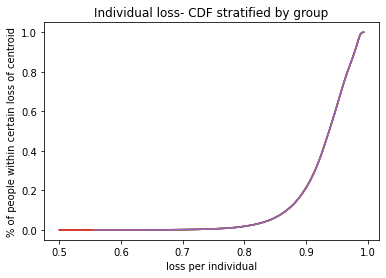

0.00022266815074578616
total:  0.650251435643084
weights:  [0.19999369 0.20000519 0.19999053 0.19999352 0.20001707]
Time elapsed Batch Step:  0.34718894958496094
Time elapsed Assignment Step:  2.258460283279419
0.0002138166539830122
total:  0.6501862615141706


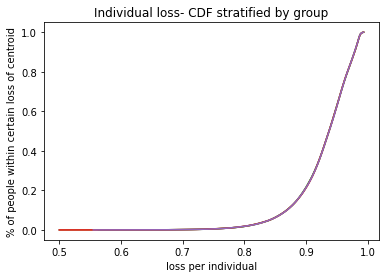

c  {0: (4.797863719145073, 3.9509500038203758), 1: (-10.289071097736688, -10.054742702258746), 2: (-12.099549412088157, 6.951739284513978), 3: (10.089457862494383, -4.796397541286141), 4: (-2.9381515284653044, 9.433758486649609), 5: (-2.989628184818261, 1.1362844472421052), 6: (3.2359503774063167, 10.309634777026984), 7: (4.726178450691078, -2.132825841292509), 8: (-7.328284972037647, -5.775066255485668), 9: (7.991115885870793, 8.51567812000353)}
weights:  [0.19999369 0.2000052  0.19999054 0.19999353 0.20001704]
Time elapsed Batch Step:  0.34488654136657715
Time elapsed Assignment Step:  2.2438039779663086
0.00020562790863365432
total:  0.6501211690650307


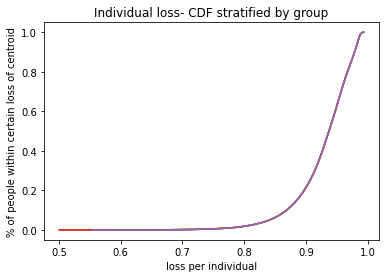

c  {0: (4.797449281420781, 3.950691522578209), 1: (-10.287732498487541, -10.053430685787822), 2: (-12.097893642778123, 6.951493555338445), 3: (10.08896471692045, -4.794880224459575), 4: (-2.93691595540348, 9.432617177100099), 5: (-2.988624391809758, 1.137425076937497), 6: (3.235015614955601, 10.308488299988701), 7: (4.726266731499908, -2.1317931617495254), 8: (-7.3291509986630805, -5.776820568340348), 9: (7.989537067206266, 8.514955570043437)}
weights:  [0.1999937  0.20000521 0.19999055 0.19999354 0.20001701]
Time elapsed Batch Step:  0.3409855365753174
Time elapsed Assignment Step:  2.261641025543213
0.0002043183698201556
total:  0.6500580225577909


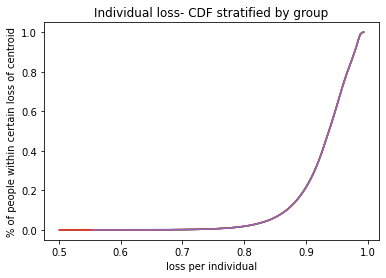

c  {0: (4.797034779474434, 3.950433008417047), 1: (-10.28639304204712, -10.052117829059519), 2: (-12.096236723885472, 6.951247682521653), 3: (10.088471204659784, -4.79336179870153), 4: (-2.935679613503776, 9.431475164533223), 5: (-2.9876200074532466, 1.138566404221086), 6: (3.234080207371235, 10.307341223031512), 7: (4.726355069056983, -2.1307601393224433), 8: (-7.330017650619855, -5.778576161428967), 9: (7.987957088785639, 8.514232494264743)}
weights:  [0.1999937  0.20000522 0.19999056 0.19999356 0.20001698]
Time elapsed Batch Step:  0.3436124324798584
Time elapsed Assignment Step:  2.2763712406158447
0.000197737395269737
total:  0.6499931765066896


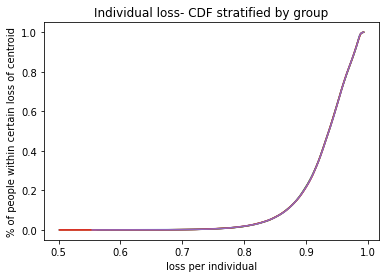

c  {0: (4.796620213277417, 3.9501744613568732), 1: (-10.285052728749255, -10.050804132384224), 2: (-12.094578654852262, 6.951001666089418), 3: (10.08797732541988, -4.791842263186636), 4: (-2.9344425027437757, 9.43033244898109), 5: (-2.986615031632888, 1.1397084293143478), 6: (3.2331441542121464, 10.306193546034695), 7: (4.726443463422492, -2.1297267740915165), 8: (-7.3308849279137105, -5.7803330348332045), 9: (7.986375950003907, 8.51350889241227)}
weights:  [0.1999937  0.20000523 0.19999056 0.19999357 0.20001694]
Time elapsed Batch Step:  0.35848474502563477
Time elapsed Assignment Step:  2.306910753250122
0.00019577554601513114
total:  0.6499295979868445


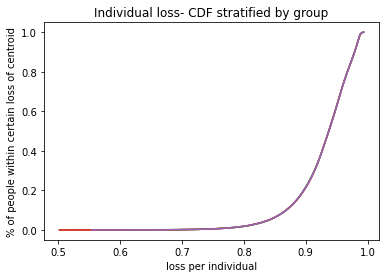

c  {0: (4.796205582801106, 3.9499158814176956), 1: (-10.283711558934783, -10.049489596078962), 2: (-12.092919435123274, 6.950755506068323), 3: (10.087483078908551, -4.7903216170907905), 4: (-2.933204623104498, 9.429189030479359), 5: (-2.9856094642346958, 1.1408511524369793), 6: (3.232207455037896, 10.305045268878903), 7: (4.72653191465669, -2.128693066137727), 8: (-7.33175283054636, -5.782091188626979), 9: (7.984793650259222, 8.51278476423239)}
weights:  [0.1999937  0.20000524 0.19999057 0.19999358 0.20001691]
Time elapsed Batch Step:  0.34873533248901367
Time elapsed Assignment Step:  2.29056715965271
0.00021059595079564453
total:  0.649870936234326


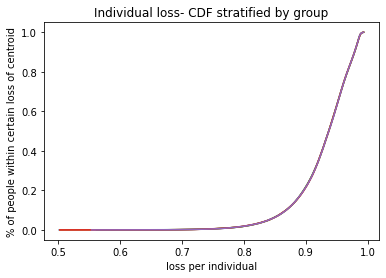

c  {0: (4.795790888016869, 3.949657268619545), 1: (-10.282369532951584, -10.048174220467425), 2: (-12.091259064146037, 6.9505092024857245), 3: (10.086988464833938, -4.788799859591168), 4: (-2.931965974570417, 9.428044909067264), 5: (-2.984603305146545, 1.1419945738068888), 6: (3.2312701094086855, 10.303896391446179), 7: (4.726620422819903, -2.127659015542787), 8: (-7.332621358515461, -5.7838506228764), 9: (7.983210188952917, 8.512060109473035)}
weights:  [0.1999937  0.20000525 0.19999058 0.19999359 0.20001687]
Time elapsed Batch Step:  0.34073591232299805
Time elapsed Assignment Step:  2.312211036682129
0.0002133644539112911
total:  0.6498085406575972


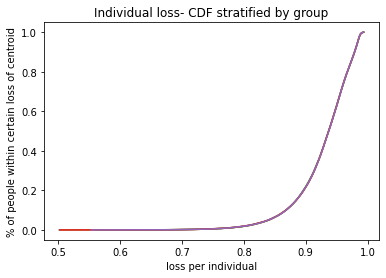

c  {0: (4.795376128896068, 3.949398622982476), 1: (-10.28102665115462, -10.046858005880019), 2: (-12.089597541370836, 6.950262755369754), 3: (10.086493482904505, -4.787276989866235), 4: (-2.9307265571294794, 9.426900084787631), 5: (-2.9835965542581815, 1.1431386936401848), 6: (3.230332116885362, 10.302746913619957), 7: (4.726708987972522, -2.12662462238914), 8: (-7.33349051181459, -5.785611337639718), 9: (7.981625565489529, 8.511334927883718)}
weights:  [0.1999937  0.20000526 0.19999059 0.19999361 0.20001684]
Time elapsed Batch Step:  0.34131550788879395
Time elapsed Assignment Step:  2.3054347038269043
0.00020244292684401533
total:  0.6497419187967148


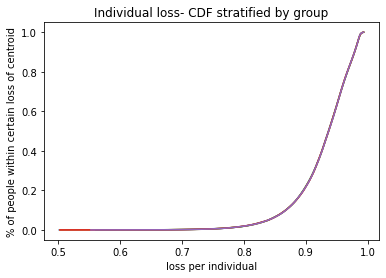

c  {0: (4.794961305410055, 3.9491399445265656), 1: (-10.27968291390598, -10.04554095265389), 2: (-12.087934866250741, 6.950016164749323), 3: (10.08599813282905, -4.785753007095762), 4: (-2.929486370773121, 9.425754557686895), 5: (-2.9825892114612347, 1.1442835121511667), 6: (3.2293934770294257, 10.301596835285077), 7: (4.726797610175008, -2.125589886759962), 8: (-7.3343602904332155, -5.787373332967272), 9: (7.980039779276827, 8.510609219215533)}
weights:  [0.1999937  0.20000527 0.1999906  0.19999362 0.2000168 ]
Time elapsed Batch Step:  0.3564186096191406
Time elapsed Assignment Step:  2.263056993484497
0.00020585362977987298
total:  0.6496794767937514


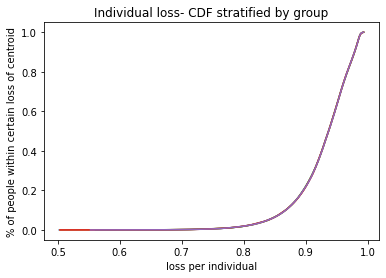

c  {0: (4.794546417530176, 3.948881233271915), 1: (-10.278338321574914, -10.044223061132973), 2: (-12.086271038241625, 6.9497694306541264), 3: (10.085502414316707, -4.784227910460843), 4: (-2.9282454154962854, 9.424608327815122), 5: (-2.9815812766492242, 1.1454290295523137), 6: (3.228454189403035, 10.30044615632778), 7: (4.726886289487888, -2.124554808739166), 8: (-7.335230694356673, -5.78913660890144), 9: (7.978452829725831, 8.509882983221175)}
weights:  [0.1999937  0.20000528 0.19999061 0.19999363 0.20001677]
Time elapsed Batch Step:  0.33679723739624023
Time elapsed Assignment Step:  2.2838573455810547
0.00021276968784322836
total:  0.6496179675210747


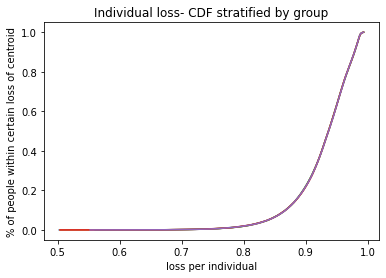

c  {0: (4.794131465227767, 3.948622489238649), 1: (-10.276992874537884, -10.042904331668016), 2: (-12.08460605680218, 6.949522553114644), 3: (10.085006327076954, -4.782701699143904), 4: (-2.927003691297442, 9.423461395226022), 5: (-2.980572749717573, 1.1465752460542746), 6: (3.227514253569015, 10.299294876635727), 7: (4.72697502597176, -2.1235193884114016), 8: (-7.336101723566138, -5.790901165476591), 9: (7.976864716250843, 8.50915621965495)}
weights:  [0.1999937  0.20000529 0.19999062 0.19999364 0.20001674]
Time elapsed Batch Step:  0.34575843811035156
Time elapsed Assignment Step:  2.2485811710357666
0.00020681302937630708
total:  0.6495524773375129


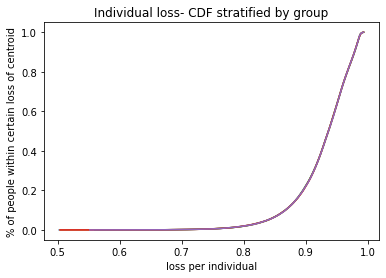

c  {0: (4.793716448474156, 3.948363712446915), 1: (-10.27564657317859, -10.041584764616628), 2: (-12.08293992139394, 6.9492755321621456), 3: (10.084509870819609, -4.781174372328718), 4: (-2.9257611981786034, 9.422313759976978), 5: (-2.979563630563616, 1.147722161865858), 6: (3.2265736690908597, 10.298142996097999), 7: (4.727063819687287, -2.1224836258620567), 8: (-7.3369733780386, -5.792667002719029), 9: (7.975275438269466, 8.508428928272783)}
weights:  [0.1999937  0.2000053  0.19999063 0.19999366 0.2000167 ]
Time elapsed Batch Step:  0.3615443706512451
Time elapsed Assignment Step:  2.292022466659546
0.000197020053801511
total:  0.6494857162903139


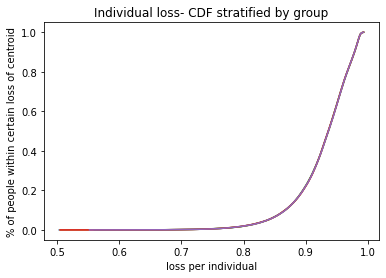

c  {0: (4.793301367240667, 3.9481049029168838), 1: (-10.274299417888027, -10.040264360343313), 2: (-12.081272631481301, 6.949028367828694), 3: (10.08401304525484, -4.779645929200422), 4: (-2.9245179361453437, 9.421165422129054), 5: (-2.9785539190866124, 1.1488697771940204), 6: (3.2256324355327424, 10.296990514605103), 7: (4.727152670695202, -2.121447521177261), 8: (-7.337845657746835, -5.7944341206469465), 9: (7.973684995202634, 8.507701108832237)}
weights:  [0.19999371 0.20000531 0.19999064 0.19999367 0.20001666]
Time elapsed Batch Step:  0.341754674911499
Time elapsed Assignment Step:  2.2516298294067383
0.00019816891859514296
total:  0.6494221185211


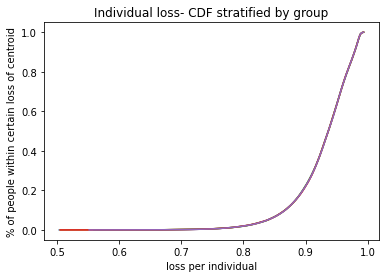

c  {0: (4.79288622149861, 3.94784606066875), 1: (-10.272951409064515, -10.038943119219509), 2: (-12.079604186531537, 6.948781060147149), 3: (10.083515850093171, -4.778116368945527), 4: (-2.9232739052068166, 9.420016381747018), 5: (-2.9775436151877526, 1.1500180922438572), 6: (3.22469055245952, 10.295837432048984), 7: (4.727241579056304, -2.1204110744438873), 8: (-7.33871856265938, -5.796202519270369), 9: (7.97209338647463, 8.506972761092518)}
weights:  [0.19999371 0.20000533 0.19999066 0.19999368 0.20001663]
Time elapsed Batch Step:  0.3730611801147461
Time elapsed Assignment Step:  2.27482533454895
0.0002010424036039682
total:  0.649358918104113


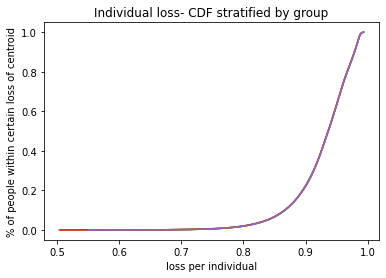

c  {0: (4.792471011219291, 3.9475871857227323), 1: (-10.271602547113744, -10.03762104162362), 2: (-12.077934586014825, 6.948533609151171), 3: (10.083018285045481, -4.776585690751936), 4: (-2.9220291053757723, 9.418866638899367), 5: (-2.9765327187701724, 1.1511671072185912), 6: (3.2237480194367407, 10.294683748323031), 7: (4.727330544831461, -2.1193742857495517), 8: (-7.339592092740503, -5.797972198591107), 9: (7.97050061151312, 8.506243884814493)}
weights:  [0.19999371 0.20000534 0.19999067 0.1999937  0.20001659]
Time elapsed Batch Step:  0.3640158176422119
Time elapsed Assignment Step:  2.247152090072632
0.00020239763113860665
total:  0.6492951415157249


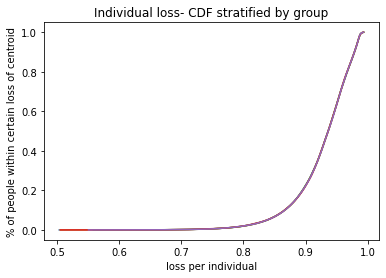

c  {0: (4.792055736374008, 3.947328278099071), 1: (-10.270252832448817, -10.036298127941063), 2: (-12.076263829404262, 6.9482860148752215), 3: (10.082520349823012, -4.775053893808958), 4: (-2.9207835366685777, 9.417716193658338), 5: (-2.9755212297389613, 1.1523168223195623), 6: (3.2228048360306483, 10.293529463322079), 7: (4.7274195680816105, -2.118337155182618), 8: (-7.34046624795018, -5.7997431586027), 9: (7.968906669749168, 8.505514479760699)}
weights:  [0.19999371 0.20000535 0.19999068 0.19999371 0.20001656]
Time elapsed Batch Step:  0.35123443603515625
Time elapsed Assignment Step:  2.278331756591797
0.0001967683997750047
total:  0.649229144212202


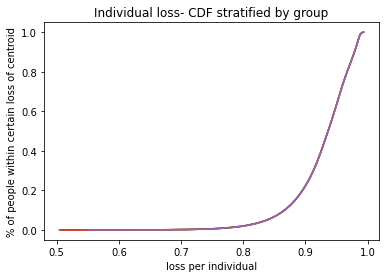

c  {0: (4.791635007883294, 3.9470734018612097), 1: (-10.268902265490288, -10.0349743785643), 2: (-12.074591916175885, 6.948038277354573), 3: (10.082022044137371, -4.773520977307319), 4: (-2.9195371991052324, 9.416565046099931), 5: (-2.9745091480011734, 1.1534672377462165), 6: (3.221861001808191, 10.292374576942422), 7: (4.727512163551735, -2.1173008081285967), 8: (-7.341341028244064, -5.80151539929037), 9: (7.967311560617271, 8.504784545695353)}
weights:  [0.19999371 0.20000536 0.19999069 0.19999372 0.20001652]
Time elapsed Batch Step:  0.3548877239227295
Time elapsed Assignment Step:  2.22741961479187
0.00019430135731701714
total:  0.6491639485688468


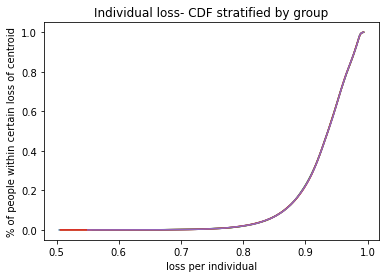

c  {0: (4.791214212594551, 3.946818493116121), 1: (-10.267550846666209, -10.033649793892877), 2: (-12.072918845808696, 6.947790396625304), 3: (10.08152336770054, -4.771986940439181), 4: (-2.918290092709389, 9.415413196303929), 5: (-2.973496473465838, 1.154618353696096), 6: (3.2209015538306227, 10.29121829642586), 7: (4.727604819199534, -2.1162641181111104), 8: (-7.342216433573461, -5.803288920630961), 9: (7.965719094083143, 8.504060574273566)}
weights:  [0.19999372 0.20000537 0.1999907  0.19999373 0.20001649]
Time elapsed Batch Step:  0.3845798969268799
Time elapsed Assignment Step:  2.219536066055298
0.00020575477226458805
total:  0.6491028083240494


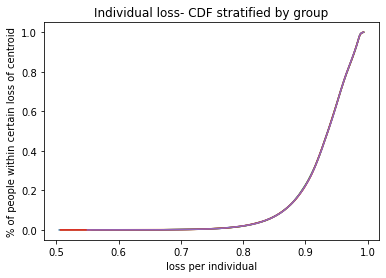

c  {0: (4.790793350477656, 3.9465635518836586), 1: (-10.266198576412169, -10.032324374333466), 2: (-12.071244617784675, 6.9475423727243095), 3: (10.081024320224866, -4.770451782398154), 4: (-2.917042217508369, 9.414260644353915), 5: (-2.9724832060439708, 1.155770170364827), 6: (3.2199414420069656, 10.29006139930972), 7: (4.727697535088581, -2.1152270852161754), 8: (-7.343092463885301, -5.8050637225928945), 9: (7.96412546216096, 8.503336078715583)}
weights:  [0.19999372 0.20000538 0.19999071 0.19999375 0.20001645]
Time elapsed Batch Step:  0.3485121726989746
Time elapsed Assignment Step:  2.293238639831543
0.00021989146219747457
total:  0.6490423527368442


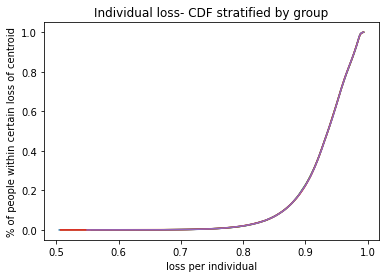

c  {0: (4.790372421502477, 3.946308578183699), 1: (-10.264845455171335, -10.030998120299898), 2: (-12.069569231588808, 6.947294205689303), 3: (10.08052490142309, -4.768915502379311), 4: (-2.9157935735331844, 9.413107390337291), 5: (-2.971469345648584, 1.156922687946111), 6: (3.2189806659000233, 10.288903885468923), 7: (4.727790311282516, -2.1141897095305535), 8: (-7.343969119122109, -5.80683980513611), 9: (7.96253066428555, 8.502611058789306)}
weights:  [0.19999372 0.20000539 0.19999073 0.19999376 0.20001641]
Time elapsed Batch Step:  0.3612515926361084
Time elapsed Assignment Step:  2.2619423866271973
0.00021312534577277997
total:  0.6489755049482994


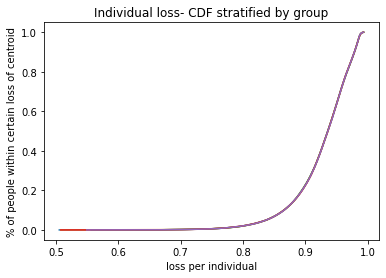

c  {0: (4.789951425638875, 3.946053572036141), 1: (-10.263491483394494, -10.029671032213207), 2: (-12.0678926867091, 6.9470458955588175), 3: (10.080025111008323, -4.767378099579205), 4: (-2.914544160818553, 9.411953434345303), 5: (-2.970454892194696, 1.158075906631712), 6: (3.218019225073374, 10.287745754779886), 7: (4.727883147845052, -2.1131519911417533), 8: (-7.344846399221979, -5.808617168212017), 9: (7.9609346998951755, 8.501885514264321)}
weights:  [0.19999372 0.2000054  0.19999074 0.19999377 0.20001638]
Time elapsed Batch Step:  0.3339223861694336
Time elapsed Assignment Step:  2.3212718963623047
0.00021572021268734254
total:  0.6489113616519061


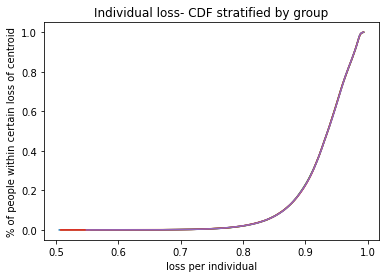

c  {0: (4.789527144747055, 3.9457897348567563), 1: (-10.262136661540104, -10.028343110501664), 2: (-12.066214982636605, 6.946797442372211), 3: (10.079524948694075, -4.765839573195881), 4: (-2.9132939794029187, 9.410798776473055), 5: (-2.9694398455993443, 1.1592298266114467), 6: (3.2170571190913786, 10.286587007120522), 7: (4.72797604483997, -2.1121139301380314), 8: (-7.345724304118544, -5.810395811763437), 9: (7.9593447749776995, 8.501162490913874)}
weights:  [0.19999372 0.20000541 0.19999075 0.19999378 0.20001634]
Time elapsed Batch Step:  0.34334826469421387
Time elapsed Assignment Step:  2.2216546535491943
0.00022155719928751427
total:  0.6488480686409903


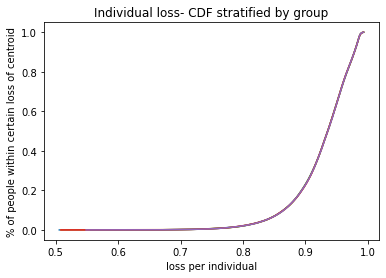

c  {0: (4.789102795222029, 3.9455258652829506), 1: (-10.260780990074325, -10.027014355600823), 2: (-12.064536118865437, 6.946548846169669), 3: (10.079024414194242, -4.764299922428891), 4: (-2.9120430293284696, 9.409643416819529), 5: (-2.968424205781594, 1.1603844480731733), 6: (3.2160943475191868, 10.285427642370253), 7: (4.728069002331122, -2.1110755266083956), 8: (-7.346602833740954, -5.812175735724553), 9: (7.957753688050404, 8.500438944752256)}
weights:  [0.19999373 0.20000542 0.19999077 0.19999379 0.2000163 ]
Time elapsed Batch Step:  0.36090826988220215
Time elapsed Assignment Step:  2.310117483139038
0.00021528301787998583
total:  0.6487810203511657


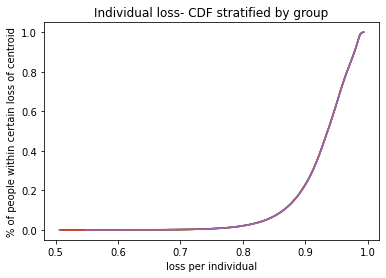

c  {0: (4.788678377033603, 3.945261963336251), 1: (-10.259424469471071, -10.02568476795355), 2: (-12.062856094892798, 6.946300106992211), 3: (10.078523507223121, -4.762759146479311), 4: (-2.9107913106411565, 9.408487355487608), 5: (-2.967407972662551, 1.1615397712027808), 6: (3.215130909922745, 10.284267660410014), 7: (4.728162020382429, -2.1100367806426052), 8: (-7.347481988013841, -5.813956940020856), 9: (7.956161438549252, 8.499714875547609)}
weights:  [0.19999373 0.20000543 0.19999078 0.1999938  0.20001626]
Time elapsed Batch Step:  0.3701603412628174
Time elapsed Assignment Step:  2.2623133659362793
0.00020372693677594977
total:  0.6487122652832604


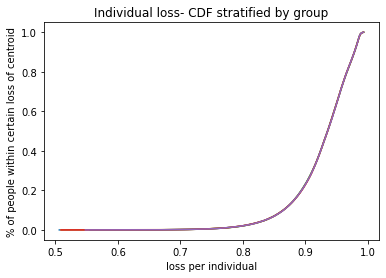

c  {0: (4.788253890151573, 3.944998029038209), 1: (-10.258067100212045, -10.024354348010071), 2: (-12.061174910218995, 6.946051224881688), 3: (10.07802222749541, -4.761217244549757), 4: (-2.9095388233907116, 9.407330592584094), 5: (-2.96639114616537, 1.1626957961841773), 6: (3.214166805868803, 10.283107061122262), 7: (4.7282550990578835, -2.108997692331174), 8: (-7.34836176685729, -5.815739424569086), 9: (7.9545680259136216, 8.498990283069746)}
weights:  [0.19999373 0.20000544 0.19999079 0.19999381 0.20001622]
Time elapsed Batch Step:  0.35030460357666016
Time elapsed Assignment Step:  2.230355978012085
0.00020174211617529636
total:  0.6486462598101358


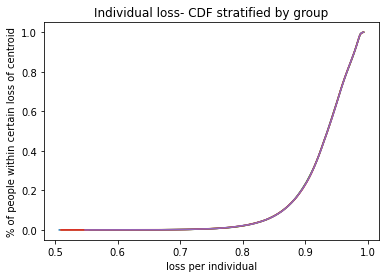

c  {0: (4.787829334545726, 3.944734062410401), 1: (-10.256708882786791, -10.023023096228009), 2: (-12.059492564347465, 6.945802199880793), 3: (10.077520574726215, -4.759674215844395), 4: (-2.9082855676306676, 9.406173128219725), 5: (-2.9653737262152675, 1.1638525231992798), 6: (3.2132020349249206, 10.281945844390982), 7: (4.728348238421545, -2.107958261765373), 8: (-7.34924217018682, -5.817523189277183), 9: (7.952973449586326, 8.498265167090167)}
weights:  [0.19999373 0.20000545 0.19999081 0.19999382 0.20001618]
Time elapsed Batch Step:  0.3608071804046631
Time elapsed Assignment Step:  2.2527880668640137
0.00021009855397702282
total:  0.648583235039384


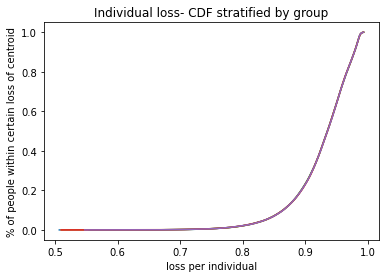

c  {0: (4.78740471018584, 3.944470063474426), 1: (-10.255349817692728, -10.021691013072422), 2: (-12.057809056784794, 6.945553032033061), 3: (10.07701854863105, -4.7581300595689635), 4: (-2.907031543418376, 9.4050149625092), 5: (-2.9643557127395326, 1.1650099524280026), 6: (3.212236596659476, 10.2807840101017), 7: (4.728441438537546, -2.1069184890372292), 8: (-7.350123197913344, -5.81930823404423), 9: (7.951377709013638, 8.497539527382065)}
weights:  [0.19999374 0.20000547 0.19999082 0.19999383 0.20001614]
Time elapsed Batch Step:  0.335648775100708
Time elapsed Assignment Step:  2.222777843475342
0.00021588174564735052
total:  0.6485193160191939


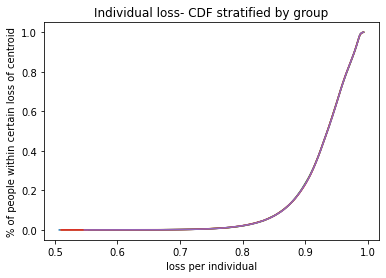

c  {0: (4.786980017041688, 3.9442060322519095), 1: (-10.253989905435207, -10.020358099015844), 2: (-12.056124387040738, 6.945303721382871), 3: (10.076516148925851, -4.756584774930783), 4: (-2.9057767508150265, 9.403856095571197), 5: (-2.9633371056675366, 1.1661680840482465), 6: (3.2112704906416716, 10.279621558141482), 7: (4.728534699470087, -2.105878374239531), 8: (-7.351004849943149, -5.821094558760397), 9: (7.949780803645321, 8.49681336372034)}
weights:  [0.19999374 0.20000548 0.19999084 0.19999385 0.2000161 ]
Time elapsed Batch Step:  0.3479146957397461
Time elapsed Assignment Step:  2.2833571434020996
0.00021002536845360353
total:  0.648451782262708


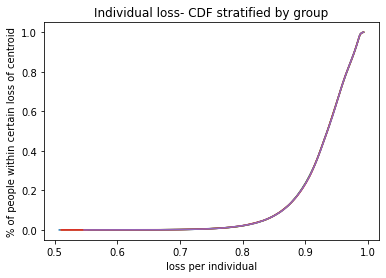

c  {0: (4.786555255083031, 3.9439419687645003), 1: (-10.252629146527537, -10.019024354538328), 2: (-12.054438554628243, 6.945054267975453), 3: (10.076013375326967, -4.755038361138774), 4: (-2.9045211898856653, 9.402696527528388), 5: (-2.962317904930746, 1.167326918235887), 6: (3.210303716441542, 10.278458488398952), 7: (4.728628021283439, -2.1048379174658285), 8: (-7.351887126177862, -5.822882163306887), 9: (7.948182732934649, 8.496086675881617)}
weights:  [0.19999374 0.20000549 0.19999085 0.19999386 0.20001606]
Time elapsed Batch Step:  0.3726928234100342
Time elapsed Assignment Step:  2.3573496341705322
0.00021358795557724353
total:  0.6483869513314084


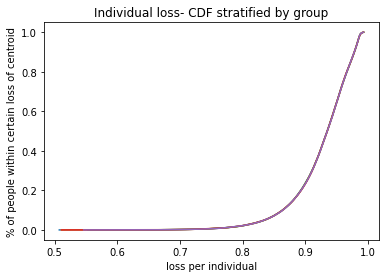

c  {0: (4.786130424279623, 3.943677873033872), 1: (-10.251267541491048, -10.017689780127474), 2: (-12.052751559063472, 6.944804671856891), 3: (10.075510227551177, -4.753490817403473), 4: (-2.903264860699214, 9.401536258507468), 5: (-2.961298110462731, 1.1684864551647638), 6: (3.209336273629962, 10.277294800764293), 7: (4.7287214040419405, -2.1037971188104354), 8: (-7.352770026514423, -5.824671047555882), 9: (7.946583496338436, 8.49535946364425)}
weights:  [0.19999374 0.2000055  0.19999087 0.19999387 0.20001602]
Time elapsed Batch Step:  0.3530724048614502
Time elapsed Assignment Step:  2.2664899826049805
0.00021497789198055006
total:  0.6483213461964873


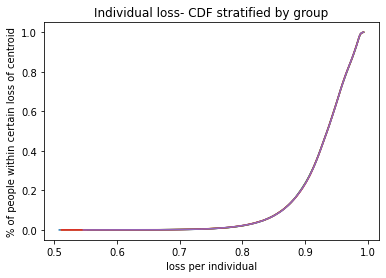

c  {0: (4.785705524601209, 3.9434137450817226), 1: (-10.249905090855119, -10.016354376278489), 2: (-12.051063399865821, 6.944554933074125), 3: (10.07500670531569, -4.751942142937047), 4: (-2.9020077633284904, 9.400375288639172), 5: (-2.9602777221991796, 1.1696466950066693), 6: (3.2083681617786524, 10.276130495129255), 7: (4.728814847810004, -2.102755978368431), 8: (-7.353653550845055, -5.826461211370485), 9: (7.944983093317059, 8.494631726788343)}
weights:  [0.19999374 0.20000551 0.19999088 0.19999388 0.20001598]
Time elapsed Batch Step:  0.34439635276794434
Time elapsed Assignment Step:  2.2954351902008057
0.00021481362540354265
total:  0.6482551516316035


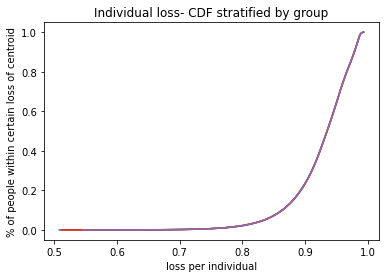

c  {0: (4.7852805560175256, 3.943149584929775), 1: (-10.248541795157232, -10.015018143494208), 2: (-12.049374076557944, 6.944305051674954), 3: (10.074502808338147, -4.7503923369533085), 4: (-2.900749897850225, 9.399213618058287), 5: (-2.959256740077906, 1.170807637931337), 6: (3.2073993804601875, 10.274965571387165), 7: (4.728908352652109, -2.1017144962356613), 8: (-7.3545376990572375, -5.828252654604664), 9: (7.943381523334486, 8.493903465095755)}
weights:  [0.19999375 0.20000553 0.1999909  0.1999939  0.20001594]
Time elapsed Batch Step:  0.34688663482666016
Time elapsed Assignment Step:  2.252927780151367
0.0002191296126167197
total:  0.6481902265426601


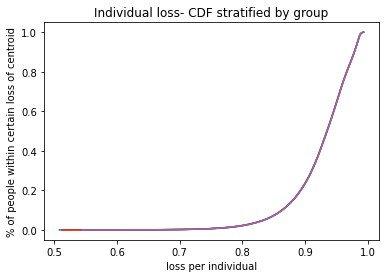

c  {0: (4.7848559578209775, 3.9428835704466487), 1: (-10.247177654943012, -10.013681082285146), 2: (-12.047683588665775, 6.9440550277080435), 3: (10.073998536336632, -4.748841398667735), 4: (-2.899491264345082, 9.398051246903686), 5: (-2.958240296300983, 1.1719628431035352), 6: (3.206429929248004, 10.273800029432936), 7: (4.729001918632805, -2.1006726725087437), 8: (-7.355422471033672, -5.830045377103197), 9: (7.941778785858303, 8.493174678350117)}
weights:  [0.19999375 0.20000554 0.19999091 0.19999391 0.2000159 ]
Time elapsed Batch Step:  0.3513178825378418
Time elapsed Assignment Step:  2.276689291000366
0.00021186606625900328
total:  0.6481217036049325


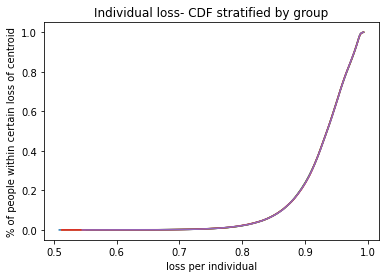

c  {0: (4.784431291230713, 3.9426175231102607), 1: (-10.245812670766275, -10.012343193169533), 2: (-12.045991935718547, 6.943804861222925), 3: (10.07349388902967, -4.74728932729748), 4: (-2.898231862897678, 9.396888175318338), 5: (-2.9572232631945323, 1.1731187455227292), 6: (3.205459807716406, 10.27263386916307), 7: (4.729095545816711, -2.099630507285065), 8: (-7.3563078666522586, -5.8318393787016145), 9: (7.940174880359738, 8.492445366336844)}
weights:  [0.19999375 0.20000555 0.19999092 0.19999392 0.20001586]
Time elapsed Batch Step:  0.34695005416870117
Time elapsed Assignment Step:  2.288735866546631
0.0002183204049049925
total:  0.6480571725847452


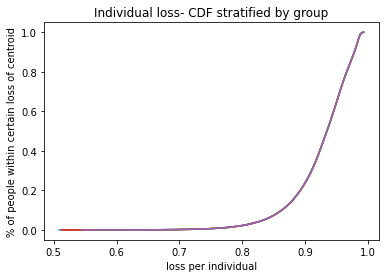

c  {0: (4.784006556216834, 3.9423514429424165), 1: (-10.244446843189072, -10.011004476673362), 2: (-12.044299117248817, 6.943554552270001), 3: (10.072988866136239, -4.745736122061393), 4: (-2.8969716935966017, 9.395724403449334), 5: (-2.956205640698327, 1.1742753453551618), 6: (3.204489015440575, 10.27146709047567), 7: (4.7291892342685165, -2.0985880006627866), 8: (-7.35719388578606, -5.833634659226145), 9: (7.938569806313688, 8.491715528843146)}
weights:  [0.19999375 0.20000556 0.19999094 0.19999393 0.20001582]
Time elapsed Batch Step:  0.34984302520751953
Time elapsed Assignment Step:  2.268383264541626
0.0002156534692229206
total:  0.6479897808186302


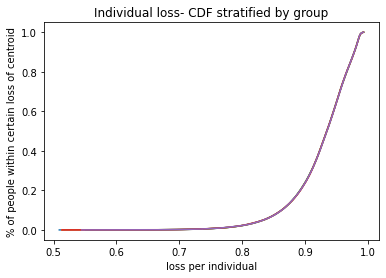

c  {0: (4.783581752749435, 3.9420853299649465), 1: (-10.243080172781731, -10.009664933330418), 2: (-12.04260513279249, 6.9433041009005505), 3: (10.072483467375767, -4.744181782180032), 4: (-2.8957107565344318, 9.394559931447903), 5: (-2.9551874287542526, 1.1754326427650306), 6: (3.203517551996576, 10.27029969327045), 7: (4.72928298405298, -2.0975451527408446), 8: (-7.358080528303278, -5.835431218493653), 9: (7.936963563198747, 8.490985165658044)}
weights:  [0.19999375 0.20000557 0.19999095 0.19999394 0.20001578]
Time elapsed Batch Step:  0.353426456451416
Time elapsed Assignment Step:  2.29917573928833
0.00021939348372057577
total:  0.647924186725522


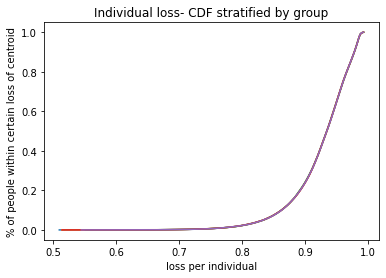

c  {0: (4.783156880798602, 3.9418191841997063), 1: (-10.241712660122905, -10.008324563682333), 2: (-12.040909981888834, 6.94305350716673), 3: (10.071977692468142, -4.7426263068756835), 4: (-2.8944490518077584, 9.393394759469436), 5: (-2.9541686273063177, 1.1765906379144777), 6: (3.202545416961365, 10.269131677448737), 7: (4.72937679523493, -2.096501963618952), 8: (-7.358967794067218, -5.837229056311589), 9: (7.935356150497229, 8.49025427657238)}
weights:  [0.19999375 0.20000558 0.19999097 0.19999396 0.20001574]
Time elapsed Batch Step:  0.3501896858215332
Time elapsed Assignment Step:  2.288357734680176
0.00022180295405571648
total:  0.6478580688598665


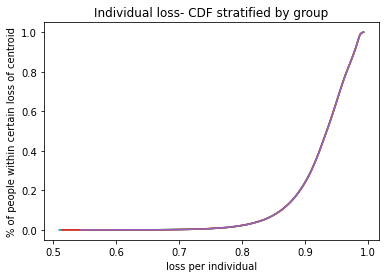

c  {0: (4.782731940334413, 3.9415530056685757), 1: (-10.240344305799617, -10.006983368278615), 2: (-12.039213664080512, 6.942802771121578), 3: (10.071471541133718, -4.741069695372376), 4: (-2.893186579517201, 9.392228887673504), 5: (-2.953149236300666, 1.1777493309635776), 6: (3.201572609912797, 10.267963042913482), 7: (4.729470667879264, -2.095458433397601), 8: (-7.359855682936263, -5.839028172477924), 9: (7.933747567695202, 8.48952286137883)}
weights:  [0.19999375 0.20000559 0.19999098 0.19999397 0.2000157 ]
Time elapsed Batch Step:  0.3338017463684082
Time elapsed Assignment Step:  2.20139479637146
0.00022441257788896607
total:  0.6477918858163746


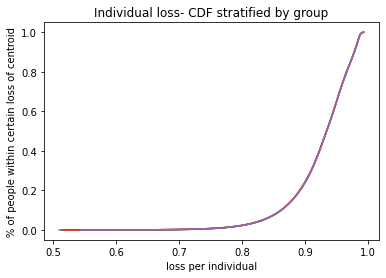

c  {0: (4.782306931326938, 3.9412867943934597), 1: (-10.238975110407306, -10.005641347676695), 2: (-12.037516178913597, 6.942551892819019), 3: (10.070965013093318, -4.739511946895898), 4: (-2.891923339767429, 9.391062316223882), 5: (-2.9521292556855867, 1.1789087220703267), 6: (3.2005991304296324, 10.26679378956927), 7: (4.72956460205095, -2.094414562178066), 8: (-7.360744194763841, -5.840828566781099), 9: (7.932137814282506, 8.48879091987192)}
weights:  [0.19999375 0.2000056  0.199991   0.19999398 0.20001566]
Time elapsed Batch Step:  0.3345355987548828
Time elapsed Assignment Step:  2.247519016265869
0.00022259659852741365
total:  0.6477242502870175


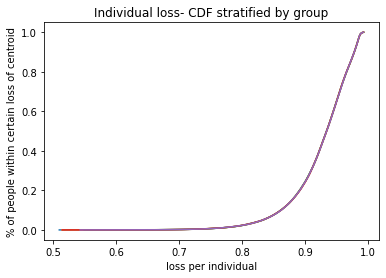

c  {0: (4.78188185374624, 3.941020550396288), 1: (-10.237605074549872, -10.004298502441971), 2: (-12.035817525937599, 6.942300872313867), 3: (10.070458108068234, -4.737953060673813), 4: (-2.8906593326671812, 9.389895045288567), 5: (-2.9511086854115267, 1.1800688113906317), 6: (3.199624978091547, 10.265623917322324), 7: (4.7296585978150265, -2.093370350062402), 8: (-7.361633329398396, -5.84263023899996), 9: (7.9305268897527865, 8.488058451848037)}
weights:  [0.19999376 0.20000561 0.19999101 0.199994   0.20001562]
Time elapsed Batch Step:  0.36887192726135254
Time elapsed Assignment Step:  2.2862846851348877
0.00021832988556313992
total:  0.6476557539244825


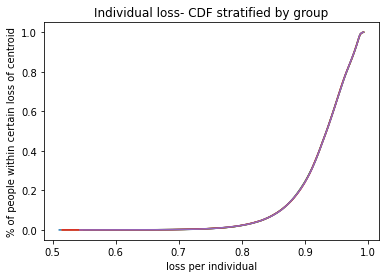

c  {0: (4.781456707562372, 3.940754273699014), 1: (-10.236234198839721, -10.002954833147845), 2: (-12.034117704705485, 6.9420497096618305), 3: (10.069950825780241, -4.736393035935476), 4: (-2.889394558329285, 9.388727075039798), 5: (-2.9500875254311008, 1.1812295990782977), 6: (3.198650152479137, 10.26445342608052), 7: (4.729752655236599, -2.0923257971534506), 8: (-7.362523086683357, -5.8444331889037064), 9: (7.92891479360352, 8.487325457105438)}
weights:  [0.19999376 0.20000562 0.19999103 0.19999401 0.20001558]
Time elapsed Batch Step:  0.3434450626373291
Time elapsed Assignment Step:  2.234147787094116
0.0002120845266233573
total:  0.6475865388170745


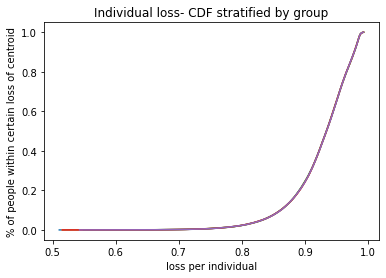

c  {0: (4.781031492745379, 3.940487964323618), 1: (-10.234862483897814, -10.001610340375764), 2: (-12.032416714773705, 6.941798404919514), 3: (10.069443165951597, -4.734831871912052), 4: (-2.8881290168706757, 9.38755840565408), 5: (-2.949065775699103, 1.1823910852850177), 6: (3.197674653173929, 10.263282315753383), 7: (4.729846774380842, -2.0912809035548396), 8: (-7.363413466457106, -5.846237416251828), 9: (7.927301525336039, 8.486591935444274)}
weights:  [0.19999376 0.20000563 0.19999104 0.19999402 0.20001554]
Time elapsed Batch Step:  0.3635718822479248
Time elapsed Assignment Step:  2.2869532108306885
0.00020305449790614105
total:  0.6475163136107143


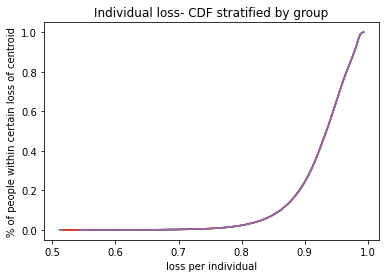

c  {0: (4.780601817976972, 3.940227582522251), 1: (-10.23348993035371, -10.000265024715269), 2: (-12.030714555702213, 6.941546958144423), 3: (10.06893512830505, -4.733269567836531), 4: (-2.8868627084124183, 9.3863890373122), 5: (-2.9480434361725187, 1.1835532701603602), 6: (3.196681018670874, 10.262109668388197), 7: (4.7299427590664305, -2.090234165731931), 8: (-7.36430446855295, -5.848042920794048), 9: (7.925688560438136, 8.485866357142887)}
weights:  [0.19999376 0.20000564 0.19999106 0.19999403 0.2000155 ]
Time elapsed Batch Step:  0.34326696395874023
Time elapsed Assignment Step:  2.264087677001953
0.00020040963282919044
total:  0.6474478785390151


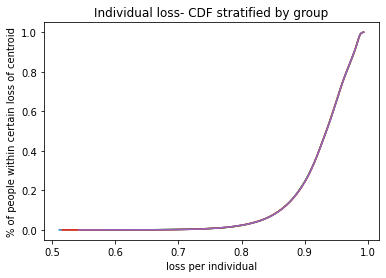

c  {0: (4.780172071984746, 3.939967169151182), 1: (-10.232116538845611, -9.998918886764027), 2: (-12.02901122705449, 6.941295369394966), 3: (10.068426712563838, -4.731706122943745), 4: (-2.885595633079725, 9.385218970199258), 5: (-2.9470205068105346, 1.1847161538517585), 6: (3.195686697289924, 10.260936382204203), 7: (4.7300388071148305, -2.089187083329669), 8: (-7.365196092799088, -5.849849702270261), 9: (7.924074424935059, 8.485140258613571)}
weights:  [0.19999377 0.20000565 0.19999108 0.19999405 0.20001546]
Time elapsed Batch Step:  0.34290266036987305
Time elapsed Assignment Step:  2.2623884677886963
0.00020504794024123196
total:  0.6473815023007412


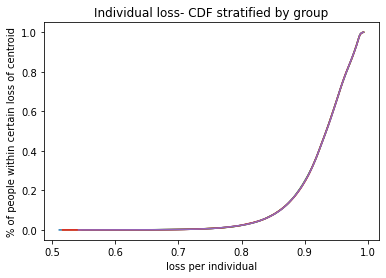

c  {0: (4.779742254736802, 3.9397067242318236), 1: (-10.230742310020418, -9.997571927127883), 2: (-12.027306728397567, 6.941043638730462), 3: (10.0679179184517, -4.730141536470386), 4: (-2.8843277910019767, 9.384048204504673), 5: (-2.945996987574552, 1.1858797365044986), 6: (3.194691688613257, 10.259762457086547), 7: (4.730134918593093, -2.0881396564478076), 8: (-7.366088339018579, -5.851657760410479), 9: (7.922459118336236, 8.484413639663737)}
weights:  [0.19999377 0.20000567 0.1999911  0.19999406 0.20001541]
Time elapsed Batch Step:  0.3577282428741455
Time elapsed Assignment Step:  2.2899539470672607
0.00020474196172426407
total:  0.6473135157295681


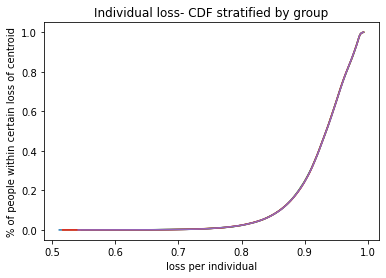

c  {0: (4.779312366201234, 3.9394462477856123), 1: (-10.229367244533764, -9.996224146420895), 2: (-12.025601059302053, 6.940791766211139), 3: (10.067408745692882, -4.728575807655022), 4: (-2.883059182312742, 9.382876740422216), 5: (-2.944972878428196, 1.1870440182617077), 6: (3.1936959922240784, 10.258587892922087), 7: (4.7302310935683405, -2.0870918851868923), 8: (-7.366981207029315, -5.853467094934767), 9: (7.920842640155007, 8.483686500102698)}
weights:  [0.19999377 0.20000568 0.19999111 0.19999407 0.20001537]
Time elapsed Batch Step:  0.3668203353881836
Time elapsed Assignment Step:  2.2737791538238525
0.00021377176763759387
total:  0.647248202182819


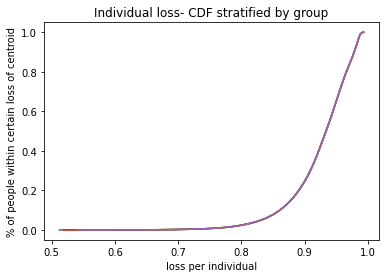

c  {0: (4.778882406346124, 3.9391857398340084), 1: (-10.227991343050071, -9.99487554526538), 2: (-12.02389421934215, 6.940539751898142), 3: (10.066899194012136, -4.727008935738114), 4: (-2.8817898071497985, 9.381704578150027), 5: (-2.9439481793373288, 1.1882089992643428), 6: (3.1926996077066283, 10.257412689599413), 7: (4.730327332107768, -2.0860437696482594), 8: (-7.367874696643985, -5.855277705553185), 9: (7.919224989908652, 8.482958839741675)}
weights:  [0.19999377 0.20000569 0.19999113 0.19999408 0.20001532]
Time elapsed Batch Step:  0.3527829647064209
Time elapsed Assignment Step:  2.2628774642944336
0.00020796199295003426
total:  0.6471783089324248


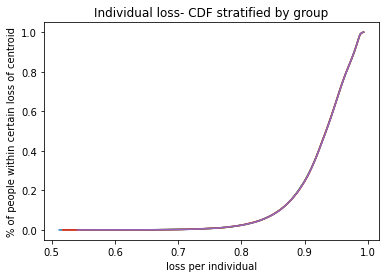

c  {0: (4.7784523751395485, 3.9389252003984967), 1: (-10.226614606242597, -9.993526124291956), 2: (-12.022186208095684, 6.940287595853537), 3: (10.066389263134727, -4.7254409199620335), 4: (-2.8805196656551515, 9.380531717890635), 5: (-2.9429228902700606, 1.1893746796511786), 6: (3.1917025346461894, 10.256236847008848), 7: (4.730423634278639, -2.0849953099340404), 8: (-7.368768807670046, -5.857089591965728), 9: (7.917606167118419, 8.482230658393815)}
weights:  [0.19999378 0.2000057  0.19999115 0.1999941  0.20001528]
Time elapsed Batch Step:  0.3612532615661621
Time elapsed Assignment Step:  2.291445016860962
0.00020952884588210097
total:  0.6471105016402908


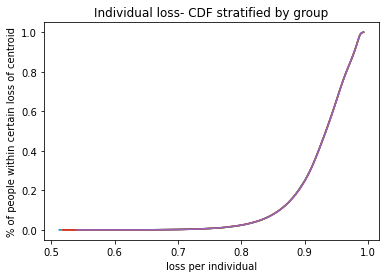

c  {0: (4.778022272549571, 3.9386646295005856), 1: (-10.225237034793476, -9.992175884139584), 2: (-12.020477025144126, 6.94003529814031), 3: (10.065878952786447, -4.723871759571079), 4: (-2.879248757975055, 9.379358159850984), 5: (-2.941897011196761, 1.1905410595587962), 6: (3.190704772629097, 10.255060365042462), 7: (4.730520000148291, -2.0839465061471625), 8: (-7.3696635399096895, -5.858902753862265), 9: (7.915986171309551, 8.481501955874204)}
weights:  [0.19999378 0.20000571 0.19999116 0.19999411 0.20001523]
Time elapsed Batch Step:  0.36367225646972656
Time elapsed Assignment Step:  2.284672975540161
0.00020571952805226168
total:  0.6470409541030003


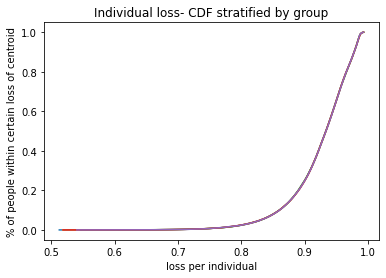

c  {0: (4.7775920985442495, 3.938404027161807), 1: (-10.223858629393774, -9.990824825455613), 2: (-12.018766670072615, 6.939782858822374), 3: (10.065368262693605, -4.722301453811495), 4: (-2.8779770842600323, 9.378183904242446), 5: (-2.94087054209007, 1.1917081391215707), 6: (3.189706321242745, 10.253883243594077), 7: (4.730616429784131, -2.0828973583913504), 8: (-7.370558893159814, -5.860717190922477), 9: (7.914365002011315, 8.480772731999881)}
weights:  [0.19999378 0.20000572 0.19999118 0.19999412 0.20001519]
Time elapsed Batch Step:  0.3374335765838623
Time elapsed Assignment Step:  2.3046417236328125
0.0002079216941089923
total:  0.6469730822548414


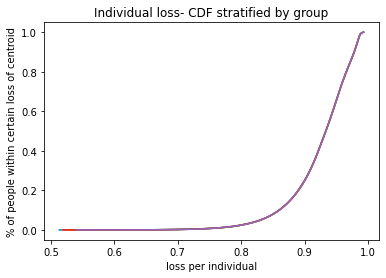

c  {0: (4.77716185309163, 3.938143393403717), 1: (-10.222479390743528, -9.98947294889582), 2: (-12.017055142469983, 6.939530277964575), 3: (10.064857192583045, -4.720730001931488), 4: (-2.876704644664895, 9.377008951280853), 5: (-2.9398434829249114, 1.1928759184716602), 6: (3.188707180075597, 10.252705482559275), 7: (4.730712923253638, -2.0818478667711298), 8: (-7.371454867211986, -5.862532902815801), 9: (7.912742658757028, 8.480042986589845)}
weights:  [0.19999379 0.20000573 0.1999912  0.19999414 0.20001515]
Time elapsed Batch Step:  0.39714646339416504
Time elapsed Assignment Step:  2.328625202178955
0.0002063873474565936
total:  0.6469039610114734


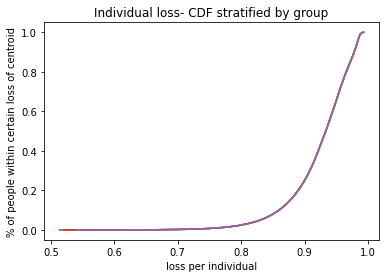

c  {0: (4.776731536159751, 3.9378827282478963), 1: (-10.2210993195518, -9.988120255124455), 2: (-12.015342441928782, 6.939277555632692), 3: (10.064345742182143, -4.719157403181246), 4: (-2.8754314393487648, 9.375833301186507), 5: (-2.9388158336785026, 1.1940443977389932), 6: (3.1877073487171934, 10.251527081835414), 7: (4.730809480624359, -2.080798031391828), 8: (-7.372351461852414, -5.86434988920136), 9: (7.91111914108409, 8.47931271946508)}
weights:  [0.19999379 0.20000574 0.19999122 0.19999415 0.2000151 ]
Time elapsed Batch Step:  0.3400881290435791
Time elapsed Assignment Step:  2.229576587677002
0.0002061080663793291
total:  0.6468350881983185


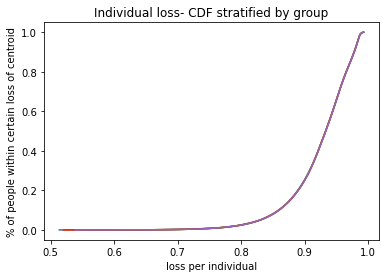

c  {0: (4.776301147716642, 3.9376220317159487), 1: (-10.219718416536727, -9.986766744814286), 2: (-12.0136285680453, 6.939024691893443), 3: (10.06383391121882, -4.717583656812951), 4: (-2.8741574684750932, 9.37465695418421), 5: (-2.9377875943303673, 1.195213577051257), 6: (3.1867068267581597, 10.250348041321628), 7: (4.7309061019639165, -2.0797478523595765), 8: (-7.373248676861915, -5.866168149727913), 9: (7.909494448534009, 8.478581930448556)}
weights:  [0.19999379 0.20000575 0.19999124 0.19999416 0.20001506]
Time elapsed Batch Step:  0.3636176586151123
Time elapsed Assignment Step:  2.2784817218780518
0.00020421749893451135
total:  0.6467656037877998


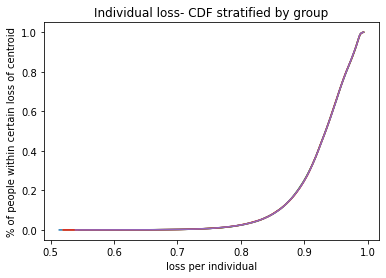

c  {0: (4.775870687730322, 3.937361303829502), 1: (-10.218336682425559, -9.985412418646638), 2: (-12.011913520419595, 6.938771686814484), 3: (10.063321699421541, -4.716008762080804), 4: (-2.8728827322116826, 9.373479910503283), 5: (-2.9367587648623474, 1.196383456533886), 6: (3.185705613790216, 10.249168360918842), 7: (4.731002787340001, -2.078697329781313), 8: (-7.37414651201588, -5.867987684033781), 9: (7.907868580652426, 8.477850619365254)}
weights:  [0.1999938  0.20000576 0.19999125 0.19999418 0.20001502]
Time elapsed Batch Step:  0.33879613876342773
Time elapsed Assignment Step:  2.267345428466797
0.00021698277456605464
total:  0.6467004403021603


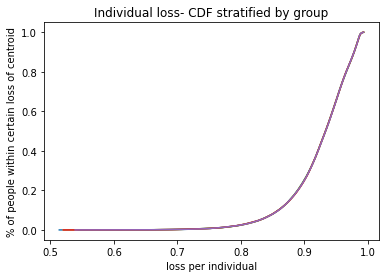

c  {0: (4.775440039013955, 3.9370984530377466), 1: (-10.216954117954716, -9.98405727731144), 2: (-12.010197298655514, 6.938518540464423), 3: (10.062809106519325, -4.714432718241039), 4: (-2.8716072307307052, 9.372302170377587), 5: (-2.9357351983428575, 1.1975474108382635), 6: (3.184703709406185, 10.247988040529782), 7: (4.731099536820377, -2.0776464637647827), 8: (-7.375044967084243, -5.869808491746794), 9: (7.906241536989154, 8.477118786042174)}
weights:  [0.1999938  0.20000577 0.19999127 0.19999419 0.20001497]
Time elapsed Batch Step:  0.3334684371948242
Time elapsed Assignment Step:  2.270115375518799
0.00020778777185159747
total:  0.6466285608647253


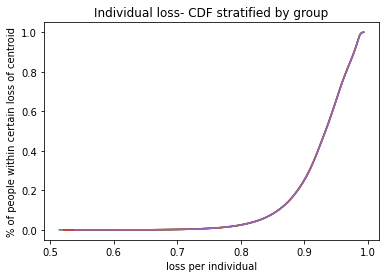

c  {0: (4.775009318939427, 3.93683557015691), 1: (-10.215570723869837, -9.982701321507268), 2: (-12.008479902360719, 6.938265252912811), 3: (10.062296132241745, -4.712855524551938), 4: (-2.8703309642087262, 9.371123734045543), 5: (-2.934711047074289, 1.1987120590499676), 6: (3.1837011132000015, 10.246807080058977), 7: (4.731196350472876, -2.076595254418541), 8: (-7.375944041831447, -5.871630572484225), 9: (7.904613317098197, 8.476386430308349)}
weights:  [0.1999938  0.20000578 0.19999129 0.19999421 0.20001493]
Time elapsed Batch Step:  0.3579075336456299
Time elapsed Assignment Step:  2.2657270431518555
0.00020207721727183436
total:  0.6465575972017483


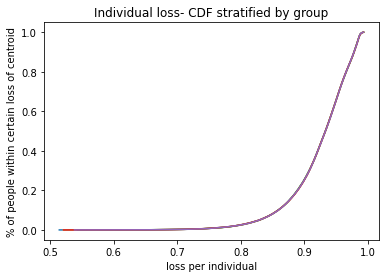

c  {0: (4.774578527474896, 3.9365726552087605), 1: (-10.214186500925823, -9.981344551941387), 2: (-12.00676133114671, 6.938011824230157), 3: (10.061782776318937, -4.711277180273856), 4: (-2.8690539328267226, 9.36994460175016), 5: (-2.9336863110409594, 1.1998774012908444), 6: (3.182697824766719, 10.245625479412775), 7: (4.731293228365403, -2.0755437018519562), 8: (-7.376843736016414, -5.873453925852727), 9: (7.902983920537784, 8.475653551994856)}
weights:  [0.19999381 0.20000578 0.19999131 0.19999422 0.20001488]
Time elapsed Batch Step:  0.34523844718933105
Time elapsed Assignment Step:  2.3089044094085693
0.0002117299111602522
total:  0.6464911130898466


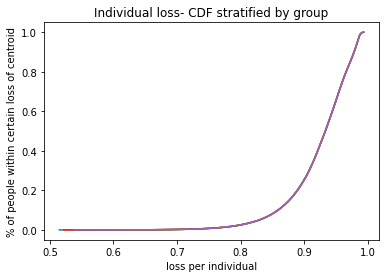

c  {0: (4.774147664588512, 3.936309708215091), 1: (-10.21280144988689, -9.9799869693298), 2: (-12.00504158462885, 6.9377582544879255), 3: (10.06126903848161, -4.709697684669234), 4: (-2.8677761367701047, 9.368764773739047), 5: (-2.9326609902294862, 1.201043437680505), 6: (3.181693843702522, 10.24444323849935), 7: (4.731390170565932, -2.07449180617521), 8: (-7.377744049392509, -5.875278551448273), 9: (7.901353346870396, 8.47492015093484)}
weights:  [0.19999381 0.20000579 0.19999132 0.19999423 0.20001484]
Time elapsed Batch Step:  0.3379349708557129
Time elapsed Assignment Step:  2.262542724609375
0.0002172619382254659
total:  0.6464232637500742


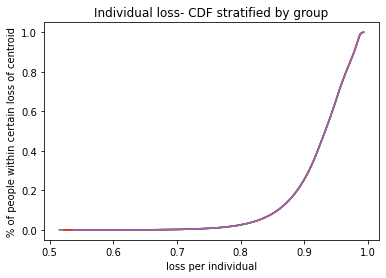

c  {0: (4.773716730248418, 3.9360467291977184), 1: (-10.211415571526613, -9.97862857439729), 2: (-12.003320662426399, 6.937504543758542), 3: (10.06075491846104, -4.7081170370026175), 4: (-2.8664975762287366, 9.367584250264445), 5: (-2.9316350846287973, 1.2022101683363136), 6: (3.1806891696047317, 10.243260357228712), 7: (4.731487177142511, -2.073439567499299), 8: (-7.378644981707508, -5.8771044488560875), 9: (7.899721595662799, 8.47418622696352)}
weights:  [0.19999381 0.2000058  0.19999134 0.19999425 0.20001479]
Time elapsed Batch Step:  0.3505237102508545
Time elapsed Assignment Step:  2.2845840454101562
0.00021534739755657561
total:  0.6463530507980026


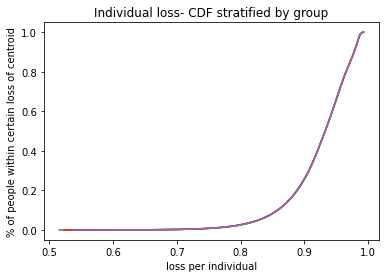

c  {0: (4.7732857244227445, 3.9357837181784836), 1: (-10.210028866627985, -9.977269367877456), 2: (-12.00159856416252, 6.937250692115397), 3: (10.060240415989087, -4.7065352365406765), 4: (-2.8652182513969575, 9.366403031583243), 5: (-2.930608594230143, 1.203377593373375), 6: (3.179683802071816, 10.242076835512712), 7: (4.731584248163255, -2.07238698593604), 8: (-7.379546532703565, -5.878931617650589), 9: (7.898088666486068, 8.4734517799182)}
weights:  [0.19999382 0.20000581 0.19999136 0.19999426 0.20001475]
Time elapsed Batch Step:  0.3408195972442627
Time elapsed Assignment Step:  2.2609496116638184
0.00021281774378012486
total:  0.646282523825042


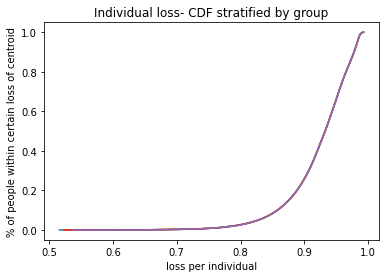

c  {0: (4.772854647079617, 3.9355206751792524), 1: (-10.208641335983454, -9.975909350512772), 2: (-11.999875289464324, 6.936996699632848), 3: (10.059725530798193, -4.704952282552223), 4: (-2.8639381624736022, 9.365221117956999), 5: (-2.929581519027109, 1.2045457129045234), 6: (3.1786777407033986, 10.240892673265058), 7: (4.731681383696352, -2.071334061598069), 8: (-7.38044870211718, -5.880760057395323), 9: (7.896454558915621, 8.472716809638293)}
weights:  [0.19999382 0.20000582 0.19999137 0.19999428 0.2000147 ]
Time elapsed Batch Step:  0.37981438636779785
Time elapsed Assignment Step:  2.331447124481201
0.0002044909869518552
total:  0.6462101272097966


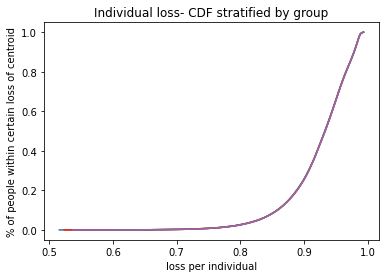

c  {0: (4.77242349818715, 3.935257600221915), 1: (-10.207252980394982, -9.97454852305462), 2: (-11.998150837962882, 6.936742566386228), 3: (10.059210262621393, -4.70336817430823), 4: (-2.8626573096620227, 9.364038509651966), 5: (-2.9285538590156257, 1.2057145270403098), 6: (3.1776709851002685, 10.239707870401322), 7: (4.73177858381006, -2.0702807945988435), 8: (-7.381351489679161, -5.882589767642898), 9: (7.8948192725312465, 8.471981315965326)}
weights:  [0.19999383 0.20000584 0.19999139 0.19999429 0.20001465]
Time elapsed Batch Step:  0.3560817241668701
Time elapsed Assignment Step:  2.271646499633789
0.00022508153392242214
total:  0.6461462755547641


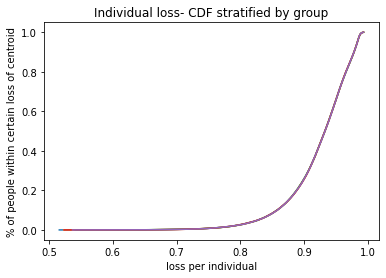

c  {0: (4.7719922777134505, 3.9349944933283854), 1: (-10.205863800674088, -9.973186886263342), 2: (-11.996425209293259, 6.936488292451845), 3: (10.058694611192317, -4.7017829110818505), 4: (-2.861375693170109, 9.362855206939113), 5: (-2.927525614193983, 1.2068840358889907), 6: (3.1766635348643866, 10.238522426838943), 7: (4.731875848572708, -2.0692271850526454), 8: (-7.382254895114595, -5.884420747934923), 9: (7.893182806917135, 8.471245298742964)}
weights:  [0.19999383 0.20000585 0.19999141 0.19999431 0.20001461]
Time elapsed Batch Step:  0.3488764762878418
Time elapsed Assignment Step:  2.294635534286499
0.00021096997367497927
total:  0.6460718830540536


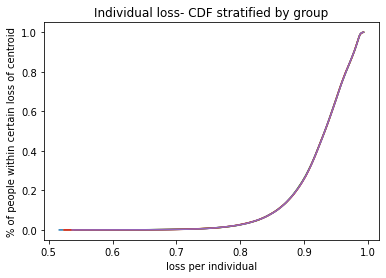

c  {0: (4.771560985626616, 3.934731354520602), 1: (-10.204473797641905, -9.97182444090828), 2: (-11.994698403094533, 6.936233877906986), 3: (10.058178576245197, -4.700196492148435), 4: (-2.86009331321031, 9.361671210094144), 5: (-2.9264967845628393, 1.2080542395565153), 6: (3.1756553895988975, 10.237336342497246), 7: (4.731973178052694, -2.0681732330745835), 8: (-7.383158918142812, -5.886252997801941), 9: (7.891545161661908, 8.470508757817015)}
weights:  [0.19999383 0.20000586 0.19999143 0.19999433 0.20001456]
Time elapsed Batch Step:  0.3542928695678711
Time elapsed Assignment Step:  2.271841049194336
0.0002348168609394019
total:  0.6460087478027092


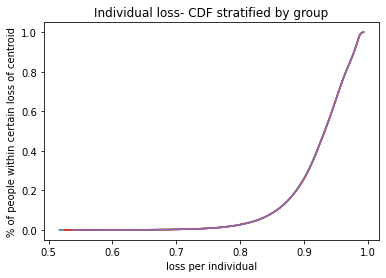

c  {0: (4.771129621894734, 3.934468183820528), 1: (-10.203082972129222, -9.970461187767823), 2: (-11.992970419009826, 6.935979322829923), 3: (10.057662157514871, -4.69860891678555), 4: (-2.8588101699996558, 9.360486519397524), 5: (-2.925467370125236, 1.2092251381465138), 6: (3.1746465489081372, 10.236149617297446), 7: (4.732070572318491, -2.0671189387805935), 8: (-7.384063558477351, -5.888086516763366), 9: (7.889906336358646, 8.46977169303545)}
weights:  [0.19999384 0.20000587 0.19999145 0.19999434 0.20001451]
Time elapsed Batch Step:  0.35443544387817383
Time elapsed Assignment Step:  2.2628064155578613
0.00023348035021253377
total:  0.6459379255667216


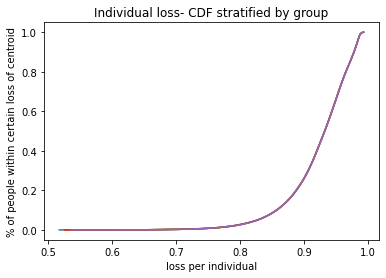

c  {0: (4.770698186485887, 3.9342049812501503), 1: (-10.20169132497654, -9.96909712762945), 2: (-11.991241256686324, 6.935724627299918), 3: (10.057145354736793, -4.697020184272999), 4: (-2.8575262637597767, 9.3593011351345), 5: (-2.9244373708866074, 1.2103967317602853), 6: (3.1736370123976423, 10.234962251162658), 7: (4.732168031438635, -2.0660643022874425), 8: (-7.384968815825924, -5.889921304327415), 9: (7.8882663306049245, 8.469034104248413)}
weights:  [0.19999384 0.20000588 0.19999146 0.19999436 0.20001446]
Time elapsed Batch Step:  0.3371083736419678
Time elapsed Assignment Step:  2.300459146499634
0.00022504624643915339
total:  0.6458648413430467


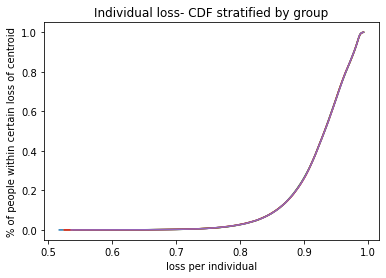

c  {0: (4.770266679368143, 3.9339417468314806), 1: (-10.200298857034122, -9.96773226128978), 2: (-11.989510915775313, 6.935469791397222), 3: (10.056628167647034, -4.69543029389284), 4: (-2.856241594716927, 9.358115057595121), 5: (-2.9234067868547937, 1.2115690204967853), 6: (3.1726267796741596, 10.233774244017908), 7: (4.7322655554817405, -2.0650093237127294), 8: (-7.385874689890387, -5.891757359991047), 9: (7.886625144002839, 8.468295991308242)}
weights:  [0.19999384 0.20000589 0.19999148 0.19999437 0.20001441]
Time elapsed Batch Step:  0.34678173065185547
Time elapsed Assignment Step:  2.253833770751953
0.00020968496928575053
total:  0.6457895476987944


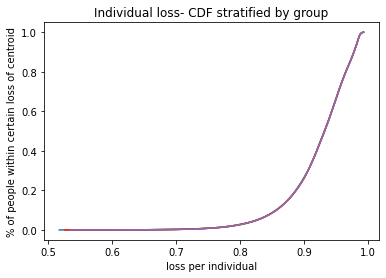

c  {0: (4.769835100509568, 3.9336784805865546), 1: (-10.198905569162036, -9.966366589554614), 2: (-11.98777939593219, 6.935214815203082), 3: (10.056110595982291, -4.693839244929404), 4: (-2.8549561631020057, 9.356928287074268), 5: (-2.922375618040053, 1.2127420044526136), 6: (3.1716158503456544, 10.232585595790143), 7: (4.732363144516487, -2.063954003174887), 8: (-7.386781180366699, -5.893594683239892), 9: (7.88498277615904, 8.467557354069479)}
weights:  [0.19999385 0.2000059  0.1999915  0.19999439 0.20001437]
Time elapsed Batch Step:  0.3506629467010498
Time elapsed Assignment Step:  2.2831532955169678
0.00020284361817490826
total:  0.645716678434599


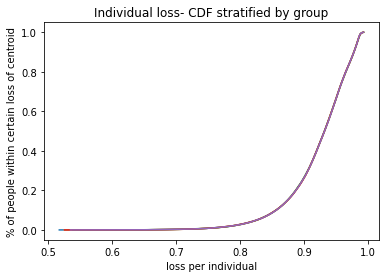

c  {0: (4.769403449878214, 3.9334151825374324), 1: (-10.197511462230217, -9.965000113238979), 2: (-11.986046696816505, 6.934959698799748), 3: (10.055592639479892, -4.692247036669318), 4: (-2.8536699691505776, 9.355740823871665), 5: (-2.921343864455073, 1.213915683722002), 6: (3.1706042240213206, 10.231396306408236), 7: (4.732460798611626, -2.062898340793184), 8: (-7.387688286944893, -5.895433273548192), 9: (7.883339226684758, 8.466818192388887)}
weights:  [0.19999385 0.20000591 0.19999152 0.19999441 0.20001432]
Time elapsed Batch Step:  0.3413968086242676
Time elapsed Assignment Step:  2.2986347675323486
0.00021844258553216367
total:  0.6456504171726055


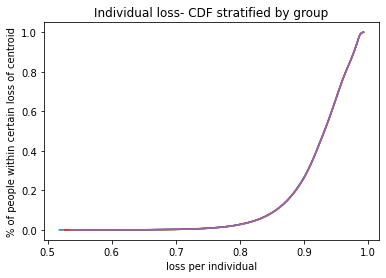

c  {0: (4.7689665205698475, 3.9331416396081047), 1: (-10.196116537118508, -9.963632833167178), 2: (-11.984312818091976, 6.934704442270469), 3: (10.0550742978778, -4.690653668401518), 4: (-2.8523830131028944, 9.354552668291909), 5: (-2.920311526114984, 1.215090058396802), 6: (3.1695919003115898, 10.230206375803), 7: (4.7325585178359795, -2.0618423366877288), 8: (-7.388596009309038, -5.897273130378726), 9: (7.881701382438341, 8.466077053336491)}
weights:  [0.19999386 0.20000592 0.19999154 0.19999442 0.20001427]
Time elapsed Batch Step:  0.3528432846069336
Time elapsed Assignment Step:  2.3129799365997314
0.00023209917514044331
total:  0.6455834410738539


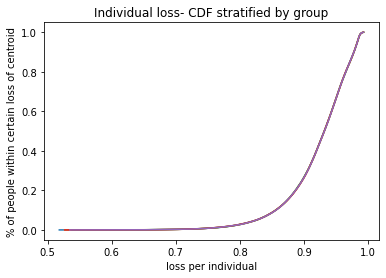

c  {0: (4.768529517654799, 3.9328680655728947), 1: (-10.194720794716718, -9.962264750172833), 2: (-11.98257775942652, 6.934449045699505), 3: (10.054555570914621, -4.689059139417274), 4: (-2.8510952952039177, 9.353363820644493), 5: (-2.9192786030373696, 1.2162651285664725), 6: (3.16857887882814, 10.229015803907197), 7: (4.732656302258439, -2.0607859909794692), 8: (-7.389504347137203, -5.89911425318275), 9: (7.880062360723412, 8.465335387812669)}
weights:  [0.19999386 0.20000593 0.19999155 0.19999444 0.20001422]
Time elapsed Batch Step:  0.34014248847961426
Time elapsed Assignment Step:  2.2759218215942383
0.00022632909805753165
total:  0.6455104648935075


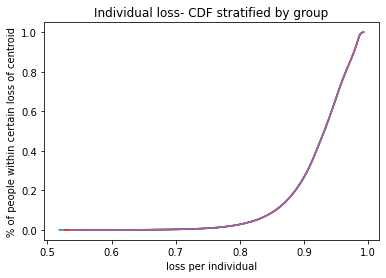

c  {0: (4.7680924411011105, 3.9325944604557943), 1: (-10.193324235924667, -9.96089586509893), 2: (-11.980841520492284, 6.934193509172127), 3: (10.054036458329612, -4.687463449010205), 4: (-2.8498068157033396, 9.352174281243823), 5: (-2.9182450952422805, 1.217440894318067), 6: (3.1675476965563787, 10.22782362064562), 7: (4.732754151947967, -2.0597293037901956), 8: (-7.390413300101426, -5.90095664139993), 9: (7.878424337189101, 8.464600892670454)}
weights:  [0.19999386 0.20000594 0.19999157 0.19999446 0.20001416]
Time elapsed Batch Step:  0.36580395698547363
Time elapsed Assignment Step:  3.7988486289978027
0.0002337484929165745
total:  0.6454413135368883


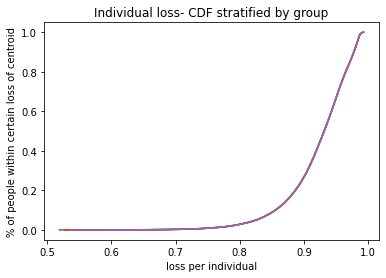

c  {0: (4.767655290876813, 3.932320824280821), 1: (-10.191926861652243, -9.959526178797868), 2: (-11.979104100965658, 6.93393783277462), 3: (10.053516959862682, -4.6858665964763055), 4: (-2.848517574855605, 9.350984050409247), 5: (-2.9172110027522455, 1.2186173557362214), 6: (3.1665158029274236, 10.226630776231925), 7: (4.732852066973596, -2.058672275242543), 8: (-7.391322867867675, -5.902800294458272), 9: (7.876785137577124, 8.463865876999039)}
weights:  [0.19999387 0.20000595 0.19999159 0.19999447 0.20001411]
Time elapsed Batch Step:  0.5888211727142334
Time elapsed Assignment Step:  2.447535514831543
0.00023261085625525535
total:  0.6453694627906


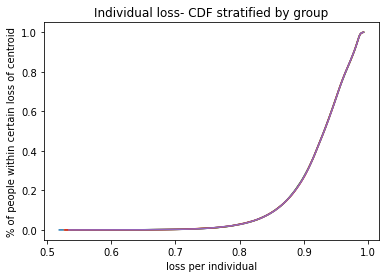

c  {0: (4.767218066949929, 3.9320471570720184), 1: (-10.19052867281945, -9.958155692131502), 2: (-11.97736550052732, 6.93368201659429), 3: (10.0529970752544, -4.684268581113956), 4: (-2.847227572919934, 9.349793128465075), 5: (-2.916176325592285, 1.2197945129031418), 6: (3.165483197555377, 10.225437270574849), 7: (4.732950047404428, -2.057614905459993), 8: (-7.392233050095815, -5.9046452117740555), 9: (7.875144761502165, 8.463130340656672)}
weights:  [0.19999387 0.20000596 0.19999161 0.19999449 0.20001406]
Time elapsed Batch Step:  0.37297606468200684
Time elapsed Assignment Step:  2.324669361114502
0.00023248515672258385
total:  0.6452977829000696


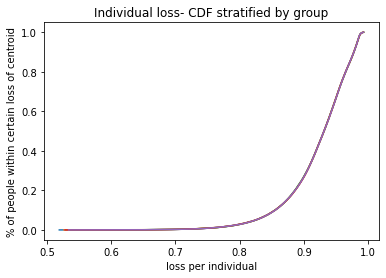

c  {0: (4.766780769288474, 3.9317734588534545), 1: (-10.18912967035646, -9.956784405971192), 2: (-11.975625718862249, 6.933426060719464), 3: (10.052476804246004, -4.682669402223951), 4: (-2.8459368101603415, 9.348601515740599), 5: (-2.9151410637899215, 1.220972365898591), 6: (3.164449880055705, 10.22424310358515), 7: (4.733048093309636, -2.056557194566875), 8: (-7.393143846439569, -5.906491392751767), 9: (7.87350320858349, 8.462394283503809)}
weights:  [0.19999388 0.20000598 0.19999163 0.19999451 0.20001401]
Time elapsed Batch Step:  0.3435397148132324
Time elapsed Assignment Step:  2.27229380607605
0.00024034575353393262
total:  0.6452283781316215


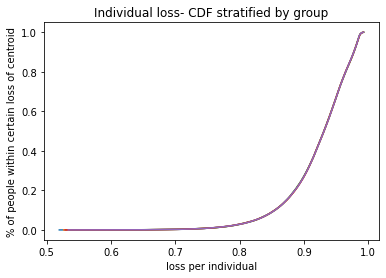

c  {0: (4.766339081274173, 3.931489710923431), 1: (-10.187729855203663, -9.955412321197848), 2: (-11.973884755659759, 6.9331699652395), 3: (10.051956146579402, -4.681069059109513), 4: (-2.8446452868456618, 9.347409212570122), 5: (-2.9141052173751945, 1.2221509147998766), 6: (3.1634158500452467, 10.22304827517562), 7: (4.733146204758461, -2.0554991426883698), 8: (-7.394055256546488, -5.908338836784032), 9: (7.871867103650979, 8.461658269732935)}
weights:  [0.19999388 0.20000599 0.19999165 0.19999453 0.20001396]
Time elapsed Batch Step:  0.348491907119751
Time elapsed Assignment Step:  2.2980332374572754
0.0002501379287412897
total:  0.645159420318515


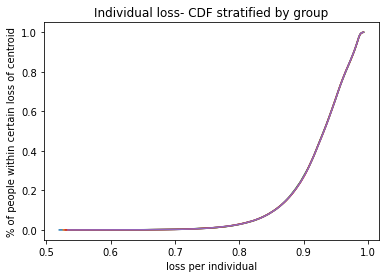

c  {0: (4.765897317576056, 3.9312059325350432), 1: (-10.186329228311724, -9.954039438701978), 2: (-11.972142610613524, 6.932913730244786), 3: (10.051435101997182, -4.679467551076317), 4: (-2.843353003249569, 9.346216219292973), 5: (-2.913068786380671, 1.2233301596818384), 6: (3.1623811071422248, 10.221852785261088), 7: (4.733244381820217, -2.0544407499505106), 8: (-7.39496728005791, -5.910187543251545), 9: (7.870229825377199, 8.460921734554576)}
weights:  [0.19999389 0.200006   0.19999167 0.19999455 0.2000139 ]
Time elapsed Batch Step:  0.39195942878723145
Time elapsed Assignment Step:  2.2969565391540527
0.0002675913472645064
total:  0.6450926271598338


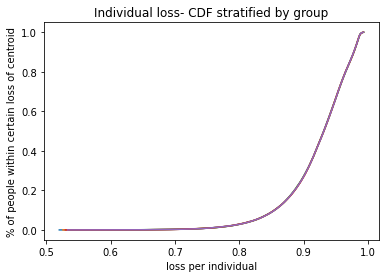

c  {0: (4.765455478162179, 3.9309221237143297), 1: (-10.18492779064163, -9.95266575938373), 2: (-11.970399283421607, 6.932657355826743), 3: (10.050913670242617, -4.677864877432508), 4: (-2.8420599596506007, 9.345022536253538), 5: (-2.9120317708414585, 1.2245101006168355), 6: (3.1613456509662554, 10.220656633758445), 7: (4.733342624564285, -2.0533820164801857), 8: (-7.395879916608925, -5.9120375115230015), 9: (7.868591373380281, 8.460184677826513)}
weights:  [0.19999389 0.20000601 0.19999169 0.19999456 0.20001385]
Time elapsed Batch Step:  0.34527015686035156
Time elapsed Assignment Step:  2.318021297454834
0.00026912463047068513
total:  0.6450209240719527


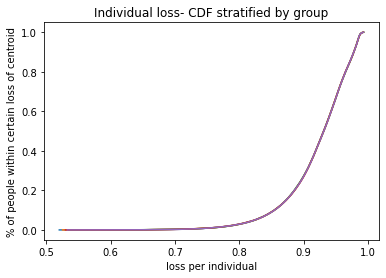

c  {0: (4.765013563000589, 3.9306382844873538), 1: (-10.183525543164743, -9.95129128415295), 2: (-11.968654773786483, 6.9324008420778345), 3: (10.05039185105967, -4.676261037488722), 4: (-2.8407661563321778, 9.343828163801277), 5: (-2.910994170795218, 1.225690737674733), 6: (3.160309481138359, 10.219459820586637), 7: (4.733440933060118, -2.05232294240514), 8: (-7.39679316582834, -5.9138887409550325), 9: (7.866951747282936, 8.459447099408735)}
weights:  [0.19999389 0.20000602 0.19999171 0.19999458 0.2000138 ]
Time elapsed Batch Step:  0.34410834312438965
Time elapsed Assignment Step:  2.2956953048706055
0.00026982077034765073
total:  0.6449488353562398


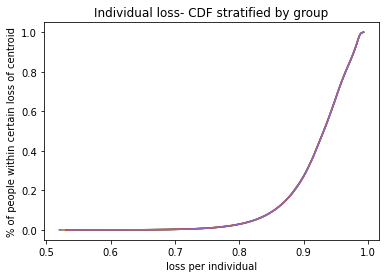

c  {0: (4.764571572059323, 3.9303544148802065), 1: (-10.182122486862855, -9.949916013929212), 2: (-11.966909081415075, 6.932144189091566), 3: (10.049869644193004, -4.674656030558106), 4: (-2.839471593582629, 9.34263310229075), 5: (-2.9099559862821764, 1.2268720709228897), 6: (3.1592725972809705, 10.218262345666693), 7: (4.733539307377236, -2.051263527853977), 8: (-7.397707027338645, -5.915741230892131), 9: (7.865310946712483, 8.458708999163454)}
weights:  [0.1999939  0.20000603 0.19999173 0.1999946  0.20001374]
Time elapsed Batch Step:  0.35262060165405273
Time elapsed Assignment Step:  2.2793078422546387
0.0002718902345359986
total:  0.6448770760617267


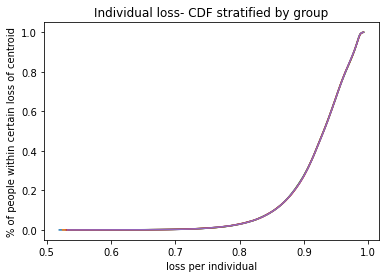

c  {0: (4.764129992530422, 3.93006850336498), 1: (-10.180718622728238, -9.948539949641878), 2: (-11.965162206018773, 6.931887396962489), 3: (10.049347049387983, -4.67304985595634), 4: (-2.838176271695212, 9.34143735208164), 5: (-2.90892224580243, 1.2280476859596663), 6: (3.158234999017948, 10.21706420892172), 7: (4.733637747585231, -2.0502037729561615), 8: (-7.398621500755969, -5.917594980666584), 9: (7.863668971300875, 8.457970376955126)}
weights:  [0.1999939  0.20000604 0.19999175 0.19999462 0.20001369]
Time elapsed Batch Step:  0.3454115390777588
Time elapsed Assignment Step:  2.2391879558563232
0.0002749169650396732
total:  0.6448054697002124


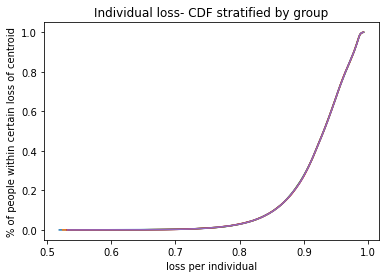

c  {0: (4.763688337796825, 3.92978256078623), 1: (-10.179313951763696, -9.947163092230147), 2: (-11.96341414731347, 6.93163046578621), 3: (10.04882406639068, -4.671442513001655), 4: (-2.836880190968136, 9.340240913538773), 5: (-2.907887925170893, 1.2292239915130159), 6: (3.157196685974586, 10.215865410276924), 7: (4.733736253753764, -2.049143677842021), 8: (-7.399536585690051, -5.919449989598404), 9: (7.862025820684738, 8.45723123265046)}
weights:  [0.19999391 0.20000605 0.19999177 0.19999464 0.20001363]
Time elapsed Batch Step:  0.3506169319152832
Time elapsed Assignment Step:  2.2814841270446777
0.000269704897253642
total:  0.6447312579203829


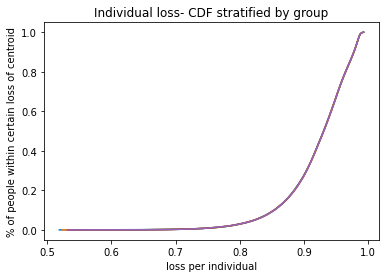

c  {0: (4.763246607827013, 3.9294965871701604), 1: (-10.17790847498262, -9.94578544264309), 2: (-11.961664905019582, 6.931373395659387), 3: (10.048300694947885, -4.6698340010148565), 4: (-2.8355833517045843, 9.339043787032148), 5: (-2.9068530244290343, 1.2304009876475346), 6: (3.156157657777623, 10.21466594965962), 7: (4.733834825952566, -2.0480832426427487), 8: (-7.4004522817442, -5.92130625699526), 9: (7.860381494505397, 8.456491566118439)}
weights:  [0.19999392 0.20000606 0.19999179 0.19999465 0.20001358]
Time elapsed Batch Step:  0.33863401412963867
Time elapsed Assignment Step:  2.2981581687927246
0.0002813626067817987
total:  0.6446619730721329


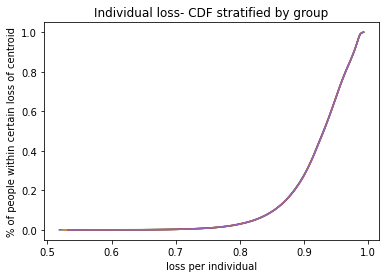

c  {0: (4.762804802589458, 3.929210582543002), 1: (-10.176502193409041, -9.944407001839703), 2: (-11.959914478862082, 6.93111618667974), 3: (10.047776934807112, -4.668224319319343), 4: (-2.8342857542127367, 9.337845972936954), 5: (-2.905817543620872, 1.231578674425329), 6: (3.1551179140552534, 10.213465826999235), 7: (4.733933464251435, -2.047022467490404), 8: (-7.401368588515258, -5.923163782152403), 9: (7.858735992408908, 8.455751377230325)}
weights:  [0.19999392 0.20000608 0.19999181 0.19999467 0.20001352]
Time elapsed Batch Step:  0.3424553871154785
Time elapsed Assignment Step:  2.2916483879089355
0.0002787880964398859
total:  0.6445882835350257


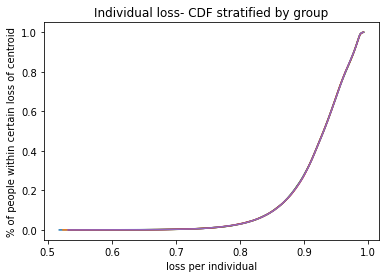

c  {0: (4.762362922052623, 3.9289245469310123), 1: (-10.175095108077679, -9.943027770788966), 2: (-11.958162868570529, 6.930858838946053), 3: (10.047252785716603, -4.666613467241128), 4: (-2.832987398805792, 9.336647471633592), 5: (-2.9047814827929854, 1.2327570519060032), 6: (3.154077454437138, 10.212265042227326), 7: (4.734032168720241, -2.0459613525179163), 8: (-7.402285505593562, -5.925022564352599), 9: (7.8570893140460925, 8.455010665859682)}
weights:  [0.19999393 0.20000609 0.19999182 0.19999469 0.20001347]
Time elapsed Batch Step:  0.33974695205688477
Time elapsed Assignment Step:  2.2590017318725586
0.00028846465997234283
total:  0.6445181343846837


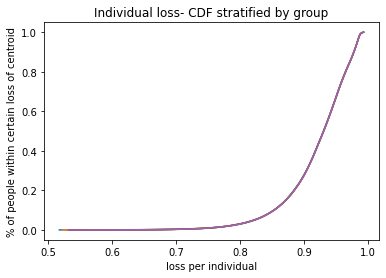

c  {0: (4.761920966184964, 3.928638480360476), 1: (-10.173687220034001, -9.94164775046987), 2: (-11.956410073879093, 6.930601352558175), 3: (10.046728247425335, -4.665001444108862), 4: (-2.8316882858019907, 9.335448283507706), 5: (-2.9037448419945266, 1.2339361201466459), 6: (3.153036278554415, 10.211063595277588), 7: (4.7341309394289235, -2.0448998978590867), 8: (-7.403203032562908, -5.9268826028660575), 9: (7.855441459072564, 8.454269431882393)}
weights:  [0.19999393 0.2000061  0.19999184 0.19999471 0.20001341]
Time elapsed Batch Step:  0.34630870819091797
Time elapsed Assignment Step:  2.2892844676971436
0.000279705256202023
total:  0.6444423198004292


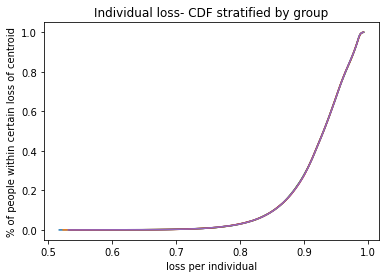

c  {0: (4.761478934954927, 3.928352382857705), 1: (-10.172278530334271, -9.940266941871483), 2: (-11.954656094526584, 6.9303437276170285), 3: (10.046203319683027, -4.66338824925385), 4: (-2.8303884155246384, 9.3342484089502), 5: (-2.902707621277234, 1.2351158792018184), 6: (3.151994386039708, 10.209861486085869), 7: (4.734229776447489, -2.043838103648589), 8: (-7.404121169000517, -5.928743896950362), 9: (7.853792427148764, 8.453527675176666)}
weights:  [0.19999394 0.20000612 0.19999186 0.19999473 0.20001335]
Time elapsed Batch Step:  0.3543832302093506
Time elapsed Assignment Step:  2.222710371017456
0.0002835626977728545
total:  0.6443701551394756


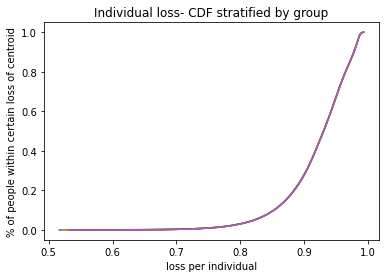

c  {0: (4.761036828330951, 3.928066254449038), 1: (-10.170869040045607, -9.938885345992984), 2: (-11.952900930256483, 6.930085964224612), 3: (10.045678002240145, -4.661773882010078), 4: (-2.829087788302127, 9.333047848357266), 5: (-2.9016698206954445, 1.2362963291235411), 6: (3.1509517765271404, 10.20865871459017), 7: (4.734328679846016, -2.0427759700219723), 8: (-7.405039914476988, -5.930606445850393), 9: (7.852142217939992, 8.452785395623058)}
weights:  [0.19999394 0.20000613 0.19999188 0.19999475 0.2000133 ]
Time elapsed Batch Step:  0.3374214172363281
Time elapsed Assignment Step:  2.272066354751587
0.0002865626084216366
total:  0.644297596287496


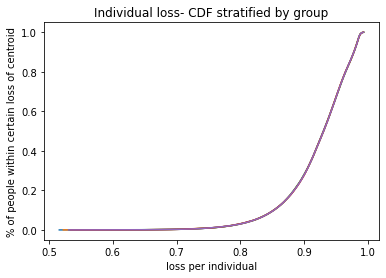

c  {0: (4.760594646281467, 3.9277800951608417), 1: (-10.169458750246031, -9.937502963843723), 2: (-11.95114458081697, 6.929828062484003), 3: (10.04515229484791, -4.660158341714229), 4: (-2.8277864044679597, 9.3318466021304), 5: (-2.9006314403061064, 1.2374774699612807), 6: (3.1499084496523433, 10.20745528073067), 7: (4.734427649694649, -2.0417134971156647), 8: (-7.405959268556269, -5.932470248798264), 9: (7.850490831116438, 8.452042593104487)}
weights:  [0.19999395 0.20000614 0.1999919  0.19999477 0.20001324]
Time elapsed Batch Step:  0.34201717376708984
Time elapsed Assignment Step:  2.2737185955047607
0.0002890424383411583
total:  0.6442247467618483


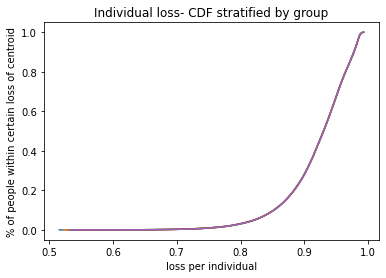

c  {0: (4.7601523887748955, 3.9274939050195092), 1: (-10.168047662024522, -9.93611979644326), 2: (-11.949387045960956, 6.929570022499365), 3: (10.044626197258305, -4.65854162770571), 4: (-2.8264842643607717, 9.330644670676435), 5: (-2.899592480168792, 1.2386593017619372), 6: (3.1488644050524677, 10.206251184449728), 7: (4.734526686063605, -2.040650685066973), 8: (-7.406879230795616, -5.934335305013244), 9: (7.848838266353214, 8.451299267506243)}
weights:  [0.19999396 0.20000615 0.19999192 0.19999478 0.20001319]
Time elapsed Batch Step:  0.34140968322753906
Time elapsed Assignment Step:  2.2673757076263428
0.0002825746712055155
total:  0.6441490771634988


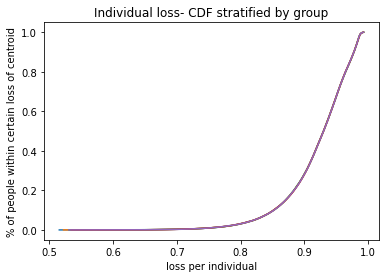

c  {0: (4.75971005577965, 3.927207684051461), 1: (-10.166635776481076, -9.934735844821418), 2: (-11.947628325446102, 6.929311844375946), 3: (10.044099709224081, -4.656923739326668), 4: (-2.8251813683243547, 9.32944205440756), 5: (-2.8985529403457106, 1.2398418245698313), 6: (3.147819642366194, 10.205046425691897), 7: (4.734625789023166, -2.0395875340140854), 8: (-7.407799800745556, -5.936201613701686), 9: (7.847184523330387, 8.450555418716016)}
weights:  [0.19999397 0.20000617 0.19999193 0.1999948  0.20001313]
Time elapsed Batch Step:  0.3441939353942871
Time elapsed Assignment Step:  2.288647413253784
0.0002799841135509018
total:  0.6440744344087496


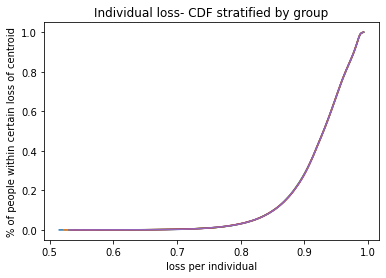

c  {0: (4.759267647264137, 3.926921432283144), 1: (-10.165223094726752, -9.93335111001833), 2: (-11.945868419034863, 6.929053528220089), 3: (10.043572830498764, -4.655304675922016), 4: (-2.82387771670768, 9.328238753741342), 5: (-2.8975128209017207, 1.2410250384266908), 6: (3.1467741612337448, 10.203841004403932), 7: (4.734724958643687, -2.038524044096075), 8: (-7.408720977949844, -5.938069174056958), 9: (7.845529601733014, 8.449811046623896)}
weights:  [0.19999397 0.20000618 0.19999195 0.19999482 0.20001307]
Time elapsed Batch Step:  0.3619997501373291
Time elapsed Assignment Step:  2.2607033252716064
0.00028378935224082635
total:  0.6440015736768943


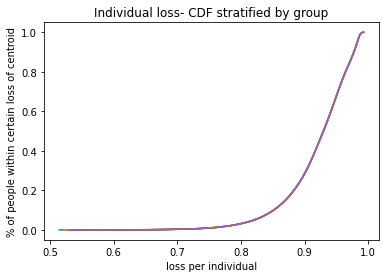

c  {0: (4.758825163196752, 3.9266351497410334), 1: (-10.16380961788373, -9.931965593084492), 2: (-11.944107326494507, 6.928795074139232), 3: (10.043045560836662, -4.653684436839453), 4: (-2.8225733098649206, 9.327034769100752), 5: (-2.8964721219043432, 1.2422089433716381), 6: (3.145727961296893, 10.202634920534804), 7: (4.734824194995589, -2.0374602154529007), 8: (-7.409642761945433, -5.939937985259364), 9: (7.843873501251167, 8.4490661511224)}
weights:  [0.19999398 0.20000619 0.19999197 0.19999484 0.20001302]
Time elapsed Batch Step:  0.3436148166656494
Time elapsed Assignment Step:  2.2864484786987305
0.000293025200744812
total:  0.6439302047979408


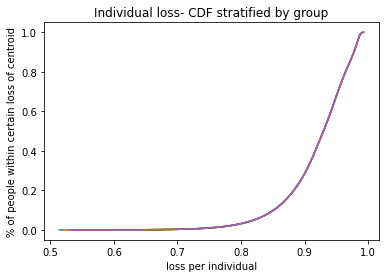

c  {0: (4.758382603545884, 3.926348836451631), 1: (-10.16239534708537, -9.930579295080799), 2: (-11.942345047597149, 6.928536482241914), 3: (10.042517899992866, -4.652063021429484), 4: (-2.8212681481554753, 9.32583010091419), 5: (-2.895430843423774, 1.2433935394411768), 6: (3.1446810421989757, 10.201428174035712), 7: (4.734923498149363, -2.036396048225409), 8: (-7.410565152262427, -5.941808046476079), 9: (7.842216221579975, 8.448320732106483)}
weights:  [0.19999399 0.2000062  0.19999199 0.19999486 0.20001296]
Time elapsed Batch Step:  0.3500640392303467
Time elapsed Assignment Step:  2.394129753112793
0.0003074472275150786
total:  0.6438602545401882


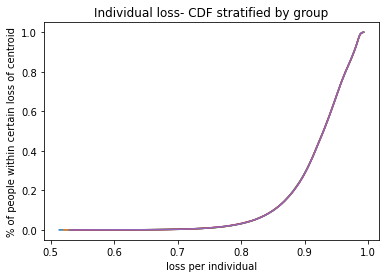

c  {0: (4.757939968279913, 3.9260624924414658), 1: (-10.160980283476256, -9.929192217078608), 2: (-11.94058158211978, 6.92827775263778), 3: (10.041989847723267, -4.650440429045446), 4: (-2.819962231943992, 9.324624749615507), 5: (-2.8943889855328977, 1.2445788266691782), 6: (3.143633403584903, 10.200220764860092), 7: (4.735022868175568, -2.0353315425553373), 8: (-7.411488148424047, -5.943679356861067), 9: (7.840557762419651, 8.447574789473553)}
weights:  [0.199994   0.20000622 0.19999201 0.19999488 0.2000129 ]
Time elapsed Batch Step:  0.34932613372802734
Time elapsed Assignment Step:  2.3422398567199707
0.0003149428671380683
total:  0.6437880884232192


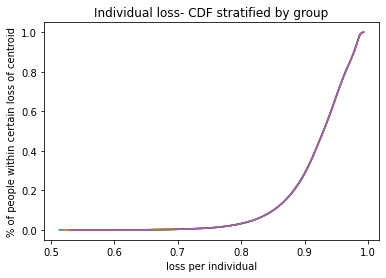

c  {0: (4.75749725736721, 3.925776117737094), 1: (-10.159564428212258, -9.927804360159781), 2: (-11.938816929844295, 6.928018885437581), 3: (10.041461403784556, -4.648816659043528), 4: (-2.81865556160039, 9.32341871564403), 5: (-2.8933465483072998, 1.2457648050868686), 6: (3.1425850451011708, 10.199012692963626), 7: (4.735122305144832, -2.034266698585315), 8: (-7.412411749946592, -5.945551915555013), 9: (7.838898123475529, 8.44682832312349)}
weights:  [0.199994   0.20000623 0.19999202 0.1999949  0.20001284]
Time elapsed Batch Step:  0.3523893356323242
Time elapsed Assignment Step:  2.2841176986694336
0.0003033459132711913
total:  0.643710057043528


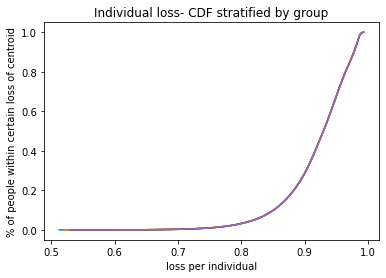

c  {0: (4.757054470776139, 3.9254897123650987), 1: (-10.158147782460585, -9.926415725416733), 2: (-11.93705109055753, 6.927759880753183), 3: (10.040932567934231, -4.647191710782795), 4: (-2.8173481374998843, 9.32221199944458), 5: (-2.8923035318252794, 1.2469514747228159), 6: (3.1415359663958697, 10.197803958304261), 7: (4.735221809127851, -2.0332015164588664), 8: (-7.413335956339397, -5.9474257216852475), 9: (7.837237304458092, 8.446081332958665)}
weights:  [0.19999401 0.20000624 0.19999204 0.19999493 0.20001278]
Time elapsed Batch Step:  0.35016441345214844
Time elapsed Assignment Step:  2.3461899757385254
0.0003039330601610768
total:  0.6436355690800218


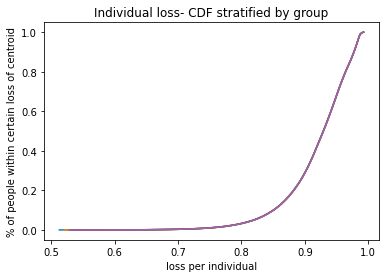

c  {0: (4.756611608475056, 3.9252032763520903), 1: (-10.156730347399838, -9.92502631395248), 2: (-11.935284064051281, 6.927500738697569), 3: (10.040403339930604, -4.645565583625205), 4: (-2.8160432748967428, 9.321013219331135), 5: (-2.891259936167864, 1.248138835602916), 6: (3.1404843078449103, 10.196589365747199), 7: (4.735321380195391, -2.0321359963204118), 8: (-7.414260767104799, -5.949300774365671), 9: (7.83557530508301, 8.445333818883942)}
weights:  [0.19999402 0.20000625 0.19999206 0.19999495 0.20001272]
Time elapsed Batch Step:  0.3430063724517822
Time elapsed Assignment Step:  2.3238043785095215
0.0003099542010138734
total:  0.6435625740931589


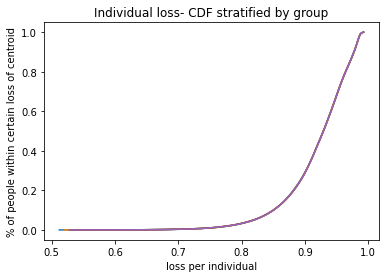

c  {0: (4.756168670432306, 3.9249168097247065), 1: (-10.155312124220067, -9.923636126880695), 2: (-11.933515850122348, 6.927241459384843), 3: (10.039873719532814, -4.643938276935639), 4: (-2.814737661631726, 9.319813763904932), 5: (-2.89021576141882, 1.2493268877503796), 6: (3.139431926779909, 10.195374107823323), 7: (4.7354210184182834, -2.031070138315271), 8: (-7.415186181738091, -5.951177072696682), 9: (7.833912125071173, 8.444585780806712)}
weights:  [0.19999403 0.20000626 0.19999207 0.19999497 0.20001266]
Time elapsed Batch Step:  0.3643805980682373
Time elapsed Assignment Step:  2.240504026412964
0.00029268847971786194
total:  0.643482455484431


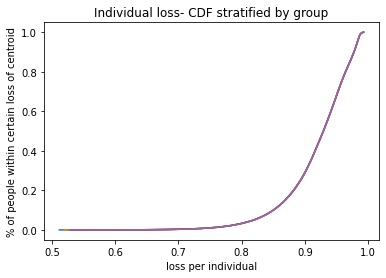

c  {0: (4.755725656616229, 3.9246303125096116), 1: (-10.153893114122825, -9.922245165325746), 2: (-11.93174644857255, 6.9269820429302325), 3: (10.039343706500823, -4.642309790081919), 4: (-2.8134312980798413, 9.31861363361196), 5: (-2.8891710076646686, 1.2505156311857188), 6: (3.1383788228586846, 10.194158184505563), 7: (4.735520723867431, -2.030003942589664), 8: (-7.416112199727487, -5.953054615765097), 9: (7.832247764148723, 8.443837218636896)}
weights:  [0.19999404 0.20000628 0.19999209 0.19999499 0.20001261]
Time elapsed Batch Step:  0.3510603904724121
Time elapsed Assignment Step:  2.3120930194854736
0.00030408138674875573
total:  0.6434107965388532


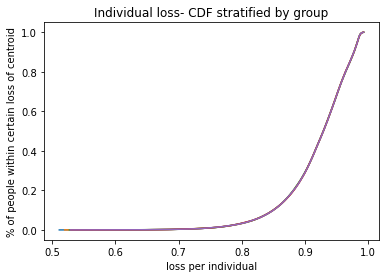

c  {0: (4.755282566995154, 3.9243437847334977), 1: (-10.152473318321222, -9.92085343042276), 2: (-11.929975859208774, 6.926722489450099), 3: (10.038813300595434, -4.64068012243483), 4: (-2.8121241846213683, 9.317412828903674), 5: (-2.888125674994697, 1.251705065926734), 6: (3.1373249957407388, 10.192941595769208), 7: (4.735620496613804, -2.0289374092907138), 8: (-7.417038820554083, -5.954933402644084), 9: (7.830582222047089, 8.443088132286967)}
weights:  [0.19999405 0.20000629 0.19999211 0.19999501 0.20001255]
Time elapsed Batch Step:  0.36686134338378906
Time elapsed Assignment Step:  2.286017656326294
0.0002984739208884424
total:  0.6433338993687344


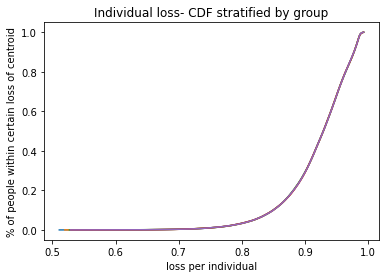

c  {0: (4.754839401537405, 3.9240572264230833), 1: (-10.151052738039983, -9.919460923317656), 2: (-11.928204081842988, 6.926462799061935), 3: (10.038282501578289, -4.639049273368147), 4: (-2.810816321641882, 9.316211350237005), 5: (-2.8870797635009726, 1.2528951919884994), 6: (3.1362704450872663, 10.191724341591915), 7: (4.7357203367284395, -2.027870538566449), 8: (-7.417966043691814, -5.956813432393076), 9: (7.828915498503021, 8.442338521671967)}
weights:  [0.19999405 0.2000063  0.19999213 0.19999503 0.20001249]
Time elapsed Batch Step:  0.34027528762817383
Time elapsed Assignment Step:  2.282588005065918
0.0002914700106919632
total:  0.6432564452296897


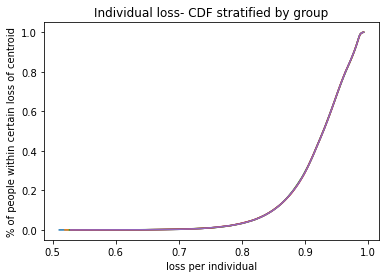

c  {0: (4.754396160211293, 3.923770637605115), 1: (-10.1496313745155, -9.91806764516721), 2: (-11.926431116292285, 6.926202971884371), 3: (10.037751309211883, -4.637417242258653), 4: (-2.8095077095322756, 9.315009198074392), 5: (-2.8860332732783553, 1.2540860093833504), 6: (3.135215170561168, 10.190506421953724), 7: (4.7358202442824435, -2.0268033305658046), 8: (-7.418893868607413, -5.958694704057706), 9: (7.827247593258626, 8.441588386709522)}
weights:  [0.19999406 0.20000631 0.19999214 0.19999505 0.20001243]
Time elapsed Batch Step:  0.38278841972351074
Time elapsed Assignment Step:  2.31514835357666
0.0002973565850286075
total:  0.6431827188733175


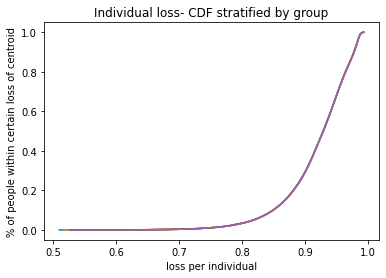

c  {0: (4.753952842985125, 3.923484018306366), 1: (-10.14820922899589, -9.916673597139093), 2: (-11.924656962378908, 6.925943008037183), 3: (10.037219723259565, -4.635784028486168), 4: (-2.8081983486887845, 9.313806372883807), 5: (-2.8849862044245125, 1.2552775181208695), 6: (3.1341591718270614, 10.18928783683707), 7: (4.73592021934699, -2.0257357854386266), 8: (-7.419822294760378, -5.960577216669723), 9: (7.8255785060613965, 8.440837727319856)}
weights:  [0.19999407 0.20000632 0.19999216 0.19999508 0.20001237]
Time elapsed Batch Step:  0.34298133850097656
Time elapsed Assignment Step:  2.3232152462005615
0.0003140522931323053
total:  0.6431128786760848


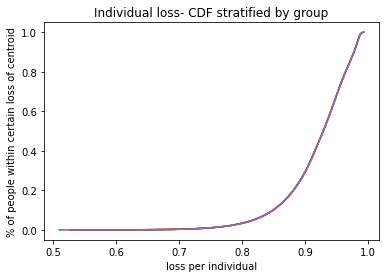

c  {0: (4.753513928545964, 3.9232002640056844), 1: (-10.146800675733521, -9.915292869469779), 2: (-11.922899552682289, 6.925685534918015), 3: (10.036694241143852, -4.634174620754539), 4: (-2.8069014729390274, 9.312615031681649), 5: (-2.883949139336745, 1.2564576757827517), 6: (3.133113122523776, 10.188080901889517), 7: (4.736012368527958, -2.0246705494266797), 8: (-7.420741937493401, -5.9624419414431085), 9: (7.823925108072303, 8.44009413114191)}
weights:  [0.19999408 0.20000633 0.19999217 0.1999951  0.20001231]
Time elapsed Batch Step:  0.3365054130554199
Time elapsed Assignment Step:  2.2629730701446533
0.0003168199559511198
total:  0.6430387242069634


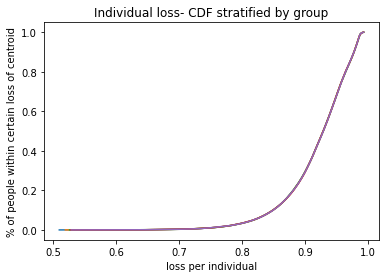

c  {0: (4.75307493967029, 3.9229164798892877), 1: (-10.145391358666403, -9.91391138970997), 2: (-11.92114097817288, 6.925427928113186), 3: (10.036168374430453, -4.632564061641645), 4: (-2.805603864293173, 9.311423031908546), 5: (-2.8829115074457445, 1.2576385109038404), 6: (3.1320663629165475, 10.186873314810084), 7: (4.736104584357942, -2.02360497644316), 8: (-7.421662168302964, -5.964307880291139), 9: (7.82227055140579, 8.439350020927595)}
weights:  [0.19999409 0.20000635 0.19999219 0.19999512 0.20001225]
Time elapsed Batch Step:  0.34870219230651855
Time elapsed Assignment Step:  2.274132013320923
0.0003338891043213055
total:  0.6429687241731427


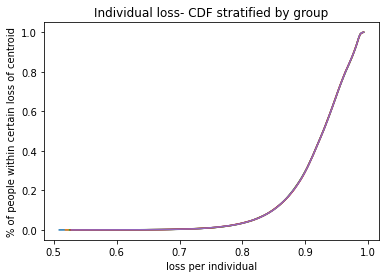

c  {0: (4.752635876327333, 3.922632665983225), 1: (-10.143981279039544, -9.912529159024224), 2: (-11.919381238693383, 6.925170187742215), 3: (10.035642122890362, -4.630952350551176), 4: (-2.8043055231512044, 9.31023037403461), 5: (-2.8818733088544666, 1.2588200234853664), 6: (3.1310188926851024, 10.18566507558874), 7: (4.736196866910307, -2.022539066638077), 8: (-7.422582986643539, -5.966175032233897), 9: (7.820614835832758, 8.438605396607166)}
weights:  [0.1999941  0.20000636 0.19999221 0.19999514 0.2000122 ]
Time elapsed Batch Step:  0.34735822677612305
Time elapsed Assignment Step:  2.315495252609253
0.0003463227591682383
total:  0.6428971963732208


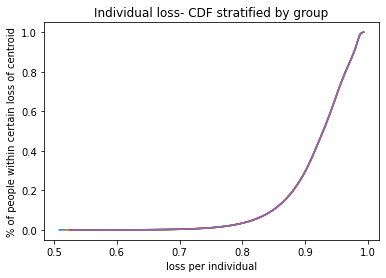

c  {0: (4.752196738486319, 3.922348822313572), 1: (-10.142570438109423, -9.911146178587753), 2: (-11.917620334091563, 6.924912313925734), 3: (10.035115486295396, -4.629339486889725), 4: (-2.8030064499183243, 9.309037058535349), 5: (-2.880834543668614, 1.2600022135258646), 6: (3.12997071151086, 10.184456184217797), 7: (4.736289216258491, -2.0214728201623537), 8: (-7.42350439196249, -5.96804339627784), 9: (7.818957961129414, 8.437860258113439)}
weights:  [0.1999941  0.20000637 0.19999222 0.19999517 0.20001214]
Time elapsed Batch Step:  0.34572815895080566
Time elapsed Assignment Step:  2.2996511459350586
0.00034227696477695524
total:  0.6428205869932


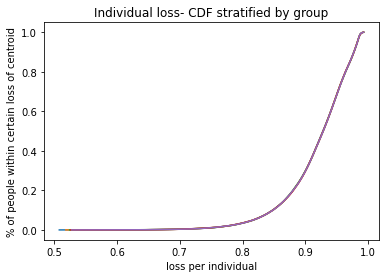

c  {0: (4.751751408961847, 3.922068124269825), 1: (-10.141158837144047, -9.909762449586477), 2: (-11.915858264220285, 6.924654306785493), 3: (10.034588464418203, -4.627725470066808), 4: (-2.8017066450049786, 9.3078430858917), 5: (-2.8797952119966475, 1.261185081021161), 6: (3.1289218190769463, 10.183246640691921), 7: (4.736385359265848, -2.0204088290065734), 8: (-7.424426383700037, -5.96991297141573), 9: (7.81729992707731, 8.437114605381806)}
weights:  [0.19999411 0.20000638 0.19999224 0.19999519 0.20001208]
Time elapsed Batch Step:  0.3447403907775879
Time elapsed Assignment Step:  2.30839467048645
0.0003400655523441154
total:  0.6427443914015908


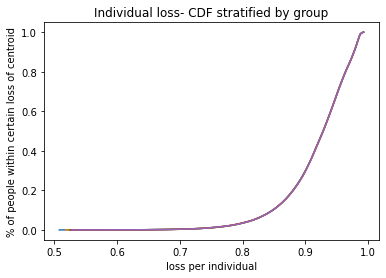

c  {0: (4.751306002566071, 3.92178739624267), 1: (-10.139746477422994, -9.908377973217066), 2: (-11.914095028937542, 6.924396166444364), 3: (10.03406105703226, -4.626110299494886), 4: (-2.8004061088268775, 9.30664845659004), 5: (-2.8787553139498017, 1.2623686259643587), 6: (3.1278722150682032, 10.182036445008146), 7: (4.736481571703478, -2.0193445014272844), 8: (-7.4253489612892105, -5.97178375662656), 9: (7.815640733463369, 8.436368438350254)}
weights:  [0.19999412 0.20000639 0.19999226 0.19999521 0.20001202]
Time elapsed Batch Step:  0.3372609615325928
Time elapsed Assignment Step:  2.304600954055786
0.00032485923312541853
total:  0.6426641601218447


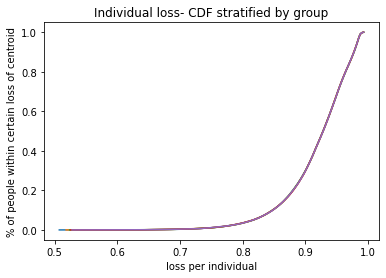

c  {0: (4.750860519266826, 3.9215066382579367), 1: (-10.138333360237475, -9.90699275068699), 2: (-11.912330628106487, 6.924137893026343), 3: (10.033533263911888, -4.624493974589392), 4: (-2.7991048418050193, 9.30545317112222), 5: (-2.8777148496420955, 1.2635528483458263), 6: (3.1268218991712002, 10.180825597165883), 7: (4.736577853647027, -2.0182798375733197), 8: (-7.426272124155822, -5.9736557508754755), 9: (7.813980380079927, 8.435621756959376)}
weights:  [0.19999413 0.20000641 0.19999228 0.19999523 0.20001196]
Time elapsed Batch Step:  0.3383009433746338
Time elapsed Assignment Step:  2.287213087081909
0.00033304568059144835
total:  0.642590815703907


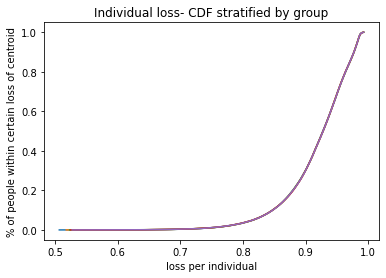

c  {0: (4.750408810882458, 3.9212151264381863), 1: (-10.136919486890381, -9.905606783214571), 2: (-11.910565061595463, 6.923879486656556), 3: (10.03300508483226, -4.622876494768744), 4: (-2.797802844365713, 9.304257229985582), 5: (-2.876673819190346, 1.2647377481531827), 6: (3.1257708710742476, 10.179614097166931), 7: (4.736674205172212, -2.017214837594419), 8: (-7.427195871718414, -5.975528953113704), 9: (7.812326109720535, 8.434871706920154)}
weights:  [0.19999414 0.20000642 0.19999229 0.19999525 0.2000119 ]
Time elapsed Batch Step:  0.33978939056396484
Time elapsed Assignment Step:  2.267202854156494
0.0003425398552926451
total:  0.6425177263111732


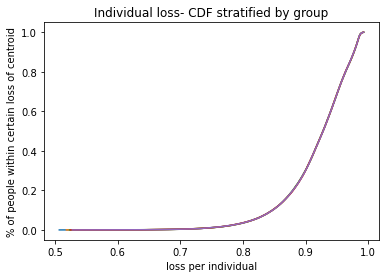

c  {0: (4.749957023752461, 3.920923585775246), 1: (-10.135504858696343, -9.904220072029023), 2: (-11.908798329278035, 6.9236209474612656), 3: (10.032476519569398, -4.621257859454377), 4: (-2.796500116940601, 9.303060633682984), 5: (-2.8756322227141826, 1.2659233253712852), 6: (3.1247191304674056, 10.17840194501549), 7: (4.736770626354821, -2.016149501641231), 8: (-7.428120203388229, -5.97740336227848), 9: (7.810670684757327, 8.434121139925196)}
weights:  [0.19999414 0.20000643 0.19999231 0.19999528 0.20001184]
Time elapsed Batch Step:  0.3710179328918457
Time elapsed Assignment Step:  2.2281243801116943
0.00034601576406390055
total:  0.6424426930893664


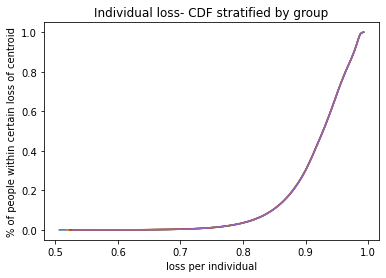

c  {0: (4.749505157844718, 3.920632016297039), 1: (-10.13408947698178, -9.90283261837051), 2: (-11.907030431033018, 6.923362275567868), 3: (10.031947567900191, -4.619638068070759), 4: (-2.795196659966683, 9.301863382722816), 5: (-2.8745900603360584, 1.267109579982215), 6: (3.123666677042498, 10.177189140718175), 7: (4.736867117270715, -2.0150838298653158), 8: (-7.429045118569164, -5.9792789772929655), 9: (7.809014104989396, 8.433370055915066)}
weights:  [0.19999415 0.20000644 0.19999232 0.1999953  0.20001178]
Time elapsed Batch Step:  0.3493931293487549
Time elapsed Assignment Step:  2.2820048332214355
0.0003315786780565544
total:  0.6423621480820625


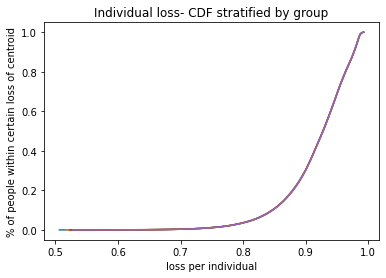

c  {0: (4.749053213127104, 3.9203404180315182), 1: (-10.132673343084955, -9.901444423490185), 2: (-11.905261366744512, 6.9231034711049055), 3: (10.031418229602396, -4.618017120045416), 4: (-2.793892473886337, 9.300665477619036), 5: (-2.8735473321812646, 1.2682965119652643), 6: (3.1226135104931227, 10.17597568428402), 7: (4.736963677995827, -2.014017822419146), 8: (-7.429970616657733, -5.98115579706618), 9: (7.807356370221276, 8.43261845483296)}
weights:  [0.19999416 0.20000646 0.19999234 0.19999532 0.20001172]
Time elapsed Batch Step:  0.3621525764465332
Time elapsed Assignment Step:  2.3408544063568115
0.00034270720464224524
total:  0.6422891342902021


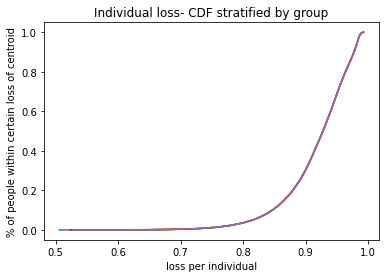

c  {0: (4.748601189567486, 3.920048791006662), 1: (-10.13125645835603, -9.900055488650244), 2: (-11.903491136301932, 6.922844534202064), 3: (10.030888504454644, -4.616395014808955), 4: (-2.7925875591473446, 9.299466918891182), 5: (-2.8725040383779428, 1.269484121296923), 6: (3.1215596305146636, 10.174761575724501), 7: (4.737060308606161, -2.0129514794561105), 8: (-7.430896697043028, -5.983033820492923), 9: (7.805697480262975, 8.431866336624728)}
weights:  [0.19999417 0.20000647 0.19999235 0.19999535 0.20001166]
Time elapsed Batch Step:  0.36899662017822266
Time elapsed Assignment Step:  2.3683018684387207
0.00034445540992622536
total:  0.6422131678043049


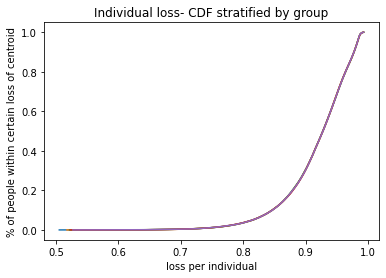

c  {0: (4.748149087133721, 3.919757135250477), 1: (-10.129838824157115, -9.898665815123971), 2: (-11.901719739600042, 6.922585464990181), 3: (10.030358392236451, -4.614771751795085), 4: (-2.7912819162029128, 9.2982677070644), 5: (-2.8714601790570993, 1.2706724079508644), 6: (3.120505036804303, 10.173546815053536), 7: (4.7371570091777935, -2.011884801130515), 8: (-7.431823359106677, -5.984913046453696), 9: (7.804037434930007, 8.431113701238882)}
weights:  [0.19999418 0.20000648 0.19999237 0.19999537 0.2000116 ]
Time elapsed Batch Step:  0.3471527099609375
Time elapsed Assignment Step:  2.299372434616089
0.00033279192522384093
total:  0.6421330391351345


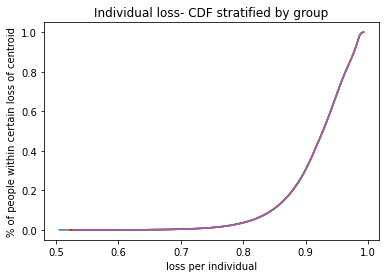

c  {0: (4.74769690579366, 3.919465450790998), 1: (-10.12842044186233, -9.897275404195792), 2: (-11.899947176538982, 6.922326263601249), 3: (10.029827892728223, -4.613147330440642), 4: (-2.7899755455116977, 9.297067842669469), 5: (-2.870415754352618, 1.2718613718979326), 6: (3.1194497290610315, 10.172331402287503), 7: (4.737253779786873, -2.010817787597585), 8: (-7.4327506022228045, -5.986793473814627), 9: (7.80237623404343, 8.430360548626625)}
weights:  [0.19999419 0.20000649 0.19999239 0.19999539 0.20001154]
Time elapsed Batch Step:  0.3368837833404541
Time elapsed Assignment Step:  2.2773194313049316
0.00031263553369986763
total:  0.6420502237864116


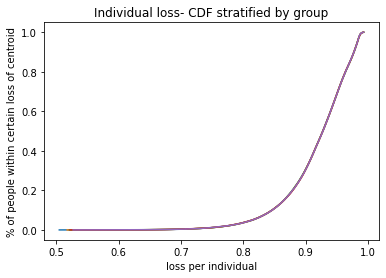

c  {0: (4.747244645515143, 3.9191737376562865), 1: (-10.127001312857848, -9.895884257161315), 2: (-11.898173447024302, 6.922066930168418), 3: (10.029297005711262, -4.611521750185609), 4: (-2.7886684475378276, 9.295867326242814), 5: (-2.869370764401273, 1.2730510131061277), 6: (3.118393706985662, 10.171115337445253), 7: (4.73735062050962, -2.0097504390134677), 8: (-7.433678425757989, -5.988675101427398), 9: (7.800713877429875, 8.429606878741858)}
weights:  [0.1999942  0.20000651 0.1999924  0.19999542 0.20001148]
Time elapsed Batch Step:  0.3511936664581299
Time elapsed Assignment Step:  2.268338203430176
0.00033491094835369495
total:  0.6419799991530061


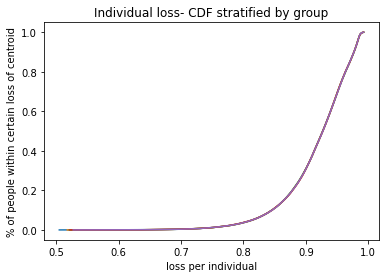

c  {0: (4.746792306266002, 3.9188819958744316), 1: (-10.125581438541955, -9.894492375327387), 2: (-11.896398550966998, 6.921807464826002), 3: (10.028765730967777, -4.609895010473146), 4: (-2.787360622750927, 9.294666158326542), 5: (-2.868325209342743, 1.274241331540593), 6: (3.117336970280842, 10.16989862054812), 7: (4.737447531422324, -2.008682755535235), 8: (-7.4346068290712255, -5.990557928129163), 9: (7.799050364921589, 8.428852691541197)}
weights:  [0.1999942  0.20000652 0.19999242 0.19999544 0.20001142]
Time elapsed Batch Step:  0.3361055850982666
Time elapsed Assignment Step:  2.2898035049438477
0.00034127897612001856
total:  0.6419048630922334


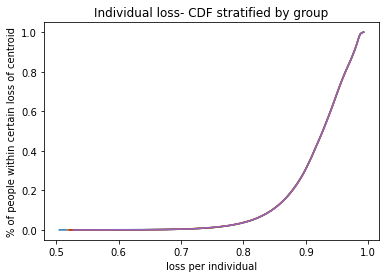

c  {0: (4.746339888014061, 3.9185902254735505), 1: (-10.124160820325107, -9.893099760012134), 2: (-11.894622488283538, 6.9215478677094815), 3: (10.028234068280886, -4.608267110749601), 4: (-2.786052071626139, 9.29346433946846), 5: (-2.8672790893196245, 1.2754323271636008), 6: (3.1162795186510612, 10.168681251619928), 7: (4.73754451260135, -2.007614737320884), 8: (-7.435535811513883, -5.992441952742472), 9: (7.79738569635646, 8.428097986983994)}
weights:  [0.19999421 0.20000653 0.19999244 0.19999547 0.20001135]
Time elapsed Batch Step:  0.3434624671936035
Time elapsed Assignment Step:  2.275371551513672
0.00033879172575634886
total:  0.6418269315216787


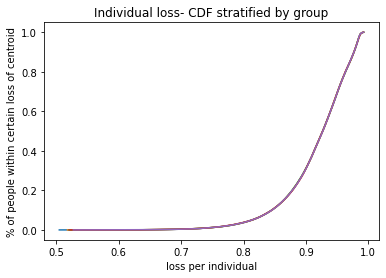

c  {0: (4.745887390727137, 3.9182984264817877), 1: (-10.122739459629978, -9.891706412545021), 2: (-11.892845258895898, 6.921288138955509), 3: (10.027702017434626, -4.606638050464547), 4: (-2.78474279464415, 9.292261870222097), 5: (-2.866232404477445, 1.2766239999345388), 6: (3.11522135180267, 10.167463230687014), 7: (4.7376415641231295, -2.006546384529341), 8: (-7.436465372429664, -5.994327174075196), 9: (7.795719871578057, 8.427342765032353)}
weights:  [0.19999422 0.20000654 0.19999245 0.19999549 0.20001129]
Time elapsed Batch Step:  0.3454303741455078
Time elapsed Assignment Step:  2.3035008907318115
0.0003333200739354947
total:  0.6417479658624184


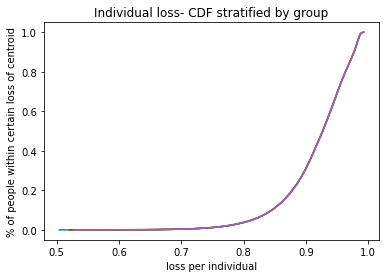

c  {0: (4.745434814373035, 3.918006598927315), 1: (-10.121317357891515, -9.89031233426689), 2: (-11.891066862731595, 6.921028278701912), 3: (10.027169578213963, -4.605007829070797), 4: (-2.7834327922912125, 9.291058751146727), 5: (-2.8651851549646765, 1.2778163498098962), 6: (3.1141624694438867, 10.166244557778228), 7: (4.737738686064169, -2.0054776973204613), 8: (-7.437395511154562, -5.996213590920448), 9: (7.794052890435665, 8.426587025651145)}
weights:  [0.19999423 0.20000655 0.19999247 0.19999551 0.20001123]
Time elapsed Batch Step:  0.3392479419708252
Time elapsed Assignment Step:  2.2398481369018555
0.00033518256648379374
total:  0.6416710669596515


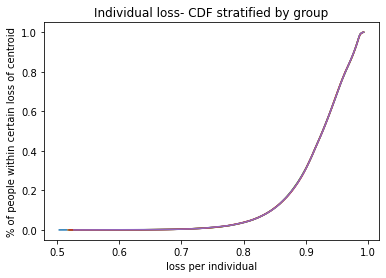

c  {0: (4.744974697114259, 3.9177040073108014), 1: (-10.119894516556997, -9.888917526530014), 2: (-11.889287299723717, 6.920768287087698), 3: (10.026636750404792, -4.603376446024429), 4: (-2.7821220650591685, 9.289854982807396), 5: (-2.86413734093275, 1.2790093767432498), 6: (3.1131028712848106, 10.165025232924954), 7: (4.737835878501046, -2.0044086758550343), 8: (-7.438326227016822, -5.998101202056502), 9: (7.792393133304538, 8.425825930330177)}
weights:  [0.19999424 0.20000657 0.19999249 0.19999554 0.20001117]
Time elapsed Batch Step:  0.3458693027496338
Time elapsed Assignment Step:  2.238736152648926
0.00035134725364105446
total:  0.6415983183964801


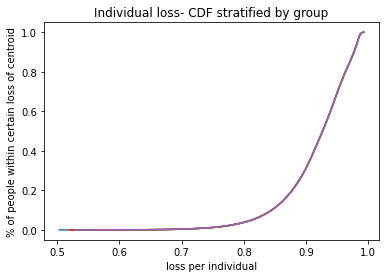

c  {0: (4.744514499240502, 3.9174013885835786), 1: (-10.118470937086084, -9.887521990698145), 2: (-11.887506569810961, 6.920508164253061), 3: (10.026103533793954, -4.601743900784811), 4: (-2.780810613445474, 9.288650565774944), 5: (-2.8630889625360676, 1.2802030806852498), 6: (3.112042557037436, 10.163805256161117), 7: (4.737933141510405, -2.0033393202947836), 8: (-7.439257519336899, -5.999990006246723), 9: (7.790732227703305, 8.4250643148814)}
weights:  [0.19999425 0.20000658 0.19999251 0.19999556 0.2000111 ]
Time elapsed Batch Step:  0.34602999687194824
Time elapsed Assignment Step:  2.2427964210510254
0.00037003042562633315
total:  0.6415261843774226


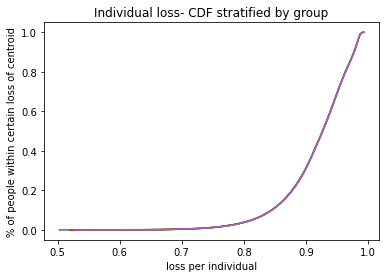

c  {0: (4.744054220719517, 3.917098742775938), 1: (-10.117046620950871, -9.886125728146567), 2: (-11.885724672937659, 6.920247910339379), 3: (10.025569928169233, -4.600110192814625), 4: (-2.7794984379532233, 9.287445500626026), 5: (-2.8620400199320173, 1.2813974615836063), 6: (3.110981526415662, 10.162584627523199), 7: (4.738030475168966, -2.002269630802369), 8: (-7.440189387427416, -6.001880002239478), 9: (7.789070173496007, 8.424302179274825)}
weights:  [0.19999426 0.20000659 0.19999252 0.19999558 0.20001104]
Time elapsed Batch Step:  0.3479936122894287
Time elapsed Assignment Step:  2.2874903678894043
0.00036366429328649197
total:  0.6414463949952949


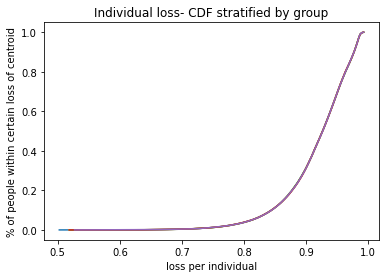

c  {0: (4.743593861519048, 3.9167960699181994), 1: (-10.115621569635948, -9.884728740262137), 2: (-11.883941609053817, 6.919987525489226), 3: (10.02503593331937, -4.598475321579889), 4: (-2.7781855390911705, 9.286239787943137), 5: (-2.8609905132809863, 1.2825925193830752), 6: (3.1099197791353066, 10.161363347050246), 7: (4.738127879553517, -2.0011996075413907), 8: (-7.4411218305931195, -6.003771188768065), 9: (7.787406970552447, 8.423539523483281)}
weights:  [0.19999427 0.2000066  0.19999254 0.19999561 0.20001098]
Time elapsed Batch Step:  0.3592677116394043
Time elapsed Assignment Step:  2.258385181427002
0.0003699484817769605
total:  0.6413702598178593


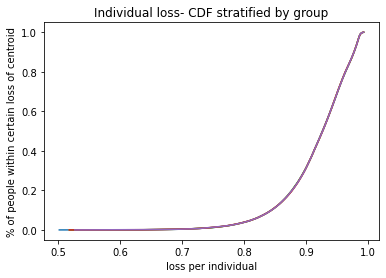

c  {0: (4.7431334216068315, 3.9164933700407127), 1: (-10.114195784638445, -9.883331028443338), 2: (-11.882157378115144, 6.919727009846373), 3: (10.024501549034069, -4.596839286549983), 4: (-2.776871917373756, 9.285033428314636), 5: (-2.8599404427463755, 1.2837882540254435), 6: (3.108857314914118, 10.160141414783883), 7: (4.7382253547409166, -2.0001292506763892), 8: (-7.442054848130843, -6.00566356455063), 9: (7.78574261874823, 8.422776347482433)}
weights:  [0.19999428 0.20000661 0.19999256 0.19999563 0.20001092]
Time elapsed Batch Step:  0.3553807735443115
Time elapsed Assignment Step:  2.285534620285034
0.0003744817144961665
total:  0.6412934583523555


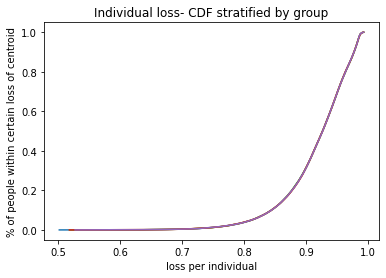

c  {0: (4.742672900950594, 3.9161906431738562), 1: (-10.112769267468094, -9.881932594100334), 2: (-11.88037198008309, 6.919466363555789), 3: (10.023966775104007, -4.5952020871976735), 4: (-2.7755575733211297, 9.283826422334771), 5: (-2.8588898084946117, 1.2849846654495158), 6: (3.1077941334717876, 10.158918830768329), 7: (4.738322900808096, -1.999058560372849), 8: (-7.44298843932946, -6.007557128290092), 9: (7.784077117964797, 8.422012651250796)}
weights:  [0.19999429 0.20000663 0.19999258 0.19999565 0.20001085]
Time elapsed Batch Step:  0.3385787010192871
Time elapsed Assignment Step:  2.271597385406494
0.0003740258236744065
total:  0.6412150606165467


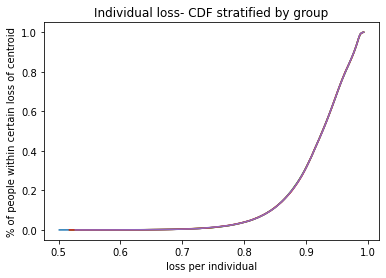

c  {0: (4.742210056795381, 3.91587856161786), 1: (-10.111342019647282, -9.880533438655009), 2: (-11.87858541492488, 6.919205586763653), 3: (10.023431611320836, -4.593563722999137), 4: (-2.774242507459175, 9.282618770603701), 5: (-2.8578386106951634, 1.2861817535910998), 6: (3.106743218594578, 10.15769725498012), 7: (4.738420517832054, -1.9979875367971995), 8: (-7.443922603469845, -6.009451878674056), 9: (7.782410468089459, 8.421248434769756)}
weights:  [0.1999943  0.20000664 0.1999926  0.19999568 0.20001079]
Time elapsed Batch Step:  0.3449594974517822
Time elapsed Assignment Step:  2.291625499725342
0.0003723644962811967
total:  0.6411361595495708


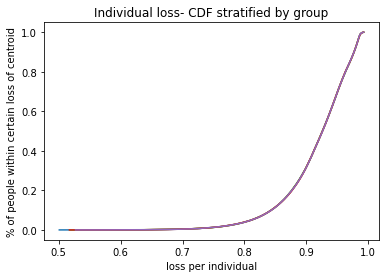

c  {0: (4.741747129777229, 3.9155664530162673), 1: (-10.109914042711099, -9.879133563541023), 2: (-11.876797682613539, 6.918944679617351), 3: (10.022896057477194, -4.591924193433981), 4: (-2.7729267203195316, 9.281410473727517), 5: (-2.856786849520553, 1.2873795183829921), 6: (3.1056915985655054, 10.156475038680323), 7: (4.738518205889863, -1.9969161801168187), 8: (-7.444857339824832, -6.011347814374741), 9: (7.780742669015435, 8.420483698023585)}
weights:  [0.19999431 0.20000665 0.19999262 0.1999957  0.20001072]
Time elapsed Batch Step:  0.3464653491973877
Time elapsed Assignment Step:  2.2776758670806885
0.0003672623389906482
total:  0.6410560855177329


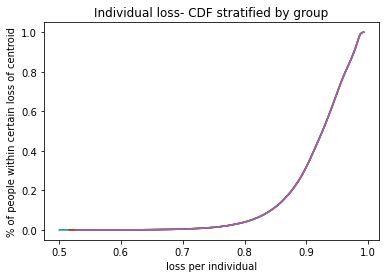

c  {0: (4.741284119863882, 3.915254317401497), 1: (-10.108485338207402, -9.877732970203859), 2: (-11.875008783127937, 6.918683642265484), 3: (10.02236011336671, -4.5902834979852765), 4: (-2.771610212439623, 9.280201532318271), 5: (-2.855734525146372, 1.2885779597549643), 6: (3.104639273115538, 10.155252181939069), 7: (4.7386159650586634, -1.995844490500034), 8: (-7.445792647659167, -6.0132449340488945), 9: (7.779073720641885, 8.419718440999459)}
weights:  [0.19999432 0.20000666 0.19999264 0.19999572 0.20001065]
Time elapsed Batch Step:  0.3363921642303467
Time elapsed Assignment Step:  2.296421766281128
0.0003840976947253605
total:  0.6409824520182362


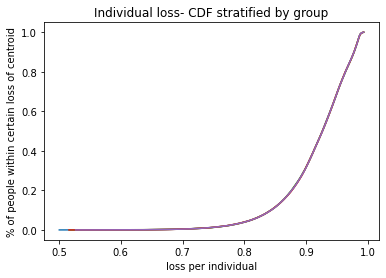

c  {0: (4.740821027023075, 3.914942154805999), 1: (-10.107055907696862, -9.876331660100874), 2: (-11.873218716452818, 6.918422474857873), 3: (10.021823778784018, -4.588641636139575), 4: (-2.770292984362678, 9.278991946993997), 5: (-2.8546816377512942, 1.2897770776337476), 6: (3.1035862419775655, 10.15402868482911), 7: (4.738713795415665, -1.9947724681161254), 8: (-7.446728526229469, -6.015143236337714), 9: (7.77740362287395, 8.418952663687476)}
weights:  [0.19999433 0.20000668 0.19999266 0.19999575 0.20001059]
Time elapsed Batch Step:  0.35662269592285156
Time elapsed Assignment Step:  2.2989206314086914
0.00039727091484698107
total:  0.6409075785248084


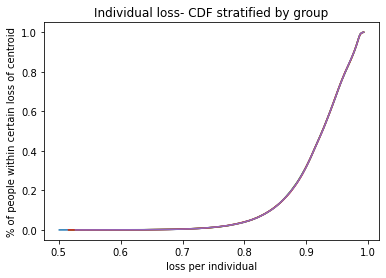

c  {0: (4.740357851222534, 3.9146299652622525), 1: (-10.105625752753022, -9.874929634701346), 2: (-11.871427482578836, 6.918161177545558), 3: (10.021287053524759, -4.586998607386937), 4: (-2.7689750366377557, 9.277781718378735), 5: (-2.8536281875170904, 1.29097687194302), 6: (3.1025325048864123, 10.152804547425822), 7: (4.738811697038148, -1.9937001131353267), 8: (-7.447664974784187, -6.017042719866767), 9: (7.775732375622784, 8.418186366080672)}
weights:  [0.19999434 0.20000669 0.19999268 0.19999577 0.20001052]
Time elapsed Batch Step:  0.3419046401977539
Time elapsed Assignment Step:  2.3058648109436035
0.000394336106840254
total:  0.6408277314542584


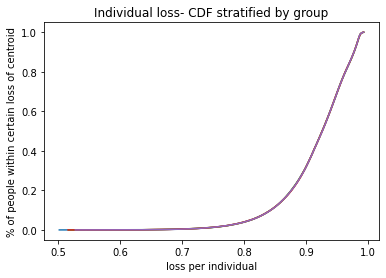

c  {0: (4.739894592429977, 3.914317748802768), 1: (-10.104194874962348, -9.873526895486526), 2: (-11.869635081502585, 6.917899750480812), 3: (10.020749937385586, -4.585354411220956), 4: (-2.7676563698197705, 9.276570847102553), 5: (-2.8525741746286415, 1.2921773426033905), 6: (3.1014780615788493, 10.15157976980723), 7: (4.738909670003465, -1.9926274257288286), 8: (-7.448601992563558, -6.018943383245908), 9: (7.774059978805592, 8.41741954817504)}
weights:  [0.19999435 0.2000067  0.1999927  0.1999958  0.20001045]
Time elapsed Batch Step:  0.3491480350494385
Time elapsed Assignment Step:  2.2720630168914795
0.0004040660142307084
total:  0.6407515402075268


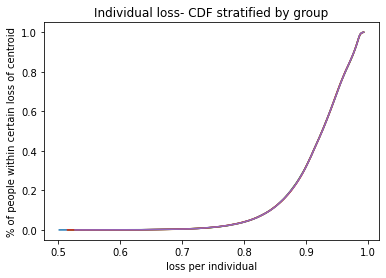

c  {0: (4.739431250613112, 3.9140055054600853), 1: (-10.102763275924284, -9.872123443949686), 2: (-11.867841513226642, 6.917638193817135), 3: (10.020212430164182, -4.583709047138784), 4: (-2.766336984469516, 9.275359333801575), 5: (-2.8515195992739537, 1.2933784895323852), 6: (3.1004229117936055, 10.150354352054007), 7: (4.739007714389034, -1.9915544060687804), 8: (-7.449539578799559, -6.020845225069199), 9: (7.772386432345669, 8.41665220996955)}
weights:  [0.19999436 0.20000672 0.19999272 0.19999582 0.20001038]
Time elapsed Batch Step:  0.3536810874938965
Time elapsed Assignment Step:  2.2490413188934326
0.0004246329234205426
total:  0.6406784586307365


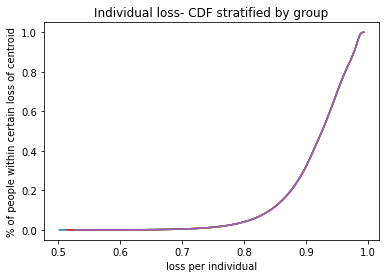

c  {0: (4.738967825739642, 3.9136932352667757), 1: (-10.101330957251312, -9.870719281596168), 2: (-11.866046777759594, 6.917376507709266), 3: (10.019674531659259, -4.582062514641159), 4: (-2.765016881153691, 9.274147179118001), 5: (-2.850464461644172, 1.2945803126444329), 6: (3.0993670552713812, 10.1491282942495), 7: (4.739105830272346, -1.9904810543282925), 8: (-7.450477732715871, -6.022748243914827), 9: (7.77071173617243, 8.41588435146616)}
weights:  [0.19999437 0.20000673 0.19999274 0.19999584 0.20001031]
Time elapsed Batch Step:  0.346179723739624
Time elapsed Assignment Step:  2.2767629623413086
0.0004269584209795063
total:  0.6405997624256585


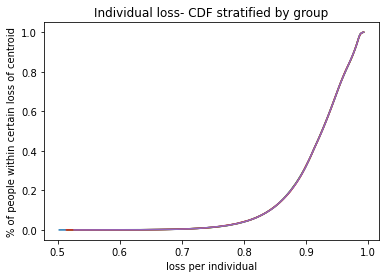

c  {0: (4.738504317777258, 3.9133809382554396), 1: (-10.099897920568997, -9.869314409943437), 2: (-11.864250875116078, 6.917114692313182), 3: (10.019136241670568, -4.580414813232424), 4: (-2.7636960604449223, 9.272934383700134), 5: (-2.849408761933595, 1.2957828118508499), 6: (3.0983104917548605, 10.147901596479729), 7: (4.73920401773096, -1.9894073706814384), 8: (-7.45141645352783, -6.024652438345021), 9: (7.7690358902214545, 8.41511597266984)}
weights:  [0.19999438 0.20000674 0.19999276 0.19999587 0.20001024]
Time elapsed Batch Step:  0.35201120376586914
Time elapsed Assignment Step:  2.29948091506958
0.0004247878236947056
total:  0.6405195746367913


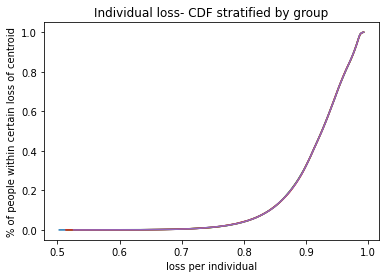

c  {0: (4.738040726693644, 3.913068614458709), 1: (-10.098464167516049, -9.867908830521126), 2: (-11.862453805316813, 6.916852747786107), 3: (10.018597559998907, -4.578765942420558), 4: (-2.7623745229217906, 9.2717209482024), 5: (-2.8483525003396886, 1.296985987059826), 6: (3.0972532209887222, 10.146674258833404), 7: (4.739302276842504, -1.9883333553032567), 8: (-7.4523557404423855, -6.0265578069059735), 9: (7.767358894434518, 8.41434707358859)}
weights:  [0.19999439 0.20000675 0.19999279 0.19999589 0.20001018]
Time elapsed Batch Step:  0.34740495681762695
Time elapsed Assignment Step:  2.2340376377105713
0.0004152692559552529
total:  0.6404370393700358


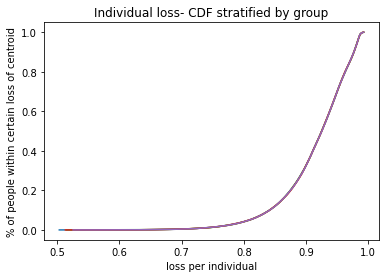

c  {0: (4.737577052456475, 3.9127562639092446), 1: (-10.097029699744372, -9.866502544871087), 2: (-11.860655568388637, 6.916590674286515), 3: (10.018058486446133, -4.577115901717201), 4: (-2.761052269168855, 9.270506873285377), 5: (-2.847295677063101, 1.2981898381764096), 6: (3.0961952427196544, 10.145446281401941), 7: (4.739400607684676, -1.9872590083697537), 8: (-7.453295592658056, -6.028464348127754), 9: (7.765680748759632, 8.413577654233455)}
weights:  [0.1999944  0.20000677 0.19999281 0.19999592 0.20001011]
Time elapsed Batch Step:  0.3332185745239258
Time elapsed Assignment Step:  2.294466018676758
0.0004074169130128258
total:  0.640354860859137


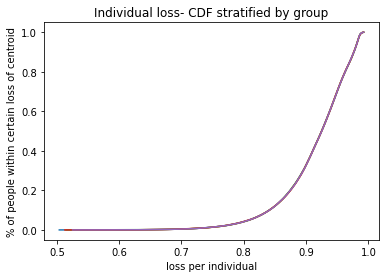

c  {0: (4.737113295033417, 3.9124438866397386), 1: (-10.095594518919121, -9.865095554547448), 2: (-11.858856164364546, 6.916328471974131), 3: (10.017519020815161, -4.575464690637677), 4: (-2.7597292997766782, 9.269292159615818), 5: (-2.8462382923076763, 1.299394365102493), 6: (3.0951365566963647, 10.144217664279473), 7: (4.7394990103352415, -1.9861843300579054), 8: (-7.454236009364886, -6.030372060524228), 9: (7.764001453151078, 8.412807714618541)}
weights:  [0.19999441 0.20000678 0.19999283 0.19999594 0.20001004]
Time elapsed Batch Step:  0.33721184730529785
Time elapsed Assignment Step:  2.2989699840545654
0.00039775725900359493
total:  0.6402719970494737


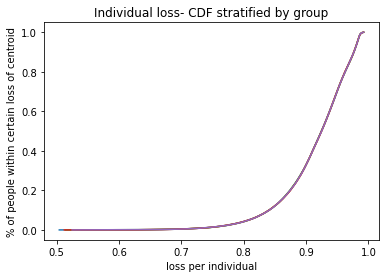

c  {0: (4.73664945439213, 3.9121314826829137), 1: (-10.094158626718755, -9.863687861116649), 2: (-11.857055593283722, 6.91606614100994), 3: (10.01697916290998, -4.573812308701021), 4: (-2.758405615341851, 9.268076807866668), 5: (-2.845180346280469, 1.3005995677367974), 6: (3.0940771626695946, 10.142988407562857), 7: (4.7395974848720375, -1.9851093205456598), 8: (-7.455176989744401, -6.032280942592976), 9: (7.762321007569449, 8.412037254761042)}
weights:  [0.19999442 0.20000679 0.19999285 0.19999596 0.20000997]
Time elapsed Batch Step:  0.3359954357147217
Time elapsed Assignment Step:  2.2940545082092285
0.00041430133519193557
total:  0.6401968511349109


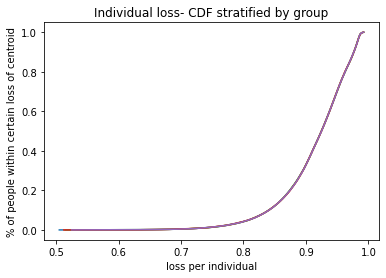

c  {0: (4.736185530500263, 3.9118190520715217), 1: (-10.092722024835092, -9.862279466157501), 2: (-11.855253855191574, 6.915803681556192), 3: (10.016438912535659, -4.5721587554300065), 4: (-2.7570812164670175, 9.266860818717099), 5: (-2.8441218391917586, 1.301805445974858), 6: (3.093017060392132, 10.141758511351693), 7: (4.739696031372968, -1.9840339800119389), 8: (-7.4561185329695645, -6.034190992815207), 9: (7.760639411981685, 8.41126627468125)}
weights:  [0.19999443 0.20000681 0.19999287 0.19999599 0.2000099 ]
Time elapsed Batch Step:  0.34455370903015137
Time elapsed Assignment Step:  2.2594854831695557
0.00042840629184026646
total:  0.6401208300240311


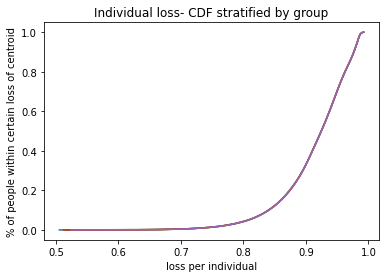

c  {0: (4.7357215233254575, 3.911506594838346), 1: (-10.091284714973362, -9.860870371261237), 2: (-11.853450950139775, 6.9155410937764), 3: (10.015898269498352, -4.570504030351169), 4: (-2.755756103760901, 9.265644192852527), 5: (-2.843062771255066, 1.30301199970901), 6: (3.0919562496188213, 10.14052797574833), 7: (4.739794649916004, -1.9829583086366411), 8: (-7.457060638204734, -6.036102209655674), 9: (7.758956666361109, 8.410494774402574)}
weights:  [0.19999444 0.20000682 0.19999289 0.19999601 0.20000983]
Time elapsed Batch Step:  0.33780384063720703
Time elapsed Assignment Step:  2.334122896194458
0.0004282514177671448
total:  0.6400403876700108


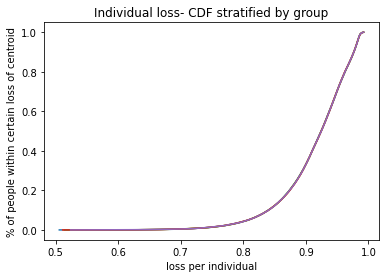

c  {0: (4.735257432835345, 3.9111941110161994), 1: (-10.08984669885226, -9.859460578031555), 2: (-11.851646878186296, 6.915278377835352), 3: (10.015357233605313, -4.568848132994836), 4: (-2.754430277838328, 9.264426930964637), 5: (-2.8420031426871635, 1.304219228828372), 6: (3.0908947301065797, 10.139296800857888), 7: (4.73989334057919, -1.9818823066006437), 8: (-7.458003304605613, -6.038014591562596), 9: (7.757272770687469, 8.409722753951565)}
weights:  [0.19999446 0.20000683 0.19999292 0.19999604 0.20000976]
Time elapsed Batch Step:  0.3715529441833496
Time elapsed Assignment Step:  2.3153226375579834
0.00042978493140333196
total:  0.6399602647932807


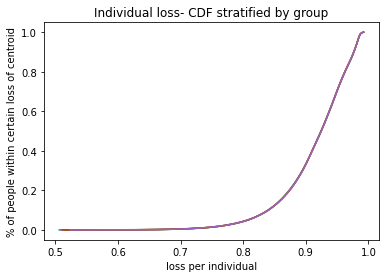

c  {0: (4.734793258997551, 3.9108816006379254), 1: (-10.088407978204001, -9.858050088084676), 2: (-11.849841639395441, 6.915015533899111), 3: (10.014815804664895, -4.567191062895147), 4: (-2.7531037393202547, 9.26320903375141), 5: (-2.8409429537080944, 1.3054271332188332), 6: (3.089814596477654, 10.138063710720319), 7: (4.739992103440634, -1.9808059740858044), 8: (-7.458946531319213, -6.039928136967569), 9: (7.7555904575455505, 8.40895760950867)}
weights:  [0.19999447 0.20000685 0.19999294 0.19999606 0.20000969]
Time elapsed Batch Step:  0.34621191024780273
Time elapsed Assignment Step:  2.297372579574585
0.0004205079633465836
total:  0.6398767553815156


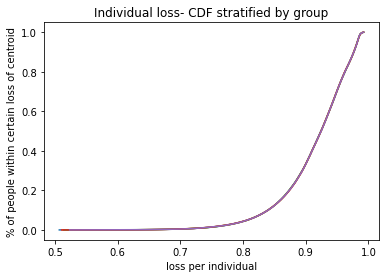

c  {0: (4.734329001779692, 3.9105690637363977), 1: (-10.086968554774378, -9.856638903049385), 2: (-11.848035233837887, 6.914752562135021), 3: (10.014273982486566, -4.5655328195900875), 4: (-2.751776488833791, 9.261990501917147), 5: (-2.8398822045411847, 1.3066357127630361), 6: (3.0887337407244844, 10.136829961093714), 7: (4.740090938578513, -1.979729311274964), 8: (-7.459890317483799, -6.041842844285482), 9: (7.753906995891896, 8.4081919504328)}
weights:  [0.19999448 0.20000686 0.19999296 0.19999609 0.20000961]
Time elapsed Batch Step:  0.3418307304382324
Time elapsed Assignment Step:  2.234663486480713
0.00041933273729366505
total:  0.6397955321754697


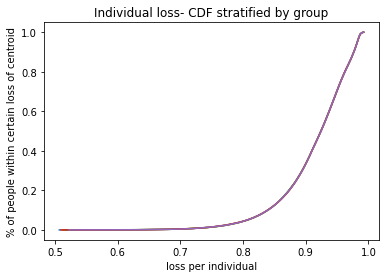

c  {0: (4.733864661149375, 3.91025650034452), 1: (-10.08552843032281, -9.855227024567087), 2: (-11.84622766159072, 6.914489462711712), 3: (10.013731766880914, -4.5638734026215095), 4: (-2.7504485270122263, 9.260771336172487), 5: (-2.8388208954130585, 1.3078449673403632), 6: (3.0876521626139666, 10.135595552063743), 7: (4.7401898460710745, -1.978652318351949), 8: (-7.460834662228855, -6.043758711914437), 9: (7.752222385710572, 8.407425776755051)}
weights:  [0.19999449 0.20000687 0.19999298 0.19999611 0.20000954]
Time elapsed Batch Step:  0.34758734703063965
Time elapsed Assignment Step:  2.278366804122925
0.0004031710818881429
total:  0.6397096684195819


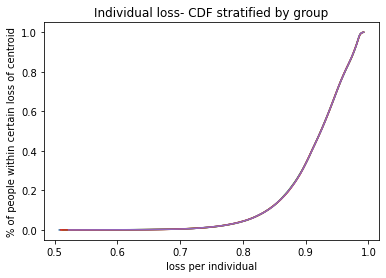

c  {0: (4.733400237074199, 3.9099439104952265), 1: (-10.084087606622395, -9.853814454291856), 2: (-11.844418922737471, 6.914226235799104), 3: (10.013189157659655, -4.562212811535162), 4: (-2.7491198544950572, 9.259551537234442), 5: (-2.837759026553653, 1.3090548968269204), 6: (3.0865698619152324, 10.134360483718961), 7: (4.7402888259966325, -1.977574995501573), 8: (-7.461779564675033, -6.045675738235656), 9: (7.750536626992106, 8.406659088509663)}
weights:  [0.1999945  0.20000689 0.199993   0.19999614 0.20000947]
Time elapsed Batch Step:  0.33394932746887207
Time elapsed Assignment Step:  2.2137978076934814
0.0004014034946578926
total:  0.6396280315991942


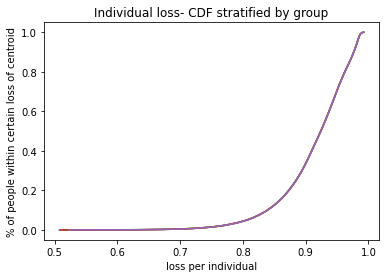

c  {0: (4.732936587068222, 3.909629285197058), 1: (-10.08264608545997, -9.852401193890483), 2: (-11.84260901736815, 6.91396288156841), 3: (10.01264615463564, -4.560551045880716), 4: (-2.7477904719280097, 9.258331105826413), 5: (-2.8367010877292143, 1.310258990693727), 6: (3.0854868383996625, 10.133124756150815), 7: (4.740387878433568, -1.9764973429096386), 8: (-7.462725023934107, -6.047593921613402), 9: (7.748849719733523, 8.405891885734036)}
weights:  [0.19999451 0.2000069  0.19999303 0.19999616 0.2000094 ]
Time elapsed Batch Step:  0.3401823043823242
Time elapsed Assignment Step:  2.261622190475464
0.0004121881687615403
total:  0.6395500157556745


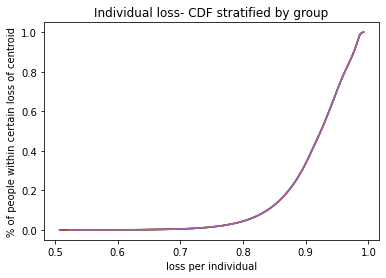

c  {0: (4.732472854518092, 3.909314632841593), 1: (-10.081203868636159, -9.850987245042528), 2: (-11.840797945579293, 6.913699400192144), 3: (10.012102757622868, -4.558888105211793), 4: (-2.746460379963067, 9.257110042678216), 5: (-2.835642592813094, 1.3114637540050857), 6: (3.0844030918409016, 10.131888369453662), 7: (4.740487003460331, -1.9754193607629418), 8: (-7.463671039108932, -6.049513260394892), 9: (7.747161663938388, 8.405124168468749)}
weights:  [0.19999453 0.20000691 0.19999305 0.19999618 0.20000933]
Time elapsed Batch Step:  0.3590047359466553
Time elapsed Assignment Step:  2.289766788482666
0.0003954388294944433
total:  0.6394635948365074


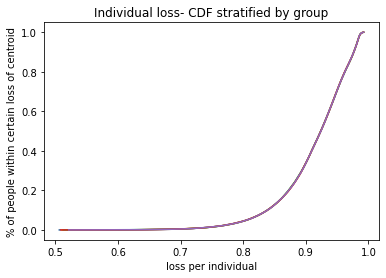

c  {0: (4.732009039392132, 3.9089999534618975), 1: (-10.079760957965428, -9.84957260944037), 2: (-11.83898570747399, 6.9134357918441225), 3: (10.01155896643649, -4.557223989085988), 4: (-2.7451295792584953, 9.25588834852611), 5: (-2.834583542035208, 1.3126691866353648), 6: (3.0833186220148705, 10.13065132372478), 7: (4.740586201155438, -1.974341049249272), 8: (-7.464617609293395, -6.05143375291021), 9: (7.7454724596168365, 8.404355936757577)}
weights:  [0.19999454 0.20000693 0.19999307 0.19999621 0.20000925]
Time elapsed Batch Step:  0.3357100486755371
Time elapsed Assignment Step:  2.277064085006714
0.00038779506675323816
total:  0.6393797610637031


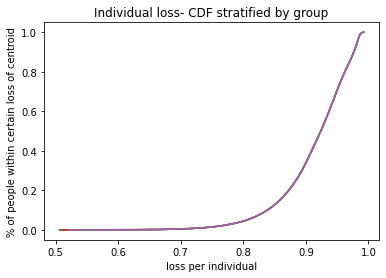

c  {0: (4.731545141658655, 3.9086852470910673), 1: (-10.078317355276141, -9.848157288789254), 2: (-11.837172303161925, 6.913172056699472), 3: (10.011014780892824, -4.555558697064903), 4: (-2.7437980704788676, 9.254666024112817), 5: (-2.8335239356287643, 1.313875288455676), 6: (3.0822334286997815, 10.129413619064383), 7: (4.740685471597473, -1.9732624085574146), 8: (-7.46556473357237, -6.053355397472225), 9: (7.74378210678562, 8.403587190647514)}
weights:  [0.19999455 0.20000694 0.19999309 0.19999623 0.20000918]
Time elapsed Batch Step:  0.35697364807128906
Time elapsed Assignment Step:  2.2903051376342773
0.0003771447865363875
total:  0.6392948810182698


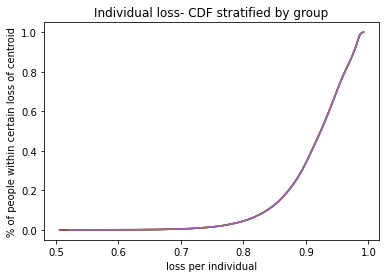

c  {0: (4.731081161285968, 3.9083705137622298), 1: (-10.076873062410607, -9.846741284807344), 2: (-11.835357732759416, 6.912908194934631), 3: (10.010470200809351, -4.5538922287141705), 4: (-2.7424658542950926, 9.253443070187549), 5: (-2.832463773830279, 1.3150820593338604), 6: (3.081147511676151, 10.128175255575634), 7: (4.740784814865088, -1.9721834388771546), 8: (-7.466512411021672, -6.055278192376498), 9: (7.7420906054681415, 8.402817930188784)}
weights:  [0.19999456 0.20000696 0.19999312 0.19999625 0.20000911]
Time elapsed Batch Step:  0.3786506652832031
Time elapsed Assignment Step:  2.2781167030334473
0.00037023977252248486
total:  0.6392109795676463


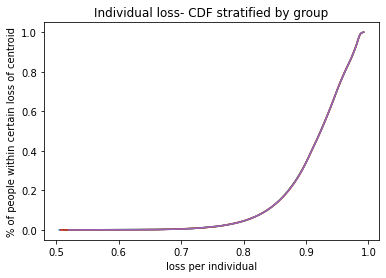

c  {0: (4.73061709824237, 3.9080557535085423), 1: (-10.07542808122514, -9.84532459922577), 2: (-11.833541996389453, 6.912644206727355), 3: (10.009925226004738, -4.552224583603481), 4: (-2.741132931384438, 9.252219487506032), 5: (-2.8314030568795916, 1.316289499134473), 6: (3.0800608707268147, 10.12693623336466), 7: (4.740884231037001, -1.9711041403992773), 8: (-7.467460640708013, -6.057202135901202), 9: (7.740397955694497, 8.402048155434867)}
weights:  [0.19999457 0.20000697 0.19999314 0.19999628 0.20000904]
Time elapsed Batch Step:  0.3592672348022461
Time elapsed Assignment Step:  2.319514274597168
0.0003841154391927004
total:  0.6391331675164684


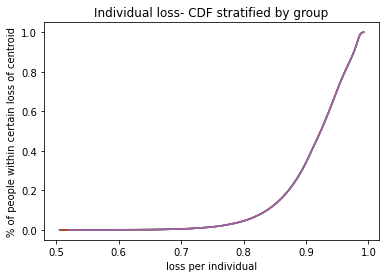

c  {0: (4.730152952496152, 3.9077409663631926), 1: (-10.07398241359011, -9.843907233788679), 2: (-11.831725094181733, 6.912380092256722), 3: (10.009379856298835, -4.550555761306612), 4: (-2.7397993024305585, 9.250995276830531), 5: (-2.8303417850198773, 1.3174976077187677), 6: (3.0789735056369407, 10.125696552540564), 7: (4.740983720191998, -1.9700245133155712), 8: (-7.468409421688953, -6.05912722630703), 9: (7.73870415750151, 8.401277866442518)}
weights:  [0.19999459 0.20000698 0.19999316 0.1999963  0.20000897]
Time elapsed Batch Step:  0.3477516174316406
Time elapsed Assignment Step:  2.316862106323242
0.00039176596482004555
total:  0.6390533416457919


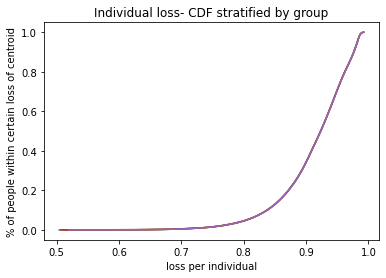

c  {0: (4.729688724015595, 3.9074261523593985), 1: (-10.072536061389993, -9.84248919025329), 2: (-11.829907026272704, 6.912115851703139), 3: (10.008834091512693, -4.548885761401454), 4: (-2.738464968123521, 9.249770438929875), 5: (-2.829279958497665, 1.318706384944682), 6: (3.0778854161940434, 10.12445621321544), 7: (4.7410832824089315, -1.9689445578188303), 8: (-7.469358753012857, -6.061053461837114), 9: (7.737009210932777, 8.40050706327178)}
weights:  [0.1999946  0.200007   0.19999318 0.19999633 0.20000889]
Time elapsed Batch Step:  0.34857940673828125
Time elapsed Assignment Step:  2.327063798904419
0.0003856986922872174
total:  0.6389692547288467


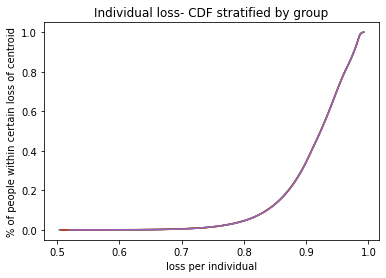

c  {0: (4.729224412768977, 3.907111311530409), 1: (-10.071089026523424, -9.841070470389935), 2: (-11.828087792805595, 6.911851485248342), 3: (10.008287931468566, -4.5472145834700415), 4: (-2.7371299291598303, 9.248544974579481), 5: (-2.8282175775628486, 1.3199158306668222), 6: (3.076796602187999, 10.123215215504386), 7: (4.741182917766719, -1.9678642741028562), 8: (-7.470308633718846, -6.0629808407169286), 9: (7.7353131160387, 8.399735745986007)}
weights:  [0.19999461 0.20000701 0.19999321 0.19999635 0.20000882]
Time elapsed Batch Step:  0.34746575355529785
Time elapsed Assignment Step:  2.271481513977051
0.0003889468045893407
total:  0.6388878167968793


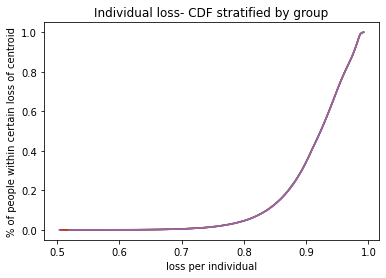

c  {0: (4.7287600187245635, 3.9067964439095033), 1: (-10.069641310903256, -9.839651075982117), 2: (-11.826267393930467, 6.911586993075407), 3: (10.007741375989921, -4.545542227098578), 4: (-2.7357941862424573, 9.247318884561375), 5: (-2.8271546424687055, 1.3211259447364474), 6: (3.0757070634110577, 10.12197355952552), 7: (4.741282626344346, -1.9667836623624604), 8: (-7.471259062836748, -6.064909361154213), 9: (7.733615872876532, 8.398963914651883)}
weights:  [0.19999462 0.20000703 0.19999323 0.19999638 0.20000874]
Time elapsed Batch Step:  0.33722639083862305
Time elapsed Assignment Step:  2.2491016387939453
0.00039700436623490987
total:  0.6388076751922344


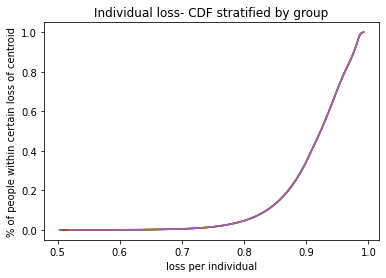

c  {0: (4.728295541850616, 3.9064815495299907), 1: (-10.068192916456603, -9.83823100882655), 2: (-11.824445829804239, 6.911322375368746), 3: (10.007194424901451, -4.543868691877466), 4: (-2.734457740080863, 9.246092169664223), 5: (-2.826091153471909, 1.3223367270014548), 6: (3.07461679965786, 10.12073124539999), 7: (4.741382408220864, -1.9657027227934665), 8: (-7.47221003938706, -6.066839021338878), 9: (7.731917481510415, 8.398191569339442)}
weights:  [0.19999463 0.20000704 0.19999325 0.1999964  0.20000867]
Time elapsed Batch Step:  0.33743882179260254
Time elapsed Assignment Step:  2.2696499824523926
0.0003894978409726413
total:  0.6387227783258519


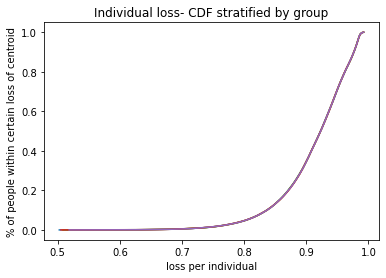

c  {0: (4.727824363754024, 3.906170890623495), 1: (-10.066743845124902, -9.83681027073322), 2: (-11.822623100590734, 6.9110576323141215), 3: (10.006647078029077, -4.542193977401333), 4: (-2.733120591391027, 9.244864830683355), 5: (-2.825030726980399, 1.3235389733722929), 6: (3.0735258107254495, 10.119488273251989), 7: (4.7414859027926655, -1.9646229984780632), 8: (-7.473161562380892, -6.068769819442918), 9: (7.730217942011417, 8.397418710122084)}
weights:  [0.19999464 0.20000706 0.19999327 0.19999643 0.2000086 ]
Time elapsed Batch Step:  0.3610410690307617
Time elapsed Assignment Step:  2.3203396797180176
0.0003951079203908803
total:  0.6386416698209407


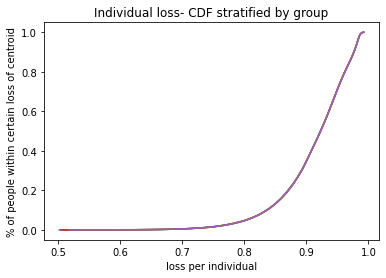

c  {0: (4.727353100467964, 3.905860205791153), 1: (-10.065294098863957, -9.83538886352543), 2: (-11.820799206460721, 6.9107927640986455), 3: (10.006099335199965, -4.540518083269064), 4: (-2.731782740895472, 9.243636868420783), 5: (-2.8239697528970527, 1.3247418789519878), 6: (3.072434096413287, 10.118244643208774), 7: (4.741589473425376, -1.9635429453884026), 8: (-7.474113630819925, -6.070701753620321), 9: (7.728517254457576, 8.396645337076599)}
weights:  [0.19999465 0.20000707 0.1999933  0.19999646 0.20000852]
Time elapsed Batch Step:  0.34832143783569336
Time elapsed Assignment Step:  2.3473589420318604
0.00038704929556721
total:  0.6385563138172524


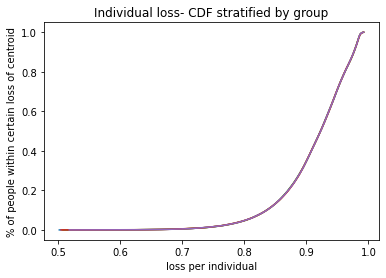

c  {0: (4.726881751959378, 3.905549495066689), 1: (-10.063843679643997, -9.833966789039847), 2: (-11.81897414759195, 6.910527770910784), 3: (10.005551196242523, -4.538841009083826), 4: (-2.730444189323293, 9.242408283685235), 5: (-2.8229082314867084, 1.325945443581965), 6: (3.071341656523267, 10.117000355400675), 7: (4.741693120200566, -1.9624625637175583), 8: (-7.475066243696362, -6.072634822006987), 9: (7.726815418933938, 8.395871450283183)}
weights:  [0.19999467 0.20000709 0.19999332 0.19999648 0.20000845]
Time elapsed Batch Step:  0.34520459175109863
Time elapsed Assignment Step:  2.298537015914917
0.0003851969842272318
total:  0.6384726727114528


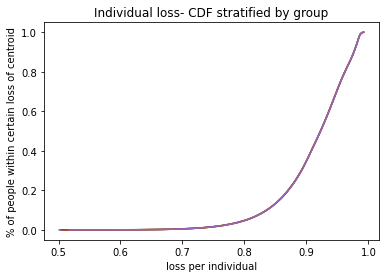

c  {0: (4.726410318195202, 3.9052387584838577), 1: (-10.062392589449722, -9.832544049126552), 2: (-11.81714792416919, 6.910262652940365), 3: (10.005002660986428, -4.537162754453099), 4: (-2.7291049374101815, 9.241179077292173), 5: (-2.8218461630175917, 1.3271496671003125), 6: (3.0702484908597305, 10.115755409961109), 7: (4.741796843199873, -1.9613818536596135), 8: (-7.476019399992881, -6.074569022720629), 9: (7.7251124355325995, 8.395097049825457)}
weights:  [0.19999468 0.2000071  0.19999334 0.19999651 0.20000838]
Time elapsed Batch Step:  0.3511488437652588
Time elapsed Assignment Step:  2.271629810333252
0.0003745116813224092
total:  0.6383862347961758


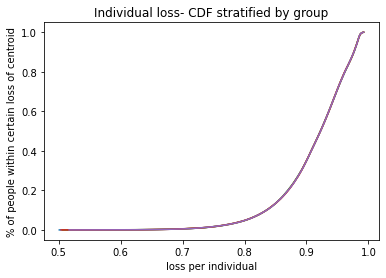

c  {0: (4.725938799142365, 3.9049279960764443), 1: (-10.06094083028036, -9.831120645649097), 2: (-11.815320536384272, 6.9099974103785815), 3: (10.004453729262616, -4.535483318988705), 4: (-2.7277649858984536, 9.239949250063821), 5: (-2.820783547761331, 1.3283545493417657), 6: (3.0691545992294795, 10.114509807026595), 7: (4.741900642505003, -1.9603008154096622), 8: (-7.476973098682588, -6.076504353860693), 9: (7.723408304352746, 8.394322135790492)}
weights:  [0.19999469 0.20000711 0.19999336 0.19999653 0.2000083 ]
Time elapsed Batch Step:  0.33857226371765137
Time elapsed Assignment Step:  2.251708745956421
0.00038022469459020325
total:  0.6383045695786103


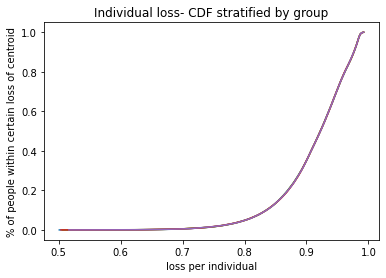

c  {0: (4.725467194767786, 3.904617207878265), 1: (-10.059488404149718, -9.829696580484548), 2: (-11.813491984436133, 6.9097320434179945), 3: (10.003904400903304, -4.533802702306836), 4: (-2.726424335537077, 9.23871880282919), 5: (-2.8197203859929725, 1.329560090137692), 6: (3.0680599814417926, 10.113263546736773), 7: (4.742004518197728, -1.9592194491638124), 8: (-7.477927338728972, -6.07844081350826), 9: (7.721703025500691, 8.393546708268824)}
weights:  [0.1999947  0.20000713 0.19999338 0.19999656 0.20000823]
Time elapsed Batch Step:  0.34882020950317383
Time elapsed Assignment Step:  2.2788004875183105
0.0003804570142027508
total:  0.6382211137942672


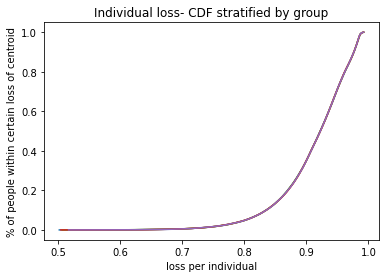

c  {0: (4.724995505038378, 3.9043063939231666), 1: (-10.058035313086227, -9.828271855523534), 2: (-11.811662268530851, 6.909466552252542), 3: (10.003354675741992, -4.532120904028084), 4: (-2.7250829870816973, 9.2374877364241), 5: (-2.8186566779909943, 1.3307662893160765), 6: (3.0669646373084385, 10.11201662923441), 7: (4.742108470359885, -1.9581377551191883), 8: (-7.478882119085851, -6.080378399725966), 9: (7.719996599089924, 8.39277076735447)}
weights:  [0.19999471 0.20000714 0.1999934  0.19999659 0.20000816]
Time elapsed Batch Step:  0.355623722076416
Time elapsed Assignment Step:  2.299243927001953
0.00037697637867617484
total:  0.638136386996984


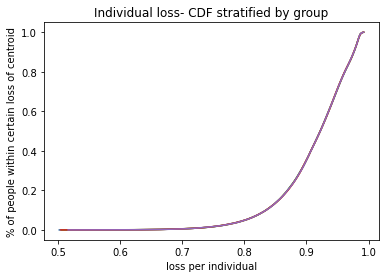

c  {0: (4.724517709288354, 3.9040012364376846), 1: (-10.056581559133004, -9.826846472670299), 2: (-11.809831388881683, 6.90920093707754), 3: (10.002804553613478, -4.530437923777469), 4: (-2.7237409412946647, 9.236256051691209), 5: (-2.817592424037322, 1.3319731467015057), 6: (3.0658685666436916, 10.110769054665418), 7: (4.742215183554985, -1.9570551026625065), 8: (-7.47983743869733, -6.0823171105579), 9: (7.718289025241144, 8.39199431314496)}
weights:  [0.19999472 0.20000716 0.19999343 0.19999661 0.20000808]
Time elapsed Batch Step:  0.3437619209289551
Time elapsed Assignment Step:  2.2946786880493164
0.00039837397707576105
total:  0.6380589755249793


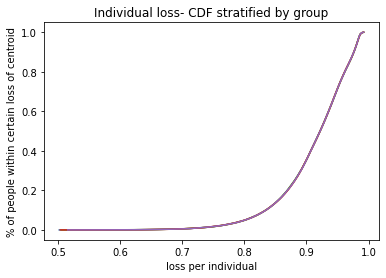

c  {0: (4.72403982471716, 3.9036960538360903), 1: (-10.05512714434789, -9.825420433842755), 2: (-11.807999345709113, 6.908935198089691), 3: (10.00225403435386, -4.52875376118447), 4: (-2.7223981989450623, 9.235023749480035), 5: (-2.816527624417343, 1.3331806621151527), 6: (3.0647717692643464, 10.109520823178872), 7: (4.742321975516159, -1.9559721192250188), 8: (-7.480793296497749, -6.084256944029526), 9: (7.716580304082304, 8.391217345741342)}
weights:  [0.19999473 0.20000717 0.19999345 0.19999664 0.20000801]
Time elapsed Batch Step:  0.34520864486694336
Time elapsed Assignment Step:  2.3149993419647217
0.0003907939270190175
total:  0.6379727217472618


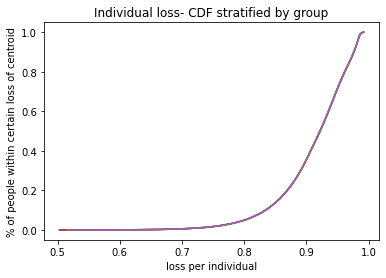

c  {0: (4.7235618512893875, 3.903390846151485), 1: (-10.053672070803513, -9.823993740972522), 2: (-11.806166139240888, 6.908669335487085), 3: (10.001703117800554, -4.527068415883054), 4: (-2.7210547608087325, 9.233790830646983), 5: (-2.815462279419922, 1.3343888353747617), 6: (3.0636742449897327, 10.10827193492702), 7: (4.742428846327683, -1.9548888050003417), 8: (-7.481749691411639, -6.086197898147584), 9: (7.7148704357486535, 8.390439865248217)}
weights:  [0.19999474 0.20000719 0.19999347 0.19999666 0.20000794]
Time elapsed Batch Step:  0.3441929817199707
Time elapsed Assignment Step:  2.3024301528930664
0.0003929149722152747
total:  0.6378892300898021


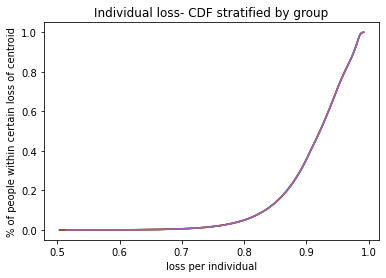

c  {0: (4.723083788969619, 3.9030856134169993), 1: (-10.052216340587327, -9.822566396004989), 2: (-11.80433176971206, 6.908403349469207), 3: (10.001151803792295, -4.525381887511706), 4: (-2.719710627668304, 9.23255729605537), 5: (-2.814396389337416, 1.335597666294633), 6: (3.0625759936417305, 10.107022390065296), 7: (4.742535796073904, -1.953805160183111), 8: (-7.48270662235367, -6.088139970900002), 9: (7.713159420382778, 8.389661871773745)}
weights:  [0.19999475 0.2000072  0.19999349 0.19999669 0.20000786]
Time elapsed Batch Step:  0.34036755561828613
Time elapsed Assignment Step:  2.2192137241363525
0.0003994086141314579
total:  0.6378069017023077


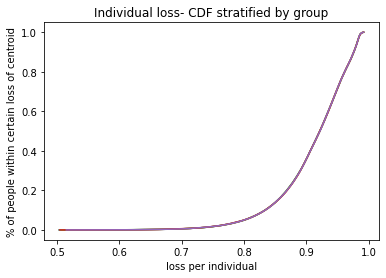

c  {0: (4.72260563772243, 3.9027803556657954), 1: (-10.050759955801672, -9.821138400899352), 2: (-11.80249623736503, 6.908137240236942), 3: (10.000600092169151, -4.523694175713458), 4: (-2.71836580031322, 9.231323146575447), 5: (-2.8133299544656887, 1.3368071546856066), 6: (3.061477015044784, 10.10577218875234), 7: (4.742642824839237, -1.9527211849689834), 8: (-7.483664088228606, -6.090083160255806), 9: (7.7114472581346405, 8.388883365429677)}
weights:  [0.19999477 0.20000722 0.19999351 0.19999672 0.20000779]
Time elapsed Batch Step:  0.3638033866882324
Time elapsed Assignment Step:  2.252267360687256
0.0004001482295535874
total:  0.6377226984589273


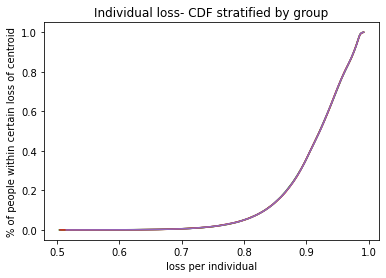

c  {0: (4.722127397512386, 3.902475072931064), 1: (-10.04930291856382, -9.819709757628672), 2: (-11.800659542449583, 6.907871007992578), 3: (10.000047982772532, -4.52200528013592), 4: (-2.717020279539765, 9.230088383084428), 5: (-2.8122629751041264, 1.3380173003550482), 6: (3.0603773090259185, 10.104521331150009), 7: (4.742749932708165, -1.9516368795546397), 8: (-7.484622087931252, -6.092027464165025), 9: (7.7097339491616275, 8.38810434633137)}
weights:  [0.19999478 0.20000723 0.19999353 0.19999675 0.20000771]
Time elapsed Batch Step:  0.33617401123046875
Time elapsed Assignment Step:  2.270677089691162
0.00042517714143841534
total:  0.6376456333725722


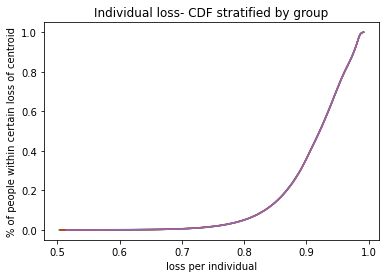

c  {0: (4.721649068304044, 3.902169765246027), 1: (-10.04784523100602, -9.81828046817992), 2: (-11.798821685222938, 6.907604652939813), 3: (9.999495475445197, -4.520315200431309), 4: (-2.7156740661510916, 9.228853006466514), 5: (-2.8111954515556525, 1.3392281031068323), 6: (3.059276875414753, 10.103269817423392), 7: (4.742857119765238, -1.9505522441377867), 8: (-7.48558062034641, -6.0939728805586055), 9: (7.708019493628585, 8.387324814597802)}
weights:  [0.19999479 0.20000725 0.19999355 0.19999678 0.20000764]
Time elapsed Batch Step:  0.35195136070251465
Time elapsed Assignment Step:  2.232422113418579
0.00042421961016503307
total:  0.63756063106922


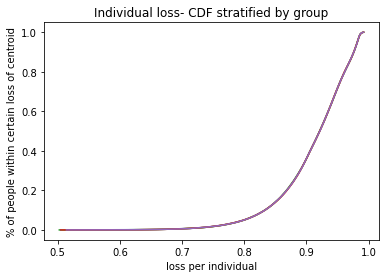

c  {0: (4.721170650061954, 3.9018644326439365), 1: (-10.046377891173643, -9.816854762610262), 2: (-11.796982665949784, 6.90733817528376), 3: (9.99894257003127, -4.518623936256482), 4: (-2.71432716095725, 9.227617017612916), 5: (-2.810127384126744, 1.340439562741327), 6: (3.0581757140435175, 10.102017647740825), 7: (4.742964386095075, -1.949467278917159), 8: (-7.486546113760418, -6.095908027933026), 9: (7.706303891707868, 8.386544770351605)}
weights:  [0.1999948  0.20000726 0.19999357 0.1999968  0.20000756]
Time elapsed Batch Step:  0.34334659576416016
Time elapsed Assignment Step:  2.3049142360687256
0.0004296613563999907
total:  0.6374773995312448


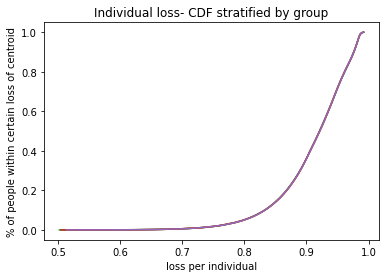

c  {0: (4.720692142750655, 3.9015590751580733), 1: (-10.044909907716667, -9.815428425144505), 2: (-11.795142484902325, 6.907071575230948), 3: (9.998389266376238, -4.516931487272962), 4: (-2.712979564775215, 9.226380417421883), 5: (-2.8090587731274437, 1.341651679055379), 6: (3.0570738247470675, 10.100764822273902), 7: (4.743071731782361, -1.9483819840925223), 8: (-7.487512147984848, -6.097844286355783), 9: (7.704587143579373, 8.385764213719074)}
weights:  [0.19999481 0.20000728 0.19999359 0.19999683 0.20000748]
Time elapsed Batch Step:  0.3791470527648926
Time elapsed Assignment Step:  2.2934458255767822
0.00043632050354502905
total:  0.6373952390278302


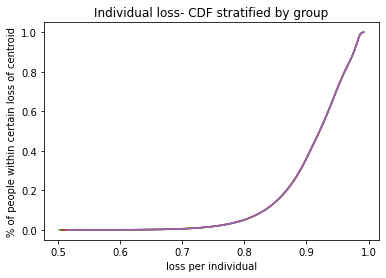

c  {0: (4.720218332298839, 3.9012567466451133), 1: (-10.043455969114294, -9.814015727527114), 2: (-11.793319555785738, 6.906807520211751), 3: (9.997838126955516, -4.515262800331107), 4: (-2.711644761292374, 9.225155578904959), 5: (-2.8080003104139406, 1.3428523241144275), 6: (3.055982233536741, 10.099523876008265), 7: (4.743168401355944, -1.947296654198075), 8: (-7.488469056174079, -6.0997622801094575), 9: (7.702886428372081, 8.384990955519083)}
weights:  [0.19999482 0.20000729 0.19999361 0.19999686 0.20000741]
Time elapsed Batch Step:  0.3510103225708008
Time elapsed Assignment Step:  2.3099453449249268
0.0004394660597266675
total:  0.6373118788247781


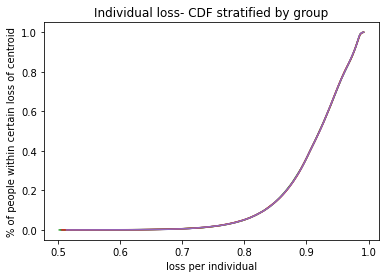

c  {0: (4.719744434480849, 3.9009543938087257), 1: (-10.042001404070719, -9.812602414651412), 2: (-11.791495488565008, 6.906543345638927), 3: (9.997286595948243, -4.513592960028964), 4: (-2.7103092821881605, 9.223930142991703), 5: (-2.8069413155623586, 1.3440536123791462), 6: (3.05488992856991, 10.098282287351376), 7: (4.743265152340424, -1.94621099285398), 8: (-7.4894264922401925, -6.101681358791238), 9: (7.7011845901368465, 8.38421719538531)}
weights:  [0.19999484 0.20000731 0.19999364 0.19999689 0.20000733]
Time elapsed Batch Step:  0.35314416885375977
Time elapsed Assignment Step:  2.2758545875549316
0.0004323783737338882
total:  0.6372253027954539


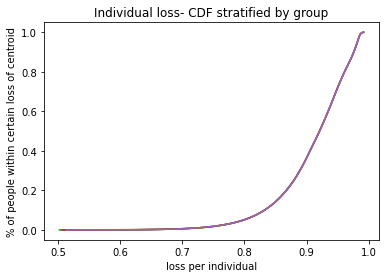

c  {0: (4.719270449262254, 3.9006520166812906), 1: (-10.040546214780202, -9.811188488555022), 2: (-11.789670283526302, 6.906279051717022), 3: (9.996734673208023, -4.511921966050118), 4: (-2.708973128275539, 9.222704110574256), 5: (-2.8058817888839758, 1.3452555436421036), 6: (3.0537969096940425, 10.097040056479287), 7: (4.743361984825749, -1.9451250002627063), 8: (-7.490384455090272, -6.103601520381861), 9: (7.699481629070375, 8.383442933451061)}
weights:  [0.19999485 0.20000732 0.19999366 0.19999692 0.20000726]
Time elapsed Batch Step:  0.3486952781677246
Time elapsed Assignment Step:  2.3132193088531494
0.0004306911319239548
total:  0.6371402004884535


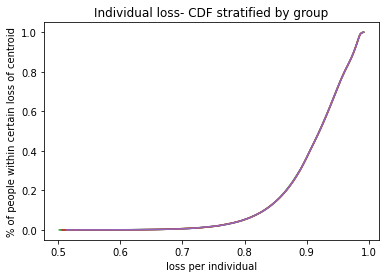

c  {0: (4.718796376608614, 3.900349615295218), 1: (-10.039090403451903, -9.809773951289355), 2: (-11.78784394096317, 6.906014638651961), 3: (9.996182358589808, -4.510249818082667), 4: (-2.707636300374234, 9.221477482551611), 5: (-2.8048217306935563, 1.3464581176924244), 6: (3.052703176759186, 10.095797183571237), 7: (4.7434588989019355, -1.9440386766277686), 8: (-7.491342943621666, -6.105522762843636), 9: (7.697777545376787, 8.382668169853249)}
weights:  [0.19999486 0.20000733 0.19999368 0.19999694 0.20000718]
Time elapsed Batch Step:  0.3529086112976074
Time elapsed Assignment Step:  2.361757755279541
0.0004234071637673198
total:  0.637053271995934


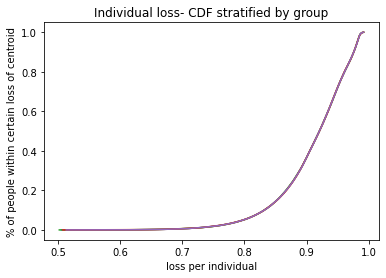

c  {0: (4.718322216485482, 3.900047189682947), 1: (-10.037633972309926, -9.808358804919656), 2: (-11.78601646117658, 6.905750106651061), 3: (9.995629651949903, -4.508576515819249), 4: (-2.706298799310754, 9.220250259829648), 5: (-2.803761141309365, 1.3476613343157748), 6: (3.051608729617985, 10.09455366880967), 7: (4.74355589465907, -1.9429520221537286), 8: (-7.492301956721939, -6.1074450841203465), 9: (7.696072339267657, 8.381892904732403)}
weights:  [0.19999487 0.20000735 0.19999371 0.19999697 0.20000711]
Time elapsed Batch Step:  0.37180566787719727
Time elapsed Assignment Step:  2.53126859664917
0.0004316194054365674
total:  0.6369708461430529


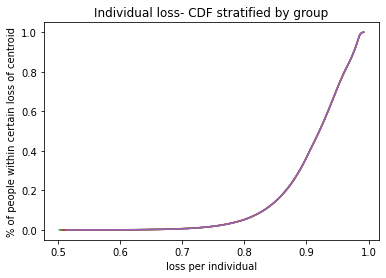

c  {0: (4.7178479688584005, 3.8997447398769447), 1: (-10.036176923593363, -9.806943051525053), 2: (-11.784187844474967, 6.905485455923026), 3: (9.995076553145978, -4.506902058957071), 4: (-2.7049606259184187, 9.219022443321144), 5: (-2.8027000210531816, 1.3488651932943472), 6: (3.050513568125693, 10.093309512380246), 7: (4.7436529721873075, -1.941865037046198), 8: (-7.49326149326883, -6.109368482137173), 9: (7.694366010962058, 8.381117138232698)}
weights:  [0.19999488 0.20000736 0.19999373 0.199997   0.20000703]
Time elapsed Batch Step:  0.37662410736083984
Time elapsed Assignment Step:  2.3635566234588623
0.0004396508853879988
total:  0.6368882187277938


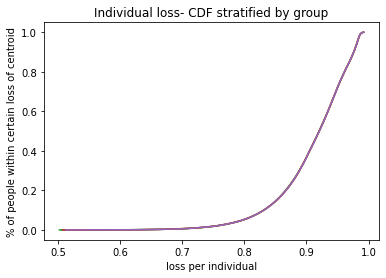

c  {0: (4.717373633692907, 3.8994422659097077), 1: (-10.034719259556336, -9.805526693198594), 2: (-11.78235809117427, 6.9052206866779615), 3: (9.994523062037073, -4.505226447197942), 4: (-2.703621781037387, 9.21779403394581), 5: (-2.801638370250318, 1.3500696944068444), 6: (3.0494176921401905, 10.09206471447186), 7: (4.743750131576873, -1.9407777215118411), 8: (-7.494221552130197, -6.1112929548005965), 9: (7.692658560686603, 8.380340870501968)}
weights:  [0.19999489 0.20000738 0.19999375 0.19999703 0.20000695]
Time elapsed Batch Step:  0.35395169258117676
Time elapsed Assignment Step:  2.261899709701538
0.0004280854871168138
total:  0.6367995658377096


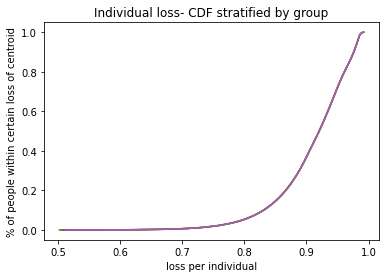

c  {0: (4.71689921095453, 3.8991397678137614), 1: (-10.033260982468047, -9.804109732047301), 2: (-11.780527201597973, 6.904955799127374), 3: (9.993969178483615, -4.503549680248296), 4: (-2.702282265514682, 9.216565032630308), 5: (-2.8005761892296306, 1.3512748374284658), 6: (3.0483211015219966, 10.090819275276653), 7: (4.7438473729180615, -1.9396900757583768), 8: (-7.495182132163979, -6.113218499998317), 9: (7.690949988675481, 8.379564101691733)}
weights:  [0.1999949  0.20000739 0.19999378 0.19999706 0.20000687]
Time elapsed Batch Step:  0.35561633110046387
Time elapsed Assignment Step:  2.2869784832000732
0.00042417570335140375
total:  0.6367130626074591


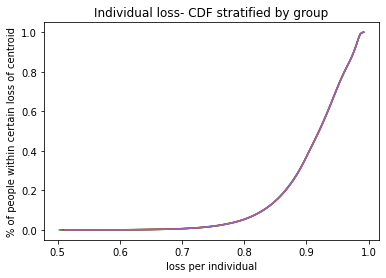

c  {0: (4.716424700608788, 3.89883724562166), 1: (-10.031802094612816, -9.802692170192216), 2: (-11.778695176077147, 6.9046907934841775), 3: (9.993414902347418, -4.501871757819229), 4: (-2.7009420802042206, 9.21533544030828), 5: (-2.799513478323535, 1.3524806221308903), 6: (3.047223796134287, 10.089573194990027), 7: (4.743944696301235, -1.9386020999945806), 8: (-7.4961432322181425, -6.1151451155991605), 9: (7.689240295170506, 8.378786831957214)}
weights:  [0.19999491 0.2000074  0.1999938  0.19999709 0.2000068 ]
Time elapsed Batch Step:  0.35715508460998535
Time elapsed Assignment Step:  2.2900140285491943
0.0004237563853410897
total:  0.6366274581214849


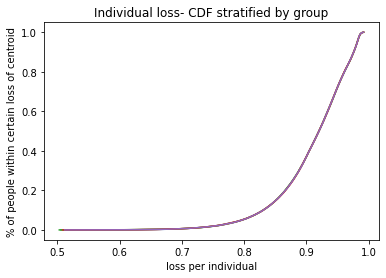

c  {0: (4.715950102621194, 3.898534699365986), 1: (-10.03034259829013, -9.801274009768441), 2: (-11.77686201495049, 6.904425669962697), 3: (9.9928602334917, -4.5001926796265215), 4: (-2.699601225966837, 9.214105257920368), 5: (-2.798450237868024, 1.3536870482822623), 6: (3.046125775842908, 10.08832647381066), 7: (4.744042101816826, -1.9375137944302876), 8: (-7.4971048511306355, -6.117072799452993), 9: (7.687529480421156, 8.378009061457355)}
weights:  [0.19999492 0.20000742 0.19999383 0.19999711 0.20000672]
Time elapsed Batch Step:  0.3425788879394531
Time elapsed Assignment Step:  2.2017199993133545
0.0004141984045532565
total:  0.6365389648194901


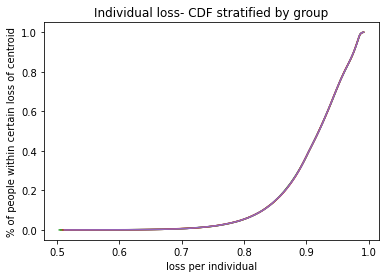

c  {0: (4.71547541695725, 3.8982321290793527), 1: (-10.028882495814683, -9.79985525292519), 2: (-11.775027718564377, 6.904160428778674), 3: (9.992305171781087, -4.498512445390674), 4: (-2.6982597036703138, 9.21287448641424), 5: (-2.797386468202678, 1.3548941156471757), 6: (3.045027040516391, 10.087079111940522), 7: (4.744139589555336, -1.9364251592763946), 8: (-7.498066987729343, -6.119001549390629), 9: (7.685817544684614, 8.377230790354844)}
weights:  [0.19999493 0.20000743 0.19999385 0.19999714 0.20000664]
Time elapsed Batch Step:  0.33377671241760254
Time elapsed Assignment Step:  2.3003036975860596
0.0004086189819990649
total:  0.6364515168599403


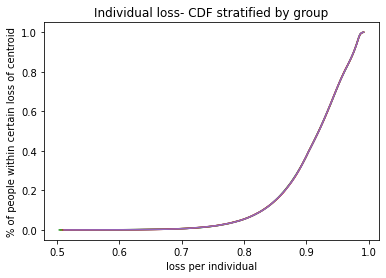

c  {0: (4.715000643582453, 3.8979295347944003), 1: (-10.027421789516419, -9.798435901825824), 2: (-11.773192287272897, 6.903895070149275), 3: (9.991749717081628, -4.496831054836935), 4: (-2.6969175141894053, 9.211643126744613), 5: (-2.7963221696706846, 1.3561018239866585), 6: (3.0439275900259672, 10.085831109584882), 7: (4.744237159607331, -1.9353361947448622), 8: (-7.499029640832037, -6.120931363223745), 9: (7.684104488225814, 8.37645201881613)}
weights:  [0.19999494 0.20000745 0.19999388 0.19999717 0.20000656]
Time elapsed Batch Step:  0.34203672409057617
Time elapsed Assignment Step:  2.2743937969207764
0.0004036648841747592
total:  0.63636410763922


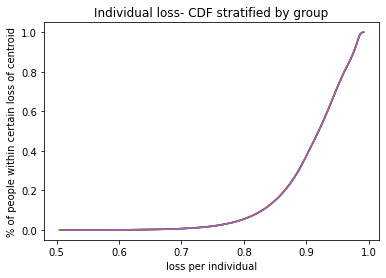

c  {0: (4.71452578246229, 3.897626916543799), 1: (-10.025960481740576, -9.797015958647911), 2: (-11.77135572143789, 6.903629594293092), 3: (9.991193869260803, -4.495148507695331), 4: (-2.6955746584058686, 9.210411179873281), 5: (-2.7952573426188505, 1.3573101730581574), 6: (3.0428274242455853, 10.084582466952334), 7: (4.744334812063449, -1.9342469010487173), 8: (-7.499992809246329, -6.122862238744788), 9: (7.682390311317479, 8.375672747011448)}
weights:  [0.19999495 0.20000746 0.1999939  0.1999972  0.20000649]
Time elapsed Batch Step:  0.37641024589538574
Time elapsed Assignment Step:  2.3294081687927246
0.00040244058199201405
total:  0.6362776693839741


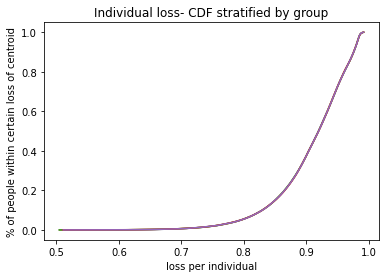

c  {0: (4.714050833562241, 3.897324274360247), 1: (-10.024498574847724, -9.79559542558326), 2: (-11.769518021429002, 6.9033640014301465), 3: (9.990637628187526, -4.493464803700694), 4: (-2.694231137208489, 9.209178646769136), 5: (-2.7941919873976184, 1.3585191626155222), 6: (3.041726543051925, 10.083333184254803), 7: (4.744432547014394, -1.9331572784020559), 8: (-7.500956491769624, -6.1247941737268885), 9: (7.680675014240167, 8.374892975114838)}
weights:  [0.19999496 0.20000747 0.19999393 0.19999723 0.20000641]
Time elapsed Batch Step:  0.3525540828704834
Time elapsed Assignment Step:  2.3683815002441406
0.0003935479651426821
total:  0.6361887826674397


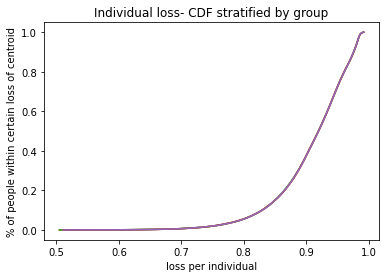

c  {0: (4.713575796847777, 3.897021608276473), 1: (-10.023036071213813, -9.794174304837966), 2: (-11.767679187623715, 6.903098291781902), 3: (9.990080993732164, -4.491779942592699), 4: (-2.692886951493106, 9.207945528408192), 5: (-2.7931261043610816, 1.3597287924089902), 6: (3.040624946324412, 10.082083261707565), 7: (4.744530364550939, -1.9320673270200446), 8: (-7.5019206871890685, -6.126727165923767), 9: (7.678958597282312, 8.374112703304165)}
weights:  [0.19999497 0.20000749 0.19999395 0.19999726 0.20000633]
Time elapsed Batch Step:  0.3465428352355957
Time elapsed Assignment Step:  2.3170278072357178
0.000388436308226936
total:  0.6361008812601482


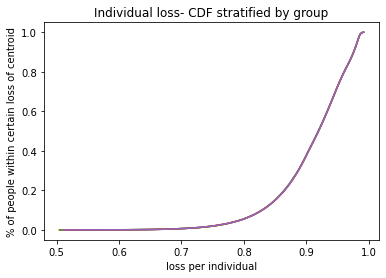

c  {0: (4.713100672284361, 3.896718918325232), 1: (-10.021572973230207, -9.792752598632465), 2: (-11.7658392204074, 6.902832465571261), 3: (9.989523965766542, -4.490093924115889), 4: (-2.6915421021626447, 9.206711825773615), 5: (-2.792059693866998, 1.3609390621851707), 6: (3.039522633945235, 10.080832699529257), 7: (4.744628264763922, -1.9309770471189236), 8: (-7.502885394281508, -6.128661213069647), 9: (7.677241060740268, 8.373331931761141)}
weights:  [0.19999498 0.2000075  0.19999397 0.19999729 0.20000625]
Time elapsed Batch Step:  0.3628885746002197
Time elapsed Assignment Step:  2.373091459274292
0.00036612831987503647
total:  0.6360076729469982


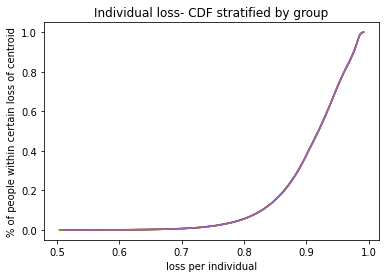

c  {0: (4.71262545983745, 3.896416204539311), 1: (-10.020109283303729, -9.791330309201562), 2: (-11.763998120173358, 6.902566523022573), 3: (9.988966544163956, -4.488406748019704), 4: (-2.6901965901271394, 9.205477539855739), 5: (-2.790992756276808, 1.362149971687029), 6: (3.038419605799359, 10.079581497941893), 7: (4.744726247744251, -1.929886438916009), 8: (-7.503850611813435, -6.130596312879165), 9: (7.675522404918354, 8.372550660671346)}
weights:  [0.19999499 0.20000751 0.199994   0.19999732 0.20000617]
Time elapsed Batch Step:  0.36467742919921875
Time elapsed Assignment Step:  2.34228777885437
0.0003804975512143871
total:  0.6359253184600262


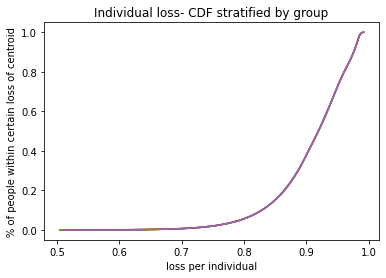

c  {0: (4.71215015947249, 3.896113466951524), 1: (-10.018645003856701, -9.789907438794495), 2: (-11.76215588732286, 6.902300464361643), 3: (9.988408728799179, -4.486718414058521), 4: (-2.688850416303764, 9.204242671652095), 5: (-2.789925291955647, 1.3633615206538705), 6: (3.0373158617745437, 10.078329657170883), 7: (4.744824313582899, -1.928795502629695), 8: (-7.5048163385409445, -6.132532463047276), 9: (7.6738026301288915, 8.371768890224244)}
weights:  [0.199995   0.20000753 0.19999403 0.19999735 0.2000061 ]
Time elapsed Batch Step:  0.36019372940063477
Time elapsed Assignment Step:  2.3453333377838135
0.00037997484729002107
total:  0.6358383472203842


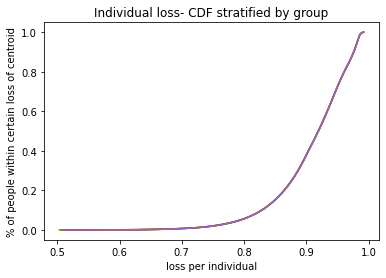

c  {0: (4.711674771154921, 3.8958107055947133), 1: (-10.017180137326983, -9.788483989674962), 2: (-11.760312522265192, 6.90203428981573), 3: (9.98785051954847, -4.485028921991673), 4: (-2.6875035816168578, 9.203007222167436), 5: (-2.7888573012723628, 1.3645737088213261), 6: (3.0362114017613573, 10.077077177445043), 7: (4.744922462370906, -1.927704238479456), 8: (-7.5057825732096815, -6.1344696612491685), 9: (7.672081736692255, 8.37098662061321)}
weights:  [0.19999501 0.20000754 0.19999405 0.19999738 0.20000601]
Time elapsed Batch Step:  0.361539363861084
Time elapsed Assignment Step:  2.312469244003296
0.0003705563029132719
total:  0.6357485575700228


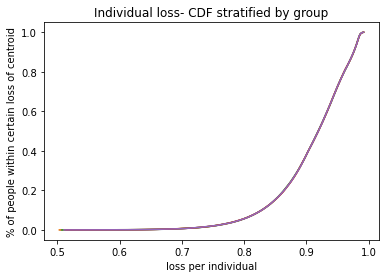

c  {0: (4.711199294850174, 3.8955079205017515), 1: (-10.015714686168012, -9.787059964121173), 2: (-11.758468025417702, 6.901767999613559), 3: (9.98729191628959, -4.483338271583491), 4: (-2.686156086997956, 9.201771192413762), 5: (-2.7877887845995297, 1.365786535921335), 6: (3.0351062256531915, 10.07582405899661), 7: (4.745020694199379, -1.9266126466858495), 8: (-7.506749314554795, -6.136407905140168), 9: (7.670359724936912, 8.370203852035552)}
weights:  [0.19999502 0.20000755 0.19999408 0.19999742 0.20000593]
Time elapsed Batch Step:  0.3520324230194092
Time elapsed Assignment Step:  2.3019838333129883
0.00037019710801622363
total:  0.635661336720907


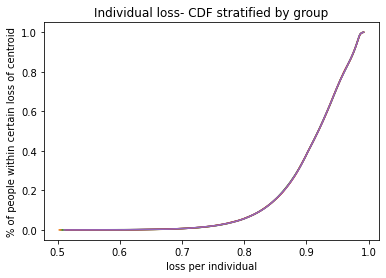

c  {0: (4.710723730523674, 3.8952051117055393), 1: (-10.014248652848842, -9.785635364425898), 2: (-11.756622397205842, 6.901501593985319), 3: (9.986732918901808, -4.481646462603326), 4: (-2.6848079333858146, 9.200534583410343), 5: (-2.786719742313465, 1.3670000016821293), 6: (3.0340003333462793, 10.07457030206126), 7: (4.745119009159492, -1.9255207274705184), 8: (-7.507716561300889, -6.138347192355651), 9: (7.668636595199466, 8.369420584692522)}
weights:  [0.19999503 0.20000757 0.1999941  0.19999745 0.20000585]
Time elapsed Batch Step:  0.34659910202026367
Time elapsed Assignment Step:  2.2772674560546875
0.00037593977785743693
total:  0.6355757969112001


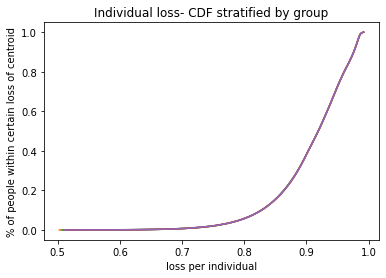

c  {0: (4.710248078140836, 3.8949022792390067), 1: (-10.012782039854182, -9.784210192896502), 2: (-11.75477563806321, 6.9012350731626775), 3: (9.986173527265908, -4.479953494825589), 4: (-2.68345912172644, 9.199297396183743), 5: (-2.7856501747942435, 1.3682141058282182), 6: (3.032893724739709, 10.073315906878122), 7: (4.745217407342483, -1.924428481056193), 8: (-7.508684312161974, -6.140287520510948), 9: (7.666912347824704, 8.368636818789351)}
weights:  [0.19999504 0.20000758 0.19999413 0.19999748 0.20000577]
Time elapsed Batch Step:  0.33766603469848633
Time elapsed Assignment Step:  2.27931809425354
0.0003668089085926418
total:  0.6354856450833616


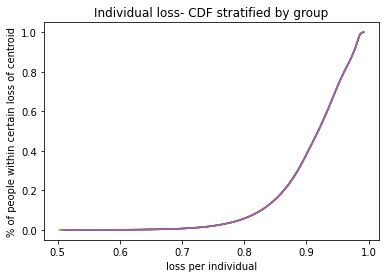

c  {0: (4.709772337667067, 3.894599423135112), 1: (-10.01131484968443, -9.782784451854994), 2: (-11.7529277484316, 6.900968437378775), 3: (9.985613741264208, -4.478259368029775), 4: (-2.6821096529731174, 9.198059631767846), 5: (-2.7845800824257134, 1.3694288480803718), 6: (3.0317863997354415, 10.072060873689793), 7: (4.745315888839657, -1.9233359076666934), 8: (-7.509652565841421, -6.142228887201258), 9: (7.665186983165637, 8.367852554535261)}
weights:  [0.19999505 0.2000076  0.19999416 0.19999751 0.20000569]
Time elapsed Batch Step:  0.3560678958892822
Time elapsed Assignment Step:  2.3485493659973145
0.0003703170270039635
total:  0.6353991339719657


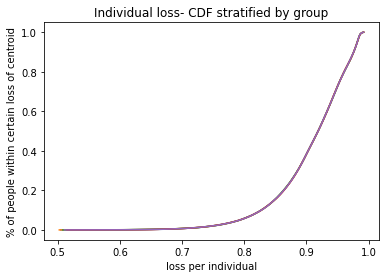

c  {0: (4.709296509067767, 3.8942965434268433), 1: (-10.009847084855718, -9.781358143638066), 2: (-11.751078728761044, 6.900701686868238), 3: (9.985053560780562, -4.4765640820005), 4: (-2.6807595280864374, 9.196821291203879), 5: (-2.783509465595512, 1.3706442281556053), 6: (3.0306783582383243, 10.070805202742351), 7: (4.745414453742384, -1.9222430075269326), 8: (-7.510621321031906, -6.144171290001552), 9: (7.663460501583548, 8.367067792143489)}
weights:  [0.19999506 0.20000761 0.19999418 0.19999754 0.20000561]
Time elapsed Batch Step:  0.339111328125
Time elapsed Assignment Step:  2.256246328353882
0.0003580559320112142
total:  0.635307741961559


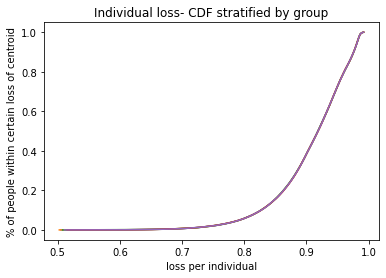

c  {0: (4.708820592308328, 3.893993640147216), 1: (-10.00837874789994, -9.779931270597142), 2: (-11.749228579509852, 6.900434821867182), 3: (9.984492985700372, -4.474867636527533), 4: (-2.6794087480343256, 9.19558237554044), 5: (-2.7824383246950815, 1.3718602457671627), 6: (3.02956960015611, 10.069548894285372), 7: (4.745513102142102, -1.9211497808629179), 8: (-7.511590576415369, -6.146114726466483), 9: (7.661732903448032, 8.366282531831308)}
weights:  [0.19999507 0.20000762 0.19999421 0.19999757 0.20000553]
Time elapsed Batch Step:  0.35863709449768066
Time elapsed Assignment Step:  2.5304880142211914
0.00036266310775412425
total:  0.6352212607487606


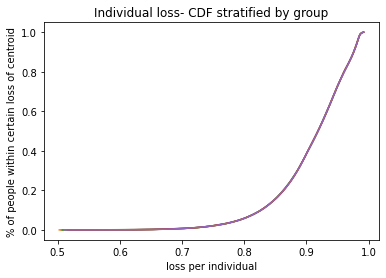

c  {0: (4.708344587354134, 3.893690713329276), 1: (-10.006909841364797, -9.77850383509842), 2: (-11.747377301144667, 6.900167842613217), 3: (9.983932015910602, -4.473170031405822), 4: (-2.6780573137920705, 9.194342885833517), 5: (-2.7813666601196836, 1.3730769006245007), 6: (3.0284601253994707, 10.068291948571947), 7: (4.74561183413031, -1.920056227901754), 8: (-7.512560330662959, -6.148059194130295), 9: (7.6600041891370445, 8.365496773820048)}
weights:  [0.19999508 0.20000764 0.19999423 0.1999976  0.20000545]
Time elapsed Batch Step:  0.5832879543304443
Time elapsed Assignment Step:  3.658440113067627
0.00035668901208329995
total:  0.6351314548650087


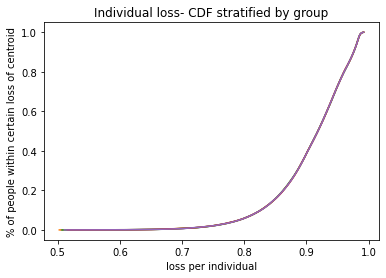

c  {0: (4.70786849417056, 3.893387763006097), 1: (-10.005440367813826, -9.777075839522908), 2: (-11.745524894140502, 6.899900749345451), 3: (9.983370651299783, -4.4714712664355325), 4: (-2.6767052263423516, 9.193102823146521), 5: (-2.780294472268417, 1.374294192433273), 6: (3.027349933882014, 10.06703436585869), 7: (4.745710649798575, -1.9189623488716445), 8: (-7.513530582434989, -6.150004690506727), 9: (7.6582743590369455, 8.364710518335121)}
weights:  [0.19999509 0.20000765 0.19999426 0.19999763 0.20000537]
Time elapsed Batch Step:  0.3451848030090332
Time elapsed Assignment Step:  2.300708770751953
0.0003573458086071346
total:  0.6350443494195881


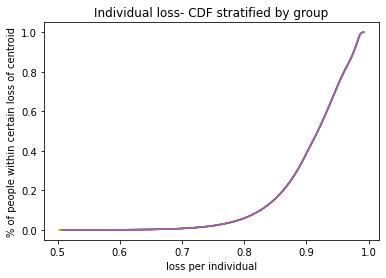

c  {0: (4.7073970273907735, 3.8930877889513296), 1: (-10.003984884657994, -9.775661430358124), 2: (-11.743689710814055, 6.899636187918765), 3: (9.982815514173344, -4.469796898102369), 4: (-2.6753658801373184, 9.191874472061157), 5: (-2.77923238244249, 1.3755000621976692), 6: (3.0262334688222126, 10.065787002024647), 7: (4.745801405591867, -1.9178706291179122), 8: (-7.514491719015084, -6.151931940588112), 9: (7.656565732813855, 8.363937392803685)}
weights:  [0.1999951  0.20000766 0.19999429 0.19999766 0.20000528]
Time elapsed Batch Step:  0.34807252883911133
Time elapsed Assignment Step:  2.31088924407959
0.00035957281223131243
total:  0.6349575672662652


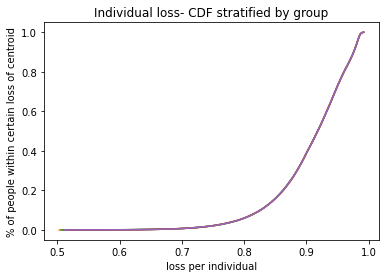

c  {0: (4.706925474052256, 3.892787791919232), 1: (-10.002528850717828, -9.774246476851442), 2: (-11.74185342203769, 6.899371515196303), 3: (9.982259990980884, -4.46812140016244), 4: (-2.674025895537771, 9.190645561385887), 5: (-2.778169780441759, 1.376706555777676), 6: (3.0251162881239484, 10.064538996652503), 7: (4.745892244416753, -1.916778583369997), 8: (-7.515453340665748, -6.153860194192103), 9: (7.6548560150603375, 8.36316378345553)}
weights:  [0.19999511 0.20000768 0.19999431 0.1999977  0.2000052 ]
Time elapsed Batch Step:  0.358597993850708
Time elapsed Assignment Step:  2.348099708557129
0.00034250453887774146
total:  0.6348648484290893


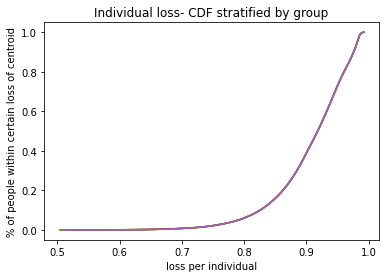

c  {0: (4.706453834121378, 3.89248777194199), 1: (-10.001072268527656, -9.772830981357103), 2: (-11.74001602829702, 6.899106731414525), 3: (9.981704081614398, -4.466444772424878), 4: (-2.6726852735191122, 9.189416092174525), 5: (-2.7771066666648108, 1.3779136728764683), 6: (3.023998391717398, 10.063290349978947), 7: (4.745983166367224, -1.9156862118567093), 8: (-7.516415446054944, -6.155789448845503), 9: (7.653145206147412, 8.362389690509241)}
weights:  [0.19999512 0.20000769 0.19999434 0.19999773 0.20000512]
Time elapsed Batch Step:  0.3457343578338623
Time elapsed Assignment Step:  2.3277525901794434
0.0003420176882017456
total:  0.6347769560689022


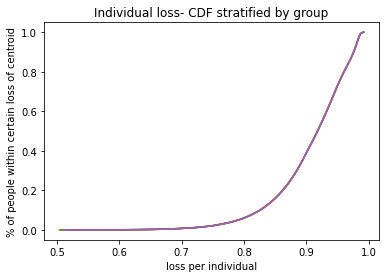

c  {0: (4.705982107564504, 3.8921877290518156), 1: (-9.99961514063715, -9.771414946243747), 2: (-11.738177530085887, 6.898841836811353), 3: (9.98114778596739, -4.4647670147038045), 4: (-2.6713440150639562, 9.18818606548811), 5: (-2.7760430415139807, 1.3791214131935023), 6: (3.0228797795357516, 10.06204106224419), 7: (4.746074171537339, -1.9145935148079625), 8: (-7.517378033840036, -6.1577197020550525), 9: (7.651433306454162, 8.361615114187307)}
weights:  [0.19999513 0.20000771 0.19999437 0.19999776 0.20000504]
Time elapsed Batch Step:  0.34795522689819336
Time elapsed Assignment Step:  2.2676291465759277
0.0003585531462505509
total:  0.6346940222543882


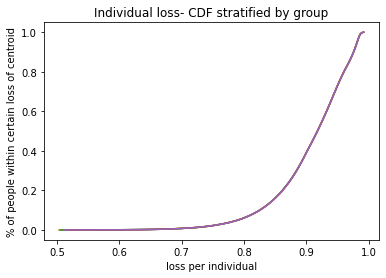

c  {0: (4.70551029434799, 3.89188766328095), 1: (-9.99815746961137, -9.769998373894449), 2: (-11.73633792790639, 6.898576831626174), 3: (9.980591103934882, -4.463088126818365), 4: (-2.670002121162157, 9.186955482394922), 5: (-2.7749789053953644, 1.3803297764245024), 6: (3.0217604515152328, 10.060791133691982), 7: (4.746165260021225, -1.9135004924547763), 8: (-7.518341102667733, -6.159650951307346), 9: (7.649720316367775, 8.360840054716144)}
weights:  [0.19999514 0.20000772 0.19999439 0.19999779 0.20000496]
Time elapsed Batch Step:  0.36295318603515625
Time elapsed Assignment Step:  2.2934625148773193
0.0003577649672784622
total:  0.6346057432886424


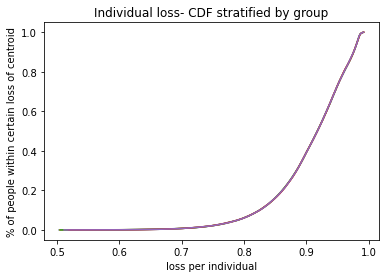

c  {0: (4.705038394438185, 3.8915875746616604), 1: (-9.996699258030786, -9.768581266706763), 2: (-11.73449722226895, 6.89831171609985), 3: (9.980034035413418, -4.461408108592754), 4: (-2.6686595928108354, 9.185724343970518), 5: (-2.773914258718836, 1.3815387622614432), 6: (3.0206404075951125, 10.059540564569632), 7: (4.7462564319130776, -1.9124071450292786), 8: (-7.51930465117405, -6.16158319406874), 9: (7.648006236283586, 8.360064512326117)}
weights:  [0.19999515 0.20000773 0.19999442 0.19999782 0.20000488]
Time elapsed Batch Step:  0.34343433380126953
Time elapsed Assignment Step:  2.2676446437835693
0.000352686855885076
total:  0.6345160286087771


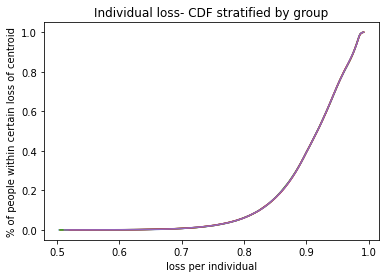

c  {0: (4.7045664078014315, 3.8912874632262433), 1: (-9.995240508491314, -9.767163627092758), 2: (-11.732655413692333, 6.898046490474717), 3: (9.97947658030108, -4.459726959856251), 4: (-2.667316431014406, 9.18449265129775), 5: (-2.7728491018980614, 1.3827483703925358), 6: (3.0195196477177264, 10.058289355128016), 7: (4.746347687307156, -1.9113134727647074), 8: (-7.520268677984254, -6.163516427785266), 9: (7.646291066605121, 8.359288487251556)}
weights:  [0.19999516 0.20000775 0.19999444 0.19999785 0.20000479]
Time elapsed Batch Step:  0.35535454750061035
Time elapsed Assignment Step:  2.2848269939422607
0.0003477215613787443
total:  0.6344261914968363


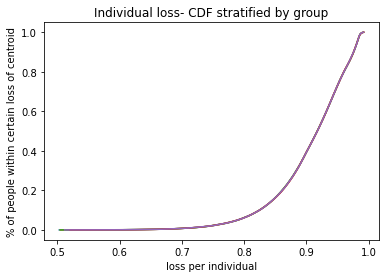

c  {0: (4.704087700098409, 3.890992053629993), 1: (-9.99378122360434, -9.76574545747906), 2: (-11.730812502703712, 6.897781154994594), 3: (9.978918738497494, -4.4580446804432485), 4: (-2.665972636784606, 9.183260405466784), 5: (-2.771783435350514, 1.3839586005022104), 6: (3.018398171828491, 10.0570375056216), 7: (4.746442516003681, -1.9102202807974615), 8: (-7.521233181712822, -6.1654506498825405), 9: (7.6445748077441396, 8.358511979730784)}
weights:  [0.19999517 0.20000776 0.19999447 0.19999789 0.20000471]
Time elapsed Batch Step:  0.3435704708099365
Time elapsed Assignment Step:  2.3703348636627197
0.0003562068691954634
total:  0.6343402411013341


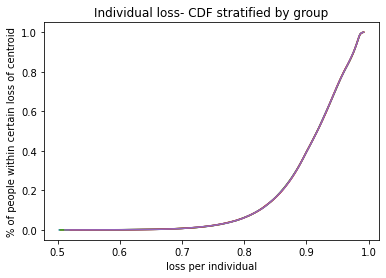

c  {0: (4.703608902397652, 3.8906966212730354), 1: (-9.992321405996753, -9.764326760306888), 2: (-11.728968489838703, 6.8975157099047895), 3: (9.978360509903844, -4.456361270193284), 4: (-2.664628211140521, 9.182027607575131), 5: (-2.770717259497491, 1.3851694522711016), 6: (3.017275979875921, 10.05578501630845), 7: (4.746537430824162, -1.9091267622271217), 8: (-7.52219816096339, -6.167385857765675), 9: (7.642857460120678, 8.35773499000613)}
weights:  [0.19999518 0.20000777 0.1999945  0.19999792 0.20000463]
Time elapsed Batch Step:  0.3470456600189209
Time elapsed Assignment Step:  2.305901050567627
0.0003517707922389146
total:  0.6342502653074168


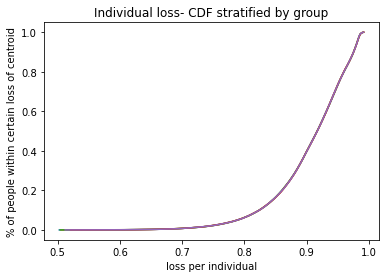

c  {0: (4.7031300146636, 3.8904011661870435), 1: (-9.990861058310967, -9.762907538032094), 2: (-11.727123375641412, 6.897250155452102), 3: (9.977801894422877, -4.454676728951071), 4: (-2.6632831551086147, 9.180794258727667), 5: (-2.769650574764127, 1.3863809253760315), 6: (3.0161530718116465, 10.054531887450251), 7: (4.746632431865366, -1.9080329172837276), 8: (-7.523163614328706, -6.1693220488191844), 9: (7.641139024163093, 8.356957518323954)}
weights:  [0.19999519 0.20000779 0.19999452 0.19999795 0.20000454]
Time elapsed Batch Step:  0.36791276931762695
Time elapsed Assignment Step:  2.3014159202575684
0.0003572927306784157
total:  0.63416312764902


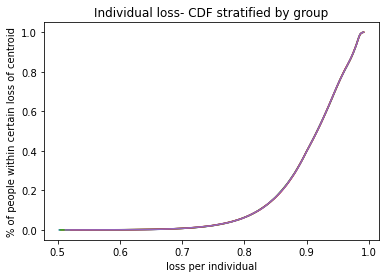

c  {0: (4.7026510368606855, 3.8901056884037177), 1: (-9.989400183204957, -9.7614877931252), 2: (-11.72527716066448, 6.896984491884831), 3: (9.977242891958916, -4.45299105656653), 4: (-2.6619374697227545, 9.179560360036657), 5: (-2.7685833815794108, 1.3875930194899952), 6: (3.0150294475904276, 10.05327811931232), 7: (4.746727519224123, -1.9069387461984284), 8: (-7.524129540390588, -6.171259220406903), 9: (7.639419500308106, 8.35617956493467)}
weights:  [0.1999952  0.2000078  0.19999455 0.19999798 0.20000446]
Time elapsed Batch Step:  0.34821319580078125
Time elapsed Assignment Step:  2.320042848587036
0.00034982569046670964
total:  0.6340719446934195


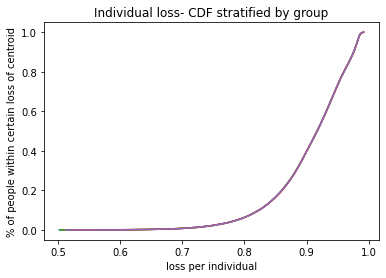

c  {0: (4.7021719689533334, 3.889810187954786), 1: (-9.987938783352279, -9.760067528071435), 2: (-11.72342984546913, 6.896718719452777), 3: (9.976683502417874, -4.451304252894821), 4: (-2.660591156024241, 9.178325912621782), 5: (-2.7675156803762007, 1.3888057342821438), 6: (3.013905107170174, 10.052023712163628), 7: (4.746822692997335, -1.905844249203485), 8: (-7.525095937719865, -6.173197369871885), 9: (7.6376988890008475, 8.355401130092762)}
weights:  [0.19999521 0.20000781 0.19999458 0.19999802 0.20000438]
Time elapsed Batch Step:  0.33673715591430664
Time elapsed Assignment Step:  2.355060577392578
0.00035473653154893814
total:  0.6339843834562323


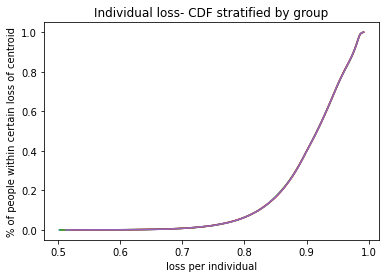

c  {0: (4.70169337562426, 3.8895123860475196), 1: (-9.9864768614421, -9.758646745370777), 2: (-11.721581430625214, 6.896452838407251), 3: (9.976123725707255, -4.449616317796375), 4: (-2.6592442150618343, 9.177090917610158), 5: (-2.7664522983064526, 1.3900127146506722), 6: (3.0127800505119597, 10.050768666276804), 7: (4.7469179532819705, -1.9047494265322733), 8: (-7.526062804876341, -6.175136494536325), 9: (7.635977190694898, 8.354622214056805)}
weights:  [0.19999523 0.20000783 0.1999946  0.19999805 0.2000043 ]
Time elapsed Batch Step:  0.3390514850616455
Time elapsed Assignment Step:  2.3379876613616943
0.00034342912193707775
total:  0.6338918071941818


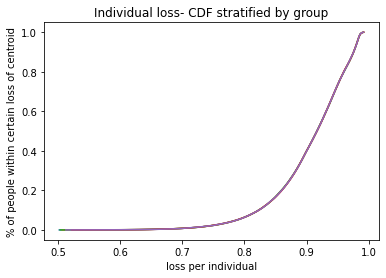

c  {0: (4.701214692887276, 3.88921456078309), 1: (-9.985014420179219, -9.757225447537984), 2: (-11.719731916711256, 6.896186849001078), 3: (9.975563561736173, -4.447927251136924), 4: (-2.657896647891784, 9.175855376136363), 5: (-2.7653884118752776, 1.3912203106218903), 6: (3.0116542775800417, 10.049512981928167), 7: (4.747013300175065, -1.9036542784192856), 8: (-7.527030140408741, -6.177076591701459), 9: (7.634254405852334, 8.353842817089493)}
weights:  [0.19999524 0.20000784 0.19999463 0.19999808 0.20000421]
Time elapsed Batch Step:  0.34970784187316895
Time elapsed Assignment Step:  2.2696964740753174
0.0003360229779150181
total:  0.6338002516419425


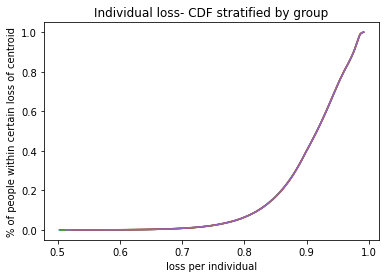

c  {0: (4.700735920707393, 3.888916712193366), 1: (-9.983551462284096, -9.755803637102636), 2: (-11.717881304314496, 6.8959207514886005), 3: (9.975003010415358, -4.4462370527875335), 4: (-2.656548455577855, 9.174619289342461), 5: (-2.764324021513958, 1.3924285218651686), 6: (3.0105277883418755, 10.048256659397728), 7: (4.747108733773723, -1.9025588051001336), 8: (-7.527997942854665, -6.179017658647477), 9: (7.632530534943775, 8.35306293945765)}
weights:  [0.19999525 0.20000785 0.19999466 0.19999811 0.20000413]
Time elapsed Batch Step:  0.3448808193206787
Time elapsed Assignment Step:  2.3056371212005615
0.0003251476629180239
total:  0.6337075060419324


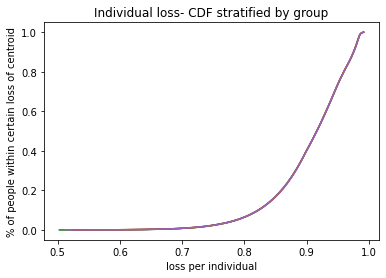

c  {0: (4.7002570590496155, 3.8886188403102433), 1: (-9.982087990492875, -9.754381316609168), 2: (-11.716029594030942, 6.89565454612569), 3: (9.974442071657165, -4.444545722624638), 4: (-2.6551996391913573, 9.173382658378022), 5: (-2.7632591276576166, 1.3936373480460615), 6: (3.009400582768133, 10.046999698969213), 7: (4.7472042541751165, -1.9014630068115508), 8: (-7.5289662107405375, -6.180959692633434), 9: (7.630805578448421, 8.352282581432263)}
weights:  [0.19999526 0.20000786 0.19999469 0.19999814 0.20000405]
Time elapsed Batch Step:  0.354034423828125
Time elapsed Assignment Step:  2.320951461791992
0.00032293101533575896
total:  0.6336172085284498


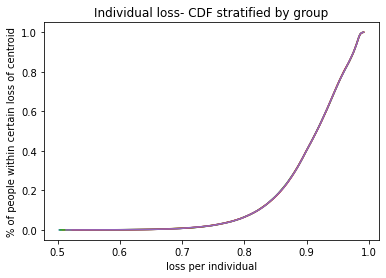

c  {0: (4.699778107878942, 3.888320945165645), 1: (-9.980624007557406, -9.75295848861691), 2: (-11.714176786465417, 6.895388233169746), 3: (9.97388074537559, -4.442853260530068), 4: (-2.6538501998111728, 9.172145484400152), 5: (-2.7621937307452336, 1.3948467888262925), 6: (3.008272660832721, 10.045742100930077), 7: (4.747299861476482, -1.9003668837913945), 8: (-7.529934942581566, -6.182902690897155), 9: (7.629079536854106, 8.351501743288491)}
weights:  [0.19999527 0.20000788 0.19999472 0.19999817 0.20000397]
Time elapsed Batch Step:  0.37159204483032227
Time elapsed Assignment Step:  2.3197708129882812
0.0003227853018138438
total:  0.6335273823821319


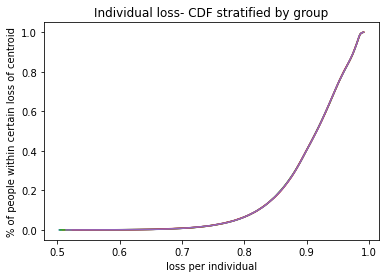

c  {0: (4.699299067160362, 3.8880230267915232), 1: (-9.979159516245266, -9.75153515570012), 2: (-11.7123228822316, 6.8951218128797045), 3: (9.973319031486273, -4.441159666391086), 4: (-2.652500138523784, 9.170907768573514), 5: (-2.76112783121966, 1.3960568438637377), 6: (3.0071440225127946, 10.044483865571523), 7: (4.747395555775124, -1.8992704362786488), 8: (-7.530904136881684, -6.184846650655149), 9: (7.627352410657334, 8.350720425305697)}
weights:  [0.19999528 0.20000789 0.19999475 0.1999982  0.20000388]
Time elapsed Batch Step:  0.36476993560791016
Time elapsed Assignment Step:  2.335764169692993
0.00033191326582693303
total:  0.6334401880001632


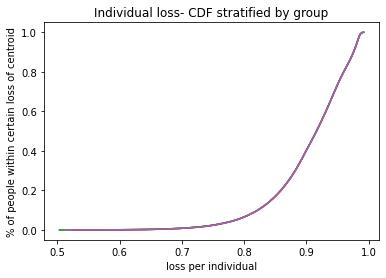

c  {0: (4.698819936858859, 3.887725085219856), 1: (-9.977694519339785, -9.750111320448022), 2: (-11.710467881952075, 6.894855285516042), 3: (9.972756929906515, -4.439464940100418), 4: (-2.6511494564233016, 9.16966951207035), 5: (-2.760061429527634, 1.3972675128124101), 6: (3.0060146677887793, 10.043224993188513), 7: (4.747491337168412, -1.8981736645134264), 8: (-7.531873792133513, -6.186791569102511), 9: (7.62562420036333, 8.349938627767463)}
weights:  [0.19999529 0.2000079  0.19999478 0.19999824 0.2000038 ]
Time elapsed Batch Step:  0.34558987617492676
Time elapsed Assignment Step:  2.358444929122925
0.00032864673177690484
total:  0.633349125804382


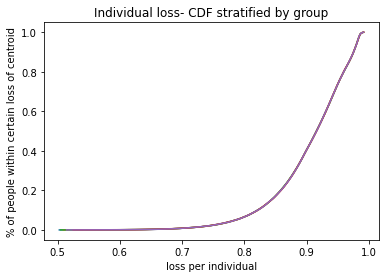

c  {0: (4.698340716939411, 3.8874271204826507), 1: (-9.976229019640066, -9.74868698546484), 2: (-11.708611786258382, 6.894588651340783), 3: (9.972194440555285, -4.437769081556285), 4: (-2.649798154611494, 9.168430716070507), 5: (-2.758994526119796, 1.3984787953224438), 6: (3.004884596644385, 10.041965484079787), 7: (4.747587205753785, -1.8970765687369717), 8: (-7.532843906818305, -6.1887374434128395), 9: (7.623894906486083, 8.349156350961612)}
weights:  [0.1999953  0.20000791 0.1999948  0.19999827 0.20000372]
Time elapsed Batch Step:  0.38002657890319824
Time elapsed Assignment Step:  2.334528923034668
0.00033941843842955066
total:  0.633262124903101


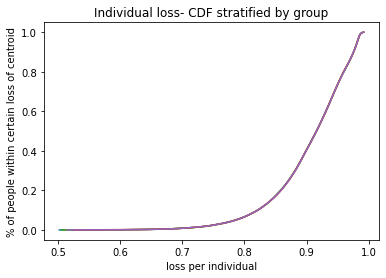

c  {0: (4.697861407366985, 3.8871291326119413), 1: (-9.974763019961001, -9.747262153369832), 2: (-11.706754595791061, 6.894321910617505), 3: (9.971631563353233, -4.436072090662436), 4: (-2.6484462341978148, 9.167191381761462), 5: (-2.7579271214507055, 1.3996906910400777), 6: (3.003753809066625, 10.040705338547882), 7: (4.747683161628744, -1.8959791491916627), 8: (-7.5338144794059, -6.190684270738136), 9: (7.62216452954839, 8.348373595180234)}
weights:  [0.19999531 0.20000792 0.19999483 0.1999983  0.20000364]
Time elapsed Batch Step:  0.36133337020874023
Time elapsed Assignment Step:  2.3259153366088867
0.000343288696383226
total:  0.6331728946002664


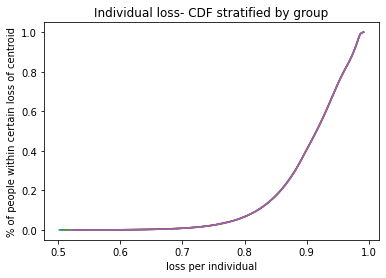

c  {0: (4.697375327391258, 3.886836299572244), 1: (-9.973296523133294, -9.745836826797328), 2: (-11.704896311199699, 6.894055063611342), 3: (9.971068298222697, -4.434373967328184), 4: (-2.647093696299432, 9.165951510338346), 5: (-2.756859215978854, 1.4009031996076402), 6: (3.0026223050458323, 10.039444556899142), 7: (4.747782469671338, -1.8948817558951432), 8: (-7.5347855083546795, -6.1926320482087185), 9: (7.620433070081904, 8.347590360719703)}
weights:  [0.19999532 0.20000794 0.19999486 0.19999833 0.20000356]
Time elapsed Batch Step:  0.35213613510131836
Time elapsed Assignment Step:  2.3730082511901855
0.00033263678566031185
total:  0.6330791574760682


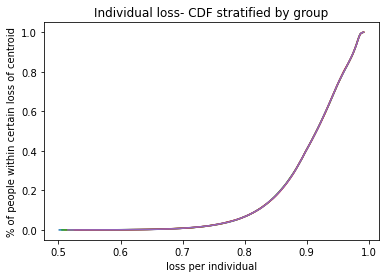

c  {0: (4.6968891543117, 3.886543443525463), 1: (-9.971829532003483, -9.744411008396764), 2: (-11.703036933142979, 6.893788110588994), 3: (9.970504645087718, -4.432674711468434), 4: (-2.645740542041254, 9.164711103003965), 5: (-2.7557908101666824, 1.4021163206635323), 6: (3.0014900845756785, 10.03818313944374), 7: (4.7478818675269325, -1.8937840365827143), 8: (-7.535756992111511, -6.194580772933129), 9: (7.618700528627179, 8.346806647880701)}
weights:  [0.19999533 0.20000795 0.19999489 0.19999836 0.20000347]
Time elapsed Batch Step:  0.4124600887298584
Time elapsed Assignment Step:  2.481975555419922
0.0003315126974523519
total:  0.6329881278957481


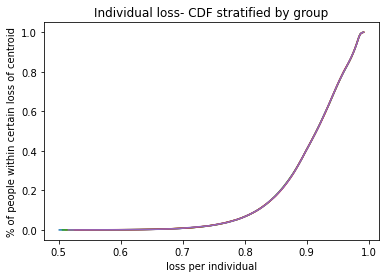

c  {0: (4.696402888091239, 3.886250564502869), 1: (-9.970362049433948, -9.742984700832713), 2: (-11.701176462288732, 6.893521051818728), 3: (9.969940603874047, -4.430974323003722), 4: (-2.6443867725559618, 9.163470160968826), 5: (-2.754721904480597, 1.4033300538422118), 6: (3.0003571476531907, 10.036921086495694), 7: (4.747981355295519, -1.8926859914934182), 8: (-7.536728929111707, -6.196530441998042), 9: (7.616966905733713, 8.346022456968239)}
weights:  [0.19999534 0.20000796 0.19999491 0.19999839 0.20000339]
Time elapsed Batch Step:  0.37718868255615234
Time elapsed Assignment Step:  2.3648722171783447
0.0003285688014356136
total:  0.6328964014324538


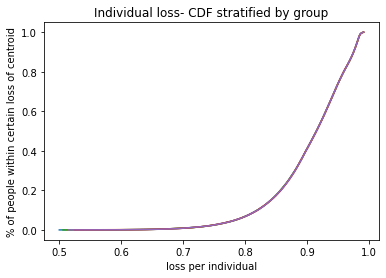

c  {0: (4.695916528692794, 3.8859576625357595), 1: (-9.968894078302938, -9.74155790678492), 2: (-11.699314899313979, 6.8932538875703875), 3: (9.96937617450916, -4.429272801860243), 4: (-2.6430323889840346, 9.162228685451163), 5: (-2.7536524993909834, 1.4045443987741775), 6: (2.999223494278769, 10.03565839837288), 7: (4.748080933077156, -1.8915876208674312), 8: (-7.537701317778971, -6.198481052468169), 9: (7.615232201959996, 8.345237788291678)}
weights:  [0.19999535 0.20000797 0.19999494 0.19999842 0.20000331]
Time elapsed Batch Step:  0.39414191246032715
Time elapsed Assignment Step:  2.496711254119873
0.0003167764505693782
total:  0.6328018702484688


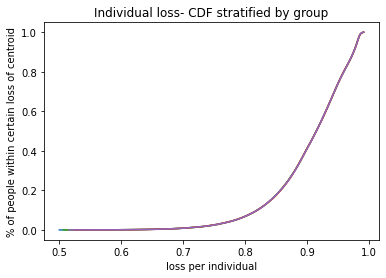

c  {0: (4.695430076079278, 3.88566473765546), 1: (-9.96742562150458, -9.740130628948336), 2: (-11.697452244904982, 6.892986618115397), 3: (9.968811356922261, -4.427570147969888), 4: (-2.6416773924737798, 9.16098667767696), 5: (-2.752582595372223, 1.4057593550859526), 6: (2.9980891244562056, 10.034395075397049), 7: (4.748180600971969, -1.8904889249460664), 8: (-7.5386741565253566, -6.200432601386169), 9: (7.613496417873557, 8.344452642164754)}
weights:  [0.19999537 0.20000799 0.19999497 0.19999845 0.20000322]
Time elapsed Batch Step:  0.37642955780029297
Time elapsed Assignment Step:  2.4586706161499023
0.0003238884539235043
total:  0.6327128606206708


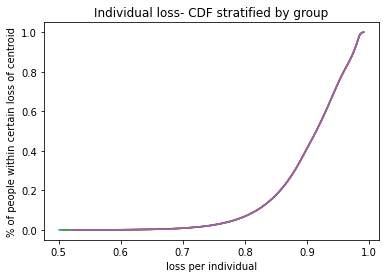

c  {0: (4.694943530213597, 3.8853717898933233), 1: (-9.9659566819489, -9.738702870033151), 2: (-11.695588499757292, 6.892719243726766), 3: (9.968246151044305, -4.425866361270276), 4: (-2.6403217841813613, 9.15974413887997), 5: (-2.751512192902709, 1.4069749224000685), 6: (2.9969540381927002, 10.033131117893848), 7: (4.748280359080151, -1.889389903971776), 8: (-7.5396474437512095, -6.2023850857725575), 9: (7.611759554051008, 8.343667018905595)}
weights:  [0.19999538 0.200008   0.199995   0.19999848 0.20000314]
Time elapsed Batch Step:  0.3440408706665039
Time elapsed Assignment Step:  2.370433807373047
0.00031464230354905087
total:  0.6326187926465107


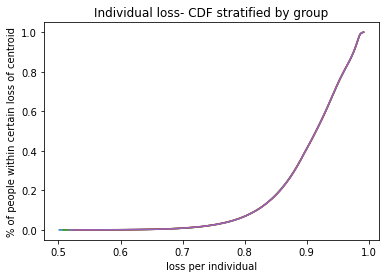

c  {0: (4.694456891058648, 3.8850788192807295), 1: (-9.964487262561832, -9.737274632764828), 2: (-11.693723664575801, 6.892451764679098), 3: (9.967680556807998, -4.424161441704788), 4: (-2.638965565270828, 9.158501070301751), 5: (-2.7504412924648616, 1.4081911003350487), 6: (2.9958182354988803, 10.031866526192834), 7: (4.74838020750196, -1.8882905581881546), 8: (-7.540621177845128, -6.204338502625611), 9: (7.610021611078092, 8.34288091883675)}
weights:  [0.19999539 0.20000801 0.19999503 0.19999851 0.20000305]
Time elapsed Batch Step:  0.3596320152282715
Time elapsed Assignment Step:  2.307676076889038
0.0003032485239311544
total:  0.6325239256721628


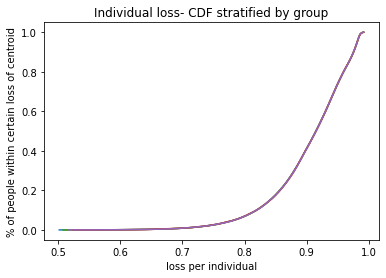

c  {0: (4.693963023608979, 3.8847897128963873), 1: (-9.963017366285237, -9.735845919884133), 2: (-11.691857740074788, 6.8921841812485924), 3: (9.967114574147814, -4.422455389222602), 4: (-2.637608736914143, 9.15725747319168), 5: (-2.749369894545145, 1.4094078885053924), 6: (2.994681716388818, 10.030601300627486), 7: (4.748483811497129, -1.887192927569475), 8: (-7.541595357183908, -6.206292848921277), 9: (7.608282589549729, 8.342094342285204)}
weights:  [0.1999954  0.20000803 0.19999506 0.19999854 0.20000297]
Time elapsed Batch Step:  0.34899473190307617
Time elapsed Assignment Step:  2.3221566677093506
0.00028478772214213244
total:  0.632426787778109


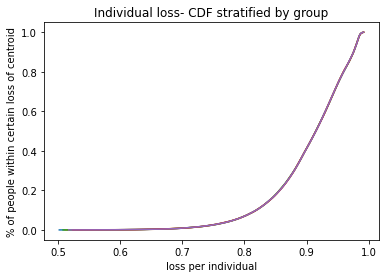

c  {0: (4.693469059757417, 3.884500583268228), 1: (-9.961546996076914, -9.734416734147164), 2: (-11.689990726977967, 6.891916493713053), 3: (9.966548203000004, -4.420748203778725), 4: (-2.636251300291213, 9.156013348806976), 5: (-2.748297999634081, 1.410625286521558), 6: (2.9935444808800478, 10.029335441535228), 7: (4.748587508370271, -1.8860949716227973), 8: (-7.542569980132501, -6.208248121613077), 9: (7.606542490070062, 8.341307289582407)}
weights:  [0.19999541 0.20000804 0.19999509 0.19999857 0.20000289]
Time elapsed Batch Step:  0.3608102798461914
Time elapsed Assignment Step:  2.3372857570648193
0.0002714035319790753
total:  0.632331021266761


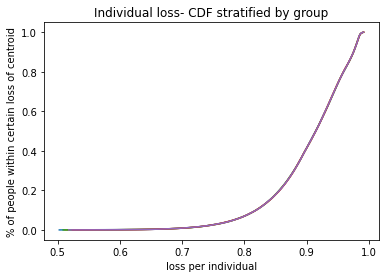

c  {0: (4.692974999465195, 3.8842114304271527), 1: (-9.960076154910604, -9.732987078325388), 2: (-11.688122626018544, 6.891648702351893), 3: (9.965981443302605, -4.419039885334032), 4: (-2.634893256589914, 9.154768698412735), 5: (-2.747225608226267, 1.4118432939899468), 6: (2.992406528993586, 10.028068949257445), 7: (4.7486912982237905, -1.8849966905888007), 8: (-7.543545045043957, -6.210204317632019), 9: (7.604801313252504, 8.34051976106429)}
weights:  [0.19999542 0.20000805 0.19999512 0.1999986  0.2000028 ]
Time elapsed Batch Step:  0.34235501289367676
Time elapsed Assignment Step:  2.2705531120300293
0.00027901510545846886
total:  0.6322414017729591


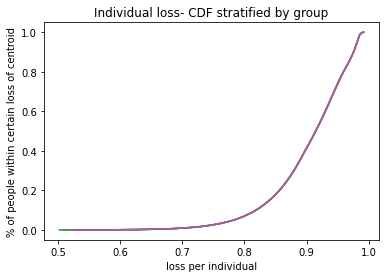

c  {0: (4.692480842693534, 3.8839222544040903), 1: (-9.958604845776014, -9.731556955205672), 2: (-11.686253437939255, 6.891380807446143), 3: (9.965414294995458, -4.417330433855293), 4: (-2.6335346070061254, 9.153523523281944), 5: (-2.746152720820391, 1.4130619105128865), 6: (2.991267860753948, 10.026801824139497), 7: (4.748795181160162, -1.8838980847093019), 8: (-7.544520550259385, -6.212161433886502), 9: (7.6030590597197865, 8.339731757071288)}
weights:  [0.19999543 0.20000807 0.19999515 0.19999863 0.20000272]
Time elapsed Batch Step:  0.3486745357513428
Time elapsed Assignment Step:  2.32247257232666
0.0002907528972426743
total:  0.6321528688673277


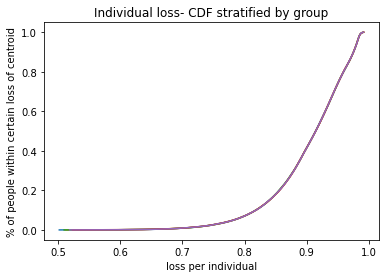

c  {0: (4.691986589403653, 3.883633055229998), 1: (-9.957133071678818, -9.730126367590309), 2: (-11.68438316349243, 6.891112809278451), 3: (9.964846758020212, -4.415619849315214), 4: (-2.6321753527437544, 9.152277824695512), 5: (-2.745079337919247, 1.414281135688615), 6: (2.990128476189165, 10.025534066530739), 7: (4.748899157281925, -1.8827991542272564), 8: (-7.545496494107899, -6.21411946726222), 9: (7.601315730104005, 8.33894327794837)}
weights:  [0.19999544 0.20000808 0.19999518 0.19999866 0.20000263]
Time elapsed Batch Step:  0.35825014114379883
Time elapsed Assignment Step:  2.2823352813720703
0.0002897189080472984
total:  0.6320603537808878


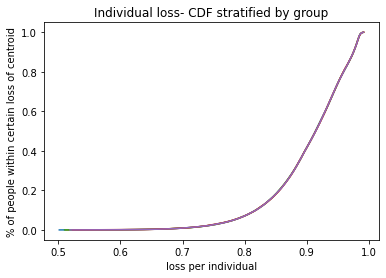

c  {0: (4.691492239556759, 3.88334383293586), 1: (-9.955660835640668, -9.728695318297047), 2: (-11.68251180344003, 6.890844708133096), 3: (9.964278832320339, -4.41390813169247), 4: (-2.630815495014767, 9.15103160394229), 5: (-2.7440054600297525, 1.4155009691112628), 6: (2.988988375330805, 10.024265676784534), 7: (4.749003226691686, -1.881699899386762), 8: (-7.54647287490657, -6.216078414622075), 9: (7.599571325046668, 8.338154324045055)}
weights:  [0.19999545 0.20000809 0.19999521 0.19999869 0.20000254]
Time elapsed Batch Step:  0.3747076988220215
Time elapsed Assignment Step:  2.271810531616211
0.0002744134804147924
total:  0.631963406161631


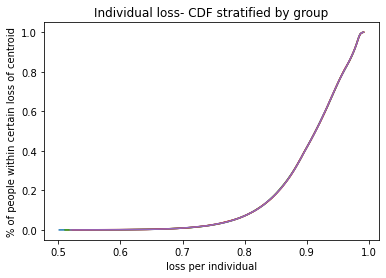

c  {0: (4.690997793114054, 3.8830545875526874), 1: (-9.954188140699202, -9.72726381015913), 2: (-11.680639358553705, 6.890576504295987), 3: (9.963710517841145, -4.412195280971739), 4: (-2.6294550350392174, 9.149784862319096), 5: (-2.7429310876629636, 1.4167214103708377), 6: (2.987847558213991, 10.022996655258275), 7: (4.749107389492116, -1.8806003204330601), 8: (-7.547449690960381, -6.218038272806077), 9: (7.597825845198741, 8.337364895715432)}
weights:  [0.19999546 0.20000811 0.19999524 0.19999872 0.20000246]
Time elapsed Batch Step:  0.3587357997894287
Time elapsed Assignment Step:  2.322350025177002
0.0002890907744963478
total:  0.6318753020438614


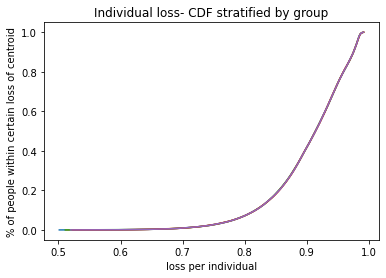

c  {0: (4.690503250036731, 3.88276531911152), 1: (-9.952714989908053, -9.72583184602531), 2: (-11.678765829614843, 6.890308198054673), 3: (9.963141814529779, -4.410481297143734), 4: (-2.6280939740452753, 9.148537601130744), 5: (-2.7418562213340905, 1.4179424590532075), 6: (2.9867060248774164, 10.021727002313396), 7: (4.749211645785953, -1.8795004176125396), 8: (-7.548426940562173, -6.219999038631257), 9: (7.596079291220697, 8.336574993318186)}
weights:  [0.19999548 0.20000812 0.19999528 0.19999875 0.20000237]
Time elapsed Batch Step:  0.36454081535339355
Time elapsed Assignment Step:  2.306321620941162
0.00028933330554514747
total:  0.63178271641644


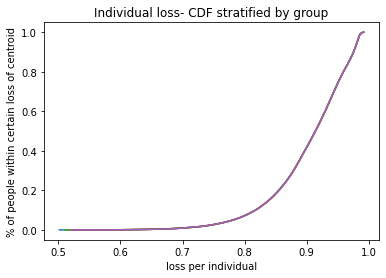

c  {0: (4.690008610285978, 3.882476027643425), 1: (-9.951241386336852, -9.724399428759892), 2: (-11.67689121741462, 6.890039789698349), 3: (9.962572722335247, -4.408766180205247), 4: (-2.6267323132692573, 9.147289821690062), 5: (-2.740780861562514, 1.4191641147400835), 6: (2.985563775363367, 10.020456718315396), 7: (4.749315995675996, -1.878400191172738), 8: (-7.549404621992601, -6.221960708891568), 9: (7.594331663782565, 8.335784617216625)}
weights:  [0.19999549 0.20000813 0.19999531 0.19999878 0.20000229]
Time elapsed Batch Step:  0.33567261695861816
Time elapsed Assignment Step:  2.325425148010254
0.00028798690269782323
total:  0.6316895023211847


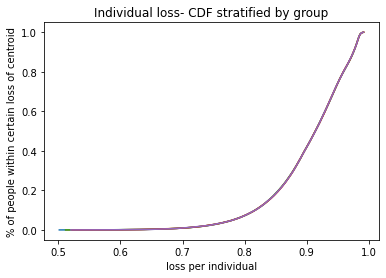

c  {0: (4.689513873822973, 3.8821867131794967), 1: (-9.949767333071236, -9.72296656124275), 2: (-11.675015522754057, 6.889771279517861), 3: (9.962003241208427, -4.407049930159175), 4: (-2.6253700539556544, 9.14604152531792), 5: (-2.7397050088718036, 1.4203863770090035), 6: (2.984420809717737, 10.019185803633848), 7: (4.749420439265113, -1.8772996413623444), 8: (-7.550382733520085, -6.223923280357793), 9: (7.592582963563977, 8.334993767778698)}
weights:  [0.1999955  0.20000815 0.19999534 0.19999881 0.2000022 ]
Time elapsed Batch Step:  0.3543124198913574
Time elapsed Assignment Step:  2.3305888175964355
0.00028239425786458217
total:  0.6315948630369184


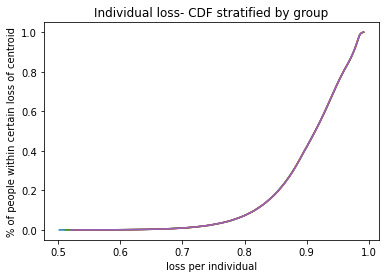

c  {0: (4.689019040608888, 3.881897375750857), 1: (-9.948292833212848, -9.721533246369363), 2: (-11.673138746444058, 6.88950266780571), 3: (9.96143337110207, -4.405332547014561), 4: (-2.624007197357162, 9.144792713343252), 5: (-2.73862866378973, 1.4216092454333153), 6: (2.98327712799005, 10.017914258642424), 7: (4.749524976656235, -1.8761987684312025), 8: (-7.551361273400756, -6.2258867497774535), 9: (7.590833191254215, 8.334202445377016)}
weights:  [0.19999551 0.20000816 0.19999537 0.19999884 0.20000212]
Time elapsed Batch Step:  0.3516838550567627
Time elapsed Assignment Step:  2.2963035106658936
0.00031002127194312834
total:  0.6315100368392768


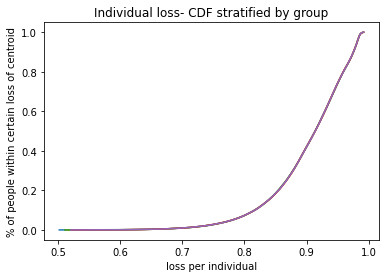

c  {0: (4.688524110604888, 3.881608015388656), 1: (-9.946817889879345, -9.720099487050838), 2: (-11.671260889305476, 6.889233954856062), 3: (9.96086311197082, -4.403614030786628), 4: (-2.622643744734708, 9.143543387103085), 5: (-2.737551826848285, 1.4228327195821595), 6: (2.982132730233475, 10.016642083718908), 7: (4.749629607952357, -1.8750975726303123), 8: (-7.552340239878417, -6.2278511138747135), 9: (7.58908234755226, 8.333410650388878)}
weights:  [0.19999552 0.20000818 0.1999954  0.19999887 0.20000203]
Time elapsed Batch Step:  0.3514993190765381
Time elapsed Assignment Step:  2.282891273498535
0.0003112796810742502
total:  0.6314171468830861


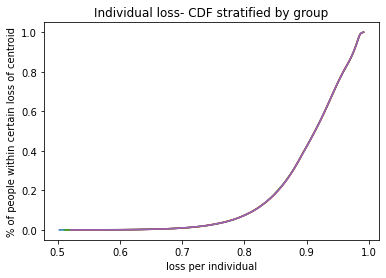

c  {0: (4.68802908377213, 3.881318632124071), 1: (-9.945342506204396, -9.718665286213938), 2: (-11.669381952169154, 6.888965140964752), 3: (9.960292463771227, -4.401894381496812), 4: (-2.6212796973574846, 9.142293547942561), 5: (-2.7364744985836946, 1.4240567990204533), 6: (2.9809876165048483, 10.015369279245213), 7: (4.749734333256536, -1.8739960542118328), 8: (-7.553319631184484, -6.229816369350285), 9: (7.587330433166841, 8.332618383196293)}
weights:  [0.19999553 0.20000819 0.19999544 0.1999989  0.20000195]
Time elapsed Batch Step:  0.3435404300689697
Time elapsed Assignment Step:  2.3824141025543213
0.0002951220945397459
total:  0.6313188792003335


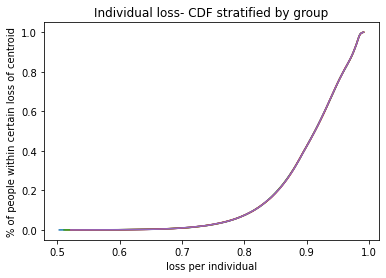

c  {0: (4.6875339600717645, 3.881029225988307), 1: (-9.943866685337687, -9.717230646801108), 2: (-11.667501935875986, 6.888696226429289), 3: (9.959721426461751, -4.400173599172806), 4: (-2.6199150565029736, 9.141043197214959), 5: (-2.7353966795364384, 1.4252814833088727), 6: (2.9798417868646894, 10.0140958456074), 7: (4.749839152671896, -1.8728942134290845), 8: (-7.554299445537948, -6.231782512881336), 9: (7.5855774488164815, 8.331825644186006)}
weights:  [0.19999554 0.2000082  0.19999547 0.19999892 0.20000186]
Time elapsed Batch Step:  0.41927194595336914
Time elapsed Assignment Step:  2.365386486053467
0.0002961505161701572
total:  0.6312256277614855


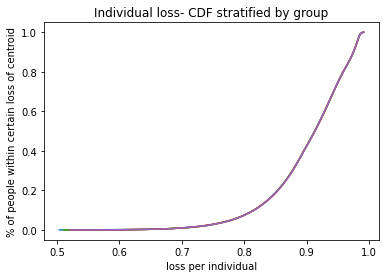

c  {0: (4.687032159892432, 3.88072793526958), 1: (-9.942390430444915, -9.715795571770503), 2: (-11.665620841276963, 6.888427211548866), 3: (9.959150000002783, -4.398451683848587), 4: (-2.61854982345698, 9.139792336281722), 5: (-2.7343183702512635, 1.4265067720038365), 6: (2.9786952413772214, 10.012821783195694), 7: (4.749944066301621, -1.871792050536552), 8: (-7.555279681145317, -6.2337495411213935), 9: (7.583831197750031, 8.331030222402298)}
weights:  [0.19999555 0.20000822 0.19999551 0.19999895 0.20000177]
Time elapsed Batch Step:  0.344357967376709
Time elapsed Assignment Step:  2.2922191619873047
0.0002848094503886678
total:  0.6311285316885575


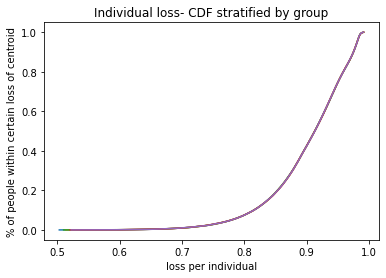

c  {0: (4.6865252206606485, 3.8804150648955225), 1: (-9.940913744707792, -9.714360064096008), 2: (-11.663738669233226, 6.888158096624361), 3: (9.958578184356647, -4.396728635564458), 4: (-2.6171839995136588, 9.138540966512485), 5: (-2.733239571277202, 1.4277326646574884), 6: (2.97754798011039, 10.011547092404502), 7: (4.75004907424896, -1.8706895657898865), 8: (-7.556260336200572, -6.235717450700253), 9: (7.582091111877242, 8.330235013240811)}
weights:  [0.19999556 0.20000823 0.19999554 0.19999898 0.20000169]
Time elapsed Batch Step:  0.34908604621887207
Time elapsed Assignment Step:  2.264366865158081
0.0002946928163534146
total:  0.631037649834676


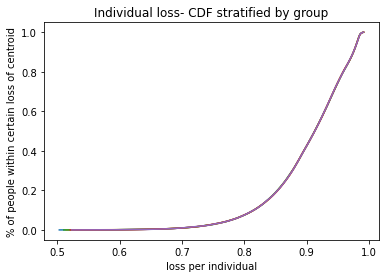

c  {0: (4.686018179099605, 3.880102174581038), 1: (-9.939436631324043, -9.712924126767268), 2: (-11.66185542061612, 6.887888881958348), 3: (9.95800597948762, -4.395004454367082), 4: (-2.6158175859755444, 9.137289089285092), 5: (-2.7321602831675875, 1.4289591608176806), 6: (2.976400003135882, 10.010271773632432), 7: (4.7501541766172215, -1.869586759445908), 8: (-7.55724140888512, -6.2376862382238825), 9: (7.5803499635852285, 8.329439328987627)}
weights:  [0.19999557 0.20000824 0.19999558 0.19999901 0.2000016 ]
Time elapsed Batch Step:  0.3575448989868164
Time elapsed Assignment Step:  2.305060386657715
0.0002885194857163986
total:  0.6309417983912369


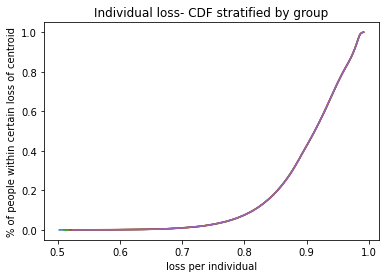

c  {0: (4.685511035170695, 3.8797892643625356), 1: (-9.937959093507398, -9.711487762789709), 2: (-11.65997109630725, 6.887619567855101), 3: (9.95743338536194, -4.393279140309518), 4: (-2.6144505841535812, 9.136036705985626), 5: (-2.7310805064800707, 1.4301862600279562), 6: (2.9752513105291456, 10.008995827282307), 7: (4.750259373509779, -1.868483631762608), 8: (-7.5582228973677426, -6.239655900274326), 9: (7.57860775357095, 8.32864317001648)}
weights:  [0.19999559 0.20000826 0.19999561 0.19999904 0.20000151]
Time elapsed Batch Step:  0.3439602851867676
Time elapsed Assignment Step:  2.288586378097534
0.0002993915808459091
total:  0.6308509078273593


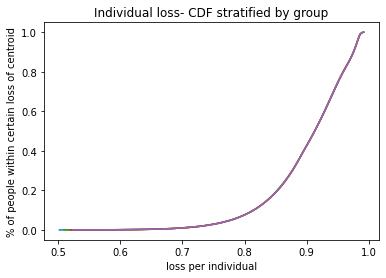

c  {0: (4.685003788835303, 3.879476334276454), 1: (-9.936481134487593, -9.710050975184563), 2: (-11.658085697198528, 6.887350154620598), 3: (9.95686040194782, -4.391552693451262), 4: (-2.613082995367152, 9.134783818008433), 5: (-2.730000241776638, 1.4314139618275326), 6: (2.9741019023694073, 10.007719253761186), 7: (4.750364665030067, -1.8673801829991516), 8: (-7.559204799804548, -6.241626433409612), 9: (7.57686448254101, 8.32784653670579)}
weights:  [0.1999956  0.20000827 0.19999565 0.19999907 0.20000142]
Time elapsed Batch Step:  0.3494589328765869
Time elapsed Assignment Step:  2.305408000946045
0.00031682642641572833
total:  0.6307618339513386


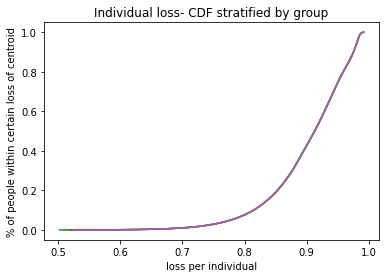

c  {0: (4.684496440054808, 3.879163384359263), 1: (-9.935002757510361, -9.708613766988893), 2: (-11.656199224192228, 6.887080642562533), 3: (9.956287029215456, -4.389825113858278), 4: (-2.6117148209441083, 9.133530426756145), 5: (-2.7289194896236246, 1.4326422657512838), 6: (2.9729517787396933, 10.006442053480379), 7: (4.75047005128158, -1.8662764134158811), 8: (-7.560187114338925, -6.243597834163659), 9: (7.575120151211702, 8.327049429438675)}
weights:  [0.19999561 0.20000829 0.19999568 0.1999991  0.20000133]
Time elapsed Batch Step:  0.3396415710449219
Time elapsed Assignment Step:  2.378439426422119
0.00030569385888512546
total:  0.6306640549309008


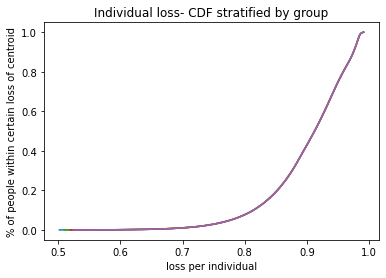

c  {0: (4.683983584479756, 3.8788385388725413), 1: (-9.933523965837425, -9.70717614125561), 2: (-11.654311678201044, 6.886811031990318), 3: (9.955713267137046, -4.38809640160304), 4: (-2.610346062220799, 9.132276533639708), 5: (-2.727838250591735, 1.4338711713297236), 6: (2.971800939726848, 10.005164226855467), 7: (4.7505755323678756, -1.8651723232743171), 8: (-7.561169839101491, -6.245570099046179), 9: (7.573381853139943, 8.326251982707712)}
weights:  [0.19999562 0.2000083  0.19999571 0.19999913 0.20000124]
Time elapsed Batch Step:  0.3374004364013672
Time elapsed Assignment Step:  2.3365983963012695
0.00031208795212467333
total:  0.630571441379194


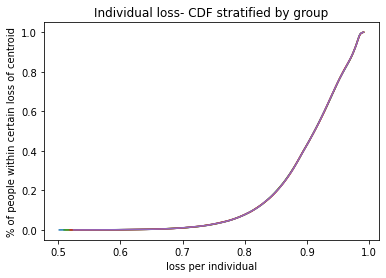

c  {0: (4.683470951359679, 3.878510976403432), 1: (-9.932044762746495, -9.7057381010535), 2: (-11.652423060148136, 6.886541323215089), 3: (9.955139115686796, -4.386366556764566), 4: (-2.6089767205421004, 9.131022140078402), 5: (-2.726761479511669, 1.435094303559737), 6: (2.9706493854215537, 10.003885774306315), 7: (4.7506811083925715, -1.8640679128371618), 8: (-7.562152972210046, -6.247543224542584), 9: (7.571642498070105, 8.325454060947079)}
weights:  [0.19999563 0.20000831 0.19999575 0.19999916 0.20000115]
Time elapsed Batch Step:  0.3451259136199951
Time elapsed Assignment Step:  2.239957094192505
0.0003199269356081169
total:  0.6304791084169248


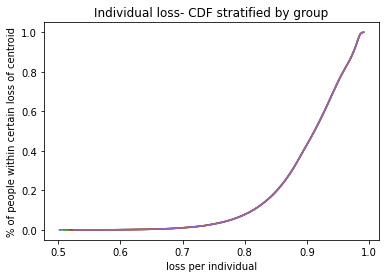

c  {0: (4.682958213556081, 3.878183394887468), 1: (-9.930565151531251, -9.704299649467242), 2: (-11.650533370967194, 6.886271516549716), 3: (9.954564574840935, -4.3846355794284575), 4: (-2.607606797261445, 9.129767247499869), 5: (-2.725684225215967, 1.4363180324485385), 6: (2.969497115918349, 10.002606696257098), 7: (4.750786779459345, -1.862963182368301), 8: (-7.563136511769525, -6.249517207113891), 9: (7.5699020867150795, 8.324655664536904)}
weights:  [0.19999565 0.20000832 0.19999578 0.19999919 0.20000106]
Time elapsed Batch Step:  0.35382819175720215
Time elapsed Assignment Step:  2.320328712463379
0.0003254692797426406
total:  0.630385932465466


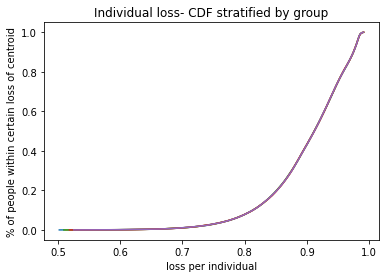

c  {0: (4.682445371031226, 3.877855794364042), 1: (-9.929085135501344, -9.702860789597429), 2: (-11.648642611602485, 6.886001612308806), 3: (9.953989644577726, -4.382903469686935), 4: (-2.606236293740852, 9.128511857340138), 5: (-2.7246064882729097, 1.4375423575278141), 6: (2.9683441313156504, 10.001326993136312), 7: (4.750892545671934, -1.8618581321328076), 8: (-7.564120455871946, -6.251492043196628), 9: (7.56816061979744, 8.323856793862015)}
weights:  [0.19999566 0.20000834 0.19999582 0.19999921 0.20000097]
Time elapsed Batch Step:  0.3456714153289795
Time elapsed Assignment Step:  2.3010406494140625
0.00031149218086046204
total:  0.6302868064092776


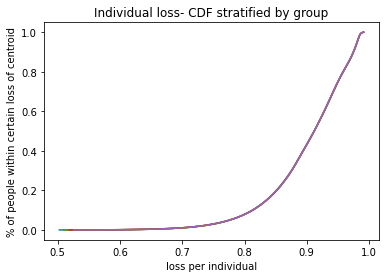

c  {0: (4.681932755294061, 3.877525429285447), 1: (-9.927604717982373, -9.701421524560592), 2: (-11.646750783008907, 6.885731610808711), 3: (9.953414324877482, -4.381170227638879), 4: (-2.604865211350957, 9.127255971043647), 5: (-2.7235331629547104, 1.4387609890648587), 6: (2.967190431715769, 10.000046665376791), 7: (4.750998407134136, -1.8607527623969424), 8: (-7.565104802596369, -6.25346772920274), 9: (7.566418098049489, 8.32305744931197)}
weights:  [0.19999567 0.20000835 0.19999585 0.19999924 0.20000088]
Time elapsed Batch Step:  0.3379189968109131
Time elapsed Assignment Step:  2.26705265045166
0.0003124641604438372
total:  0.6301920125814425


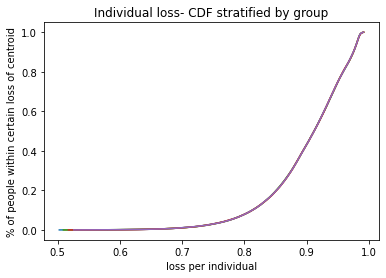

c  {0: (4.681420035462512, 3.8771950444389414), 1: (-9.926123902315881, -9.699981857489215), 2: (-11.644857886152046, 6.885461512367535), 3: (9.95283861572257, -4.379435853389864), 4: (-2.6034935514710393, 9.125999590063271), 5: (-2.722459358584831, 1.4399802118944673), 6: (2.966036017224933, 9.99876571341573), 7: (4.751104363949809, -1.8596470734281585), 8: (-7.566089550008837, -6.25544426151949), 9: (7.564674522213307, 8.322257631281074)}
weights:  [0.19999569 0.20000837 0.19999589 0.19999927 0.20000079]
Time elapsed Batch Step:  0.38697242736816406
Time elapsed Assignment Step:  2.3134639263153076
0.0003113951265435455
total:  0.6300964520251401


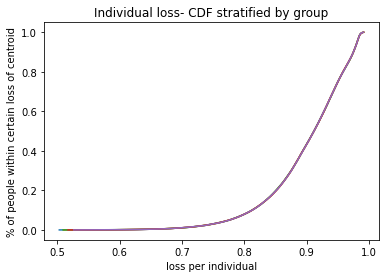

c  {0: (4.680907211499489, 3.8768646398641344), 1: (-9.92464269185934, -9.698541791531754), 2: (-11.642963922008235, 6.88519131730514), 3: (9.952262517097434, -4.377700347052198), 4: (-2.602121315489054, 9.124742715860345), 5: (-2.7213850757291853, 1.4412000255494746), 6: (2.964880887953306, 9.997484137694702), 7: (4.751210416222867, -1.8585410654951025), 8: (-7.56707469616234, -6.25742163650937), 9: (7.562929893040801, 8.32145734016841)}
weights:  [0.1999957  0.20000838 0.19999593 0.1999993  0.2000007 ]
Time elapsed Batch Step:  0.3472254276275635
Time elapsed Assignment Step:  2.2871034145355225
0.00031664659896957215
total:  0.6300026334849669


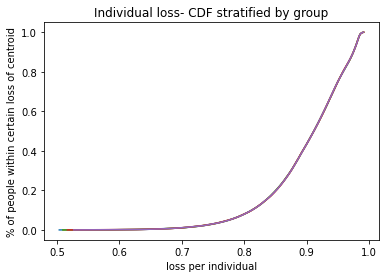

c  {0: (4.680394283367898, 3.8765342156006675), 1: (-9.923161089986133, -9.697101329852659), 2: (-11.6410688915646, 6.88492102594315), 3: (9.951686028988604, -4.375963708744962), 4: (-2.60074850480166, 9.123485349904687), 5: (-2.7203103149579735, 1.4424204295584373), 6: (2.9637250440150065, 9.996201938659672), 7: (4.751316564057286, -1.8574347388676173), 8: (-7.5680602390967575, -6.259399850510003), 9: (7.56118421129375, 8.320656576377853)}
weights:  [0.19999571 0.20000839 0.19999596 0.19999933 0.20000061]
Time elapsed Batch Step:  0.34943056106567383
Time elapsed Assignment Step:  2.296933889389038
0.00033170813308613933
total:  0.6299116046933727


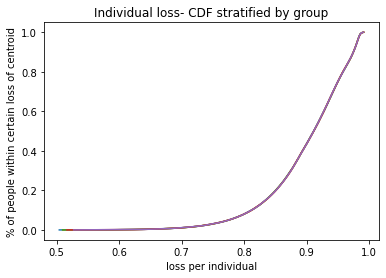

c  {0: (4.679881251030636, 3.8762037716882136), 1: (-9.921679100085539, -9.695660475632385), 2: (-11.639172795819126, 6.884650638604963), 3: (9.951109151384701, -4.374225938594048), 4: (-2.5993751208142504, 9.122227493674629), 5: (-2.719235076845697, 1.4436414234456176), 6: (2.962568485528129, 9.994919116761018), 7: (4.751422807557099, -1.856328093816745), 8: (-7.569046176838816, -6.261378899834047), 9: (7.559437477743859, 8.319855340318101)}
weights:  [0.19999573 0.20000841 0.199996   0.19999935 0.20000052]
Time elapsed Batch Step:  0.3559398651123047
Time elapsed Assignment Step:  2.330643892288208
0.0003397009312298138
total:  0.6298183029511605


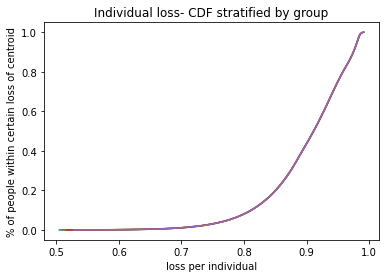

c  {0: (4.679368114450597, 3.875873308166478), 1: (-9.92019672556272, -9.694219232067415), 2: (-11.637275635780702, 6.884380155615753), 3: (9.95053188427646, -4.3724870367321955), 4: (-2.598001164940982, 9.120969148657036), 5: (-2.7181593619711766, 1.4448630067309665), 6: (2.9614112126147627, 9.993635672453548), 7: (4.751529146826397, -1.855221130614729), 8: (-7.570032507402037, -6.263358780769103), 9: (7.557689693172801, 8.31905363240269)}
weights:  [0.19999574 0.20000842 0.19999603 0.19999938 0.20000042]
Time elapsed Batch Step:  0.36516666412353516
Time elapsed Assignment Step:  2.2909789085388184
0.0003368340481326726
total:  0.6297215898442265


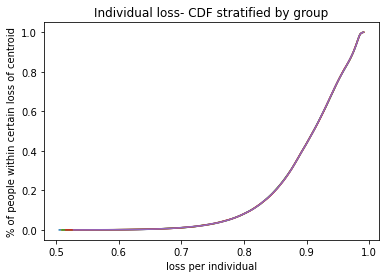

c  {0: (4.678854873590668, 3.8755428250751973), 1: (-9.918713969838697, -9.692777602370272), 2: (-11.635377412469184, 6.884109577302478), 3: (9.949954227656738, -4.370747003299033), 4: (-2.5966266386048042, 9.119710316347332), 5: (-2.717083170917565, 1.4460851789301064), 6: (2.9602532254010123, 9.992351606196522), 7: (4.751635581969327, -1.8541138495350167), 8: (-7.571019228786695, -6.2653394895776175), 9: (7.555940858372272, 8.318251453050024)}
weights:  [0.19999575 0.20000844 0.19999607 0.19999941 0.20000033]
Time elapsed Batch Step:  0.3481471538543701
Time elapsed Assignment Step:  2.282766580581665
0.00033795786999668564
total:  0.6296259208602326


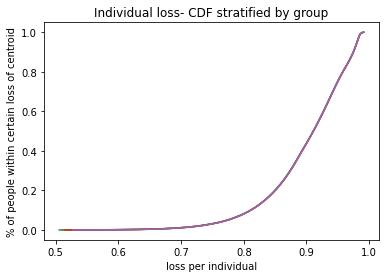

c  {0: (4.678341528413729, 3.87521232245414), 1: (-9.917230836350335, -9.69133558976954), 2: (-11.63347812691545, 6.8838389039938885), 3: (9.949376181520527, -4.369005838441114), 4: (-2.5952515432374885, 9.118450998249527), 5: (-2.7160065042723676, 1.4473079395543145), 6: (2.9590945240170177, 9.991066918453662), 7: (4.7517421130900965, -1.8530062508522616), 8: (-7.572006338979763, -6.26732102249679), 9: (7.554190974144036, 8.317448802683394)}
weights:  [0.19999577 0.20000845 0.1999961  0.19999944 0.20000024]
Time elapsed Batch Step:  0.3524456024169922
Time elapsed Assignment Step:  2.330434799194336
0.0003197660211778919
total:  0.6295243028046604


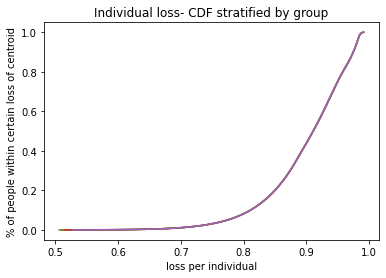

c  {0: (4.6778280788826585, 3.874881800343107), 1: (-9.91574732855032, -9.68989319750987), 2: (-11.631577780161455, 6.88356813602053), 3: (9.948797745864969, -4.367263542311959), 4: (-2.593875880279658, 9.117191195876241), 5: (-2.7149293626274558, 1.4485312881105061), 6: (2.957935108596974, 9.98978160969318), 7: (4.751848740292966, -1.8518983348423266), 8: (-7.572993835954871, -6.269303375738476), 9: (7.552440041299977, 8.316645681731005)}
weights:  [0.19999578 0.20000846 0.19999614 0.19999948 0.20000014]
Time elapsed Batch Step:  0.3365054130554199
Time elapsed Assignment Step:  2.2760403156280518
0.00033865745183825346
total:  0.629433655349761


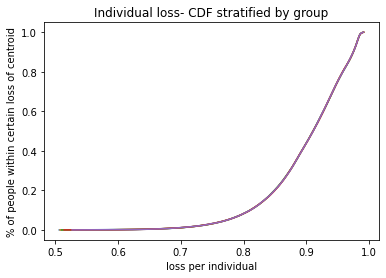

c  {0: (4.677314524960325, 3.874551258781931), 1: (-9.914263449907141, -9.688450428851999), 2: (-11.629676373260288, 6.8832972737147555), 3: (9.948218920689362, -4.365520115072092), 4: (-2.5924996511808187, 9.115930910748729), 5: (-2.713851746579085, 1.4497552241012175), 6: (2.9567749792791527, 9.98849568038779), 7: (4.751955463682256, -1.8507901017822859), 8: (-7.573981717672253, -6.271286545489092), 9: (7.550688060662146, 8.315842090625994)}
weights:  [0.1999958  0.20000848 0.19999618 0.1999995  0.20000004]
Time elapsed Batch Step:  0.34067249298095703
Time elapsed Assignment Step:  2.3589248657226562
0.0003405134239357066
total:  0.6293377434343113


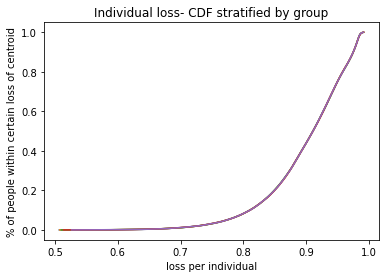

c  {0: (4.676800866609594, 3.874220697810475), 1: (-9.912779203905057, -9.687007287072765), 2: (-11.627773907276227, 6.883026317410727), 3: (9.947639705995183, -4.363775556889083), 4: (-2.5911228573993865, 9.1146701443969), 5: (-2.7127736567279093, 1.4509797470245884), 6: (2.9556141362059205, 9.987209131014723), 7: (4.75206228336234, -1.8496815519504277), 8: (-7.574969982078704, -6.273270527909523), 9: (7.54893503306281, 8.315038029806459)}
weights:  [0.19999581 0.20000849 0.19999622 0.19999953 0.19999995]
Time elapsed Batch Step:  0.33945322036743164
Time elapsed Assignment Step:  2.321775197982788
0.00033272097606884543
total:  0.6292378043419408


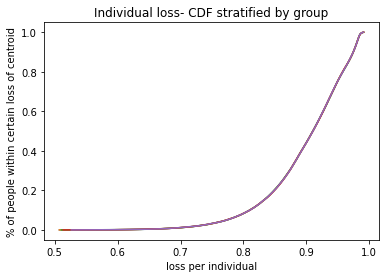

c  {0: (4.676281966165161, 3.873886811665217), 1: (-9.911279747945473, -9.68554934034904), 2: (-11.625851348044884, 6.882752556944762), 3: (9.947055648544737, -4.362010000627493), 4: (-2.5897317268327504, 9.11339628589898), 5: (-2.711684308048511, 1.4522171074678432), 6: (2.9544409639569396, 9.985909090366166), 7: (4.752170268598403, -1.8485615969630151), 8: (-7.575968513557817, -6.2752751670472815), 9: (7.547163418607325, 8.314225454414567)}
weights:  [0.19999583 0.20000851 0.19999625 0.19999956 0.19999985]
Time elapsed Batch Step:  0.3535475730895996
Time elapsed Assignment Step:  2.2492799758911133
0.0003466172359006814
total:  0.6291442150969463


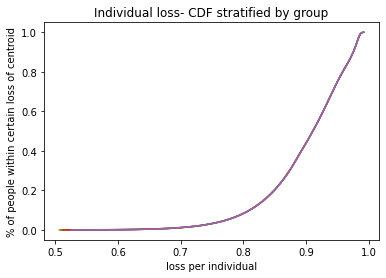

c  {0: (4.67576295911746, 3.8735529058011666), 1: (-9.909779924418334, -9.684091019756274), 2: (-11.623927710657425, 6.882478701280781), 3: (9.946471195758296, -4.360243292381142), 4: (-2.588340023244857, 9.112121939661051), 5: (-2.71059447728619, 1.45345506559977), 6: (2.9532670639116025, 9.984608418178656), 7: (4.752278352274266, -1.847441319410091), 8: (-7.576967431176219, -6.2772806272569115), 9: (7.545390737883406, 8.313412400779725)}
weights:  [0.19999584 0.20000852 0.19999629 0.19999959 0.19999975]
Time elapsed Batch Step:  0.35638928413391113
Time elapsed Assignment Step:  2.325258255004883
0.0003462788017724039
total:  0.6290461987486806


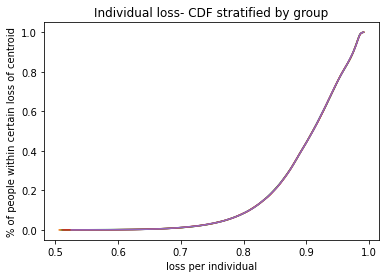

c  {0: (4.675243845428213, 3.873218980259494), 1: (-9.908279736962236, -9.682632328720583), 2: (-11.622002996245426, 6.882204750768729), 3: (9.945886347650248, -4.358475432362124), 4: (-2.5869477481661196, 9.110847107286384), 5: (-2.709504165073544, 1.4546936208895673), 6: (2.9520924362294156, 9.983307114958022), 7: (4.7523865344976395, -1.846320719582155), 8: (-7.577966732776524, -6.27928690450322), 9: (7.543616991780526, 8.312598869368824)}
weights:  [0.19999586 0.20000854 0.19999633 0.19999962 0.19999965]
Time elapsed Batch Step:  0.34499573707580566
Time elapsed Assignment Step:  2.356961965560913
0.000344316905838693
total:  0.6289475380845688


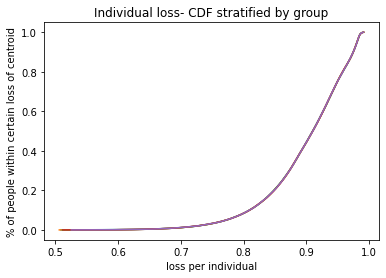

c  {0: (4.674724625059136, 3.872885035081403), 1: (-9.906779189232077, -9.681173270684882), 2: (-11.62007720595235, 6.8819307057604675), 3: (9.945301104237318, -4.356706420790113), 4: (-2.5855549031363494, 9.109571790387367), 5: (-2.708413372047819, 1.455932772801787), 6: (2.950917081074233, 9.982005181214873), 7: (4.752494815376289, -1.845199797770981), 8: (-7.578966416187163, -6.281293994724047), 9: (7.541842181199, 8.311784860654006)}
weights:  [0.19999587 0.20000856 0.19999637 0.19999965 0.19999956]
Time elapsed Batch Step:  0.3516123294830322
Time elapsed Assignment Step:  2.3057680130004883
0.0003566227109460529
total:  0.6288529998377573


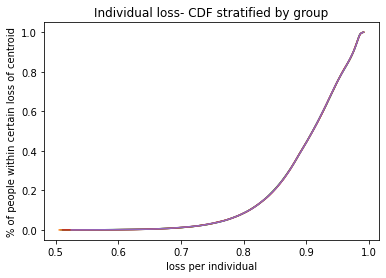

c  {0: (4.674205297971942, 3.8725510703081296), 1: (-9.905278284899039, -9.679713849108893), 2: (-11.618150340933605, 6.881656566609776), 3: (9.944715465538582, -4.354936257892403), 4: (-2.584161489704783, 9.108295990585532), 5: (-2.7073220988509243, 1.4571725207963169), 6: (2.949740998614279, 9.980702617464626), 7: (4.752603195018036, -1.8440785542696196), 8: (-7.579966479222334, -6.283301893830167), 9: (7.540066307050034, 8.310970375112705)}
weights:  [0.19999588 0.20000857 0.19999641 0.19999968 0.19999946]
Time elapsed Batch Step:  0.34916019439697266
Time elapsed Assignment Step:  2.240389585494995
0.0003471236085746954
total:  0.6287517638043306


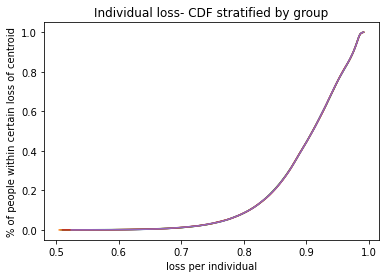

c  {0: (4.673685864128334, 3.8722170859809446), 1: (-9.903777027650538, -9.678254067469162), 2: (-11.616222402356605, 6.881382333672366), 3: (9.944129431575485, -4.353164943903954), 4: (-2.5827675094301137, 9.107019709511578), 5: (-2.7062303461294532, 1.4584128643283623), 6: (2.948564189022168, 9.979399424227513), 7: (4.752711673530761, -1.8429569893724003), 8: (-7.58096691968195, -6.285310597705189), 9: (7.538289370255781, 8.310155413227655)}
weights:  [0.1999959  0.20000859 0.19999645 0.19999971 0.19999936]
Time elapsed Batch Step:  0.34225893020629883
Time elapsed Assignment Step:  2.2871220111846924
0.00033501676373637324
total:  0.6286495878795092


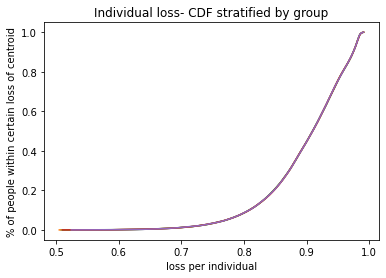

c  {0: (4.673166323490012, 3.8718830821411503), 1: (-9.902275421190206, -9.676793929259057), 2: (-11.614293391400835, 6.881108007305879), 3: (9.943543002371847, -4.351392479067432), 4: (-2.581372963880524, 9.105742948805396), 5: (-2.7051381145346975, 1.4596538028484278), 6: (2.9473866524749277, 9.97809560202861), 7: (4.752820251022395, -1.841835103374934), 8: (-7.581967735351596, -6.287320102205455), 9: (7.536511371749397, 8.309339975486925)}
weights:  [0.19999591 0.2000086  0.19999649 0.19999974 0.19999926]
Time elapsed Batch Step:  0.34662294387817383
Time elapsed Assignment Step:  2.257143259048462
0.0003426105225453613
total:  0.6285531646509347


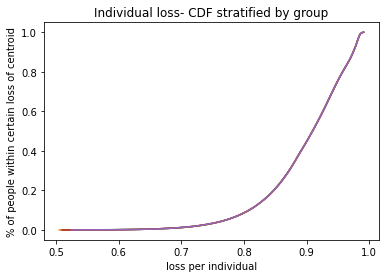

c  {0: (4.672646676018669, 3.8715490588300825), 1: (-9.900773469237848, -9.675333437988783), 2: (-11.612363309257907, 6.880833587869903), 3: (9.942956177953885, -4.349618863633253), 4: (-2.5799778546337135, 9.1044657101161), 5: (-2.704045404722667, 1.460895335802299), 6: (2.946208389154022, 9.976791151397853), 7: (4.752928927600928, -1.840712896574117), 8: (-7.582968924002476, -6.289330403159942), 9: (7.534732312475084, 8.30852406238394)}
weights:  [0.19999592 0.20000862 0.19999653 0.19999977 0.19999916]
Time elapsed Batch Step:  0.3530545234680176
Time elapsed Assignment Step:  2.3393993377685547
0.0003525034316872455
total:  0.6284572727410547


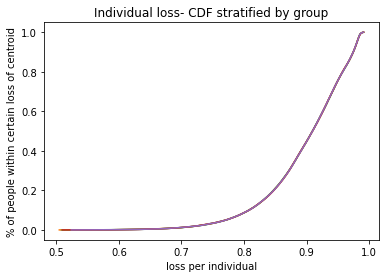

c  {0: (4.672126921675994, 3.87121501608911), 1: (-9.899271175529408, -9.673872597185385), 2: (-11.610432157131626, 6.880559075725976), 3: (9.942368958350224, -4.347844097859629), 4: (-2.5785821832769322, 9.103187995102052), 5: (-2.7029522173541065, 1.462137462631024), 6: (2.9450293992453696, 9.97548607287006), 7: (4.753037703374404, -1.8395903692681324), 8: (-7.5839704833913615, -6.291341496370165), 9: (7.532952193388157, 8.307707674417511)}
weights:  [0.19999594 0.20000863 0.19999657 0.1999998  0.19999906]
Time elapsed Batch Step:  0.35070228576660156
Time elapsed Assignment Step:  2.3098068237304688
0.0003411735318584741
total:  0.6283548565678148


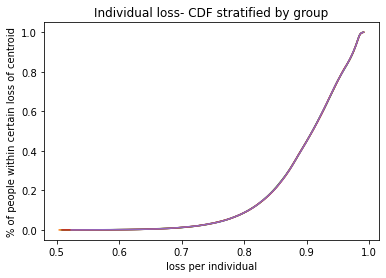

c  {0: (4.671607060423669, 3.870880953959634), 1: (-9.897768543816932, -9.672411410392751), 2: (-11.608499936238053, 6.880284471237593), 3: (9.941781343591911, -4.346068182012605), 4: (-2.5771859514070097, 9.101909805430886), 5: (-2.7018585530945134, 1.4633801827708957), 6: (2.9438496829393705, 9.974180366984946), 7: (4.75314657845092, -1.8384675217564526), 8: (-7.5849724112605506, -6.29335337761007), 9: (7.531171015455088, 8.30689081209185)}
weights:  [0.19999595 0.20000865 0.1999966  0.19999983 0.19999896]
Time elapsed Batch Step:  0.3468031883239746
Time elapsed Assignment Step:  2.3866207599639893
0.0003416031920786544
total:  0.6282558556737656


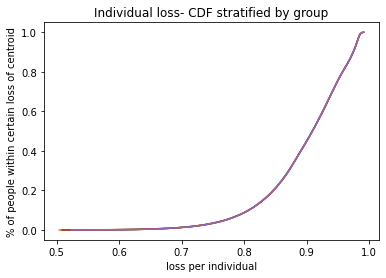

c  {0: (4.67108709222337, 3.87054687248309), 1: (-9.896265577868526, -9.670949881171625), 2: (-11.606566647805563, 6.8800097747702145), 3: (9.94119333371243, -4.344291116366109), 4: (-2.575789160630386, 9.100631142779534), 5: (-2.7007681747520857, 1.4646136144785284), 6: (2.9426692404309245, 9.972874034287146), 7: (4.753260551545977, -1.8373377510060351), 8: (-7.5859747053378115, -6.295366042625944), 9: (7.529388779653564, 8.306073475916609)}
weights:  [0.19999597 0.20000867 0.19999664 0.19999986 0.19999886]
Time elapsed Batch Step:  0.3454630374908447
Time elapsed Assignment Step:  2.289015769958496
0.000345404033073371
total:  0.6281577091535746


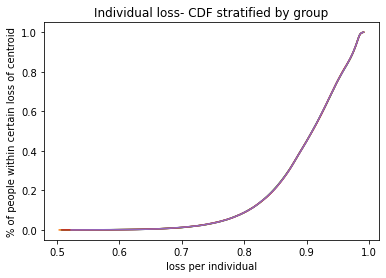

c  {0: (4.67056701703677, 3.8702127717009454), 1: (-9.894762281468317, -9.669488013099599), 2: (-11.604632293074914, 6.8797349866912745), 3: (9.940604928747716, -4.342512901201992), 4: (-2.5743918125631424, 9.099352008834257), 5: (-2.699677326972985, 1.4658476304378327), 6: (2.9414880719194554, 9.971567075326238), 7: (4.753374627398557, -1.8362076559689122), 8: (-7.586977363336341, -6.2973794871363085), 9: (7.527605486972537, 8.305255666406891)}
weights:  [0.19999598 0.20000868 0.19999668 0.19999989 0.19999876]
Time elapsed Batch Step:  0.3468754291534424
Time elapsed Assignment Step:  2.3059988021850586
0.0003482816077812201
total:  0.6280591287521112


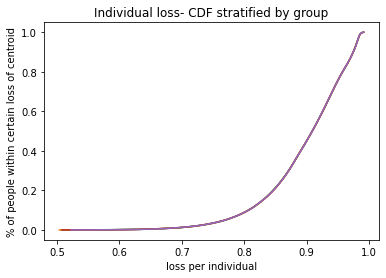

c  {0: (4.670046834825534, 3.869878651654701), 1: (-9.893258658416412, -9.668025809771125), 2: (-11.602696873299303, 6.879460107370186), 3: (9.94001612873617, -4.340733536810075), 4: (-2.5729939088310307, 9.098072405290669), 5: (-2.698586010430179, 1.4670822300827906), 6: (2.9403061776089325, 9.970259490656757), 7: (4.753488806119342, -1.8350772369521595), 8: (-7.58798038295471, -6.299393706831823), 9: (7.525821138412285, 8.304437384083286)}
weights:  [0.199996   0.2000087  0.19999672 0.19999992 0.19999866]
Time elapsed Batch Step:  0.35384321212768555
Time elapsed Assignment Step:  2.322037696838379
0.00035933753998151907
total:  0.6279628440588917


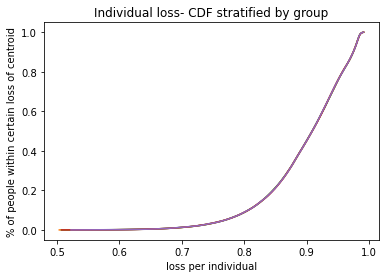

c  {0: (4.669526545551323, 3.86954451238589), 1: (-9.891754712528858, -9.666563274797515), 2: (-11.600760389744433, 6.879185137178352), 3: (9.939426933718675, -4.338953023488188), 4: (-2.571595451069505, 9.09679233385376), 5: (-2.697494225801357, 1.4683174128426808), 6: (2.939123557707893, 9.968951280838217), 7: (4.753603087819065, -1.8339464942641839), 8: (-7.588983761876821, -6.301408697375185), 9: (7.524035734984458, 8.30361862947189)}
weights:  [0.19999601 0.20000872 0.19999676 0.19999995 0.19999856]
Time elapsed Batch Step:  0.3486287593841553
Time elapsed Assignment Step:  2.328939199447632
0.00034750213455825296
total:  0.6278595262165864


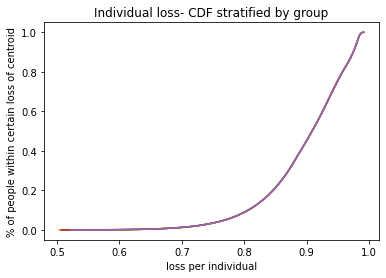

c  {0: (4.668998367173584, 3.869214899756785), 1: (-9.890250447637587, -9.665100411806934), 2: (-11.598822843688579, 6.878910076489169), 3: (9.938837343738607, -4.3371713615422225), 4: (-2.5701964409237514, 9.095511796237925), 5: (-2.6964019737689466, 1.4695531781420608), 6: (2.9379402124294653, 9.967642446435134), 7: (4.753721015554386, -1.8328167492388605), 8: (-7.589987497771857, -6.303424454401032), 9: (7.522249277712139, 8.302799403104332)}
weights:  [0.19999602 0.20000874 0.1999968  0.19999999 0.19999846]
Time elapsed Batch Step:  0.3402864933013916
Time elapsed Assignment Step:  2.2662439346313477
0.0003293245644309106
total:  0.6277541484994301


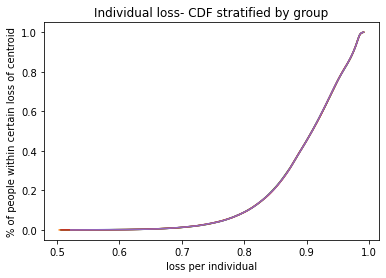

c  {0: (4.668470077768185, 3.868885267620944), 1: (-9.888745867590385, -9.663637224444413), 2: (-11.596884236422644, 6.87863492567804), 3: (9.938247358841855, -4.335388551286168), 4: (-2.5687968800487173, 9.094230794166997), 5: (-2.695309255020131, 1.4707895254007484), 6: (2.9367561419913906, 9.966332988017042), 7: (4.753839048937149, -1.8316866790641588), 8: (-7.590991588294237, -6.305440973515842), 9: (7.520461767629897, 8.301979705517805)}
weights:  [0.19999604 0.20000875 0.19999684 0.20000002 0.19999835]
Time elapsed Batch Step:  0.4121522903442383
Time elapsed Assignment Step:  2.3359158039093018
0.0003273758188956366
total:  0.6276535269451932


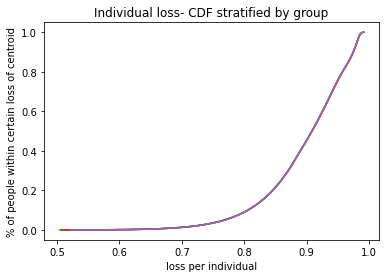

c  {0: (4.667934857744711, 3.8685623150595596), 1: (-9.887240976250833, -9.662173716371838), 2: (-11.59494456925023, 6.878359685122375), 3: (9.937656979076829, -4.333604593042161), 4: (-2.5673997272683615, 9.092957296413466), 5: (-2.694216070246868, 1.4720264540338037), 6: (2.935571346616045, 9.965022906158515), 7: (4.753959327935558, -1.8305551819966772), 8: (-7.591996031083563, -6.307458250297834), 9: (7.518673205783838, 8.301159537255081)}
weights:  [0.19999605 0.20000877 0.19999688 0.20000005 0.19999825]
Time elapsed Batch Step:  0.3560211658477783
Time elapsed Assignment Step:  2.320690393447876
0.0003195775244094756
total:  0.6275509920329302


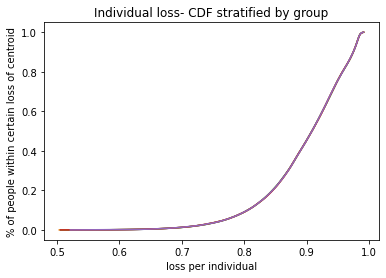

c  {0: (4.667399522158355, 3.868239343625602), 1: (-9.885735777498262, -9.660709891267949), 2: (-11.593003843487704, 6.878084355201608), 3: (9.937066204494482, -4.331819487140531), 4: (-2.5660020245673323, 9.091683338307925), 5: (-2.693122420145904, 1.4732639634515112), 6: (2.9343858265304643, 9.963712201439186), 7: (4.754079714447021, -1.8294233558806556), 8: (-7.593000823764579, -6.309476280296867), 9: (7.5168835932316656, 8.300338898864544)}
weights:  [0.19999607 0.20000879 0.19999692 0.20000008 0.19999814]
Time elapsed Batch Step:  0.35530638694763184
Time elapsed Assignment Step:  2.34120512008667
0.0003264604624748646
total:  0.6274527047083344


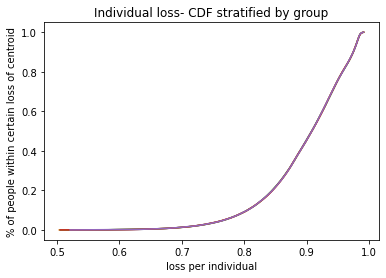

c  {0: (4.666864070965657, 3.8679163533586665), 1: (-9.884230275227704, -9.659245752828339), 2: (-11.591062060464253, 6.877808936297195), 3: (9.936475035148318, -4.33003323391984), 4: (-2.56460377359173, 9.090408921562938), 5: (-2.6920283054187957, 1.4745020530593618), 6: (2.9331995819663645, 9.96240087444377), 7: (4.754200208586633, -1.8282912010159316), 8: (-7.5940059639471205, -6.311495059034347), 9: (7.515092931042732, 8.299517790900213)}
weights:  [0.19999608 0.20000881 0.19999696 0.20000012 0.19999804]
Time elapsed Batch Step:  0.34255146980285645
Time elapsed Assignment Step:  2.3365721702575684
0.0003179094392378179
total:  0.6273496300053651


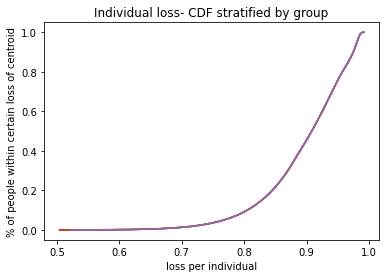

c  {0: (4.666328504123147, 3.867593344298379), 1: (-9.882724473349844, -9.65778130476545), 2: (-11.589119221521957, 6.8775334287926295), 3: (9.935883471094414, -4.3282458337269345), 4: (-2.5632049759973636, 9.089134047900421), 5: (-2.690933726771924, 1.475740722258034), 6: (2.9320126131601656, 9.96108892576208), 7: (4.754320810469545, -1.8271587177036732), 8: (-7.595011449226068, -6.3135145820031235), 9: (7.513301220298095, 8.29869621392177)}
weights:  [0.1999961  0.20000883 0.19999699 0.20000015 0.19999793]
Time elapsed Batch Step:  0.3438749313354492
Time elapsed Assignment Step:  2.3146979808807373
0.0003215376925426172
total:  0.627250050659418


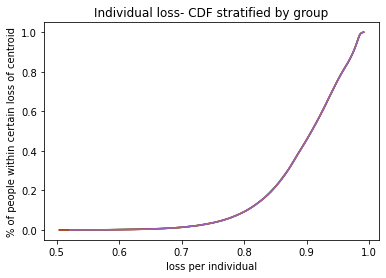

c  {0: (4.6657928215873525, 3.867270316484399), 1: (-9.881218375790962, -9.656316550808567), 2: (-11.58717532801585, 6.877257833073446), 3: (9.93529151239143, -4.326457286916986), 4: (-2.561805633449777, 9.087858719051667), 5: (-2.689838684916514, 1.4769799704433766), 6: (2.930824920353015, 9.959776355989053), 7: (4.754441520210957, -1.826025906246381), 8: (-7.5960172771813035, -6.315534844667392), 9: (7.511508462090571, 8.297874168494584)}
weights:  [0.19999611 0.20000884 0.19999703 0.20000018 0.19999783]
Time elapsed Batch Step:  0.35315418243408203
Time elapsed Assignment Step:  2.3183910846710205
0.00030015213774492455
total:  0.6271428092301777


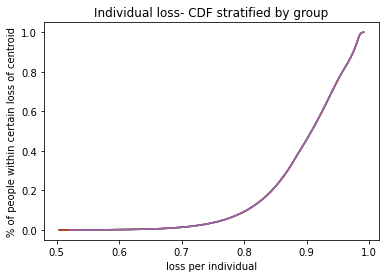

c  {0: (4.665257023314795, 3.8669472699564174), 1: (-9.879711986492879, -9.65485149470381), 2: (-11.585230381313986, 6.8769821495272305), 3: (9.934699159100628, -4.3246675938535395), 4: (-2.560405747624281, 9.086582936757369), 5: (-2.6887431805686512, 1.4782197970063895), 6: (2.929636503790809, 9.958463165724762), 7: (4.7545623379261235, -1.824892766947892), 8: (-7.597023445377659, -6.317555842462596), 9: (7.509714657524795, 8.297051655189733)}
weights:  [0.19999613 0.20000886 0.19999707 0.20000022 0.19999772]
Time elapsed Batch Step:  0.35297274589538574
Time elapsed Assignment Step:  2.316444158554077
0.00030112965989126383
total:  0.62704211921758


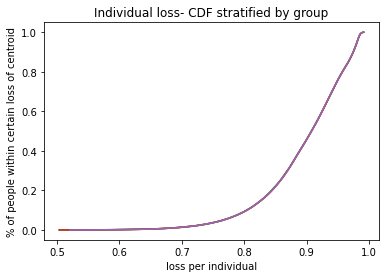

c  {0: (4.664721109261989, 3.8666242047541566), 1: (-9.878205309412909, -9.653386140214128), 2: (-11.58328438279751, 6.876706378543627), 3: (9.934106411285882, -4.322876754908559), 4: (-2.5590053202059804, 9.08530670276765), 5: (-2.6876472144492993, 1.4794602013332063), 6: (2.9284473637242177, 9.957149355574446), 7: (4.75468326373035, -1.8237593001133814), 8: (-7.598029951364874, -6.319577570795331), 9: (7.507919807717274, 8.296228674584038)}
weights:  [0.19999614 0.20000888 0.19999711 0.20000025 0.19999762]
Time elapsed Batch Step:  0.3509194850921631
Time elapsed Assignment Step:  2.3291895389556885
0.00029431265986934463
total:  0.626938933219661


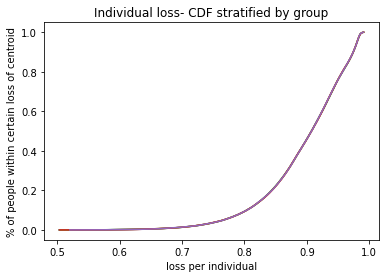

c  {0: (4.664185079385444, 3.8663011209173717), 1: (-9.876698348523796, -9.651920491119292), 2: (-11.581337333860715, 6.8764305205143454), 3: (9.933513269013698, -4.3210847704624715), 4: (-2.557604352889805, 9.084030018842085), 5: (-2.6865507872843186, 1.4807011828050751), 6: (2.927257500408707, 9.955834926148523), 7: (4.7548042977389935, -1.8226255060493661), 8: (-7.59903679267755, -6.321600025043241), 9: (7.506123913796439, 8.29540522726008)}
weights:  [0.19999616 0.2000089  0.19999715 0.20000028 0.19999751]
Time elapsed Batch Step:  0.3421812057495117
Time elapsed Assignment Step:  2.292947292327881
0.00031970237057876716
total:  0.6268452517880637


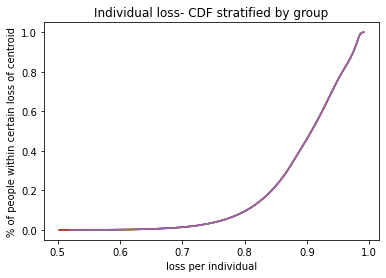

c  {0: (4.663648933641665, 3.865978018485849), 1: (-9.875191107813658, -9.65045455121588), 2: (-11.57938923591111, 6.87615457583317), 3: (9.932919732353227, -4.319291640904216), 4: (-2.5562028473805363, 9.082752886749732), 5: (-2.685453899804483, 1.4819427407983408), 6: (2.9260669141045614, 9.954519878062614), 7: (4.754925440067461, -1.8214913850637071), 8: (-7.600043966835102, -6.323623200554928), 9: (7.504326976902708, 8.294581313806232)}
weights:  [0.19999617 0.20000891 0.19999719 0.20000032 0.1999974 ]
Time elapsed Batch Step:  0.3344595432281494
Time elapsed Assignment Step:  2.2628493309020996
0.0003087585689093286
total:  0.6267405124448443


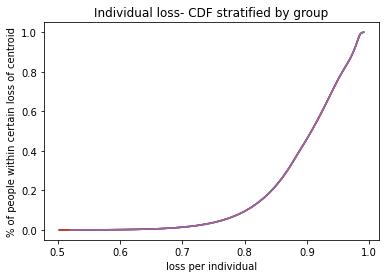

c  {0: (4.663112671987149, 3.865654897499408), 1: (-9.873683591285928, -9.648988324317276), 2: (-11.577440090369494, 6.875878544895968), 3: (9.932325801376283, -4.3174973666312875), 4: (-2.5548008053928375, 9.081475308269152), 5: (-2.6843565527454976, 1.4831848746844263), 6: (2.9248756050769087, 9.953204211937566), 7: (4.755046690831208, -1.820356937465613), 8: (-7.601051471341717, -6.325647092649845), 9: (7.502528998188537, 8.293756934816683)}
weights:  [0.19999619 0.20000893 0.19999723 0.20000035 0.1999973 ]
Time elapsed Batch Step:  0.35879945755004883
Time elapsed Assignment Step:  2.283768892288208
0.00032008701828578623
total:  0.6266422969774063


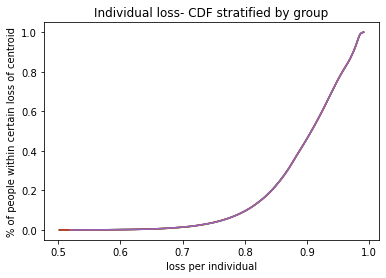

c  {0: (4.6625762943783915, 3.865331757997898), 1: (-9.8721758029593, -9.647521814253647), 2: (-11.575489898670012, 6.875602428100696), 3: (9.931731476157355, -4.315701948049787), 4: (-2.5533982286512824, 9.080197285188436), 5: (-2.683258746848017, 1.4844275838298142), 6: (2.923683573595742, 9.951887928399463), 7: (4.755168050145744, -1.819222163565642), 8: (-7.602059303686303, -6.327671696618207), 9: (7.500729978818479, 8.292932090891462)}
weights:  [0.1999962  0.20000895 0.19999727 0.20000039 0.19999719]
Time elapsed Batch Step:  0.3539280891418457
Time elapsed Assignment Step:  2.3838212490081787
0.00032224234714750555
total:  0.6265411720587158


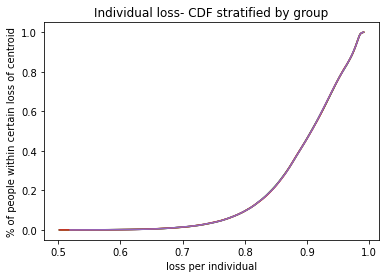

c  {0: (4.662039800771878, 3.865008600021203), 1: (-9.870667746867655, -9.64605502487194), 2: (-11.573538662260232, 6.87532622584741), 3: (9.931136756773624, -4.313905385574463), 4: (-2.5519951188903836, 9.078918819305239), 5: (-2.6821604828576633, 1.4856708675960282), 6: (2.922490819935944, 9.95057102807966), 7: (4.755289518126624, -1.8180870636757054), 8: (-7.603067461342453, -6.329697007720888), 9: (7.498929919969239, 8.292106782636468)}
weights:  [0.19999622 0.20000897 0.19999731 0.20000042 0.19999709]
Time elapsed Batch Step:  0.3443779945373535
Time elapsed Assignment Step:  2.356921434402466
0.00031540327815859914
total:  0.6264371916019336


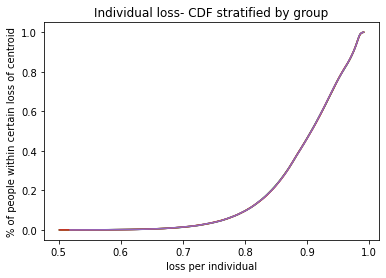

c  {0: (4.661503191124092, 3.8646854236092363), 1: (-9.869159427060008, -9.644587960035858), 2: (-11.5715863826012, 6.875049938538274), 3: (9.93054164330498, -4.312107679628764), 4: (-2.55059147785462, 9.077639912426793), 5: (-2.6810617615250423, 1.4869147253396144), 6: (2.92129734437731, 9.949253511614792), 7: (4.755411094889452, -1.8169516381090702), 8: (-7.604075941768392, -6.331723021189328), 9: (7.497128822829731, 8.291281010663495)}
weights:  [0.19999624 0.20000899 0.19999735 0.20000045 0.19999698]
Time elapsed Batch Step:  0.40239787101745605
Time elapsed Assignment Step:  2.369847536087036
0.0003148164376994833
total:  0.6263349292893816


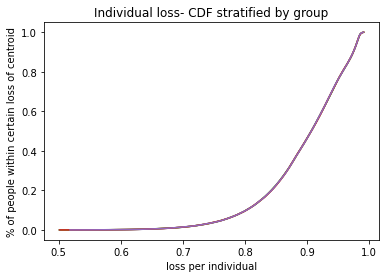

c  {0: (4.660966465391511, 3.8643622288019444), 1: (-9.867650847600446, -9.643120623625856), 2: (-11.56963306116752, 6.8747735665775656), 3: (9.92994613583404, -4.310308830644882), 4: (-2.549187307298466, 9.076360566369944), 5: (-2.679962583605764, 1.4881591564121235), 6: (2.9201031472045718, 9.9479353796468), 7: (4.755532780549882, -1.815815887180362), 8: (-7.605084742406937, -6.33374973222543), 9: (7.495326688601133, 8.290454775590252)}
weights:  [0.19999625 0.200009   0.19999738 0.20000049 0.19999687]
Time elapsed Batch Step:  0.39179110527038574
Time elapsed Assignment Step:  2.2457542419433594
0.0003220932357790307
total:  0.6262348675970604


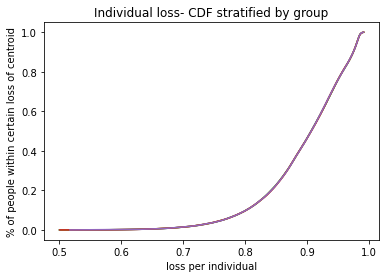

c  {0: (4.660429623530606, 3.864039015639306), 1: (-9.866142012568051, -9.641653019539115), 2: (-11.567678699447415, 6.874497110371684), 3: (9.929350234446153, -4.308508839063801), 4: (-2.5477826089864193, 9.07508078296117), 5: (-2.678862949860458, 1.4894041601600911), 6: (2.9189082287074215, 9.946616632822955), 7: (4.755654575223614, -1.8146798112055678), 8: (-7.606093860685453, -6.33577713600147), 9: (7.493523518496949, 8.289628078040398)}
weights:  [0.19999627 0.20000902 0.19999742 0.20000052 0.19999676]
Time elapsed Batch Step:  0.3398010730743408
Time elapsed Assignment Step:  2.3222296237945557
0.00032086232674843895
total:  0.6261320967705486


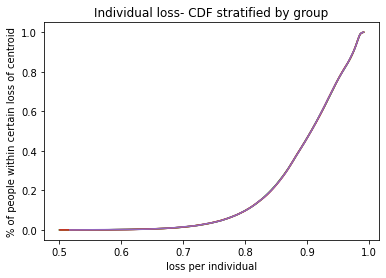

c  {0: (4.659892665497844, 3.8637157841613305), 1: (-9.864632926056847, -9.640185151689531), 2: (-11.565723298942794, 6.874220570329164), 3: (9.928753939229429, -4.306707705335347), 4: (-2.5463773846930278, 9.073800564036612), 5: (-2.677762861054793, 1.49064973592502), 6: (2.9177125891805353, 9.945297271795871), 7: (4.755776479026396, -1.813543410502039), 8: (-7.607103294015808, -6.337805227659995), 9: (7.4917193137430615, 8.288800918643561)}
weights:  [0.19999628 0.20000904 0.19999746 0.20000056 0.19999666]
Time elapsed Batch Step:  0.33761072158813477
Time elapsed Assignment Step:  2.292710542678833
0.0003064987396100838
total:  0.6260252279313695


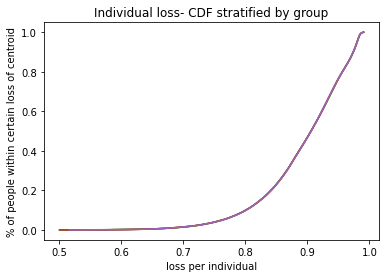

c  {0: (4.6593555912496845, 3.8633925344080606), 1: (-9.863123592175727, -9.638717024007692), 2: (-11.563766861169324, 6.873943946860676), 3: (9.928157250274747, -4.30490542991823), 4: (-2.5449716362029196, 9.072519911442097), 5: (-2.676662317959495, 1.4918958830433604), 6: (2.916516228923596, 9.943977297223531), 7: (4.755898492074023, -1.812406685388494), 8: (-7.60811303979433, -6.33983400231373), 9: (7.489914075577789, 8.287973298035372)}
weights:  [0.1999963  0.20000906 0.1999975  0.20000059 0.19999655]
Time elapsed Batch Step:  0.3439328670501709
Time elapsed Assignment Step:  2.3013789653778076
0.0003192727991461197
total:  0.6259263418261971


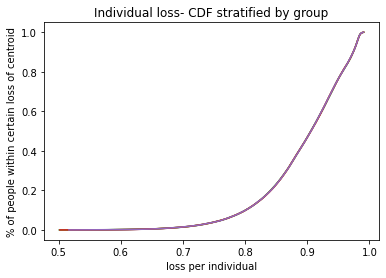

c  {0: (4.658818400742585, 3.86306926641957), 1: (-9.861614015048382, -9.637248640440859), 2: (-11.561809387656494, 6.87366724037904), 3: (9.927560167675775, -4.303102013280097), 4: (-2.543565365310828, 9.071238827033163), 5: (-2.675561321350363, 1.4931426008464925), 6: (2.915319148241319, 9.94265670976931), 7: (4.756020614482333, -1.8112696361850211), 8: (-7.609123095401765, -6.3418634550454795), 9: (7.488107805251945, 8.287145216857478)}
weights:  [0.19999631 0.20000908 0.19999754 0.20000062 0.19999644]
Time elapsed Batch Step:  0.3484499454498291
Time elapsed Assignment Step:  2.276430606842041
0.00032052014370043125
total:  0.6258238397355078


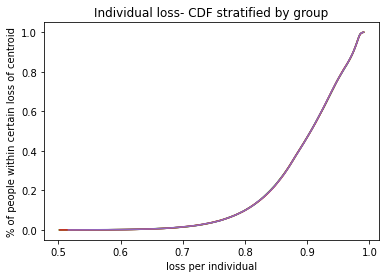

c  {0: (4.658281093932995, 3.862745980235964), 1: (-9.860104198813234, -9.63578000495295), 2: (-11.559850879947687, 6.873390451299235), 3: (9.926962691528985, -4.30129745589758), 4: (-2.5421585738216197, 9.06995731267509), 5: (-2.6744598720082897, 1.4943898886607068), 6: (2.9141213474434746, 9.941335510101988), 7: (4.756142846367214, -1.810132263213082), 8: (-7.610133458203234, -6.3438935809080315), 9: (7.486300504028896, 8.286316675757588)}
weights:  [0.19999633 0.2000091  0.19999758 0.20000066 0.19999634]
Time elapsed Batch Step:  0.35009026527404785
Time elapsed Assignment Step:  2.31634259223938
0.00033286370904406226
total:  0.6257245092493727


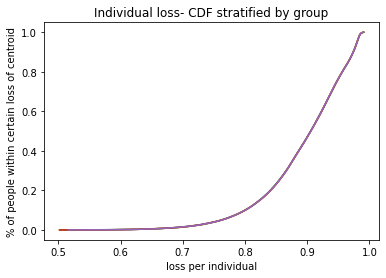

c  {0: (4.657743670777362, 3.8624226758973803), 1: (-9.858594147623366, -9.634311121524512), 2: (-11.557891339600252, 6.8731135800384004), 3: (9.926364821933666, -4.299491758256341), 4: (-2.540751263550323, 9.068675370242918), 5: (-2.6733579707192785, 1.4956377458071854), 6: (2.912922826844913, 9.94001369889578), 7: (4.756265187844597, -1.8089945667955138), 8: (-7.611144125548189, -6.345924374924064), 9: (7.4844921731846155, 8.28548767538948)}
weights:  [0.19999634 0.20000911 0.19999762 0.20000069 0.19999623]
Time elapsed Batch Step:  0.3418385982513428
Time elapsed Assignment Step:  2.299839973449707
0.00034344850004641714
total:  0.6256244927182232


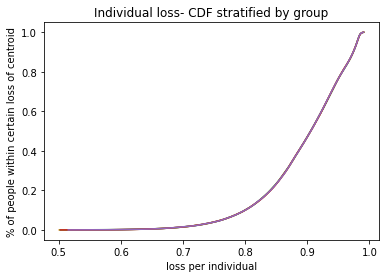

c  {0: (4.657206131232124, 3.8620993534439885), 1: (-9.857083865646452, -9.632841994152697), 2: (-11.555930768185563, 6.872836627015852), 3: (9.925766558991944, -4.297684920851123), 4: (-2.539343436322154, 9.067393001621477), 5: (-2.6722556182744617, 1.4968861716019835), 6: (2.911723586765588, 9.938691276830353), 7: (4.756387639030456, -1.807856547256532), 8: (-7.612155094770373, -6.347955832086048), 9: (7.482682814007745, 8.284658216413035)}
weights:  [0.19999636 0.20000913 0.19999766 0.20000073 0.19999612]
Time elapsed Batch Step:  0.34859395027160645
Time elapsed Assignment Step:  2.252746820449829
0.0003343942710266612
total:  0.6255184265306362


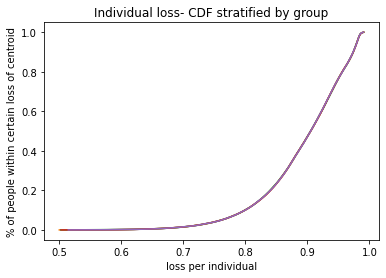

c  {0: (4.656668475253719, 3.8617760129159895), 1: (-9.855573357064676, -9.631372626851244), 2: (-11.553969167289099, 6.872559592653087), 3: (9.925167902808798, -4.295876944185798), 4: (-2.5379350939725427, 9.066110208705412), 5: (-2.6711528154701187, 1.49813516535601), 6: (2.910523627530581, 9.937368244590845), 7: (4.756510200040814, -1.8067182049217339), 8: (-7.613166363187778, -6.34998794735615), 9: (7.480872427799653, 8.28382829949427)}
weights:  [0.19999637 0.20000915 0.1999977  0.20000076 0.19999602]
Time elapsed Batch Step:  0.3434159755706787
Time elapsed Assignment Step:  2.302971839904785
0.0003318557976226266
total:  0.6254142211537161


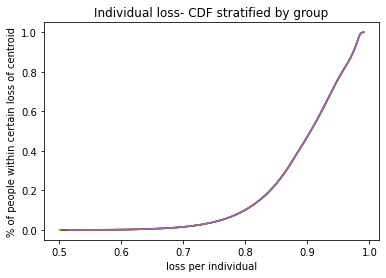

c  {0: (4.656130417570724, 3.8614495437595058), 1: (-9.854062626074667, -9.629903023650444), 2: (-11.552006538510508, 6.872282477373793), 3: (9.924568853492076, -4.294067828773416), 4: (-2.5365262383471596, 9.06482699339921), 5: (-2.670055083960413, 1.4993783264813463), 6: (2.909322949470126, 9.936044602867888), 7: (4.756632870991731, -1.8055795401181012), 8: (-7.614177928102602, -6.35202071566614), 9: (7.47906101587449, 8.282997925305349)}
weights:  [0.19999639 0.20000917 0.19999774 0.20000079 0.19999591]
Time elapsed Batch Step:  0.34041452407836914
Time elapsed Assignment Step:  2.2937304973602295
0.00031951167416000015
total:  0.6253069159114051


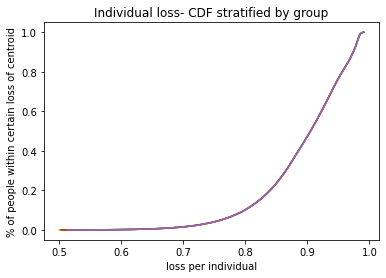

c  {0: (4.655592243647592, 3.861123055663271), 1: (-9.852551676887419, -9.628433188597123), 2: (-11.550042883463679, 6.872005281603856), 3: (9.923969411152509, -4.292257575136255), 4: (-2.535116871301944, 9.063543357617219), 5: (-2.6689569061813807, 1.5006220505238748), 6: (2.9081215529196336, 9.934720352357632), 7: (4.756755651999315, -1.8044405531740026), 8: (-7.615189786801209, -6.354054131917298), 9: (7.477248579559246, 8.282167094524626)}
weights:  [0.1999964  0.20000919 0.19999778 0.20000083 0.1999958 ]
Time elapsed Batch Step:  0.3551754951477051
Time elapsed Assignment Step:  2.358008623123169
0.0003177733533222815
total:  0.625202633925913


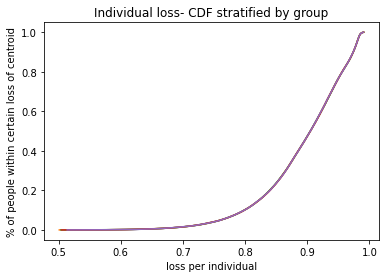

c  {0: (4.655053953441135, 3.8607965486677904), 1: (-9.851040513728218, -9.626963125754608), 2: (-11.54807820377681, 6.87172800577137), 3: (9.923369575903731, -4.29044618380587), 4: (-2.533706994703127, 9.062259303283682), 5: (-2.667858282925569, 1.501866336797143), 6: (2.9069194382197154, 9.933395493761761), 7: (4.756878543179714, -1.8033012444191971), 8: (-7.616201936554092, -6.356088190980315), 9: (7.475435120193815, 8.28133580783666)}
weights:  [0.19999642 0.2000092  0.19999783 0.20000086 0.19999569]
Time elapsed Batch Step:  0.35787272453308105
Time elapsed Assignment Step:  2.3083877563476562
0.0003221099301259356
total:  0.6251000173179723


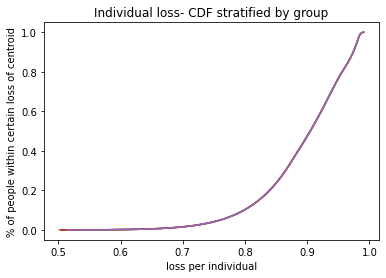

c  {0: (4.654515546908159, 3.8604700228136024), 1: (-9.849529140836562, -9.625492839202698), 2: (-11.546112501092487, 6.8714506503066435), 3: (9.922769347862294, -4.288633655323141), 4: (-2.5322966104272604, 9.060974832332755), 5: (-2.666759214990627, 1.5031111846095966), 6: (2.905716605716208, 9.932070027787521), 7: (4.757001544649119, -1.802161614184837), 8: (-7.617214374615827, -6.358122887695202), 9: (7.473620639131045, 8.280504065932249)}
weights:  [0.19999643 0.20000922 0.19999787 0.20000089 0.19999558]
Time elapsed Batch Step:  0.3395204544067383
Time elapsed Assignment Step:  2.3181185722351074
0.0003173580084019356
total:  0.6249945165682903


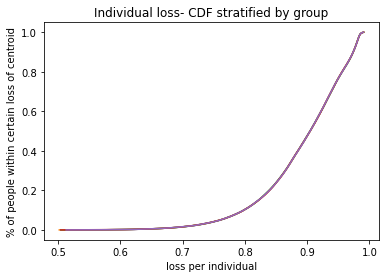

c  {0: (4.653977024005467, 3.860143478141277), 1: (-9.848017562466087, -9.624022333037631), 2: (-11.54414577706774, 6.871173215642211), 3: (9.922168727147687, -4.286819990238323), 4: (-2.5308857203612405, 9.059689946708538), 5: (-2.665659703179324, 1.5043565932645608), 6: (2.9045130557601984, 9.930743955147735), 7: (4.757124656523762, -1.8010216628034694), 8: (-7.618227098225035, -6.360158216871194), 9: (7.471805137736804, 8.279671869508448)}
weights:  [0.19999645 0.20000924 0.19999791 0.20000093 0.19999547]
Time elapsed Batch Step:  0.38347887992858887
Time elapsed Assignment Step:  2.352503776550293
0.00032226125373602255
total:  0.6248917549685475


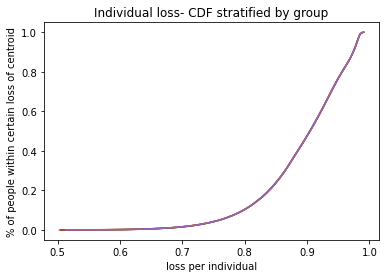

c  {0: (4.653438384689858, 3.859816914691417), 1: (-9.846505782884481, -9.622551611372058), 2: (-11.542178033374125, 6.870895702212842), 3: (9.921567713882348, -4.285005189111098), 4: (-2.529474326402334, 9.058404648365096), 5: (-2.664559748299567, 1.505602562060222), 6: (2.9033087887080486, 9.929417276560827), 7: (4.757247878919915, -1.7998813906090416), 8: (-7.619240104604346, -6.36219417328666), 9: (7.469988617390034, 8.278839219268603)}
weights:  [0.19999646 0.20000926 0.19999795 0.20000096 0.19999536]
Time elapsed Batch Step:  0.3819911479949951
Time elapsed Assignment Step:  2.410642623901367
0.0003164932485103522
total:  0.6247856344315803


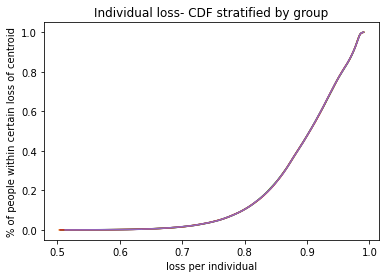

c  {0: (4.652899628918125, 3.859490332504657), 1: (-9.844993806373415, -9.621080678335007), 2: (-11.540209271697794, 6.870618110455545), 3: (9.920966308191685, -4.283189252510625), 4: (-2.5280624304582036, 9.057118939266484), 5: (-2.663459351164419, 1.5068490902896086), 6: (2.90210380492142, 9.928089992750843), 7: (4.757371211953892, -1.7987407979369017), 8: (-7.620253390960356, -6.364230751689006), 9: (7.468171079482812, 8.278006115922373)}
weights:  [0.19999648 0.20000928 0.199998   0.20000099 0.19999525]
Time elapsed Batch Step:  0.34885454177856445
Time elapsed Assignment Step:  2.3251492977142334
0.0003236862810490626
total:  0.624683243902601


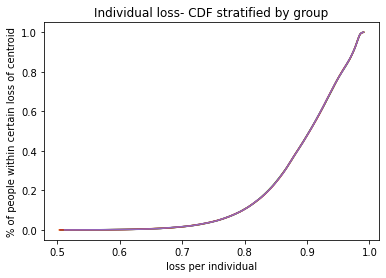

c  {0: (4.6523607566470595, 3.8591637316216625), 1: (-9.843481637228454, -9.619609538071845), 2: (-11.538239493739564, 6.8703404408095805), 3: (9.920364510204092, -4.281372181015587), 4: (-2.526650034446931, 9.055832821386774), 5: (-2.662358512592117, 1.5080961772405723), 6: (2.9008981047672986, 9.926762104447475), 7: (4.757494655742045, -1.7975998851238024), 8: (-7.621266954483589, -6.366267946794584), 9: (7.46635252542041, 8.277172560185763)}
weights:  [0.19999649 0.2000093  0.19999804 0.20000102 0.19999514]
Time elapsed Batch Step:  0.35538673400878906
Time elapsed Assignment Step:  2.306809425354004
0.00031916912186824575
total:  0.6245771820299806


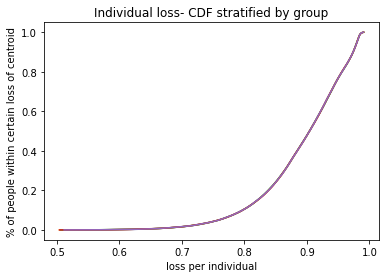

c  {0: (4.651821767833446, 3.858837112083133), 1: (-9.841969279758978, -9.618138194744251), 2: (-11.53626870121499, 6.870062693716471), 3: (9.919762320050964, -4.279553975214244), 4: (-2.5252371402970453, 9.05454629671008), 5: (-2.66125723340609, 1.50934382219577), 6: (2.8996916886180184, 9.925433612386076), 7: (4.757618210400766, -1.796458652507904), 8: (-7.622280792348463, -6.368305753288597), 9: (7.464532956621351, 8.276338552781139)}
weights:  [0.19999651 0.20000932 0.19999809 0.20000106 0.19999503]
Time elapsed Batch Step:  0.3492703437805176
Time elapsed Assignment Step:  2.3965697288513184
0.00032229085025636817
total:  0.6244731637391546


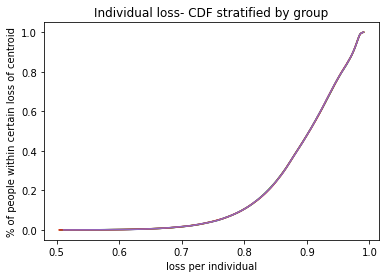

c  {0: (4.651282662434066, 3.8585104739297993), 1: (-9.8404567382881, -9.616666652530169), 2: (-11.534296895854439, 6.869784869620004), 3: (9.919159737866718, -4.277734635704485), 4: (-2.5238237499475424, 9.05325936723058), 5: (-2.6601555144349773, 1.510592024432644), 6: (2.898459668380491, 9.924099113667289), 7: (4.757741876046486, -1.7953171004287773), 8: (-7.623294901713246, -6.370344165825012), 9: (7.462713834974118, 8.275519304328101)}
weights:  [0.19999652 0.20000934 0.19999813 0.20000109 0.19999492]
Time elapsed Batch Step:  0.3557567596435547
Time elapsed Assignment Step:  2.317715883255005
0.0003113875860691895
total:  0.6243647796116799


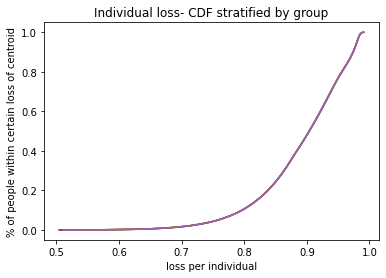

c  {0: (4.650743440405697, 3.8581838172024243), 1: (-9.838944017152587, -9.615194915623777), 2: (-11.532324079403159, 6.869506968966245), 3: (9.918556763788803, -4.2759141630938755), 4: (-2.522409865347914, 9.051972034952545), 5: (-2.6590533565126457, 1.511840783223404), 6: (2.89722692566049, 9.92276397993164), 7: (4.757865652795673, -1.794175229227406), 8: (-7.624309279720023, -6.3723831790264605), 9: (7.460893710659143, 8.274699615209014)}
weights:  [0.19999654 0.20000936 0.19999817 0.20000112 0.19999481]
Time elapsed Batch Step:  0.3456907272338867
Time elapsed Assignment Step:  2.273299217224121
0.0003108354300832561
total:  0.624259342118642


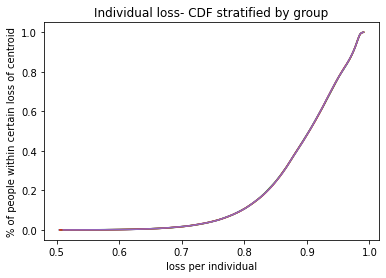

c  {0: (4.650204101705113, 3.857857141941803), 1: (-9.837431120702767, -9.613722988235446), 2: (-11.530350253621352, 6.869228992203548), 3: (9.91795339795773, -4.27409255799971), 4: (-2.520995488458167, 9.050684301890355), 5: (-2.657950760478209, 1.5130900978350075), 6: (2.8959934608884645, 9.921428211936203), 7: (4.757989540764834, -1.79303303924619), 8: (-7.62532392349466, -6.3744227874841535), 9: (7.459072585137998, 8.273879486145)}
weights:  [0.19999655 0.20000938 0.19999822 0.20000116 0.1999947 ]
Time elapsed Batch Step:  0.3504331111907959
Time elapsed Assignment Step:  2.3417956829071045
0.00030906046836542966
total:  0.6241533792133177


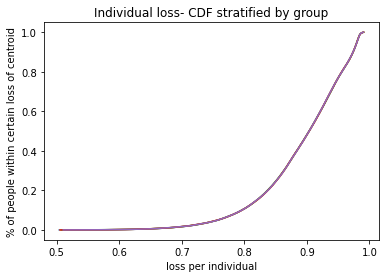

c  {0: (4.649664646289083, 3.8575304481887622), 1: (-9.835918053302455, -9.6122508745917), 2: (-11.528375420284252, 6.868950939782561), 3: (9.917349640517076, -4.272269821049066), 4: (-2.5195806212488505, 9.049396170068533), 5: (-2.6568477271760442, 1.5143399675291414), 6: (2.8947592745005877, 9.920091810444134), 7: (4.758113540070511, -1.7918905308289483), 8: (-7.626338830146763, -6.3764629857577875), 9: (7.457250459885588, 8.273058917863457)}
weights:  [0.19999657 0.2000094  0.19999826 0.20000119 0.19999458]
Time elapsed Batch Step:  0.36217331886291504
Time elapsed Assignment Step:  2.3104817867279053
0.0003023892721483179
total:  0.6240457889001648


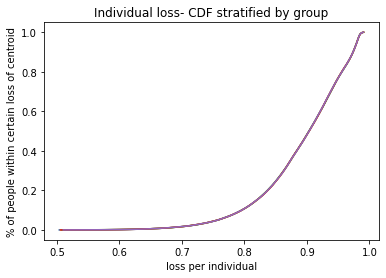

c  {0: (4.649125074114372, 3.8572037359841618), 1: (-9.834404819328862, -9.610778578935172), 2: (-11.526399581182192, 6.868672812156234), 3: (9.916745491613506, -4.27044595287885), 4: (-2.518165265701078, 9.048107641521767), 5: (-2.6557442574558126, 1.515590391562203), 6: (2.8935243669387822, 9.918754776224695), 7: (4.758237650829283, -1.790747704320922), 8: (-7.6273539967696475, -6.378503768375454), 9: (7.455427336390205, 8.272237911098083)}
weights:  [0.19999659 0.20000941 0.19999831 0.20000122 0.19999447]
Time elapsed Batch Step:  0.35301709175109863
Time elapsed Assignment Step:  2.3149120807647705
0.0003011115636265549
total:  0.6239396443735826


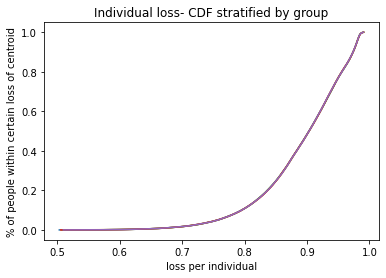

c  {0: (4.6485784709410956, 3.8568841332857153), 1: (-9.83289142317251, -9.609306105524562), 2: (-11.524422738120679, 6.868394609779831), 3: (9.916140951396795, -4.268620954135856), 4: (-2.5167494238065475, 9.04681871829493), 5: (-2.6546403521724753, 1.5168413691852811), 6: (2.8922887386507483, 9.917417110053274), 7: (4.758363732943362, -1.7896032027448243), 8: (-7.6283694204403, -6.380545129833548), 9: (7.453603216153587, 8.2714164665889)}
weights:  [0.1999966  0.20000943 0.19999835 0.20000125 0.19999436]
Time elapsed Batch Step:  0.348696231842041
Time elapsed Assignment Step:  2.3627822399139404
0.0002975653848323878
total:  0.6238326609985522


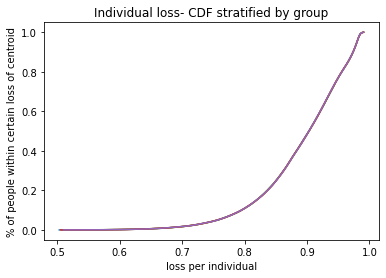

c  {0: (4.648031746221945, 3.856564512800828), 1: (-9.83137786923715, -9.607833458634593), 2: (-11.52244489292047, 6.86811633311094), 3: (9.91553602001984, -4.266794825476811), 4: (-2.5153330975675687, 9.045529402443105), 5: (-2.653536012186313, 1.5180928996441363), 6: (2.8910523900899894, 9.916078812711412), 7: (4.758489928176961, -1.788458378882909), 8: (-7.629385098219343, -6.38258706459668), 9: (7.45177810069098, 8.270594585082282)}
weights:  [0.19999662 0.20000945 0.1999984  0.20000128 0.19999424]
Time elapsed Batch Step:  0.3418135643005371
Time elapsed Assignment Step:  2.3588547706604004
0.00031141211489471576
total:  0.6237307254956197


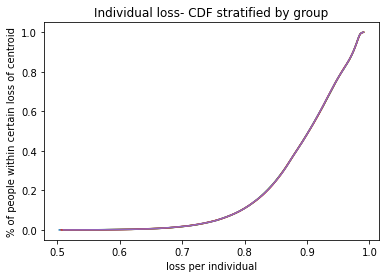

c  {0: (4.647476932844354, 3.856250853319597), 1: (-9.829864161939666, -9.606360642555968), 2: (-11.520466047417646, 6.867837982609478), 3: (9.91493069763868, -4.264967567568432), 4: (-2.513916288997082, 9.044239696031612), 5: (-2.652431238362944, 1.5193449821791827), 6: (2.8898153217158393, 9.914739884986824), 7: (4.75861918096163, -1.7873132716444953), 8: (-7.630401027151004, -6.384629567097585), 9: (7.449951991531194, 8.269772267330984)}
weights:  [0.19999664 0.20000947 0.19999844 0.20000132 0.19999413]
Time elapsed Batch Step:  0.3693053722381592
Time elapsed Assignment Step:  2.3264544010162354
0.00030336544148179545
total:  0.6236220636754091


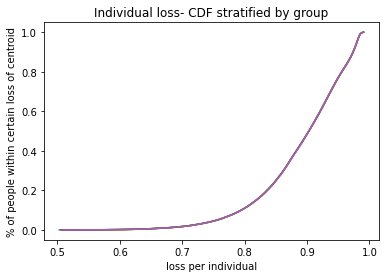

c  {0: (4.646921993246115, 3.855937175867768), 1: (-9.82835030571, -9.60488766159532), 2: (-11.51848620346368, 6.867559558737701), 3: (9.914324984412513, -4.263139181087474), 4: (-2.51249900011868, 9.04294960113603), 5: (-2.651326031573342, 1.5205976160254684), 6: (2.888577533993489, 9.913400327673429), 7: (4.758748549278371, -1.7861678393106362), 8: (-7.631417204263079, -6.386672631737034), 9: (7.448124890216662, 8.268949514094158)}
weights:  [0.19999665 0.20000949 0.19999849 0.20000135 0.19999401]
Time elapsed Batch Step:  0.36953163146972656
Time elapsed Assignment Step:  2.306914806365967
0.0002972689196982792
total:  0.623513827982792


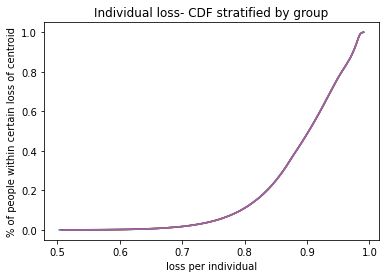

c  {0: (4.646366927378131, 3.8556234804834335), 1: (-9.826836304991055, -9.603414520075166), 2: (-11.516505362925525, 6.867281061960217), 3: (9.913718880503714, -4.261309666720786), 4: (-2.511081232966633, 9.04165911984222), 5: (-2.650220392693854, 1.5218508004126567), 6: (2.887339027394015, 9.912060141571363), 7: (4.758878033247862, -1.7850220822178942), 8: (-7.632433626566899, -6.388716252883744), 9: (7.446296798303501, 8.268126326137391)}
weights:  [0.19999667 0.20000951 0.19999854 0.20000138 0.1999939 ]
Time elapsed Batch Step:  0.37279820442199707
Time elapsed Assignment Step:  2.307097911834717
0.0003101287264909436
total:  0.6234111208509036


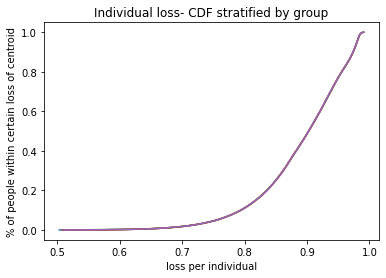

c  {0: (4.645811735191299, 3.855309767204717), 1: (-9.825322164238608, -9.601941222333854), 2: (-11.514523527685672, 6.867002492743989), 3: (9.913112386077854, -4.259479025165362), 4: (-2.5096629895859044, 9.04036825424635), 5: (-2.6491143226062213, 1.523104534565007), 6: (2.886099802394403, 9.91071932748701), 7: (4.759007632990821, -1.7838760007042604), 8: (-7.633450291057297, -6.3907604248742915), 9: (7.44446771736157, 8.267302704232723)}
weights:  [0.19999669 0.20000953 0.19999858 0.20000142 0.19999378]
Time elapsed Batch Step:  0.33934879302978516
Time elapsed Assignment Step:  2.338810682296753
0.00031598244712616186
total:  0.623306142108615


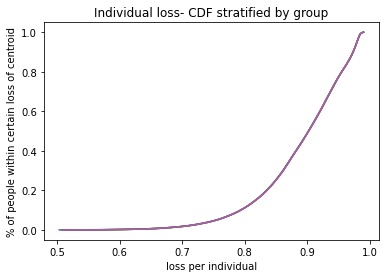

c  {0: (4.645248146000891, 3.8550017272306256), 1: (-9.823807887921228, -9.600467772725523), 2: (-11.512540699642237, 6.86672385155835), 3: (9.912505501303716, -4.257647257128395), 4: (-2.5082442720321767, 9.039077006454912), 5: (-2.648007822197595, 1.5243588177013547), 6: (2.88485985947758, 9.909377886233024), 7: (4.759140448693911, -1.782730046769884), 8: (-7.63446719471258, -6.392805142013024), 9: (7.442637648974527, 8.266478649158671)}
weights:  [0.1999967  0.20000955 0.19999863 0.20000145 0.19999367]
Time elapsed Batch Step:  0.3418879508972168
Time elapsed Assignment Step:  2.318817615509033
0.00031231180652191437
total:  0.6231981477035328


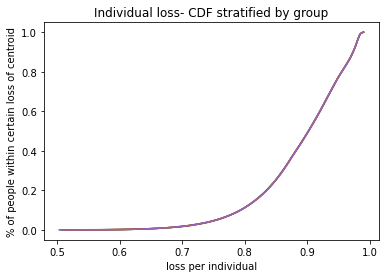

c  {0: (4.644684425833392, 3.8546936689113185), 1: (-9.82229348052018, -9.598994175620039), 2: (-11.510556880709032, 6.86644513887501), 3: (9.911898226353314, -4.255814363327331), 4: (-2.5068250823718685, 9.037785378584758), 5: (-2.6469008923605557, 1.5256136490350933), 6: (2.8836191991324367, 9.908035818628354), 7: (4.759273382654435, -1.7815837660404183), 8: (-7.6354843344944925, -6.394850398571971), 9: (7.440806594739894, 8.265654161700263)}
weights:  [0.19999672 0.20000957 0.19999867 0.20000148 0.19999355]
Time elapsed Batch Step:  0.3572516441345215
Time elapsed Assignment Step:  2.352829694747925
0.00030882636940543495
total:  0.6230900500201177


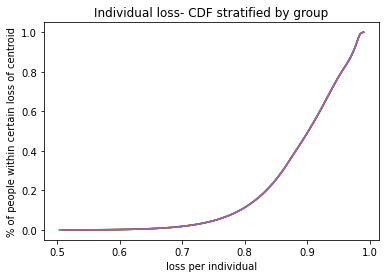

c  {0: (4.6441205746371965, 3.854385592283676), 1: (-9.820778946529336, -9.597520435402952), 2: (-11.508572072815644, 6.86616635516806), 3: (9.911290561401911, -4.253980344489916), 4: (-2.5054054226821565, 9.036493372763108), 5: (-2.6457935339931318, 1.5268690277741546), 6: (2.8823778218538583, 9.906693125498267), 7: (4.759406434995472, -1.7804371588502987), 8: (-7.636501707348187, -6.396896188790759), 9: (7.438974556269111, 8.264829242649059)}
weights:  [0.19999673 0.20000959 0.19999872 0.20000152 0.19999343]
Time elapsed Batch Step:  0.3454017639160156
Time elapsed Assignment Step:  2.2532548904418945
0.0003045204909136734
total:  0.6229815479551535


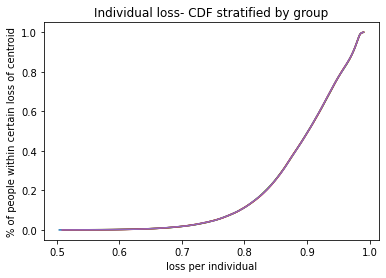

c  {0: (4.643556592360695, 3.8540774973846084), 1: (-9.81926429045509, -9.59604655647544), 2: (-11.506586277907504, 6.865887500913991), 3: (9.910682506628039, -4.252145201354259), 4: (-2.5039852950509944, 9.035200991127581), 5: (-2.6446857479988184, 1.5281249531209886), 6: (2.8811357281427497, 9.905349807674368), 7: (4.759539605840139, -1.779290225535389), 8: (-7.637519310202196, -6.3989425068765255), 9: (7.437141535187599, 8.264003892803172)}
weights:  [0.19999675 0.20000961 0.19999877 0.20000155 0.19999332]
Time elapsed Batch Step:  0.34835314750671387
Time elapsed Assignment Step:  2.344768524169922
0.0003000813120581647
total:  0.6228728476518546


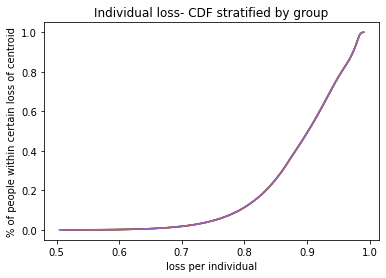

c  {0: (4.642992478952276, 3.853769384251056), 1: (-9.817749516816265, -9.594572543254248), 2: (-11.50459949794597, 6.865608576591695), 3: (9.910074062213514, -4.25030893466888), 4: (-2.502564701577132, 9.03390823582622), 5: (-2.643577535286595, 1.5293814242725456), 6: (2.8798929185060644, 9.90400586599463), 7: (4.75967289531159, -1.7781429664329864), 8: (-7.638537139968398, -6.40098934700383), 9: (7.435307533134819, 8.263178112967307)}
weights:  [0.19999677 0.20000963 0.19999881 0.20000159 0.1999932 ]
Time elapsed Batch Step:  0.5750908851623535
Time elapsed Assignment Step:  3.946335792541504
0.00029312119881430565
total:  0.6227632607711769


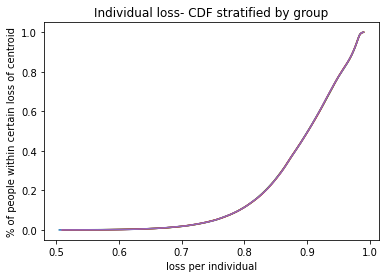

c  {0: (4.64242309036377, 3.853448771712664), 1: (-9.816234630144024, -9.593098400171645), 2: (-11.502611734908399, 6.865329582682479), 3: (9.909465228343457, -4.248471545192763), 4: (-2.5011436443701336, 9.032615109017502), 5: (-2.642468896770945, 1.5306384404202562), 6: (2.878649393456831, 9.90266130130342), 7: (4.759806303533016, -1.7769953818818236), 8: (-7.639555193541993, -6.403036703314573), 9: (7.433480282346564, 8.262353624400411)}
weights:  [0.19999679 0.20000965 0.19999886 0.20000162 0.19999308]
Time elapsed Batch Step:  0.3462255001068115
Time elapsed Assignment Step:  2.2721593379974365
0.00031406825420199347
total:  0.6226618875457245


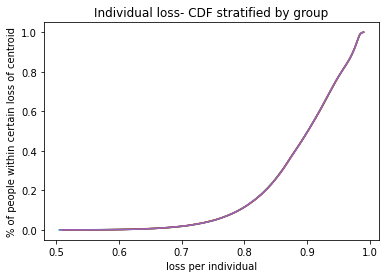

c  {0: (4.641853566645505, 3.8531281424575328), 1: (-9.814719634981778, -9.591624131675353), 2: (-11.500622990788228, 6.8650505196700715), 3: (9.90885600520631, -4.246633033695416), 4: (-2.4997221255503983, 9.031321612870377), 5: (-2.6413598333718737, 1.5318960007500113), 6: (2.877405153514182, 9.901316114451511), 7: (4.759939830627642, -1.775847472222072), 8: (-7.6405734678014685, -6.405084569917905), 9: (7.43165205354234, 8.261528705691457)}
weights:  [0.1999968  0.20000967 0.1999989  0.20000166 0.19999297]
Time elapsed Batch Step:  0.3543715476989746
Time elapsed Assignment Step:  2.3216609954833984
0.0003285980175433689
total:  0.6225584308668732


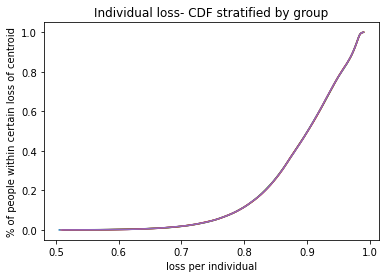

c  {0: (4.641283907745661, 3.8528074965258376), 1: (-9.813204535885099, -9.5901497422285), 2: (-11.498633267595046, 6.864771388040634), 3: (9.908246392993858, -4.244793400956918), 4: (-2.4983001472491764, 9.030027749564274), 5: (-2.6402503460149265, 1.533154104442144), 6: (2.87616019920338, 9.899970306296117), 7: (4.760073476718731, -1.7746992377953452), 8: (-7.6415919596085775, -6.4071329408901505), 9: (7.429822848350089, 8.260703357639079)}
weights:  [0.19999682 0.20000969 0.19999895 0.20000169 0.19999285]
Time elapsed Batch Step:  0.3562910556793213
Time elapsed Assignment Step:  2.354834794998169
0.0003465274729144152
total:  0.6224558360274445


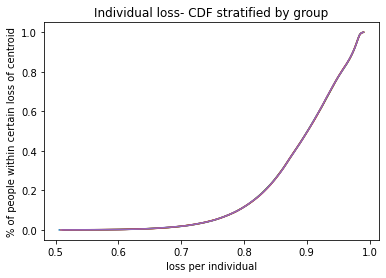

c  {0: (4.6407141136124155, 3.8524868339577854), 1: (-9.811689337421626, -9.588675236309554), 2: (-11.496642567354677, 6.864492188282767), 3: (9.907636391901246, -4.242952647767979), 4: (-2.496877711608587, 9.028733521289134), 5: (-2.6391404356312087, 1.534412750671409), 6: (2.8749145310558473, 9.898623877700915), 7: (4.760207241929579, -1.773550678944701), 8: (-7.642610665808307, -6.409181810274715), 9: (7.427992668411737, 8.259877581048464)}
weights:  [0.19999684 0.20000971 0.199999   0.20000172 0.19999273]
Time elapsed Batch Step:  0.337860107421875
Time elapsed Assignment Step:  2.2988851070404053
0.0003560916883960097
total:  0.6223505730447834


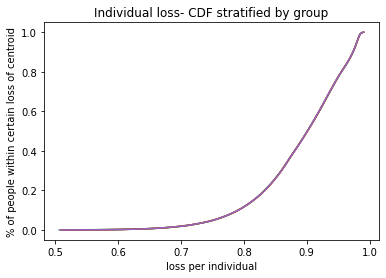

c  {0: (4.640144184193942, 3.852166154793615), 1: (-9.81017404417098, -9.587200618412268), 2: (-11.494650892109249, 6.8642129208875255), 3: (9.907026002126994, -4.241110774929991), 4: (-2.495454820781636, 9.027438930245424), 5: (-2.6380301031574036, 1.5356719386069637), 6: (2.8736681496091925, 9.897276829536066), 7: (4.760341126383515, -1.7724017960146459), 8: (-7.643629583228851, -6.411231172082009), 9: (7.4261615153832485, 8.259051376731382)}
weights:  [0.19999686 0.20000973 0.19999904 0.20000176 0.19999262]
Time elapsed Batch Step:  0.33876490592956543
Time elapsed Assignment Step:  2.3167879581451416
0.00036001765528237417
total:  0.6222434759481416


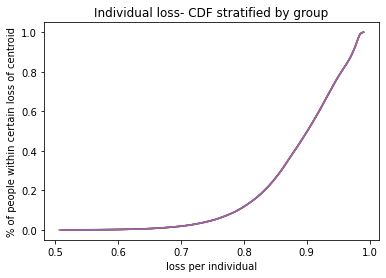

c  {0: (4.639574119438412, 3.8518454590735964), 1: (-9.808660877195587, -9.585723841956046), 2: (-11.49265824391728, 6.863933586348421), 3: (9.906415223873022, -4.239267783255087), 4: (-2.494031476932232, 9.02614397864416), 5: (-2.6369193495357908, 1.536931667412349), 6: (2.872421055407239, 9.895929162678241), 7: (4.760475130203903, -1.7712525893511364), 8: (-7.644640346827187, -6.4132803752293555), 9: (7.424329390934687, 8.258224745506205)}
weights:  [0.19999687 0.20000975 0.19999909 0.20000179 0.1999925 ]
Time elapsed Batch Step:  0.36660170555114746
Time elapsed Assignment Step:  2.30338454246521
0.00036355944618460256
total:  0.6221361057967383


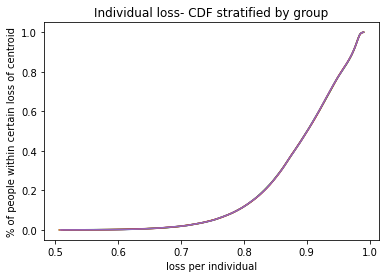

c  {0: (4.6390039192939945, 3.8515247468380323), 1: (-9.807147646356434, -9.584246981510407), 2: (-11.490664624853752, 6.863654185161434), 3: (9.905804057344668, -4.237423673566194), 4: (-2.4926076822352026, 9.024848668706934), 5: (-2.6358081757142653, 1.5381919362454686), 6: (2.8711732490000523, 9.894580878010649), 7: (4.76060925351414, -1.7701030593015834), 8: (-7.645651326157675, -6.415330087110984), 9: (7.422496296750275, 8.257397688197935)}
weights:  [0.19999689 0.20000977 0.19999914 0.20000182 0.19999238]
Time elapsed Batch Step:  0.33884477615356445
Time elapsed Assignment Step:  2.337705612182617
0.00036190170894911944
total:  0.6220270180543533


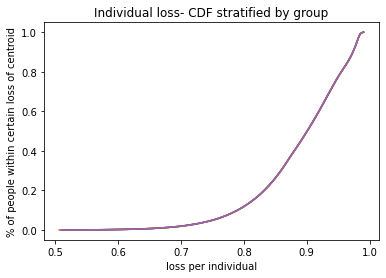

c  {0: (4.638433583708857, 3.851204018127256), 1: (-9.80563435633819, -9.582770041689466), 2: (-11.488670037010191, 6.863374717825027), 3: (9.905192502750701, -4.235578446697086), 4: (-2.4911834388763103, 9.02355300266592), 5: (-2.6346965826463564, 1.5394527442585708), 6: (2.8699247309439695, 9.893231976423051), 7: (4.760743496437654, -1.7689532062148547), 8: (-7.646662518090765, -6.417380301792284), 9: (7.4206622345284545, 8.256570205638234)}
weights:  [0.19999691 0.20000978 0.19999919 0.20000185 0.19999227]
Time elapsed Batch Step:  0.3374166488647461
Time elapsed Assignment Step:  2.3536224365234375
0.0003620878518850734
total:  0.6219183254484557


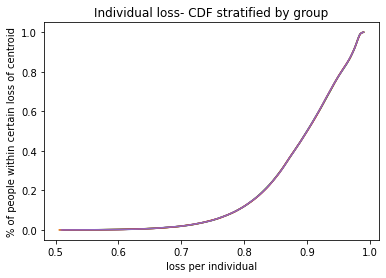

c  {0: (4.637863112631163, 3.8508832729816334), 1: (-9.80412101183698, -9.581293027122312), 2: (-11.486674482494744, 6.863095184840148), 3: (9.904580560303346, -4.233732103492445), 4: (-2.489758749052268, 9.022256982763912), 5: (-2.6335845712912462, 1.5407140905982284), 6: (2.8686755018016266, 9.891882458811798), 7: (4.7608778590979055, -1.7678030304412782), 8: (-7.64767391948026, -6.419431013305707), 9: (7.4188272059819464, 8.255742298665437)}
weights:  [0.19999693 0.2000098  0.19999924 0.20000188 0.19999215]
Time elapsed Batch Step:  0.3504061698913574
Time elapsed Assignment Step:  2.298496723175049
0.00036296633835886105
total:  0.6218096830857894


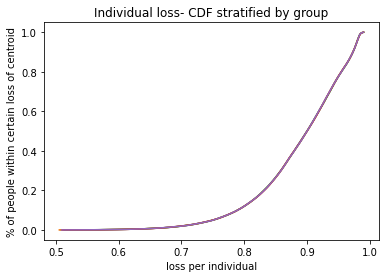

c  {0: (4.637292506009076, 3.850562511441561), 1: (-9.802607617560282, -9.57981594245294), 2: (-11.484677963432258, 6.862815586710243), 3: (9.903968230218302, -4.231884644807911), 4: (-2.4883336149707533, 9.020960611254328), 5: (-2.6324721426137887, 1.5419759744053185), 6: (2.8674255621419866, 9.890532326079844), 7: (4.761012341618384, -1.7666525323326447), 8: (-7.648685527163291, -6.421482215650681), 9: (7.41699121283781, 8.25491396812459)}
weights:  [0.19999694 0.20000982 0.19999929 0.20000192 0.19999203]
Time elapsed Batch Step:  0.34464359283447266
Time elapsed Assignment Step:  2.310941457748413
0.000365395251153533
total:  0.6217013489013994


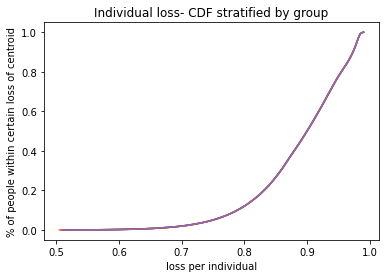

c  {0: (4.636721763790755, 3.8502417335474677), 1: (-9.801094178226844, -9.578338792340189), 2: (-11.48268048196436, 6.862535923941266), 3: (9.90335551271476, -4.230036071510144), 4: (-2.486908038850423, 9.019663890401242), 5: (-2.6313592975845284, 1.543238394815004), 6: (2.866174912540369, 9.889181579136778), 7: (4.761146944122612, -1.7655017122422112), 8: (-7.649697337960291, -6.423533902793526), 9: (7.415154256837502, 8.254085214867473)}
weights:  [0.19999696 0.20000984 0.19999933 0.20000195 0.19999192]
Time elapsed Batch Step:  0.35285067558288574
Time elapsed Assignment Step:  2.293482542037964
0.0003644732472448675
total:  0.6215918519495838


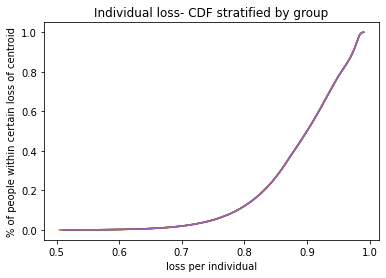

c  {0: (4.636150885924358, 3.8499209393398135), 1: (-9.799580698566581, -9.576861581457658), 2: (-11.480682040249537, 6.862256197041685), 3: (9.902742408015424, -4.2281863844768734), 4: (-2.485482022920927, 9.018366822479395), 5: (-2.630246037179719, 1.5445013509567127), 6: (2.8649235535784765, 9.887830218898841), 7: (4.76128166673414, -1.7643505705247038), 8: (-7.65070934867497, -6.425586068667379), 9: (7.413316339736938, 8.253256039752618)}
weights:  [0.19999698 0.20000986 0.19999938 0.20000198 0.1999918 ]
Time elapsed Batch Step:  0.354931116104126
Time elapsed Assignment Step:  2.34744930267334
0.0003622342376649046
total:  0.6214818022097389


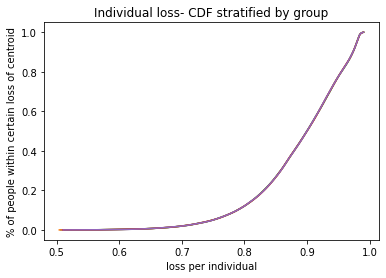

c  {0: (4.63557987235804, 3.84960012885909), 1: (-9.798067183320489, -9.575384314493652), 2: (-11.478682640463212, 6.861976406522496), 3: (9.902128916346525, -4.226335584596962), 4: (-2.4840555694229214, 9.01706940977422), 5: (-2.6291323623813425, 1.5457648419541188), 6: (2.8636714858444257, 9.886478246288961), 7: (4.761416509576548, -1.7631991075363205), 8: (-7.651721556094295, -6.427638707172107), 9: (7.4114774633065545, 8.252426443645343)}
weights:  [0.199997   0.20000988 0.19999943 0.20000201 0.19999168]
Time elapsed Batch Step:  0.3513650894165039
Time elapsed Assignment Step:  2.2777836322784424
0.0003543143725803777
total:  0.621369891474638


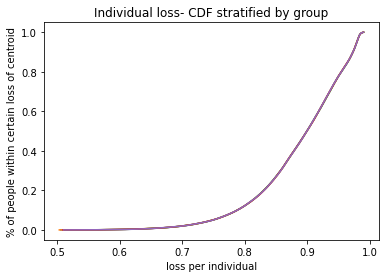

c  {0: (4.635008723039955, 3.8492793021458214), 1: (-9.796553637240546, -9.573906996151097), 2: (-11.47668228479783, 6.8616965528972305), 3: (9.90151503793785, -4.224483672770455), 4: (-2.4826286806080806, 9.015771654581853), 5: (-2.628018274177128, 1.5470288669251222), 6: (2.8624187099327734, 9.885125662236765), 7: (4.761551472773442, -1.762047323634735), 8: (-7.652733956988468, -6.429691812174225), 9: (7.409637629331364, 8.251596427417773)}
weights:  [0.19999701 0.2000099  0.19999948 0.20000204 0.19999157]
Time elapsed Batch Step:  0.3412442207336426
Time elapsed Assignment Step:  2.3231847286224365
0.0003452801470751332
total:  0.6212574889242953


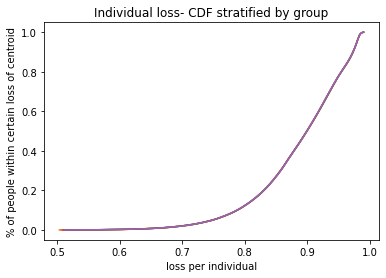

c  {0: (4.634437437918255, 3.848958459240562), 1: (-9.795040065089623, -9.572429631147475), 2: (-11.47468097546293, 6.861416636681963), 3: (9.900900773022753, -4.222630649908642), 4: (-2.4812013587391104, 9.014473559209158), 5: (-2.626903773560571, 1.5482934249818292), 6: (2.861165226444547, 9.883772467678615), 7: (4.761686556448458, -1.760895219179099), 8: (-7.653746548110898, -6.4317453775068225), 9: (7.40779683961102, 8.25076599194887)}
weights:  [0.19999703 0.20000992 0.19999953 0.20000207 0.19999145]
Time elapsed Batch Step:  0.3455386161804199
Time elapsed Assignment Step:  2.3485188484191895
0.00034329846638336825
total:  0.6211470443891863


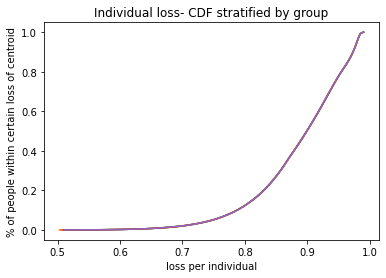

c  {0: (4.633866016941089, 3.8486376001838987), 1: (-9.793526471641389, -9.570952224214746), 2: (-11.472678714685232, 6.861136658395325), 3: (9.900286121838182, -4.220776516934114), 4: (-2.4797736060897586, 9.013175125973746), 5: (-2.625788861530952, 1.549558515230533), 6: (2.8599110359872726, 9.882418663557623), 7: (4.76182176072526, -1.7597427945300457), 8: (-7.654759326198189, -6.43379939696948), 9: (7.405955095959876, 8.249935138124446)}
weights:  [0.19999705 0.20000993 0.19999958 0.2000021  0.19999133]
Time elapsed Batch Step:  0.3557288646697998
Time elapsed Assignment Step:  2.312784433364868
0.0003404744691518635
total:  0.6210361903674195


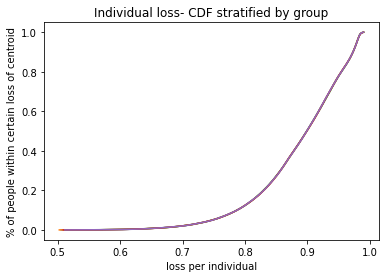

c  {0: (4.6332944600566055, 3.848316725016449), 1: (-9.792012861680222, -9.56947478009928), 2: (-11.470675504708716, 6.860856618558509), 3: (9.899671084624687, -4.218921274780818), 4: (-2.478345424944828, 9.011876357203983), 5: (-2.624673539093355, 1.5508241367716928), 6: (2.8586561391750047, 9.881064250823684), 7: (4.761957085727535, -1.7585900500496925), 8: (-7.655772287970112, -6.43585386432819), 9: (7.404112400207045, 8.249103866837208)}
weights:  [0.19999707 0.20000995 0.19999963 0.20000213 0.19999122]
Time elapsed Batch Step:  0.35115909576416016
Time elapsed Assignment Step:  2.3082220554351807
0.00034557478124486174
total:  0.6209275567483977


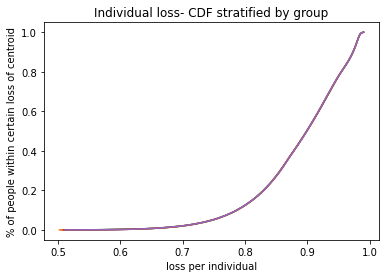

c  {0: (4.63272276721295, 3.8479958337788633), 1: (-9.790499240001116, -9.567997303561777), 2: (-11.468671347794702, 6.860576517695283), 3: (9.899055661626457, -4.217064924394114), 4: (-2.4769168176001837, 9.010577255239017), 5: (-2.6235578072586874, 1.5520902886999157), 6: (2.8574005366283535, 9.879709230433496), 7: (4.762092531578999, -1.7574369861016443), 8: (-7.656785430129589, -6.43790877331528), 9: (7.402268754196461, 8.248272178986765)}
weights:  [0.19999708 0.20000997 0.19999968 0.20000216 0.1999911 ]
Time elapsed Batch Step:  0.3434455394744873
Time elapsed Assignment Step:  2.3525350093841553
0.0003392242641080401
total:  0.6208153294958376


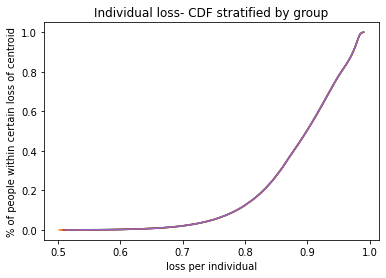

c  {0: (4.632150938358268, 3.8476749265118224), 1: (-9.788985611409586, -9.56651979937719), 2: (-11.466666246221932, 6.860296356331997), 3: (9.898439853091324, -4.215207466730837), 4: (-2.4754877863627667, 9.00927782242879), 5: (-2.6224416670436987, 1.5533569701039351), 6: (2.8561442289745154, 9.878353603350586), 7: (4.762228098403389, -1.7562836030509967), 8: (-7.6577987493626765, -6.439964117629336), 9: (7.400424159786941, 8.247440075479663)}
weights:  [0.1999971  0.20000999 0.19999973 0.20000219 0.19999099]
Time elapsed Batch Step:  0.37050700187683105
Time elapsed Assignment Step:  2.34047794342041
0.00034470782392093113
total:  0.6207064948424013


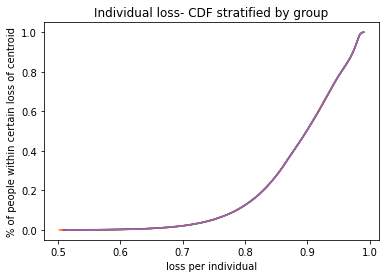

c  {0: (4.631578973440701, 3.847354003256039), 1: (-9.787471980721582, -9.56504227233466), 2: (-11.464660202286648, 6.860016134997593), 3: (9.897823659270792, -4.213348902759351), 4: (-2.4740583335506003, 9.00797806113406), 5: (-2.6213251194709994, 1.554624180066592), 6: (2.854887216847301, 9.876997370545332), 7: (4.76236378632447, -1.7551299012643389), 8: (-7.658812242338544, -6.442019890935123), 9: (7.398578618852243, 8.246607557229407)}
weights:  [0.19999712 0.20001001 0.19999978 0.20000222 0.19999087]
Time elapsed Batch Step:  0.35442495346069336
Time elapsed Assignment Step:  2.3480734825134277
0.0003606266870739283
total:  0.6206006583097788


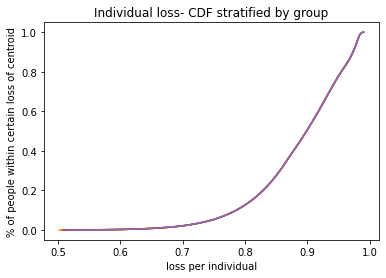

c  {0: (4.631001101106617, 3.847019964637023), 1: (-9.785958352763396, -9.563564727237429), 2: (-11.46265321830268, 6.859735854223617), 3: (9.897207080420053, -4.211489233459609), 4: (-2.4726284614928002, 9.006677973726402), 5: (-2.6202081655690805, 1.555891917664815), 6: (2.853629500887166, 9.875640532994996), 7: (4.762499595466029, -1.7539758811097566), 8: (-7.659825905709459, -6.444076086863513), 9: (7.396739716924496, 8.24577533607399)}
weights:  [0.19999714 0.20001003 0.19999983 0.20000225 0.19999075]
Time elapsed Batch Step:  0.35187315940856934
Time elapsed Assignment Step:  2.3708419799804688
0.0003659888874039119
total:  0.6204914977145566


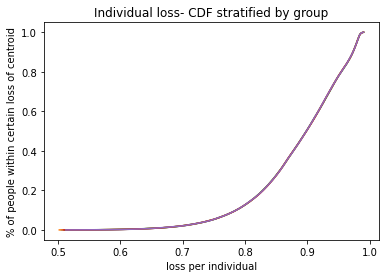

c  {0: (4.630423088530492, 3.84668591201874), 1: (-9.784444732371572, -9.562087168902766), 2: (-11.460645296601525, 6.859455514544224), 3: (9.896590116798011, -4.209628459823211), 4: (-2.4711981725295824, 9.005377562588244), 5: (-2.619090806372331, 1.557160181969599), 6: (2.8523710817412384, 9.874283091683738), 7: (4.762635525951876, -1.7528215429568352), 8: (-7.660839736110771, -6.446132699011405), 9: (7.394899871276931, 8.24494269926466)}
weights:  [0.19999715 0.20001005 0.19999988 0.20000228 0.19999064]
Time elapsed Batch Step:  0.34853363037109375
Time elapsed Assignment Step:  2.3115570545196533
0.0003666606484548085
total:  0.6203807738598976


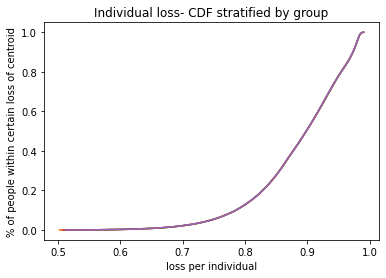

c  {0: (4.629844935660461, 3.8463518454453554), 1: (-9.782931124392817, -9.560609602161891), 2: (-11.458636439532425, 6.859175116496191), 3: (9.895972768667301, -4.207766582853461), 4: (-2.469767469012271, 9.004076830112863), 5: (-2.6179730429210597, 1.5584289720459876), 6: (2.8511119600633488, 9.87292504760265), 7: (4.762771577905843, -1.7516668871766632), 8: (-7.661853730160894, -6.448189720941655), 9: (7.393059083773513, 8.244109647709646)}
weights:  [0.19999717 0.20001007 0.19999993 0.20000231 0.19999052]
Time elapsed Batch Step:  0.3505589962005615
Time elapsed Assignment Step:  2.2825305461883545
0.0003630860266415903
total:  0.6202686197480972


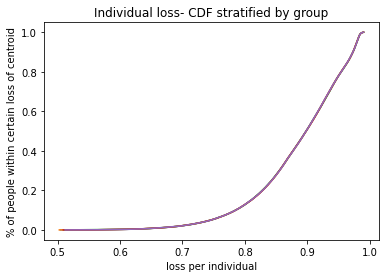

c  {0: (4.629266642444658, 3.8460177649610676), 1: (-9.781417533683912, -9.5591320318599), 2: (-11.456626649462457, 6.858894660618926), 3: (9.895355036294305, -4.205903603565427), 4: (-2.468336353303304, 9.002775778704414), 5: (-2.6168548762615114, 1.5596982869530511), 6: (2.8498521365140594, 9.87156640174977), 7: (4.762907751451784, -1.7505119141418344), 8: (-7.662867884461296, -6.450247146183001), 9: (7.391217356293098, 8.24327618232411)}
weights:  [0.19999719 0.20001009 0.19999998 0.20000235 0.19999041]
Time elapsed Batch Step:  0.35332632064819336
Time elapsed Assignment Step:  2.3073761463165283
0.00035758880718039787
total:  0.6201557330635808


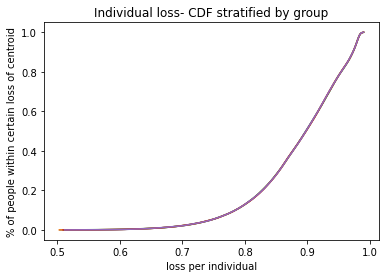

c  {0: (4.628688208831213, 3.845683670610107), 1: (-9.779903965111622, -9.557654462855677), 2: (-11.45461592877661, 6.858614147454476), 3: (9.894736919949178, -4.204039522986001), 4: (-2.4669048277762413, 9.001474410777936), 5: (-2.6157363074458884, 1.5609681257438677), 6: (2.8485916117606953, 9.870207155130126), 7: (4.763044046713573, -1.7493566242264522), 8: (-7.66388219559648, -6.452304968229988), 9: (7.3893746907295, 8.242442304030176)}
weights:  [0.1999972  0.20001011 0.20000003 0.20000238 0.19999029]
Time elapsed Batch Step:  0.3465864658355713
Time elapsed Assignment Step:  2.36950945854187
0.0003365722311803321
total:  0.6200380639562153


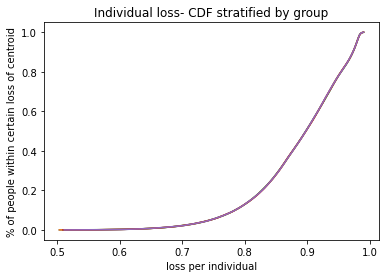

c  {0: (4.628109634768259, 3.845349562436738), 1: (-9.77839042355261, -9.556176900021827), 2: (-11.452604279877871, 6.85833357754754), 3: (9.894118419905867, -4.202174342153956), 4: (-2.4654728948157696, 9.000172728759365), 5: (-2.6146173375323687, 1.5622384874655026), 6: (2.8473309531767184, 9.868852975319212), 7: (4.7631804638151065, -1.7482010178061318), 8: (-7.664896660133979, -6.454363180542897), 9: (7.387531088991546, 8.241608013756952)}
weights:  [0.19999722 0.20001013 0.20000008 0.20000241 0.19999017]
Time elapsed Batch Step:  0.3539104461669922
Time elapsed Assignment Step:  2.3048813343048096
0.00035427575766666664
total:  0.6199318542579733


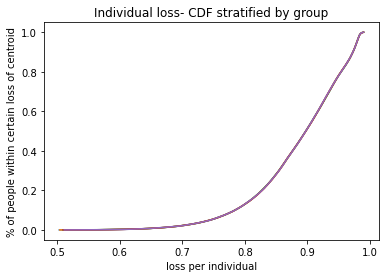

c  {0: (4.627530920203926, 3.845015440485257), 1: (-9.776876913893346, -9.554699348244588), 2: (-11.450591705187307, 6.858052951445472), 3: (9.89349953644213, -4.2003080621200075), 4: (-2.4640405568177064, 8.998870735085553), 5: (-2.6134979675851246, 1.5635093711589887), 6: (2.8460695929479054, 9.867498197024203), 7: (4.763317002880297, -1.7470450952580032), 8: (-7.665911274624336, -6.456421776547676), 9: (7.385686553003136, 8.240773312440558)}
weights:  [0.19999724 0.20001015 0.20000012 0.20000244 0.19999006]
Time elapsed Batch Step:  0.36525964736938477
Time elapsed Assignment Step:  2.3126323223114014
0.00036809672382787095
total:  0.6198243240499727


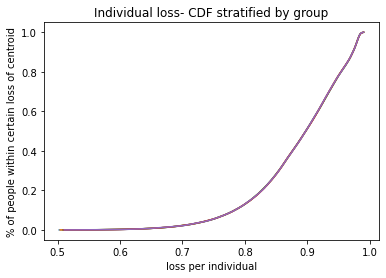

c  {0: (4.626952065086344, 3.8446813047999924), 1: (-9.775363441030025, -9.55322181242376), 2: (-11.448578207144148, 6.857772269698297), 3: (9.892880269839559, -4.198440683946871), 4: (-2.462607816189006, 8.997568432204275), 5: (-2.6123781986743433, 1.5647807758593062), 6: (2.844807531743567, 9.866142821248767), 7: (4.763453664033078, -1.7458888569607152), 8: (-7.666926035601098, -6.458480749635864), 9: (7.3838410847033105, 8.239938201024145)}
weights:  [0.19999725 0.20001017 0.20000017 0.20000246 0.19998994]
Time elapsed Batch Step:  0.3490641117095947
Time elapsed Assignment Step:  2.3110318183898926
0.0003619741141037691
total:  0.6197106549236884


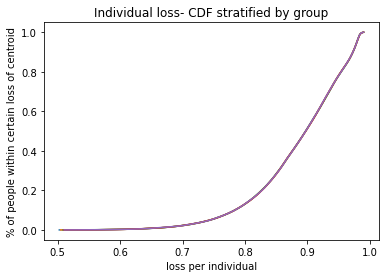

c  {0: (4.626373069363642, 3.844347155425307), 1: (-9.773850009868474, -9.551744297472617), 2: (-11.446563788205873, 6.85749153285872), 3: (9.892260620383597, -4.196572208709323), 4: (-2.461174675347762, 8.996265822574243), 5: (-2.611258031876244, 1.5660527005953624), 6: (2.843544770239806, 9.864786849003554), 7: (4.763590447397401, -1.7447323032944373), 8: (-7.667940939580807, -6.4605400931645285), 9: (7.381994686046301, 8.239102680457925)}
weights:  [0.19999727 0.20001019 0.20000022 0.2000025  0.19998983]
Time elapsed Batch Step:  0.37796807289123535
Time elapsed Assignment Step:  2.395127296447754
0.000360320936548697
total:  0.6195981713937245


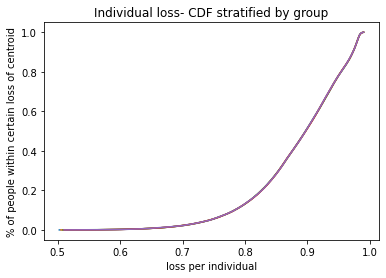

c  {0: (4.6257939329839495, 3.8440129924055952), 1: (-9.772336625324069, -9.550266808317835), 2: (-11.444548450848291, 6.857210741482131), 3: (9.891640588363568, -4.194702637494261), 4: (-2.459741136723211, 8.994962908665114), 5: (-2.6101374682731002, 1.5673251443899718), 6: (2.8422813091195476, 9.863430281306213), 7: (4.7637273530972335, -1.7435754346408636), 8: (-7.668955983062985, -6.46259980045619), 9: (7.380147359001601, 8.238266751699193)}
weights:  [0.19999729 0.20001021 0.20000027 0.20000253 0.19998971]
Time elapsed Batch Step:  0.46863865852355957
Time elapsed Assignment Step:  2.4112954139709473
0.00035998554920868564
total:  0.6194859280011321


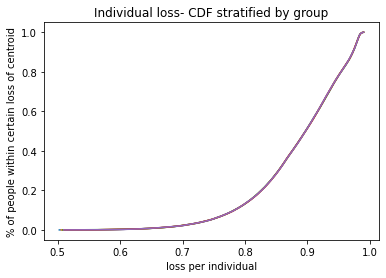

c  {0: (4.625214655895395, 3.8436788157852844), 1: (-9.770823292321651, -9.548789349899407), 2: (-11.442532197565628, 6.8569298961266165), 3: (9.891020174072686, -4.192831971400764), 4: (-2.4583072027557353, 8.993659692957507), 5: (-2.6090165089532555, 1.5685981062598364), 6: (2.8410171490725697, 9.862073119181419), 7: (4.763864381256561, -1.7424182513832158), 8: (-7.6699711625301354, -6.464659864798757), 9: (7.378299105554018, 8.237430415712351)}
weights:  [0.19999731 0.20001022 0.20000032 0.20000256 0.19998959]
Time elapsed Batch Step:  0.34989166259765625
Time elapsed Assignment Step:  2.3475844860076904
0.0003617666685417076
total:  0.6193741635440486


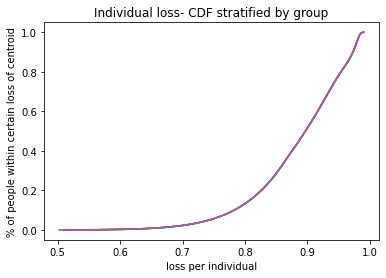

c  {0: (4.624635238046105, 3.8433446256088346), 1: (-9.769310015795437, -9.547311927170565), 2: (-11.440515030870607, 6.856648997352972), 3: (9.890399377808084, -4.190960211540151), 4: (-2.4568728758968628, 8.99235617794301), 5: (-2.6078951550111453, 1.5698715852155245), 6: (2.839752290795531, 9.8607153636609), 7: (4.764001531999385, -1.7412607539062461), 8: (-7.6709864744477265, -6.466720279445458), 9: (7.376449927703741, 8.236593673468937)}
weights:  [0.19999732 0.20001024 0.20000037 0.20000259 0.19998947]
Time elapsed Batch Step:  0.3781449794769287
Time elapsed Assignment Step:  2.3755664825439453
0.00035915675450315376
total:  0.6192609264310011


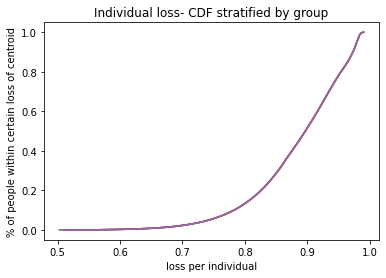

c  {0: (4.624055679384209, 3.843010421920739), 1: (-9.767796800688936, -9.545834545097701), 2: (-11.438496953294539, 6.856368045724706), 3: (9.889778199870833, -4.189087359036044), 4: (-2.45543815860927, 8.991052366124185), 5: (-2.6067734075473155, 1.5711455802614511), 6: (2.838486734992002, 9.859357015783461), 7: (4.764138805449721, -1.74010294259624), 8: (-7.672001915264191, -6.468781037614777), 9: (7.374599827466397, 8.235756525947643)}
weights:  [0.19999734 0.20001026 0.20000042 0.20000262 0.19998936]
Time elapsed Batch Step:  0.3388807773590088
Time elapsed Assignment Step:  2.3556301593780518
0.000364590744315052
total:  0.6191499466145525


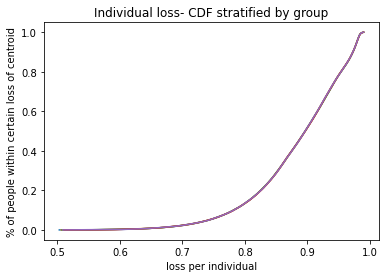

c  {0: (4.623475979857833, 3.8426762047655223), 1: (-9.766283651954868, -9.544357208660287), 2: (-11.436477967387406, 6.856087041808054), 3: (9.889156640565961, -4.187213415024428), 4: (-2.454003053366782, 8.989748260014585), 5: (-2.605651267668441, 1.5724200903958583), 6: (2.837220482372495, 9.857998076595008), 7: (4.764276201731599, -1.7389448178410203), 8: (-7.673017481410921, -6.470842132490385), 9: (7.372748806873112, 8.234918974134345)}
weights:  [0.19999736 0.20001028 0.20000047 0.20000265 0.19998924]
Time elapsed Batch Step:  0.3526794910430908
Time elapsed Assignment Step:  2.2741892337799072
0.00037617742009876665
total:  0.6190406571070197


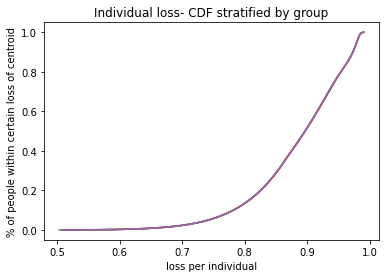

c  {0: (4.622896139415105, 3.8423419741877427), 1: (-9.764770574555074, -9.542879922850792), 2: (-11.434458075717941, 6.855805986171988), 3: (9.888534700202483, -4.185338380653711), 4: (-2.4525675626543695, 8.988443862138753), 5: (-2.6045287364873464, 1.5736951146107943), 6: (2.8359535336544943, 9.856638547148577), 7: (4.764413720969063, -1.7377863800299491), 8: (-7.67403316930226, -6.47290355722108), 9: (7.370896867970576, 8.234081019022126)}
weights:  [0.19999738 0.2000103  0.20000052 0.20000268 0.19998912]
Time elapsed Batch Step:  0.3539259433746338
Time elapsed Assignment Step:  2.2972567081451416
0.000370554494590114
total:  0.6189260491621379


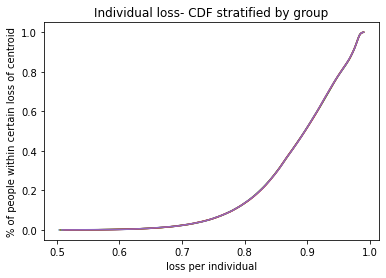

c  {0: (4.622316158004152, 3.842007730231991), 1: (-9.763257573460436, -9.541402692674605), 2: (-11.432437280873721, 6.855524879388221), 3: (9.88791237909341, -4.183462257084787), 4: (-2.4511316889681525, 8.987139175032238), 5: (-2.6034058151230237, 1.5749706518920932), 6: (2.834685889562485, 9.855278428504354), 7: (4.764551363286172, -1.7366276295539318), 8: (-7.675048975335505, -6.474965304920716), 9: (7.3690440128211, 8.233242661611296)}
weights:  [0.19999739 0.20001032 0.20000057 0.20000271 0.19998901]
Time elapsed Batch Step:  0.3889350891113281
Time elapsed Assignment Step:  2.299541711807251
0.0003723883313481169
total:  0.6188135227933665


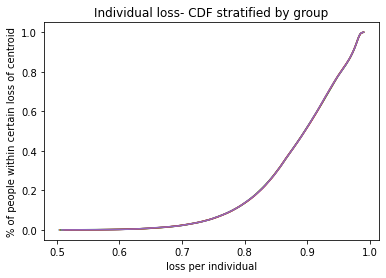

c  {0: (4.621736035573099, 3.8416734729428907), 1: (-9.76174465365079, -9.539925523149956), 2: (-11.430415585461247, 6.85524372203122), 3: (9.887289677555778, -4.181585045491096), 4: (-2.449695434815394, 8.985834201241598), 5: (-2.602282504700653, 1.576246701219355), 6: (2.833417550827985, 9.853917721729701), 7: (4.764689128806993, -1.7354685668054197), 8: (-7.676064895890902, -6.477027368668151), 9: (7.367190243502678, 8.232403902909423)}
weights:  [0.19999741 0.20001034 0.20000062 0.20000274 0.19998889]
Time elapsed Batch Step:  0.35319066047668457
Time elapsed Assignment Step:  2.2975964546203613
0.0003770431230436522
total:  0.6187016871621659


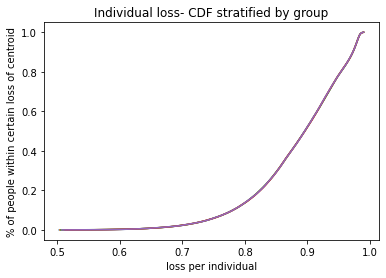

c  {0: (4.621155772070075, 3.8413392023650976), 1: (-9.760231820114848, -9.538448419307832), 2: (-11.428392992106037, 6.854962514678217), 3: (9.88666659591067, -4.179706747058688), 4: (-2.4482588027145002, 8.984528943324404), 5: (-2.601158806351621, 1.5775232615659258), 6: (2.832148518189574, 9.852556427899186), 7: (4.764827017655608, -1.7343091921784133), 8: (-7.677080927331645, -6.479089741507174), 9: (7.36533556210905, 8.231564743931354)}
weights:  [0.19999742 0.20001036 0.20000068 0.20000276 0.19998878]
Time elapsed Batch Step:  0.3561263084411621
Time elapsed Assignment Step:  2.337387800216675
0.00038029633693126286
total:  0.6185892757669793


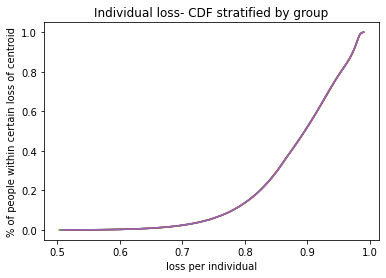

c  {0: (4.620575367443206, 3.8410049185433), 1: (-9.758719077850108, -9.536971386191901), 2: (-11.426369503452701, 6.854681257909214), 3: (9.886043134483238, -4.1778273629862825), 4: (-2.4468217951950155, 8.98322340384925), 5: (-2.600034721213541, 1.5788003318988768), 6: (2.830878792392925, 9.851194548094606), 7: (4.764965029956109, -1.7331495060684654), 8: (-7.678097066003877, -6.481152416446454), 9: (7.363479970749759, 8.230725185699237)}
weights:  [0.19999744 0.20001038 0.20000073 0.20000279 0.19998866]
Time elapsed Batch Step:  0.36439061164855957
Time elapsed Assignment Step:  2.315670967102051
0.00037935960190549345
total:  0.6184754518803908


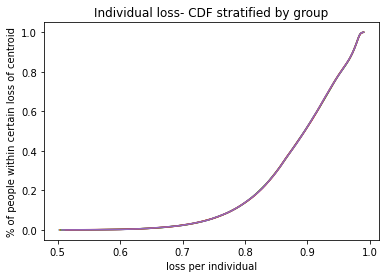

c  {0: (4.61999482164062, 3.840670621522219), 1: (-9.757206431862777, -9.535494428858433), 2: (-11.42434512216504, 6.854399952306995), 3: (9.885419293602718, -4.17594689448533), 4: (-2.4453844147976196, 8.981917585395752), 5: (-2.5989102504302712, 1.5800779111789842), 6: (2.8296083741908324, 9.849832083405007), 7: (4.765103165832596, -1.731989508872684), 8: (-7.679113308236691, -6.483215386459475), 9: (7.3616234715502165, 8.22988522924255)}
weights:  [0.19999746 0.2000104  0.20000078 0.20000282 0.19998855]
Time elapsed Batch Step:  0.3556816577911377
Time elapsed Assignment Step:  2.3635330200195312
0.00037311158310548986
total:  0.6183598804220379


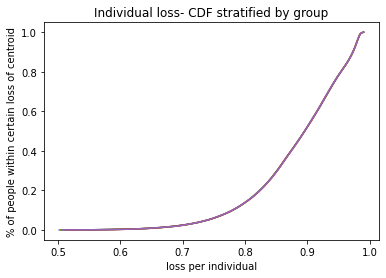

c  {0: (4.619414134610444, 3.8403363113466082), 1: (-9.755693887167686, -9.53401755237622), 2: (-11.42231985092612, 6.854118598457134), 3: (9.884795073602461, -4.174065342780078), 4: (-2.4439466640741223, 8.980611490554557), 5: (-2.5977853951519356, 1.581355998360709), 6: (2.828337264343246, 9.848469034926715), 7: (4.765241425409183, -1.7308292009897355), 8: (-7.680129650342133, -6.485278644484477), 9: (7.359766066651762, 8.22904487559812)}
weights:  [0.19999747 0.20001042 0.20000083 0.20000285 0.19998843]
Time elapsed Batch Step:  0.34151291847229004
Time elapsed Assignment Step:  2.3147900104522705
0.00037055633792637543
total:  0.618245263269582


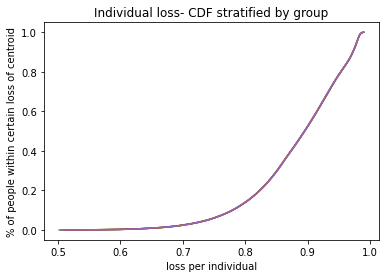

c  {0: (4.618833306300805, 3.8400019880612537), 1: (-9.754181448788202, -9.532540761826494), 2: (-11.420293692438374, 6.853837196948006), 3: (9.884170474819953, -4.17218270910763), 4: (-2.442508545587458, 8.97930512192734), 5: (-2.5966601565349423, 1.5826345923921767), 6: (2.827065463617298, 9.847105403763365), 7: (4.765379808809987, -1.7296685828198481), 8: (-7.681146088615204, -6.487342183424405), 9: (7.357907758211723, 8.228204125810151)}
weights:  [0.19999749 0.20001044 0.20000088 0.20000288 0.19998831]
Time elapsed Batch Step:  0.3573639392852783
Time elapsed Assignment Step:  2.3135530948638916
0.0003775596222288513
total:  0.6181333588193668


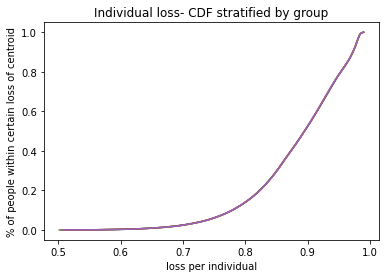

c  {0: (4.618252336659831, 3.8396676517109745), 1: (-9.752669121756153, -9.531064062302853), 2: (-11.418266649423675, 6.853555748370793), 3: (9.883545497596831, -4.170298994718009), 4: (-2.44107006191168, 8.977998482126814), 5: (-2.595534535742003, 1.583913692215157), 6: (2.8257929727873368, 9.845741191025915), 7: (4.765518316159136, -1.7285076547648146), 8: (-7.682162619333867, -6.489405996146845), 9: (7.3560485484034785, 8.227362980930248)}
weights:  [0.19999751 0.20001045 0.20000093 0.20000291 0.1999882 ]
Time elapsed Batch Step:  0.4018118381500244
Time elapsed Assignment Step:  2.423753023147583
0.00037674438107870856
total:  0.618018992984104


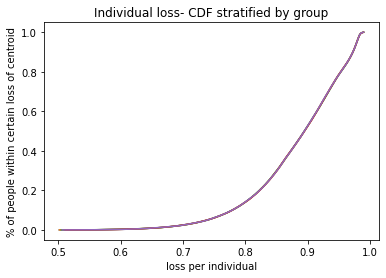

c  {0: (4.617666743613874, 3.839321000950811), 1: (-9.751156911111739, -9.52958745891118), 2: (-11.41623872462343, 6.853274253319496), 3: (9.88292014227891, -4.168414200874223), 4: (-2.4396312156319526, 8.976691573776725), 5: (-2.594408533942153, 1.5851932967650435), 6: (2.824519792634955, 9.844376397832681), 7: (4.765656947580764, -1.7273464172279958), 8: (-7.683179238759052, -6.49147007548397), 9: (7.354196573155003, 8.226524634329234)}
weights:  [0.19999752 0.20001047 0.20000099 0.20000293 0.19998808]
Time elapsed Batch Step:  0.37648987770080566
Time elapsed Assignment Step:  2.417811632156372
0.000392063562703715
total:  0.6179093125849684


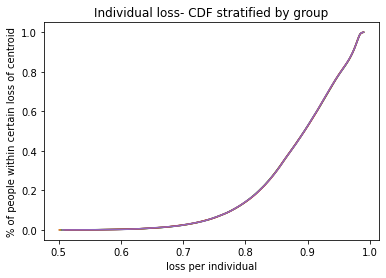

c  {0: (4.617081005099475, 3.838974338586851), 1: (-9.749644821903448, -9.528110956769567), 2: (-11.414209920798667, 6.852992712390944), 3: (9.88229440921621, -4.166528328852325), 4: (-2.438192009344544, 8.975384399511853), 5: (-2.59328215231077, 1.5864734049708331), 6: (2.8232459239490226, 9.84301102530936), 7: (4.765795703199011, -1.726184870614323), 8: (-7.684195943134662, -6.4935344142324904), 9: (7.352343699514171, 8.225685893529008)}
weights:  [0.19999754 0.20001049 0.20000104 0.20000296 0.19998797]
Time elapsed Batch Step:  0.3741602897644043
Time elapsed Assignment Step:  2.3360135555267334
0.000376884719943793
total:  0.6177903293367506


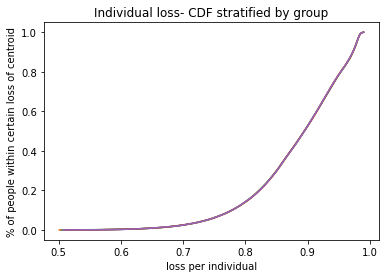

c  {0: (4.616495121064584, 3.838627664667324), 1: (-9.74813285918798, -9.526634561008233), 2: (-11.412180240730125, 6.8527111261848), 3: (9.881668298762964, -4.164641379941479), 4: (-2.436752445656819, 8.974076961978016), 5: (-2.5921553920295937, 1.5877540157551058), 6: (2.821971367525716, 9.841645074589055), 7: (4.765934583138023, -1.725023015330302), 8: (-7.685212728687584, -6.495599005153596), 9: (7.35048992963668, 8.224846759572234)}
weights:  [0.19999756 0.20001051 0.20000109 0.20000299 0.19998785]
Time elapsed Batch Step:  0.3901374340057373
Time elapsed Assignment Step:  2.2957489490509033
0.00037004355693215363
total:  0.617673694505316


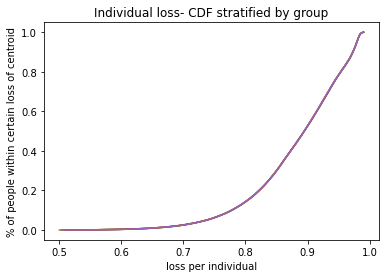

c  {0: (4.615909091457151, 3.838280979240495), 1: (-9.746621028030148, -9.525158276769455), 2: (-11.410149687218338, 6.852429495303573), 3: (9.88104181127766, -4.1627533554440195), 4: (-2.435312527187226, 8.972769263832063), 5: (-2.591028254286745, 1.589035128034004), 6: (2.82069612416855, 9.840278546812296), 7: (4.766073587521951, -1.723860851784015), 8: (-7.686229591627697, -6.497663840972907), 9: (7.34863526569417, 8.224007233508912)}
weights:  [0.19999757 0.20001053 0.20000114 0.20000302 0.19998773]
Time elapsed Batch Step:  0.35059285163879395
Time elapsed Assignment Step:  2.289215326309204
0.000379716417659659
total:  0.6175618604441326


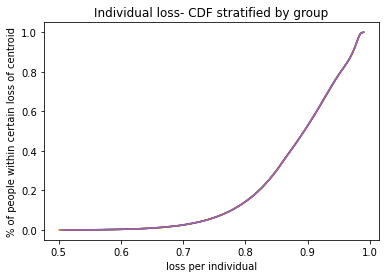

c  {0: (4.615322916225128, 3.8379342823546616), 1: (-9.745109333502807, -9.523682109207481), 2: (-11.408118263083725, 6.852147820352626), 3: (9.880414947123048, -4.16086425667552), 4: (-2.433872256565292, 8.971461307741874), 5: (-2.589900740276746, 1.590316740717213), 6: (2.8194201946884085, 9.838911443127078), 7: (4.766212716474949, -1.7226983803851257), 8: (-7.687246528147881, -6.4997289143804196), 9: (7.346779709874283, 8.2231673163964)}
weights:  [0.19999759 0.20001055 0.2000012  0.20000305 0.19998762]
Time elapsed Batch Step:  0.34957146644592285
Time elapsed Assignment Step:  2.31669020652771
0.0003879500621584153
total:  0.6174494419643524


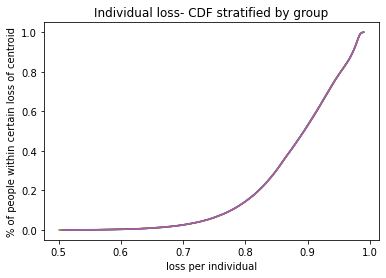

c  {0: (4.614736595316469, 3.8375875740581553), 1: (-9.743597780686763, -9.52220606348846), 2: (-11.406085971166682, 6.8518661019401845), 3: (9.879787706666171, -4.158974084964855), 4: (-2.432431636431609, 8.97015309638636), 5: (-2.58877285120054, 1.5915988527079394), 6: (2.818143579903576, 9.837543764688872), 7: (4.766351970121175, -1.7215356015448802), 8: (-7.688263534424032, -6.5017942180304615), 9: (7.344923264380726, 8.22232700929944)}
weights:  [0.19999761 0.20001057 0.20000125 0.20000308 0.1999875 ]
Time elapsed Batch Step:  0.35439372062683105
Time elapsed Assignment Step:  2.3767902851104736
0.0003882594729729405
total:  0.6173344939628298


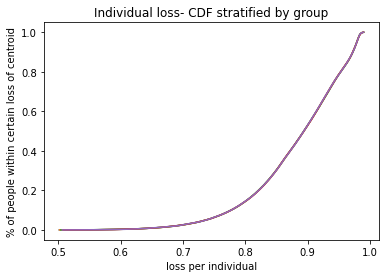

c  {0: (4.614150128679129, 3.8372408543993424), 1: (-9.742086374670684, -9.520730144790363), 2: (-11.404052814327661, 6.851584340677344), 3: (9.879160090278383, -4.157082841654265), 4: (-2.4309906694378216, 8.968844632455452), 5: (-2.5876445882655084, 1.592881462902892), 6: (2.816866280639768, 9.83617551266066), 7: (4.766491348584788, -1.7203725156761114), 8: (-7.689280606615075, -6.503859744541639), 9: (7.34306593143333, 8.221486313290171)}
weights:  [0.19999762 0.20001059 0.2000013  0.2000031  0.19998739]
Time elapsed Batch Step:  0.34761929512023926
Time elapsed Assignment Step:  2.3178420066833496
0.00038934471467844123
total:  0.6172196258340186


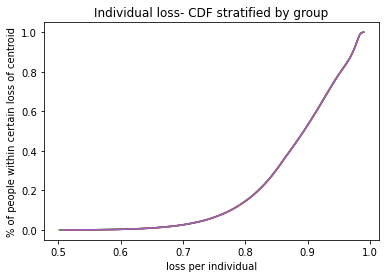

c  {0: (4.613563516261064, 3.8368941234266227), 1: (-9.740575120551018, -9.519254358302911), 2: (-11.402018795447272, 6.851302537178082), 3: (9.878532098335373, -4.1551905280994195), 4: (-2.429549358246617, 8.967535918650102), 5: (-2.5865159526854926, 1.5941645701922598), 6: (2.8155882977301636, 9.834806688212957), 7: (4.76663085198995, -1.719209123193242), 8: (-7.690297740862975, -6.505925486496793), 9: (7.34120771326811, 8.220645229448168)}
weights:  [0.19999764 0.20001061 0.20000135 0.20000313 0.19998727]
Time elapsed Batch Step:  0.34330058097839355
Time elapsed Assignment Step:  2.339684009552002
0.0003875056851788683
total:  0.6171037273037359


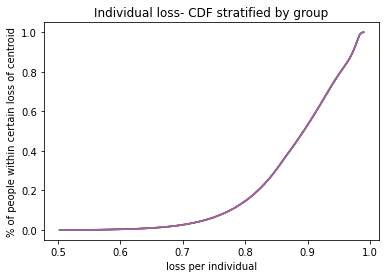

c  {0: (4.612976758010232, 3.8365473811884296), 1: (-9.739064023431897, -9.517778709227494), 2: (-11.399983917426361, 6.851020692059264), 3: (9.877903731217193, -4.153297145669481), 4: (-2.428107705531711, 8.966226957682272), 5: (-2.5853869456808134, 1.5954481734596928), 6: (2.814309632015435, 9.83343729252384), 7: (4.766770480460822, -1.7180454245122876), 8: (-7.691314933292757, -6.507991436442948), 9: (7.339348612137328, 8.219803758860452)}
weights:  [0.19999765 0.20001063 0.20000141 0.20000316 0.19998716]
Time elapsed Batch Step:  0.35743093490600586
Time elapsed Assignment Step:  2.350846767425537
0.0003860718959254328
total:  0.6169878608024876


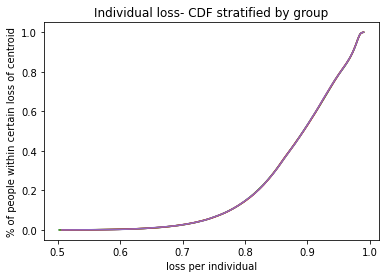

c  {0: (4.612390406272007, 3.8361975751114112), 1: (-9.737553088425056, -9.5163032027771), 2: (-11.397948183186108, 6.8507388059406535), 3: (9.877274989308276, -4.151402695747175), 4: (-2.426665713977835, 8.964917752274932), 5: (-2.5842620185413083, 1.5967259553205353), 6: (2.8130302843437804, 9.832067326778969), 7: (4.766910234121568, -1.716881420050859), 8: (-7.6923321800125235, -6.510057586891275), 9: (7.337488630309548, 8.218961902621517)}
weights:  [0.19999767 0.20001065 0.20000146 0.20000319 0.19998704]
Time elapsed Batch Step:  0.3541879653930664
Time elapsed Assignment Step:  2.3238439559936523
0.0003866061689947742
total:  0.6168724330088775


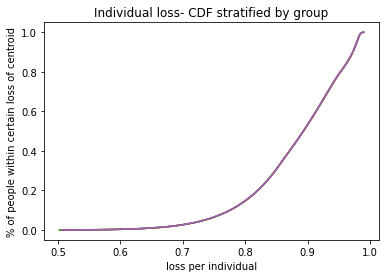

c  {0: (4.611803909586512, 3.8358477570302227), 1: (-9.736042320649736, -9.514827844176239), 2: (-11.39591159566811, 6.850456879444919), 3: (9.876645872997459, -4.149507179728848), 4: (-2.4252233862807198, 8.963608305162046), 5: (-2.583136722687902, 1.598004228843103), 6: (2.811750255570955, 9.830696792171615), 7: (4.767050113096347, -1.7157171102281672), 8: (-7.693349477113469, -6.512123930317041), 9: (7.335627770069704, 8.218119661833354)}
weights:  [0.19999768 0.20001067 0.20000151 0.20000321 0.19998693]
Time elapsed Batch Step:  0.36481213569641113
Time elapsed Assignment Step:  2.2965784072875977
0.00037624049551743255
total:  0.6167535835564032


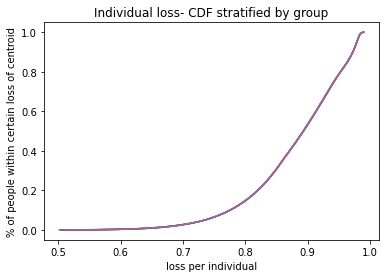

c  {0: (4.611217267902809, 3.8354979269935043), 1: (-9.734531725232593, -9.513352638660864), 2: (-11.393874157834475, 6.850174913197643), 3: (9.87601638267801, -4.147610599024539), 4: (-2.4237807251470818, 8.962298619088568), 5: (-2.582011059335093, 1.5992829929157901), 6: (2.8104695465603027, 9.829325689902687), 7: (4.767190117509319, -1.7145524954650244), 8: (-7.694366820669903, -6.514190459159571), 9: (7.3337660337191535, 8.217277037605474)}
weights:  [0.1999977  0.20001068 0.20000156 0.20000324 0.19998682]
Time elapsed Batch Step:  0.3432438373565674
Time elapsed Assignment Step:  2.353177547454834
0.0003758515450369426
total:  0.6166375752275879


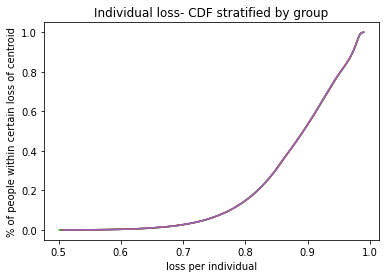

c  {0: (4.610630481169963, 3.8351480850499304), 1: (-9.733021307307606, -9.511877591478305), 2: (-11.39183587266791, 6.84989290782733), 3: (9.875386518747648, -4.145712955058041), 4: (-2.4223377332946066, 8.960988696810425), 5: (-2.580885029703808, 1.600562246420504), 6: (2.8091881581827876, 9.827954021180755), 7: (4.767330247484642, -1.7133875761838486), 8: (-7.695384206739271, -6.516257165822205), 9: (7.331903423575744, 8.216434031054927)}
weights:  [0.19999772 0.2000107  0.20000161 0.20000327 0.1999867 ]
Time elapsed Batch Step:  0.33547139167785645
Time elapsed Assignment Step:  2.3089699745178223
0.0003786806688673705
total:  0.6165223801988506


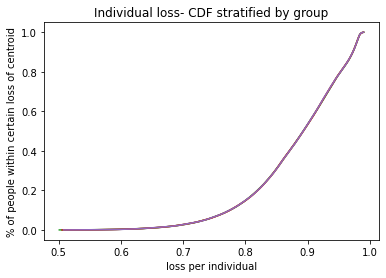

c  {0: (4.61004354933704, 3.8347982312482096), 1: (-9.731511072015978, -9.51040270788719), 2: (-11.389796743171814, 6.849610863965418), 3: (9.874756281608567, -4.143814249266969), 4: (-2.420894413451932, 8.959678541094512), 5: (-2.579758635021425, 1.601841988232643), 6: (2.807906091317025, 9.82658178722208), 7: (4.767470503146469, -1.7122223528086662), 8: (-7.696401631362176, -6.51832404267226), 9: (7.330039941973868, 8.215590643306328)}
weights:  [0.19999773 0.20001072 0.20000166 0.20000329 0.19998659]
Time elapsed Batch Step:  0.35570383071899414
Time elapsed Assignment Step:  2.3390963077545166
0.0003763278985998708
total:  0.6164054785017526


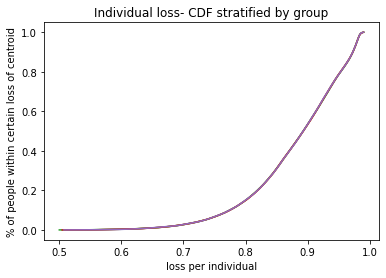

c  {0: (4.60945647235311, 3.8344483656370834), 1: (-9.73000102450604, -9.508927993157373), 2: (-11.387756772370365, 6.84932878224628), 3: (9.874125671667464, -4.1419144831028225), 4: (-2.419450768358631, 8.958368154718674), 5: (-2.5786318765217886, 1.6031222172210768), 6: (2.806623346849315, 9.825208989250635), 7: (4.76761088461895, -1.711056825765115), 8: (-7.697419090562403, -6.520391082040992), 9: (7.328175591264528, 8.21474687549188)}
weights:  [0.19999775 0.20001074 0.20000171 0.20000332 0.19998648]
Time elapsed Batch Step:  0.3598470687866211
Time elapsed Assignment Step:  2.342411994934082
0.0003787219884996418
total:  0.6162898499055305


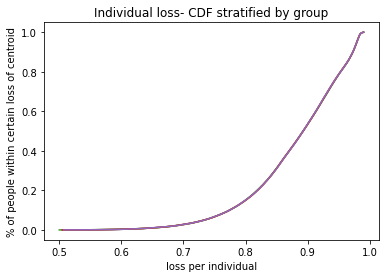

c  {0: (4.608869250167246, 3.8340984882653277), 1: (-9.728491169933147, -9.507453452569859), 2: (-11.38571596330861, 6.84904666330724), 3: (9.873494689335557, -4.140013658031058), 4: (-2.4180068007651925, 8.957057540471695), 5: (-2.577504755445231, 1.6044029322481275), 6: (2.8053399256736733, 9.823835628498134), 7: (4.76775139202623, -1.709890995480448), 8: (-7.698436580346947, -6.522458276223557), 9: (7.326310373815394, 8.21390272875139)}
weights:  [0.19999776 0.20001076 0.20000176 0.20000335 0.19998637]
Time elapsed Batch Step:  0.34243106842041016
Time elapsed Assignment Step:  2.2896978855133057
0.0003860626864968797
total:  0.6161755538111742


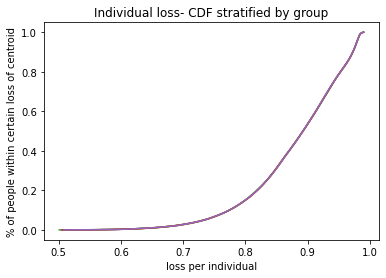

c  {0: (4.608281882728526, 3.833748599181752), 1: (-9.726981513459583, -9.505979091416728), 2: (-11.383674319052561, 6.848764507788573), 3: (9.872863335028608, -4.138111775531149), 4: (-2.416562513433004, 8.955746701153283), 5: (-2.576377273038591, 1.6056841321695479), 6: (2.8040558286918618, 9.822461706204058), 7: (4.767892025492448, -1.7087248623835354), 8: (-7.6994540967060345, -6.52452561747898), 9: (7.324444292010867, 8.213058204232302)}
weights:  [0.19999778 0.20001078 0.20000181 0.20000338 0.19998626]
Time elapsed Batch Step:  0.33829617500305176
Time elapsed Assignment Step:  2.280954599380493
0.00039416423421867464
total:  0.6160613345768291


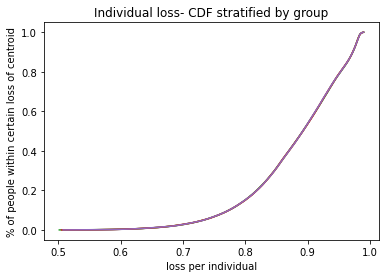

c  {0: (4.607694369986027, 3.8333986984351998), 1: (-9.725472060254448, -9.504504915001068), 2: (-11.381631842689284, 6.848482316333519), 3: (9.872231609166956, -4.136208837096657), 4: (-2.415117909134331, 8.95443563957405), 5: (-2.5752494305552336, 1.6069658158345022), 6: (2.802771056813423, 9.821087223615677), 7: (4.768032785141736, -1.707558426904869), 8: (-7.70047163561316, -6.526593098030115), 9: (7.3225773482521355, 8.212213303089706)}
weights:  [0.19999779 0.2000108  0.20000186 0.20000341 0.19998615]
Time elapsed Batch Step:  0.38332438468933105
Time elapsed Assignment Step:  2.3043179512023926
0.0003991038787011236
total:  0.6159460159987048


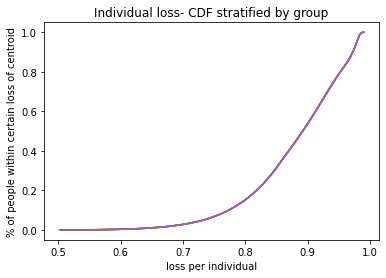

c  {0: (4.607106711888834, 3.8330487860745475), 1: (-9.723962815493556, -9.503030928636894), 2: (-11.379588537326986, 6.848200089588288), 3: (9.871599512175534, -4.134304844235293), 4: (-2.4136729906522953, 8.953124358555502), 5: (-2.574121229255067, 1.6082479820855455), 6: (2.8014856109557114, 9.819712181988082), 7: (4.76817367109822, -1.7063916894765643), 8: (-7.701489193025107, -6.528660710063618), 9: (7.320709544957238, 8.211368026486372)}
weights:  [0.19999781 0.20001081 0.20000191 0.20000343 0.19998603]
Time elapsed Batch Step:  0.3496713638305664
Time elapsed Assignment Step:  2.3065099716186523
0.0003906574905166993
total:  0.6158265307511142


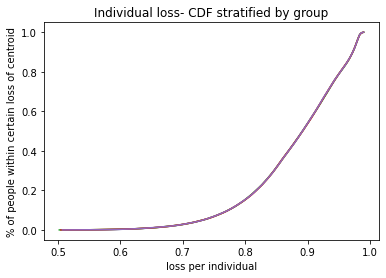

c  {0: (4.6065189083860325, 3.832698862148706), 1: (-9.722453784359317, -9.501557137649081), 2: (-11.377544406095112, 6.847917828202068), 3: (9.870967044483889, -4.1323997984689935), 4: (-2.4122277607808567, 8.951812860930008), 5: (-2.5729926704045636, 1.6095306297586045), 6: (2.8001994920439235, 9.818336582584207), 7: (4.7683146834860155, -1.7052246505323645), 8: (-7.702506764881984, -6.530728445729916), 9: (7.3188408845611255, 8.210522375592765)}
weights:  [0.19999782 0.20001083 0.20000196 0.20000346 0.19998592]
Time elapsed Batch Step:  0.35196495056152344
Time elapsed Assignment Step:  2.361332416534424
0.0003800343002710038
total:  0.6157062116256965


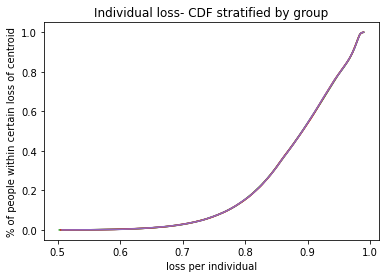

c  {0: (4.605930959426712, 3.832348926706619), 1: (-9.72094497204063, -9.500083547373285), 2: (-11.375499452144433, 6.847635532827031), 3: (9.870334206526218, -4.130493701333977), 4: (-2.410780980759506, 8.950491638938034), 5: (-2.57186375527678, 1.6108137576829562), 6: (2.7989140324688804, 9.816965707731297), 7: (4.768455822429232, -1.7040573105076433), 8: (-7.70352434710726, -6.532796297143173), 9: (7.316971369515717, 8.209676351587069)}
weights:  [0.19999783 0.20001085 0.20000201 0.20000349 0.19998581]
Time elapsed Batch Step:  0.3516266345977783
Time elapsed Assignment Step:  2.379056453704834
0.0003820454232592585
total:  0.6155895322367978


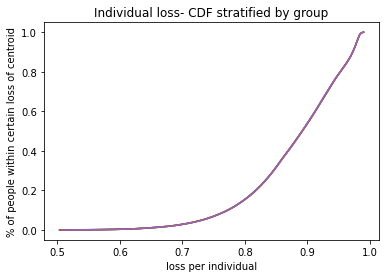

c  {0: (4.605342864959966, 3.8319989797972656), 1: (-9.719436383732763, -9.498610163155867), 2: (-11.373453678647143, 6.847353204118345), 3: (9.869700998741385, -4.12858655438082), 4: (-2.4093339002605627, 8.949170207999217), 5: (-2.570734485151373, 1.6120973646812082), 6: (2.7976278996286585, 9.815594276638288), 7: (4.7685970880519655, -1.7028896698394076), 8: (-7.704541935607794, -6.534864256381265), 9: (7.315101002289964, 8.208829955655206)}
weights:  [0.19999785 0.20001087 0.20000207 0.20000352 0.1999857 ]
Time elapsed Batch Step:  0.3529388904571533
Time elapsed Assignment Step:  2.3220927715301514
0.0003884295379718017
total:  0.6154740143214579


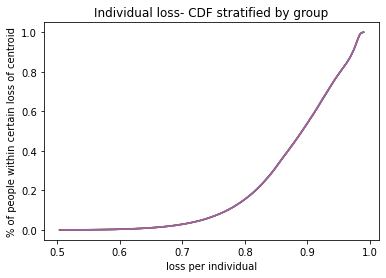

c  {0: (4.604754624934892, 3.8316490214696564), 1: (-9.71792802463723, -9.497136990353823), 2: (-11.371407088796943, 6.847070842734176), 3: (9.869067421572941, -4.126678359174519), 4: (-2.407886522157806, 8.947848571035093), 5: (-2.5696048613146223, 1.613381449569279), 6: (2.796341094448992, 9.814222290564501), 7: (4.768738480478305, -1.7017217289663014), 8: (-7.7055595262738725, -6.536932315485758), 9: (7.313229785369909, 8.207983188990863)}
weights:  [0.19999786 0.20001089 0.20000212 0.20000354 0.19998559]
Time elapsed Batch Step:  0.3427894115447998
Time elapsed Assignment Step:  2.342707395553589
0.00039752609328247424
total:  0.6153591598310281


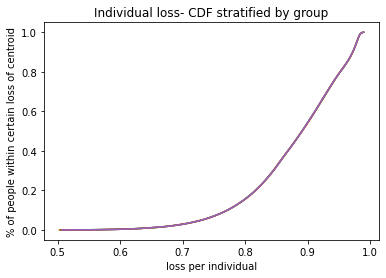

c  {0: (4.60416623930059, 3.8312990517728367), 1: (-9.716419899961666, -9.495664034334709), 2: (-11.369359685809139, 6.846788449335698), 3: (9.86843347546916, -4.124769117294561), 4: (-2.4064388493359066, 8.94652673097817), 5: (-2.568474885059446, 1.614666011156377), 6: (2.795053617863483, 9.812849750777096), 7: (4.7688799998323255, -1.7005534883286084), 8: (-7.70657711497925, -6.539000466461873), 9: (7.311357721258746, 8.207136052795507)}
weights:  [0.19999787 0.20001091 0.20000217 0.20000357 0.19998547]
Time elapsed Batch Step:  0.3499331474304199
Time elapsed Assignment Step:  2.4422452449798584
0.00040610140782204596
total:  0.6152439996117302


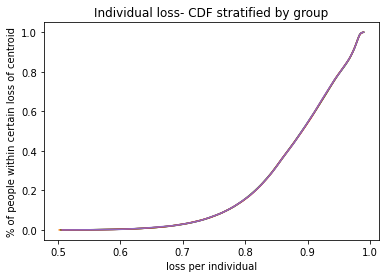

c  {0: (4.603577708006165, 3.8309490707558855), 1: (-9.714912014919701, -9.494191300476556), 2: (-11.367311472920733, 6.846506024587098), 3: (9.867799160883056, -4.122858830334994), 4: (-2.404990884690403, 8.945204690771897), 5: (-2.5673445576854217, 1.6159510482449813), 6: (2.793765470813631, 9.811476658551086), 7: (4.76902164623809, -1.6993849483682557), 8: (-7.707594697581185, -6.541068701278474), 9: (7.309484812476881, 8.206288548278412)}
weights:  [0.19999789 0.20001093 0.20000222 0.2000036  0.19998536]
Time elapsed Batch Step:  0.3498096466064453
Time elapsed Assignment Step:  2.3337700366973877
0.00040073351337999163
total:  0.6151245073507607


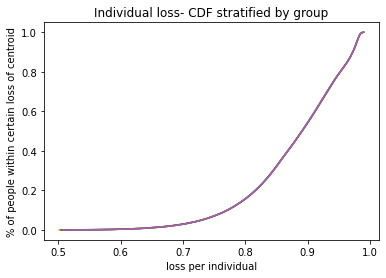

c  {0: (4.6029890310007255, 3.830599078467915), 1: (-9.713404374730821, -9.492718794167804), 2: (-11.365262453390516, 6.846223569155587), 3: (9.867164478272409, -4.120947499904489), 4: (-2.403542631127675, 8.943882453370627), 5: (-2.5662138804988066, 1.6172365596308205), 6: (2.792476654248868, 9.81010301516938), 7: (4.769163419819649, -1.6982161095288162), 8: (-7.708612269920482, -6.543137011868037), 9: (7.30761106156199, 8.205440676656675)}
weights:  [0.1999979  0.20001095 0.20000228 0.20000363 0.19998525]
Time elapsed Batch Step:  0.3661234378814697
Time elapsed Assignment Step:  2.298138380050659
0.0004311581514033769
total:  0.6150155688119926


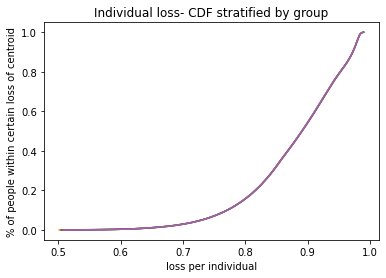

c  {0: (4.602400208233383, 3.8302490749580715), 1: (-9.711896984620235, -9.491246520807213), 2: (-11.36321263049916, 6.845941083711399), 3: (9.86652942809979, -4.119035127626413), 4: (-2.4020940915649147, 8.942560021739602), 5: (-2.5650828548125544, 1.6185225441028535), 6: (2.7911702840387753, 9.80872598691759), 7: (4.769305320701037, -1.6970469722555122), 8: (-7.709629827821534, -6.54520539012664), 9: (7.30574444550763, 8.204597253258658)}
weights:  [0.19999791 0.20001097 0.20000233 0.20000365 0.19998514]
Time elapsed Batch Step:  0.360015869140625
Time elapsed Assignment Step:  2.2460732460021973
0.0004235666648428893
total:  0.6148950755495427


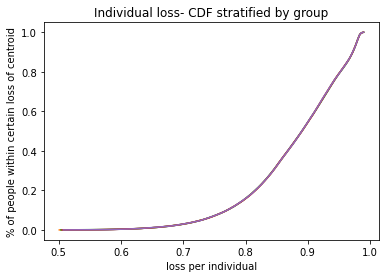

c  {0: (4.601811239653254, 3.829899060275534), 1: (-9.71038984981873, -9.489774485803789), 2: (-11.361162007549307, 6.845658568927807), 3: (9.865894010832587, -4.1171217151388975), 4: (-2.400645268930102, 8.941237398854913), 5: (-2.5639514819463347, 1.6198090004432486), 6: (2.7898632347682333, 9.807348393922306), 7: (4.769447349006277, -1.6958775369952186), 8: (-7.710647367092366, -6.547273827913934), 9: (7.303876990116304, 8.203753464882508)}
weights:  [0.19999793 0.20001099 0.20000238 0.20000368 0.19998502]
Time elapsed Batch Step:  0.35829710960388184
Time elapsed Assignment Step:  2.3100106716156006
0.0004135252707745396
total:  0.6147737287725791


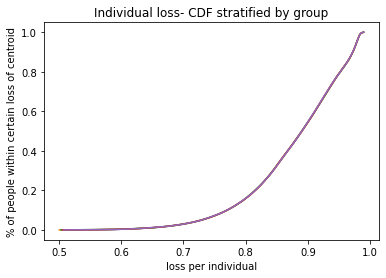

c  {0: (4.601216888773663, 3.8295356853048506), 1: (-9.70888297556252, -9.488302694576703), 2: (-11.359110587865672, 6.845376025481122), 3: (9.86525822694303, -4.115207264094907), 4: (-2.3991961661619734, 8.939914587703468), 5: (-2.5628197632265537, 1.621095927427364), 6: (2.7885555074439314, 9.80597023748828), 7: (4.769589504859372, -1.6947078041964663), 8: (-7.7116648835246835, -6.549342317053138), 9: (7.302016274388343, 8.20291110927566)}
weights:  [0.19999794 0.20001101 0.20000243 0.20000371 0.19998491]
Time elapsed Batch Step:  0.34026074409484863
Time elapsed Assignment Step:  2.2938339710235596
0.0004266178079409544
total:  0.6146591730650367


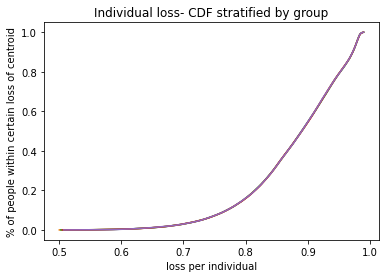

c  {0: (4.600622387627902, 3.8291723012235797), 1: (-9.707376367093095, -9.486831152555206), 2: (-11.357058374795123, 6.845093454050701), 3: (9.864622076908216, -4.113291776162305), 4: (-2.397746786209994, 8.938591591282961), 5: (-2.561687699986371, 1.6223833238237269), 6: (2.7872471030809325, 9.804591518928481), 7: (4.76973178838431, -1.6935377743094446), 8: (-7.712682372893916, -6.551410849331013), 9: (7.300154721517297, 8.202068388365209)}
weights:  [0.19999795 0.20001103 0.20000249 0.20000374 0.1999848 ]
Time elapsed Batch Step:  0.36165618896484375
Time elapsed Assignment Step:  2.3165884017944336
0.0004233397234102432
total:  0.6145395572354143


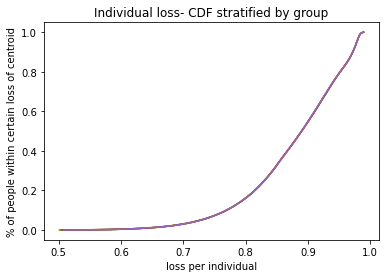

c  {0: (4.600027736165238, 3.828808908084678), 1: (-9.70587002965706, -9.485359865178545), 2: (-11.355005371706788, 6.844810855318957), 3: (9.86398556121013, -4.11137525302393), 4: (-2.3962971320343294, 8.937268412601833), 5: (-2.560555293565721, 1.623671188394014), 6: (2.7859380227027057, 9.803212239564118), 7: (4.769874199705063, -1.6923674477860051), 8: (-7.7136998309592695, -6.55347941649786), 9: (7.298292333986943, 8.201225303341499)}
weights:  [0.19999797 0.20001105 0.20000254 0.20000377 0.19998468]
Time elapsed Batch Step:  0.37917375564575195
Time elapsed Assignment Step:  2.2991621494293213
0.00042860205462436074
total:  0.6144223553710001


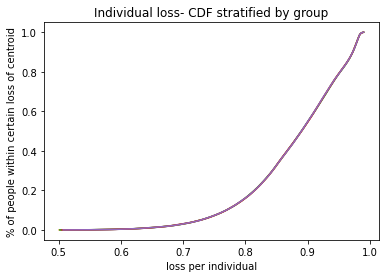

c  {0: (4.599432934334943, 3.828445505941137), 1: (-9.704363968505973, -9.483888837895874), 2: (-11.352951581992137, 6.844528229971358), 3: (9.86334868033568, -4.109457696377656), 4: (-2.3948472066058124, 8.935945054679234), 5: (-2.5594225453113286, 1.6249595198930311), 6: (2.784628267341161, 9.801832400724674), 7: (4.770016738945582, -1.6911968250796645), 8: (-7.7147172534637765, -6.555548010267499), 9: (7.296429114297983, 8.20038185540251)}
weights:  [0.19999798 0.20001107 0.20000259 0.2000038  0.19998457]
Time elapsed Batch Step:  0.35788655281066895
Time elapsed Assignment Step:  2.32392954826355
0.00043067666752749645
total:  0.614304049667245


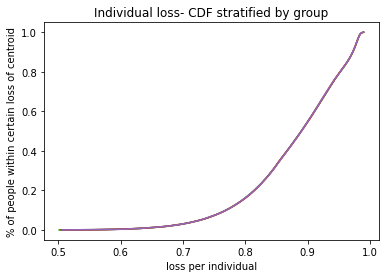

c  {0: (4.598837982086293, 3.828082094845982), 1: (-9.702858188896169, -9.482418076166168), 2: (-11.350897009065081, 6.844245578696438), 3: (9.862711434776713, -4.1075391079364705), 4: (-2.393397012905916, 8.934621520544987), 5: (-2.558289456576732, 1.6262483170686926), 6: (2.783317838036683, 9.800452003747926), 7: (4.7701594062298, -1.6900259066456076), 8: (-7.715734636134348, -6.557616622317267), 9: (7.294565064968099, 8.19953804575388)}
weights:  [0.19999799 0.20001109 0.20000264 0.20000382 0.19998446]
Time elapsed Batch Step:  0.35263729095458984
Time elapsed Assignment Step:  2.368756055831909
0.00043756240949421876
total:  0.6141870400791544


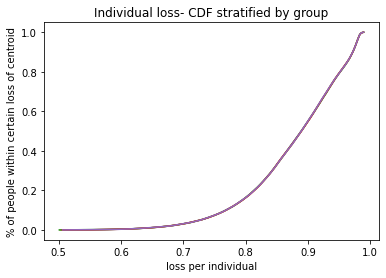

c  {0: (4.59824287936857, 3.8277186748522745), 1: (-9.701352696088586, -9.480947585458127), 2: (-11.348841656362065, 6.843962902185801), 3: (9.862073825030047, -4.105619489428541), 4: (-2.39194655392672, 8.933297813239543), 5: (-2.5571560287222987, 1.6275375786620019), 6: (2.782006735838167, 9.79907104997998), 7: (4.770302201681629, -1.688854692940691), 8: (-7.716751974681831, -6.559685244288009), 9: (7.292700188532009, 8.19869387560892)}
weights:  [0.199998   0.20001111 0.2000027  0.20000385 0.19998434]
Time elapsed Batch Step:  0.34580039978027344
Time elapsed Assignment Step:  2.3252694606781006
0.0004378744535274981
total:  0.614067911561301


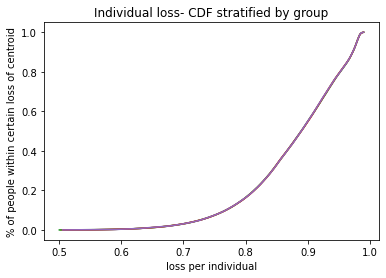

c  {0: (4.59764762613106, 3.8273552460131093), 1: (-9.699847495348576, -9.479477371250082), 2: (-11.346785527342162, 6.843680201134125), 3: (9.861435851597493, -4.103698842597286), 4: (-2.390495832670879, 8.931973935813943), 5: (-2.556022263115246, 1.628827303407031), 6: (2.780694961803052, 9.797689540775295), 7: (4.770445125424961, -1.6876831844234454), 8: (-7.717769264801059, -6.56175386778407), 9: (7.290834487541529, 8.197849346188635)}
weights:  [0.19999802 0.20001113 0.20000275 0.20000388 0.19998423]
Time elapsed Batch Step:  0.34412622451782227
Time elapsed Assignment Step:  2.3181798458099365
0.0004364519389435939
total:  0.6139481157113511


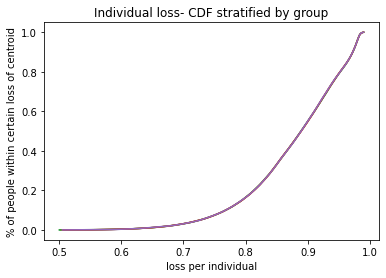

c  {0: (4.597052222323056, 3.826991808381617), 1: (-9.698342591945721, -9.478007439029902), 2: (-11.344728625487164, 6.843397476239169), 3: (9.860797514985885, -4.1017771692014415), 4: (-2.3890448521515917, 8.930649891329773), 5: (-2.5548881611296594, 1.6301174900309006), 6: (2.7793825169973556, 9.796307477496708), 7: (4.770588177583664, -1.6865113815540802), 8: (-7.718786502170918, -6.563822484373292), 9: (7.288967964565632, 8.197004458721748)}
weights:  [0.19999803 0.20001115 0.20000281 0.20000391 0.19998411]
Time elapsed Batch Step:  0.34288620948791504
Time elapsed Assignment Step:  2.3290600776672363
0.0004357148976656955
total:  0.6138283793694116


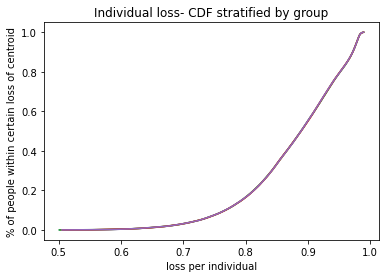

c  {0: (4.596456667893855, 3.8266283620109616), 1: (-9.696837991153625, -9.476537794294881), 2: (-11.342670954301683, 6.843114728201775), 3: (9.860158815707099, -4.099854471015138), 4: (-2.3875936153925674, 8.929325682859115), 5: (-2.553753724146511, 1.6314081372537592), 6: (2.778069402495709, 9.794924861515465), 7: (4.770731358281585, -1.685339284794485), 8: (-7.719803682454399, -6.5658910855870145), 9: (7.287100622190501, 8.196159214444716)}
weights:  [0.19999804 0.20001116 0.20000286 0.20000394 0.19998399]
Time elapsed Batch Step:  0.3608553409576416
Time elapsed Assignment Step:  2.3909757137298584
0.0004246199761838154
total:  0.6137053900229539


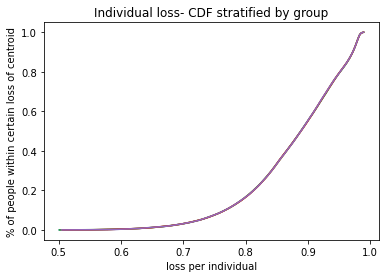

c  {0: (4.595860962792759, 3.826264906954343), 1: (-9.695333698249716, -9.475068442551642), 2: (-11.340612517313238, 6.842831957725877), 3: (9.859519754278084, -4.097930749827966), 4: (-2.386142125427992, 8.928001313484504), 5: (-2.55261895355368, 1.632699243788764), 6: (2.776755619381391, 9.79354169421125), 7: (4.7708746676425475, -1.684166894608234), 8: (-7.720820801298667, -6.5679596629200745), 9: (7.285232463019589, 8.195313614601746)}
weights:  [0.19999805 0.20001118 0.20000292 0.20000397 0.19998388]
Time elapsed Batch Step:  0.3771209716796875
Time elapsed Assignment Step:  2.365442991256714
0.00042009566489120687
total:  0.6135842261058273


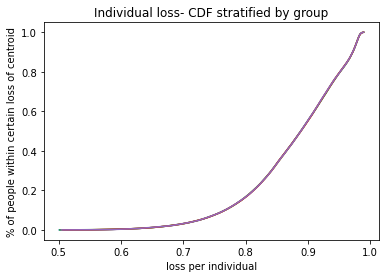

c  {0: (4.595265106969078, 3.825901443264995), 1: (-9.693829718515024, -9.473599389316018), 2: (-11.33855331807235, 6.842549165518499), 3: (9.858880331220892, -4.09600600744505), 4: (-2.3846903853024966, 8.926676786298874), 5: (-2.551483850745969, 1.63399080834206), 6: (2.7754411687463643, 9.792157976972208), 7: (4.771018105790348, -1.6829942114605883), 8: (-7.721837854335119, -6.570028207830807), 9: (7.283363489673679, 8.194467660444822)}
weights:  [0.19999806 0.2000112  0.20000298 0.200004   0.19998376]
Time elapsed Batch Step:  0.3577725887298584
Time elapsed Assignment Step:  2.283830404281616
0.0004105445697484278
total:  0.6134614706730811


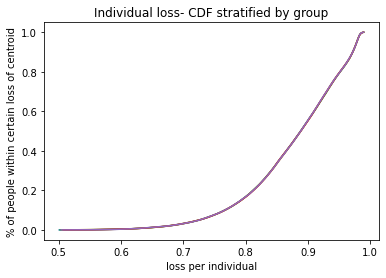

c  {0: (4.594670137890124, 3.8255351188653357), 1: (-9.692326057233968, -9.472130640112946), 2: (-11.33649336015264, 6.8422663522897675), 3: (9.858240547062694, -4.094080245687119), 4: (-2.383238398071121, 8.925352104405508), 5: (-2.5503522436770565, 1.6352764638463415), 6: (2.7741260516913075, 9.790773711194976), 7: (4.771161672848758, -1.6818212358184998), 8: (-7.722854837179453, -6.572096711741051), 9: (7.28149370479094, 8.193621353233718)}
weights:  [0.19999808 0.20001122 0.20000303 0.20000403 0.19998365]
Time elapsed Batch Step:  0.3494832515716553
Time elapsed Assignment Step:  2.324570655822754
0.0004034347778613112
total:  0.6133393010499195


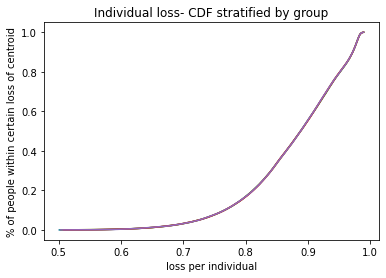

c  {0: (4.594075019434289, 3.8251687852502796), 1: (-9.690822719694122, -9.470662200476337), 2: (-11.33443264715092, 6.841983518752906), 3: (9.857600402335818, -4.092153466390576), 4: (-2.381786166799281, 8.924027270917993), 5: (-2.5492203065911623, 1.6365625731908053), 6: (2.7728102693256536, 9.789388898284711), 7: (4.771305368941525, -1.680647968150614), 8: (-7.723871745431734, -6.574165166036154), 9: (7.279623111026982, 8.19277469423602)}
weights:  [0.19999809 0.20001124 0.20000309 0.20000406 0.19998353]
Time elapsed Batch Step:  0.3383328914642334
Time elapsed Assignment Step:  2.36293888092041
0.0004030331994725467
total:  0.6132189982565411


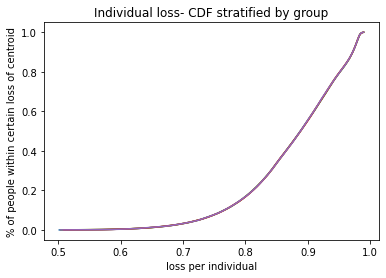

c  {0: (4.593479751552412, 3.8248024424732585), 1: (-9.689319711185973, -9.469194075948959), 2: (-11.33237118268729, 6.841700665624248), 3: (9.856959897577763, -4.0902256714075715), 4: (-2.3803336945627342, 8.922702288960151), 5: (-2.548088040877272, 1.6378491350866153), 6: (2.771493822767622, 9.788003539655117), 7: (4.771449194192367, -1.6794744089272728), 8: (-7.724888574676466, -6.576233562064985), 9: (7.27775171105492, 8.19192768472714)}
weights:  [0.1999981  0.20001125 0.20000315 0.20000409 0.19998341]
Time elapsed Batch Step:  0.34973812103271484
Time elapsed Assignment Step:  2.320819854736328
0.0004039503602970562
total:  0.6130989449131803


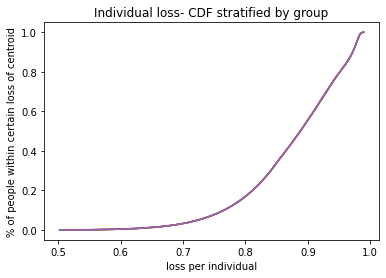

c  {0: (4.592884334195339, 3.82443609058774), 1: (-9.687817037002683, -9.467726272082299), 2: (-11.330308970405232, 6.84141779362323), 3: (9.856319033331237, -4.088296862606077), 4: (-2.378880984447543, 8.921377161665998), 5: (-2.5469554479312477, 1.639136148237977), 6: (2.770176713144255, 9.78661763672847), 7: (4.771593148724972, -1.678300558620519), 8: (-7.725905320482662, -6.578301891139938), 9: (7.275879507565425, 8.191080325990344)}
weights:  [0.19999811 0.20001127 0.20000321 0.20000411 0.1999833 ]
Time elapsed Batch Step:  0.3626699447631836
Time elapsed Assignment Step:  2.2973737716674805
0.00041624071825097086
total:  0.6129821581975718


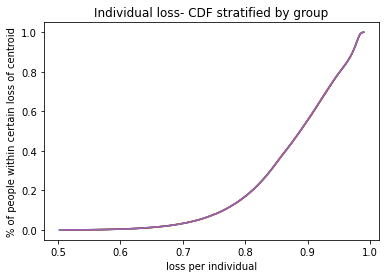

c  {0: (4.5922887673139225, 3.824069729647225), 1: (-9.686314702439827, -9.466258794436428), 2: (-11.328246013971704, 6.841134903472406), 3: (9.85567781014418, -4.086367041869952), 4: (-2.377428039550041, 8.920051892179675), 5: (-2.5458225291558456, 1.6404236113421162), 6: (2.768858941591453, 9.785231190935653), 7: (4.7717372326630025, -1.6771264177040979), 8: (-7.726921978403917, -6.580370144536952), 9: (7.274006503266783, 8.190232619316758)}
weights:  [0.19999812 0.20001129 0.20000327 0.20000414 0.19998318]
Time elapsed Batch Step:  0.3583564758300781
Time elapsed Assignment Step:  2.322838068008423
0.0004237731587705129
total:  0.6128637992925149


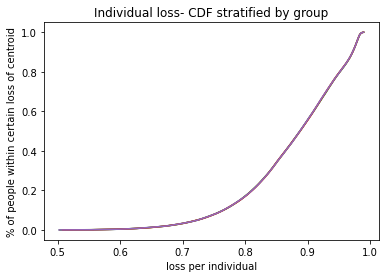

c  {0: (4.591693050859023, 3.8237033597052497), 1: (-9.684812712795129, -9.464791648579853), 2: (-11.326182317077233, 6.840851995897441), 3: (9.855036228569784, -4.08443621109902), 4: (-2.3759748629767974, 8.918726483655393), 5: (-2.544689285960735, 1.6417115230892614), 6: (2.7675405092540086, 9.783844203716171), 7: (4.771881446130088, -1.675951986653461), 8: (-7.727938543978485, -6.582438313495521), 9: (7.272132700884955, 8.1893845660054)}
weights:  [0.19999813 0.2000113  0.20000332 0.20000417 0.19998307]
Time elapsed Batch Step:  0.3894476890563965
Time elapsed Assignment Step:  2.3495261669158936
0.0004189796267840551
total:  0.6127415983291614


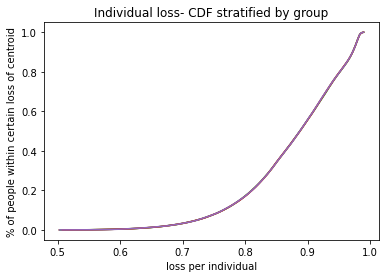

c  {0: (4.591097184781507, 3.8233369808153834), 1: (-9.683311073368191, -9.46332484008937), 2: (-11.324117883436012, 6.840569071627118), 3: (9.854394289166532, -4.082504372209141), 4: (-2.3745214578445797, 8.91740093925737), 5: (-2.5435557197625167, 1.6429998821626222), 6: (2.766221417285643, 9.782456676518194), 7: (4.7720257892498275, -1.6747772659457694), 8: (-7.728955012729358, -6.584506389218715), 9: (7.270258103163629, 8.188536167363186)}
weights:  [0.19999814 0.20001132 0.20000338 0.2000042  0.19998295]
Time elapsed Batch Step:  0.3555309772491455
Time elapsed Assignment Step:  2.3421332836151123
0.00040651750894526995
total:  0.6126169518264554


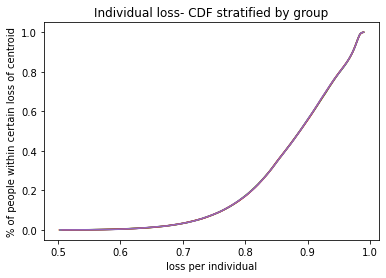

c  {0: (4.59050116903225, 3.8229705930312305), 1: (-9.68180978946021, -9.461858374549896), 2: (-11.322052716785992, 6.84028613139334), 3: (9.853751992498216, -4.080571527132281), 4: (-2.37306782728032, 8.916075262159765), 5: (-2.5424218319847416, 1.6442886872383706), 6: (2.7649016668490414, 9.781068610798574), 7: (4.772170262145789, -1.6736022560598973), 8: (-7.729971380164342, -6.586574362873198), 9: (7.268382712864281, 8.187687424704954)}
weights:  [0.19999815 0.20001133 0.20000344 0.20000423 0.19998284]
Time elapsed Batch Step:  0.3613102436065674
Time elapsed Assignment Step:  2.3377737998962402
0.0004060824293116161
total:  0.6124957985785636


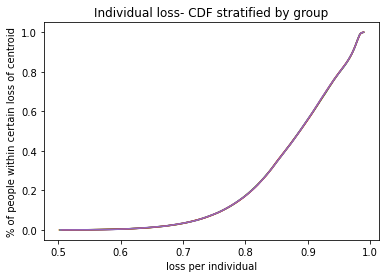

c  {0: (4.5898993773752155, 3.822590231213047), 1: (-9.680308866373686, -9.460392257554307), 2: (-11.319986820888982, 6.840003175931129), 3: (9.853109339133969, -4.078637677816589), 4: (-2.371613974421078, 8.91474945554662), 5: (-2.541287624057928, 1.645577936985621), 6: (2.7635812591158864, 9.779680008022876), 7: (4.772314864941506, -1.6724269574764343), 8: (-7.730987641776142, -6.588642225589247), 9: (7.266513965474669, 8.186839611513763)}
weights:  [0.19999816 0.20001135 0.2000035  0.20000426 0.19998273]
Time elapsed Batch Step:  0.34907078742980957
Time elapsed Assignment Step:  2.373765230178833
0.00039949856545584694
total:  0.6123726563198212


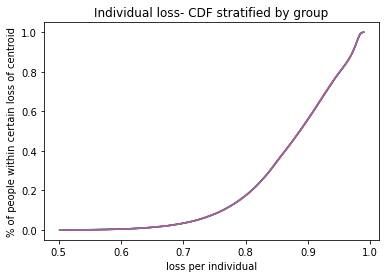

c  {0: (4.589297431405691, 3.822209862955183), 1: (-9.67880830941212, -9.458926494703254), 2: (-11.317920199530738, 6.839720205978631), 3: (9.852466329648289, -4.076702826226467), 4: (-2.370159902414004, 8.913423522611781), 5: (-2.5401530974195814, 1.64686763006641), 6: (2.762260195266896, 9.778290869665407), 7: (4.772459597760479, -1.6712513706776893), 8: (-7.732003793042448, -6.590709968460782), 9: (7.264644427446517, 8.185991453553974)}
weights:  [0.19999817 0.20001136 0.20000356 0.20000429 0.19998261]
Time elapsed Batch Step:  0.3373429775238037
Time elapsed Assignment Step:  2.357133150100708
0.00039267792997410567
total:  0.6122492993642323


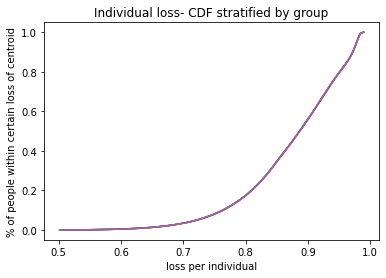

c  {0: (4.5886953310749705, 3.8218294883152577), 1: (-9.677308123879701, -9.457461091604983), 2: (-11.315852856521062, 6.839437222277118), 3: (9.851822964621068, -4.0747669743426425), 4: (-2.368705614416304, 8.912097466558842), 5: (-2.5390182535142114, 1.6481577651356778), 6: (2.760938476491858, 9.776901197209243), 7: (4.772604460726174, -1.670075496147693), 8: (-7.7330198294260155, -6.592777582545388), 9: (7.2627741015259275, 8.185142952132274)}
weights:  [0.19999818 0.20001138 0.20000362 0.20000432 0.1999825 ]
Time elapsed Batch Step:  0.38065338134765625
Time elapsed Assignment Step:  2.465744972229004
0.0003861818945484208
total:  0.612125896809477


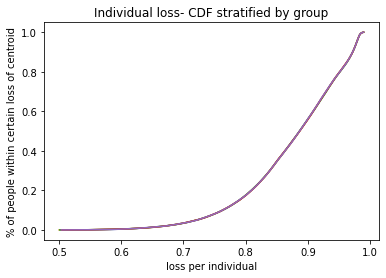

c  {0: (4.588093076334356, 3.8214491073509262), 1: (-9.675808315080992, -9.455996053875133), 2: (-11.313784795693893, 6.839154225570984), 3: (9.851179244637619, -4.0728301241622455), 4: (-2.367251113595202, 8.910771290601064), 5: (-2.5378830937933508, 1.6494483408412473), 6: (2.759616103989665, 9.775510992146257), 7: (4.77274945396202, -1.6688993343722018), 8: (-7.734035746374758, -6.594845058864345), 9: (7.260902990476692, 8.184294108563211)}
weights:  [0.19999819 0.20001139 0.20000368 0.20000434 0.19998239]
Time elapsed Batch Step:  0.37479162216186523
Time elapsed Assignment Step:  2.441236972808838
0.0003905097215441966
total:  0.6120055982550526


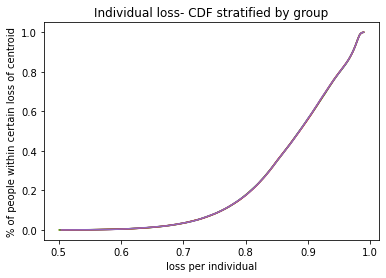

c  {0: (4.587490667135159, 3.8210687201198787), 1: (-9.674308888320596, -9.454531387136525), 2: (-11.311716020907406, 6.838871216607749), 3: (9.850535170288705, -4.070892277698879), 4: (-2.3657964031279053, 8.909444997961305), 5: (-2.5367476197155736, 1.6507393558238048), 6: (2.7582930789683515, 9.774120255977145), 7: (4.77289457759141, -1.6677228858387008), 8: (-7.735051539321838, -6.596912388402661), 9: (7.259031097080352, 8.183444924169208)}
weights:  [0.1999982  0.20001141 0.20000374 0.20000437 0.19998227]
Time elapsed Batch Step:  0.3514089584350586
Time elapsed Assignment Step:  2.301907539367676
0.00040349083147384057
total:  0.611887752908261


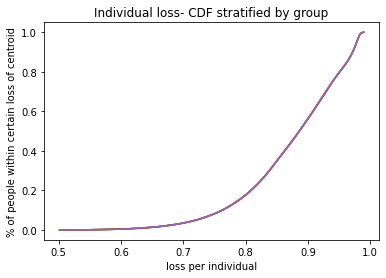

c  {0: (4.586888103428699, 3.82068832667984), 1: (-9.672809848902814, -9.45306709701895), 2: (-11.309646536044102, 6.838588196138058), 3: (9.849890742170565, -4.068953436982693), 4: (-2.3643414862015666, 8.908118591871947), 5: (-2.535611832746513, 1.6520308087168811), 6: (2.756969402645128, 9.772728990211457), 7: (4.7730398317377, -1.6665461510364064), 8: (-7.736067203685759, -6.598979562109105), 9: (7.257158424136249, 8.182595400280587)}
weights:  [0.19999821 0.20001142 0.20000381 0.2000044  0.19998216]
Time elapsed Batch Step:  0.3387167453765869
Time elapsed Assignment Step:  2.2800557613372803
0.00040381408637735206
total:  0.611765968612749


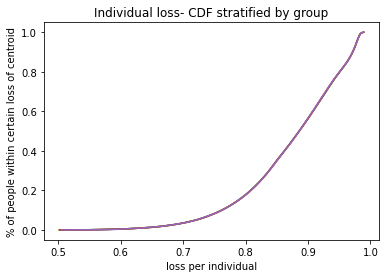

c  {0: (4.586285385166303, 3.820307927088571), 1: (-9.671311202131305, -9.451603189158932), 2: (-11.307576345010906, 6.838305164915684), 3: (9.849245960884945, -4.067013604060461), 4: (-2.3628863660132486, 8.906792075574817), 5: (-2.534475734358879, 1.653322698146831), 6: (2.755645076246418, 9.771337196367622), 7: (4.773185216524206, -1.6653691304562699), 8: (-7.737082734870459, -6.601046570896242), 9: (7.255284974461584, 8.181745538235578)}
weights:  [0.19999822 0.20001144 0.20000387 0.20000442 0.19998205]
Time elapsed Batch Step:  0.3473825454711914
Time elapsed Assignment Step:  2.3596994876861572
0.0004064548674895807
total:  0.6116446287629925


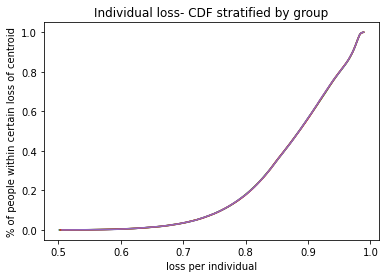

c  {0: (4.585682512299309, 3.8199275214038666), 1: (-9.669812953308721, -9.450139669199489), 2: (-11.305505451739261, 6.838022123697521), 3: (9.848600827039121, -4.065072780995652), 4: (-2.3614310457698884, 8.905465452321112), 5: (-2.533339326032478, 1.6546150227328136), 6: (2.7542949274413195, 9.769940444028924), 7: (4.773330732074206, -1.6641918245909813), 8: (-7.738098128265411, -6.603113405640474), 9: (7.253412163444222, 8.180907286396085)}
weights:  [0.19999823 0.20001145 0.20000393 0.20000445 0.19998193]
Time elapsed Batch Step:  0.3366560935974121
Time elapsed Assignment Step:  2.343722343444824
0.0004140324606243251
total:  0.6115246284336652


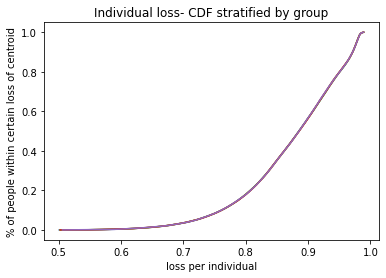

c  {0: (4.5850794847790635, 3.8195471096835587), 1: (-9.668315107736344, -9.448676542789867), 2: (-11.303433860185223, 6.83773907324359), 3: (9.84795534124593, -4.063130969868504), 4: (-2.35997552868826, 8.904138725371311), 5: (-2.5322026092542296, 1.655907781086773), 6: (2.7529441250620224, 9.768543133605771), 7: (4.773476378510936, -1.663014233934971), 8: (-7.73911337924572, -6.605180057182081), 9: (7.251538582229553, 8.180068704150193)}
weights:  [0.19999824 0.20001147 0.20000399 0.20000448 0.19998182]
Time elapsed Batch Step:  0.34957265853881836
Time elapsed Assignment Step:  2.341514825820923
0.00041329725897698566
total:  0.6114019925146458


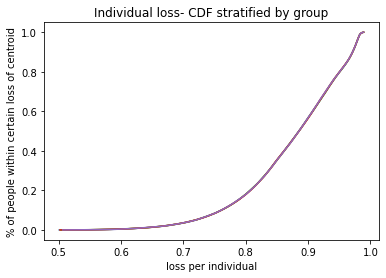

c  {0: (4.584476302556922, 3.819166691985513), 1: (-9.666817670713707, -9.447213815585279), 2: (-11.301361574329551, 6.837456014317032), 3: (9.8473095041238, -4.0611881727761), 4: (-2.358519817994941, 8.902811897995104), 5: (-2.531065585518184, 1.657200971813419), 6: (2.7515926704353495, 9.767145266662725), 7: (4.77362215595759, -1.6618363589844143), 8: (-7.740128483172229, -6.607246516325266), 9: (7.2496642336594785, 8.179229792830824)}
weights:  [0.19999825 0.20001149 0.20000406 0.2000045  0.1999817 ]
Time elapsed Batch Step:  0.3713057041168213
Time elapsed Assignment Step:  2.3398969173431396
0.00041807588631181947
total:  0.6112809971053533


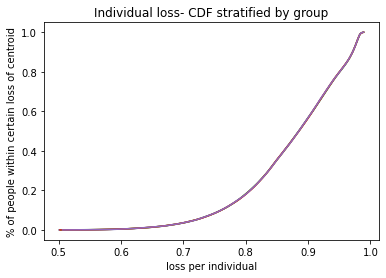

c  {0: (4.5838744586209526, 3.818779496365491), 1: (-9.665320647538211, -9.445751493246615), 2: (-11.29928859817781, 6.837172947684111), 3: (9.846663316296773, -4.059244391832443), 4: (-2.357063916926273, 8.901484973471298), 5: (-2.529936494916422, 1.6584822032295186), 6: (2.7502405648979242, 9.765746844773828), 7: (4.7737680645373235, -1.660658200237234), 8: (-7.741143435391619, -6.6093127738382), 9: (7.247789120593771, 8.17839055377871)}
weights:  [0.19999826 0.2000115  0.20000412 0.20000453 0.19998159]
Time elapsed Batch Step:  0.35518980026245117
Time elapsed Assignment Step:  2.3496620655059814
0.0004093119966448455
total:  0.6111557978226008


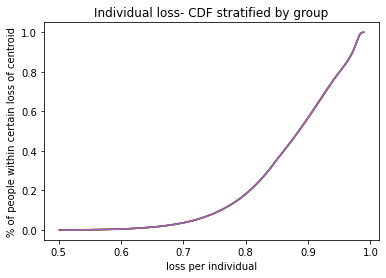

c  {0: (4.583272462267495, 3.8183922931732246), 1: (-9.663824043504732, -9.444289581440142), 2: (-11.297214935760458, 6.836889874114208), 3: (9.84601677839454, -4.05729962916853), 4: (-2.3556078287283304, 8.900157955087733), 5: (-2.528807098952559, 1.6597638618878896), 6: (2.7488878097962086, 9.764347869522632), 7: (4.773914104373243, -1.6594797581931038), 8: (-7.74215823123652, -6.611378820453073), 9: (7.245913245910121, 8.177550988342396)}
weights:  [0.19999827 0.20001152 0.20000418 0.20000456 0.19998147]
Time elapsed Batch Step:  0.3393537998199463
Time elapsed Assignment Step:  2.314049482345581
0.00040387876634362385
total:  0.6110314784958852


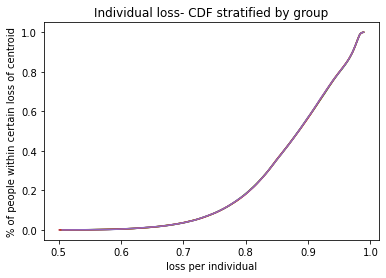

c  {0: (4.582670313450693, 3.8180050824669483), 1: (-9.662323884698527, -9.44283760739437), 2: (-11.295140591132942, 6.836606794379819), 3: (9.845369891052465, -4.05535388693243), 4: (-2.3541515566568836, 8.8988308461412), 5: (-2.5276773990857486, 1.661045946426819), 6: (2.74753440648654, 9.762948342502234), 7: (4.774060275588415, -1.6583010333534511), 8: (-7.743181183361077, -6.613441275183889), 9: (7.244036612504201, 8.176711097878263)}
weights:  [0.19999828 0.20001153 0.20000424 0.20000459 0.19998136]
Time elapsed Batch Step:  0.3465909957885742
Time elapsed Assignment Step:  2.334714889526367
0.00040800957576314634
total:  0.6109098878013662


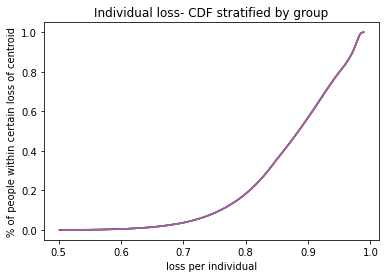

c  {0: (4.582068012124699, 3.817617864304931), 1: (-9.66082417900555, -9.441386080153444), 2: (-11.293065568375795, 6.836323709256554), 3: (9.844722654911616, -4.053407167289354), 4: (-2.3526951039773643, 8.897503649937345), 5: (-2.5265473967820897, 1.6623284554775535), 6: (2.74618035633517, 9.761548265315298), 7: (4.774206578305858, -1.6571220262214605), 8: (-7.744203992064988, -6.61550353775491), 9: (7.242159223289706, 8.175870883750537)}
weights:  [0.19999829 0.20001154 0.2000043  0.20000461 0.19998125]
Time elapsed Batch Step:  0.3517003059387207
Time elapsed Assignment Step:  2.345586061477661
0.00040518514371357117
total:  0.6107860709859118


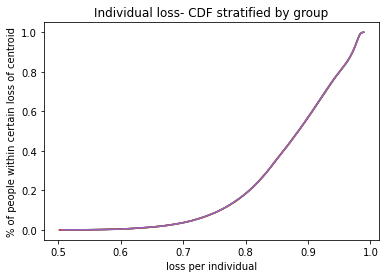

c  {0: (4.5814655582436785, 3.8172306387454764), 1: (-9.659324931752515, -9.439935005415787), 2: (-11.290989871594727, 6.836040619523131), 3: (9.844075070618791, -4.051459472421734), 4: (-2.351238473964831, 8.89617636979058), 5: (-2.5254170935146476, 1.6636113876642795), 6: (2.7448256607183033, 9.760147639574093), 7: (4.774353012648545, -1.6559427373020772), 8: (-7.745226652694297, -6.617565598943846), 9: (7.24028108119842, 8.175030347331315)}
weights:  [0.1999983  0.20001156 0.20000436 0.20000464 0.19998113]
Time elapsed Batch Step:  0.345609188079834
Time elapsed Assignment Step:  2.306837558746338
0.00040598197432883953
total:  0.6106631820819904


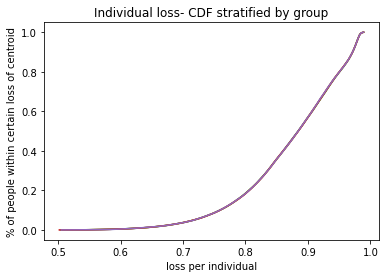

c  {0: (4.580855243544054, 3.8168517703224443), 1: (-9.657826148261345, -9.438484388883293), 2: (-11.288913504920718, 6.835757525961372), 3: (9.84342713882655, -4.049510804529299), 4: (-2.3497816699039356, 8.894849009023986), 5: (-2.524286490763469, 1.6648947416041056), 6: (2.743470321022134, 9.75874646690052), 7: (4.7745003932976475, -1.654761036206611), 8: (-7.746249160581243, -6.6196274494925005), 9: (7.23840218918026, 8.174189490000568)}
weights:  [0.19999831 0.20001157 0.20000443 0.20000467 0.19998102]
Time elapsed Batch Step:  0.36833715438842773
Time elapsed Assignment Step:  2.319617748260498
0.0004008602683871487
total:  0.6105383779754407


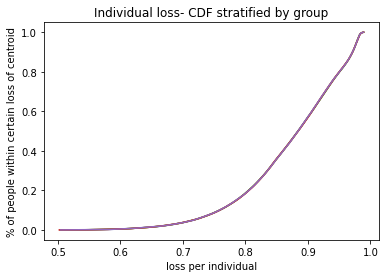

c  {0: (4.580244769759661, 3.81647289555634), 1: (-9.65632783384873, -9.43703423626094), 2: (-11.286836472510114, 6.835474429356201), 3: (9.842778860193242, -4.0475611658291495), 4: (-2.3483246950888903, 8.893521570969225), 5: (-2.5231555900155995, 1.6661785159070428), 6: (2.7421143386428852, 9.757344748926144), 7: (4.7746479064143275, -1.6535790483668606), 8: (-7.7472715110443735, -6.6216890801068224), 9: (7.2365225502033335, 8.173348313146164)}
weights:  [0.19999832 0.20001159 0.20000449 0.2000047  0.19998091]
Time elapsed Batch Step:  0.3998067378997803
Time elapsed Assignment Step:  2.4222819805145264
0.0003952638393502905
total:  0.6104132925609077


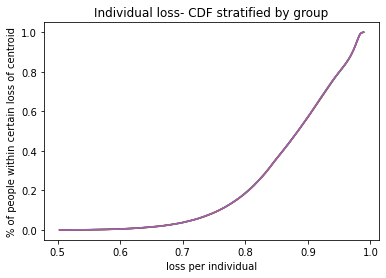

c  {0: (4.579634136839837, 3.816094014503347), 1: (-9.654829993825699, -9.435584553256382), 2: (-11.28475877854472, 6.835191330495635), 3: (9.842130235383037, -4.045610558555834), 4: (-2.346867552823434, 8.892194058966439), 5: (-2.522024392765102, 1.6674627091759857), 6: (2.740757714986847, 9.755942487292216), 7: (4.774795552122233, -1.6523967742851597), 8: (-7.748293699388662, -6.6237504814569705), 9: (7.234642167253989, 8.17250681816388)}
weights:  [0.19999833 0.2000116  0.20000455 0.20000472 0.1999808 ]
Time elapsed Batch Step:  0.36884140968322754
Time elapsed Assignment Step:  2.2753756046295166
0.00039973902260215244
total:  0.6102910894135289


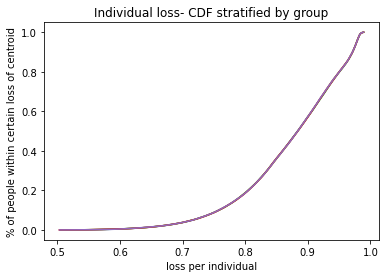

c  {0: (4.579023344733931, 3.8157151272196823), 1: (-9.653332633497165, -9.434135345579511), 2: (-11.282680427231893, 6.834908230170782), 3: (9.84148126506595, -4.043658984961428), 4: (-2.345410246420801, 8.89086647636415), 5: (-2.520892900513072, 1.6687473200066938), 6: (2.7394004514704138, 9.75453968364972), 7: (4.774943330544966, -1.6512142144656188), 8: (-7.7493157209056305, -6.625811644177371), 9: (7.232761043336872, 8.171665006457419)}
weights:  [0.19999833 0.20001162 0.20000461 0.20000475 0.19998069]
Time elapsed Batch Step:  0.3756537437438965
Time elapsed Assignment Step:  2.3393192291259766
0.0003954838985860132
total:  0.6101661283240186


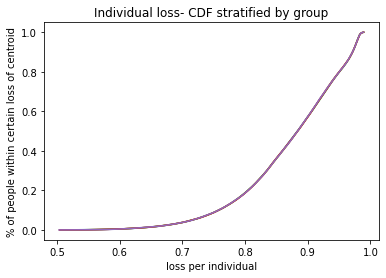

c  {0: (4.578412393391304, 3.8153362337615944), 1: (-9.651835758161488, -9.432686618942014), 2: (-11.280601422804635, 6.834625129175833), 3: (9.840831949917876, -4.041706447315603), 4: (-2.343952779203687, 8.889538826519162), 5: (-2.519761114767656, 1.6700323469877725), 6: (2.738042549520124, 9.753136339659381), 7: (4.775091241806075, -1.6500313694141298), 8: (-7.75033757087347, -6.627872558866782), 9: (7.230879181474973, 8.170822879438418)}
weights:  [0.19999834 0.20001163 0.20000467 0.20000478 0.19998057]
Time elapsed Batch Step:  0.33866000175476074
Time elapsed Assignment Step:  2.3286917209625244
0.0003897368567039594
total:  0.6100405818266158


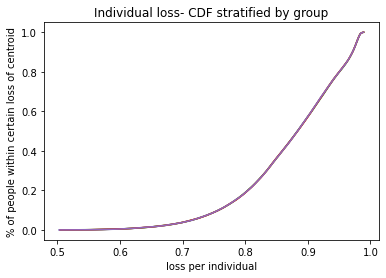

c  {0: (4.577801282761331, 3.814957334185364), 1: (-9.650339373110011, -9.431238379056895), 2: (-11.278521769521683, 6.834342028308052), 3: (9.840182290620614, -4.03975294790571), 4: (-2.3424951545042214, 8.888211112796458), 5: (-2.5186290370440685, 1.6713177887006545), 6: (2.736684010572698, 9.751732456991718), 7: (4.77523928602906, -1.6488482396383684), 8: (-7.751359244557169, -6.629933216088367), 9: (7.228996584709681, 8.169980438526473)}
weights:  [0.19999835 0.20001165 0.20000474 0.2000048  0.19998046]
Time elapsed Batch Step:  0.3504195213317871
Time elapsed Assignment Step:  2.3464195728302
0.0003778482047643861
total:  0.6099130554874971


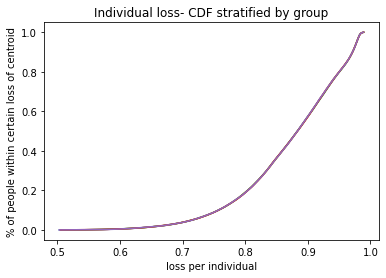

c  {0: (4.5771900127934, 3.8145784285473052), 1: (-9.648843483626623, -9.429790631637987), 2: (-11.276441471667606, 6.834058928367777), 3: (9.839532287861905, -4.037798489036857), 4: (-2.3410373756639338, 8.886883338569096), 5: (-2.5174966688646068, 1.6726036437195806), 6: (2.735324836075076, 9.750328037327057), 7: (4.775387463337368, -1.647664825647798), 8: (-7.752380737208639, -6.6319936063697575), 9: (7.227113256100839, 8.16913768514914)}
weights:  [0.19999836 0.20001166 0.2000048  0.20000483 0.19998035]
Time elapsed Batch Step:  0.3448803424835205
Time elapsed Assignment Step:  2.3715710639953613
0.00038993656908281604
total:  0.6097925843704557


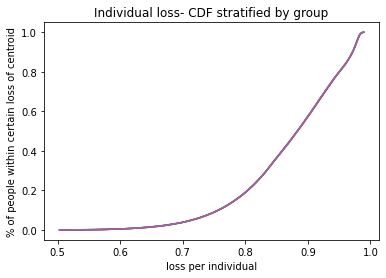

c  {0: (4.576578583436911, 3.8141995169037637), 1: (-9.647348094987288, -9.428343382399436), 2: (-11.274360533552896, 6.8337758301584035), 3: (9.838881942335453, -4.035843073031979), 4: (-2.339579446033726, 8.885555507218102), 5: (-2.5163640117586703, 1.6738899106115814), 6: (2.7339650274844574, 9.74892308235557), 7: (4.775535773854393, -1.6464811279536722), 8: (-7.7534020440668465, -6.634053720203134), 9: (7.225229198726791, 8.168294620741959)}
weights:  [0.19999837 0.20001167 0.20000486 0.20000486 0.19998024]
Time elapsed Batch Step:  0.35924506187438965
Time elapsed Assignment Step:  2.347520351409912
0.00039793984703573315
total:  0.6096707503984731


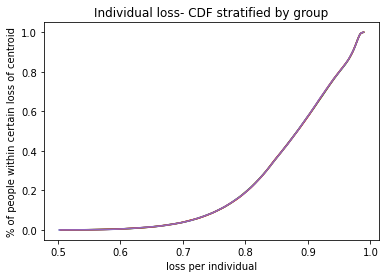

c  {0: (4.575966994641277, 3.813820599311118), 1: (-9.645853212459608, -9.426896637055165), 2: (-11.272278959514058, 6.833492734486381), 3: (9.838231254740958, -4.033886702231923), 4: (-2.3381213689738427, 8.884227622132368), 5: (-2.5152310672627762, 1.6751765879364582), 6: (2.7326045862683386, 9.747517593777305), 7: (4.775684217703474, -1.645297147069039), 8: (-7.754423160357953, -6.6361135480453), 9: (7.223344415684434, 8.167451246748463)}
weights:  [0.19999837 0.20001169 0.20000492 0.20000489 0.19998013]
Time elapsed Batch Step:  0.3500189781188965
Time elapsed Assignment Step:  2.377838134765625
0.00039292493595988187
total:  0.60954487418675


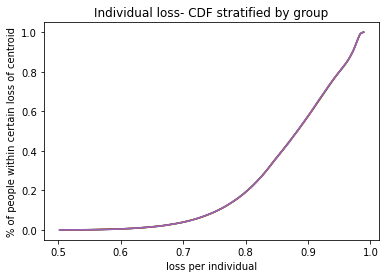

c  {0: (4.575355246355924, 3.813441675825778), 1: (-9.644358841302362, -9.425450401318317), 2: (-11.270196753913702, 6.8332096421612), 3: (9.837580225784146, -4.031929378995518), 4: (-2.3366631478538427, 8.882899686708537), 5: (-2.514097836920577, 1.676463674246764), 6: (2.7312435139045523, 9.74611157330221), 7: (4.775832795007895, -1.6441128835087433), 8: (-7.755444081295442, -6.638173080317763), 9: (7.2214589100892725, 8.166607564620197)}
weights:  [0.19999838 0.2000117  0.20000499 0.20000492 0.19998002]
Time elapsed Batch Step:  0.3656497001647949
Time elapsed Assignment Step:  2.341437578201294
0.0003954887185322331
total:  0.6094211351704535


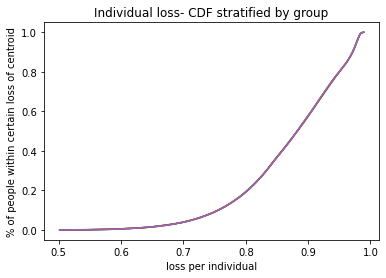

c  {0: (4.5747433385302925, 3.813062746504187), 1: (-9.642864986765055, -9.42400468090067), 2: (-11.268113921140637, 6.832926553995387), 3: (9.836928856176803, -4.02997110569966), 4: (-2.335204786052572, 8.881571704350899), 5: (-2.5129643222828757, 1.6777511680877855), 6: (2.7298818118813064, 9.74470502265017), 7: (4.775981505890886, -1.6429283377894304), 8: (-7.756464802080268, -6.640232307406819), 9: (7.219572685075466, 8.16576357581672)}
weights:  [0.19999839 0.20001171 0.20000505 0.20000495 0.19997991]
Time elapsed Batch Step:  0.3794231414794922
Time elapsed Assignment Step:  2.3259434700012207
0.0003948352369247399
total:  0.6092962952982895


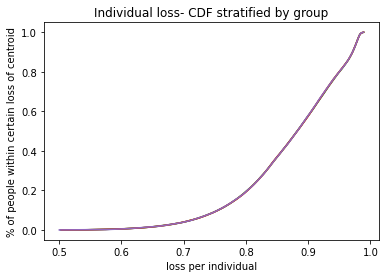

c  {0: (4.574131271113836, 3.81268381140282), 1: (-9.641371654087479, -9.422559481512033), 2: (-11.266030465609958, 6.8326434708044905), 3: (9.836277146636798, -4.028011884739384), 4: (-2.3337462869581374, 8.880243678471274), 5: (-2.5118305249076434, 1.6790390679975233), 6: (2.728519481697221, 9.743297943551035), 7: (4.7761303504756185, -1.641743510429549), 8: (-7.757485317900995, -6.642291219663641), 9: (7.217685743795881, 8.164919281805634)}
weights:  [0.19999839 0.20001172 0.20000511 0.20000497 0.1999798 ]
Time elapsed Batch Step:  0.3504190444946289
Time elapsed Assignment Step:  2.361083984375
0.00039711969275846304
total:  0.609172201570684


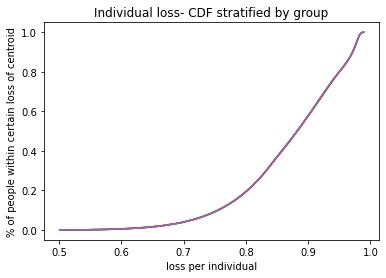

c  {0: (4.573519044056019, 3.812304870578184), 1: (-9.63987884849927, -9.42111480885963), 2: (-11.263946391763142, 6.83236039340707), 3: (9.835625097888117, -4.026051718527944), 4: (-2.3322876539678807, 8.8789156124889), 5: (-2.5106964463600363, 1.6803273725066745), 6: (2.72715652486137, 9.741890337744648), 7: (4.776279328885204, -1.6405584019493553), 8: (-7.758505623933944, -6.6443498074043665), 9: (7.215798089422141, 8.16407468406258)}
weights:  [0.1999984  0.20001173 0.20000517 0.200005   0.19997969]
Time elapsed Batch Step:  0.3671531677246094
Time elapsed Assignment Step:  2.3681886196136475
0.0004035982232156732
total:  0.6090492316627926


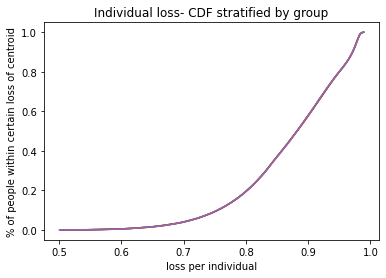

c  {0: (4.572906657306324, 3.8119259240868186), 1: (-9.638386575219473, -9.419670668647429), 2: (-11.261861704068128, 6.832077322624685), 3: (9.834972710660898, -4.0240906094968905), 4: (-2.3308288904883545, 8.87758750983032), 5: (-2.509562088212411, 1.6816160801386129), 6: (2.725792942893317, 9.74048220698088), 7: (4.776428441242698, -1.6393730128709152), 8: (-7.75952571534334, -6.646408060910194), 9: (7.213909725144678, 8.163229784071262)}
weights:  [0.1999984  0.20001174 0.20000524 0.20000503 0.19997959]
Time elapsed Batch Step:  0.3477516174316406
Time elapsed Assignment Step:  2.315060615539551
0.0004041189831299752
total:  0.6089243400566612


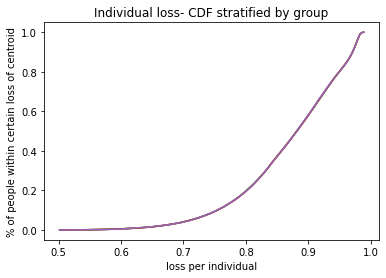

c  {0: (4.572294110814243, 3.8115469719852952), 1: (-9.636894839456113, -9.418227066575485), 2: (-11.25977640701942, 6.8317942592818826), 3: (9.83431998569145, -4.02212856009615), 4: (-2.3293699999352975, 8.876259373929265), 5: (-2.5084274520443413, 1.6829051894093707), 6: (2.7244287373231564, 9.739073553019656), 7: (4.776577687671092, -1.638187343718108), 8: (-7.760545587281468, -6.648465970427482), 9: (7.21202065417278, 8.162384583323458)}
weights:  [0.19999841 0.20001175 0.2000053  0.20000506 0.19997949]
Time elapsed Batch Step:  0.34641504287719727
Time elapsed Assignment Step:  2.339390277862549
0.00041843840644617547
total:  0.6088034534524421


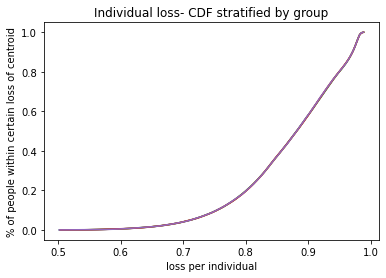

c  {0: (4.571681404529285, 3.8111680143302173), 1: (-9.635403646405784, -9.416784008339235), 2: (-11.257690505138163, 6.831511204206183), 3: (9.833666923722294, -4.020165572794103), 4: (-2.327910985733612, 8.874931208226537), 5: (-2.5072925394426355, 1.6841946988276202), 6: (2.7230639096915508, 9.737664377630987), 7: (4.7767270682933205, -1.63700139501663), 8: (-7.761565234888826, -6.650523526167848), 9: (7.210130879734641, 8.16153908331903)}
weights:  [0.19999841 0.20001176 0.20000536 0.20000508 0.19997939]
Time elapsed Batch Step:  0.37233853340148926
Time elapsed Assignment Step:  2.420952320098877
0.00041836595797106746
total:  0.6086781152342151


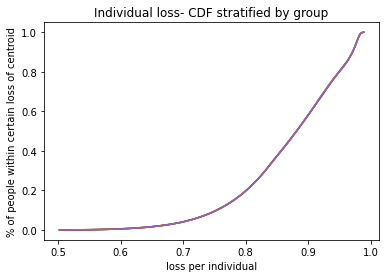

c  {0: (4.5710685384009695, 3.8107890511782205), 1: (-9.633913001253243, -9.41534149962878), 2: (-11.255604002972243, 6.831228158228067), 3: (9.833013525502194, -4.018201650077661), 4: (-2.326451851317344, 8.873603016169886), 5: (-2.506157352001351, 1.6854846068946547), 6: (2.7216984615497712, 9.736254682594998), 7: (4.776876583232253, -1.6358151672939971), 8: (-7.762584653294281, -6.652580718308275), 9: (7.208240405077413, 8.160693285565936)}
weights:  [0.19999841 0.20001177 0.20000542 0.20000511 0.19997928]
Time elapsed Batch Step:  0.38387608528137207
Time elapsed Assignment Step:  2.3288042545318604
0.0004191307777637876
total:  0.6085528942848746


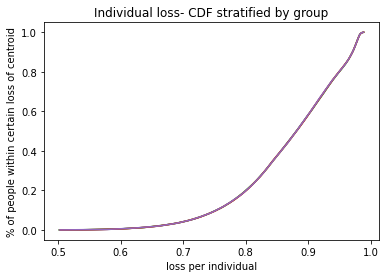

c  {0: (4.5704555123788335, 3.8104100825859724), 1: (-9.632422909171009, -9.413899546128144), 2: (-11.253516905096367, 6.830945122180959), 3: (9.83235979178618, -4.016236794452348), 4: (-2.32499260012966, 8.872274801213896), 5: (-2.5050218913218116, 1.6867749121043705), 6: (2.7203323944597355, 9.734844469701963), 7: (4.777026232610697, -1.6346286610795486), 8: (-7.763603837615239, -6.65463753699122), 9: (7.206349233467252, 8.159847191580244)}
weights:  [0.19999842 0.20001178 0.20000548 0.20000514 0.19997918]
Time elapsed Batch Step:  0.3634154796600342
Time elapsed Assignment Step:  2.327733278274536
0.00042609791480385795
total:  0.6084294009807721


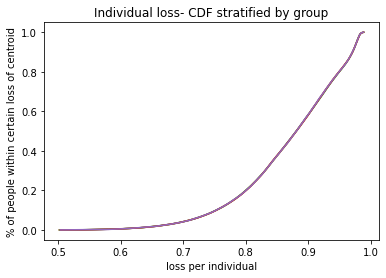

c  {0: (4.569842326412426, 3.810031108610173), 1: (-9.630933375318994, -9.412458153514502), 2: (-11.251429216112157, 6.830662096901214), 3: (9.831705723335585, -4.014271008442374), 4: (-2.323533235622829, 8.870946566819862), 5: (-2.5038861590126236, 1.6880656129432472), 6: (2.718965709994047, 9.73343374075233), 7: (4.777176016551395, -1.63344187690445), 8: (-7.764622782957802, -6.656693972324728), 9: (7.204457368189366, 8.159000802886144)}
weights:  [0.19999842 0.20001179 0.20000554 0.20000517 0.19997908]
Time elapsed Batch Step:  0.3738553524017334
Time elapsed Assignment Step:  3.8289616107940674
0.0004385658841429274
total:  0.6083074249154984


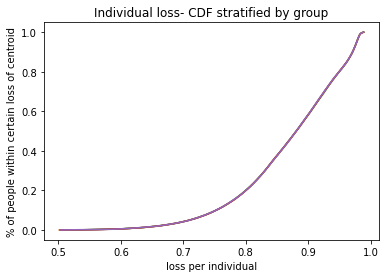

c  {0: (4.569228980451313, 3.809652129307553), 1: (-9.629444404844133, -9.411017327457394), 2: (-11.249340940648231, 6.830379083228099), 3: (9.831051320918075, -4.012304294590721), 4: (-2.3220737612582036, 8.869618316455664), 5: (-2.502750156689691, 1.6893567078903307), 6: (2.7175984097360346, 9.732022497556756), 7: (4.777325935177024, -1.632254815301697), 8: (-7.765641484416941, -6.658750014382548), 9: (7.202564812548065, 8.158154121015956)}
weights:  [0.19999842 0.2000118  0.2000056  0.2000052  0.19997897]
Time elapsed Batch Step:  0.5919344425201416
Time elapsed Assignment Step:  2.6043426990509033
0.00042748987620599976
total:  0.6081782526371455


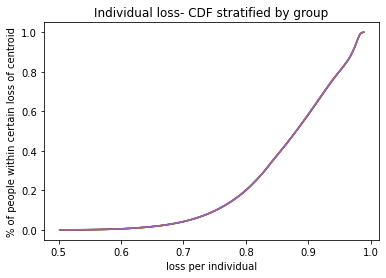

c  {0: (4.56861547444507, 3.809273144734876), 1: (-9.62795600288004, -9.409577073617923), 2: (-11.247252083360294, 6.8300960820037755), 3: (9.83039658530768, -4.010336655459218), 4: (-2.3206141805062024, 8.868290053595647), 5: (-2.5016138859762322, 1.6906481954172135), 6: (2.716230495279791, 9.730610741936133), 7: (4.777475988610196, -1.6310674768061173), 8: (-7.766659937076667, -6.660805653204252), 9: (7.20067156986681, 8.157307147510144)}
weights:  [0.19999843 0.20001182 0.20000566 0.20000523 0.19997887]
Time elapsed Batch Step:  0.35832786560058594
Time elapsed Assignment Step:  2.3761210441589355
0.00042451098398654796
total:  0.6080513774593111


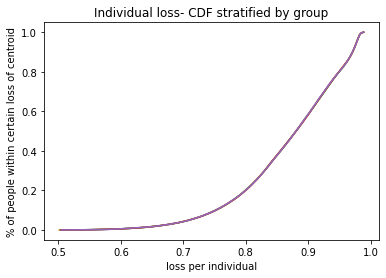

c  {0: (4.568001808343291, 3.808894154948938), 1: (-9.626468174546682, -9.408137397647913), 2: (-11.24516264893122, 6.829813094073284), 3: (9.829741517284825, -4.008368093628623), 4: (-2.3191544968462954, 8.866961781720494), 5: (-2.500477348502796, 1.6919400739880164), 6: (2.7148619682302124, 9.729198475721619), 7: (4.777626176973454, -1.6298798619543757), 8: (-7.767678136010206, -6.662860878795363), 9: (7.198777643488257, 8.15645988391733)}
weights:  [0.19999843 0.20001183 0.20000572 0.20000526 0.19997876]
Time elapsed Batch Step:  0.3516378402709961
Time elapsed Assignment Step:  2.3297929763793945
0.00041134272837339836
total:  0.607921314195993


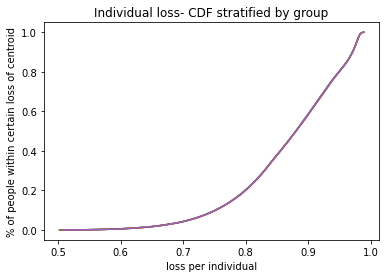

c  {0: (4.567387982095583, 3.8085151600065656), 1: (-9.624980924950071, -9.406698305189062), 2: (-11.243072642071143, 6.829530120284522), 3: (9.829086117636363, -4.006398611698699), 4: (-2.3176947137669868, 8.865633504317104), 5: (-2.499340545907276, 1.6932323420593707), 6: (2.713492830203038, 9.727785700754673), 7: (4.777776500389274, -1.6286919712849763), 8: (-7.768696076280181, -6.664915681127479), 9: (7.1968830367743095, 8.1556123317943)}
weights:  [0.19999844 0.20001184 0.20000578 0.20000529 0.19997866]
Time elapsed Batch Step:  0.3435676097869873
Time elapsed Assignment Step:  2.3122403621673584
0.0004201145026895281
total:  0.6077977832917867


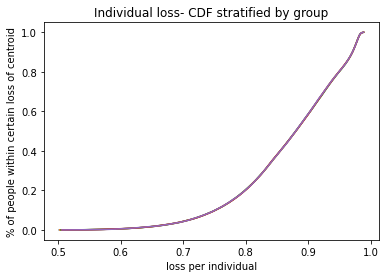

c  {0: (4.56677370495625, 3.808136571045486), 1: (-9.623494259181978, -9.405259801872075), 2: (-11.240982067517532, 6.829247161488225), 3: (9.828430387155606, -4.004428212288295), 4: (-2.3162348347658033, 8.864305224878459), 5: (-2.4982064223408136, 1.6945156080579251), 6: (2.7121230828248883, 9.726372418887077), 7: (4.7779269589800615, -1.6275038053382653), 8: (-7.769713752938792, -6.66697005013841), 9: (7.194987753106159, 8.154764492706015)}
weights:  [0.19999844 0.20001185 0.20000584 0.20000532 0.19997855]
Time elapsed Batch Step:  0.35240721702575684
Time elapsed Assignment Step:  2.3960025310516357
0.000411918440592296
total:  0.6076690304912098


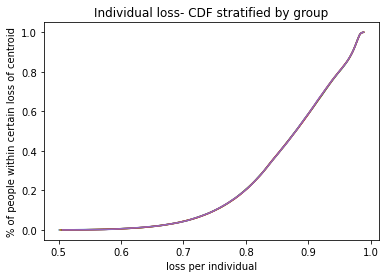

c  {0: (4.5661592684797565, 3.807757978833529), 1: (-9.622008182319677, -9.40382189331577), 2: (-11.238890930035286, 6.828964218537947), 3: (9.827774326642356, -4.00245689803543), 4: (-2.3147748633492804, 8.862976946903501), 5: (-2.4970720394263624, 1.6957992561407234), 6: (2.710752727733306, 9.724958631980973), 7: (4.778077552868152, -1.6263153646564354), 8: (-7.770731161028003, -6.669023975732315), 9: (7.193091795884337, 8.153916368225627)}
weights:  [0.19999844 0.20001186 0.2000059  0.20000536 0.19997844]
Time elapsed Batch Step:  0.3833303451538086
Time elapsed Assignment Step:  2.3148627281188965
0.0004191868083834871
total:  0.6075447864318935


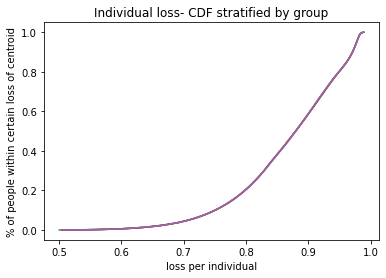

c  {0: (4.565544672616707, 3.8073793834293), 1: (-9.620522699425704, -9.40238458512617), 2: (-11.236799234416807, 6.828681292290036), 3: (9.827117936902935, -4.000484671597365), 4: (-2.313314803032952, 8.861648673897003), 5: (-2.495937398802553, 1.6970832847705417), 6: (2.7093817665767927, 9.72354434190889), 7: (4.778228282175809, -1.6251266497835284), 8: (-7.771748295579736, -6.671077447779841), 9: (7.191195168528759, 8.153067959934482)}
weights:  [0.19999845 0.20001187 0.20000595 0.20000539 0.19997834]
Time elapsed Batch Step:  0.36507725715637207
Time elapsed Assignment Step:  2.3174970149993896
0.0004309361764409658
total:  0.6074217566619432


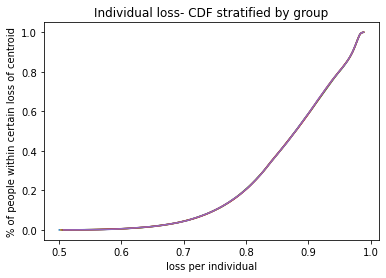

c  {0: (4.564929917317724, 3.8070007848914376), 1: (-9.619037815547658, -9.400947882895577), 2: (-11.234706985482088, 6.828398383603614), 3: (9.826461218750225, -3.998511535650693), 4: (-2.3118546573413385, 8.86032040936944), 5: (-2.4948025021152818, 1.6983676924027646), 6: (2.7080102010148517, 9.722129550553772), 7: (4.778379147025225, -1.6239376612654381), 8: (-7.7727651516160625, -6.673130456118273), 9: (7.18929787447877, 8.15221926942214)}
weights:  [0.19999845 0.20001189 0.20000601 0.20000542 0.19997823]
Time elapsed Batch Step:  0.3425757884979248
Time elapsed Assignment Step:  2.342970848083496
0.0004302043172781378
total:  0.6072948529039967


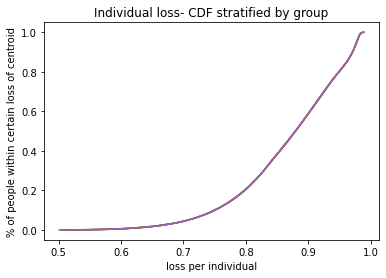

c  {0: (4.564315002533446, 3.8066221832786122), 1: (-9.617553535718011, -9.399511792201642), 2: (-11.232614188078793, 6.828115493340551), 3: (9.825804173003691, -3.9965374928914095), 4: (-2.310394429807941, 8.858992156836855), 5: (-2.493667351017727, 1.6996524774853667), 6: (2.7066380327180246, 9.720714259809018), 7: (4.778530147538517, -1.6227483996499146), 8: (-7.7737817241494, -6.67518299055168), 9: (7.187399917193191, 8.151370298286373)}
weights:  [0.19999845 0.2000119  0.20000607 0.20000545 0.19997812]
Time elapsed Batch Step:  0.3422379493713379
Time elapsed Assignment Step:  2.3711965084075928
0.0004318622640349101
total:  0.6071685366534494


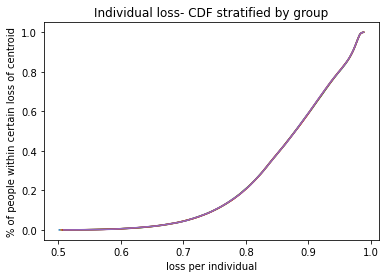

c  {0: (4.563699928214526, 3.8062435786495272), 1: (-9.616069864953964, -9.398076318606396), 2: (-11.230520847082337, 6.827832622365442), 3: (9.825146800489417, -3.994562546035), 4: (-2.3089341239752303, 8.857663919820737), 5: (-2.492531947170362, 1.7009376384588952), 6: (2.7052652633679326, 9.719298471578497), 7: (4.778681283837729, -1.6215588654865662), 8: (-7.774798008182718, -6.677235040851073), 9: (7.185501300150362, 8.150521048133184)}
weights:  [0.19999846 0.20001191 0.20000613 0.20000549 0.19997801]
Time elapsed Batch Step:  0.33649492263793945
Time elapsed Assignment Step:  2.2972536087036133
0.00044117272863242185
total:  0.6070443096357199


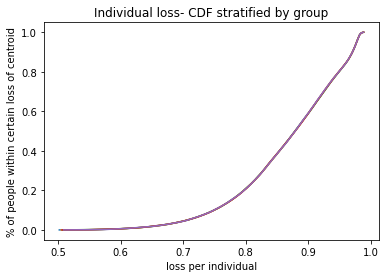

c  {0: (4.563084694311635, 3.8058649710629178), 1: (-9.614586808257325, -9.396641467655295), 2: (-11.228426967395963, 6.82754977154558), 3: (9.82448910204014, -3.992586697816518), 4: (-2.3074737433946444, 8.856335701847879), 5: (-2.491396292240971, 1.7022231737564517), 6: (2.7038708844890027, 9.717879713394106), 7: (4.7788325560448275, -1.6203690593268643), 8: (-7.775813998709745, -6.679286596754564), 9: (7.183606523998058, 8.149677587724995)}
weights:  [0.19999846 0.20001193 0.20000619 0.20000552 0.1999779 ]
Time elapsed Batch Step:  0.36537766456604004
Time elapsed Assignment Step:  2.3752474784851074
0.00043902361817360624
total:  0.6069165150864404


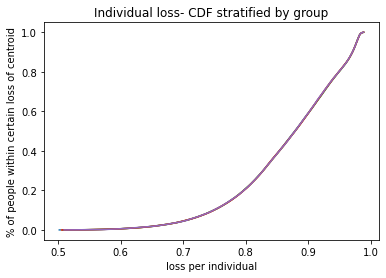

c  {0: (4.562469300775457, 3.805486360577551), 1: (-9.613104370614424, -9.395207244876232), 2: (-11.226332553950824, 6.8272669417509295), 3: (9.82383107849528, -3.9906099509906663), 4: (-2.3060132916265803, 8.855007506450255), 5: (-2.490260387904662, 1.7035090818036747), 6: (2.702475898872593, 9.716460437676425), 7: (4.778983964281703, -1.6191789817241447), 8: (-7.776829690715178, -6.681337647967531), 9: (7.181711088191047, 8.148833850880932)}
weights:  [0.19999847 0.20001194 0.20000624 0.20000555 0.19997779]
Time elapsed Batch Step:  0.34638023376464844
Time elapsed Assignment Step:  2.33087158203125
0.00044270373502031113
total:  0.606790340492886


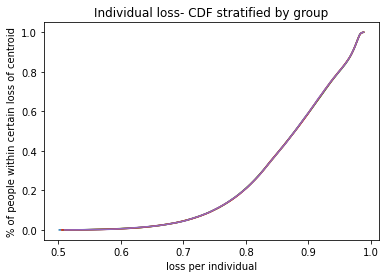

c  {0: (4.561853747556696, 3.805107747252227), 1: (-9.611622556996055, -9.393773655778558), 2: (-11.224237611706059, 6.826984133854099), 3: (9.823172730700975, -3.9886323083318764), 4: (-2.304552772240392, 8.853679337164882), 5: (-2.4891242358438834, 1.7047953610187219), 6: (2.701080308301208, 9.715040646368744), 7: (4.779135508670168, -1.6179886332336124), 8: (-7.777845079174895, -6.683388184162788), 9: (7.1798149961945965, 8.147989839196871)}
weights:  [0.19999847 0.20001196 0.2000063  0.20000559 0.19997768]
Time elapsed Batch Step:  0.34192585945129395
Time elapsed Assignment Step:  2.3291516304016113
0.0004345479911378458
total:  0.6066604870247029


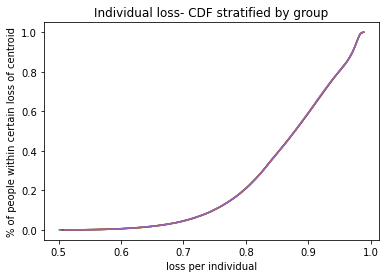

c  {0: (4.561238034606069, 3.8047291311457765), 1: (-9.610141372357461, -9.392340705852074), 2: (-11.222142145648867, 6.826701348730311), 3: (9.822514059510112, -3.986653772634392), 4: (-2.303092188814387, 8.852351197533693), 5: (-2.4879878377484377, 1.7060820098122524), 6: (2.69968411456907, 9.713620341425363), 7: (4.779287189331959, -1.6167980144123442), 8: (-7.778860159056181, -6.685438194980758), 9: (7.177918251493388, 8.147145554276815)}
weights:  [0.19999848 0.20001197 0.20000636 0.20000562 0.19997757]
Time elapsed Batch Step:  0.34719061851501465
Time elapsed Assignment Step:  2.3648126125335693
0.00043147592236725263
total:  0.6065320301699536


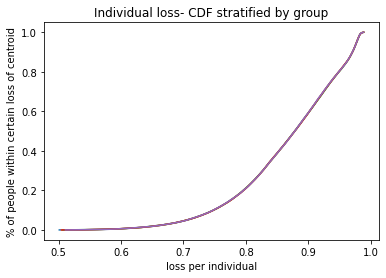

c  {0: (4.560622161874311, 3.804350512317064), 1: (-9.608660821638344, -9.390908400566033), 2: (-11.220046160794588, 6.826418587257373), 3: (9.82185506578236, -3.984674346712349), 4: (-2.3016315449358276, 8.851023091103398), 5: (-2.4868511953154955, 1.707369026587409), 6: (2.6982873194821644, 9.712199524811625), 7: (4.779439006388729, -1.615607125819292), 8: (-7.779874925317945, -6.687487670029656), 9: (7.1760208575915625, 8.146300997732906)}
weights:  [0.19999848 0.20001199 0.20000642 0.20000565 0.19997746]
Time elapsed Batch Step:  0.3428812026977539
Time elapsed Assignment Step:  2.3082644939422607
0.00042075677334951767
total:  0.6064011515178833


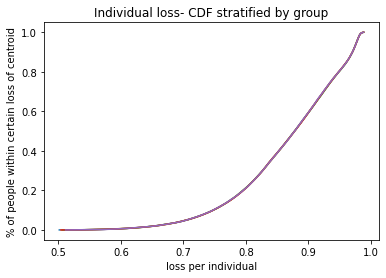

c  {0: (4.560006129312174, 3.8039718908249847), 1: (-9.607180909762915, -9.38947674536813), 2: (-11.217949662186772, 6.826135850315645), 3: (9.821195750384204, -3.9826940333998566), 4: (-2.3001708442009274, 8.849695021425356), 5: (-2.48571431024961, 1.7086564097398007), 6: (2.6968899248582767, 9.710778198503945), 7: (4.77959095996205, -1.6144159680152856), 8: (-7.7808893729109565, -6.6895365988856685), 9: (7.17412281801276, 8.145456171185435)}
weights:  [0.19999849 0.200012   0.20000647 0.20000569 0.19997735]
Time elapsed Batch Step:  0.36012840270996094
Time elapsed Assignment Step:  2.301006317138672
0.0004121505300598294
total:  0.6062707793214139


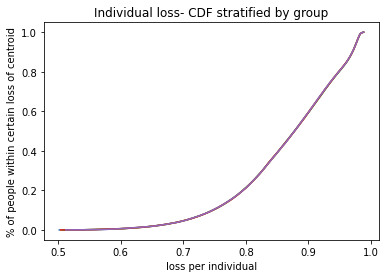

c  {0: (4.559389936870426, 3.8035932667284666), 1: (-9.605701641639985, -9.388045745683483), 2: (-11.215852654897251, 6.825853138788008), 3: (9.820536114188975, -3.9807128355510795), 4: (-2.2987100902148554, 8.848366992055439), 5: (-2.4845771842627316, 1.7099441576574843), 6: (2.695491932527037, 9.709356364489842), 7: (4.779743050173415, -1.6132245415630375), 8: (-7.781903496778073, -6.69158497109315), 9: (7.172224136300164, 8.144611076262848)}
weights:  [0.19999849 0.20001202 0.20000653 0.20000572 0.19997724]
Time elapsed Batch Step:  0.349285364151001
Time elapsed Assignment Step:  2.3700335025787354
0.00042332935207278766
total:  0.6061462161535143


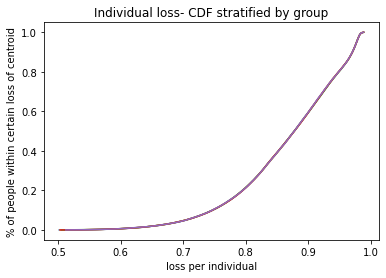

c  {0: (4.558773584499852, 3.8032146400864693), 1: (-9.60422302216308, -9.386615406913622), 2: (-11.213755144026216, 6.8255704535598305), 3: (9.819876158076891, -3.9787307560403193), 4: (-2.297249286591737, 8.847039006553898), 5: (-2.4834398190742197, 1.711232268720948), 6: (2.6940933443299615, 9.707934024767976), 7: (4.779895277144231, -1.612032847027144), 8: (-7.78291729185448, -6.6936327761648124), 9: (7.170324816016541, 8.143765714601756)}
weights:  [0.1999985  0.20001204 0.20000659 0.20000575 0.19997713]
Time elapsed Batch Step:  0.35851287841796875
Time elapsed Assignment Step:  2.262448787689209
0.0004206654687723965
total:  0.6060173739372571


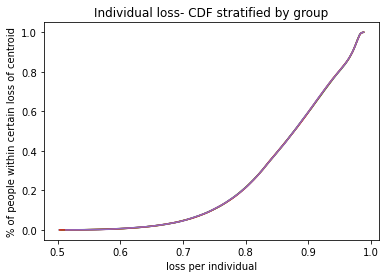

c  {0: (4.558157072151253, 3.8028360109579844), 1: (-9.602745056210601, -9.385185734435472), 2: (-11.21165713470228, 6.825287795518932), 3: (9.819215882935083, -3.976747797762096), 4: (-2.295788436954658, 8.845711068485231), 5: (-2.4823022164108597, 1.712520741303093), 6: (2.6926941621204934, 9.706511181348175), 7: (4.780047640995823, -1.6108408849740894), 8: (-7.783930753067935, -6.695680003581932), 9: (7.168424860744286, 8.142920087846946)}
weights:  [0.1999985  0.20001205 0.20000664 0.20000579 0.19997701]
Time elapsed Batch Step:  0.35167789459228516
Time elapsed Assignment Step:  2.2599148750305176
0.0004074573436070317
total:  0.605885306039728


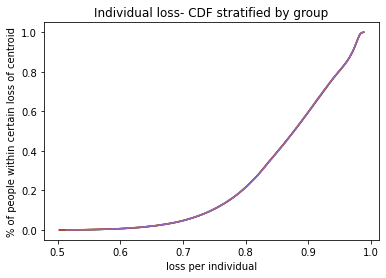

c  {0: (4.55754127823965, 3.80245386239824), 1: (-9.60126774864602, -9.383756733600338), 2: (-11.209558632082553, 6.825005165555548), 3: (9.81855528965763, -3.9747639636312297), 4: (-2.2943275449356717, 8.844383181418054), 5: (-2.4811682761518434, 1.7138035960560467), 6: (2.691294387764044, 9.70508783625147), 7: (4.780200141849431, -1.60964865597225), 8: (-7.784943875339019, -6.697726642794556), 9: (7.16652427408546, 8.142074197651384)}
weights:  [0.19999851 0.20001207 0.2000067  0.20000582 0.1999769 ]
Time elapsed Batch Step:  0.35842013359069824
Time elapsed Assignment Step:  2.27982759475708
0.0004001688701662509
total:  0.6057548892172399


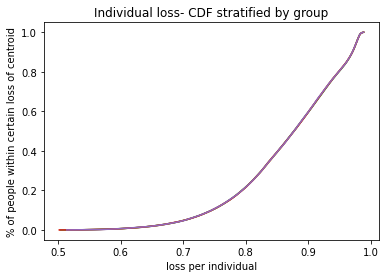

c  {0: (4.556925325581384, 3.8020717105771387), 1: (-9.599791104318108, -9.382328409732889), 2: (-11.207459641352706, 6.824722564562292), 3: (9.817894379145592, -3.972779256582924), 4: (-2.2928666141758014, 8.843055348924958), 5: (-2.480034100265836, 1.715086808859353), 6: (2.689894023138037, 9.703663991510128), 7: (4.780352779826206, -1.6084561605918963), 8: (-7.785956653581385, -6.699772683221709), 9: (7.1646230596618325, 8.141228045676227)}
weights:  [0.19999851 0.20001209 0.20000676 0.20000586 0.19997679]
Time elapsed Batch Step:  0.36507153511047363
Time elapsed Assignment Step:  2.2875356674194336
0.0004064060457431573
total:  0.6056284048209756


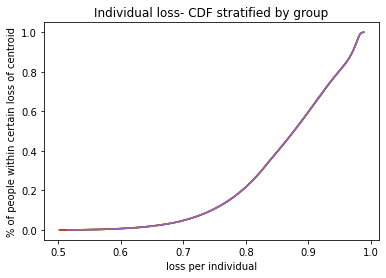

c  {0: (4.556309214128817, 3.8016895555538563), 1: (-9.598315128061195, -9.380900768130154), 2: (-11.205360167727038, 6.82443999343412), 3: (9.817233152307052, -3.9707936795728465), 4: (-2.29140564832505, 8.841727574582382), 5: (-2.478899690471226, 1.716370378093514), 6: (2.688493070131947, 9.702239649167682), 7: (4.780505555047215, -1.6072633994051961), 8: (-7.786969082702021, -6.701818114251619), 9: (7.162721221114922, 8.14038163359083)}
weights:  [0.19999852 0.20001211 0.20000681 0.20000589 0.19997667]
Time elapsed Batch Step:  0.3481876850128174
Time elapsed Assignment Step:  2.3468003273010254
0.00041507145838914905
total:  0.6055025238918766


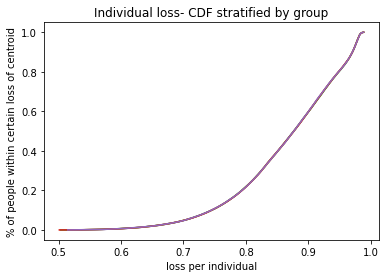

c  {0: (4.555692943834327, 3.8013073973875997), 1: (-9.596839824695474, -9.379473814060516), 2: (-11.20326021644854, 6.824157453068284), 3: (9.816571610057137, -3.9688072355772124), 4: (-2.2899446510424077, 8.84039986197048), 5: (-2.4777650484937577, 1.7176543021315103), 6: (2.6870915306473435, 9.700814811278962), 7: (4.780658467633435, -1.6060703729862187), 8: (-7.7879811576015125, -6.703862925241941), 9: (7.160818762106036, 8.13953496307275)}
weights:  [0.19999852 0.20001213 0.20000687 0.20000593 0.19997656]
Time elapsed Batch Step:  0.34875965118408203
Time elapsed Assignment Step:  2.388517141342163
0.00043054954169141624
total:  0.6053785614747003


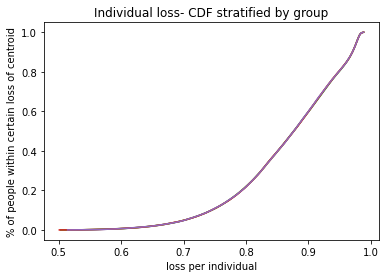

c  {0: (4.555076514650311, 3.8009252361376076), 1: (-9.595365199027329, -9.37804755276272), 2: (-11.201159792788953, 6.823874944364297), 3: (9.815909753318062, -3.966819927592866), 4: (-2.288483625995863, 8.83907221467299), 5: (-2.476630176066542, 1.7189385793387828), 6: (2.6856894065979318, 9.699389479910133), 7: (4.780811517705754, -1.6048770819109373), 8: (-7.7889928731743145, -6.7059071055199855), 9: (7.158915686316308, 8.138688035807762)}
weights:  [0.19999853 0.20001215 0.20000692 0.20000596 0.19997644]
Time elapsed Batch Step:  0.3816711902618408
Time elapsed Assignment Step:  2.3718886375427246
0.0004361823096493689
total:  0.605251521471255


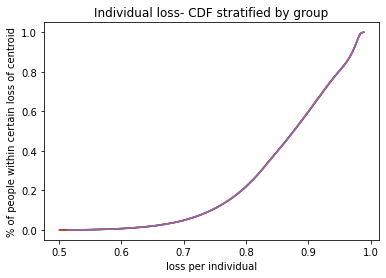

c  {0: (4.554459926529187, 3.80054307186315), 1: (-9.5938912558497, -9.376621989444882), 2: (-11.19905890204884, 6.823592468223887), 3: (9.815247583019158, -3.964831758637364), 4: (-2.28702257686241, 8.837744636277096), 5: (-2.4754950749300706, 1.7202232080732163), 6: (2.684286699909595, 9.69796365713872), 7: (4.780964705384969, -1.6036835267572325), 8: (-7.790004224309026, -6.70795064438296), 9: (7.157011997446738, 8.137840853489857)}
weights:  [0.19999853 0.20001217 0.20000698 0.200006   0.19997632]
Time elapsed Batch Step:  0.3592958450317383
Time elapsed Assignment Step:  2.3646352291107178
0.00043923568856629736
total:  0.6051235847383779


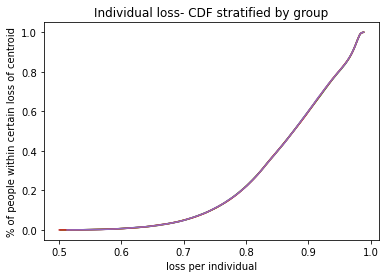

c  {0: (4.553843179423389, 3.800160904623528), 1: (-9.592417999942473, -9.375197129283514), 2: (-11.196957549557634, 6.823310025550954), 3: (9.81458510009691, -3.962842731749057), 4: (-2.285561507328063, 8.836417130373302), 5: (-2.4743597468322296, 1.7215081866851218), 6: (2.6828834125204355, 9.696537345053647), 7: (4.781118030791786, -1.6024897081048957), 8: (-7.791015205888674, -6.70999353109821), 9: (7.155107699218233, 8.136993417821254)}
weights:  [0.19999854 0.20001219 0.20000704 0.20000604 0.1999762 ]
Time elapsed Batch Step:  0.34656524658203125
Time elapsed Assignment Step:  2.393282175064087
0.0004292578517010037
total:  0.6049916163053277


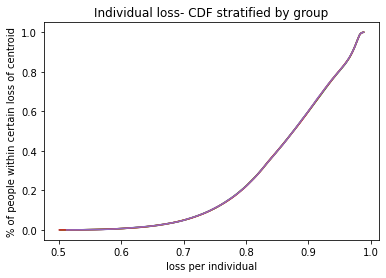

c  {0: (4.55322627328537, 3.799778734478075), 1: (-9.590945436072905, -9.373772977422558), 2: (-11.194855740673702, 6.8230276172515225), 3: (9.813922305494991, -3.9608528499871745), 4: (-2.2841004210878673, 8.8350897005553), 5: (-2.4732241935283112, 1.7227935135172194), 6: (2.681479546380818, 9.695110545755263), 7: (4.78127149404682, -1.6012956265356317), 8: (-7.792025812791, -6.712035754903472), 9: (7.15320279537164, 8.136145730512405)}
weights:  [0.19999854 0.20001221 0.20000709 0.20000607 0.19997608]
Time elapsed Batch Step:  0.3568081855773926
Time elapsed Assignment Step:  2.3652515411376953
0.000437824424018185
total:  0.6048650892154103


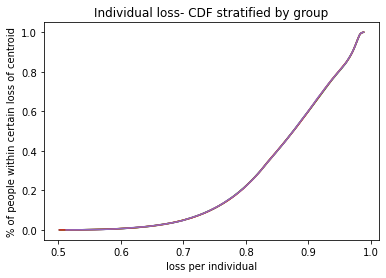

c  {0: (4.552609208067604, 3.799396561486155), 1: (-9.589473568996073, -9.372349538972427), 2: (-11.192753480784397, 6.822745244233698), 3: (9.813259200164296, -3.958862116431905), 4: (-2.282639321845913, 8.83376235041984), 5: (-2.472088416781027, 1.7240791869046213), 6: (2.680075103453409, 9.693683261355377), 7: (4.781425095270589, -1.6001012826330627), 8: (-7.793036039888754, -6.714077305007135), 9: (7.151297289667788, 8.135297793282005)}
weights:  [0.19999855 0.20001223 0.20000715 0.20000611 0.19997596]
Time elapsed Batch Step:  0.3511011600494385
Time elapsed Assignment Step:  2.338867425918579
0.0004308530532883825
total:  0.6047337789612314


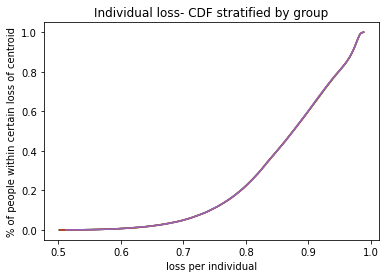

c  {0: (4.551991983722585, 3.799014385707164), 1: (-9.588002403455341, -9.37092681900907), 2: (-11.19065077530611, 6.822462907407618), 3: (9.812595785062976, -3.956870534184481), 4: (-2.2811782133153504, 8.832435083566597), 5: (-2.4709524183605205, 1.7253652051748143), 6: (2.6786700857132213, 9.692255493977289), 7: (4.781578834583519, -1.598906676982731), 8: (-7.79404588205, -6.716118170588497), 9: (7.149391185887523, 8.134449607856995)}
weights:  [0.19999855 0.20001225 0.20000721 0.20000615 0.19997584]
Time elapsed Batch Step:  0.3528478145599365
Time elapsed Assignment Step:  2.3361337184906006
0.0004292545462404318
total:  0.6046039597807634


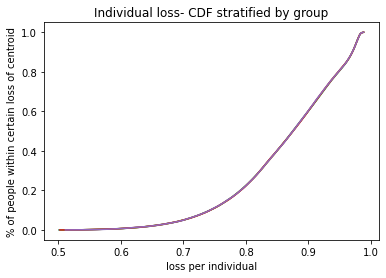

c  {0: (4.551374600202824, 3.7986322072005287), 1: (-9.58653194418286, -9.369504822573033), 2: (-11.18854762968433, 6.822180607685398), 3: (9.811932061156474, -3.954878106367262), 4: (-2.2797170992184026, 8.831107903598046), 5: (-2.4698162000443804, 1.7266515666476436), 6: (2.677264495147654, 9.690827245755823), 7: (4.78173271210594, -1.5977118101721022), 8: (-7.795055334138415, -6.718158340798047), 9: (7.147484487831742, 8.13360117597257)}
weights:  [0.19999856 0.20001227 0.20000727 0.20000618 0.19997572]
Time elapsed Batch Step:  0.3608243465423584
Time elapsed Assignment Step:  2.2892441749572754
0.000426789536046579
total:  0.6044738225974342


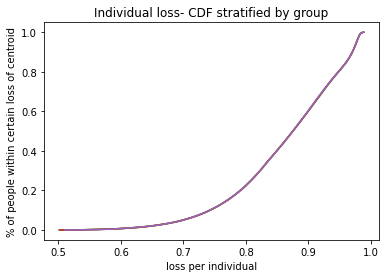

c  {0: (4.550758472265604, 3.798246988783356), 1: (-9.585062195900083, -9.368083554668551), 2: (-11.18644404939368, 6.8218983459810865), 3: (9.811268029417558, -3.9528848361238165), 4: (-2.2782559832863845, 8.829780814119328), 5: (-2.468682995467624, 1.727932200733559), 6: (2.675858333756535, 9.689398518837363), 7: (4.781886727958084, -1.5965166827905686), 8: (-7.796064391013612, -6.720197804757743), 9: (7.145577199321433, 8.132752499372186)}
weights:  [0.19999856 0.20001229 0.20000733 0.20000622 0.19997559]
Time elapsed Batch Step:  0.3445765972137451
Time elapsed Assignment Step:  2.329403877258301
0.00041697971498211306
total:  0.6043413407555771


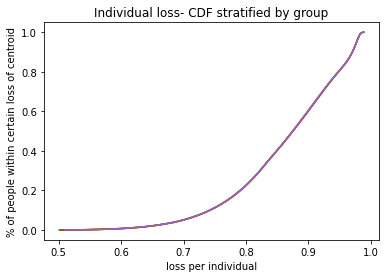

c  {0: (4.550132766066054, 3.797869674823768), 1: (-9.583593163318284, -9.366663020262644), 2: (-11.184340039937975, 6.821616123210606), 3: (9.81060369082636, -3.950890726619007), 4: (-2.2767948692597164, 8.828453818738135), 5: (-2.467549572534125, 1.7292131744993373), 6: (2.674451603552163, 9.687969315379874), 7: (4.782042812006648, -1.5953199077197688), 8: (-7.797073047531455, -6.722236551561295), 9: (7.143669324197709, 8.131903579807567)}
weights:  [0.19999857 0.20001231 0.20000739 0.20000626 0.19997547]
Time elapsed Batch Step:  0.35903191566467285
Time elapsed Assignment Step:  2.355526924133301
0.00042889156893910485
total:  0.6042152552696928


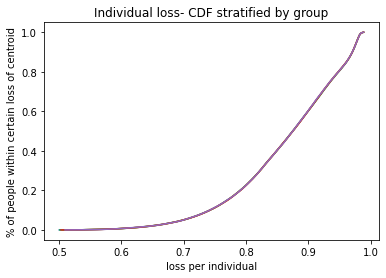

c  {0: (4.54950689543235, 3.7974923575939106), 1: (-9.582124851139115, -9.365243224284225), 2: (-11.182235606850263, 6.821333940291703), 3: (9.809939046370406, -3.948895781039072), 4: (-2.275333760887944, 8.82712692106457), 5: (-2.466415933014283, 1.7304944862716136), 6: (2.673044306559348, 9.686539637552945), 7: (4.782199036141078, -1.5941228676156902), 8: (-7.798081298544392, -6.724274570274469), 9: (7.14176086632184, 8.131054419038705)}
weights:  [0.19999858 0.20001233 0.20000745 0.20000629 0.19997535]
Time elapsed Batch Step:  0.3822486400604248
Time elapsed Assignment Step:  2.428997755050659
0.0004479608292993209
total:  0.6040911983389281


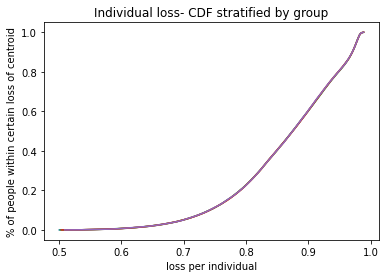

c  {0: (4.548880860314847, 3.7971150371510407), 1: (-9.580657264055152, -9.36382417162323), 2: (-11.180130755692865, 6.821051798143892), 3: (9.809274097044655, -3.9469000025917103), 4: (-2.273872661929755, 8.825800124711032), 5: (-2.465282078685877, 1.7317761343694413), 6: (2.671636444815456, 9.685109487537815), 7: (4.782355400483125, -1.5929255630647146), 8: (-7.799089138901784, -6.726311849935385), 9: (7.13985182957529, 8.130205018833875)}
weights:  [0.19999858 0.20001236 0.20000751 0.20000633 0.19997522]
Time elapsed Batch Step:  0.3646416664123535
Time elapsed Assignment Step:  2.376441478729248
0.000455317715653325
total:  0.6039635086648605


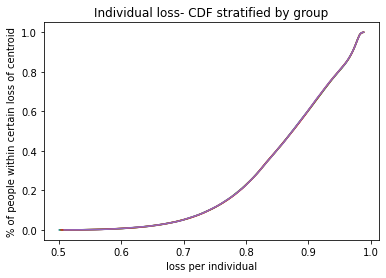

c  {0: (4.548254660663927, 3.796737713552445), 1: (-9.579190406750449, -9.36240586712976), 2: (-11.178025492057417, 6.820769697688395), 3: (9.808608843851532, -3.944903394506165), 4: (-2.2724115761529964, 8.824473433292086), 5: (-2.464148011334075, 1.7330581171042752), 6: (2.6702280203704474, 9.683678867527407), 7: (4.782511905154442, -1.5917279946551648), 8: (-7.800096563450256, -6.728348379554835), 9: (7.137942217859752, 8.129355380969633)}
weights:  [0.19999859 0.20001238 0.20000757 0.20000637 0.1999751 ]
Time elapsed Batch Step:  0.36693501472473145
Time elapsed Assignment Step:  2.4058213233947754
0.00045972746701516964
total:  0.6038347830943331


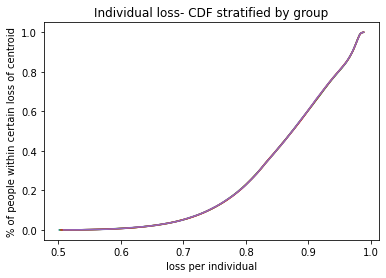

c  {0: (4.547628296429992, 3.796360386855439), 1: (-9.577724283901107, -9.360988315613234), 2: (-11.175919821564907, 6.8204876398480865), 3: (9.807943287800969, -3.9429059600333063), 4: (-2.270952152586603, 8.823134703848192), 5: (-2.463013732751446, 1.7343404327799552), 6: (2.6688183455243277, 9.682254560022008), 7: (4.782668550276582, -1.5905301629773085), 8: (-7.801103567034045, -6.7303841481166025), 9: (7.136032035097177, 8.128505507230825)}
weights:  [0.1999986  0.2000124  0.20000763 0.2000064  0.19997497]
Time elapsed Batch Step:  0.3530426025390625
Time elapsed Assignment Step:  2.338343620300293
0.0004674817625954786
total:  0.6037069425344023


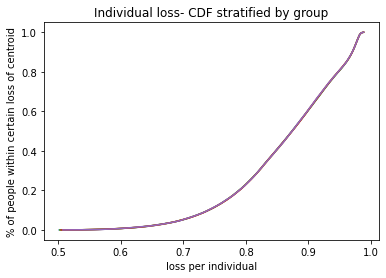

c  {0: (4.547001767563471, 3.795983057117369), 1: (-9.576258900175828, -9.35957152184155), 2: (-11.173813749865712, 6.820205625547429), 3: (9.80727742991043, -3.940907702445716), 4: (-2.2694927551597077, 8.821796091358502), 5: (-2.4618792447379736, 1.7356230796926895), 6: (2.6674081078107124, 9.680829786068056), 7: (4.782825335970998, -1.5893320686233612), 8: (-7.802110144495357, -6.732419144577792), 9: (7.134121285229808, 8.127655399410594)}
weights:  [0.19999861 0.20001242 0.20000769 0.20000644 0.19997485]
Time elapsed Batch Step:  0.3435053825378418
Time elapsed Assignment Step:  2.3557636737823486
0.0004772296745471083
total:  0.6035795827552053


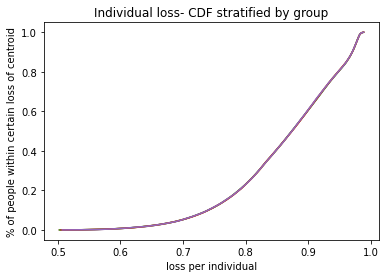

c  {0: (4.546375074014817, 3.7956057243956103), 1: (-9.574794260236475, -9.358155490540275), 2: (-11.171707282639623, 6.819923655712413), 3: (9.806611271204961, -3.9389086250377714), 4: (-2.2680333877078995, 8.820457599510965), 5: (-2.460744549101064, 1.736906056131038), 6: (2.6659973092895353, 9.679404547859074), 7: (4.78298226235904, -1.5881337121874892), 8: (-7.803116290674736, -6.734453357869171), 9: (7.132209972220214, 8.126805059310382)}
weights:  [0.19999861 0.20001244 0.20000775 0.20000647 0.19997473]
Time elapsed Batch Step:  0.3537163734436035
Time elapsed Assignment Step:  2.3335554599761963
0.00048468219848452065
total:  0.6034514178056267


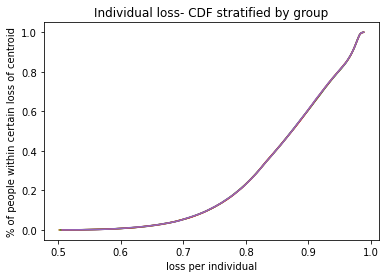

c  {0: (4.545748215734506, 3.795228388747567), 1: (-9.573330368738612, -9.356740226391826), 2: (-11.169600425595881, 6.819641731270496), 3: (9.805944812717213, -3.936908731125729), 4: (-2.2665740540760164, 8.819119231995165), 5: (-2.4596096476555602, 1.7381893603758956), 6: (2.6645859520333843, 9.67797884760025), 7: (4.783139329561956, -1.5869350942658134), 8: (-7.804122000411439, -6.736486776895522), 9: (7.13029810005132, 8.125954488739934)}
weights:  [0.19999862 0.20001246 0.20000781 0.20000651 0.1999746 ]
Time elapsed Batch Step:  0.34996867179870605
Time elapsed Assignment Step:  2.322314739227295
0.00048572098112453777
total:  0.6033212125304535


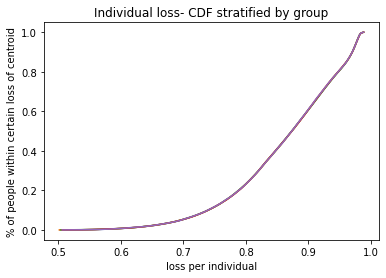

c  {0: (4.545121192673041, 3.7948510502306734), 1: (-9.571867230332032, -9.35532573403468), 2: (-11.1674931844732, 6.819359853150532), 3: (9.805278055487486, -3.934908024047809), 4: (-2.2651147581181625, 8.817780992502202), 5: (-2.45847454222375, 1.7394729907004751), 6: (2.6631740381275435, 9.676552687508485), 7: (4.783296537700889, -1.585736215456412), 8: (-7.8051272685438216, -6.738519390535998), 9: (7.128385672726436, 8.125103689517312)}
weights:  [0.19999863 0.20001248 0.20000787 0.20000655 0.19997448]
Time elapsed Batch Step:  0.34969115257263184
Time elapsed Assignment Step:  2.322244644165039
0.0004851590218318824
total:  0.6031904114411116


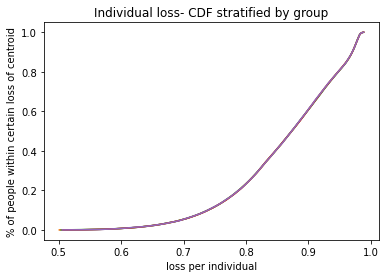

c  {0: (4.544494004780947, 3.7944737089023937), 1: (-9.570404849661276, -9.353912018062582), 2: (-11.16538556503979, 6.819078022282706), 3: (9.804611000563762, -3.9329065071642795), 4: (-2.263655503697729, 8.816442884724568), 5: (-2.4573392346353797, 1.7407569453702916), 6: (2.6617615696700345, 9.675126069812404), 7: (4.783453886896879, -1.5845370763593243), 8: (-7.806132089909729, -6.7405511876444955), 9: (7.12647269426929, 8.124252663468887)}
weights:  [0.19999864 0.20001251 0.20000793 0.20000658 0.19997435]
Time elapsed Batch Step:  0.34804296493530273
Time elapsed Assignment Step:  2.3769357204437256
0.0004833871762965902
total:  0.6030591328087138


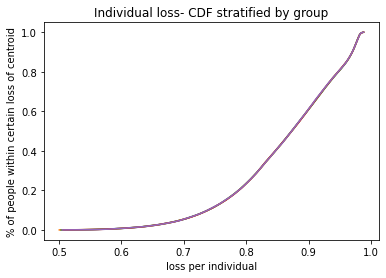

c  {0: (4.543866652008775, 3.7940963648202204), 1: (-9.568943231366118, -9.352499083023764), 2: (-11.163277573093378, 6.818796239598468), 3: (9.80394364900174, -3.9309041838575403), 4: (-2.2621962946874103, 8.81510491235603), 5: (-2.456203726727663, 1.7420412226431448), 6: (2.660348548771658, 9.673698996752405), 7: (4.783611377270858, -1.5833376775765535), 8: (-7.807136459346901, -6.742582157050035), 9: (7.124559168724056, 8.123401412429354)}
weights:  [0.19999865 0.20001253 0.20000799 0.20000661 0.19997422]
Time elapsed Batch Step:  0.360454797744751
Time elapsed Assignment Step:  2.3126957416534424
0.0004910353752004548
total:  0.6029305651741459


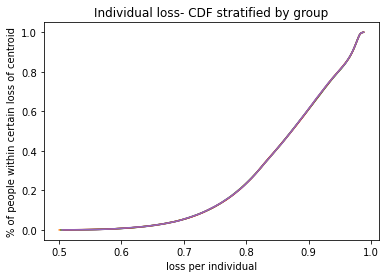

c  {0: (4.543239134307103, 3.7937190180416756), 1: (-9.567482380082023, -9.351086933420177), 2: (-11.161169214461223, 6.8185145060304615), 3: (9.803276001864878, -3.928901057532208), 4: (-2.2607371349692267, 8.813767079091516), 5: (-2.455068020345291, 1.7433258207691031), 6: (2.6589349775560347, 9.67227147058068), 7: (4.78376900894365, -1.58213801971207), 8: (-7.808140371693378, -6.7446122875571515), 9: (7.122645100155384, 8.122549938241733)}
weights:  [0.19999865 0.20001255 0.20000805 0.20000665 0.1999741 ]
Time elapsed Batch Step:  0.3512723445892334
Time elapsed Assignment Step:  2.2985548973083496
0.0004920362283742374
total:  0.6027998897792867


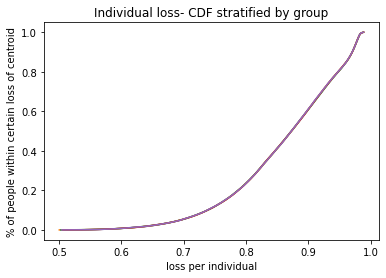

c  {0: (4.542611451626532, 3.7933416686243113), 1: (-9.566022300440576, -9.349675573706724), 2: (-11.15906049500013, 6.81823282251245), 3: (9.802608060224426, -3.9268971316152), 4: (-2.25927802843454, 8.812429388626994), 5: (-2.453932117340445, 1.7446107379904874), 6: (2.6575208581596494, 9.670843493561254), 7: (4.783926782035973, -1.580938103371815), 8: (-7.809143821787931, -6.746641567946299), 9: (7.120730492648426, 8.121698242757372)}
weights:  [0.19999866 0.20001258 0.20000811 0.20000668 0.19997397]
Time elapsed Batch Step:  0.3669149875640869
Time elapsed Assignment Step:  2.3614821434020996
0.0004958079303643004
total:  0.602669932872246


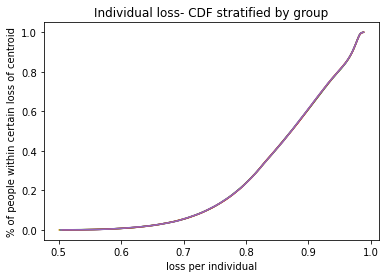

c  {0: (4.5419836039176875, 3.7929643166257083), 1: (-9.564562997069874, -9.3482650082905), 2: (-11.15695142059646, 6.817951189979246), 3: (9.801939825159458, -3.924892409555818), 4: (-2.257818978984075, 8.811091844659362), 5: (-2.4527960195728045, 1.7458959725418535), 6: (2.6561061927318903, 9.669415067970009), 7: (4.784084696668436, -1.5797379291637035), 8: (-7.810146804470483, -6.748669986974267), 9: (7.118815350308868, 8.120846327835954)}
weights:  [0.19999867 0.2000126  0.20000817 0.20000672 0.19997384]
Time elapsed Batch Step:  0.3926551342010498
Time elapsed Assignment Step:  2.295149803161621
0.0004899346420089712
total:  0.6025369695574877


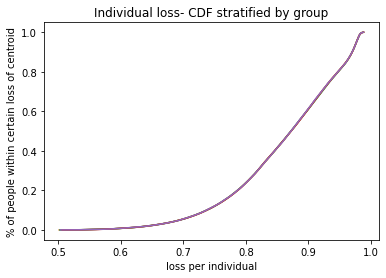

c  {0: (4.541355591131223, 3.7925869621034765), 1: (-9.563104474594873, -9.346855241530037), 2: (-11.154841997166136, 6.817669609366636), 3: (9.80127129775692, -3.9228868948258353), 4: (-2.256359990527937, 8.809754450886338), 5: (-2.4516597289095583, 1.7471815226499765), 6: (2.654690983435091, 9.66798619609472), 7: (4.784242752961535, -1.5785374976976272), 8: (-7.811149314582556, -6.750697533374605), 9: (7.116899677262952, 8.119994195345502)}
weights:  [0.19999868 0.20001263 0.20000823 0.20000675 0.19997371]
Time elapsed Batch Step:  0.3429527282714844
Time elapsed Assignment Step:  2.267927885055542
0.00048647655070876983
total:  0.6024046178834366


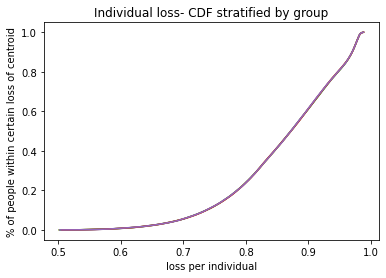

c  {0: (4.540727413217817, 3.7922096051152554), 1: (-9.561646737637684, -9.345446277734546), 2: (-11.152732230654646, 6.8173880816113), 3: (9.800602479111655, -3.9208805909195785), 4: (-2.2549010669856284, 8.808417211006345), 5: (-2.4505232472254135, 1.748467386533834), 6: (2.6532752324445728, 9.666556880235085), 7: (4.784400951035657, -1.5773368095854583), 8: (-7.812151346967721, -6.752724195858062), 9: (7.114983477657504, 8.119141847162378)}
weights:  [0.19999869 0.20001265 0.20000829 0.20000679 0.19997358]
Time elapsed Batch Step:  0.3597581386566162
Time elapsed Assignment Step:  2.320331335067749
0.0004865773121699446
total:  0.6022732210783434


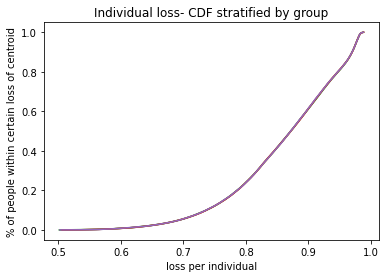

c  {0: (4.540099070128172, 3.7918322457187132), 1: (-9.560189790817827, -9.344038121163175), 2: (-11.15062212703704, 6.81710660765074), 3: (9.799933370326448, -3.918873501354014), 4: (-2.2534422122860707, 8.807080128718411), 5: (-2.449386576402606, 1.7497535624045901), 6: (2.6518589419486855, 9.665127122702758), 7: (4.784559291011076, -1.5761358654410527), 8: (-7.813152896472062, -6.754749963113044), 9: (7.113066755659966, 8.118289285171295)}
weights:  [0.1999987  0.20001268 0.20000835 0.20000682 0.19997345]
Time elapsed Batch Step:  0.384594202041626
Time elapsed Assignment Step:  2.403446674346924
0.0004842797307350599
total:  0.6021409924448495


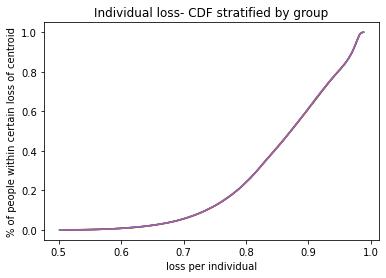

c  {0: (4.539470561813019, 3.791454883971548), 1: (-9.558733638752415, -9.342630776024256), 2: (-11.148511692317928, 6.816825188423196), 3: (9.799263972512062, -3.9168656296688322), 4: (-2.251983430367617, 8.805743207722056), 5: (-2.44824971833091, 1.7510400484655781), 6: (2.6504421141488494, 9.66369692582138), 7: (4.784717773007953, -1.5749346658802525), 8: (-7.814153957944642, -6.756774823806076), 9: (7.111149515458409, 8.117436511265316)}
weights:  [0.19999871 0.2000127  0.20000841 0.20000686 0.19997332]
Time elapsed Batch Step:  0.3816866874694824
Time elapsed Assignment Step:  2.3716354370117188
0.00047460553598055455
total:  0.6020064400718621


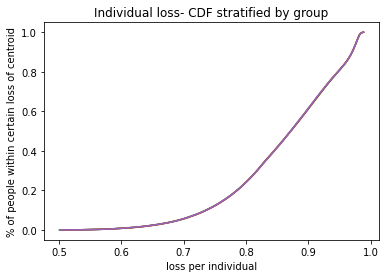

c  {0: (4.5388418882231125, 3.791077519931486), 1: (-9.557278286056283, -9.341224246474555), 2: (-11.146400932531465, 6.816543824867563), 3: (9.798594286787273, -3.914856979426532), 4: (-2.250524725178073, 8.804406451717192), 5: (-2.4471126749076464, 1.7523268429122851), 6: (2.6490247512595966, 9.662266291926608), 7: (4.784876397146334, -1.5737332115208902), 8: (-7.815154526237995, -6.758798766582284), 9: (7.109231761261568, 8.116583527345858)}
weights:  [0.19999871 0.20001273 0.20000848 0.20000689 0.19997319]
Time elapsed Batch Step:  0.35344696044921875
Time elapsed Assignment Step:  2.3526554107666016
0.000473607993793812
total:  0.6018743805010898


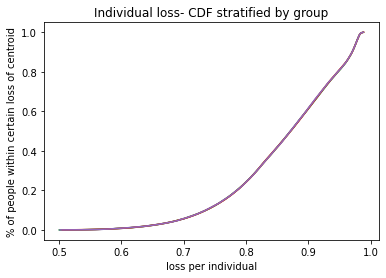

c  {0: (4.538213049309235, 3.7907001536562825), 1: (-9.55582373734205, -9.339818536618528), 2: (-11.144289853741345, 6.816262517923313), 3: (9.797924314278907, -3.912847554212507), 4: (-2.2490661006747104, 8.803069864404023), 5: (-2.445975448037693, 1.753613943932335), 6: (2.647606855508612, 9.660835223366146), 7: (4.78503516354615, -1.572531502982791), 8: (-7.816154596208617, -6.760821780065894), 9: (7.107313497298861, 8.115730335322699)}
weights:  [0.19999872 0.20001276 0.20000854 0.20000693 0.19997305]
Time elapsed Batch Step:  0.35872840881347656
Time elapsed Assignment Step:  2.359468698501587
0.0004780941774618075
total:  0.6017438566135158


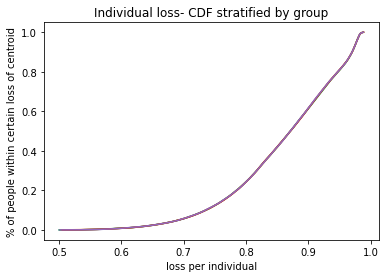

c  {0: (4.537584045022195, 3.790322785203723), 1: (-9.554369997220109, -9.338413650507572), 2: (-11.142178462040777, 6.815981268530408), 3: (9.797254056121881, -3.9108373576351285), 4: (-2.247607560824283, 8.80173344948294), 5: (-2.444838039633493, 1.7549013497054722), 6: (2.6461884291367763, 9.65940372249978), 7: (4.785194072327214, -1.571329540887777), 8: (-7.817154162717473, -6.762843852860734), 9: (7.105394727820414, 8.114876937113978)}
weights:  [0.19999873 0.20001278 0.2000086  0.20000696 0.19997292]
Time elapsed Batch Step:  0.3472156524658203
Time elapsed Assignment Step:  2.357644557952881
0.00047519159962960966
total:  0.6016110064320193


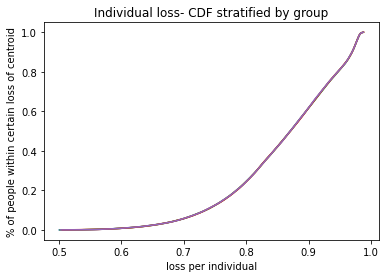

c  {0: (4.536954875312826, 3.7899454146316205), 1: (-9.552917070298529, -9.33700959213928), 2: (-11.140066763552465, 6.815700077629215), 3: (9.796583513459238, -3.9088263933258314), 4: (-2.2461491096030417, 8.800397210654435), 5: (-2.4437004516150647, 1.7561890584035456), 6: (2.6447694743982053, 9.65797179169941), 7: (4.785353123609224, -1.5701273258596693), 8: (-7.818153220630517, -6.764864973550772), 9: (7.103475457097082, 8.114023334646205)}
weights:  [0.19999873 0.20001281 0.20000867 0.200007   0.19997279]
Time elapsed Batch Step:  0.3650779724121094
Time elapsed Assignment Step:  2.3541035652160645
0.000467900697239787
total:  0.6014767312933123


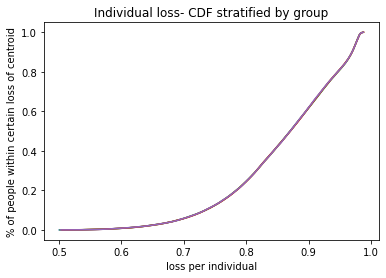

c  {0: (4.536325540131991, 3.7895680419978173), 1: (-9.551464961182896, -9.335606365456693), 2: (-11.137954764428581, 6.815418946160417), 3: (9.795912687442186, -3.9068146649392), 4: (-2.2446907509967478, 8.799061151618991), 5: (-2.442562685910008, 1.7574770681904919), 6: (2.6433499935602924, 9.65653943334907), 7: (4.785512317511758, -1.5689248585242919), 8: (-7.819151764819221, -6.766885130700646), 9: (7.101555689420472, 8.113169529854257)}
weights:  [0.19999874 0.20001284 0.20000873 0.20000703 0.19997266]
Time elapsed Batch Step:  0.34455132484436035
Time elapsed Assignment Step:  2.2889976501464844
0.0004729454824253798
total:  0.6013460487695496


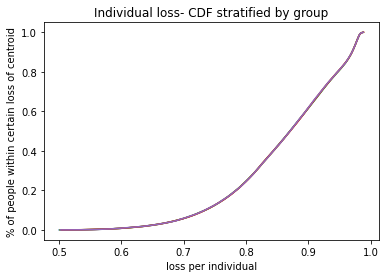

c  {0: (4.5356960394305785, 3.789190667360185), 1: (-9.550013674476048, -9.334203974347563), 2: (-11.135842470850738, 6.815137875064928), 3: (9.795241579230138, -3.904802176153052), 4: (-2.243232489000685, 8.797725276077005), 5: (-2.4414247444535144, 1.7587653772223195), 6: (2.6419299889037497, 9.655106649844978), 7: (4.7856716541542745, -1.567722139509475), 8: (-7.82014979016112, -6.768904312856234), 9: (7.099635429102962, 8.11231552468139)}
weights:  [0.19999875 0.20001287 0.2000088  0.20000706 0.19997252]
Time elapsed Batch Step:  0.35361742973327637
Time elapsed Assignment Step:  2.3031582832336426
0.00046411364566245616
total:  0.6012111458607622


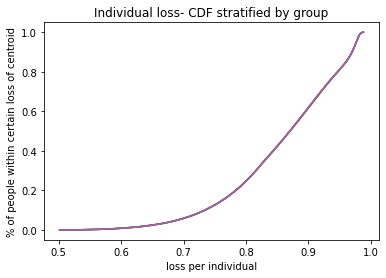

c  {0: (4.535066373159502, 3.788813290776624), 1: (-9.548563214777738, -9.332802422643615), 2: (-11.133729889029945, 6.814856865283801), 3: (9.794570189990743, -3.9027889306685233), 4: (-2.2417743276196727, 8.796389587728687), 5: (-2.440290098335419, 1.760044113820631), 6: (2.6405094627226493, 9.653673443595547), 7: (4.785836759713557, -1.5665124483908763), 8: (-7.821147291540366, -6.770922508545227), 9: (7.097714680477725, 8.111461321079235)}
weights:  [0.19999876 0.2000129  0.20000886 0.20000709 0.19997239]
Time elapsed Batch Step:  0.3417196273803711
Time elapsed Assignment Step:  2.26403546333313
0.00047018347496696755
total:  0.6010806062183375


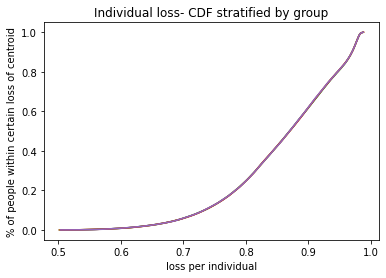

c  {0: (4.534436541269705, 3.788435912305063), 1: (-9.547113586684189, -9.33140171411981), 2: (-11.131617025206575, 6.814575917758135), 3: (9.793898520899932, -3.9007749322101555), 4: (-2.2403162708680737, 8.795054090273979), 5: (-2.439155283285538, 1.7613231425047733), 6: (2.6390884173244644, 9.652239817021432), 7: (4.786002011948907, -1.5653025028978944), 8: (-7.822144263848295, -6.772939706277721), 9: (7.095793447898744, 8.110606921007806)}
weights:  [0.19999876 0.20001292 0.20000893 0.20000713 0.19997226]
Time elapsed Batch Step:  0.3452157974243164
Time elapsed Assignment Step:  2.3845930099487305
0.0004697123049277607
total:  0.6009479982153193


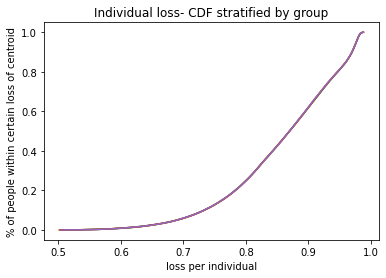

c  {0: (4.533806543712156, 3.7880585320034594), 1: (-9.545664794787557, -9.330001852493627), 2: (-11.129503885650314, 6.814295033428987), 3: (9.793226573141952, -3.8987601845259774), 4: (-2.2388583227698056, 8.793718787412466), 5: (-2.4380203012353707, 1.762602461442665), 6: (2.6376668550301097, 9.650805772555549), 7: (4.786167410981057, -1.5640923036733358), 8: (-7.823140701984012, -6.774955894546838), 9: (7.093871735740836, 8.109752326435503)}
weights:  [0.19999877 0.20001295 0.20000899 0.20000716 0.19997213]
Time elapsed Batch Step:  0.3438136577606201
Time elapsed Assignment Step:  2.3050167560577393
0.0004729026901989508
total:  0.6008163836452671


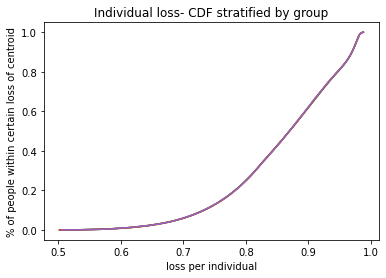

c  {0: (4.533176380437853, 3.7876811499298), 1: (-9.544216843675303, -9.328602841424347), 2: (-11.127390476660109, 6.814014213237275), 3: (9.792554347909407, -3.896744691387593), 4: (-2.237400487358348, 8.792383682843296), 5: (-2.4368851541238743, 1.763882068794426), 6: (2.636244778173984, 9.649371312643114), 7: (4.786332956930609, -1.5628818513620752), 8: (-7.824136600854982, -6.7769710618293555), 9: (7.091949548399667, 8.108897539339118)}
weights:  [0.19999878 0.20001298 0.20000905 0.20000719 0.19997199]
Time elapsed Batch Step:  0.3471965789794922
Time elapsed Assignment Step:  2.343018054962158
0.0004747448947437505
total:  0.6006842597627585


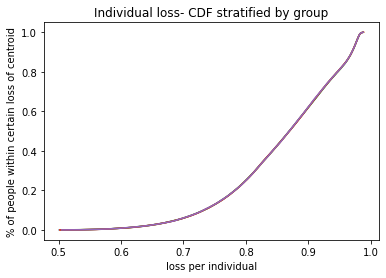

c  {0: (4.532546051397819, 3.7873037661421), 1: (-9.542769737929445, -9.327204684512362), 2: (-11.125276804564116, 6.813733458123685), 3: (9.791881846403292, -3.894728456590266), 4: (-2.2359427686767477, 8.791048780265097), 5: (-2.4357498438974705, 1.7651619627123611), 6: (2.6348221891040096, 9.647936439741672), 7: (4.786498649918032, -1.561671146611058), 8: (-7.825131955377637, -6.778985196586363), 9: (7.090026890291769, 8.108042561703835)}
weights:  [0.19999879 0.20001301 0.20000912 0.20000723 0.19997186]
Time elapsed Batch Step:  0.3523693084716797
Time elapsed Assignment Step:  2.322389602661133
0.00046958528599749805
total:  0.6005499315053232


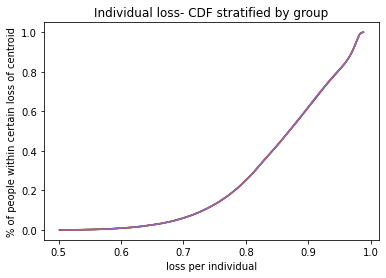

c  {0: (4.531915556543107, 3.786926380698403), 1: (-9.541323482125723, -9.325807385298496), 2: (-11.123162875719634, 6.813452769028574), 3: (9.79120906983304, -3.892711483953004), 4: (-2.2344851707776257, 8.789714083375902), 5: (-2.434614372510053, 1.7664421413409441), 6: (2.6333990901816744, 9.646501156321127), 7: (4.786664490063662, -1.560460190069304), 8: (-7.826126760478, -6.780998287263936), 9: (7.0881037658545605, 8.107187395523235)}
weights:  [0.19999879 0.20001304 0.20000918 0.20000726 0.19997172]
Time elapsed Batch Step:  0.3820226192474365
Time elapsed Assignment Step:  2.357555389404297
0.0004732110807654788
total:  0.6004181348692339


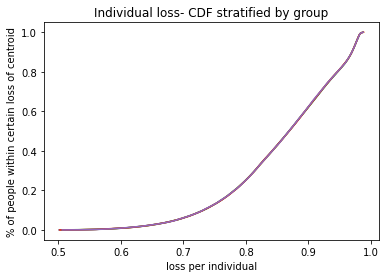

c  {0: (4.531284895824797, 3.7865489936567807), 1: (-9.539878080832638, -9.324410947263358), 2: (-11.121048696513041, 6.8131721468918744), 3: (9.790536019416548, -3.8906937773186465), 4: (-2.233027697723178, 8.78837959587307), 5: (-2.4334787419229937, 1.7677226028168025), 6: (2.6319754837820724, 9.645065464863773), 7: (4.786830477487698, -1.5592489823879108), 8: (-7.827121011092316, -6.783010322293837), 9: (7.086180179546358, 8.1063320427993)}
weights:  [0.1999988  0.20001307 0.20000925 0.2000073  0.19997159]
Time elapsed Batch Step:  0.3669581413269043
Time elapsed Assignment Step:  2.3559889793395996
0.0004774486460612515
total:  0.6002864179997782


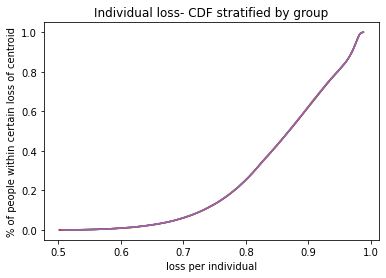

c  {0: (4.5306540691939965, 3.7861716050753347), 1: (-9.538433538610406, -9.323015373826713), 2: (-11.118934273359718, 6.8128915926529965), 3: (9.789862696380231, -3.888675340553946), 4: (-2.2315703535851803, 8.787045321453224), 5: (-2.4323429541051493, 1.7690033452687015), 6: (2.6305513722939446, 9.643629367864323), 7: (4.786996612310208, -1.5580375242200564), 8: (-7.828114702167701, -6.785021290094233), 9: (7.084256135846395, 8.105476505542418)}
weights:  [0.19999881 0.2000131  0.20000932 0.20000733 0.19997145]
Time elapsed Batch Step:  0.3526480197906494
Time elapsed Assignment Step:  2.3553049564361572
0.00048139091289378655
total:  0.6001545101425737


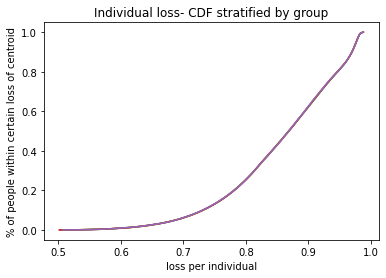

c  {0: (4.530023076601841, 3.785794215012194), 1: (-9.536989860009788, -9.321620668346904), 2: (-11.116819612703972, 6.812611107250729), 3: (9.789189101959051, -3.8866561775496566), 4: (-2.2301131424449845, 8.785711263812166), 5: (-2.4312070110328676, 1.770284366817529), 6: (2.6291267581197193, 9.642192867829941), 7: (4.78716289465112, -1.5568258162210031), 8: (-7.829107828662804, -6.787031179070442), 9: (7.0823316392548366, 8.104620785771385)}
weights:  [0.19999881 0.20001313 0.20000938 0.20000737 0.19997131]
Time elapsed Batch Step:  0.343447208404541
Time elapsed Assignment Step:  2.325470447540283
0.0004899286684467707
total:  0.6000239406657893


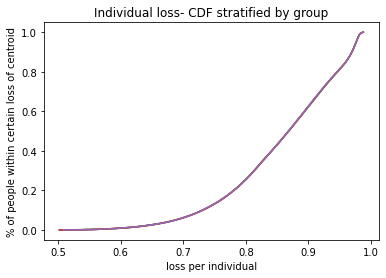

c  {0: (4.52939315566948, 3.785413408614128), 1: (-9.535547049570818, -9.32022683412031), 2: (-11.114704721018953, 6.812330691623142), 3: (9.788515237396558, -3.8846362922206183), 4: (-2.22865606839352, 8.78437742664482), 5: (-2.430074288320983, 1.77155988310914), 6: (2.627701643675553, 9.640755967280274), 7: (4.7873293246302255, -1.5556138590481006), 8: (-7.830100385548479, -6.789039977615701), 9: (7.080406694292789, 8.103764885513407)}
weights:  [0.19999882 0.20001316 0.20000945 0.2000074  0.19997117]
Time elapsed Batch Step:  0.3457367420196533
Time elapsed Assignment Step:  2.3566722869873047
0.0004947431809884106
total:  0.5998921522056488


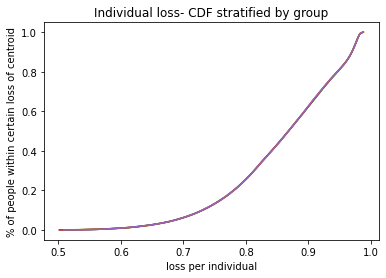

c  {0: (4.528763070366523, 3.785032600000025), 1: (-9.534105111821429, -9.318833874380848), 2: (-11.112589604806558, 6.812050346707486), 3: (9.78784110394493, -3.8826156885058425), 4: (-2.2271991355312886, 8.783043813645168), 5: (-2.4289414116429056, 1.7728356754797512), 6: (2.626276031391371, 9.639318668747483), 7: (4.787495902367179, -1.554401653360789), 8: (-7.83109236780848, -6.7910476741119625), 9: (7.078481305502316, 8.102908806804109)}
weights:  [0.19999883 0.20001319 0.20000951 0.20000744 0.19997104]
Time elapsed Batch Step:  0.35428595542907715
Time elapsed Assignment Step:  2.3397247791290283
0.00048484954132699265
total:  0.5997558490217118


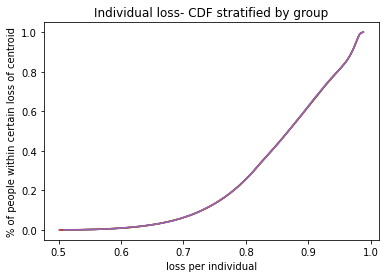

c  {0: (4.528132820645992, 3.784651789228103), 1: (-9.532664051275969, -9.317441792299546), 2: (-11.110474270597344, 6.811770073440092), 3: (9.78716670286501, -3.880594370368596), 4: (-2.2257423479683585, 8.781710428506184), 5: (-2.427808382965409, 1.774111742058849), 6: (2.624849923710909, 9.637880974776271), 7: (4.7876626279814944, -1.5531891998206024), 8: (-7.832083770440154, -6.793054256930713), 9: (7.076555477446455, 8.102052551687537)}
weights:  [0.19999884 0.20001322 0.20000957 0.20000748 0.1999709 ]
Time elapsed Batch Step:  0.3670661449432373
Time elapsed Assignment Step:  2.3215432167053223
0.0004912874652447385
total:  0.5996243444128347


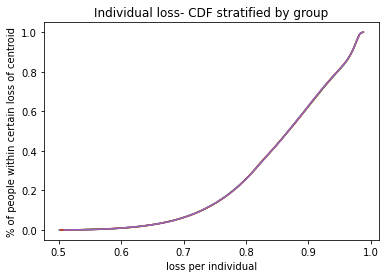

c  {0: (4.52750240646094, 3.784270976356609), 1: (-9.531223872433625, -9.316050590984167), 2: (-11.108358724950415, 6.811489872756274), 3: (9.786492035426352, -3.878572341796488), 4: (-2.224285709824358, 8.780377274919774), 5: (-2.42667520426267, 1.7753880809681069), 6: (2.6234233230917505, 9.636442887923915), 7: (4.787829501592546, -1.5519764990911722), 8: (-7.833074588455166, -6.7950597144338225), 9: (7.07462921470922, 8.10119612221616)}
weights:  [0.19999884 0.20001324 0.20000964 0.20000752 0.19997076]
Time elapsed Batch Step:  0.34774041175842285
Time elapsed Assignment Step:  2.2914793491363525
0.000490206832010065
total:  0.5994904843276815


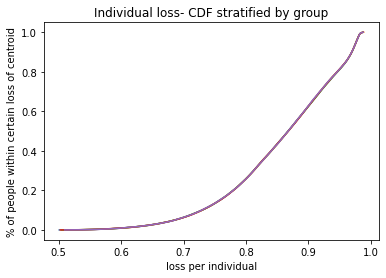

c  {0: (4.526871827764446, 3.7838901614438174), 1: (-9.529784579776743, -9.31466027347892), 2: (-11.10624297445332, 6.811209745590223), 3: (9.785817102907256, -3.8765496068015546), 4: (-2.222829225228466, 8.779044356576728), 5: (-2.425541877516274, 1.77666469032137), 6: (2.621996232005371, 9.635004410760295), 7: (4.787996523319565, -1.5507635518382297), 8: (-7.834064816880221, -6.797064034974422), 9: (7.0727025218956205, 8.100339520450875)}
weights:  [0.19999885 0.20001327 0.2000097  0.20000755 0.19997062]
Time elapsed Batch Step:  0.3526487350463867
Time elapsed Assignment Step:  2.3391685485839844
0.0005037292757293921
total:  0.5993609052593225


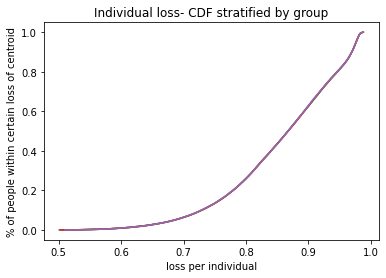

c  {0: (4.526241084509625, 3.7835093445480297), 1: (-9.528346177769071, -9.313270842764235), 2: (-11.104127025721935, 6.810929692874911), 3: (9.785141906594806, -3.8745261694203434), 4: (-2.2213728983193994, 8.777711677166657), 5: (-2.4244084047152197, 1.7779415682246404), 6: (2.6205686529371754, 9.63356554586793), 7: (4.788163693281643, -1.5495503587296098), 8: (-7.8350544507578075, -6.799067206897811), 9: (7.070775403631667, 8.099482748461012)}
weights:  [0.19999886 0.2000133  0.20000976 0.20000759 0.19997048]
Time elapsed Batch Step:  0.3375999927520752
Time elapsed Assignment Step:  2.3211278915405273
0.0004934214185440267
total:  0.5992240781832048


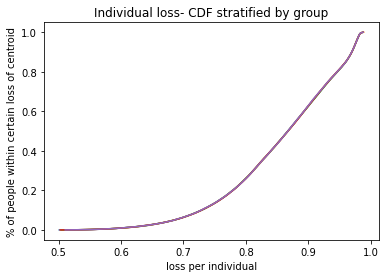

c  {0: (4.525610176649619, 3.783128525727576), 1: (-9.526908670853901, -9.31188230175665), 2: (-11.102010885400341, 6.81064971554199), 3: (9.784466447784913, -3.872502033714), 4: (-2.2199167332454004, 8.776379240377947), 5: (-2.423274787855925, 1.7792187127760606), 6: (2.619140588386539, 9.632126295841996), 7: (4.788331011597726, -1.5483369204352544), 8: (-7.836043485146954, -6.801069218542391), 9: (7.068847864564382, 8.09862580832434)}
weights:  [0.19999887 0.20001333 0.20000982 0.20000763 0.19997034]
Time elapsed Batch Step:  0.35045289993286133
Time elapsed Assignment Step:  2.337381601333618
0.0004917404196685959
total:  0.599089740247141


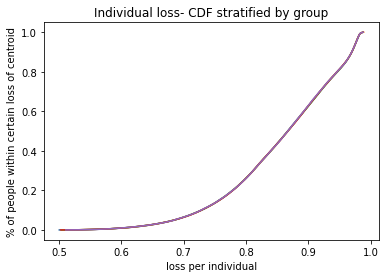

c  {0: (4.524979104137601, 3.7827477050408143), 1: (-9.525472063452144, -9.310494653308782), 2: (-11.099894560160697, 6.810369814521689), 3: (9.783790727782353, -3.870477203768352), 4: (-2.21846073416422, 8.775047049897713), 5: (-2.4221410289422307, 1.7804961220658992), 6: (2.617712040866847, 9.630686663290373), 7: (4.788498478386617, -1.5471232376272153), 8: (-7.837031915123993, -6.803070058240637), 9: (7.066919909361808, 8.097768702127063)}
weights:  [0.19999888 0.20001336 0.20000989 0.20000767 0.1999702 ]
Time elapsed Batch Step:  0.38016414642333984
Time elapsed Assignment Step:  2.3107635974884033
0.000499947324559491
total:  0.5989582709370337


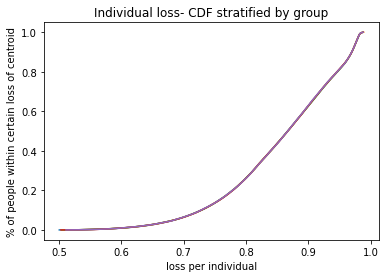

c  {0: (4.524347866926776, 3.7823668825461296), 1: (-9.524036359960341, -9.309107900209398), 2: (-11.097778056703106, 6.810089990742719), 3: (9.783114747900811, -3.8684516836939955), 4: (-2.2170049052431, 8.77371510941175), 5: (-2.421007129985405, 1.7817737941765353), 6: (2.616283012905536, 9.629246650833661), 7: (4.788666093766975, -1.5459093109796573), 8: (-7.838019735783342, -6.805069714320096), 9: (7.064991542713016, 8.096911431963838)}
weights:  [0.19999889 0.20001339 0.20000995 0.20000771 0.19997006]
Time elapsed Batch Step:  0.357668399810791
Time elapsed Assignment Step:  2.3244354724884033
0.0005013377455468371
total:  0.5988246598274869


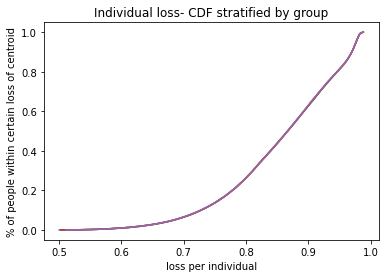

c  {0: (4.523716464970379, 3.781986058301935), 1: (-9.522601564748605, -9.307722045183619), 2: (-11.09566138175547, 6.8098102451321685), 3: (9.782438509462914, -3.8664254776263784), 4: (-2.215549250658753, 8.772383422604493), 5: (-2.4198730930041483, 1.7830517271824422), 6: (2.6148535070441326, 9.627806261105217), 7: (4.78883385785731, -1.5446951411688619), 8: (-7.839006942238293, -6.807068175104422), 9: (7.063062769328113, 8.09605399993777)}
weights:  [0.1999989  0.20001342 0.20001001 0.20000776 0.19996992]
Time elapsed Batch Step:  0.3545403480529785
Time elapsed Assignment Step:  2.3318254947662354
0.0005008979101541744
total:  0.5986904033554787


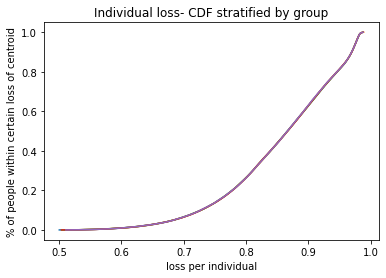

c  {0: (4.523084898221676, 3.781605232366671), 1: (-9.521167682158525, -9.306337090893232), 2: (-11.093544542073346, 6.8095305786154094), 3: (9.781762013800277, -3.8643985897258872), 4: (-2.21409377459734, 8.771051993158977), 5: (-2.4187389200245963, 1.7843299191501738), 6: (2.613423525838293, 9.626365496751186), 7: (4.789001770775988, -1.5434807288732295), 8: (-7.839993529621813, -6.809065428914444), 9: (7.061133593938246, 8.095196408160417)}
weights:  [0.19999891 0.20001345 0.20001007 0.2000078  0.19996978]
Time elapsed Batch Step:  0.34766554832458496
Time elapsed Assignment Step:  2.3417789936065674
0.0004943575582893045
total:  0.5985542212466


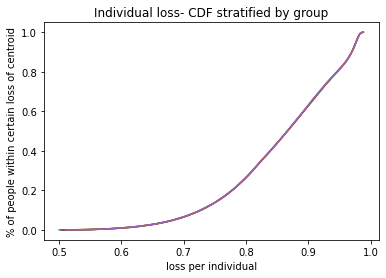

c  {0: (4.522453166633965, 3.7812244047988055), 1: (-9.519734716501024, -9.304953039937127), 2: (-11.09142754443979, 6.809250992115996), 3: (9.781085262253544, -3.8623710241779317), 4: (-2.212638481254445, 8.769720824756803), 5: (-2.4176046130803237, 1.785608368138348), 6: (2.611993071857843, 9.624924360430528), 7: (4.789169832641225, -1.5422660747732837), 8: (-7.840979493087355, -6.811061464069271), 9: (7.059204021295612, 8.094338658751798)}
weights:  [0.19999892 0.20001348 0.20001013 0.20000784 0.19996963]
Time elapsed Batch Step:  0.342684268951416
Time elapsed Assignment Step:  2.3041906356811523
0.00047900789851618164
total:  0.5984153016115509


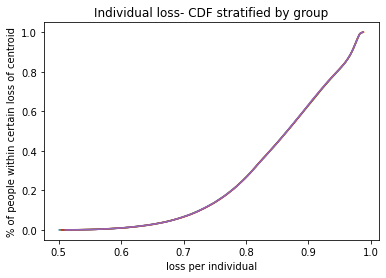

c  {0: (4.521821270160575, 3.780843575656834), 1: (-9.518302672054194, -9.30356989485187), 2: (-11.089310395665196, 6.8089714865555715), 3: (9.780408256172427, -3.860342785193029), 4: (-2.211183374835047, 8.7683899210781), 5: (-2.416470174212348, 1.7868870721976309), 6: (2.6105621476868164, 9.62348285481505), 7: (4.789338043571089, -1.5410511795516737), 8: (-7.841964827809679, -6.813056268887431), 9: (7.057274056173457, 8.093480753840401)}
weights:  [0.19999893 0.20001351 0.20001019 0.20000788 0.19996949]
Time elapsed Batch Step:  0.3372173309326172
Time elapsed Assignment Step:  2.329167127609253
0.00048487018902687584
total:  0.5982826500923933


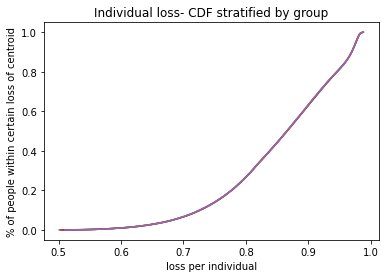

c  {0: (4.521189208754866, 3.7804627449992805), 1: (-9.51687155306113, -9.302187658112416), 2: (-11.087193102587122, 6.80869206285377), 3: (9.77973099691574, -3.8583138770068897), 4: (-2.2097284595534927, 8.7670592858015), 5: (-2.415335605469133, 1.7881660293707233), 6: (2.6091307559234966, 9.622040982589434), 7: (4.789506403683498, -1.5398360438931777), 8: (-7.842949528985683, -6.81504983168805), 9: (7.055343703366084, 8.092622695563179)}
weights:  [0.19999894 0.20001353 0.20001025 0.20000792 0.19996935]
Time elapsed Batch Step:  0.3630821704864502
Time elapsed Assignment Step:  2.3279876708984375
0.00048141199975537674
total:  0.5981471083001355


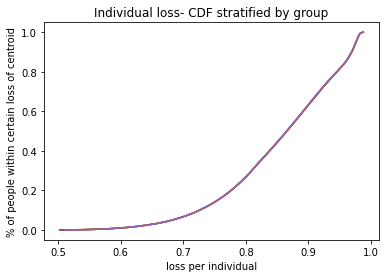

c  {0: (4.520556982370231, 3.7800819128846945), 1: (-9.515441363727742, -9.300806332132952), 2: (-11.085075672070126, 6.808412721928126), 3: (9.779053485851453, -3.856284303880502), 4: (-2.208273739633462, 8.765728922604103), 5: (-2.41420090890659, 1.789445237692344), 6: (2.6076988991804537, 9.620598746451268), 7: (4.78967491309622, -1.5386206684847064), 8: (-7.843933591835235, -6.81704214079207), 9: (7.053412967688856, 8.091764486065564)}
weights:  [0.19999896 0.20001356 0.20001031 0.20000796 0.19996921]
Time elapsed Batch Step:  0.3552894592285156
Time elapsed Assignment Step:  2.2992613315582275
0.00048529382192230575
total:  0.5980136756991283


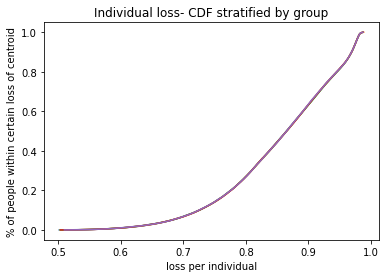

c  {0: (4.519924590960094, 3.7797010793716543), 1: (-9.514012108220605, -9.29942591926789), 2: (-11.082958111005572, 6.80813346469398), 3: (9.77837572435672, -3.8542540701002177), 4: (-2.206819219307935, 8.76439883516146), 5: (-2.413066086588084, 1.7907246951892146), 6: (2.606266580084585, 9.61915614911108), 7: (4.789843571926871, -1.5374050540153053), 8: (-7.8449170116020195, -6.8190331845235015), 9: (7.051481853978196, 8.09090612750147)}
weights:  [0.19999897 0.20001359 0.20001037 0.200008   0.19996906]
Time elapsed Batch Step:  0.3408164978027344
Time elapsed Assignment Step:  2.3245418071746826
0.000468969695125554
total:  0.5978740883924512


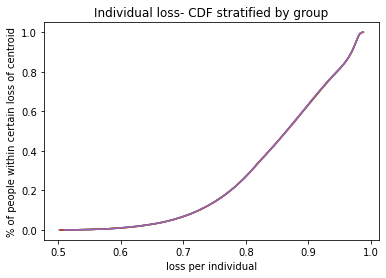

c  {0: (4.51929203447791, 3.779320244518765), 1: (-9.512583790664817, -9.298046421812995), 2: (-11.080840426311452, 6.807854292064391), 3: (9.77769771381793, -3.8522231799778353), 4: (-2.2053649028191535, 8.763069027147548), 5: (-2.4119311405844313, 1.7920043998800448), 6: (2.604833801277152, 9.617713193292358), 7: (4.7900123802929135, -1.5361892011761586), 8: (-7.845899783554384, -6.821022951210721), 9: (7.04955036709159, 8.090047622033294)}
weights:  [0.19999898 0.20001362 0.20001044 0.20000804 0.19996892]
Time elapsed Batch Step:  0.34658217430114746
Time elapsed Assignment Step:  2.316288471221924
0.00046016250989378005
total:  0.5977366643038979


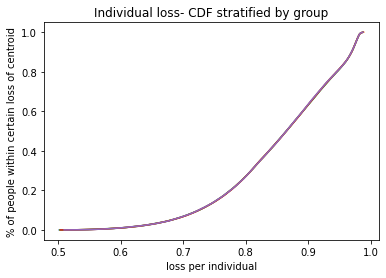

c  {0: (4.51865931287717, 3.778939408384659), 1: (-9.511156415141908, -9.296667842006654), 2: (-11.078722624932183, 6.807575204950046), 3: (9.777019455630741, -3.8501916378506853), 4: (-2.2039107944185843, 8.761739502234747), 5: (-2.4107960729739055, 1.7932843497755167), 6: (2.6034005654138213, 9.616269881731592), 7: (4.790181338311659, -1.5349731106605922), 8: (-7.846881902986192, -6.82301142918781), 9: (7.047618511907591, 8.089188971831932)}
weights:  [0.19999899 0.20001365 0.2000105  0.20000809 0.19996878]
Time elapsed Batch Step:  0.34385228157043457
Time elapsed Assignment Step:  2.291184663772583
0.00046411091983955544
total:  0.5976029754419429


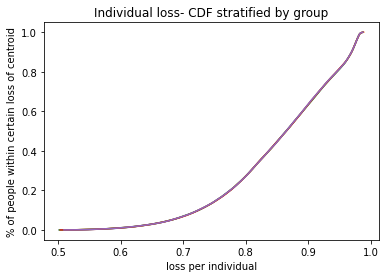

c  {0: (4.518026426111392, 3.778558571027996), 1: (-9.509729985687802, -9.295290182031287), 2: (-11.07660471383841, 6.807296204259178), 3: (9.776340951200122, -3.848159448081716), 4: (-2.202456898366875, 8.76041026409383), 5: (-2.409660885842238, 1.7945645428782693), 6: (2.6019668751647025, 9.614826217178292), 7: (4.790350446100264, -1.5337567831640762), 8: (-7.847863365217675, -6.824998606795931), 9: (7.045686293325813, 8.088330179076776)}
weights:  [0.199999   0.20001368 0.20001056 0.20000813 0.19996863]
Time elapsed Batch Step:  0.35184526443481445
Time elapsed Assignment Step:  2.307263135910034
0.0004596990753722441
total:  0.5974666882705737


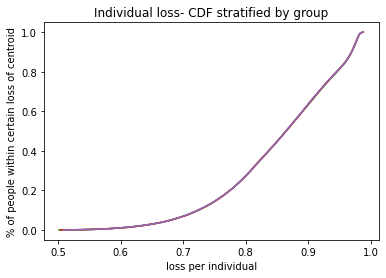

c  {0: (4.517393374134132, 3.7781777325074626), 1: (-9.50830450629084, -9.293913444014887), 2: (-11.074486700026794, 6.8070172908974795), 3: (9.775662201940401, -3.846126615059577), 4: (-2.201003218933811, 8.759081316393948), 5: (-2.4085255812826185, 1.7958449771828837), 6: (2.600532733214386, 9.61338220239503), 7: (4.790519703775731, -1.5325402193842286), 8: (-7.848844165596288, -6.826984472384749), 9: (7.043753716266936, 8.087471245955726)}
weights:  [0.19999901 0.20001371 0.20001062 0.20000817 0.19996848]
Time elapsed Batch Step:  0.3453700542449951
Time elapsed Assignment Step:  2.3328402042388916
0.00046573482526779397
total:  0.5973334456545397


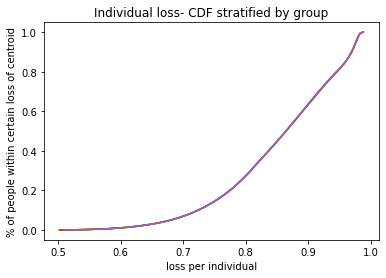

c  {0: (4.516760156898974, 3.7777968928817733), 1: (-9.506879980889888, -9.292537630032678), 2: (-11.0723685905198, 6.806738465768027), 3: (9.774983209275296, -3.8440931431987035), 4: (-2.199549760398269, 8.757752662802616), 5: (-2.4073901613956985, 1.7971256506758677), 6: (2.599098142261982, 9.611937840157458), 7: (4.7906891114549035, -1.5313234200208181), 8: (-7.8498242994975636, -6.828969014313898), 9: (7.0418207856727, 8.086612174665195)}
weights:  [0.19999902 0.20001374 0.20001068 0.20000821 0.19996834]
Time elapsed Batch Step:  0.34779858589172363
Time elapsed Assignment Step:  2.355088233947754
0.00047717802110458507
total:  0.5972017360957586


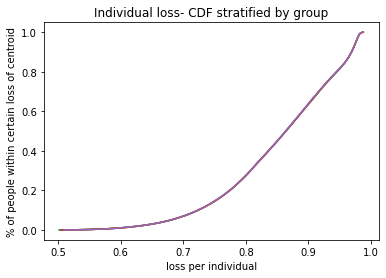

c  {0: (4.516126774359538, 3.7774160522096696), 1: (-9.505456413372533, -9.291162742108913), 2: (-11.07025039236547, 6.806459729771203), 3: (9.774303974637967, -3.8420590369394017), 4: (-2.1980965270481674, 8.75642430698571), 5: (-2.406254628289591, 1.7984065613356406), 6: (2.5976631050211587, 9.610493133254343), 7: (4.7908586692544715, -1.5301063857757675), 8: (-7.850803762325961, -6.830952220954488), 9: (7.039887506505906, 8.085752967410114)}
weights:  [0.19999903 0.20001377 0.20001075 0.20000826 0.19996819]
Time elapsed Batch Step:  0.34652256965637207
Time elapsed Assignment Step:  2.3829829692840576
0.00046695690991194194
total:  0.5970634382586203


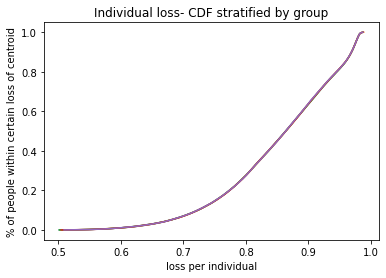

c  {0: (4.5154932264694745, 3.777035210549919), 1: (-9.504033807573373, -9.28978878221876), 2: (-11.068132112637207, 6.80618108380462), 3: (9.773624499471047, -3.840024300747932), 4: (-2.1966435231804153, 8.755096252607464), 5: (-2.4051189840798712, 1.7996877071325175), 6: (2.59622762422018, 9.609048084487599), 7: (4.791028377290967, -1.5288891173531565), 8: (-7.851782549515715, -6.832934080690655), 9: (7.037953883750412, 8.084893626403943)}
weights:  [0.19999905 0.2000138  0.20001081 0.2000083  0.19996805]
Time elapsed Batch Step:  0.3410313129425049
Time elapsed Assignment Step:  2.3489186763763428
0.0004624974460710751
total:  0.5969267809779772


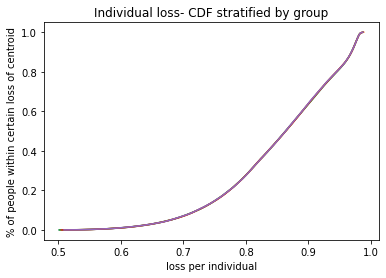

c  {0: (4.514859513182469, 3.776654367961317), 1: (-9.502612167272419, -9.288415752290307), 2: (-11.066013758433527, 6.805902528763056), 3: (9.772944785226695, -3.8379889391165944), 4: (-2.1951907531008583, 8.75376850333046), 5: (-2.403983230889578, 1.8009690860286947), 6: (2.5947917026019427, 9.607602696672311), 7: (4.791198235680763, -1.5276716154592243), 8: (-7.852760656531667, -6.834914581921156), 9: (7.03601992241113, 8.084034153868675)}
weights:  [0.19999906 0.20001383 0.20001087 0.20000834 0.1999679 ]
Time elapsed Batch Step:  0.35018134117126465
Time elapsed Assignment Step:  2.3411638736724854
0.0004706160962877348
total:  0.5967938094538305


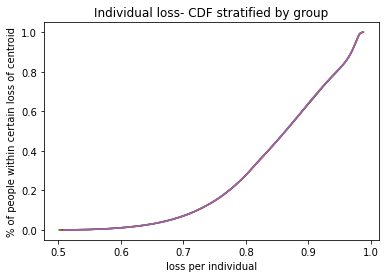

c  {0: (4.514225634452241, 3.7762735245026864), 1: (-9.501191496193616, -9.287043654206634), 2: (-11.06389533687783, 6.805624065538386), 3: (9.772264833366627, -3.8359529565638115), 4: (-2.1937382211242222, 8.752441062815642), 5: (-2.402847370849212, 1.8022506959782336), 6: (2.5933553429240157, 9.60615697263677), 7: (4.791368244540076, -1.5264538808023735), 8: (-7.853738078870102, -6.836893713061013), 9: (7.034085627514019, 8.083174552034848)}
weights:  [0.19999907 0.20001386 0.20001093 0.20000839 0.19996775]
Time elapsed Batch Step:  0.35096192359924316
Time elapsed Assignment Step:  2.3459930419921875
0.0004708520002529859
total:  0.5966583859284382


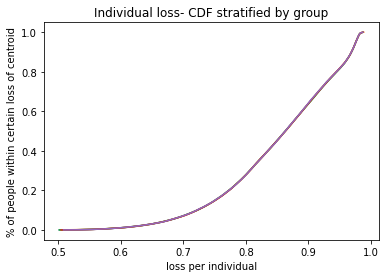

c  {0: (4.51359159023254, 3.7758926802328756), 1: (-9.499771798003483, -9.285672489807984), 2: (-11.061776855118145, 6.805345695019521), 3: (9.771584645362164, -3.8339163576342132), 4: (-2.1922859315740557, 8.751113934722307), 5: (-2.4017114060967386, 1.8035325349270466), 6: (2.5919185479586764, 9.604710915222496), 7: (4.791538403984958, -1.5252359140931728), 8: (-7.8547148120595605, -6.838871462543193), 9: (7.0321510041060815, 8.08231482314155)}
weights:  [0.19999908 0.20001389 0.200011   0.20000843 0.1999676 ]
Time elapsed Batch Step:  0.3483285903930664
Time elapsed Assignment Step:  2.3309271335601807
0.0004778020456349674
total:  0.5965248898910499


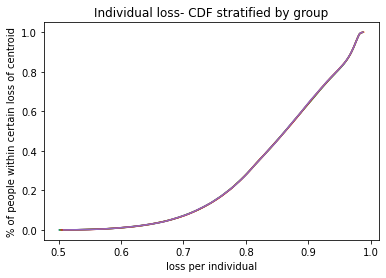

c  {0: (4.512957380477153, 3.7755118352107613), 1: (-9.498353076309874, -9.284302260893975), 2: (-11.059658320326893, 6.805067418092351), 3: (9.770904222694273, -3.83187914689872), 4: (-2.190833888782668, 8.74978712270812), 5: (-2.4005753387775846, 1.8048146008128807), 6: (2.5904813204929478, 9.603264527284272), 7: (4.791708714131304, -1.5240177160443595), 8: (-7.855690851661638, -6.840847818820338), 9: (7.03021605725536, 8.081454969436427)}
weights:  [0.19999909 0.20001392 0.20001106 0.20000847 0.19996745]
Time elapsed Batch Step:  0.35488462448120117
Time elapsed Assignment Step:  2.3079476356506348
0.0004738317083299304
total:  0.5963880320295343


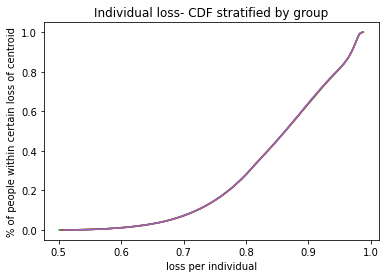

c  {0: (4.512323005139899, 3.775130989495246), 1: (-9.496935334660877, -9.282932969225874), 2: (-11.057539739700612, 6.804789235639694), 3: (9.770223566853609, -3.8298413289546285), 4: (-2.1893820970910665, 8.748460630429124), 5: (-2.3994391710446394, 1.8060968915653028), 6: (2.589043663328636, 9.601817811690177), 7: (4.791879175094849, -1.5227992873708434), 8: (-7.856666193271774, -6.842822770366534), 9: (7.028280792050924, 8.080594993175696)}
weights:  [0.1999991  0.20001395 0.20001112 0.20000852 0.1999673 ]
Time elapsed Batch Step:  0.34340834617614746
Time elapsed Assignment Step:  2.3020622730255127
0.00047469443860881366
total:  0.5962525389680458


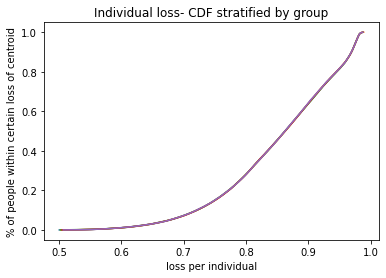

c  {0: (4.51168846417463, 3.7747501431452597), 1: (-9.49551857654384, -9.281564616528897), 2: (-11.055421120459712, 6.804511148541247), 3: (9.769542679340553, -3.827802908425692), 4: (-2.187930560848891, 8.747134461539746), 5: (-2.398302905058253, 1.8073794051056848), 6: (2.587605579282366, 9.600370771321602), 7: (4.7920497869911625, -1.521580628789709), 8: (-7.857640832520014, -6.844796305679126), 9: (7.026345213602869, 8.079734896624148)}
weights:  [0.19999911 0.20001399 0.20001119 0.20000857 0.19996715]
Time elapsed Batch Step:  0.34604787826538086
Time elapsed Assignment Step:  2.3175885677337646
0.0004781128963469161
total:  0.5961177287138811


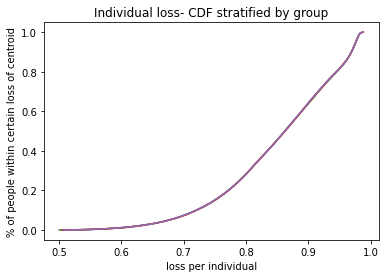

c  {0: (4.511053757535234, 3.7743692962197586), 1: (-9.494102805384525, -9.280197204494527), 2: (-11.053302469848198, 6.8042331576735435), 3: (9.768861561665263, -3.8257638899622073), 4: (-2.1864792844143475, 8.745808619692824), 5: (-2.3971665429862354, 1.8086621393471873), 6: (2.586167071185621, 9.598923409073294), 7: (4.792220549935654, -1.5203617410202188), 8: (-7.858614765071747, -6.846768413280572), 9: (7.024409327042304, 8.078874682055162)}
weights:  [0.19999912 0.20001402 0.20001125 0.20000861 0.199967  ]
Time elapsed Batch Step:  0.3460066318511963
Time elapsed Assignment Step:  2.315438985824585
0.00048542889310254633
total:  0.5959840041145403


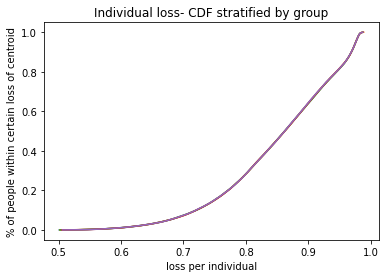

c  {0: (4.510418885175633, 3.7739884487777258), 1: (-9.49268802454639, -9.278830734782842), 2: (-11.051183795133404, 6.803955263909921), 3: (9.768180215347707, -3.823724278241096), 4: (-2.185028272154136, 8.744483108539612), 5: (-2.3960300870038544, 1.8099450921947455), 6: (2.5847281418847756, 9.597475727853375), 7: (4.792391464043567, -1.5191426247838165), 8: (-7.859587986628421, -6.848739081720343), 9: (7.022473137521343, 8.078014351750715)}
weights:  [0.19999913 0.20001405 0.20001131 0.20000866 0.19996686]
Time elapsed Batch Step:  0.36147594451904297
Time elapsed Assignment Step:  2.3206002712249756
0.0004922269312294114
total:  0.5958500415594619


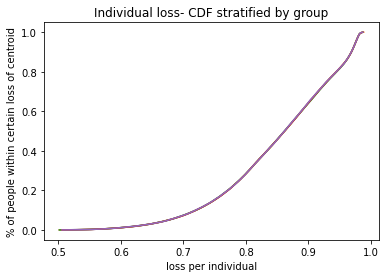

c  {0: (4.509783847049782, 3.7736076008781714), 1: (-9.491274237330005, -9.277465209024816), 2: (-11.049065103605717, 6.803677468120484), 3: (9.767498641917713, -3.821684077965988), 4: (-2.1835775284433816, 8.743157931729813), 5: (-2.3948935392938338, 1.811228261545053), 6: (2.5832887942411342, 9.596027730583378), 7: (4.7925625294299845, -1.517923280804129), 8: (-7.86056049292823, -6.850708299576852), 9: (7.020536650213098, 8.07715390800139)}
weights:  [0.19999914 0.20001408 0.20001137 0.2000087  0.19996671]
Time elapsed Batch Step:  0.3572273254394531
Time elapsed Assignment Step:  2.363523006439209
0.0004915129959743858
total:  0.5957137429690846


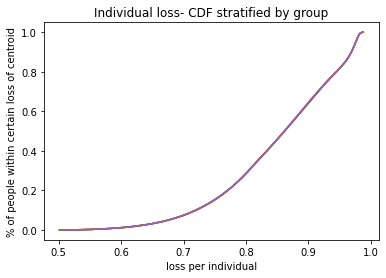

c  {0: (4.509148643111672, 3.7732267525801317), 1: (-9.489861446972585, -9.276100628824615), 2: (-11.046946402578294, 6.803399771172082), 3: (9.766816842915006, -3.8196432938673066), 4: (-2.1821270576655585, 8.741833092911595), 5: (-2.3937569020463516, 1.8125116452865473), 6: (2.5818490311309654, 9.594579420198269), 7: (4.792733746209821, -1.5167037098069707), 8: (-7.861532279746759, -6.852676055459433), 9: (7.018599870311665, 8.076293353106388)}
weights:  [0.19999915 0.20001411 0.20001143 0.20000875 0.19996656]
Time elapsed Batch Step:  0.40827322006225586
Time elapsed Assignment Step:  2.4465625286102295
0.0005071895385205805
total:  0.5955822815684072


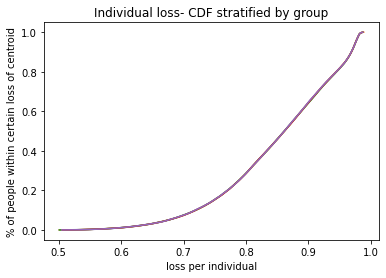

c  {0: (4.508513273315328, 3.77284590394267), 1: (-9.488449656647633, -9.274736995761824), 2: (-11.04482769938679, 6.8031221739282906), 3: (9.76613481988925, -3.8176019307023483), 4: (-2.180676864212415, 8.74050859573162), 5: (-2.3926201774590368, 1.813795241299394), 6: (2.5804088554455387, 9.593130799646481), 7: (4.792905114497828, -1.5154839125203454), 8: (-7.8625033428976, -6.854642338010346), 9: (7.016662803032115, 8.075432689373537)}
weights:  [0.19999916 0.20001414 0.2000115  0.2000088  0.19996641]
Time elapsed Batch Step:  0.39338183403015137
Time elapsed Assignment Step:  2.3966434001922607
0.0005151602442315939
total:  0.5954484292432074


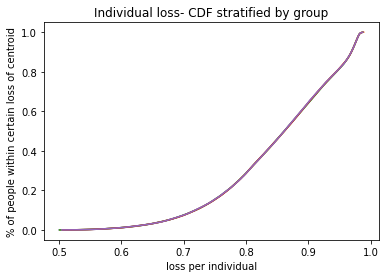

c  {0: (4.507877737614811, 3.7724650550248753), 1: (-9.487038869464705, -9.273374311393649), 2: (-11.042709001389058, 6.802844677249396), 3: (9.7654525744001, -3.8155599932553677), 4: (-2.179226952483896, 8.739184443835077), 5: (-2.3914833677369662, 1.8150790474554723), 6: (2.57896827009116, 9.591681871889945), 7: (4.793076634408591, -1.5142638896744494), 8: (-7.863473678232929, -6.85660713590682), 9: (7.014725453610479, 8.074571919119306)}
weights:  [0.19999917 0.20001417 0.20001155 0.20000885 0.19996626]
Time elapsed Batch Step:  0.3607194423675537
Time elapsed Assignment Step:  2.3618969917297363
0.0005226914707087138
total:  0.5953143659828843


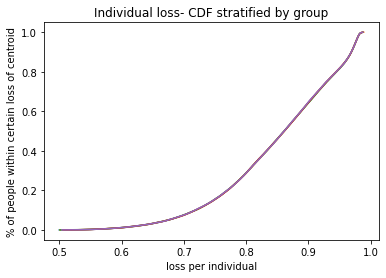

c  {0: (4.5072420359642145, 3.772084205885864), 1: (-9.485629088469269, -9.27201257725703), 2: (-11.040590315964872, 6.802567281992391), 3: (9.764770108017233, -3.81351748633766), 4: (-2.177777326888063, 8.737860640865705), 5: (-2.390346475092663, 1.8163630616183584), 6: (2.5775272779892062, 9.590232639904109), 7: (4.793248306056527, -1.5130436420016746), 8: (-7.864443281644032, -6.8585704378631265), 9: (7.012787827303741, 8.073711044668817)}
weights:  [0.19999918 0.2000142  0.20001161 0.2000089  0.1999661 ]
Time elapsed Batch Step:  0.4010484218597412
Time elapsed Assignment Step:  2.3429341316223145
0.0005150091575185645
total:  0.5951756611159599


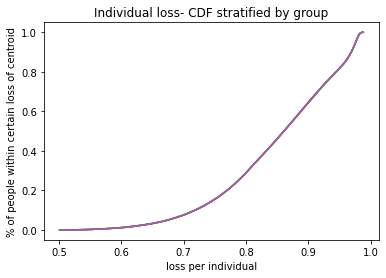

c  {0: (4.506606168317671, 3.7717033565847786), 1: (-9.484220316642663, -9.270651794870682), 2: (-11.038471650515628, 6.8022899890109745), 3: (9.764087422320396, -3.8114744147876434), 4: (-2.1763279918410126, 8.736537190465839), 5: (-2.389209501746091, 1.8176472816433114), 6: (2.5760858820761614, 9.588783106677976), 7: (4.793420129555887, -1.5118231702366112), 8: (-7.8654121490617905, -6.860532232632679), 9: (7.01084992938982, 8.072850068355857)}
weights:  [0.19999919 0.20001424 0.20001167 0.20000894 0.19996595]
Time elapsed Batch Step:  0.341447114944458
Time elapsed Assignment Step:  2.3605668544769287
0.000510430003456408
total:  0.5950378098264097


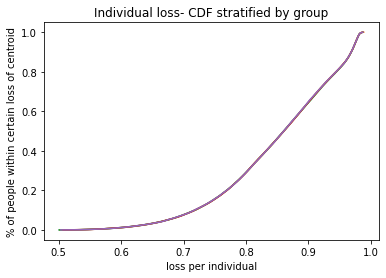

c  {0: (4.505970134629345, 3.7713225071807877), 1: (-9.48281255690214, -9.269291965737052), 2: (-11.036353012464062, 6.802012799155558), 3: (9.763404518899447, -3.809430783470941), 4: (-2.1748789517667935, 8.735214096276437), 5: (-2.3880724499246515, 1.8189317053772578), 6: (2.5746440853036496, 9.587333275214132), 7: (4.793592105020755, -1.5106024751160503), 8: (-7.866380276457113, -6.862492509010161), 9: (7.0089117651675545, 8.071988992522886)}
weights:  [0.1999992  0.20001427 0.20001173 0.20000899 0.1999658 ]
Time elapsed Batch Step:  0.3430485725402832
Time elapsed Assignment Step:  2.274711847305298
0.0005072359899281897
total:  0.5949002962783638


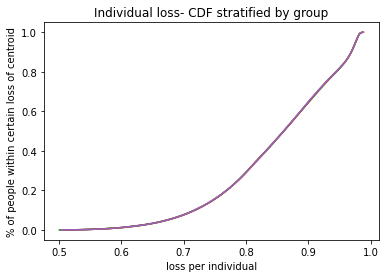

c  {0: (4.5053339348534385, 3.7709416577330868), 1: (-9.481405812100991, -9.267933091344165), 2: (-11.03423440925394, 6.80173571327328), 3: (9.762721399354405, -3.8073865972804635), 4: (-2.1734302110973216, 8.733891361937125), 5: (-2.386935321863179, 1.820216330658776), 6: (2.5732018906384706, 9.585883148528767), 7: (4.793764232565045, -1.5093815573789875), 8: (-7.867347659841315, -6.86445125583367), 9: (7.006973339956693, 8.071127819521058)}
weights:  [0.19999922 0.2000143  0.20001179 0.20000904 0.19996565]
Time elapsed Batch Step:  0.3458430767059326
Time elapsed Assignment Step:  2.242825746536255
0.000511159332809763
total:  0.5947648410756508


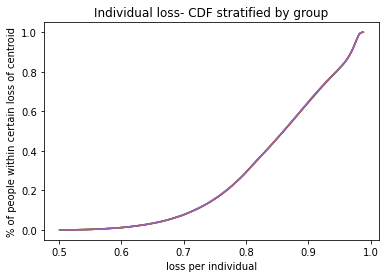

c  {0: (4.504697568944189, 3.770560808300897), 1: (-9.480000085028747, -9.26657517316737), 2: (-11.03211584834978, 6.801458732208025), 3: (9.76203806529548, -3.8053418611364904), 4: (-2.1719817742722944, 8.732568991086241), 5: (-2.3857981198039373, 1.821501155318081), 6: (2.571759301062634, 9.584432729651715), 7: (4.793936512302502, -1.508160417766625), 8: (-7.868314295266438, -6.866408461986884), 9: (7.005034659097876, 8.07026655171023)}
weights:  [0.19999923 0.20001434 0.20001185 0.20000909 0.1999655 ]
Time elapsed Batch Step:  0.344480037689209
Time elapsed Assignment Step:  2.265450954437256
0.0005125956674352228
total:  0.5946285639345479


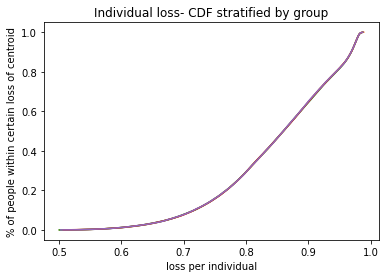

c  {0: (4.50406103685587, 3.7701799589434666), 1: (-9.478595378411425, -9.265218212670964), 2: (-11.029997337236544, 6.801181856800453), 3: (9.76135451834313, -3.8032965799867533), 4: (-2.170533645739102, 8.731246987360874), 5: (-2.384660845996614, 1.8227861771770095), 6: (2.5703163195733927, 9.58298202162647), 7: (4.794108944346703, -1.5069390570223744), 8: (-7.869280178825513, -6.86836411640124), 9: (7.003095727952618, 8.069405191458976)}
weights:  [0.19999924 0.20001437 0.20001191 0.20000914 0.19996534]
Time elapsed Batch Step:  0.3348379135131836
Time elapsed Assignment Step:  2.289071559906006
0.0004972124144430046
total:  0.5944871649860777


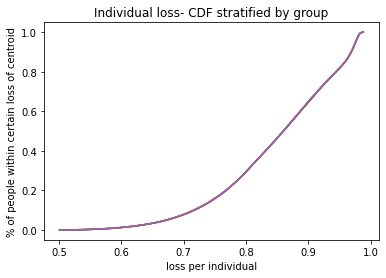

c  {0: (4.50342433854279, 3.7697991097200694), 1: (-9.477191694911852, -9.2638622113097), 2: (-11.02787888341935, 6.800905087888035), 3: (9.760670760128091, -3.8012507588065163), 4: (-2.169085829952738, 8.729925354396915), 5: (-2.383523502698314, 1.824071394049004), 6: (2.5688729491832762, 9.581531027510229), 7: (4.7942815288110525, -1.50571747589186), 8: (-7.870245306652756, -6.87031820805812), 9: (7.001156551903294, 8.068543741144605)}
weights:  [0.19999925 0.20001441 0.20001197 0.20000919 0.19996519]
Time elapsed Batch Step:  0.3747844696044922
Time elapsed Assignment Step:  2.317729949951172
0.0004900123683111435
total:  0.5943481254759329


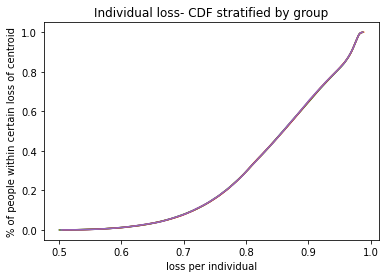

c  {0: (4.5027762681807735, 3.7694245850326067), 1: (-9.475789037130014, -9.262507170530156), 2: (-11.025760494423173, 6.800628426305093), 3: (9.759986792291434, -3.7992044025986575), 4: (-2.1676383313757093, 8.728604095829107), 5: (-2.3823860921735562, 1.8253568037390986), 6: (2.5674291929201245, 9.580079750373903), 7: (4.794457335187916, -1.504495948530428), 8: (-7.871209674923696, -6.872270725991042), 9: (6.999217136353117, 8.067682203153172)}
weights:  [0.19999926 0.20001444 0.20001203 0.20000924 0.19996504]
Time elapsed Batch Step:  0.3479340076446533
Time elapsed Assignment Step:  2.3436155319213867
0.00047070920415137607
total:  0.5942054451077049


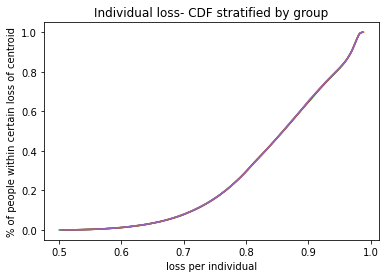

c  {0: (4.502128626124305, 3.7690459464216874), 1: (-9.474387407603466, -9.261153091771988), 2: (-11.023642177792553, 6.800351872882851), 3: (9.759302616484597, -3.7971575163937503), 4: (-2.1661911544779437, 8.727283215291095), 5: (-2.381252555995416, 1.8266368082438842), 6: (2.565985053827121, 9.578628193302162), 7: (4.794633296506918, -1.503274197510001), 8: (-7.872173279855236, -6.87422165928785), 9: (6.9972774867261265, 8.066820579879495)}
weights:  [0.19999927 0.20001448 0.20001208 0.20000928 0.19996488]
Time elapsed Batch Step:  0.344907283782959
Time elapsed Assignment Step:  2.3668627738952637
0.0004743865116696444
total:  0.5940695858326993


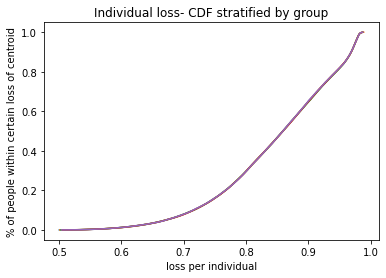

c  {0: (4.501480811964326, 3.7686673056293576), 1: (-9.472986808807757, -9.259799976469026), 2: (-11.021523941091303, 6.8000754284494915), 3: (9.75861823436943, -3.795110105250145), 4: (-2.1647443037366965, 8.72596271641548), 5: (-2.380118953769746, 1.8279170030425287), 6: (2.564540534962824, 9.577176359393453), 7: (4.794809412883451, -1.5020522235719518), 8: (-7.873136117705643, -6.876170997092897), 9: (6.995337608467165, 8.065958873727174)}
weights:  [0.19999929 0.20001451 0.20001214 0.20000933 0.19996473]
Time elapsed Batch Step:  0.3510308265686035
Time elapsed Assignment Step:  2.266741991043091
0.0004822763132584784
total:  0.5939349180265923


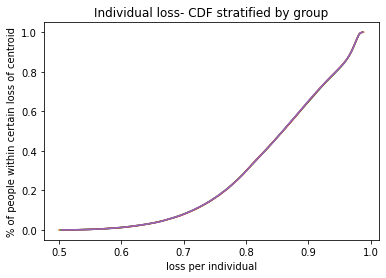

c  {0: (4.500832825654062, 3.7682886627132453), 1: (-9.471587243156902, -9.258447826050253), 2: (-11.01940579190222, 6.799799093830218), 3: (9.757933647618248, -3.7930621742540485), 4: (-2.163297783636457, 8.72464260283388), 5: (-2.3789852877463846, 1.829197385952132), 6: (2.5630956394012, 9.575724251760033), 7: (4.794985684432739, -1.5008300274598696), 8: (-7.874098184774461, -6.8781187286092225), 9: (6.993397507041859, 8.065097087108605)}
weights:  [0.1999993  0.20001455 0.20001219 0.20000938 0.19996458]
Time elapsed Batch Step:  0.36328887939453125
Time elapsed Assignment Step:  2.3459107875823975
0.000495096597519451
total:  0.5938016574372801


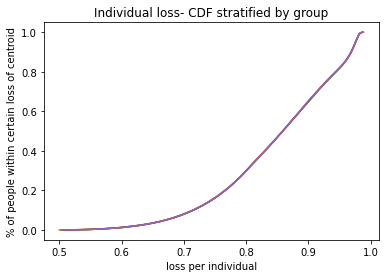

c  {0: (4.500184667146787, 3.7679100177310043), 1: (-9.470188713003854, -9.25709664194063), 2: (-11.017287737826797, 6.799522869847327), 3: (9.75724885791386, -3.791013728519606), 4: (-2.161851598668853, 8.723322878176978), 5: (-2.37785156018245, 1.8304779547814582), 6: (2.5616503702316558, 9.57427187352799), 7: (4.795162111269839, -1.4996076099195639), 8: (-7.875059477402344, -6.880064843100699), 9: (6.991457187936601, 8.064235222444994)}
weights:  [0.19999931 0.20001458 0.20001225 0.20000943 0.19996443]
Time elapsed Batch Step:  0.35056257247924805
Time elapsed Assignment Step:  2.363124132156372
0.0005030131400954874
total:  0.5936668554356095


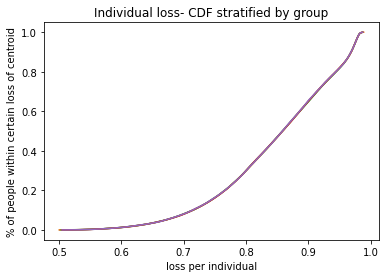

c  {0: (4.499536336395812, 3.767531370740316), 1: (-9.46879122064102, -9.255746425561792), 2: (-11.015169786484938, 6.799246757320284), 3: (9.756563866949623, -3.788964773188981), 4: (-2.160405753332554, 8.722003546074596), 5: (-2.376717773342328, 1.831758707330921), 6: (2.560204730559069, 9.572819227837284), 7: (4.7953386935096365, -1.4983849716990667), 8: (-7.876019991970821, -6.8820093298941725), 9: (6.989516656658527, 8.063373282166383)}
weights:  [0.19999932 0.20001462 0.2000123  0.20000948 0.19996427]
Time elapsed Batch Step:  0.3372821807861328
Time elapsed Assignment Step:  2.3756518363952637
0.000502120859345645
total:  0.5935293401996482


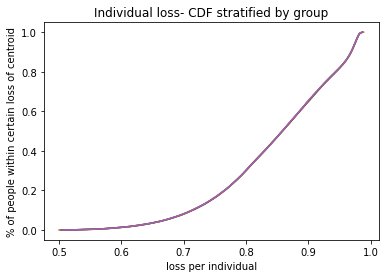

c  {0: (4.4988878333544955, 3.767152721798888), 1: (-9.467394768300776, -9.254397178332601), 2: (-11.01305194551468, 6.798970757065808), 3: (9.75587867642948, -3.7869153134324347), 4: (-2.1589602521331748, 8.720684610155747), 5: (-2.3755839294976697, 1.8330396413925683), 6: (2.5587587235038196, 9.571366317841763), 7: (4.79551543126685, -1.497162113548635), 8: (-7.876979724901975, -6.883952178381557), 9: (6.987575918735494, 8.062511268711662)}
weights:  [0.19999934 0.20001466 0.20001236 0.20000953 0.19996412]
Time elapsed Batch Step:  0.34299802780151367
Time elapsed Assignment Step:  2.33598256111145
0.0004979975506390621
total:  0.5933907855700382


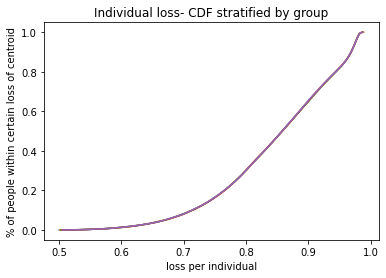

c  {0: (4.498239157976239, 3.7667740709644537), 1: (-9.465999358156008, -9.253048901669557), 2: (-11.010934222571919, 6.798694869897964), 3: (9.755193288068009, -3.784865354448407), 4: (-2.157515099583177, 8.719366074048704), 5: (-2.3744500309273797, 1.8343207547500668), 6: (2.557312352201822, 9.569913146709194), 7: (4.795692324656026, -1.4959390362207543), 8: (-7.877938672658037, -6.8858933780219065), 9: (6.985634979716063, 8.061649184528587)}
weights:  [0.19999935 0.2000147  0.20001241 0.20000958 0.19996396]
Time elapsed Batch Step:  0.3430943489074707
Time elapsed Assignment Step:  2.3134336471557617
0.0005021030167987606
total:  0.5932546305154731


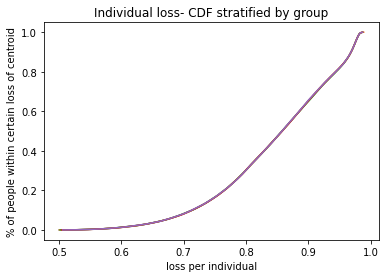

c  {0: (4.497590310214487, 3.766395418294773), 1: (-9.464604992320652, -9.251701596987088), 2: (-11.008816625330132, 6.7984190966282565), 3: (9.75450770359046, -3.7828149014635954), 4: (-2.1560703002017707, 8.718047941381066), 5: (-2.3733160799176094, 1.8356020451786874), 6: (2.5558656198045533, 9.568459717621296), 7: (4.795869373791544, -1.49471574047014), 8: (-7.878896831740913, -6.887832918343434), 9: (6.98369384516947, 8.060787032073808)}
weights:  [0.19999936 0.20001473 0.20001247 0.20000963 0.19996381]
Time elapsed Batch Step:  0.34142160415649414
Time elapsed Assignment Step:  2.3591980934143066
0.0005080010744267227
total:  0.593118944597762


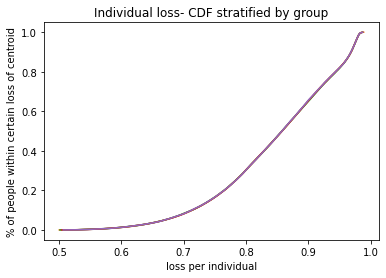

c  {0: (4.496941290022728, 3.766016763847633), 1: (-9.46321167285026, -9.2503552656977), 2: (-11.006699161480121, 6.798143438065736), 3: (9.753821924732804, -3.7807639597330347), 4: (-2.1546258585148164, 8.716730215779828), 5: (-2.3721820787617482, 1.8368835104452887), 6: (2.5544185294790847, 9.567006033773763), 7: (4.79604657878761, -1.4934922270537416), 8: (-7.879854198691614, -6.8897707889454916), 9: (6.981752520685609, 8.059924813812877)}
weights:  [0.19999938 0.20001477 0.20001252 0.20000968 0.19996366]
Time elapsed Batch Step:  0.34013938903808594
Time elapsed Assignment Step:  2.2864694595336914
0.000515241821625323
total:  0.5929850041201888


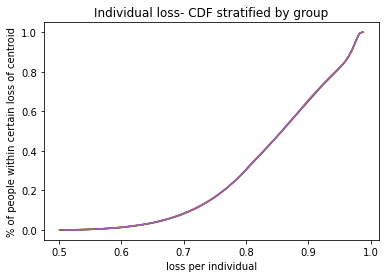

c  {0: (4.496298525004676, 3.765641856751804), 1: (-9.461833186605023, -9.24902322957324), 2: (-11.004602802321338, 6.7978706231661015), 3: (9.753142654274455, -3.7787434204627264), 4: (-2.1531960768711604, 8.715425943593312), 5: (-2.3710592579683483, 1.838152458824511), 6: (2.5529854155474276, 9.565566493776267), 7: (4.796213896096098, -1.4922714339266727), 8: (-7.880801299085684, -6.891687809296977), 9: (6.979830234734513, 8.05907106966179)}
weights:  [0.19999939 0.20001481 0.20001258 0.20000973 0.1999635 ]
Time elapsed Batch Step:  0.3547337055206299
Time elapsed Assignment Step:  2.2734756469726562
0.0005292173954377644
total:  0.5928530180695922


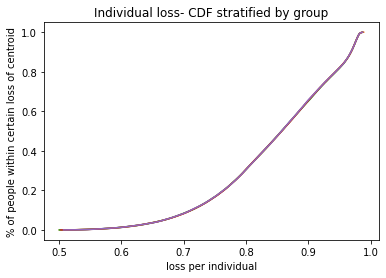

c  {0: (4.495655590863111, 3.765266948026633), 1: (-9.460455729954674, -9.247692150415688), 2: (-11.002506589016921, 6.797597922288194), 3: (9.752463193673679, -3.7767224073610106), 4: (-2.1517666547442156, 8.714122077543452), 5: (-2.3699363925230323, 1.8394215742044135), 6: (2.551551956979853, 9.564126710329317), 7: (4.796381368940391, -1.4910504234659865), 8: (-7.881747616305831, -6.8936031727110905), 9: (6.977907773581388, 8.05821726584921)}
weights:  [0.1999994  0.20001484 0.20001263 0.20000978 0.19996335]
Time elapsed Batch Step:  0.3595161437988281
Time elapsed Assignment Step:  2.3387062549591064
0.0005238210322699999
total:  0.5927151561908001


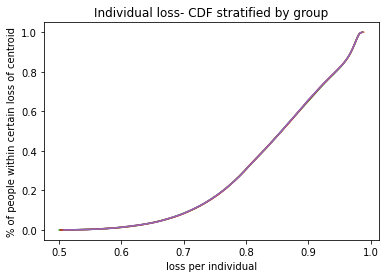

c  {0: (4.495012487553018, 3.764892037728283), 1: (-9.45907930472821, -9.246362029590086), 2: (-11.000410529080268, 6.797325336210789), 3: (9.751783544615462, -3.7747009254983803), 4: (-2.150337596545438, 8.712818621149212), 5: (-2.368813484672694, 1.8406908543930272), 6: (2.5501181568957256, 9.562686686575354), 7: (4.7965489974389905, -1.489829196429397), 8: (-7.882693147104318, -6.8955168693105415), 9: (6.975985142711541, 8.057363404794158)}
weights:  [0.19999942 0.20001488 0.20001268 0.20000983 0.19996319]
Time elapsed Batch Step:  0.3494851589202881
Time elapsed Assignment Step:  2.297807216644287
0.0005307150569400232
total:  0.5925809178129581


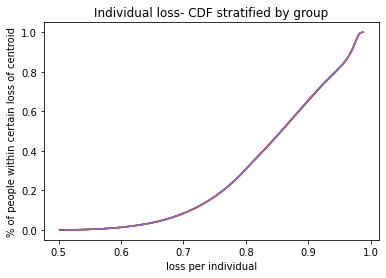

c  {0: (4.494369215029427, 3.7645171259129415), 1: (-9.457703912700795, -9.245032868459047), 2: (-10.998314630040468, 6.797052865710745), 3: (9.751103708795092, -3.7726789799723157), 4: (-2.1489089066922893, 8.71151557792925), 5: (-2.3676905366711436, 1.8419602971902416), 6: (2.5486840184295056, 9.561246425670353), 7: (4.796716781710227, -1.4886077535768485), 8: (-7.883637888268085, -6.897428889293391), 9: (6.974062347630034, 8.056509488924295)}
weights:  [0.19999943 0.20001492 0.20001274 0.20000988 0.19996304]
Time elapsed Batch Step:  0.35572147369384766
Time elapsed Assignment Step:  2.2973577976226807
0.0005163238181745688
total:  0.5924402307876097


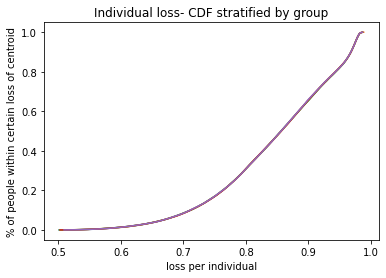

c  {0: (4.493725773247408, 3.764142212636823), 1: (-9.456329555594376, -9.24370466838234), 2: (-10.99621889944208, 6.796780511563127), 3: (9.7504236879182, -3.770656575907356), 4: (-2.1474805896081426, 8.710212951401987), 5: (-2.3665675507791, 1.84322990038779), 6: (2.547249544730777, 9.559805930783853), 7: (4.796884721872269, -1.4873860956705178), 8: (-7.884581836617853, -6.899339222934614), 9: (6.972139393861661, 8.055655520675952)}
weights:  [0.19999944 0.20001495 0.20001279 0.20000993 0.19996288]
Time elapsed Batch Step:  0.39520764350891113
Time elapsed Assignment Step:  2.349092721939087
0.000527622251159765
total:  0.5923071885929025


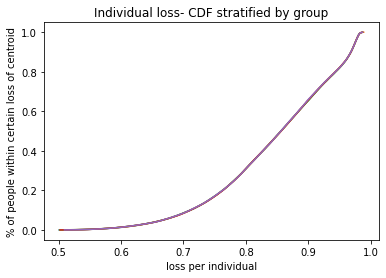

c  {0: (4.493082162162075, 3.763767297956165), 1: (-9.454956235078308, -9.242377430716399), 2: (-10.994123344844919, 6.796508274541329), 3: (9.749743483700797, -3.768633718455175), 4: (-2.1460526497221846, 8.708910745085687), 5: (-2.3654445292641784, 1.8444996617692357), 6: (2.5458147389642707, 9.558365205098982), 7: (4.797052818043117, -1.4861642234748174), 8: (-7.88552498900715, -6.901247860587591), 9: (6.97021628695092, 8.054801502494144)}
weights:  [0.19999946 0.20001499 0.20001285 0.20000998 0.19996273]
Time elapsed Batch Step:  0.38915276527404785
Time elapsed Assignment Step:  2.3630340099334717
0.0005292579005149456
total:  0.5921711855147785


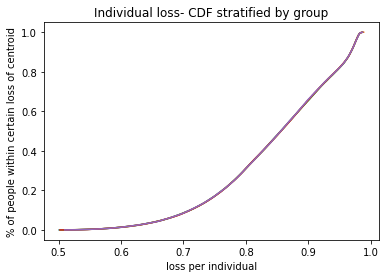

c  {0: (4.492438381728588, 3.7633923819272312), 1: (-9.453583952770012, -9.241051156813736), 2: (-10.992027973823852, 6.796236155417203), 3: (9.749063097869314, -3.7666104127946527), 4: (-2.14462509146932, 8.707608962498528), 5: (-2.3643214744008803, 1.8457695791099562), 6: (2.5443796043098943, 9.556924251812484), 7: (4.797221070340604, -1.4849421377563967), 8: (-7.886467342321285, -6.9031547926855055), 9: (6.96829303246199, 8.053947436832596)}
weights:  [0.19999947 0.20001503 0.2000129  0.20001003 0.19996257]
Time elapsed Batch Step:  0.3454716205596924
Time elapsed Assignment Step:  2.3188986778259277
0.0005252710454876075
total:  0.5920334340492319


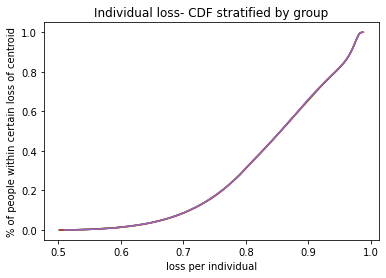

c  {0: (4.491794431902148, 3.76301746460631), 1: (-9.452212710235667, -9.239725848022282), 2: (-10.989932793968599, 6.795964154961184), 3: (9.74838253216065, -3.7645866641319494), 4: (-2.143197919290077, 8.706307607158678), 5: (-2.3631983884705816, 1.8470396501771296), 6: (2.5429441439627536, 9.555483074134745), 7: (4.7973894788823985, -1.4837198392841462), 8: (-7.887408893476253, -6.905060009742662), 9: (6.966369635978704, 8.05309332615377)}
weights:  [0.19999948 0.20001507 0.20001296 0.20001008 0.19996241]
Time elapsed Batch Step:  0.6791942119598389
Time elapsed Assignment Step:  4.093239784240723
0.0005489286793260995
total:  0.5919039143073617


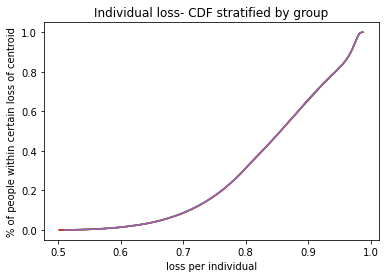

c  {0: (4.491150312638002, 3.762642546049714), 1: (-9.450842508990927, -9.238401505684658), 2: (-10.987837812883548, 6.795692273942425), 3: (9.747701788322205, -3.762562477700577), 4: (-2.141771137630509, 8.70500668258437), 5: (-2.3620752737615205, 1.84830987272972), 6: (2.541508361133179, 9.554041675289817), 7: (4.797558043786, -1.482497328829198), 8: (-7.888349639417589, -6.906963502355712), 9: (6.964446103104524, 8.052239172928884)}
weights:  [0.19999949 0.2000151  0.20001301 0.20001014 0.19996225]
Time elapsed Batch Step:  0.36609387397766113
Time elapsed Assignment Step:  2.3441104888916016
0.0005680815213655599
total:  0.5917729585144512


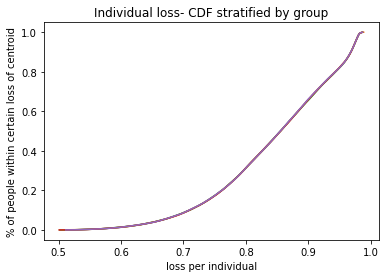

c  {0: (4.490496010152051, 3.7622765189587795), 1: (-9.449473350501682, -9.23707813113739), 2: (-10.985743038187573, 6.795420513128927), 3: (9.74702086811193, -3.760537858761472), 4: (-2.140344750942101, 8.703706192293984), 5: (-2.360952132568785, 1.8495802445184633), 6: (2.5400722590467484, 9.552600058515443), 7: (4.797728181240625, -1.4812727610756091), 8: (-7.889289577119168, -6.908865261204777), 9: (6.962522439462511, 8.05138497963794)}
weights:  [0.19999951 0.20001514 0.20001307 0.20001019 0.19996209]
Time elapsed Batch Step:  0.34569811820983887
Time elapsed Assignment Step:  2.310730218887329
0.0005530747778063061
total:  0.5916316954383135


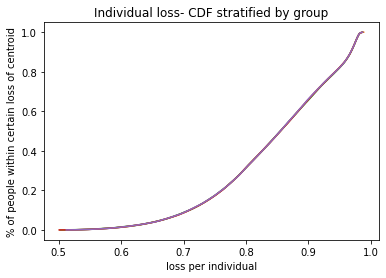

c  {0: (4.489841530390323, 3.761910490447716), 1: (-9.448105236184855, -9.235755725710058), 2: (-10.983648477513862, 6.79514887328767), 3: (9.746339773298363, -3.7585128126030685), 4: (-2.1389187636816733, 8.702406139806119), 5: (-2.3598289671943005, 1.8508507632858517), 6: (2.5386358409443135, 9.55115822706309), 7: (4.797898476356585, -1.480047976349266), 8: (-7.890228703581958, -6.9107652770544865), 9: (6.960598650695301, 8.050530748769749)}
weights:  [0.19999952 0.20001518 0.20001312 0.20001025 0.19996193]
Time elapsed Batch Step:  0.37438344955444336
Time elapsed Assignment Step:  2.3049848079681396
0.0005574892563019462
total:  0.5914962009898327


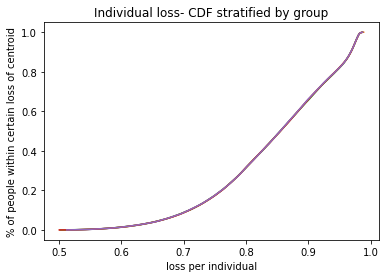

c  {0: (4.489186873303916, 3.7615444605698944), 1: (-9.446738167409254, -9.234434290724428), 2: (-10.981554138509752, 6.794877355184746), 3: (9.745658505660671, -3.7564873445413687), 4: (-2.137493180311286, 8.701106528639674), 5: (-2.3587057799468165, 1.8521214267661203), 6: (2.5371991100820197, 9.549716184197964), 7: (4.798068929252333, -1.4788229754191227), 8: (-7.8911670158327265, -6.912663540754901), 9: (6.958674742465077, 8.049676482821956)}
weights:  [0.19999953 0.20001522 0.20001318 0.2000103  0.19996177]
Time elapsed Batch Step:  0.373826265335083
Time elapsed Assignment Step:  2.2921886444091797
0.0005566632172716579
total:  0.5913590770961833


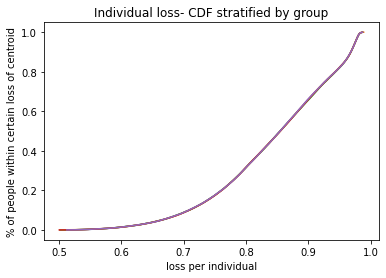

c  {0: (4.488532038843981, 3.761178429378709), 1: (-9.445372145496464, -9.233113827493522), 2: (-10.979460028836579, 6.794605959585489), 3: (9.744977066988692, -3.754461459920014), 4: (-2.1360680052981458, 8.699807362313928), 5: (-2.357582573141893, 1.8533922326852323), 6: (2.535762069731331, 9.548273933199047), 7: (4.798239540046156, -1.477597759056394), 8: (-7.892104510922718, -6.9145600432423455), 9: (6.956750720453538, 8.04882218430107)}
weights:  [0.19999954 0.20001525 0.20001323 0.20001036 0.19996161]
Time elapsed Batch Step:  0.34465932846069336
Time elapsed Assignment Step:  2.3557283878326416
0.0005636095364816018
total:  0.5912242281556298


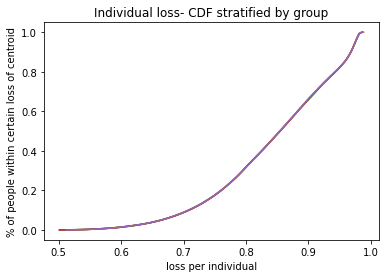

c  {0: (4.487877026961713, 3.760812396927578), 1: (-9.444007171721791, -9.231794337320682), 2: (-10.977366156169527, 6.7943346872546035), 3: (9.744295459082975, -3.752435164110358), 4: (-2.1346432431145095, 8.698508644348617), 5: (-2.3564593491018853, 1.8546631787608643), 6: (2.5343247231790507, 9.546831477359113), 7: (4.798410308856178, -1.4763723280345589), 8: (-7.893041185926291, -6.91645477554013), 9: (6.954826590361874, 8.047967855722487)}
weights:  [0.19999955 0.20001529 0.20001329 0.20001042 0.19996145]
Time elapsed Batch Step:  0.3417344093322754
Time elapsed Assignment Step:  2.3077261447906494
0.0005498377277698419
total:  0.5910831068144715


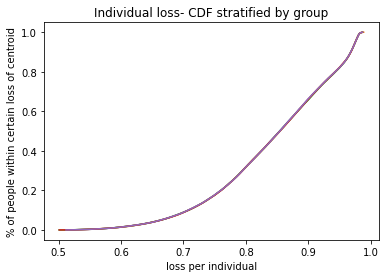

c  {0: (4.487221837608361, 3.760446363269943), 1: (-9.442643247315273, -9.230475821498617), 2: (-10.975272528197491, 6.7940635389562924), 3: (9.743613683754825, -3.750408462511536), 4: (-2.133218898237592, 8.697210378264021), 5: (-2.3553361101559314, 1.8559342627023923), 6: (2.532887073727344, 9.54538881998476), 7: (4.798581235800356, -1.4751466831293614), 8: (-7.8939770379395275, -6.9183477287591675), 9: (6.952902357910735, 8.04711349961052)}
weights:  [0.19999957 0.20001533 0.20001334 0.20001047 0.19996129]
Time elapsed Batch Step:  0.3491792678833008
Time elapsed Assignment Step:  2.3331809043884277
0.0005565592285370347
total:  0.5909480773175257


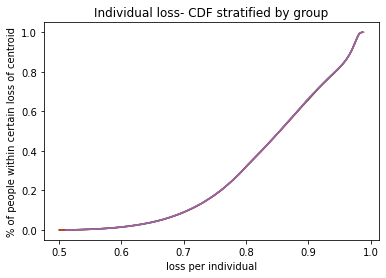

c  {0: (4.486566470735222, 3.760080328459269), 1: (-9.441280373462726, -9.229158281308441), 2: (-10.97317915262295, 6.793792515454376), 3: (9.742931742826338, -3.748381360550536), 4: (-2.1317949751494725, 8.695912567581031), 5: (-2.3542128586399347, 1.8572054822108766), 6: (2.531449124693758, 9.54394596439643), 7: (4.798752320996482, -1.4739208251188147), 8: (-7.894912064078833, -6.920238894098489), 9: (6.950978028840203, 8.046259118498428)}
weights:  [0.19999958 0.20001537 0.2000134  0.20001053 0.19996112]
Time elapsed Batch Step:  0.3555173873901367
Time elapsed Assignment Step:  2.313427448272705
0.0005672162402552416
total:  0.590814173934114


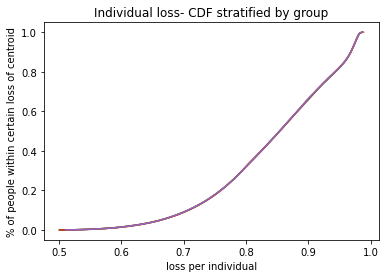

c  {0: (4.485910926293643, 3.759714292549045), 1: (-9.439918551306874, -9.227841718018718), 2: (-10.97108603716184, 6.793521617512415), 3: (9.742249638130449, -3.7463538636822684), 4: (-2.1303714783370014, 8.694615215821239), 5: (-2.35308959689655, 1.8584768349790484), 6: (2.530010879411242, 9.542502913928441), 7: (4.798923564562186, -1.472694754783202), 8: (-7.8958462614795035, -6.922128262845648), 9: (6.9490536089097645, 8.045404714928445)}
weights:  [0.19999959 0.20001541 0.20001346 0.20001059 0.19996096]
Time elapsed Batch Step:  0.3458993434906006
Time elapsed Assignment Step:  2.323655605316162
0.0005522894096823272
total:  0.5906725413266469


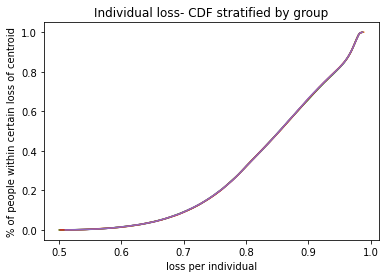

c  {0: (4.485255204235021, 3.7593482555927835), 1: (-9.438557781948518, -9.226526132884516), 2: (-10.968993189543442, 6.793250845893822), 3: (9.741567371510971, -3.7443259773896385), 4: (-2.1289484122917086, 8.693318326507017), 5: (-2.3519663272751674, 1.8597483186912944), 6: (2.528572341228168, 9.541059671929006), 7: (4.799094966614928, -1.4714684729050802), 8: (-7.896779627294298, -6.924015826377027), 9: (6.947129103898274, 8.044550291451808)}
weights:  [0.1999996  0.20001545 0.20001351 0.20001064 0.19996079]
Time elapsed Batch Step:  0.3352980613708496
Time elapsed Assignment Step:  2.359225034713745
0.0005593552061861073
total:  0.5905374525417068


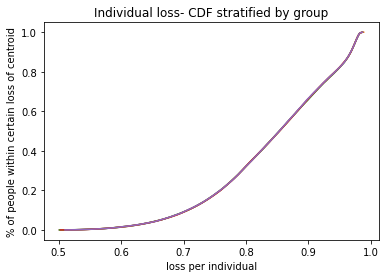

c  {0: (4.4845993045108035, 3.7589822176440197), 1: (-9.437198066447776, -9.225211527146492), 2: (-10.966900617510275, 6.792980201361971), 3: (9.740884944822634, -3.7422977071836123), 4: (-2.127525781509712, 8.69202190316159), 5: (-2.3508430521318946, 1.8610199310236433), 6: (2.5271335135083492, 9.539616241760262), 7: (4.799266527272007, -1.4702419802692803), 8: (-7.897712158691994, -6.925901576158035), 9: (6.945204519603933, 8.04369585062879)}
weights:  [0.19999961 0.20001549 0.20001357 0.2000107  0.19996063]
Time elapsed Batch Step:  0.3368544578552246
Time elapsed Assignment Step:  2.337183952331543
0.0005703706698160227
total:  0.5904034954165657


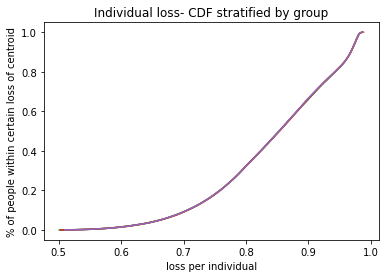

c  {0: (4.483943227072489, 3.758616178756313), 1: (-9.43583940582538, -9.22389790203), 2: (-10.964808328817995, 6.792709684680297), 3: (9.740202359931128, -3.740269058603289), 4: (-2.126103590491627, 8.690725949309126), 5: (-2.3497197738295412, 1.8622916696437504), 6: (2.5256943996310586, 9.538172626798294), 7: (4.799438246650555, -1.4690152776629115), 8: (-7.898643852855956, -6.927785503743205), 9: (6.943279861844251, 8.04284139502873)}
weights:  [0.19999962 0.20001553 0.20001363 0.20001076 0.19996046]
Time elapsed Batch Step:  0.3569052219390869
Time elapsed Assignment Step:  2.3820013999938965
0.0005580767680865018
total:  0.590262493144852


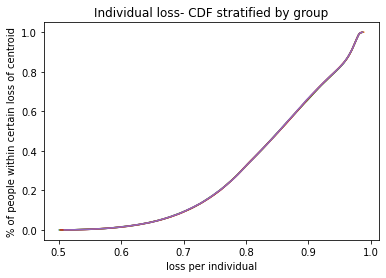

c  {0: (4.4832869718716255, 3.7582501389832452), 1: (-9.434481801064033, -9.222585258744243), 2: (-10.962716331235294, 6.792439296612392), 3: (9.739519618713146, -3.738240037215968), 4: (-2.1246818437424753, 8.689430468474804), 5: (-2.348596494737601, 1.8635635322108848), 6: (2.524255002991046, 9.536728830433164), 7: (4.799610124867543, -1.467788365875362), 8: (-7.899574706982701, -6.929667600776193), 9: (6.9413551364560195, 8.041986927230065)}
weights:  [0.19999963 0.20001558 0.20001368 0.20001082 0.1999603 ]
Time elapsed Batch Step:  0.3417835235595703
Time elapsed Assignment Step:  2.3288755416870117
0.0005588772759093086
total:  0.5901253671871323


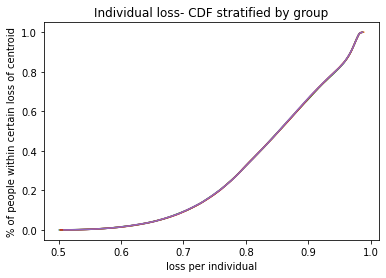

c  {0: (4.482630538859814, 3.7578840983784225), 1: (-9.433125253109822, -9.221273598481472), 2: (-10.960624632543817, 6.792169037922093), 3: (9.738836723056421, -3.7362106486172193), 4: (-2.1232605457715974, 8.6881354641849), 5: (-2.347473217232232, 1.8648355163759136), 6: (2.5228153269985567, 9.535284856068925), 7: (4.799782162039775, -1.4665612456983026), 8: (-7.900504718280479, -6.9315478589896795), 9: (6.939430349295282, 8.04113244982036)}
weights:  [0.19999964 0.20001562 0.20001374 0.20001087 0.19996013]
Time elapsed Batch Step:  0.3453996181488037
Time elapsed Assignment Step:  2.32039737701416
0.0005796373570864377
total:  0.5899941785544056


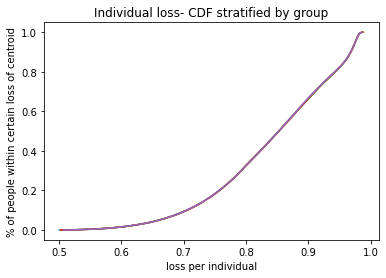

c  {0: (4.4819739279887045, 3.7575180569954743), 1: (-9.431769762873687, -9.219962922416238), 2: (-10.958533240538074, 6.791898909373556), 3: (9.738153674859772, -3.734180898430951), 4: (-2.1218397010925636, 8.686840939966858), 5: (-2.346349943696242, 1.8661076197812885), 6: (2.5213753750793453, 9.533840707123659), 7: (4.799954358283891, -1.465333917925687), 8: (-7.901433883967874, -6.933426270205179), 9: (6.937505506237299, 8.040277965396342)}
weights:  [0.19999965 0.20001566 0.20001379 0.20001093 0.19995996]
Time elapsed Batch Step:  0.3742227554321289
Time elapsed Assignment Step:  2.3774807453155518
0.0005778260662986368
total:  0.5898561687911932


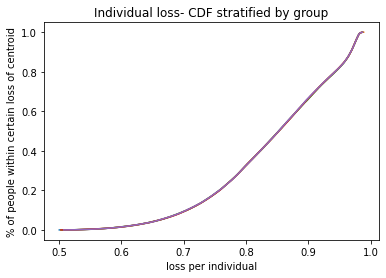

c  {0: (4.48131713921, 3.757152014888052), 1: (-9.430415331232938, -9.218653231704703), 2: (-10.956442163025352, 6.7916289117313235), 3: (9.737470476033142, -3.732150792309476), 4: (-2.120419314223085, 8.685546899349376), 5: (-2.3452266765190655, 1.8673798400610315), 6: (2.519935150674694, 9.532396387029495), 7: (4.80012671371637, -1.4641063833537555), 8: (-7.90236220127242, -6.935302826332754), 9: (6.935580613176518, 8.039423476563936)}
weights:  [0.19999966 0.2000157  0.20001385 0.20001099 0.1999598 ]
Time elapsed Batch Step:  0.35280442237854004
Time elapsed Assignment Step:  2.3581113815307617
0.0005716820002740208
total:  0.5897168101278573


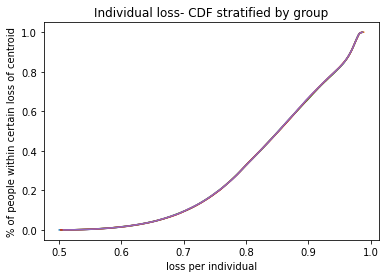

c  {0: (4.480660172475454, 3.756785972109832), 1: (-9.42906195903283, -9.217344527484027), 2: (-10.954351407825648, 6.791359045760386), 3: (9.736787128497637, -3.7301203359335826), 4: (-2.118999389684929, 8.684253345862473), 5: (-2.344103418096746, 1.8686521748407205), 6: (2.5184946572414257, 9.530951899232633), 7: (4.800299228453526, -1.462878642781036), 8: (-7.903289667429254, -6.937177519370649), 9: (6.933655676026544, 8.038568985938296)}
weights:  [0.19999967 0.20001574 0.20001391 0.20001105 0.19995963]
Time elapsed Batch Step:  0.35397911071777344
Time elapsed Assignment Step:  2.34455943107605
0.0005801935421696491
total:  0.5895817990172034


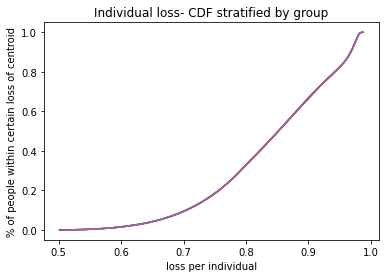

c  {0: (4.480003027736873, 3.7564199287145126), 1: (-9.42770964708817, -9.216036810871818), 2: (-10.952260982771577, 6.791089312226223), 3: (9.736103634185575, -3.728089535012599), 4: (-2.1175799320038307, 8.682960283037568), 5: (-2.3429801708319165, 1.8699246217374756), 6: (2.5170538982519197, 9.529507247193374), 7: (4.800471902611512, -1.461650697008347), 8: (-7.904216279679787, -6.939050341404837), 9: (6.931730700720102, 8.03771449614384)}
weights:  [0.19999968 0.20001578 0.20001396 0.20001111 0.19995946]
Time elapsed Batch Step:  0.35011744499206543
Time elapsed Assignment Step:  2.343076705932617
0.0005847017917184338
total:  0.5894455392821769


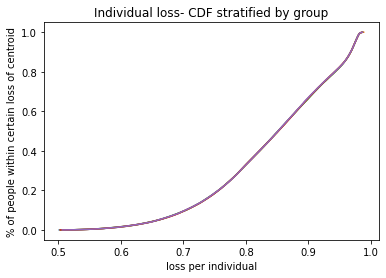

c  {0: (4.479345704946115, 3.756053884755816), 1: (-9.42635839618497, -9.214730082965666), 2: (-10.950170895708307, 6.790819711894842), 3: (9.735419995040518, -3.7260583952844613), 4: (-2.11616094570941, 8.681667714407553), 5: (-2.3418569371337767, 1.8711971783599441), 6: (2.5156128771941226, 9.528062434386138), 7: (4.8006447363063165, -1.4604225468387981), 8: (-7.90514203527042, -6.940921284608494), 9: (6.929805693209012, 8.036860009814287)}
weights:  [0.19999969 0.20001582 0.20001402 0.20001117 0.1999593 ]
Time elapsed Batch Step:  0.3639256954193115
Time elapsed Assignment Step:  2.3332464694976807
0.0006002271028240358
total:  0.5893125372687494


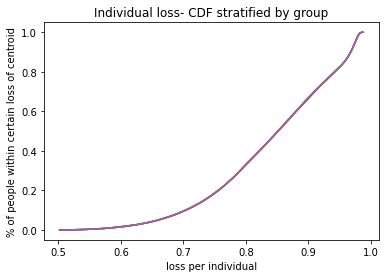

c  {0: (4.47868820405509, 3.7556878402874863), 1: (-9.425008207082136, -9.213424344842746), 2: (-10.948081154493476, 6.7905502455327955), 3: (9.734736213017317, -3.724026922515781), 4: (-2.1147424353350863, 8.680375643506865), 5: (-2.340733719418074, 1.8724698423082877), 6: (2.514171597571563, 9.526617464299493), 7: (4.800817729653768, -1.4591941930777936), 8: (-7.906066931451297, -6.94279034124139), 9: (6.927880659464149, 8.03600552959269)}
weights:  [0.1999997  0.20001586 0.20001408 0.20001123 0.19995913]
Time elapsed Batch Step:  0.3505539894104004
Time elapsed Assignment Step:  2.3322463035583496
0.0005827886930166448
total:  0.5891695988701552


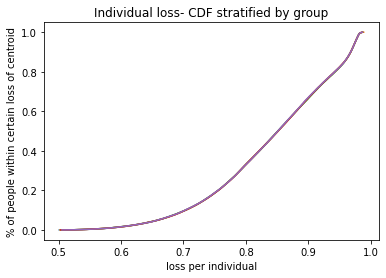

c  {0: (4.47803052501576, 3.755321795363292), 1: (-9.423659080513184, -9.212119597559527), 2: (-10.94599176699711, 6.790280913907194), 3: (9.734052290082156, -3.7219951225019097), 4: (-2.113324405417994, 8.67908407387156), 5: (-2.339610520107081, 1.8737426111741675), 6: (2.512730062903362, 9.525172340436178), 7: (4.8009908827695345, -1.4579656365330331), 8: (-7.906990965475091, -6.9446575036492275), 9: (6.925955605475417, 8.035151058131477)}
weights:  [0.19999971 0.2000159  0.20001413 0.20001129 0.19995897]
Time elapsed Batch Step:  0.3736917972564697
Time elapsed Assignment Step:  2.427140235900879
0.0005801836458366738
total:  0.5890310642353052


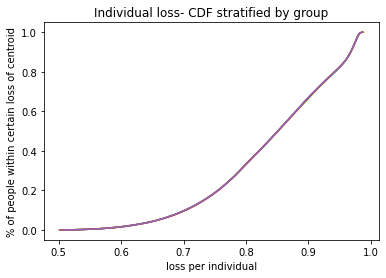

c  {0: (4.477372667780141, 3.7549557500370243), 1: (-9.42231101718797, -9.21081584215154), 2: (-10.943902741101548, 6.790011717785696), 3: (9.733368228212585, -3.719963001067006), 4: (-2.1119068604989013, 8.677793009039373), 5: (-2.3384873416295724, 1.8750154825407304), 6: (2.5112882767242444, 9.523727066313127), 7: (4.801164195769121, -1.4567368780145142), 8: (-7.907914134595855, -6.946522764262896), 9: (6.924030537251712, 8.03429659809248)}
weights:  [0.19999972 0.20001594 0.20001419 0.20001135 0.1999588 ]
Time elapsed Batch Step:  0.35033226013183594
Time elapsed Assignment Step:  2.367011070251465
0.0005873528534325878
total:  0.5888954169347351


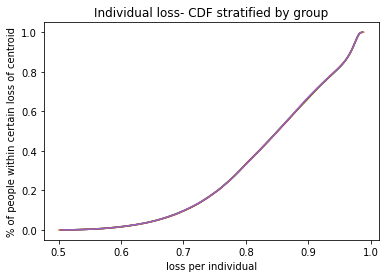

c  {0: (4.476714632300301, 3.7545897043624974), 1: (-9.420964017794454, -9.209513079633252), 2: (-10.941814084701345, 6.789742657936492), 3: (9.73268402939757, -3.7179305640641), 4: (-2.110489805122129, 8.676502452549798), 5: (-2.3373641864208032, 1.8762884539825957), 6: (2.5098462425845494, 9.522281645461494), 7: (4.801337668767875, -1.455507918334534), 8: (-7.908836436067896, -6.948386115597688), 9: (6.922105460820888, 8.03344215214698)}
weights:  [0.19999972 0.20001598 0.20001425 0.20001141 0.19995863]
Time elapsed Batch Step:  0.35858964920043945
Time elapsed Assignment Step:  2.35029673576355
0.0005699326074035671
total:  0.5887523480962298


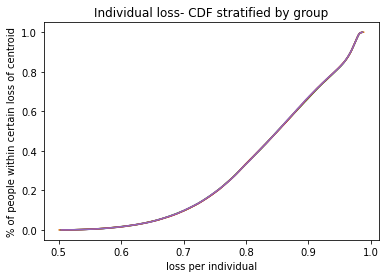

c  {0: (4.476056418528362, 3.7542236583935478), 1: (-9.419618083000456, -9.20821131099802), 2: (-10.939725805703192, 6.78947373512827), 3: (9.731999695637523, -3.7158978173751582), 4: (-2.1090732438354665, 8.675212407944146), 5: (-2.3362410569224847, 1.8775615230658405), 6: (2.508403964050238, 9.520836081426676), 7: (4.801511301880984, -1.4542787583076906), 8: (-7.90975786714472, -6.950247550252446), 9: (6.920180382229729, 8.032587722975743)}
weights:  [0.19999973 0.20001602 0.20001431 0.20001147 0.19995847]
Time elapsed Batch Step:  0.3482937812805176
Time elapsed Assignment Step:  2.4130852222442627
0.0005813473003487557
total:  0.5886178866849237


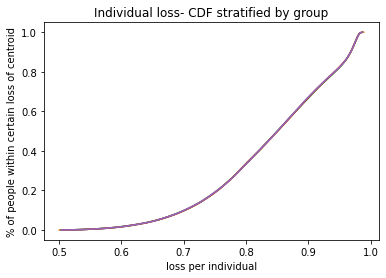

c  {0: (4.4753980264164985, 3.7538576121840355), 1: (-9.418273213455437, -9.206910537218132), 2: (-10.937637912025805, 6.7892049501301655), 3: (9.731315228944354, -3.71386476691115), 4: (-2.107657181190095, 8.67392287876561), 5: (-2.335117955582761, 1.8788346873479866), 6: (2.506961444702902, 9.519390377768339), 7: (4.801685095223475, -1.4530493987508852), 8: (-7.910678425078019, -6.952107060908671), 9: (6.918255307543911, 8.031733313269054)}
weights:  [0.19999974 0.20001606 0.20001436 0.20001154 0.1999583 ]
Time elapsed Batch Step:  0.35878729820251465
Time elapsed Assignment Step:  2.3568389415740967
0.0005566007244052207
total:  0.5884725349000526


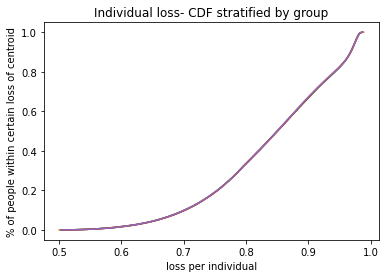

c  {0: (4.4747394559169384, 3.7534915657878436), 1: (-9.416929409792255, -9.20561075924493), 2: (-10.935550411599818, 6.788936303711694), 3: (9.730630631341503, -3.7118314186121104), 4: (-2.1062416217405064, 8.67263386855933), 5: (-2.3339948848561822, 1.880107944377987), 6: (2.5055186881397717, 9.517944538060437), 7: (4.801859048910221, -1.4518198404833236), 8: (-7.911598107116712, -6.953964640329579), 9: (6.91633024284797, 8.030878925726766)}
weights:  [0.19999975 0.2000161  0.20001442 0.2000116  0.19995814]
Time elapsed Batch Step:  0.35610222816467285
Time elapsed Assignment Step:  2.273588180541992
0.0005505569413916112
total:  0.5883327524656364


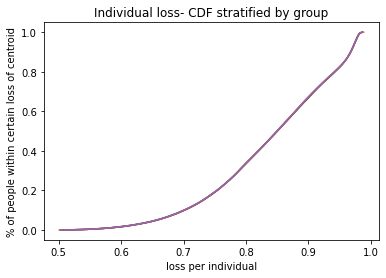

c  {0: (4.4740807069819635, 3.7531255192588775), 1: (-9.41558667262893, -9.20431197800903), 2: (-10.933463312367667, 6.788667796642673), 3: (9.729945904863985, -3.709797778447203), 4: (-2.104826570044424, 8.671345380872445), 5: (-2.332871847203683, 1.881381291696211), 6: (2.5040756979737213, 9.516498565891244), 7: (4.802033163055935, -1.4505900843265178), 8: (-7.912516910506045, -6.95582028135913), 9: (6.914405194245268, 8.030024563058328)}
weights:  [0.19999976 0.20001614 0.20001448 0.20001166 0.19995797]
Time elapsed Batch Step:  0.3443410396575928
Time elapsed Assignment Step:  2.2981560230255127
0.000557691889161771
total:  0.5881968830844211


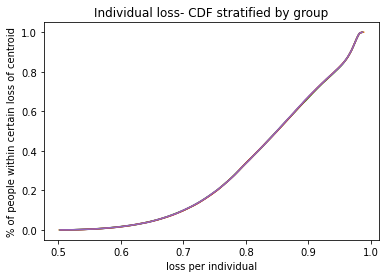

c  {0: (4.47342177956391, 3.752759472651066), 1: (-9.41424500257039, -9.20301419442061), 2: (-10.931376622283455, 6.7883994296931265), 3: (9.729261051558426, -3.7077638524147867), 4: (-2.1034120306627266, 8.670057419254155), 5: (-2.331748845092554, 1.8826547268344327), 6: (2.5026324778332736, 9.515052464863368), 7: (4.8022074377751744, -1.4493601311042879), 8: (-7.913434832486747, -6.957673976921012), 9: (6.912480167857962, 8.029170227982831)}
weights:  [0.19999977 0.20001618 0.20001453 0.20001172 0.1999578 ]
Time elapsed Batch Step:  0.350480318069458
Time elapsed Assignment Step:  2.297586441040039
0.000575455394132951
total:  0.588064161788551


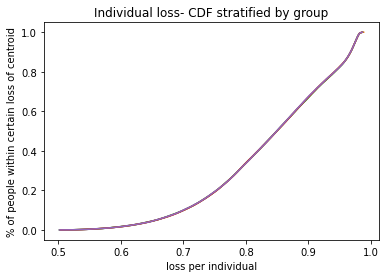

c  {0: (4.472762673615169, 3.7523934260183602), 1: (-9.412904400210193, -9.201717409369778), 2: (-10.929290349312799, 6.78813120363317), 3: (9.728576073483108, -3.705729646542475), 4: (-2.1019980081593688, 8.668769987255779), 5: (-2.3306258809964144, 1.8839282473158163), 6: (2.5011890313626055, 9.513606238593784), 7: (4.802381873182342, -1.448129981642763), 8: (-7.914351870294237, -6.959525720017605), 9: (6.910555169826964, 8.028315923229053)}
weights:  [0.19999977 0.20001622 0.20001459 0.20001178 0.19995763]
Time elapsed Batch Step:  0.3509390354156494
Time elapsed Assignment Step:  2.282012462615967
0.0005694747900272246
total:  0.5879243761861823


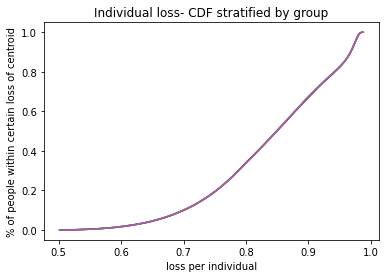

c  {0: (4.472102888143022, 3.7520208841859892), 1: (-9.411564866132233, -9.20042162372702), 2: (-10.927204501432678, 6.787863119232884), 3: (9.727890972708007, -3.7036951668872007), 4: (-2.1005845071013063, 8.667483088430798), 5: (-2.3295029573951873, 1.885201850654903), 6: (2.4997558630235894, 9.512166745381084), 7: (4.802556469391686, -1.4468996367703837), 8: (-7.915268021157895, -6.961375503728911), 9: (6.908630206311913, 8.02746165153549)}
weights:  [0.19999978 0.20001626 0.20001465 0.20001185 0.19995747]
Time elapsed Batch Step:  0.38124990463256836
Time elapsed Assignment Step:  2.3257672786712646
0.0005917537341332268
total:  0.5877930308128402


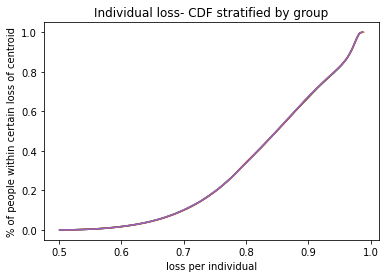

c  {0: (4.4714429231199055, 3.7516483407106103), 1: (-9.410226400912403, -9.199126838343723), 2: (-10.925119086631243, 6.787595177262167), 3: (9.72720575131483, -3.701660419535278), 4: (-2.0991715320584197, 8.666196726334913), 5: (-2.3283800767750713, 1.8864755343575985), 6: (2.498322475163939, 9.51072713034833), 7: (4.8027312265173, -1.4456690973179023), 8: (-7.916183282300391, -6.963223321211477), 9: (6.906705283491138, 8.026607415650403)}
weights:  [0.19999979 0.20001629 0.20001471 0.20001191 0.1999573 ]
Time elapsed Batch Step:  0.35581064224243164
Time elapsed Assignment Step:  2.3050220012664795
0.0005820590142889825
total:  0.5876520576323103


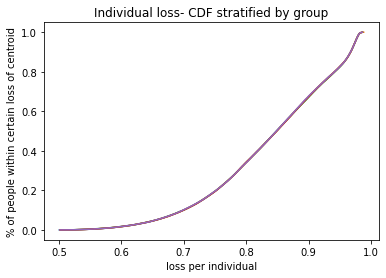

c  {0: (4.470782778498025, 3.7512757956468112), 1: (-9.408889005120239, -9.197833054052746), 2: (-10.92303411290762, 6.787327378490582), 3: (9.726520411397061, -3.699625410602464), 4: (-2.097759087603438, 8.664910904526087), 5: (-2.3272572416285104, 1.8877492959211588), 6: (2.496888871391853, 9.509287397078896), 7: (4.802906144673127, -1.4444383641183853), 8: (-7.917097650937061, -6.965069165697289), 9: (6.904780407561623, 8.025753218331865)}
weights:  [0.1999998  0.20001633 0.20001477 0.20001197 0.19995713]
Time elapsed Batch Step:  0.3481431007385254
Time elapsed Assignment Step:  2.321354627609253
0.0005920403538076657
total:  0.5875169512806394


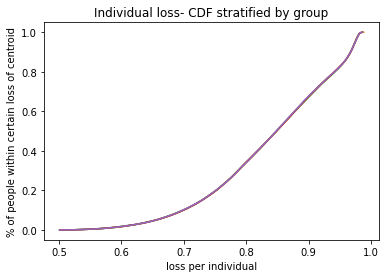

c  {0: (4.470122454229639, 3.7509032490492036), 1: (-9.407552679320508, -9.196540271669074), 2: (-10.920949588271686, 6.787059723687176), 3: (9.725834955059996, -3.69759014623402), 4: (-2.096347178311866, 8.663625626564588), 5: (-2.326134454454167, 1.8890231328341787), 6: (2.4954550553308055, 9.507847549170288), 7: (4.803081223972958, -1.443207438007214), 8: (-7.918011124275351, -6.966913030492667), 9: (6.902855584738977, 8.024899062347792)}
weights:  [0.1999998  0.20001637 0.20001483 0.20001203 0.19995697]
Time elapsed Batch Step:  0.35775113105773926
Time elapsed Assignment Step:  2.383249521255493
0.0005750768289889407
total:  0.5873737266905471


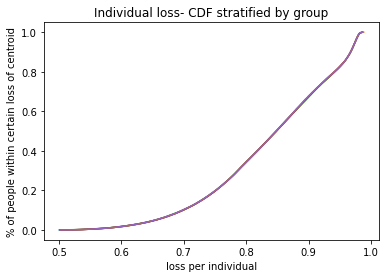

c  {0: (4.469461950267062, 3.7505307009724222), 1: (-9.406217424074768, -9.195248491990517), 2: (-10.918865520743822, 6.786792213620294), 3: (9.725149384420783, -3.6955546326047717), 4: (-2.094935808761906, 8.66234089601303), 5: (-2.3250117177568903, 1.8902970425765775), 6: (2.494021030619543, 9.50640759023416), 7: (4.803256464530435, -1.441976319822086), 8: (-7.9189236995143135, -6.968754908977138), 9: (6.900930821257393, 8.024044950475995)}
weights:  [0.19999981 0.20001641 0.20001489 0.2000121  0.1999568 ]
Time elapsed Batch Step:  0.350736141204834
Time elapsed Assignment Step:  2.3012185096740723
0.0005812165171147354
total:  0.5872373990032985


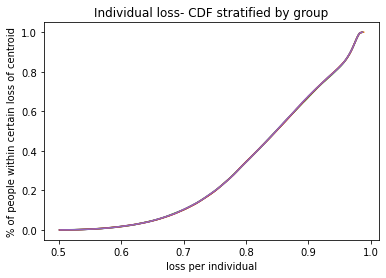

c  {0: (4.468801266562665, 3.750158151471125), 1: (-9.404883239942869, -9.193957715798463), 2: (-10.91678191835464, 6.786524849057377), 3: (9.724463701608464, -3.693518875919172), 4: (-2.0935249835343885, 8.66105671643641), 5: (-2.323889034047688, 1.8915710226195876), 6: (2.4925868009120826, 9.504967523896342), 7: (4.803431866459049, -1.4407450104030168), 8: (-7.919835373844157, -6.970594794602319), 9: (6.899006123369619, 8.023190885504219)}
weights:  [0.19999982 0.20001644 0.20001495 0.20001216 0.19995663]
Time elapsed Batch Step:  0.3805234432220459
Time elapsed Assignment Step:  2.3252758979797363
0.0005960092341862344
total:  0.5871036338231833


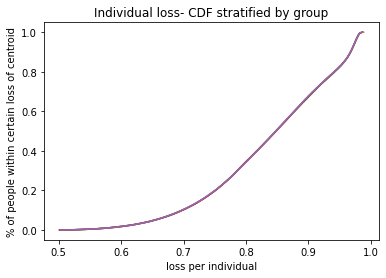

c  {0: (4.468140403068874, 3.7497856005999926), 1: (-9.403550127484415, -9.192667943858675), 2: (-10.914698789144692, 6.786257630764747), 3: (9.723777908764012, -3.691482882411358), 4: (-2.0921147072126955, 8.659773091402142), 5: (-2.3227664058436925, 1.8928450704257413), 6: (2.4911523698777103, 9.503527353796866), 7: (4.803607429872145, -1.4395135105923402), 8: (-7.920746144445852, -6.972432680890792), 9: (6.897081497346922, 8.02233687023019)}
weights:  [0.19999982 0.20001648 0.200015   0.20001222 0.19995647]
Time elapsed Batch Step:  0.348006010055542
Time elapsed Assignment Step:  2.353884220123291
0.0005830684488703497
total:  0.586961515383751


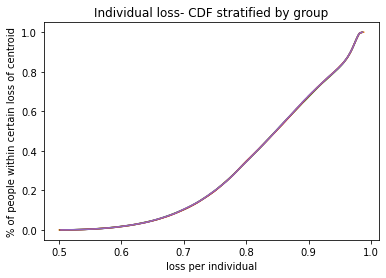

c  {0: (4.467479359738173, 3.749413048413729), 1: (-9.402218087260165, -9.191379176922135), 2: (-10.91261614116413, 6.785990559507379), 3: (9.723092008040371, -3.689446658345213), 4: (-2.090704984382689, 8.65849002448009), 5: (-2.321643835668131, 1.8941191834488584), 6: (2.4897177412009746, 9.502087083589977), 7: (4.803783154882922, -1.4382818212347102), 8: (-7.921656008490789, -6.974268561434978), 9: (6.895156949479051, 8.021482907461653)}
weights:  [0.19999983 0.20001652 0.20001506 0.20001229 0.1999563 ]
Time elapsed Batch Step:  0.37784385681152344
Time elapsed Assignment Step:  2.467411756515503
0.0005783585306096128
total:  0.5868218340558159


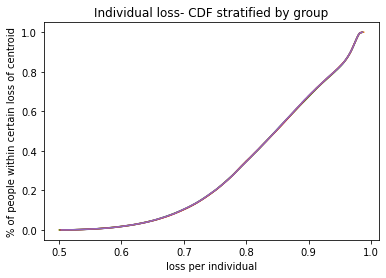

c  {0: (4.4668181365230994, 3.7490404949670615), 1: (-9.40088711983339, -9.19009141572592), 2: (-10.910533982472348, 6.785723636048665), 3: (9.722406001602494, -3.687410210014424), 4: (-2.089295819632636, 8.657207519242586), 5: (-2.3205213260502924, 1.8953933591340346), 6: (2.4882829185816817, 9.500646716944166), 7: (4.803959041604432, -1.4370499431771013), 8: (-7.922564963140489, -6.976102429896021), 9: (6.893232486074205, 8.020629000016426)}
weights:  [0.19999984 0.20001655 0.20001512 0.20001236 0.19995613]
Time elapsed Batch Step:  0.40323519706726074
Time elapsed Assignment Step:  2.4087586402893066
0.0005657157988607775
total:  0.5866797418099806


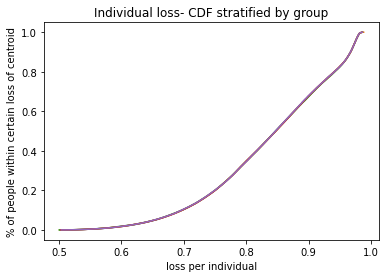

c  {0: (4.46615673337625, 3.74866794031474), 1: (-9.399557225771163, -9.188804660994107), 2: (-10.9084523211376, 6.78545686115017), 3: (9.721719891627382, -3.685373543742542), 4: (-2.087887217553138, 8.655925579264462), 5: (-2.3193988795254934, 1.8966675949176288), 6: (2.4868479057348885, 9.499206257542182), 7: (4.804135090149585, -1.4358178772688102), 8: (-7.923473005546363, -6.97793428000268), 9: (6.891308113458998, 8.019775150722431)}
weights:  [0.19999984 0.20001659 0.20001518 0.20001242 0.19995596]
Time elapsed Batch Step:  0.3654935359954834
Time elapsed Assignment Step:  2.298278331756592
0.0005745010677216111
total:  0.5865440475320766


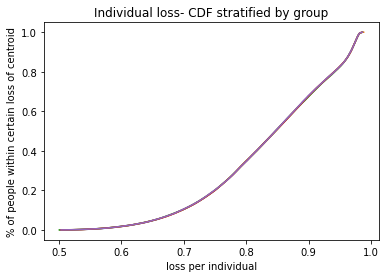

c  {0: (4.465495150250279, 3.748295384511537), 1: (-9.3982284056456, -9.187518913438707), 2: (-10.906371165236564, 6.785190235571375), 3: (9.721033680304126, -3.683336665883039), 4: (-2.086479182737057, 8.654644208123065), 5: (-2.3182764986350453, 1.8979418882272518), 6: (2.485412706390894, 9.49776570908106), 7: (4.804311300631149, -1.4345856243614563), 8: (-7.924380132849525, -6.979764105550228), 9: (6.889383837978423, 8.018921362417755)}
weights:  [0.19999985 0.20001663 0.20001524 0.20001249 0.19995579]
Time elapsed Batch Step:  0.3652465343475342
Time elapsed Assignment Step:  2.316072702407837
0.000576663841656444
total:  0.5864063369480934


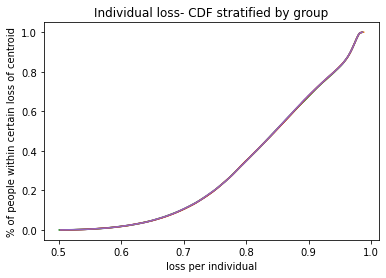

c  {0: (4.464833387097896, 3.7479228276122485), 1: (-9.396900660035046, -9.186234173760615), 2: (-10.904290522853879, 6.784923760069423), 3: (9.720347369833942, -3.681299582819366), 4: (-2.085071719779442, 8.653363409398272), 5: (-2.3171541859262184, 1.899216236481754), 6: (2.483977324295229, 9.496325075272138), 7: (4.804487673161749, -1.433353185308983), 8: (-7.9252863421806445, -6.981591900399365), 9: (6.887459665995817, 8.018067637950681)}
weights:  [0.19999985 0.20001666 0.2000153  0.20001255 0.19995563]
Time elapsed Batch Step:  0.3484015464782715
Time elapsed Assignment Step:  2.328011989593506
0.0005838800050332882
total:  0.5862701130171376


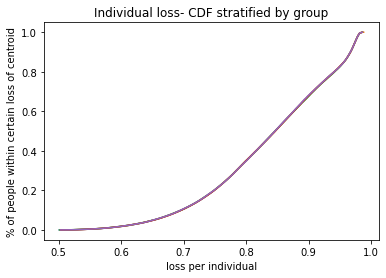

c  {0: (4.464171443871868, 3.747550269671693), 1: (-9.39557398952519, -9.184950442650585), 2: (-10.902210402081653, 6.784657435398856), 3: (9.719660962430206, -3.679262300965011), 4: (-2.0836648332774588, 8.652083186672503), 5: (-2.3160319439522072, 1.9004906370912145), 6: (2.482541763208646, 9.49488435984108), 7: (4.804664207853875, -1.4321205609676577), 8: (-7.926191630659848, -6.9834176584751395), 9: (6.885535603892828, 8.017213980179742)}
weights:  [0.19999986 0.2000167  0.20001536 0.20001262 0.19995546]
Time elapsed Batch Step:  0.35954952239990234
Time elapsed Assignment Step:  2.318897008895874
0.0005892168934109598
total:  0.5861332965079956


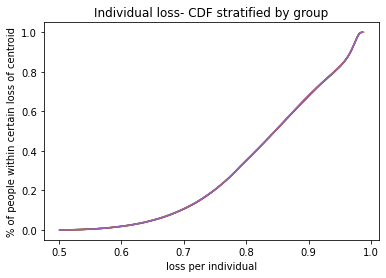

c  {0: (4.463509320525021, 3.747177710744712), 1: (-9.39424839471014, -9.183667720790206), 2: (-10.900130811018924, 6.784391262311351), 3: (9.7189744603185, -3.677224826763555), 4: (-2.0822585278303145, 8.650803543530724), 5: (-2.3149097752720946, 1.9017650874569296), 6: (2.481106026907105, 9.493443566527898), 7: (4.804840904819877, -1.4308877521960737), 8: (-7.927095995396669, -6.9852413737658985), 9: (6.883611658069378, 8.016360391973764)}
weights:  [0.19999987 0.20001673 0.20001542 0.20001269 0.19995529]
Time elapsed Batch Step:  0.34134483337402344
Time elapsed Assignment Step:  2.300140619277954
0.000591543367561953
total:  0.5859955485880568


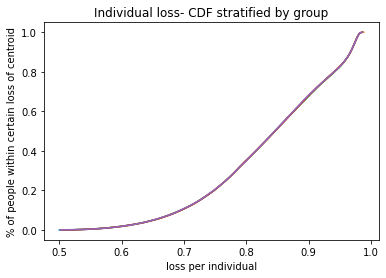

c  {0: (4.462847017010238, 3.7468051508861704), 1: (-9.392923876193423, -9.182386008852887), 2: (-10.898051757771077, 6.784125241555461), 3: (9.718287865736647, -3.675187166688729), 4: (-2.080852808039186, 8.649524483560457), 5: (-2.313787682450813, 1.903039584971402), 6: (2.4796701191817614, 9.492002699086965), 7: (4.8050177641719705, -1.4296547598551494), 8: (-7.927999433490029, -6.987063040322238), 9: (6.881687834943628, 8.015506876211914)}
weights:  [0.19999987 0.20001676 0.20001548 0.20001275 0.19995513]
Time elapsed Batch Step:  0.35654664039611816
Time elapsed Assignment Step:  2.333003044128418
0.0006024615556217139
total:  0.5858603520683345


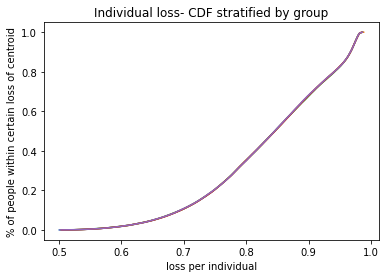

c  {0: (4.46218453328046, 3.7464325901509543), 1: (-9.391600434588943, -9.181105307504856), 2: (-10.895973250449241, 6.7838593738763615), 3: (9.717601180934743, -3.6731493272444684), 4: (-2.0794476785071456, 8.648246010351771), 5: (-2.312665668059107, 1.9043141270183295), 6: (2.4782340438389485, 9.490561761287049), 7: (4.805194786022235, -1.4284215848081305), 8: (-7.928901942028268, -6.988882652255985), 9: (6.879764140951946, 8.014653435783744)}
weights:  [0.19999988 0.2000168  0.20001554 0.20001282 0.19995496]
Time elapsed Batch Step:  0.34728240966796875
Time elapsed Assignment Step:  2.452378273010254
0.000617597051837615
total:  0.5857263952287249


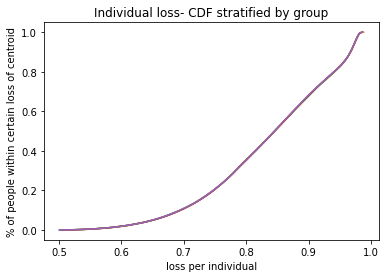

c  {0: (4.461521869288688, 3.7460600285939734), 1: (-9.390278070521871, -9.179825617406136), 2: (-10.893895297169628, 6.7835936600155975), 3: (9.716914408175201, -3.6711113149649712), 4: (-2.078043143839089, 8.64696812749728), 5: (-2.3115437346734966, 1.9055887109725953), 6: (2.4767978047001606, 9.489120756911316), 7: (4.8053719704826205, -1.4271882279205892), 8: (-7.9298035180892095, -6.990700203739189), 9: (6.877840582548865, 8.013800073589236)}
weights:  [0.19999989 0.20001683 0.2000156  0.20001289 0.1999548 ]
Time elapsed Batch Step:  0.4073646068572998
Time elapsed Assignment Step:  2.3811216354370117
0.000623497742339052
total:  0.5855896435715442


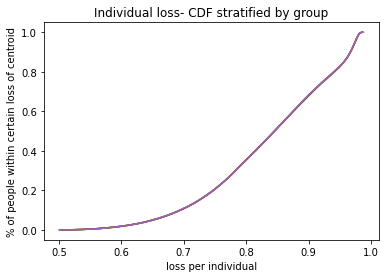

c  {0: (4.46085902498798, 3.74568746627016), 1: (-9.388956784629483, -9.178546939211543), 2: (-10.891817906052838, 6.783328100710847), 3: (9.716227549732789, -3.669073136414751), 4: (-2.0766392086416596, 8.64569083859213), 5: (-2.3104218848762352, 1.9068633342002568), 6: (2.4753614056020345, 9.487679689757359), 7: (4.805549317664946, -1.4259546900604254), 8: (-7.930704158740262, -6.992515689003146), 9: (6.875917166207057, 8.012946792538854)}
weights:  [0.19999989 0.20001686 0.20001566 0.20001295 0.19995463]
Time elapsed Batch Step:  0.3671135902404785
Time elapsed Assignment Step:  2.3506698608398438
0.0006215387580467135
total:  0.5854505104949834


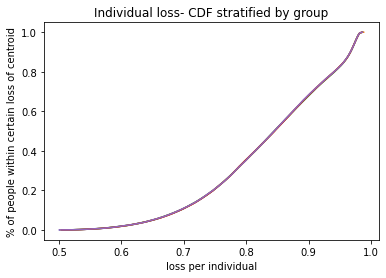

c  {0: (4.460196000331451, 3.7453149032344695), 1: (-9.38763657756195, -9.177269273571657), 2: (-10.889741085223129, 6.783062696695699), 3: (9.71554060789466, -3.667034798188692), 4: (-2.0752358775231743, 8.644414147233988), 5: (-2.309300121255271, 1.9081379940585361), 6: (2.473924850396329, 9.486238563637219), 7: (4.8057268276809015, -1.4247209720978673), 8: (-7.9316038610385515, -6.994329102337427), 9: (6.87399389841729, 8.012093595553583)}
weights:  [0.1999999  0.20001689 0.20001572 0.20001302 0.19995447]
Time elapsed Batch Step:  0.34827542304992676
Time elapsed Assignment Step:  2.315633773803711
0.0006210226934371121
total:  0.5853117870213519


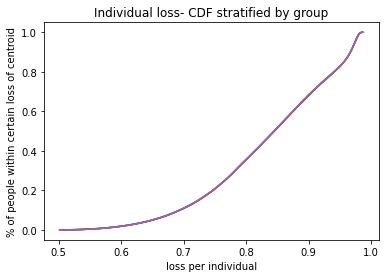

c  {0: (4.459532795272279, 3.744942339541879), 1: (-9.386317449983068, -9.175992621133785), 2: (-10.887664842807649, 6.782797448699443), 3: (9.714853584960396, -3.664996306912103), 4: (-2.073833155093548, 8.643138057023018), 5: (-2.308178446404205, 1.9094126878958102), 6: (2.472488142949902, 9.484797382377398), 7: (4.805904500642052, -1.4234870749054709), 8: (-7.932502622031092, -6.996140438088941), 9: (6.872070785688396, 8.011240485564985)}
weights:  [0.19999991 0.20001692 0.20001578 0.20001309 0.19995431]
Time elapsed Batch Step:  0.3470470905303955
Time elapsed Assignment Step:  2.40132212638855
0.0006138152361928606
total:  0.5851710339411199


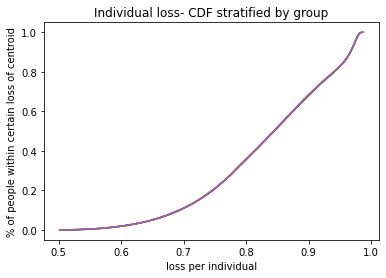

c  {0: (4.458869409763699, 3.7445697752473888), 1: (-9.384999402570935, -9.174716982542925), 2: (-10.88558918693562, 6.78253235744689), 3: (9.71416648324204, -3.6629576692407704), 4: (-2.0724310459642172, 8.641862571561857), 5: (-2.307056862922249, 1.9106874130516014), 6: (2.4710512871446864, 9.483356149818878), 7: (4.806082336659839, -1.4222529993581208), 8: (-7.933400438754984, -6.997949690661014), 9: (6.870147834547235, 8.010387465515237)}
weights:  [0.19999992 0.20001695 0.20001583 0.20001315 0.19995414]
Time elapsed Batch Step:  0.3459763526916504
Time elapsed Assignment Step:  2.3016018867492676
0.0006061253699611857
total:  0.5850301143993015


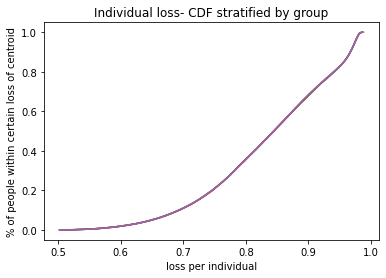

c  {0: (4.458205843759006, 3.7441972104060213), 1: (-9.38368243601859, -9.173442358442694), 2: (-10.883514125737504, 6.782267423658204), 3: (9.713479305064135, -3.6609188918610114), 4: (-2.0710295547480646, 8.64058769445559), 5: (-2.3059353734141834, 1.9119621668565685), 6: (2.4696142868776656, 9.481914869817144), 7: (4.806260335845579, -1.4210187463330302), 8: (-7.93429730823764, -6.999756854512492), 9: (6.868225051538659, 8.009534538357185)}
weights:  [0.19999992 0.20001698 0.20001589 0.20001322 0.19995399]
Time elapsed Batch Step:  0.3706955909729004
Time elapsed Assignment Step:  2.361924648284912
0.0005965483830299156
total:  0.5848886084835104


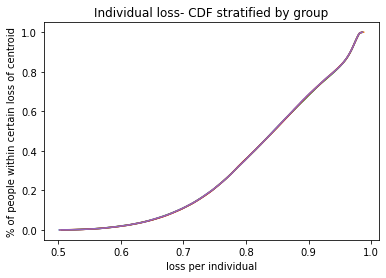

c  {0: (4.4575420972115545, 3.7438246450728214), 1: (-9.382366551034593, -9.172168749476254), 2: (-10.881439667344122, 6.782002648048778), 3: (9.712792052763758, -3.658879981489728), 4: (-2.06962868605934, 8.639313429311706), 5: (-2.304813980490313, 1.9132369466324974), 6: (2.4681771460608437, 9.480473546242196), 7: (4.806438498310472, -1.419784316709741), 8: (-7.935193227497038, -7.0015619241568645), 9: (6.866302443225479, 8.008681707054384)}
weights:  [0.19999993 0.20001701 0.20001595 0.20001329 0.19995383]
Time elapsed Batch Step:  0.353471040725708
Time elapsed Assignment Step:  2.277564525604248
0.0006029395750972721
total:  0.584751856757701


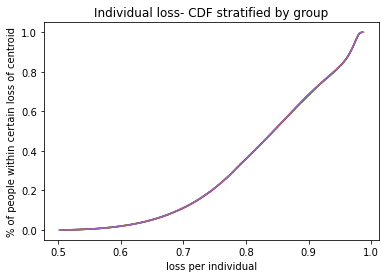

c  {0: (4.456865801506198, 3.7434566653533006), 1: (-9.381051748343562, -9.170896156287213), 2: (-10.879365819885752, 6.781738031329132), 3: (9.712104728690555, -3.6568409448744563), 4: (-2.0682284445135806, 8.638039779740069), 5: (-2.3036926867664227, 1.9145117496922932), 6: (2.466739868621217, 9.479032182978568), 7: (4.80662031352074, -1.4185517681232847), 8: (-7.936088193542004, -7.003364894161408), 9: (6.8643800161884245, 8.007828974581152)}
weights:  [0.19999994 0.20001704 0.20001601 0.20001336 0.19995367]
Time elapsed Batch Step:  0.36165475845336914
Time elapsed Assignment Step:  2.3906948566436768
0.0006337780022624973
total:  0.5846224202601291


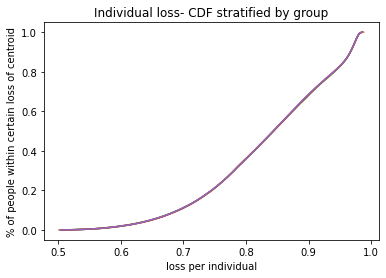

c  {0: (4.456189318885125, 3.7430886829945935), 1: (-9.37973802868667, -9.169624579520502), 2: (-10.877292591491198, 6.7814735742048535), 3: (9.711417335206782, -3.654801788793421), 4: (-2.066828834727534, 8.636766749352867), 5: (-2.3025714948637312, 1.9157865733399717), 6: (2.4653024585007435, 9.477590783925345), 7: (4.8068022944590645, -1.417319041032163), 8: (-7.93698220337251, -7.005165759146359), 9: (6.862457777026112, 8.006976343922611)}
weights:  [0.19999994 0.20001706 0.20001606 0.20001342 0.19995351]
Time elapsed Batch Step:  0.34764695167541504
Time elapsed Assignment Step:  2.3230483531951904
0.0006369057030605196
total:  0.5844846529018463


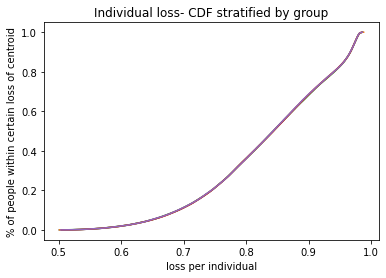

c  {0: (4.455512649300516, 3.742720698050917), 1: (-9.378425392822098, -9.168354019823232), 2: (-10.875219990286833, 6.781209277376574), 3: (9.710729874687333, -3.6527625200555844), 4: (-2.065429861319073, 8.635494341764565), 5: (-2.3014504074088458, 1.917061414870652), 6: (2.463864919656306, 9.476149352996181), 7: (4.806984441238499, -1.4160861363094976), 8: (-7.937875253980005, -7.006964513784097), 9: (6.860535732355007, 8.00612381807474)}
weights:  [0.19999995 0.20001709 0.20001612 0.20001349 0.19995335]
Time elapsed Batch Step:  0.3587522506713867
Time elapsed Assignment Step:  2.3769371509552
0.0006079924885389332
total:  0.5843372566551864


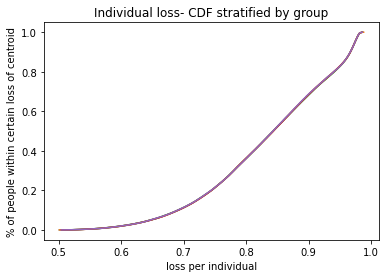

c  {0: (4.454835792704621, 3.7423527105765118), 1: (-9.377113841525441, -9.16708447784553), 2: (-10.873148024395629, 6.780945141539992), 3: (9.710042349519776, -3.6507231455006974), 4: (-2.0640315289071167, 8.634222560591846), 5: (-2.300329427033714, 1.9183362715705485), 6: (2.4624272560596796, 9.47470789411931), 7: (4.807166753971991, -1.414853054830721), 8: (-7.938767342347751, -7.008761152798361), 9: (6.858613888809391, 8.005271400044412)}
weights:  [0.19999996 0.20001711 0.20001618 0.20001356 0.19995319]
Time elapsed Batch Step:  0.3482472896575928
Time elapsed Assignment Step:  2.3467867374420166
0.0006151002692329488
total:  0.5842006510579858


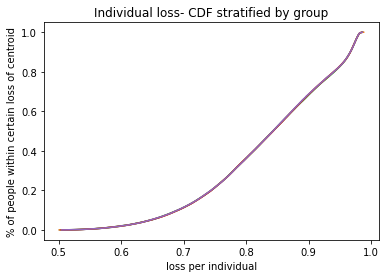

c  {0: (4.454158749049755, 3.741984720625644), 1: (-9.375803375590088, -9.165815954241344), 2: (-10.871076701936175, 6.78068116738595), 3: (9.709354762104395, -3.64868367199935), 4: (-2.062633842111544, 8.632951409453556), 5: (-2.2992085563755764, 1.9196111407169651), 6: (2.460989471697493, 9.473266411237567), 7: (4.807349232772385, -1.4136197974735765), 8: (-7.939658465451192, -7.010555670963479), 9: (6.8566922530413175, 8.004419092849455)}
weights:  [0.19999997 0.20001714 0.20001623 0.20001362 0.19995303]
Time elapsed Batch Step:  0.34575796127319336
Time elapsed Assignment Step:  2.3149373531341553
0.000619185322346727
total:  0.5840631235797361


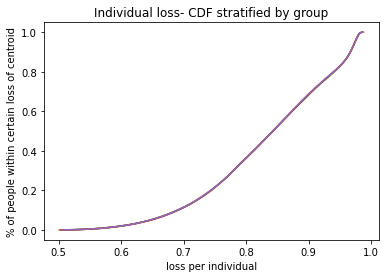

c  {0: (4.453481518288302, 3.741616728252604), 1: (-9.374493995827555, -9.164548449669233), 2: (-10.869006031021682, 6.78041735560055), 3: (9.708667114854215, -3.6466441064530213), 4: (-2.061236805553109, 8.631680891970632), 5: (-2.2980877980769168, 1.9208860195782875), 6: (2.459551570571188, 9.471824908308397), 7: (4.807531877752425, -1.412386365118117), 8: (-7.9405486202583315, -7.012348063103618), 9: (6.854770831720587, 8.003566899518681)}
weights:  [0.19999997 0.20001717 0.20001629 0.20001369 0.19995288]
Time elapsed Batch Step:  0.3457620143890381
Time elapsed Assignment Step:  2.3753724098205566
0.0006404880561541315
total:  0.5839307472195162


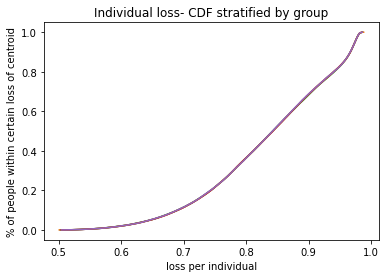

c  {0: (4.452804100372714, 3.741248733511706), 1: (-9.373185703067792, -9.163281964793116), 2: (-10.866936019758995, 6.780153706865334), 3: (9.707979410195042, -3.6446044557941266), 4: (-2.059840423853355, 8.63041101176604), 5: (-2.2969671547854116, 1.9221609054139777), 6: (2.458113556696977, 9.470383389303873), 7: (4.807714689024759, -1.4111527586467056), 8: (-7.941437803730129, -7.014138324092058), 9: (6.852849631534701, 8.002714823091946)}
weights:  [0.19999998 0.20001719 0.20001635 0.20001376 0.19995272]
Time elapsed Batch Step:  0.34906482696533203
Time elapsed Assignment Step:  2.3308513164520264
0.0006338043610222277
total:  0.5837899607762567


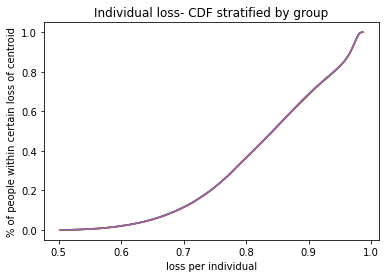

c  {0: (4.452126495255511, 3.74088073645729), 1: (-9.371878498159449, -9.162016500283007), 2: (-10.864866676247608, 6.779890221857516), 3: (9.707291650565493, -3.642564726986069), 4: (-2.058444701634522, 8.629141772464685), 5: (-2.29584662915388, 1.9234357954745678), 6: (2.456675434105799, 9.468941858210705), 7: (4.807897666701938, -1.4099189789440147), 8: (-7.942326012820909, -7.015926448850486), 9: (6.85092865918883, 8.001862866620192)}
weights:  [0.19999999 0.20001722 0.20001641 0.20001382 0.19995256]
Time elapsed Batch Step:  0.35797929763793945
Time elapsed Assignment Step:  2.334322690963745
0.0006241585786231907
total:  0.5836482724230713


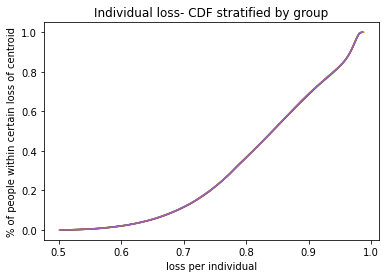

c  {0: (4.451448702889281, 3.740512737143719), 1: (-9.370572381970117, -9.160752056815719), 2: (-10.86279800857869, 6.7796269012502774), 3: (9.70660383841703, -3.640524927023284), 4: (-2.05704964351946, 8.627873177693342), 5: (-2.2947262238402315, 1.9247106870016555), 6: (2.4552372068432735, 9.46750031903026), 7: (4.808080810896423, -1.4086850268970246), 8: (-7.943213244478784, -7.0177124323483), 9: (6.849007921405778, 8.001011033165488)}
weights:  [0.2        0.20001724 0.20001646 0.20001389 0.1999524 ]
Time elapsed Batch Step:  0.4172096252441406
Time elapsed Assignment Step:  2.352358818054199
0.0006375801712451556
total:  0.5835134923132194


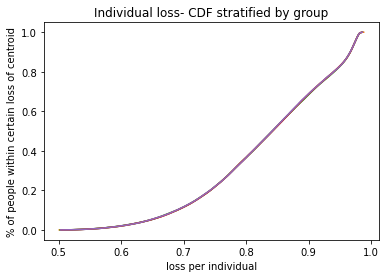

c  {0: (4.4507707232266815, 3.7401447356253805), 1: (-9.369267355386539, -9.159488635075538), 2: (-10.860730024834133, 6.779363745713114), 3: (9.705915976213994, -3.6384850629312906), 4: (-2.0556552541315334, 8.62660523108056), 5: (-2.2936059415074115, 1.925985577227899), 6: (2.45379887896965, 9.466058775778563), 7: (4.808264121720586, -1.4074509033950238), 8: (-7.9440994956460855, -7.019496269601942), 9: (6.84708742492594, 8.000159325801084)}
weights:  [0.20000001 0.20001727 0.20001652 0.20001396 0.19995224]
Time elapsed Batch Step:  0.3568878173828125
Time elapsed Assignment Step:  2.2991020679473877
0.0006314534352831469
total:  0.5833728799126965


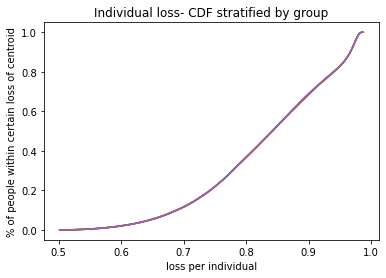

c  {0: (4.450092556220439, 3.7397767319566877), 1: (-9.367963419314794, -9.15822623575488), 2: (-10.858662733085637, 6.779100755912257), 3: (9.705228066433637, -3.636445141766736), 4: (-2.0542615380945266, 8.625337936256573), 5: (-2.292485784823349, 1.9272604633770132), 6: (2.452360454559756, 9.464617232486322), 7: (4.808437912793904, -1.4062215618971237), 8: (-7.944984763259812, -7.021277955674242), 9: (6.845167176507271, 7.999307747611448)}
weights:  [0.20000001 0.20001729 0.20001658 0.20001403 0.19995209]
Time elapsed Batch Step:  0.3626582622528076
Time elapsed Assignment Step:  2.3190786838531494
0.0006069462774220824
total:  0.5832267428048983


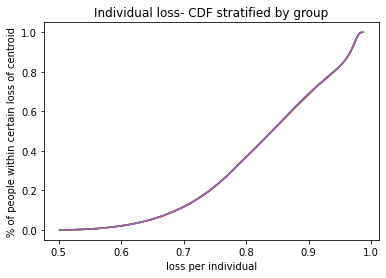

c  {0: (4.449414201823349, 3.7394087261920763), 1: (-9.366660574680452, -9.156964859554902), 2: (-10.85659614139382, 6.77883793251114), 3: (9.704540111566157, -3.6344051706174425), 4: (-2.052868500032548, 8.624071296853195), 5: (-2.2913657564609013, 1.9285353426637653), 6: (2.4509219377029448, 9.463175693198927), 7: (4.808611866454634, -1.4049920557868683), 8: (-7.945869044252075, -7.0230574856737835), 9: (6.8432471829252455, 7.998456301692317)}
weights:  [0.20000002 0.20001731 0.20001663 0.2000141  0.19995193]
Time elapsed Batch Step:  0.358898401260376
Time elapsed Assignment Step:  2.329890489578247
0.0006413274928941393
total:  0.5830982636798302


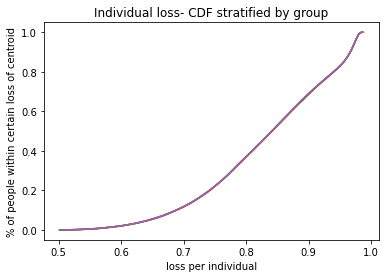

c  {0: (4.448735659988277, 3.7390407183860073), 1: (-9.365358822428709, -9.155704507186114), 2: (-10.85453025780738, 6.778575276170942), 3: (9.70385211411472, -3.6323651566024546), 4: (-2.0514761445699286, 8.62280531650372), 5: (-2.2902458590977965, 1.9298102122939724), 6: (2.449483332503035, 9.461734161976462), 7: (4.808785982816321, -1.4037623859541668), 8: (-7.946752335550566, -7.0248348547542765), 9: (6.84132745097282, 7.9976049911507365)}
weights:  [0.20000003 0.20001734 0.20001669 0.20001417 0.19995178]
Time elapsed Batch Step:  0.35300159454345703
Time elapsed Assignment Step:  2.303097724914551
0.0006400516746556395
total:  0.5829590793320967


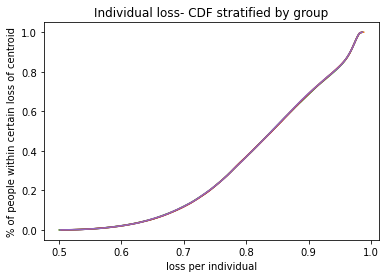

c  {0: (4.448056930668156, 3.7386727085929654), 1: (-9.364058163524497, -9.154445179368931), 2: (-10.852465090362305, 6.778312787551183), 3: (9.703164076595508, -3.6303251068720845), 4: (-2.0500844763311217, 8.621539998842813), 5: (-2.289126095416578, 1.931085069464499), 6: (2.4480446430782554, 9.460292642893718), 7: (4.808960261992439, -1.4025325532911825), 8: (-7.947634634079019, -7.026610058113957), 9: (6.839407987460394, 7.996753819105107)}
weights:  [0.20000004 0.20001736 0.20001674 0.20001423 0.19995162]
Time elapsed Batch Step:  0.35070013999938965
Time elapsed Assignment Step:  2.2816686630249023
0.0006141450534647985
total:  0.582812498250478


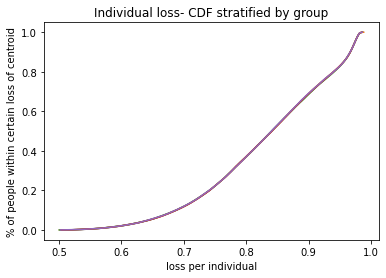

c  {0: (4.447378013815993, 3.7383046968674596), 1: (-9.362758598952574, -9.153186876834235), 2: (-10.85040064708116, 6.778050467310375), 3: (9.70247600153773, -3.6282850286079555), 4: (-2.0486934999405975, 8.620275347506388), 5: (-2.288006468104546, 1.9323599113632544), 6: (2.446605873561179, 9.458851140040196), 7: (4.8091347040963965, -1.401302558692331), 8: (-7.948515936757685, -7.028383090994994), 9: (6.837488799215777, 7.995902788685228)}
weights:  [0.20000005 0.20001739 0.2000168  0.2000143  0.19995147]
Time elapsed Batch Step:  0.3519108295440674
Time elapsed Assignment Step:  2.3145487308502197
0.0006136493517981956
total:  0.5826735341787822


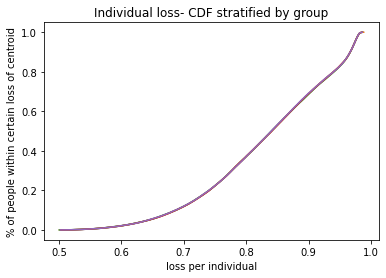

c  {0: (4.446698909384862, 3.737936683264023), 1: (-9.361460129717596, -9.151929600323879), 2: (-10.848336935972426, 6.777788316106731), 3: (9.701787891483674, -3.6262449290230494), 4: (-2.0473032200227363, 8.619011366131488), 5: (-2.286886979853697, 1.9336347351691923), 6: (2.445167028098659, 9.457409657520117), 7: (4.809309309241536, -1.4000724030542788), 8: (-7.949396240503804, -7.030153948682909), 9: (6.835569893084144, 7.99505190303234)}
weights:  [0.20000005 0.20001741 0.20001686 0.20001436 0.19995132]
Time elapsed Batch Step:  0.3514721393585205
Time elapsed Assignment Step:  2.307581901550293
0.0006079308835318376
total:  0.5825329969917841


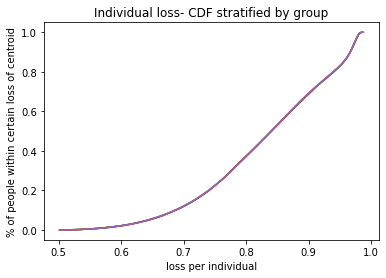

c  {0: (4.446019617327909, 3.737568667837213), 1: (-9.360162756844163, -9.150673350591186), 2: (-10.846273965029921, 6.777526334598931), 3: (9.701099748988717, -3.624204815361748), 4: (-2.0459136412017176, 8.617748058356161), 5: (-2.285767633360665, 1.9349095380523096), 6: (2.443728110851762, 9.455968199452428), 7: (4.809484077541142, -1.3988420872759428), 8: (-7.950275542232089, -7.031922626506021), 9: (6.833651275928, 7.994201165299164)}
weights:  [0.20000006 0.20001743 0.20001691 0.20001443 0.19995117]
Time elapsed Batch Step:  0.3368239402770996
Time elapsed Assignment Step:  2.286914587020874
0.0006090118923359755
total:  0.582394493857749


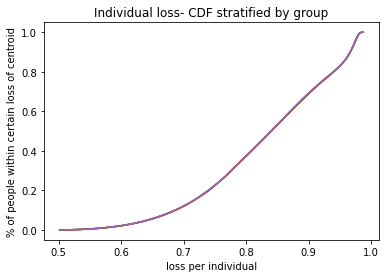

c  {0: (4.445340137598352, 3.7372006506416113), 1: (-9.358866481376863, -9.14941812840142), 2: (-10.844211742232304, 6.777264523446921), 3: (9.70041157662137, -3.6221646948998787), 4: (-2.0445247681014087, 8.616485427819322), 5: (-2.284648431326661, 1.9361843171736466), 6: (2.4422891259956963, 9.454526769970803), 7: (4.809659009108439, -1.397611612258488), 8: (-7.951153838855208, -7.033689119834884), 9: (6.83173295462714, 7.993350578649951)}
weights:  [0.20000006 0.20001746 0.20001697 0.2000145  0.19995102]
Time elapsed Batch Step:  0.34879398345947266
Time elapsed Assignment Step:  2.3967158794403076
0.0006157357927988327
total:  0.5822576787492209


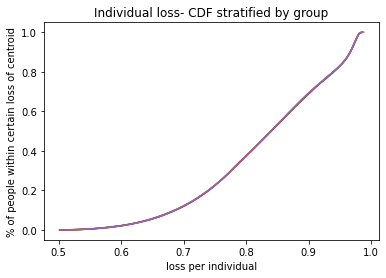

c  {0: (4.444660470149477, 3.7368326317318226), 1: (-9.35757130438028, -9.148163934532223), 2: (-10.842150275542673, 6.777002883312772), 3: (9.699723376963297, -3.620124574944757), 4: (-2.0431366053452473, 8.615223478160614), 5: (-2.2835293764574067, 1.9374590696852871), 6: (2.4408500777197366, 9.453085373223649), 7: (4.809834104056602, -1.396380978905326), 8: (-7.9520311272842665, -7.035453424081756), 9: (6.829814936078609, 7.9925001462605145)}
weights:  [0.20000007 0.20001748 0.20001703 0.20001456 0.19995087]
Time elapsed Batch Step:  0.3685879707336426
Time elapsed Assignment Step:  2.3170440196990967
0.000611024720312825
total:  0.5821174301901552


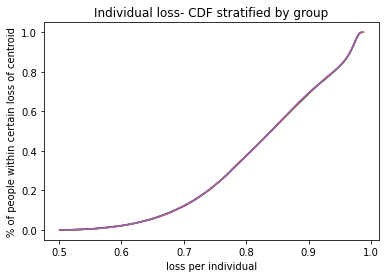

c  {0: (4.443980614934645, 3.7364646111624764), 1: (-9.356277226939003, -9.146910769774037), 2: (-10.840089572908258, 6.77674141486156), 3: (9.699035152609351, -3.6180844628352284), 4: (-2.041749157556123, 8.613962213020262), 5: (-2.2824104714630757, 1.938733792730361), 6: (2.4394109702271503, 9.451644013374109), 7: (4.810009362498754, -1.395150188122113), 8: (-7.952907404429292, -7.037215534700067), 9: (6.827897227196666, 7.991649871318279)}
weights:  [0.20000007 0.2000175  0.20001708 0.20001463 0.19995072]
Time elapsed Batch Step:  0.34026646614074707
Time elapsed Assignment Step:  2.3240232467651367
0.0006220997989857535
total:  0.5819819165980097


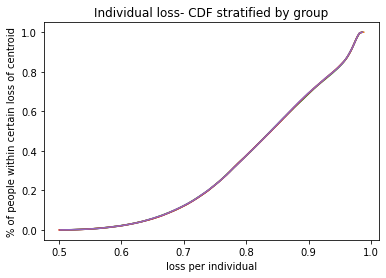

c  {0: (4.443300571907286, 3.736096588988226), 1: (-9.354984250157619, -9.145658634930507), 2: (-10.838029642260206, 6.776480118762283), 3: (9.6983469061676, -3.6160443659417125), 4: (-2.0403624293562554, 8.612701636038926), 5: (-2.281291719058226, 1.940008483443045), 6: (2.437971807735114, 9.450202694600062), 7: (4.81018478454797, -1.3939192408167485), 8: (-7.953782667199719, -7.038975447183904), 9: (6.825979834912737, 7.9907997570223115)}
weights:  [0.20000007 0.20001753 0.20001714 0.20001469 0.19995057]
Time elapsed Batch Step:  0.3426179885864258
Time elapsed Assignment Step:  2.3599588871002197
0.0006086795779587373
total:  0.581839053188912


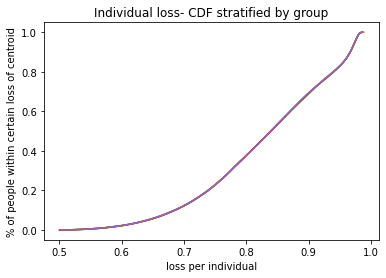

c  {0: (4.442620341020902, 3.7357285652637486), 1: (-9.353692375160685, -9.144407530818851), 2: (-10.835970491513471, 6.776218995688804), 3: (9.697658640259354, -3.6140042916662427), 4: (-2.038976425367067, 8.611441750857539), 5: (-2.2801731219617336, 1.9412831389485672), 6: (2.4365325944746323, 9.448761421094122), 7: (4.810360370317287, -1.3926881378993718), 8: (-7.954656912504873, -7.040733157067501), 9: (6.824062766175381, 7.989949806583369)}
weights:  [0.20000007 0.20001755 0.2000172  0.20001476 0.19995042]
Time elapsed Batch Step:  0.3590240478515625
Time elapsed Assignment Step:  2.296095132827759
0.000637730626489974
total:  0.5817089312234491


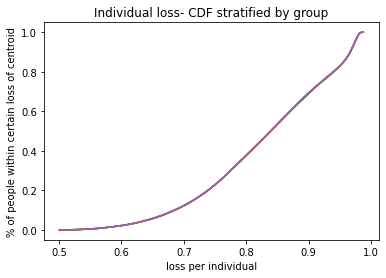

c  {0: (4.441939922229069, 3.735360540043745), 1: (-9.352401603092694, -9.143157458270212), 2: (-10.833912128566816, 6.775958046320807), 3: (9.696970357519191, -3.6119642474425095), 4: (-2.037591150209055, 8.610182561117151), 5: (-2.279054682896729, 1.942557756363209), 6: (2.435093334690451, 9.44732019706364), 7: (4.810536119919702, -1.3914568802823624), 8: (-7.9555301372544545, -7.042488659924743), 9: (6.822146027950245, 7.989100023223931)}
weights:  [0.20000008 0.20001757 0.20001725 0.20001482 0.19995028]
Time elapsed Batch Step:  0.3601553440093994
Time elapsed Assignment Step:  2.272770881652832
0.0006316379957662654
total:  0.5815682677988883


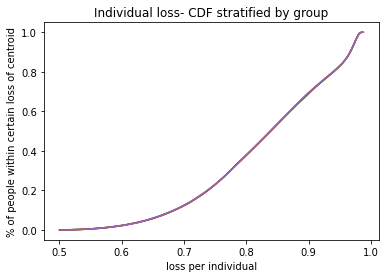

c  {0: (4.441259315485434, 3.7349925133829402), 1: (-9.351111935118034, -9.14190841812999), 2: (-10.831854561302913, 6.775697271344757), 3: (9.69628206059499, -3.6099242407358996), 4: (-2.0362066085016584, 8.608924070458754), 5: (-2.277936404590525, 1.9438323327943112), 6: (2.433654032640966, 9.445879026730694), 7: (4.8107120334681746, -1.390225468880335), 8: (-7.956402338359012, -7.044241951368678), 9: (6.820229627220022, 7.988250410178239)}
weights:  [0.20000008 0.20001759 0.20001731 0.20001489 0.19995013]
Time elapsed Batch Step:  0.3444364070892334
Time elapsed Assignment Step:  2.296344757080078
0.0006354153889560621
total:  0.581430568082786


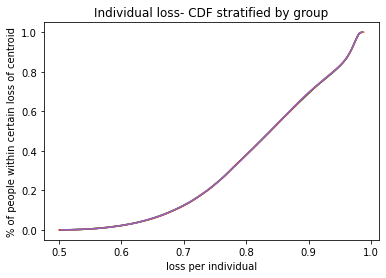

c  {0: (4.440578520743718, 3.734624485336083), 1: (-9.349823372420927, -9.14066041125816), 2: (-10.829797797588556, 6.7754366714548775), 3: (9.695593752147952, -3.607884279043537), 4: (-2.034822804863121, 8.607666282523109), 5: (-2.2768182897745515, 1.9451068653402779), 6: (2.4322146925981314, 9.444437914332093), 7: (4.810888111075639, -1.3889939046101392), 8: (-7.957273512730427, -7.045993027051033), 9: (6.818313570984413, 7.987400970692335)}
weights:  [0.20000008 0.20001762 0.20001736 0.20001496 0.19994999]
Time elapsed Batch Step:  0.357421875
Time elapsed Assignment Step:  2.3226137161254883
0.0006353301712295201
total:  0.5812917128025413


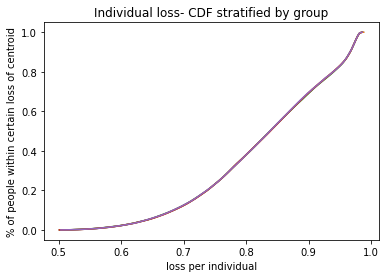

c  {0: (4.439897537957713, 3.7342564559579454), 1: (-9.348535916205368, -9.139413438529557), 2: (-10.827741845274975, 6.7751762473541035), 3: (9.694905434852625, -3.605844369894324), 4: (-2.0334397439103506, 8.606409200950571), 5: (-2.2757003411842818, 1.946381351090584), 6: (2.430775318847362, 9.442996864119365), 7: (4.8110643528549994, -1.3877621883908555), 8: (-7.958143657282382, -7.047741882661742), 9: (6.816397866260082, 7.986551708024092)}
weights:  [0.20000008 0.20001764 0.20001742 0.20001502 0.19994984]
Time elapsed Batch Step:  0.34019947052001953
Time elapsed Assignment Step:  2.3145570755004883
0.0006487142350463104
total:  0.5811569013344348


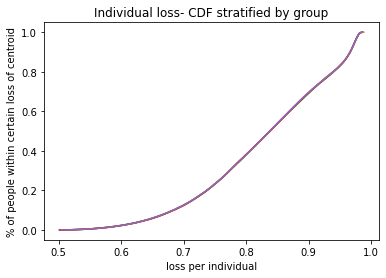

c  {0: (4.439216367081286, 3.733888425303324), 1: (-9.347249567695052, -9.138167500834147), 2: (-10.825686712198253, 6.774915999755035), 3: (9.694217111396936, -3.6038045208489784), 4: (-2.032057430258775, 8.605152829380902), 5: (-2.2745825615591633, 1.9476557871257816), 6: (2.4293359156874326, 9.441555880358747), 7: (4.811240758919141, -1.3865303211437936), 8: (-7.959012768930831, -7.049488513928484), 9: (6.81448252008061, 7.985702625443258)}
weights:  [0.20000008 0.20001766 0.20001747 0.20001509 0.1999497 ]
Time elapsed Batch Step:  0.36093926429748535
Time elapsed Assignment Step:  2.2869255542755127
0.0006548429435259129
total:  0.5810199164743817


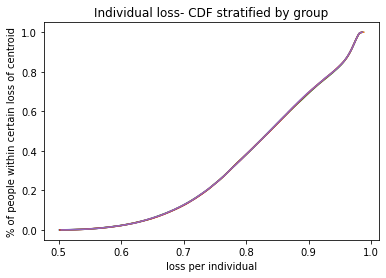

c  {0: (4.438535008068378, 3.7335203934270385), 1: (-9.345964328133286, -9.13692259907729), 2: (-10.823632406179849, 6.774655929380866), 3: (9.69352878448221, -3.6017647395000747), 4: (-2.030675868522192, 8.603897171453077), 5: (-2.2734649536425438, 1.9489301705175082), 6: (2.427896487430375, 9.440114967331182), 7: (4.811417329380929, -1.385298303792489), 8: (-7.959880844594466, -7.051232916616219), 9: (6.812567539496455, 7.984853726231479)}
weights:  [0.20000008 0.20001769 0.20001753 0.20001516 0.19994955]
Time elapsed Batch Step:  0.34890317916870117
Time elapsed Assignment Step:  2.3143014907836914
0.0006675350340790143
total:  0.5808849063700128


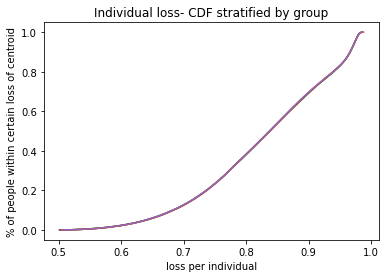

c  {0: (4.437853460873001, 3.7331523603839325), 1: (-9.344680198782914, -9.135678734179967), 2: (-10.82157893502721, 6.774396036966284), 3: (9.692840456823197, -3.5997250334720814), 4: (-2.0292950633126194, 8.602642230805092), 5: (-2.272347520181598, 1.9502044983284959), 6: (2.4264570384013693, 9.4386741293323), 7: (4.811594064353218, -1.3840661372627006), 8: (-7.960747881195172, -7.052975086526738), 9: (6.810652931574909, 7.98400501368234)}
weights:  [0.20000007 0.20001771 0.20001758 0.20001523 0.1999494 ]
Time elapsed Batch Step:  0.34601354598999023
Time elapsed Assignment Step:  2.3092169761657715
0.0006494191688876105
total:  0.5807406600828646


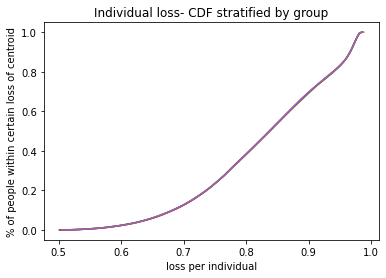

c  {0: (4.437171725449243, 3.732784326228873), 1: (-9.343397180926207, -9.134435907079006), 2: (-10.819526306534481, 6.774136323258342), 3: (9.692152131148093, -3.5976854104213998), 4: (-2.0279150192401354, 8.601388011073759), 5: (-2.2712302639272535, 1.9514787676125809), 6: (2.4250175729386334, 9.437233370672413), 7: (4.811770963948853, -1.3828338224824068), 8: (-7.961613875658485, -7.054715019498217), 9: (6.8087387034000475, 7.983156491101394)}
weights:  [0.20000007 0.20001773 0.20001764 0.2000153  0.19994926]
Time elapsed Batch Step:  0.3388676643371582
Time elapsed Assignment Step:  2.303687334060669
0.0006642277744615122
total:  0.5806062979609825


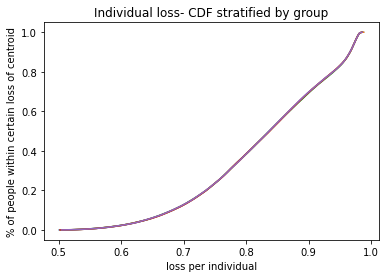

c  {0: (4.436489801751267, 3.7324162910167504), 1: (-9.34211527586477, -9.133194118727276), 2: (-10.817474528483295, 6.773876789017292), 3: (9.69146381019857, -3.595645878036401), 4: (-2.0265357409127174, 8.600134515894503), 5: (-2.270113187634112, 1.952752975414715), 6: (2.423578095393307, 9.435792695676488), 7: (4.811948028280676, -1.3816013603818031), 8: (-7.962478824914034, -7.056452711404776), 9: (6.806824862072688, 7.982308161806193)}
weights:  [0.20000007 0.20001775 0.20001769 0.20001537 0.19994911]
Time elapsed Batch Step:  0.34293127059936523
Time elapsed Assignment Step:  2.302480936050415
0.0006333122749379028
total:  0.580458226646365


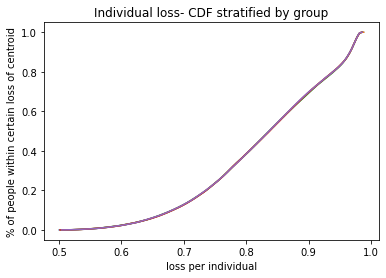

c  {0: (4.43580768973331, 3.7320482548024794), 1: (-9.340834484919437, -9.131953370093886), 2: (-10.815423608643643, 6.773617435017366), 3: (9.69077549672979, -3.593606444037465), 4: (-2.0251572329360767, 8.598881748901148), 5: (-2.268996294060375, 1.9540271187709777), 6: (2.422138610129333, 9.43435210868414), 7: (4.812125257461528, -1.3803687518932983), 8: (-7.963342725895987, -7.058188158156043), 9: (6.804911414710341, 7.981460029126316)}
weights:  [0.20000007 0.20001778 0.20001775 0.20001544 0.19994896]
Time elapsed Batch Step:  0.3693997859954834
Time elapsed Assignment Step:  2.3219985961914062
0.0006401256206977068
total:  0.5803214827825431


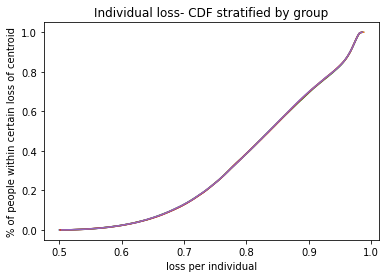

c  {0: (4.435125389349683, 3.7316802176409976), 1: (-9.339554809430151, -9.130713662164341), 2: (-10.813373554774818, 6.77335826204752), 3: (9.690087193510434, -3.591567116177015), 4: (-2.0237794999134873, 8.597629713725699), 5: (-2.267879585967763, 1.9553011947085888), 6: (2.420699121523334, 9.432911614049601), 7: (4.8123026516042575, -1.3791359979515112), 8: (-7.964205575543481, -7.059921355696724), 9: (6.802998368447168, 7.9806120964034)}
weights:  [0.20000007 0.2000178  0.20001781 0.20001551 0.19994882]
Time elapsed Batch Step:  0.35068583488464355
Time elapsed Assignment Step:  2.3284969329833984
0.0006313166452240893
total:  0.5801800628500305


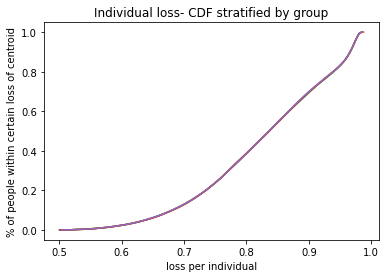

c  {0: (4.434442900554774, 3.7313121795872664), 1: (-9.338276250755856, -9.129474995940713), 2: (-10.811324374626421, 6.77309927091212), 3: (9.68939890332272, -3.589527902239557), 4: (-2.02240254644561, 8.59637841399812), 5: (-2.266763066121437, 1.9565752002459227), 6: (2.419259633964485, 9.43147121614171), 7: (4.8124802108217235, -1.3779030994932666), 8: (-7.9650673708010515, -7.061652300006175), 9: (6.801085730433926, 7.979764366991165)}
weights:  [0.20000007 0.20001782 0.20001786 0.20001558 0.19994867]
Time elapsed Batch Step:  0.36626625061035156
Time elapsed Assignment Step:  2.318794012069702
0.0006189367047075844
total:  0.5800375826657092


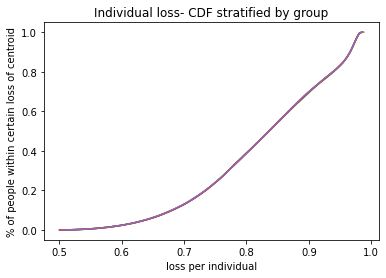

c  {0: (4.433760223303044, 3.7309441406962702), 1: (-9.33699881027437, -9.128237372441774), 2: (-10.80927607593942, 6.7728404624315734), 3: (9.688710628962424, -3.5874888100417133), 4: (-2.0210263771303127, 8.595127853346114), 5: (-2.2656467372899165, 1.9578491323925242), 6: (2.417820151854384, 9.430030919343874), 7: (4.8126579352268015, -1.3766700574575916), 8: (-7.965928108619049, -7.063380987097986), 9: (6.799173507837924, 7.9789168442554415)}
weights:  [0.20000007 0.20001784 0.20001792 0.20001565 0.19994852]
Time elapsed Batch Step:  0.3458383083343506
Time elapsed Assignment Step:  2.2942867279052734
0.0006250239744690633
total:  0.5799006549533804


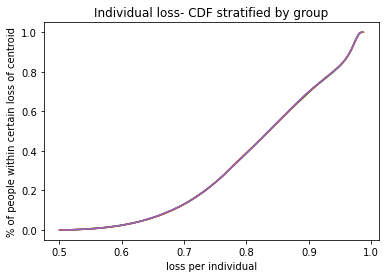

c  {0: (4.433077357549032, 3.730576101023017), 1: (-9.335722489382265, -9.127000792703127), 2: (-10.807228666447266, 6.772581837442908), 3: (9.6880223732389, -3.585449847432259), 4: (-2.0196509965624845, 8.593878035394876), 5: (-2.264530602244999, 1.9591229881491248), 6: (2.416380679606914, 9.428590728054054), 7: (4.812835824932387, -1.3754368727857118), 8: (-7.9667877859540495, -7.065107413019557), 9: (6.797261707842972, 7.978069531574193)}
weights:  [0.20000006 0.20001786 0.20001797 0.20001573 0.19994838]
Time elapsed Batch Step:  0.3367476463317871
Time elapsed Assignment Step:  2.3265554904937744
0.0006678847904658669
total:  0.5797747717151752


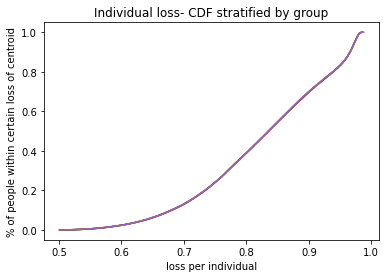

c  {0: (4.432394303247351, 3.7302080606225387), 1: (-9.334447289494738, -9.125765257777323), 2: (-10.80518215387704, 6.772323396800283), 3: (9.687334138975102, -3.583411022292159), 4: (-2.018276409333845, 8.592628963766877), 5: (-2.2634146637616746, 1.96039676450766), 6: (2.4149412216481063, 9.427150646684721), 7: (4.813013880051402, -1.374203546421047), 8: (-7.967646399769259, -7.0668315738516885), 9: (6.795350337649329, 7.977222432337543)}
weights:  [0.20000006 0.20001788 0.20001803 0.2000158  0.19994823]
Time elapsed Batch Step:  0.3464350700378418
Time elapsed Assignment Step:  2.302734613418579
0.000660030679268564
total:  0.5796336874412811


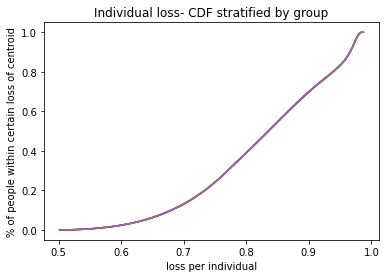

c  {0: (4.431711060352693, 3.7298400195498895), 1: (-9.333173212045475, -9.12453076873396), 2: (-10.803136545950636, 6.772065141375455), 3: (9.686645929007602, -3.5813723425346007), 4: (-2.016902620032749, 8.591380642081608), 5: (-2.262298924618043, 1.961670458451289), 6: (2.4135017824159943, 9.425710679662831), 7: (4.813192100696801, -1.3729700793092063), 8: (-7.968503947034906, -7.068553465708173), 9: (6.793439404473655, 7.97637554994779)}
weights:  [0.20000006 0.2000179  0.20001808 0.20001588 0.19994808]
Time elapsed Batch Step:  0.3513908386230469
Time elapsed Assignment Step:  2.332871198654175
0.0006406690453503172
total:  0.5794891650105343


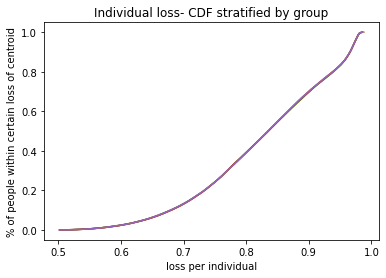

c  {0: (4.431027628819823, 3.7294719778601477), 1: (-9.331900258486522, -9.123297326659781), 2: (-10.801091850385971, 6.771807072058166), 3: (9.685957746186608, -3.57933381610503), 4: (-2.0155296332439874, 8.590133073955341), 5: (-2.261183387595227, 1.9629440669544138), 6: (2.412062366360468, 9.424270831429787), 7: (4.813370486981575, -1.3717364723979848), 8: (-7.9693604247286265, -7.070273084735386), 9: (6.791528915548955, 7.975528887819436)}
weights:  [0.20000006 0.20001792 0.20001813 0.20001595 0.19994794]
Time elapsed Batch Step:  0.3673369884490967
Time elapsed Assignment Step:  2.289750814437866
0.0006516447902369382
total:  0.5793537580950148


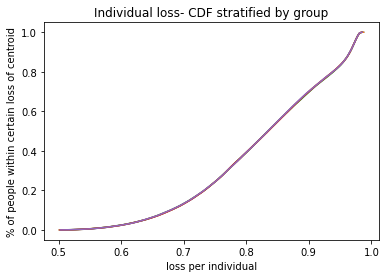

c  {0: (4.430344008603586, 3.7291039356084146), 1: (-9.330628430288145, -9.122064932658747), 2: (-10.799048074898206, 6.771549189756487), 3: (9.68526959337598, -3.5772954509811847), 4: (-2.014157453548578, 8.58888626300088), 5: (-2.2600680554772854, 1.9642175869827019), 6: (2.41062297794312, 9.422831106441397), 7: (4.813549039018758, -1.3705027266373577), 8: (-7.970215829835841, -7.071990427111886), 9: (6.78961887812453, 7.974682449379199)}
weights:  [0.20000005 0.20001794 0.20001819 0.20001603 0.19994779]
Time elapsed Batch Step:  0.37487149238586426
Time elapsed Assignment Step:  2.341900110244751
0.0006729800179722245
total:  0.5792214755788022


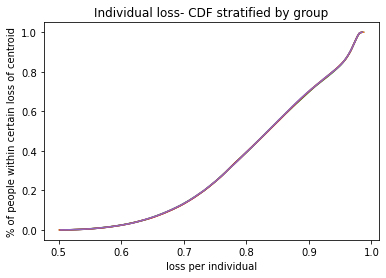

c  {0: (4.429660199658903, 3.728735892849815), 1: (-9.329357728938696, -9.12083358785211), 2: (-10.79700522720098, 6.771291495397099), 3: (9.684581473453248, -3.5752572551731308), 4: (-2.0127860855235555, 8.587640212827306), 5: (-2.2589529310511254, 1.9654910154931082), 6: (2.40918362163709, 9.421391509167831), 7: (4.813727756921432, -1.3692688429794764), 8: (-7.971070159350123, -7.073705489048013), 9: (6.7877092994659165, 7.973836238066033)}
weights:  [0.20000005 0.20001796 0.20001824 0.20001611 0.19994764]
Time elapsed Batch Step:  0.34618473052978516
Time elapsed Assignment Step:  2.3258097171783447
0.0007069221440872964
total:  0.5790929928701153


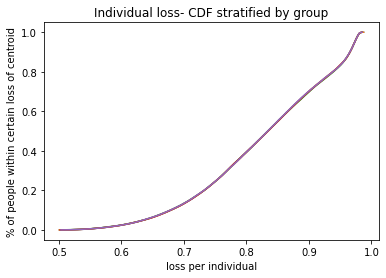

c  {0: (4.428976201940771, 3.728367849639496), 1: (-9.328088155944464, -9.119603293378466), 2: (-10.794963315007642, 6.771033989925511), 3: (9.68389338930963, -3.573219236723293), 4: (-2.011415533741756, 8.586394927039729), 5: (-2.2578380171064127, 1.9667643494338996), 6: (2.407744301926904, 9.41995204409358), 7: (4.813906640802735, -1.3680348223786627), 8: (-7.971923410273553, -7.075418266785497), 9: (6.785800186854836, 7.972990257331142)}
weights:  [0.20000004 0.20001798 0.20001829 0.20001619 0.19994749]
Time elapsed Batch Step:  0.34858226776123047
Time elapsed Assignment Step:  2.340502977371216
0.0007163736768197593
total:  0.5789571817383625


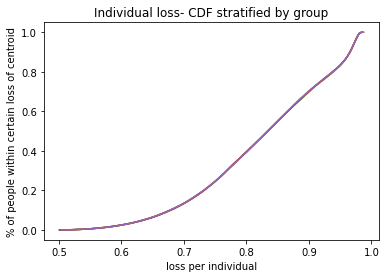

c  {0: (4.428292015404267, 3.727999806032629), 1: (-9.326819712829538, -9.11837405039381), 2: (-10.792922346032489, 6.770776674306232), 3: (9.683205343850046, -3.57118140370649), 4: (-2.010045802771592, 8.585150409239015), 5: (-2.2567233164354814, 1.96803758574468), 6: (2.4063050233083083, 9.418512715717402), 7: (4.814085690775862, -1.366800665791404), 8: (-7.97277557961707, -7.077128756597061), 9: (6.7838915475891355, 7.972144510637996)}
weights:  [0.20000004 0.200018   0.20001835 0.20001626 0.19994735]
Time elapsed Batch Step:  0.343092679977417
Time elapsed Assignment Step:  2.321928024291992
0.0007180668041022464
total:  0.5788190625294581


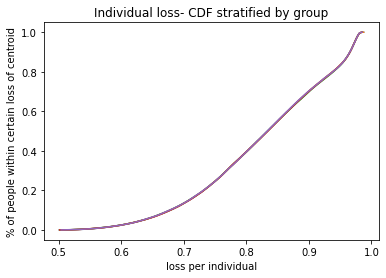

c  {0: (4.4276076400045445, 3.7276317620844077), 1: (-9.325552401135658, -9.117145860071567), 2: (-10.790882327991978, 6.770519549522882), 3: (9.682517339993133, -3.5691437642299677), 4: (-2.008676897176826, 8.583906663021537), 5: (-2.255608831833242, 1.9693107213564178), 6: (2.4048657902881008, 9.417073528552264), 7: (4.814264906954078, -1.3655663741763477), 8: (-7.973626664400811, -7.078836954786035), 9: (6.7819833889827335, 7.9712990014623415)}
weights:  [0.20000003 0.20001802 0.2000184  0.20001634 0.1999472 ]
Time elapsed Batch Step:  0.35709428787231445
Time elapsed Assignment Step:  2.372352361679077
0.0007418899343041296
total:  0.5786876021400398


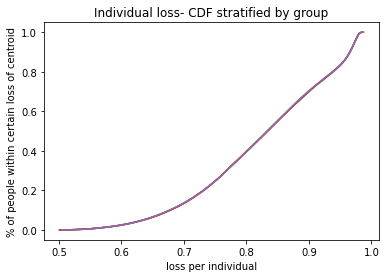

c  {0: (4.426923075696836, 3.727263717850049), 1: (-9.324286222422073, -9.115918723602624), 2: (-10.788843268605943, 6.7702626165782585), 3: (9.681829380671259, -3.5671063264334304), 4: (-2.0073088215163364, 8.5826636919789), 5: (-2.2544945660970876, 1.970583753191474), 6: (2.4034266073839556, 9.41563448712529), 7: (4.814444289450718, -1.3643319484942957), 8: (-7.974476661654436, -7.080542857685969), 9: (6.780075718365557, 7.970453733292213)}
weights:  [0.20000003 0.20001804 0.20001845 0.20001642 0.19994705]
Time elapsed Batch Step:  0.33841562271118164
Time elapsed Assignment Step:  2.31982684135437
0.0007459740744674148
total:  0.5785502412972792


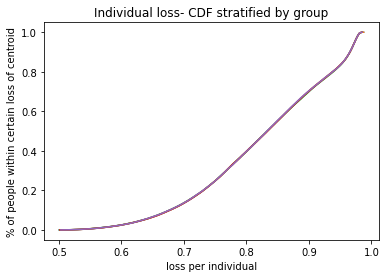

c  {0: (4.426238322436451, 3.726895673384793), 1: (-9.323021178265389, -9.114692642195353), 2: (-10.786805175598767, 6.770005876494352), 3: (9.681141468830534, -3.565069098489075), 4: (-2.0059415803438787, 8.581421499697674), 5: (-2.2533805220268013, 1.971856678163632), 6: (2.401987479124246, 9.4141955959777), 7: (4.8146238383791955, -1.3630973897081986), 8: (-7.975325568417452, -7.082246461660247), 9: (6.778168543083486, 7.9696087096279395)}
weights:  [0.20000002 0.20001806 0.20001851 0.20001651 0.1999469 ]
Time elapsed Batch Step:  0.35816287994384766
Time elapsed Assignment Step:  2.2840707302093506
0.0007758538351007038
total:  0.5784206407994278


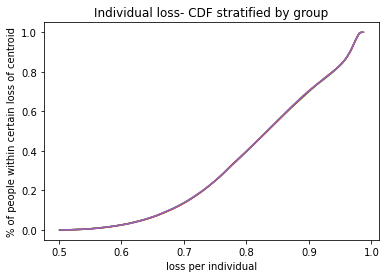

c  {0: (4.425553380178781, 3.726527628743903), 1: (-9.321757270259422, -9.113467617075617), 2: (-10.784768056700557, 6.769749330312318), 3: (9.68045360743083, -3.5630320886016227), 4: (-2.004575178207839, 8.58018008975913), 5: (-2.2522667024244596, 1.9731294931781287), 6: (2.4005484100478607, 9.412756859664741), 7: (4.814803553853011, -1.3618626987831497), 8: (-7.976173381739522, -7.0839477631017145), 9: (6.776261870498284, 7.968763933982156)}
weights:  [0.20000002 0.20001808 0.20001856 0.20001659 0.19994676]
Time elapsed Batch Step:  0.34079933166503906
Time elapsed Assignment Step:  2.3185346126556396
0.0007776688673627463
total:  0.578282643403062


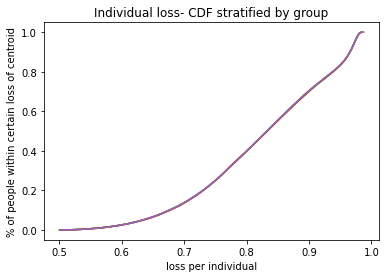

c  {0: (4.424868248879291, 3.726159583982665), 1: (-9.32049450001505, -9.112243649486778), 2: (-10.782731919648267, 6.769492979092406), 3: (9.679765799445782, -3.5609953050083503), 4: (-2.003209619650986, 8.57893946573896), 5: (-2.2511531100943367, 1.9744021951316881), 6: (2.3991094047040167, 9.411318282755616), 7: (4.814983435985754, -1.3606278766863786), 8: (-7.97702009868076, -7.085646758432293), 9: (6.774355707987546, 7.967919409879803)}
weights:  [0.20000001 0.2000181  0.20001861 0.20001667 0.19994661]
Time elapsed Batch Step:  0.3611185550689697
Time elapsed Assignment Step:  2.285557508468628
0.0007861152472049548
total:  0.5781466593715845


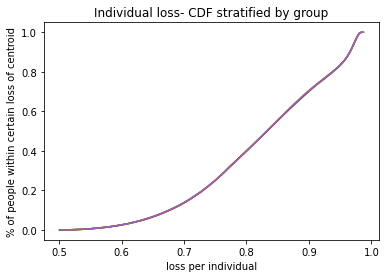

c  {0: (4.424182928493532, 3.7257915391563876), 1: (-9.319232869160055, -9.111020740689689), 2: (-10.7806967721868, 6.769236823913851), 3: (9.679078047862811, -3.5589587559791225), 4: (-2.001844909210212, 8.577699631207004), 5: (-2.250039747842806, 1.975674780912555), 6: (2.3976704676520684, 9.409879869833413), 7: (4.815163484891114, -1.3593929243872451), 8: (-7.97786571631203, -7.087343444102611), 9: (6.7724500629446265, 7.967075140858134)}
weights:  [0.2        0.20001811 0.20001867 0.20001675 0.19994646]
Time elapsed Batch Step:  0.3487546443939209
Time elapsed Assignment Step:  2.3259565830230713
0.0007792620797547611
total:  0.5780061100289386


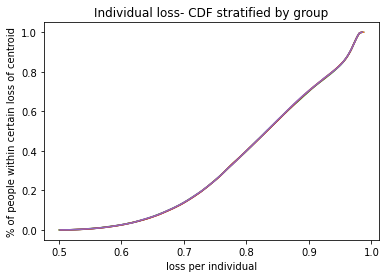

c  {0: (4.42349741897713, 3.725423494320403), 1: (-9.317972379338984, -9.109798891962686), 2: (-10.77866262207008, 6.76898086587473), 3: (9.678390355683122, -3.5569224498164242), 4: (-2.0004810514162727, 8.576460589726976), 5: (-2.248926618478243, 1.9769472474005312), 6: (2.39623160346131, 9.408441625495021), 7: (4.815343700682884, -1.358157842857232), 8: (-7.978710231715216, -7.089037816591637), 9: (6.770544942778578, 7.966231130466714)}
weights:  [0.2        0.20001813 0.20001872 0.20001684 0.19994631]
Time elapsed Batch Step:  0.3760228157043457
Time elapsed Assignment Step:  2.4404006004333496
0.00078342003371068
total:  0.5778688439618428


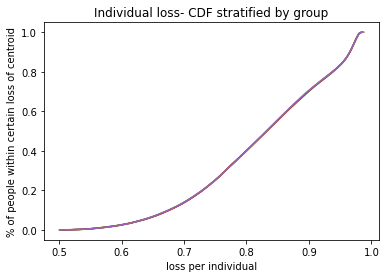

c  {0: (4.422811720285792, 3.725055449530066), 1: (-9.316713032212983, -9.108578104601568), 2: (-10.776629477062071, 6.768725106091784), 3: (9.677702725921723, -3.5548863948553904), 4: (-1.9991180507935187, 8.575222344856185), 5: (-2.2478137248109222, 1.9782195914670133), 6: (2.3947928167107775, 9.40700355435105), 7: (4.815533993480502, -1.3569175674453853), 8: (-7.979553641983504, -7.090729872406306), 9: (6.768640354914083, 7.965387382267418)}
weights:  [0.19999999 0.20001814 0.20001878 0.20001692 0.19994616]
Time elapsed Batch Step:  0.35445713996887207
Time elapsed Assignment Step:  2.432281970977783
0.0007490983546237784
total:  0.5777200616644725


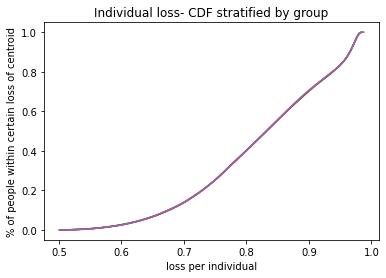

c  {0: (4.422125832375307, 3.7246874048407537), 1: (-9.31545482945965, -9.10735837991957), 2: (-10.77459734493778, 6.768469545700213), 3: (9.677015161607427, -3.5528505994638384), 4: (-1.9977559118596222, 8.573984900145259), 5: (-2.2467010696529197, 1.9794918099750318), 6: (2.3933541119890416, 9.405565661025737), 7: (4.815724457594625, -1.355677159858602), 8: (-7.98039594422163, -7.092419608081159), 9: (6.766736306791385, 7.96454389983443)}
weights:  [0.19999998 0.20001816 0.20001884 0.20001701 0.19994602]
Time elapsed Batch Step:  0.36027956008911133
Time elapsed Assignment Step:  2.3239736557006836
0.000776224105738299
total:  0.5775897408333708


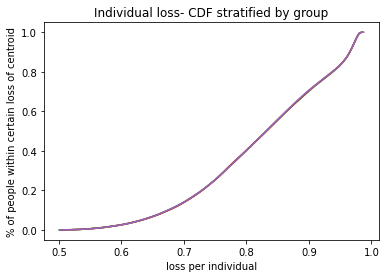

c  {0: (4.421439755201542, 3.7243193603078666), 1: (-9.314197772772888, -9.10613971924733), 2: (-10.772566233484193, 6.7682141858534415), 3: (9.676327665782864, -3.550815072042298), 4: (-1.9963946391252987, 8.572748259137867), 5: (-2.245588655818008, 1.980763899779292), 6: (2.3919154938940013, 9.404127950156855), 7: (4.815915093137754, -1.3544366210824776), 8: (-7.981237135546143, -7.094107020177984), 9: (6.764832805866221, 7.963700686754235)}
weights:  [0.19999997 0.20001817 0.20001889 0.20001709 0.19994587]
Time elapsed Batch Step:  0.3471658229827881
Time elapsed Assignment Step:  2.3562965393066406
0.0007561471849479862
total:  0.577445362770891


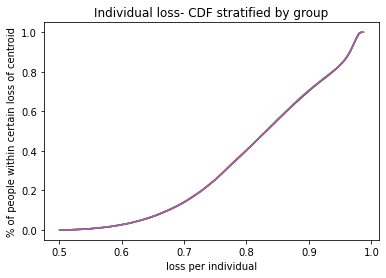

c  {0: (4.420754807917971, 3.723951762355267), 1: (-9.312941863862736, -9.104922123932862), 2: (-10.770536150501197, 6.767959027722867), 3: (9.675640241504485, -3.548779821024042), 4: (-1.9950342370940217, 8.571512425370438), 5: (-2.2444777039392756, 1.9820275592223622), 6: (2.3904769670326695, 9.402690426395612), 7: (4.8161059002225235, -1.3531959521047476), 8: (-7.982077213085638, -7.095792105285457), 9: (6.7629298596097485, 7.962857746625614)}
weights:  [0.19999996 0.20001819 0.20001895 0.20001718 0.19994572]
Time elapsed Batch Step:  0.35555219650268555
Time elapsed Assignment Step:  2.35030198097229
0.0007515768952729429
total:  0.5773056668667264


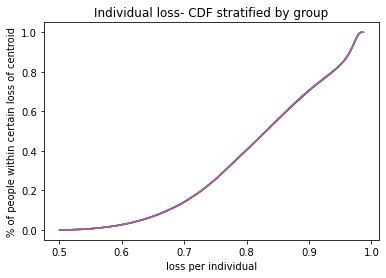

c  {0: (4.420069673735628, 3.7235841665092417), 1: (-9.311687104455231, -9.103705595341493), 2: (-10.768507103802442, 6.7677040724975805), 3: (9.674952891842572, -3.5467448548751195), 4: (-1.993674710261734, 8.570277402371884), 5: (-2.243366995581335, 1.9832910864579347), 6: (2.389038536020958, 9.401253094406542), 7: (4.816296878961711, -1.3519551539152783), 8: (-7.982916173980992, -7.097474860018792), 9: (6.761027475508472, 7.962015083059635)}
weights:  [0.19999995 0.2000182  0.20001901 0.20001726 0.19994557]
Time elapsed Batch Step:  0.351733922958374
Time elapsed Assignment Step:  2.335994243621826
0.0007459880627228577
total:  0.5771656967599


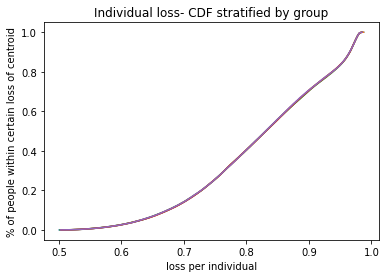

c  {0: (4.419384352613018, 3.7232165728267734), 1: (-9.310433496292243, -9.10249013485583), 2: (-10.766479101216163, 6.767449321384072), 3: (9.674265619881236, -3.5447101820943825), 4: (-1.9923160631165513, 8.569043193663326), 5: (-2.242256533530119, 1.984554478365738), 6: (2.387600205483455, 9.399815958867398), 7: (4.816488029468244, -1.3507142275060589), 8: (-7.983754015385583, -7.099155281019388), 9: (6.7591256610641715, 7.9611726996796355)}
weights:  [0.19999994 0.20001822 0.20001907 0.20001735 0.19994542]
Time elapsed Batch Step:  0.3415830135345459
Time elapsed Assignment Step:  2.3449807167053223
0.0007026512154258979
total:  0.5770144327188885


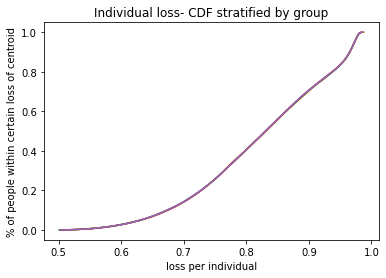

c  {0: (4.418698844508729, 3.7228489813648675), 1: (-9.309181041131321, -9.101275743875695), 2: (-10.764452150585967, 6.7671947756059225), 3: (9.673578428718429, -3.542675811213519), 4: (-1.9909583001384628, 8.567809802757814), 5: (-2.241146320572816, 1.9858177318175165), 6: (2.386161980053202, 9.398379024469032), 7: (4.81667935185521, -1.3494731738711931), 8: (-7.984590734465508, -7.100833364954486), 9: (6.757224423793824, 7.960330600121215)}
weights:  [0.19999993 0.20001823 0.20001913 0.20001743 0.19994527]
Time elapsed Batch Step:  0.37360334396362305
Time elapsed Assignment Step:  2.36806583404541
0.0007619495555167832
total:  0.5768939916816722


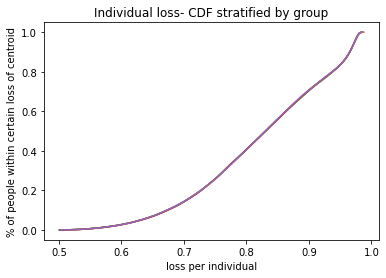

c  {0: (4.418013149381434, 3.722481392180552), 1: (-9.307929740745545, -9.100062423818072), 2: (-10.762426259771571, 6.7669404364034795), 3: (9.67289132146594, -3.540641750797083), 4: (-1.9896014257990249, 8.566577233160057), 5: (-2.240036359497766, 1.9870808436770788), 6: (2.3847238643714648, 9.39694229591527), 7: (4.816870846235859, -1.34823199400689), 8: (-7.985426328399783, -7.102509108516826), 9: (6.755323771229525, 7.959488788032214)}
weights:  [0.19999993 0.20001824 0.20001919 0.20001752 0.19994513]
Time elapsed Batch Step:  0.3565833568572998
Time elapsed Assignment Step:  2.3970465660095215
0.000739777027187194
total:  0.5767491425964916


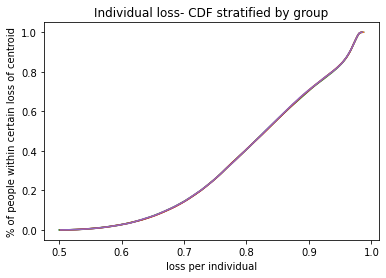

c  {0: (4.417327267189887, 3.722113805330878), 1: (-9.306679596923361, -9.098850176117036), 2: (-10.7604014366495, 6.766686305033523), 3: (9.672204301249403, -3.5386080094425236), 4: (-1.9882454445610518, 8.565345488366145), 5: (-2.2389266530943535, 1.9883438108003488), 6: (2.383285863087503, 9.395505777922786), 7: (4.817062512723617, -1.3469906889114553), 8: (-7.986260794380539, -7.104182508424311), 9: (6.753423710918413, 7.958647267072695)}
weights:  [0.19999992 0.20001826 0.20001924 0.20001761 0.19994498]
Time elapsed Batch Step:  0.3542146682739258
Time elapsed Assignment Step:  2.3280727863311768
0.0007459376677679819
total:  0.5766128287822998


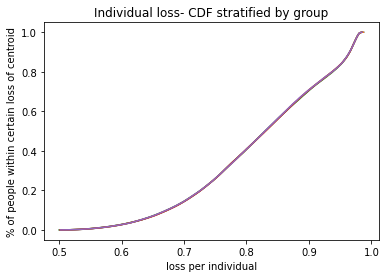

c  {0: (4.416641197892929, 3.7217462208729204), 1: (-9.305430611468438, -9.09763900222369), 2: (-10.758377689113745, 6.766432382768922), 3: (9.671517371208294, -3.5365745957802157), 4: (-1.9868903608782995, 8.564114571863284), 5: (-2.2378172041528988, 1.9896066300354172), 6: (2.3818479808583346, 9.394069475220961), 7: (4.817254351432094, -1.3457492595852814), 8: (-7.987094129613206, -7.105853561419672), 9: (6.751524250422582, 7.957806040914921)}
weights:  [0.19999991 0.20001827 0.2000193  0.20001769 0.19994483]
Time elapsed Batch Step:  0.3619537353515625
Time elapsed Assignment Step:  2.2941179275512695
0.0007535784728945893
total:  0.5764769950240327


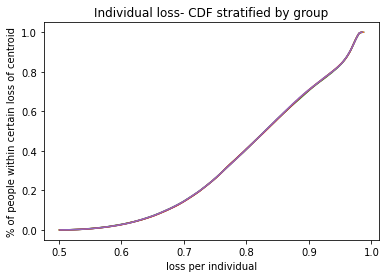

c  {0: (4.415954941449483, 3.7213786388637753), 1: (-9.304182786199501, -9.096428903606084), 2: (-10.756355025076376, 6.766178670898287), 3: (9.670830534495936, -3.5345415184734907), 4: (-1.9855361791951462, 8.562884487129526), 5: (-2.2367080154645507, 1.9908692982225962), 6: (2.380410222348498, 9.392633392551746), 7: (4.817446362475088, -1.3445077070308378), 8: (-7.987926331316694, -7.1075222642701394), 9: (6.749625397319005, 7.956965113243332)}
weights:  [0.1999999  0.20001828 0.20001936 0.20001778 0.19994468]
Time elapsed Batch Step:  0.36130833625793457
Time elapsed Assignment Step:  2.327421188354492
0.0007469255174574752
total:  0.5763369104390953


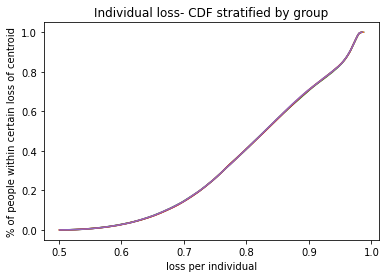

c  {0: (4.415268497818556, 3.7210110593605625), 1: (-9.30293612295018, -9.09521988174914), 2: (-10.754333452468122, 6.76592517072561), 3: (9.670143794279491, -3.532508786218666), 4: (-1.9841829039462686, 8.561655237633508), 5: (-2.2355990898211755, 1.9921318121944747), 6: (2.378972592229812, 9.391197534669503), 7: (4.817638545966595, -1.3432660322526617), 8: (-7.988757396723555, -7.1091886137671185), 9: (6.747727159199445, 7.9561244877545185)}
weights:  [0.19999989 0.20001829 0.20001942 0.20001787 0.19994453]
Time elapsed Batch Step:  0.3524184226989746
Time elapsed Assignment Step:  2.3177740573883057
0.0007839801336173569
total:  0.576209976515639


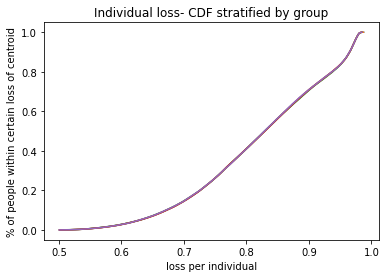

c  {0: (4.414581866959242, 3.7206434824204244), 1: (-9.301690623568861, -9.094011938154571), 2: (-10.752312979238907, 6.765671883569907), 3: (9.669457153739968, -3.530476407745076), 4: (-1.9828305395563135, 8.56042682683419), 5: (-2.234490430015247, 1.9933941687759766), 6: (2.3775350951811305, 9.38976190634086), 7: (4.817830902020822, -1.3420242362573476), 8: (-7.989587323080149, -7.110852606725868), 9: (6.745829543670367, 7.955284168157188)}
weights:  [0.19999988 0.2000183  0.20001948 0.20001795 0.19994438]
Time elapsed Batch Step:  0.34037017822265625
Time elapsed Assignment Step:  2.3365042209625244
0.0007616073708739401
total:  0.5760652532445464


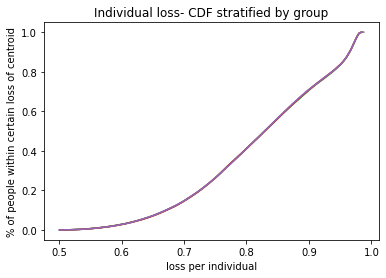

c  {0: (4.413895048830719, 3.7202759081005263), 1: (-9.300446289918522, -9.092805074340793), 2: (-10.750293613358346, 6.765418810764856), 3: (9.668770616072209, -3.5284443918151007), 4: (-1.9814790904395658, 8.5591992581806), 5: (-2.233382038839735, 1.9946563647844198), 6: (2.3760977358880986, 9.388326512344538), 7: (4.81802343075219, -1.3407823200535363), 8: (-7.990416107646792, -7.112514239985186), 9: (6.743932558352854, 7.954444158172138)}
weights:  [0.19999987 0.20001832 0.20001955 0.20001804 0.19994423]
Time elapsed Batch Step:  0.3442561626434326
Time elapsed Assignment Step:  2.335766077041626
0.000745050211078846
total:  0.5759223147115853


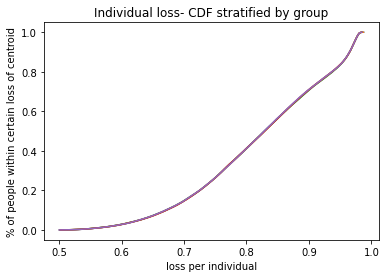

c  {0: (4.41320804339225, 3.7199083364580563), 1: (-9.299203123876582, -9.091599291842835), 2: (-10.748275362816214, 6.765165953658431), 3: (9.668084184484893, -3.5264127472241964), 4: (-1.9801285609996129, 8.557972535111585), 5: (-2.232273919087993, 1.9959183970295777), 6: (2.3746605190429033, 9.386891357471182), 7: (4.818216132275344, -1.3395402846519042), 8: (-7.9912437476979, -7.114173510407098), 9: (6.742036210882511, 7.9536044615322155)}
weights:  [0.19999986 0.20001833 0.20001961 0.20001813 0.19994407]
Time elapsed Batch Step:  0.3488433361053467
Time elapsed Assignment Step:  2.364593744277954
0.0007566775868026454
total:  0.5757878817574624


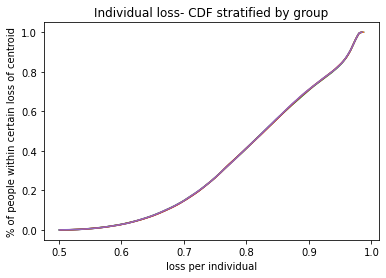

c  {0: (4.412520850603182, 3.7195407675502246), 1: (-9.297937237208618, -9.090418919446343), 2: (-10.746258235622864, 6.764913313612541), 3: (9.667397862200534, -3.524381482800927), 4: (-1.978778955629006, 8.556746661055563), 5: (-2.231166073553643, 1.997180262313743), 6: (2.3732234493440236, 9.385456446523184), 7: (4.818409006705165, -1.338298131065153), 8: (-7.992104556179932, -7.115814148512998), 9: (6.740140508909376, 7.952765081982282)}
weights:  [0.19999985 0.20001834 0.20001967 0.20001822 0.19994392]
Time elapsed Batch Step:  0.34781646728515625
Time elapsed Assignment Step:  2.3834638595581055
0.0007707513962824653
total:  0.5756542240226151


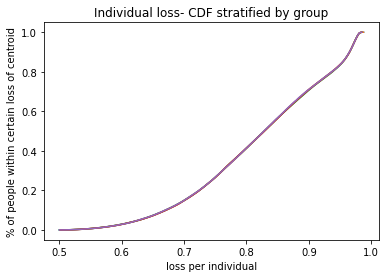

c  {0: (4.411833470422952, 3.7191732014342644), 1: (-9.29667255567693, -9.089239608656797), 2: (-10.744242239809632, 6.764660892002664), 3: (9.666711652455463, -3.522350607406992), 4: (-1.9774302787089184, 8.555521639430284), 5: (-2.2300585050304638, 1.998441957431791), 6: (2.37178653149598, 9.384021784314498), 7: (4.818602054156775, -1.3370558603079974), 8: (-7.992964193014307, -7.117452474666101), 9: (6.738245460097824, 7.951926023279171)}
weights:  [0.19999984 0.20001835 0.20001973 0.20001831 0.19994377]
Time elapsed Batch Step:  0.3583712577819824
Time elapsed Assignment Step:  2.344658136367798
0.000742219788176568
total:  0.5755078861001214


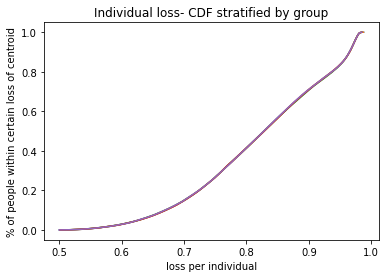

c  {0: (4.411147252262677, 3.71880146140648), 1: (-9.295409081203978, -9.088061360999315), 2: (-10.742227383429181, 6.764408690217486), 3: (9.66602555849983, -3.5203201299372604), 4: (-1.976082534608801, 8.554297473642595), 5: (-2.228954046555816, 1.9996983062375424), 6: (2.3703497702090788, 9.382587375670445), 7: (4.818795274745549, -1.3358134733971536), 8: (-7.993822655366569, -7.119088485718315), 9: (6.736351072126468, 7.951087289191647)}
weights:  [0.19999983 0.20001836 0.20001979 0.2000184  0.19994362]
Time elapsed Batch Step:  0.3612792491912842
Time elapsed Assignment Step:  2.288097620010376
0.0007264174908334642
total:  0.5753654108044972


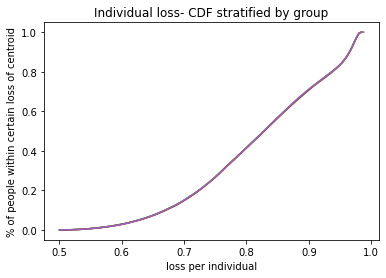

c  {0: (4.410460848421815, 3.718429723054423), 1: (-9.294146815726192, -9.08688417801578), 2: (-10.740213674555843, 6.764156709658544), 3: (9.665339583597596, -3.518290059319797), 4: (-1.9747357276860358, 8.553074167088218), 5: (-2.2278498636575983, 2.000954484273118), 6: (2.3689131701991624, 9.38115322542751), 7: (4.818988668587121, -1.3345709713513276), 8: (-7.994679940416757, -7.120722178542906), 9: (6.734457352688064, 7.950248883500353)}
weights:  [0.19999982 0.20001837 0.20001986 0.20001849 0.19994347]
Time elapsed Batch Step:  0.3423800468444824
Time elapsed Assignment Step:  2.36098051071167
0.0007460301396939872
total:  0.5752336042321435


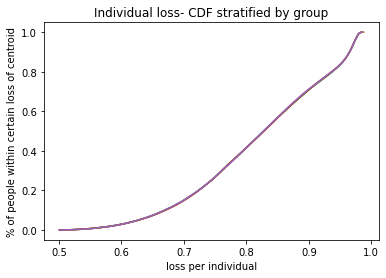

c  {0: (4.40977425886202, 3.7180579864351055), 1: (-9.292885761193807, -9.085708061264723), 2: (-10.738201121285906, 6.763904951739866), 3: (9.664653731026519, -3.5162604045158954), 4: (-1.9733898622855879, 8.551851723151522), 5: (-2.2267459590919834, 2.002210488357607), 6: (2.3674767361873514, 9.379719338433139), 7: (4.819182235797397, -1.3333283551912025), 8: (-7.9955360453595254, -7.122353550034237), 9: (6.732564309489403, 7.949410809997765)}
weights:  [0.19999981 0.20001837 0.20001992 0.20001858 0.19994332]
Time elapsed Batch Step:  0.3441319465637207
Time elapsed Assignment Step:  2.2860968112945557
0.0007711376835320971
total:  0.5751034903259716


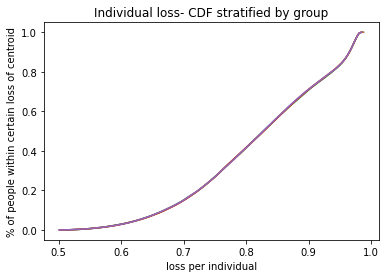

c  {0: (4.409087483545036, 3.7176862516055618), 1: (-9.291625919570716, -9.084533012321216), 2: (-10.736189731737884, 6.763653417887618), 3: (9.663968004078145, -3.5142311745201087), 4: (-1.9720449427396556, 8.550630145205318), 5: (-2.225642335614883, 2.0034663153030356), 6: (2.366040472899792, 9.378285719545513), 7: (4.819375976492563, -1.3320856259394258), 8: (-7.99639096740426, -7.123982597107511), 9: (6.730671950251217, 7.948573072488138)}
weights:  [0.19999979 0.20001838 0.20001999 0.20001867 0.19994317]
Time elapsed Batch Step:  0.3573427200317383
Time elapsed Assignment Step:  2.3326311111450195
0.0007816114589060952
total:  0.5749690310911544


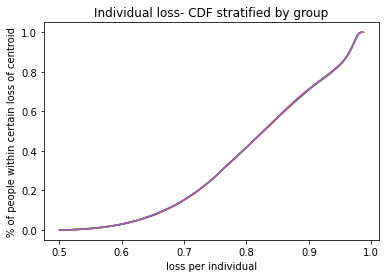

c  {0: (4.408400522432696, 3.717314518622848), 1: (-9.290367292834313, -9.083359032776746), 2: (-10.734179514052757, 6.763402109539762), 3: (9.663282406057798, -3.5122023783602794), 4: (-1.9707009733673198, 8.549409436610649), 5: (-2.2245389959818316, 2.004721961914441), 6: (2.3646043850674014, 9.376852373633334), 7: (4.819569890789094, -1.3308427846205968), 8: (-7.997244703775181, -7.125609316698512), 9: (6.728780282708065, 7.947735674787447)}
weights:  [0.19999978 0.20001839 0.20002005 0.20001876 0.19994301]
Time elapsed Batch Step:  0.37400054931640625
Time elapsed Assignment Step:  2.2697482109069824
0.0007901404509205179
total:  0.57483403463299


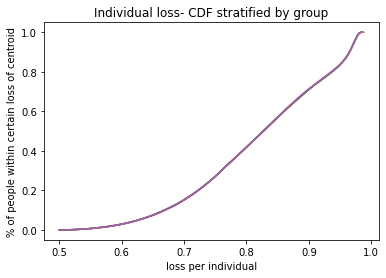

c  {0: (4.407713375486919, 3.71694278754404), 1: (-9.289109882975337, -9.082186124239099), 2: (-10.732170476394181, 6.7631510281457015), 3: (9.662596940284564, -3.5101740250975713), 4: (-1.9693579584741927, 8.548189600716594), 5: (-2.2234359429478676, 2.0059774249899447), 6: (2.3631684774256136, 9.375419305575585), 7: (4.819763978803761, -1.3295998322612532), 8: (-7.998097251711444, -7.127233705763361), 9: (6.72688931460823, 7.94689862072333)}
weights:  [0.19999977 0.2000184  0.20002012 0.20001885 0.19994286]
Time elapsed Batch Step:  0.3726038932800293
Time elapsed Assignment Step:  2.3539886474609375
0.0007701069531024229
total:  0.5746905174732837


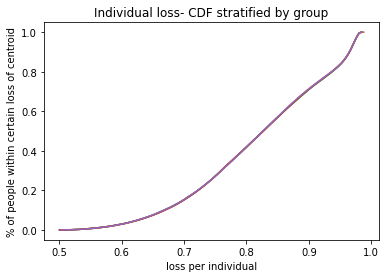

c  {0: (4.407026042669718, 3.7165710584262373), 1: (-9.28785369199772, -9.081014288332232), 2: (-10.730162626948674, 6.762900175165948), 3: (9.661911610091277, -3.5081461238264997), 4: (-1.9680159023520676, 8.546970640860083), 5: (-2.222333179267416, 2.00723270132083), 6: (2.3617327547141276, 9.373986520261296), 7: (4.819958240653648, -1.3283567698898568), 8: (-7.998948608467234, -7.1288557612782695), 9: (6.724999053713605, 7.946061914135023)}
weights:  [0.19999976 0.20001841 0.20002018 0.20001895 0.19994271]
Time elapsed Batch Step:  0.36422181129455566
Time elapsed Assignment Step:  2.3319928646087646
0.0007520954311673878
total:  0.5745477185086774


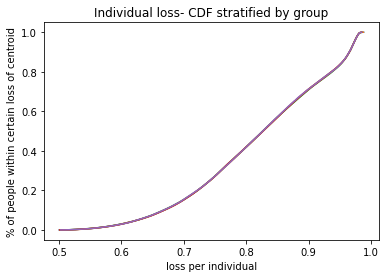

c  {0: (4.406341056252918, 3.7161980759104334), 1: (-9.286598721918432, -9.079843526696155), 2: (-10.728155973925778, 6.762649552071785), 3: (9.661226418824507, -3.506118683674965), 4: (-1.9666748092785673, 8.54575256036572), 5: (-2.2212316655040034, 2.0084811717145583), 6: (2.3602972216766562, 9.372554022589288), 7: (4.820152676456154, -1.3271135985367803), 8: (-7.999798771311853, -7.130475480239299), 9: (6.723109507799582, 7.945225558873296)}
weights:  [0.19999974 0.20001841 0.20002025 0.20001904 0.19994255]
Time elapsed Batch Step:  0.3511323928833008
Time elapsed Assignment Step:  2.3386802673339844
0.0007783056722019399
total:  0.5744182361371495


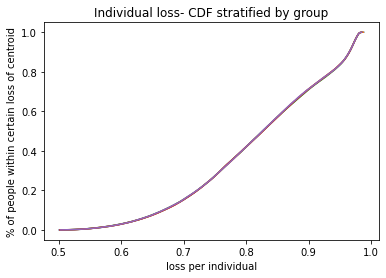

c  {0: (4.405655887229213, 3.715825095998725), 1: (-9.28534497476733, -9.078673840986804), 2: (-10.726150525558193, 6.76239916034494), 3: (9.660541369844536, -3.5040917138042813), 4: (-1.9653346835167955, 8.544535362545608), 5: (-2.2201304408518885, 2.0097294533711065), 6: (2.3588618830606776, 9.371121817467927), 7: (4.820347286329009, -1.3258703192342924), 8: (-8.000647737529798, -7.1320928596621265), 9: (6.721220684654939, 7.9443895588003794)}
weights:  [0.19999973 0.20001842 0.20002032 0.20001914 0.1999424 ]
Time elapsed Batch Step:  0.6019248962402344
Time elapsed Assignment Step:  4.303503513336182
0.0007912149608533259
total:  0.5742848151123743


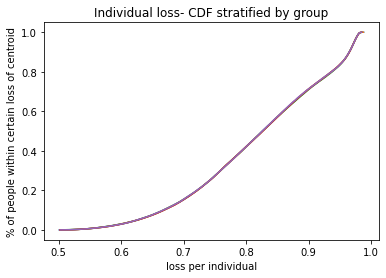

c  {0: (4.404970535564039, 3.7154521187487095), 1: (-9.284092452587, -9.077505232875906), 2: (-10.724146290101894, 6.762149001477257), 3: (9.659856466525348, -3.5020652234092116), 4: (-1.963995529314988, 8.543319050699193), 5: (-2.219029508032841, 2.010977543106365), 6: (2.3574267436171885, 9.369689909814852), 7: (4.82054207039028, -1.3246269330165434), 8: (-8.001495504420843, -7.133707896581815), 9: (6.7193325920817175, 7.943553917789895)}
weights:  [0.19999971 0.20001843 0.20002039 0.20001923 0.19994224]
Time elapsed Batch Step:  0.35984373092651367
Time elapsed Assignment Step:  2.318345069885254
0.0008339997654793763
total:  0.5741604085433539


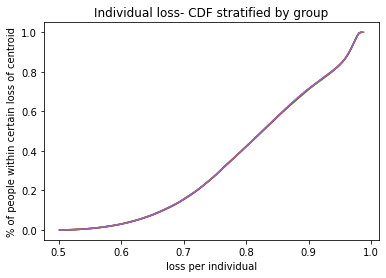

c  {0: (4.404285001222924, 3.7150791442180044), 1: (-9.282841157432607, -9.076337704050855), 2: (-10.72214327583622, 6.761899076970379), 3: (9.659171712254603, -3.5000392217179974), 4: (-1.9626573509061678, 8.542103628113116), 5: (-2.2179288697675745, 2.012225437729801), 6: (2.3559918081004616, 9.36825830455671), 7: (4.820737028758381, -1.32338344091955), 8: (-8.002342069300104, -7.135320588052589), 9: (6.717445237895109, 7.942718639726776)}
weights:  [0.1999997  0.20001844 0.20002045 0.20001933 0.19994208]
Time elapsed Batch Step:  0.35826969146728516
Time elapsed Assignment Step:  2.3173670768737793
0.0008531256358170758
total:  0.5740289389514857


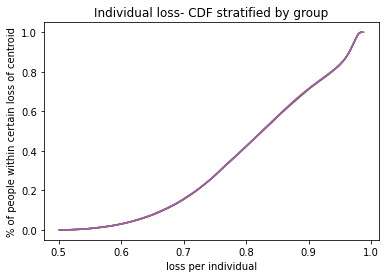

c  {0: (4.403585890347451, 3.7147105780753997), 1: (-9.281591091371737, -9.075171256214581), 2: (-10.720141491063952, 6.761649388335435), 3: (9.658487110433615, -3.4980137179923934), 4: (-1.9613201525078012, 8.540889098061077), 5: (-2.216828528775626, 2.013473134044541), 6: (2.3545570812678056, 9.36682700662887), 7: (4.820935617427587, -1.3221420604943508), 8: (-8.003187429498103, -7.136930931147613), 9: (6.715558629923326, 7.941883728507187)}
weights:  [0.19999968 0.20001844 0.20002052 0.20001942 0.19994192]
Time elapsed Batch Step:  0.3484325408935547
Time elapsed Assignment Step:  2.3413236141204834
0.0008254893513498507
total:  0.5738834947891128


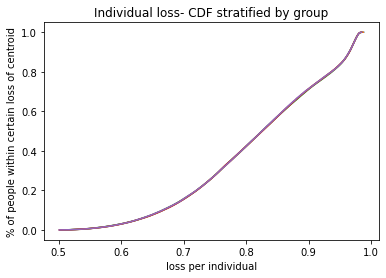

c  {0: (4.402886590394297, 3.714342012160289), 1: (-9.28034225648425, -9.074005891085411), 2: (-10.718140944111358, 6.761399937092733), 3: (9.657802664477334, -3.4959887215276986), 4: (-1.9599839383214588, 8.5396754638037), 5: (-2.215728487775233, 2.0147206288474586), 6: (2.35312256787933, 9.365396020975151), 7: (4.821134382805424, -1.3209005719646414), 8: (-8.004031582360835, -7.138538922958778), 9: (6.71367277600748, 7.94104918803844)}
weights:  [0.19999967 0.20001845 0.20002059 0.20001952 0.19994177]
Time elapsed Batch Step:  0.3327474594116211
Time elapsed Assignment Step:  2.3592653274536133
0.0008026681884543141
total:  0.5737395489999166


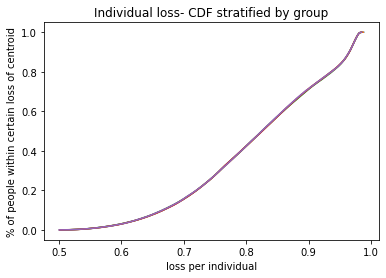

c  {0: (4.402187101328814, 3.7139734465298853), 1: (-9.279094654862122, -9.072841610396937), 2: (-10.71614164332823, 6.761150724771456), 3: (9.657118377814319, -3.4939642416527907), 4: (-1.9586487125324785, 8.538462728588422), 5: (-2.2146287494832113, 2.01596791892926), 6: (2.351688272697715, 9.363965352547512), 7: (4.821333325013554, -1.3196589763569762), 8: (-8.004874525249814, -7.140144560596495), 9: (6.711787684001457, 7.940215022238908)}
weights:  [0.19999965 0.20001846 0.20002066 0.20001962 0.19994161]
Time elapsed Batch Step:  0.3540492057800293
Time elapsed Assignment Step:  2.3182756900787354
0.0007653431634251362
total:  0.5735913078173209


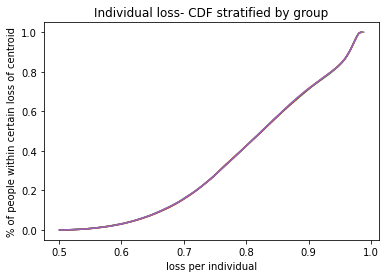

c  {0: (4.401487423116462, 3.7136048812414253), 1: (-9.277848288609295, -9.071678415897878), 2: (-10.714143597087896, 6.760901752909365), 3: (9.656434253886713, -3.491940287730159), 4: (-1.957314479309635, 8.537250895649388), 5: (-2.2135293166148307, 2.017215001074575), 6: (2.3502542004879845, 9.36253500630576), 7: (4.8215324441740295, -1.3184172746996992), 8: (-8.005716255542133, -7.141747841189485), 9: (6.709903361771781, 7.93938123503793)}
weights:  [0.19999964 0.20001847 0.20002073 0.20001971 0.19994145]
Time elapsed Batch Step:  0.3385946750640869
Time elapsed Assignment Step:  2.310598850250244
0.0007318203633027709
total:  0.5734442645929995


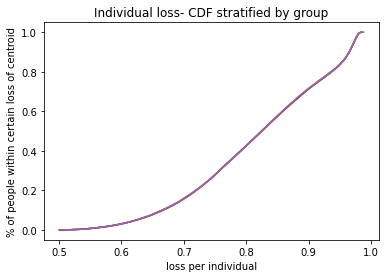

c  {0: (4.4007875557228004, 3.713236316352169), 1: (-9.276603159841523, -9.070516309351945), 2: (-10.712146813787221, 6.760653023052509), 3: (9.655750296150213, -3.489916869155938), 4: (-1.955981242804813, 8.536039968207351), 5: (-2.2124301918836893, 2.0184618720620473), 6: (2.348820356017289, 9.361104987217253), 7: (4.821731740409303, -1.3171754680229284), 8: (-8.006556770630498, -7.143348761884585), 9: (6.708019817197486, 7.938547830375716)}
weights:  [0.19999962 0.20001847 0.2000208  0.20001981 0.19994129]
Time elapsed Batch Step:  0.3527185916900635
Time elapsed Assignment Step:  2.3027215003967285
0.0007165458307607508
total:  0.5733027533270398


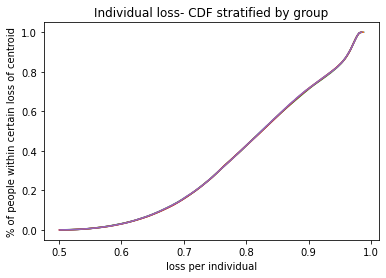

c  {0: (4.400087499113492, 3.7128677519194), 1: (-9.275359270686218, -9.069355292537699), 2: (-10.710151301846585, 6.760404536754937), 3: (9.655066508074043, -3.4878939953599435), 4: (-1.9546490071526852, 8.534829949469596), 5: (-2.2113313780015873, 2.0197085286644283), 6: (2.34738674405469, 9.359675300256567), 7: (4.821931213842239, -1.3159335573585376), 8: (-8.007396067923281, -7.144947319846554), 9: (6.706137058169976, 7.937714812203254)}
weights:  [0.19999961 0.20001848 0.20002088 0.2000199  0.19994113]
Time elapsed Batch Step:  0.33715224266052246
Time elapsed Assignment Step:  2.2860660552978516
0.0007009120676442215
total:  0.5731611927735851


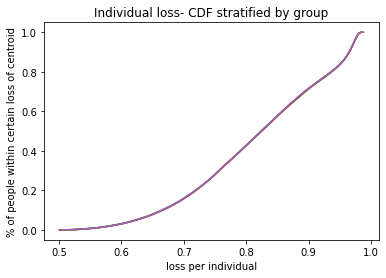

c  {0: (4.399387253254302, 3.712499188000425), 1: (-9.2741166232823, -9.068195367248412), 2: (-10.708157069709848, 6.760156295578417), 3: (9.654382893140923, -3.4858716758057047), 4: (-1.9533177764703995, 8.533620842629867), 5: (-2.210232877678399, 2.020954967648672), 6: (2.345953369370956, 9.358245950405193), 7: (4.822130864596122, -1.3146915437401394), 8: (-8.00823414484455, -7.146543512257882), 9: (6.704255092592894, 7.936882184482195)}
weights:  [0.19999959 0.20001849 0.20002095 0.20002    0.19994098]
Time elapsed Batch Step:  0.34304046630859375
Time elapsed Assignment Step:  2.34490966796875
0.0006875578865294107
total:  0.5730203759465239


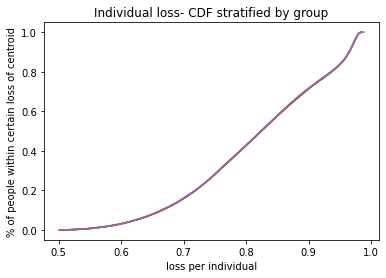

c  {0: (4.3986868181111, 3.712130624652574), 1: (-9.27287521978004, -9.067036535291926), 2: (-10.706164125844307, 6.759908301092162), 3: (9.653699454847038, -3.483849919990501), 4: (-1.9519875548572703, 8.532412650868306), 5: (-2.2091346936219445, 2.022201185776031), 6: (2.3445202367383637, 9.356816942651207), 7: (4.82233069279467, -1.3134494282030673), 8: (-8.009070998834108, -7.148137336318612), 9: (6.702373928381973, 7.936049951184754)}
weights:  [0.19999958 0.20001849 0.20002102 0.2000201  0.19994082]
Time elapsed Batch Step:  0.35613179206848145
Time elapsed Assignment Step:  2.303680181503296
0.0006844120562450318
total:  0.5728826829781877


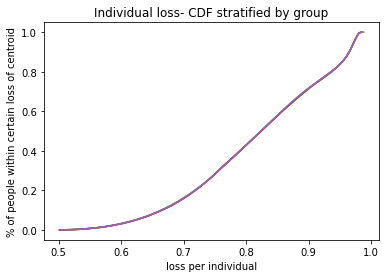

c  {0: (4.397986193649861, 3.7117620619331992), 1: (-9.271635062340915, -9.065878798490507), 2: (-10.704172478740619, 6.759660554872557), 3: (9.653016196701998, -3.481828737445397), 4: (-1.9506583463944775, 8.531205377351405), 5: (-2.2080368285378595, 2.0234471798021563), 6: (2.3430873509305066, 9.355388281988938), 7: (4.822530698562042, -1.3122072117843573), 8: (-8.009906627347517, -7.1497287892461605), 9: (6.700493573464898, 7.935218116293596)}
weights:  [0.19999956 0.2000185  0.20002109 0.20002019 0.19994066]
Time elapsed Batch Step:  0.36724376678466797
Time elapsed Assignment Step:  2.307753562927246
0.0006702661317318226
total:  0.5727417520814407


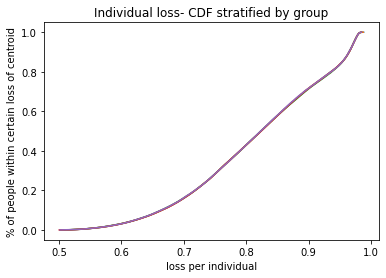

c  {0: (4.397285379836661, 3.711393499899678), 1: (-9.270396153137447, -9.064722158680702), 2: (-10.70218213691273, 6.759413058502892), 3: (9.652333122228807, -3.4798081377352785), 4: (-1.9493301551447757, 8.529999025231978), 5: (-2.206939285129463, 2.0246929464771966), 6: (2.3416547167221142, 9.35395997341864), 7: (4.822730882022855, -1.3109648955227289), 8: (-8.010741027856128, -7.151317868275147), 9: (6.698614035781155, 7.93438668380172)}
weights:  [0.19999955 0.20001851 0.20002116 0.20002029 0.1999405 ]
Time elapsed Batch Step:  0.3538169860839844
Time elapsed Assignment Step:  2.367069721221924
0.0006924825377423449
total:  0.5726117931665492


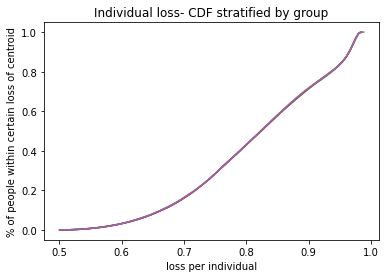

c  {0: (4.396584376637682, 3.7110249386094085), 1: (-9.269158494353057, -9.063566617713198), 2: (-10.700193108897789, 6.7591658135731025), 3: (9.651650234963823, -3.477788130458889), 4: (-1.9480029851522085, 8.528793597649127), 5: (-2.205842066097624, 2.0259384825459015), 6: (2.340222338888881, 9.352532021946141), 7: (4.822931243302184, -1.3097224804585665), 8: (-8.011574197847107, -7.152904570657226), 9: (6.696735323281888, 7.93355565771234)}
weights:  [0.19999953 0.20001851 0.20002124 0.20002038 0.19994033]
Time elapsed Batch Step:  0.38311123847961426
Time elapsed Assignment Step:  2.3171634674072266
0.000690014342828893
total:  0.572474493095418


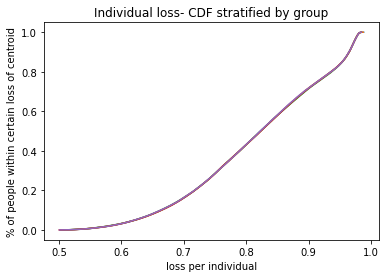

c  {0: (4.39588318401921, 3.710656378119814), 1: (-9.26792208818191, -9.06241217745267), 2: (-10.698205403256033, 6.7589188216795115), 3: (9.650967538456715, -3.475768725248866), 4: (-1.9466768404418353, 8.527589097728237), 5: (-2.204745174140628, 2.027183784747726), 6: (2.338790222207303, 9.351104432582513), 7: (4.823131782525584, -1.3084799676338994), 8: (-8.012406134823452, -7.154488893660929), 9: (6.694857443929739, 7.932725042038758)}
weights:  [0.19999951 0.20001852 0.20002131 0.20002048 0.19994017]
Time elapsed Batch Step:  0.3457517623901367
Time elapsed Assignment Step:  2.2977163791656494
0.0007030603281863446
total:  0.5723419114706243


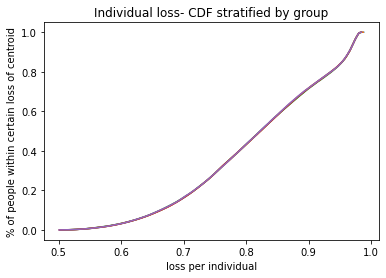

c  {0: (4.395181801947638, 3.710287818488339), 1: (-9.266686936828764, -9.061258839777638), 2: (-10.696219028570678, 6.7586720844245765), 3: (9.650285036270425, -3.4737499317717786), 4: (-1.9453517250194658, 8.526385528580972), 5: (-2.20364861195404, 2.028428849816936), 6: (2.3373583714545263, 9.34967721034372), 7: (4.823332499819093, -1.3072373580923822), 8: (-8.01323683630401, -7.156070834571508), 9: (6.6929804056987, 7.931894840804238)}
weights:  [0.1999995  0.20001853 0.20002139 0.20002057 0.19994001]
Time elapsed Batch Step:  0.37197351455688477
Time elapsed Assignment Step:  2.292219877243042
0.0007042654589871633
total:  0.5722058428693378


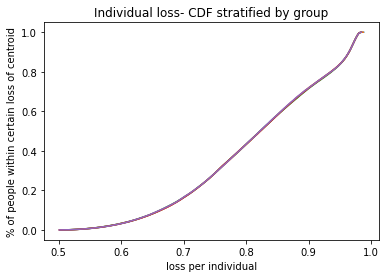

c  {0: (4.394480230389463, 3.709919259772452), 1: (-9.265453042508817, -9.060106606580321), 2: (-10.694233993447783, 6.75842560341664), 3: (9.649602731981119, -3.471731759728166), 4: (-1.9440276428714047, 8.52518289330529), 5: (-2.2025523822305666, 2.029673674482717), 6: (2.3359267914082062, 9.348250360250264), 7: (4.82353339530925, -1.3059946528792736), 8: (-8.01406629982349, -7.157650390690786), 9: (6.691104216573949, 7.931065058041871)}
weights:  [0.19999948 0.20001854 0.20002146 0.20002067 0.19993985]
Time elapsed Batch Step:  0.37538933753967285
Time elapsed Assignment Step:  2.3366539478302
0.0007351076932635703
total:  0.5720787316560859


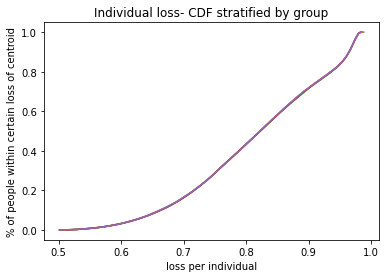

c  {0: (4.393778469311286, 3.709550702029645), 1: (-9.264220407447555, -9.058955479766482), 2: (-10.692250306516122, 6.758179380269685), 3: (9.648920629178143, -3.4697142188525736), 4: (-1.942704597964208, 8.52398119498546), 5: (-2.201456487659915, 2.0309182554692846), 6: (2.3344954868463783, 9.34682388732684), 7: (4.823734469123097, -1.304751853041417), 8: (-8.014894522932483, -7.159227559337014), 9: (6.689228884551694, 7.930235697794442)}
weights:  [0.19999947 0.20001854 0.20002154 0.20002076 0.19993969]
Time elapsed Batch Step:  0.3528456687927246
Time elapsed Assignment Step:  2.319915294647217
0.0007001162571212971
total:  0.5719319369616226


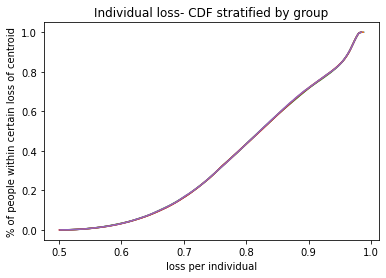

c  {0: (4.393076518679818, 3.709182145317432), 1: (-9.2629890338806, -9.057805461255283), 2: (-10.690267976427025, 6.757933416603096), 3: (9.648238731463973, -3.4676973189135945), 4: (-1.9413825942444496, 8.522780436692097), 5: (-2.2003609309286523, 2.0321625894959965), 6: (2.3330644625473402, 9.345397796601981), 7: (4.823935721388198, -1.303508959627218), 8: (-8.015721503197462, -7.160802337844729), 9: (6.687354417639005, 7.929406764114282)}
weights:  [0.19999945 0.20001855 0.20002161 0.20002086 0.19993953]
Time elapsed Batch Step:  0.3543994426727295
Time elapsed Assignment Step:  2.248492479324341
0.0007058861479763978
total:  0.5717974118645853


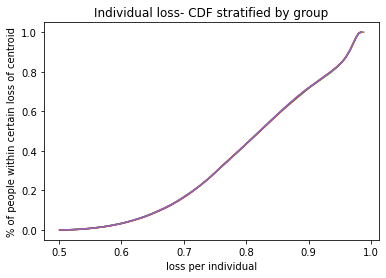

c  {0: (4.392360588828135, 3.7088199506171415), 1: (-9.261758924053563, -9.056656552979137), 2: (-10.688287011854214, 6.75768771404142), 3: (9.64755704245416, -3.4656810697139067), 4: (-1.9400616356385008, 8.521580621482208), 5: (-2.1992657147200614, 2.033406673277467), 6: (2.331633723289548, 9.343972093107704), 7: (4.824140305072951, -1.3022665220828766), 8: (-8.016547238200795, -7.1623747235646285), 9: (6.685480823853652, 7.928578261063125)}
weights:  [0.19999944 0.20001856 0.20002169 0.20002095 0.19993937]
Time elapsed Batch Step:  0.34529733657836914
Time elapsed Assignment Step:  2.33600115776062
0.0007116886975373493
total:  0.5716629655378352


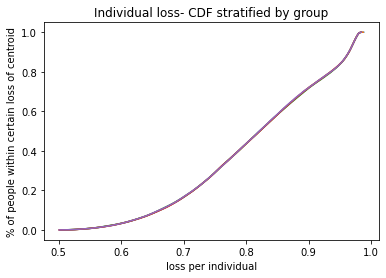

c  {0: (4.391644461839698, 3.70845775427649), 1: (-9.26053008022188, -9.055508756883551), 2: (-10.686307421493645, 6.7574422742141325), 3: (9.646875565777277, -3.4636654810903127), 4: (-1.9387417260523196, 8.520381752399247), 5: (-2.1981708417139947, 2.034650503523684), 6: (2.3302032738515224, 9.342546781879154), 7: (4.824345069705201, -1.3010239873867293), 8: (-8.01737172554075, -7.163944713863432), 9: (6.683608111223929, 7.927750192711955)}
weights:  [0.19999942 0.20001856 0.20002176 0.20002105 0.1999392 ]
Time elapsed Batch Step:  0.34702062606811523
Time elapsed Assignment Step:  2.296067476272583
0.0006633316203509265
total:  0.571512341276555


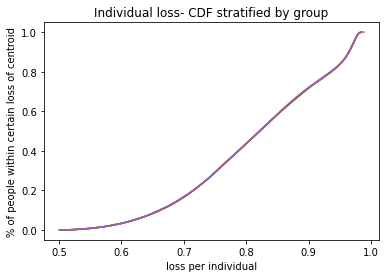

c  {0: (4.390928137680672, 3.708095556351501), 1: (-9.259302504650673, -9.05436207492698), 2: (-10.684329214063311, 6.757197098755407), 3: (9.646194305074864, -3.461650562913781), 4: (-1.9374228693712545, 8.519183832473177), 5: (-2.197076314586725, 2.035894076940129), 6: (2.328773119011771, 9.341121867954252), 7: (4.824550015416581, -1.2997813565790366), 8: (-8.018194962831497, -7.165512306123768), 9: (6.681736287788486, 7.926922563140855)}
weights:  [0.19999941 0.20001857 0.20002184 0.20002115 0.19993904]
Time elapsed Batch Step:  0.3498406410217285
Time elapsed Assignment Step:  2.301657199859619
0.0006680339018900749
total:  0.5713777063502257


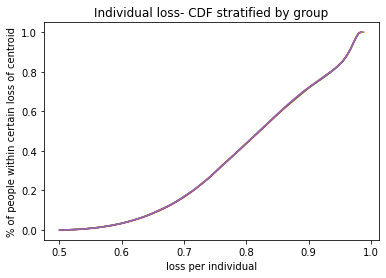

c  {0: (4.390211616317338, 3.707733356898225), 1: (-9.25807619961459, -9.053216509080668), 2: (-10.682352398303065, 6.75695218930389), 3: (9.645513264001368, -3.4596363250894853), 4: (-1.9361050694598596, 8.517986864720545), 5: (-2.195982136010796, 2.0371373902278953), 6: (2.327343263548723, 9.339697356373343), 7: (4.824755142339288, -1.2985386307015334), 8: (-8.019016947703111, -7.16707749774405), 9: (6.679865361596152, 7.92609537643884)}
weights:  [0.19999939 0.20001858 0.20002191 0.20002124 0.19993888]
Time elapsed Batch Step:  0.351546049118042
Time elapsed Assignment Step:  2.3275368213653564
0.0006647579466744213
total:  0.5712407507059636


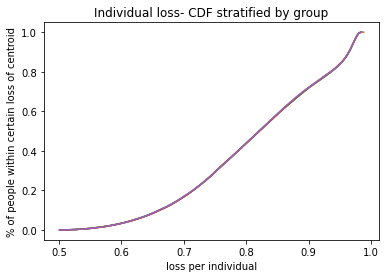

c  {0: (4.389494897716099, 3.7073711559727376), 1: (-9.256851167397658, -9.052072061328506), 2: (-10.680376982974414, 6.756707547502472), 3: (9.644832446224068, -3.457622777556846), 4: (-1.9347883301617241, 8.516790852144567), 5: (-2.1948883086548667, 2.0383804400838157), 6: (2.3259137122406757, 9.338273252178842), 7: (4.82496045060609, -1.2972958107974066), 8: (-8.019837677801572, -7.168640286138372), 9: (6.677995340705751, 7.925268636703696)}
weights:  [0.19999938 0.20001858 0.20002199 0.20002134 0.19993872]
Time elapsed Batch Step:  0.3564739227294922
Time elapsed Assignment Step:  2.2829205989837646
0.0006560616553803467
total:  0.5711022423868073


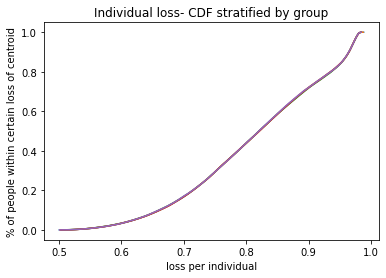

c  {0: (4.388777981843473, 3.7070089536311412), 1: (-9.255627410293126, -9.050928733666868), 2: (-10.678402976860312, 6.756463174998071), 3: (9.644151855423027, -3.455609930289573), 4: (-1.933472655299314, 8.515595797735223), 5: (-2.193794835183558, 2.0396232232005875), 6: (2.32448446986576, 9.33684956041489), 7: (4.825165940350344, -1.296052897911271), 8: (-8.020657150788765, -7.170200668736392), 9: (6.676126233185927, 7.924442348041809)}
weights:  [0.19999936 0.20001859 0.20002206 0.20002144 0.19993856]
Time elapsed Batch Step:  0.34125494956970215
Time elapsed Assignment Step:  2.314370632171631
0.0006936529158642069
total:  0.570977694295146


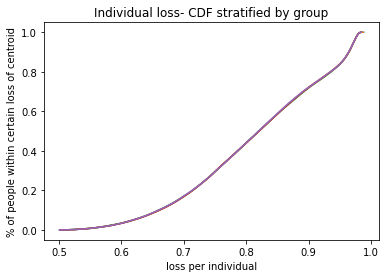

c  {0: (4.3880608686661, 3.706646749929564), 1: (-9.254404930603322, -9.049786528104462), 2: (-10.67643038876494, 6.756219073441409), 3: (9.643471495291008, -3.453597793295704), 4: (-1.9321580486738272, 8.514401704469357), 5: (-2.19270171825729, 2.040865736266901), 6: (2.323055541201915, 9.335426286127007), 7: (4.825371611706001, -1.2948098930891456), 8: (-8.021475364342473, -7.1717586429832405), 9: (6.674258047114954, 7.92361651456799)}
weights:  [0.19999935 0.20001859 0.20002214 0.20002153 0.1999384 ]
Time elapsed Batch Step:  0.3538858890533447
Time elapsed Assignment Step:  2.3643150329589844
0.0006764408231944019
total:  0.5708367789070172


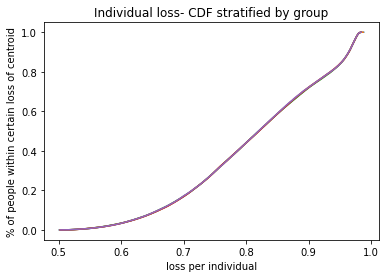

c  {0: (4.387343558150739, 3.7062845449241593), 1: (-9.253183730639488, -9.048645446662174), 2: (-10.674459227513488, 6.755975244486799), 3: (9.6427913695334, -3.451586376617652), 4: (-1.930844514065064, 8.513208575310784), 5: (-2.191608960532124, 2.042107975967572), 6: (2.3216269310268802, 9.334003434361748), 7: (4.825577464807616, -1.2935667973784284), 8: (-8.022292316156381, -7.17331420633942), 9: (6.672390790580548, 7.9227911404052955)}
weights:  [0.19999933 0.2000186  0.20002221 0.20002163 0.19993824]
Time elapsed Batch Step:  0.339768648147583
Time elapsed Assignment Step:  2.3002734184265137
0.000717907279545793
total:  0.5707135421116394


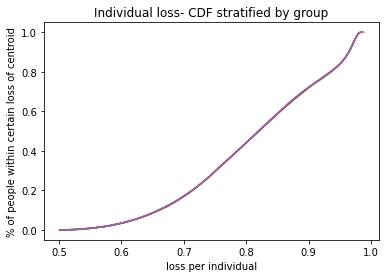

c  {0: (4.386626050264269, 3.7059223386711078), 1: (-9.251963812721641, -9.047505491372915), 2: (-10.672489501951912, 6.755731689791928), 3: (9.642111481868149, -3.4495756903322436), 4: (-1.9295320552313102, 8.512016413210414), 5: (-2.1905165646595943, 2.043349938983679), 6: (2.320198644118202, 9.332581010166376), 7: (4.825783499790366, -1.2923236118278716), 8: (-8.023108003940063, -7.1748673562807115), 9: (6.670524471679674, 7.921966229684842)}
weights:  [0.19999931 0.2000186  0.20002229 0.20002172 0.19993807]
Time elapsed Batch Step:  0.36481690406799316
Time elapsed Assignment Step:  2.325129270553589
0.0007610971220892715
total:  0.5705908989305768


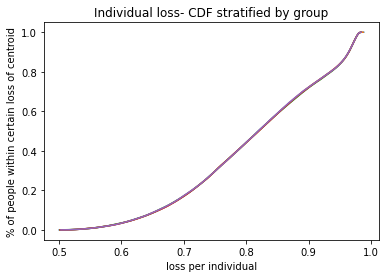

c  {0: (4.385908344973688, 3.7055601312266147), 1: (-9.250745179178411, -9.04636666428146), 2: (-10.670521220946696, 6.755488411017647), 3: (9.641431836025665, -3.447565744550765), 4: (-1.9282206759092335, 8.510825221106373), 5: (-2.1894245332865405, 2.044591621992698), 6: (2.3187706852532535, 9.331159018588526), 7: (4.825989716790052, -1.291080337487556), 8: (-8.02392242541898, -7.176418090298095), 9: (6.668659098518355, 7.921141786545618)}
weights:  [0.1999993  0.20001861 0.20002237 0.20002182 0.19993791]
Time elapsed Batch Step:  0.3404102325439453
Time elapsed Assignment Step:  2.3519222736358643
0.0007336696924258312
total:  0.5704471485338647


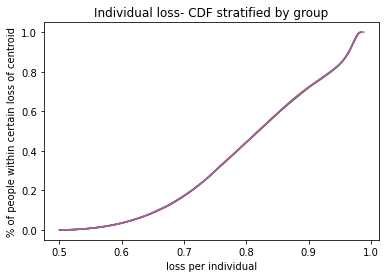

c  {0: (4.385190442246118, 3.7051979226469123), 1: (-9.249527832346896, -9.045228967444304), 2: (-10.668554393384609, 6.755245409827759), 3: (9.640752435748745, -3.4455565494190044), 4: (-1.9269103798137965, 8.509635001924135), 5: (-2.1883328690549364, 2.0458330216686464), 6: (2.317343059209272, 9.329737464675885), 7: (4.826196115943117, -1.289836975408865), 8: (-8.024735578334479, -7.177966405897662), 9: (6.666794679211469, 7.920317815134289)}
weights:  [0.19999928 0.20001861 0.20002245 0.20002192 0.19993775]
Time elapsed Batch Step:  0.3524913787841797
Time elapsed Assignment Step:  2.2951242923736572
0.0007351747624920746
total:  0.5703121571386094


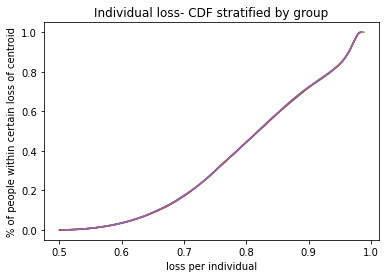

c  {0: (4.384472342048797, 3.7048357129882574), 1: (-9.248311774572509, -9.04409240292949), 2: (-10.666589028172433, 6.755002687888812), 3: (9.640073284792468, -3.4435481151172964), 4: (-1.9256011706381817, 8.508445758576661), 5: (-2.1872415746017135, 2.0470741346822297), 6: (2.315915770763406, 9.328316353475874), 7: (4.8264026973866505, -1.2885935266444584), 8: (-8.025547460443773, -7.179512300600542), 9: (6.664931221882548, 7.919494319604995)}
weights:  [0.19999927 0.20001862 0.20002253 0.20002201 0.19993758]
Time elapsed Batch Step:  0.33989906311035156
Time elapsed Assignment Step:  2.305145025253296
0.0007032241542690443
total:  0.5701670353346898


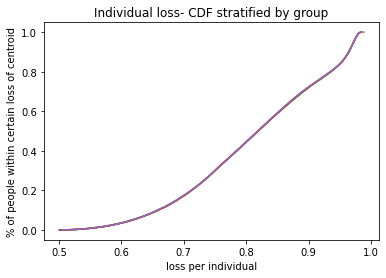

c  {0: (4.383754044349089, 3.704473502306934), 1: (-9.24709700820882, -9.042956972816462), 2: (-10.664625134236715, 6.754760246869893), 3: (9.639394386924106, -3.4415404518605666), 4: (-1.9242930520537314, 8.507257493964541), 5: (-2.1861506525585828, 2.0483149577009874), 6: (2.314460257134848, 9.326887358193515), 7: (4.826609461258405, -1.2873499922482452), 8: (-8.026358069519947, -7.181055771942832), 9: (6.663070007657866, 7.918687005909348)}
weights:  [0.19999925 0.20001862 0.20002261 0.20002211 0.19993741]
Time elapsed Batch Step:  0.34276485443115234
Time elapsed Assignment Step:  2.2726380825042725
0.0007188215839287748
total:  0.5700362569465579


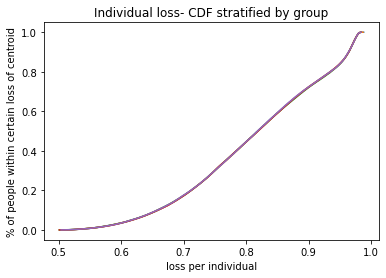

c  {0: (4.38303554911448, 3.704111290659251), 1: (-9.245883535617413, -9.04182267919591), 2: (-10.662662720523482, 6.754518088442421), 3: (9.638715745923015, -3.439533569898376), 4: (-1.9229860277099016, 8.506070210976146), 5: (-2.1850601055518513, 2.049555487389449), 6: (2.3130051174933257, 9.325458795776072), 7: (4.8268164076968025, -1.2861063732753564), 8: (-8.02716740335194, -7.18259681747553), 9: (6.661209759190694, 7.917880164133865)}
weights:  [0.19999924 0.20001863 0.20002269 0.2000222  0.19993724]
Time elapsed Batch Step:  0.3637735843658447
Time elapsed Assignment Step:  2.274141788482666
0.0007533335317307932
total:  0.5699112898162051


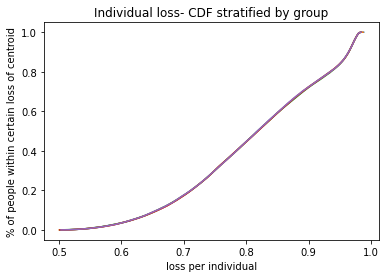

c  {0: (4.382317552712724, 3.703744258953296), 1: (-9.244671359167725, -9.040689524169602), 2: (-10.660701795997968, 6.754276214279948), 3: (9.638037365580523, -3.4375274795149675), 4: (-1.9216801012342306, 8.504883912487777), 5: (-2.183973009338482, 2.050790892580338), 6: (2.3115503568132674, 9.32403067146214), 7: (4.827023536840945, -1.2848626707821167), 8: (-8.02797545974454, -7.184135434764472), 9: (6.659350484528732, 7.917073798351005)}
weights:  [0.19999922 0.20001863 0.20002277 0.2000223  0.19993707]
Time elapsed Batch Step:  0.34496307373046875
Time elapsed Assignment Step:  2.286729574203491
0.00077613011683908
total:  0.5697828897181204


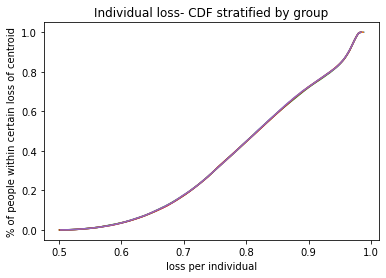

c  {0: (4.381599359999985, 3.703377224847998), 1: (-9.2434604812369, -9.039557509850237), 2: (-10.658742369644324, 6.754034626057951), 3: (9.637359249699808, -3.435522191029311), 4: (-1.9203752762323207, 8.503698601363826), 5: (-2.1828862856306563, 2.052026004838248), 6: (2.310095980069308, 9.322602990489026), 7: (4.827230848830627, -1.283618885826017), 8: (-8.028782236518376, -7.1856716213902745), 9: (6.657492191727345, 7.916267912639834)}
weights:  [0.1999992  0.20001864 0.20002286 0.2000224  0.1999369 ]
Time elapsed Batch Step:  0.35078001022338867
Time elapsed Assignment Step:  2.2828481197357178
0.0007309551083849453
total:  0.569634181196529


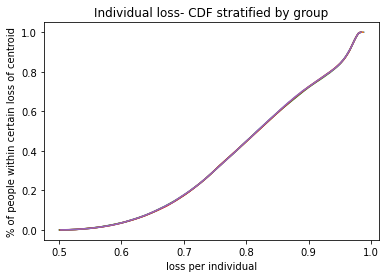

c  {0: (4.380880970945876, 3.7030101883993725), 1: (-9.242250904209635, -9.03842663836128), 2: (-10.656784450465329, 6.753793325453635), 3: (9.636681402095762, -3.4335177147951494), 4: (-1.9190715562878335, 8.502514280456936), 5: (-2.181799937002885, 2.053260820866116), 6: (2.308641992236422, 9.32117575809247), 7: (4.827438343806345, -1.2823750194656847), 8: (-8.029587731509904, -7.187205374948284), 9: (6.655634888849351, 7.915462511085807)}
weights:  [0.19999919 0.20001864 0.20002294 0.2000225  0.19993673]
Time elapsed Batch Step:  0.35387182235717773
Time elapsed Assignment Step:  2.2922332286834717
0.0007597767617203433
total:  0.5695077562395365


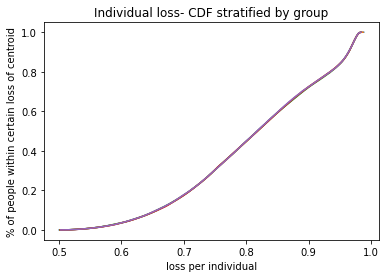

c  {0: (4.380162385520134, 3.7026431496634578), 1: (-9.241042630478029, -9.037296911836805), 2: (-10.654828047482082, 6.753552314145731), 3: (9.636003826594854, -3.431514061201049), 4: (-1.9177689449624997, 8.501330952608164), 5: (-2.1807139660236534, 2.0544953373645125), 6: (2.3071883982900734, 9.31974897950638), 7: (4.827646021909307, -1.2811310727608554), 8: (-8.030391942571406, -7.1887366930485275), 9: (6.653778583964808, 7.914657597780546)}
weights:  [0.19999917 0.20001865 0.20002302 0.20002259 0.19993656]
Time elapsed Batch Step:  0.3455343246459961
Time elapsed Assignment Step:  2.298490047454834
0.0007648037651228901
total:  0.5693743312850696


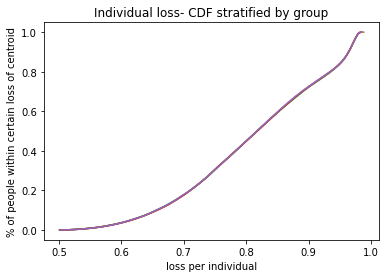

c  {0: (4.379445639524571, 3.7022723576917116), 1: (-9.239835662441424, -9.036168332421338), 2: (-10.6528731697337, 6.7533115938143), 3: (9.635326527034962, -3.429511240670444), 4: (-1.9164674457961417, 8.50014862064715), 5: (-2.1796301913633696, 2.0557245159889552), 6: (2.305735203206377, 9.318322659962574), 7: (4.827853883281441, -1.2798870467723422), 8: (-8.031194867570969, -7.190265573315671), 9: (6.651923285150798, 7.913853176821615)}
weights:  [0.19999916 0.20001865 0.20002311 0.20002269 0.19993639]
Time elapsed Batch Step:  0.36002540588378906
Time elapsed Assignment Step:  2.2986509799957275
0.000768536469847092
total:  0.5692406037253761


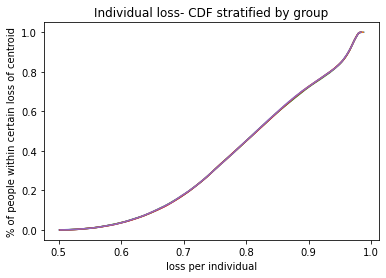

c  {0: (4.3787286997593435, 3.7019015624594185), 1: (-9.23863000250626, -9.035040902269701), 2: (-10.650919826277004, 6.753071166140534), 3: (9.634649507265198, -3.4275092636616895), 4: (-1.9151670623067085, 8.498967287392285), 5: (-2.1785467918089254, 2.05695339521825), 6: (2.304282411962273, 9.316896804690543), 7: (4.828061928065409, -1.2786429425620065), 8: (-8.031996504392488, -7.191792013388976), 9: (6.650069000491201, 7.913049252312287)}
weights:  [0.19999914 0.20001865 0.2000232  0.20002279 0.19993622]
Time elapsed Batch Step:  0.3446919918060303
Time elapsed Assignment Step:  2.3184659481048584
0.0007959983741123722
total:  0.5691140811263546


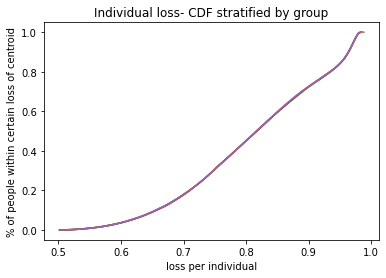

c  {0: (4.378011566197321, 3.7015307640222193), 1: (-9.237425653085921, -9.033914623546842), 2: (-10.648968026186191, 6.752831032806555), 3: (9.633972771145695, -3.425508140668111), 4: (-1.9138677979903254, 8.497786955650879), 5: (-2.17746376987997, 2.058181971790011), 6: (2.3028300295357167, 9.315471418917229), 7: (4.8282701564046135, -1.2773987611927264), 8: (-8.032796850935647, -7.193316010922269), 9: (6.648215738076475, 7.912245828361306)}
weights:  [0.19999913 0.20001866 0.20002329 0.20002289 0.19993604]
Time elapsed Batch Step:  0.3541090488433838
Time elapsed Assignment Step:  2.31365966796875
0.0008290207927219573
total:  0.5689893143260757


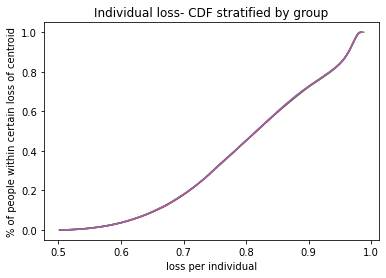

c  {0: (4.3772942388114995, 3.7011599624357783), 1: (-9.23622261660058, -9.032789498427686), 2: (-10.647017778552515, 6.752591195495227), 3: (9.633296322547368, -3.4235078822180616), 4: (-1.9125696563213537, 8.496607628219335), 5: (-2.1763811280894525, 2.0594102424401988), 6: (2.301378060905877, 9.314046507866806), 7: (4.828478568443207, -1.2761545037283664), 8: (-8.033595905115915, -7.194837563583909), 9: (6.646363506003426, 7.911442909082651)}
weights:  [0.19999911 0.20001866 0.20002337 0.20002299 0.19993587]
Time elapsed Batch Step:  0.3519573211669922
Time elapsed Assignment Step:  2.306448459625244
0.0008454246362574747
total:  0.5688596507243594


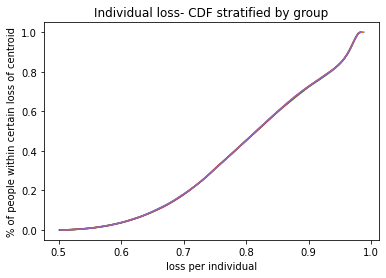

c  {0: (4.376576717575002, 3.700789157755783), 1: (-9.235020895477048, -9.031665529096971), 2: (-10.645069092483945, 6.75235165588995), 3: (9.632620165351621, -3.4215084988749767), 4: (-1.911272640752464, 8.49542930788332), 5: (-2.1752988689434134, 2.0606382039033186), 6: (2.2999265110533473, 9.312622076760498), 7: (4.828687164326103, -1.2749101712337456), 8: (-8.034393664864533, -7.19635666905676), 9: (6.644512312374976, 7.91064049859528)}
weights:  [0.19999909 0.20001866 0.20002346 0.20002309 0.19993569]
Time elapsed Batch Step:  0.34307146072387695
Time elapsed Assignment Step:  2.343151092529297
0.0008770941556667244
total:  0.568734656798118


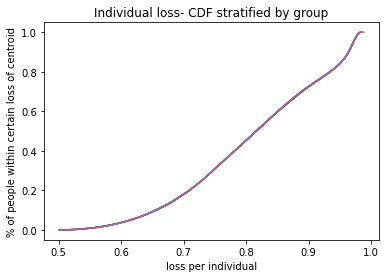

c  {0: (4.375859002461083, 3.700418350037943), 1: (-9.233820492148617, -9.030542717749087), 2: (-10.64312197710483, 6.752112415674475), 3: (9.631944303449979, -3.41951000123744), 4: (-1.909976754714721, 8.494251997417935), 5: (-2.174216994940769, 2.061865852912621), 6: (2.2984753849603674, 9.311198130816386), 7: (4.828895944198985, -1.2736657647746055), 8: (-8.03519012812851, -7.197873325038169), 9: (6.6426621652999325, 7.9098386010228845)}
weights:  [0.19999908 0.20001867 0.20002355 0.20002319 0.19993552]
Time elapsed Batch Step:  0.376476526260376
Time elapsed Assignment Step:  2.4873549938201904
0.0008906886815196469
total:  0.5686043308346731


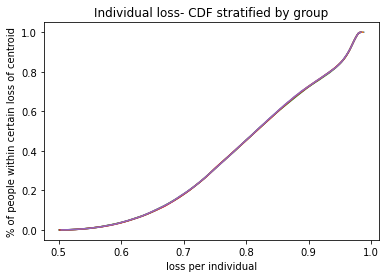

c  {0: (4.3751410934431245, 3.7000475393379912), 1: (-9.232621409054914, -9.02942106658792), 2: (-10.641176441555542, 6.751873476532698), 3: (9.631268740743609, -3.417512399939251), 4: (-1.9086820016176786, 8.493075699587889), 5: (-2.173135508573094, 2.0630931862003137), 6: (2.2970246876110543, 9.309774675249257), 7: (4.829104908208313, -1.2724212854175776), 8: (-8.035985292870611, -7.1993875292399485), 9: (6.640813072892744, 7.90903722049363)}
weights:  [0.19999906 0.20001867 0.20002364 0.20002329 0.19993535]
Time elapsed Batch Step:  0.3805878162384033
Time elapsed Assignment Step:  2.4026691913604736
0.0008619401634664126
total:  0.5684614031880876


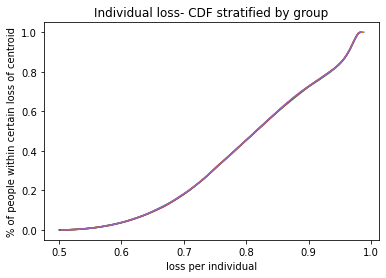

c  {0: (4.374422990494638, 3.699676725711683), 1: (-9.231423648641744, -9.028300577826688), 2: (-10.63923249499213, 6.751634840148478), 3: (9.630593481142665, -3.415515705649501), 4: (-1.90739077259226, 8.49189466152412), 5: (-2.1720544123244028, 2.064320200497779), 6: (2.2955767258318955, 9.308354209620873), 7: (4.829314056501336, -1.2711767342301508), 8: (-8.036779157069349, -7.200899279388358), 9: (6.638965043273263, 7.908236361139895)}
weights:  [0.19999904 0.20001867 0.20002373 0.20002339 0.19993517]
Time elapsed Batch Step:  0.36225175857543945
Time elapsed Assignment Step:  2.3204545974731445
0.0008602538509407953
total:  0.5683266875983638


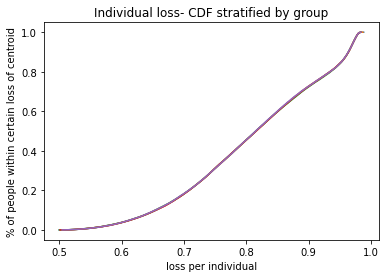

c  {0: (4.373704693589266, 3.699305909214796), 1: (-9.230227213360937, -9.027181253687779), 2: (-10.637290146585952, 6.751396508205431), 3: (9.629918528565337, -3.4135199290726574), 4: (-1.9061007038322224, 8.490714662140974), 5: (-2.170973708670924, 2.0655468925358016), 6: (2.2941291875704057, 9.306934229207602), 7: (4.8295233892260985, -1.2699321122806373), 8: (-8.037571718718976, -7.202408573224099), 9: (6.6371180845665005, 7.907436027098003)}
weights:  [0.19999902 0.20001867 0.20002383 0.20002349 0.199935  ]
Time elapsed Batch Step:  0.3975231647491455
Time elapsed Assignment Step:  2.3855276107788086
0.0008786399577661586
total:  0.568198089640614


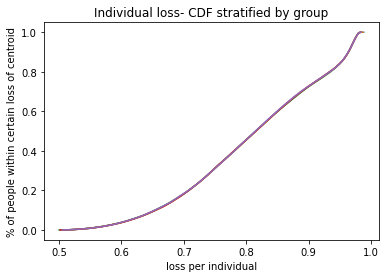

c  {0: (4.37298620270078, 3.698935089903132), 1: (-9.229032105670191, -9.026063096402595), 2: (-10.635349405523312, 6.751158482386744), 3: (9.629243886936386, -3.4115250809486404), 4: (-1.904811798689131, 8.48953570419152), 5: (-2.1698934000808774, 2.0667732590448025), 6: (2.292682077761916, 9.305514739155521), 7: (4.829732906531448, -1.26868742063814), 8: (-8.03836297582948, -7.2039154085023025), 9: (6.635272204902376, 7.906636222507948)}
weights:  [0.199999   0.20001867 0.20002392 0.20002359 0.19993482]
Time elapsed Batch Step:  0.354656457901001
Time elapsed Assignment Step:  2.3347601890563965
0.0008594208757805033
total:  0.5680583054521833


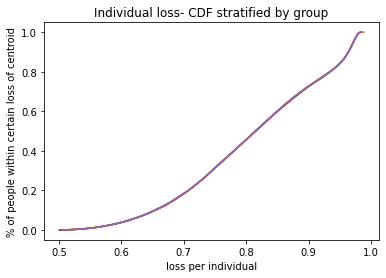

c  {0: (4.372267517803083, 3.6985642678325146), 1: (-9.227838328032927, -9.02494610821139), 2: (-10.633410281005082, 6.7509207643749765), 3: (9.628569560184713, -3.409531172052859), 4: (-1.9035240604930375, 8.488357790418831), 5: (-2.1688134890142434, 2.067999296755084), 6: (2.291235401344818, 9.304095744607196), 7: (4.829942608567046, -1.267442660372517), 8: (-8.039152926426574, -7.205419782992525), 9: (6.633427412415465, 7.9058369515131215)}
weights:  [0.19999898 0.20001867 0.20002402 0.20002369 0.19993464]
Time elapsed Batch Step:  0.34969401359558105
Time elapsed Assignment Step:  2.2518882751464844
0.0008255644992786193
total:  0.5679142265483333


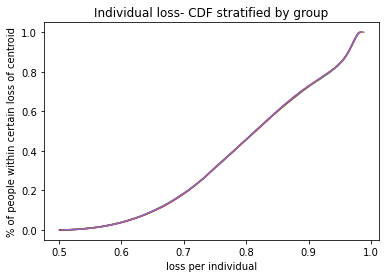

c  {0: (4.371548638870209, 3.698193443058789), 1: (-9.226645882918127, -9.023830291363108), 2: (-10.63147278224632, 6.75068335585187), 3: (9.627895552239005, -3.407538213196062), 4: (-1.9022374925526289, 8.487180923556162), 5: (-2.1677339779225364, 2.0692250023970833), 6: (2.2897891632608305, 9.3026772507016), 7: (4.8301524954833726, -1.2661978325543477), 8: (-8.039941568551692, -7.206921694478753), 9: (6.6315837152447425, 7.905038218260029)}
weights:  [0.19999896 0.20001866 0.20002411 0.20002379 0.19993447]
Time elapsed Batch Step:  0.35325074195861816
Time elapsed Assignment Step:  2.3316092491149902
0.0008321986244693713
total:  0.567782392020763


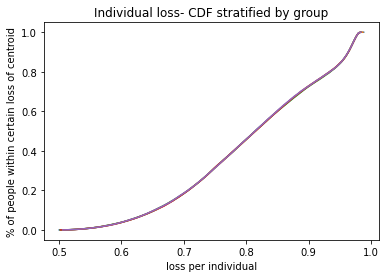

c  {0: (4.370829565876323, 3.6978226156378247), 1: (-9.225454772800187, -9.02271564811522), 2: (-10.629536918475884, 6.750446258498154), 3: (9.627221867019243, -3.405546215223514), 4: (-1.900952098155388, 8.4860051063271), 5: (-2.1666548692485748, 2.0704503727016363), 6: (2.2883433684552674, 9.301259262574048), 7: (4.830362567431738, -1.2649529382548974), 8: (-8.04072890026198, -7.208421140759403), 9: (6.6297411215333275, 7.904240026898001)}
weights:  [0.19999895 0.20001866 0.20002421 0.2000239  0.19993429]
Time elapsed Batch Step:  0.39220094680786133
Time elapsed Assignment Step:  2.462728500366211
0.0008141805540051728
total:  0.5676432607345124


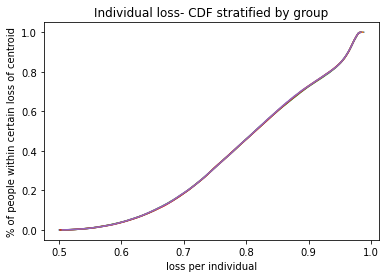

c  {0: (4.370110298795723, 3.6974517856255122), 1: (-9.224265000158757, -9.021602180733568), 2: (-10.627602698936034, 6.7502094739933485), 3: (9.626548508418454, -3.403555189011612), 4: (-1.8996678805677598, 8.484830341445734), 5: (-2.1655761654262506, 2.0716754044002497), 6: (2.286898021877314, 9.299841785356156), 7: (4.830572824564285, -1.263707978546082), 8: (-8.041514919630297, -7.209918119647327), 9: (6.627899639428214, 7.903442381578903)}
weights:  [0.19999893 0.20001866 0.2000243  0.200024   0.19993411]
Time elapsed Batch Step:  0.35497283935546875
Time elapsed Assignment Step:  2.378230571746826
0.000800389292003767
total:  0.5675054975701945


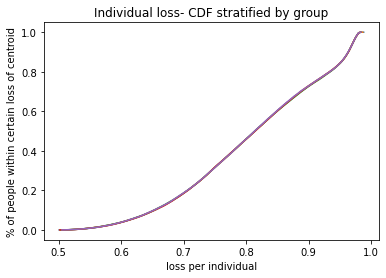

c  {0: (4.369390837602837, 3.6970809530777657), 1: (-9.223076567478593, -9.020489891492199), 2: (-10.625670132882036, 6.749973004015576), 3: (9.625875480259673, -3.401565145454118), 4: (-1.898384843035326, 8.483656631616808), 5: (-2.1644978688803, 2.072900094225385), 6: (2.285453128480303, 9.298424824175806), 7: (4.8307832670340005, -1.262462954500432), 8: (-8.0422996247452, -7.211412628969825), 9: (6.626059277080007, 7.9026452864568375)}
weights:  [0.19999891 0.20001866 0.2000244  0.2000241  0.19993393]
Time elapsed Batch Step:  0.3520996570587158
Time elapsed Assignment Step:  2.3036539554595947
0.0008458155069194229
total:  0.5673856006527662


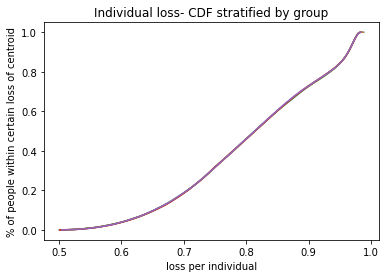

c  {0: (4.368671182272228, 3.6967101180505213), 1: (-9.221889477249396, -9.019378782673202), 2: (-10.623739229581744, 6.749736850241364), 3: (9.625202786190256, -3.3995760954035665), 4: (-1.8971029887829873, 8.482483979535875), 5: (-2.1634199820260758, 2.0741244389107534), 6: (2.2840086932219927, 9.297008384157127), 7: (4.8309938949947195, -1.2612178671910557), 8: (-8.043083013710946, -7.212904666568657), 9: (6.624220042642651, 7.901848745687845)}
weights:  [0.19999889 0.20001866 0.2000245  0.20002421 0.19993375]
Time elapsed Batch Step:  0.3435654640197754
Time elapsed Assignment Step:  2.3193278312683105
0.0008803564167213507
total:  0.5672625408070027


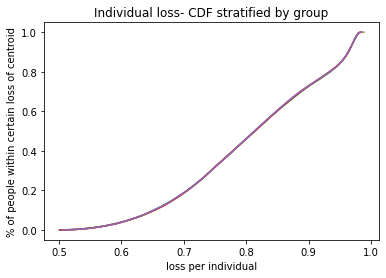

c  {0: (4.367951332778591, 3.6963392805997377), 1: (-9.220703731965665, -9.018268856566557), 2: (-10.621809998315198, 6.749501014345452), 3: (9.624530429470425, -3.3975880494444124), 4: (-1.8958223210151504, 8.481312387889448), 5: (-2.1623425072693205, 2.0753484351916183), 6: (2.2825647210648503, 9.295592470420502), 7: (4.831204708601133, -1.2599727176916033), 8: (-8.043865084647493, -7.21439423030006), 9: (6.622381944273158, 7.901052763429594)}
weights:  [0.19999888 0.20001865 0.20002459 0.20002431 0.19993357]
Time elapsed Batch Step:  0.3400754928588867
Time elapsed Assignment Step:  2.301661729812622
0.0008646572080772685
total:  0.5671245126848391


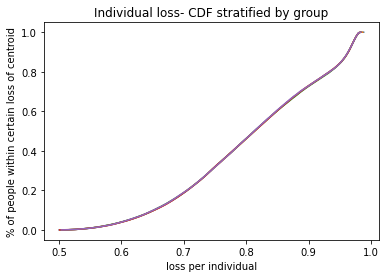

c  {0: (4.367231289096754, 3.6959684407813955), 1: (-9.219519334126538, -9.017160115469961), 2: (-10.619882448374188, 6.7492654980006), 3: (9.623858412847962, -3.395601017385372), 4: (-1.8945428429159226, 8.480141859355147), 5: (-2.161265447005946, 2.076572079805112), 6: (2.281121216976332, 9.294177088082577), 7: (4.831415708008793, -1.2587275070762296), 8: (-8.044645835690488, -7.215881318034767), 9: (6.620544990131324, 7.900257343841074)}
weights:  [0.19999886 0.20001865 0.20002469 0.20002442 0.19993339]
Time elapsed Batch Step:  0.3410985469818115
Time elapsed Assignment Step:  2.282597064971924
0.0008118157990145702
total:  0.5669754460625835


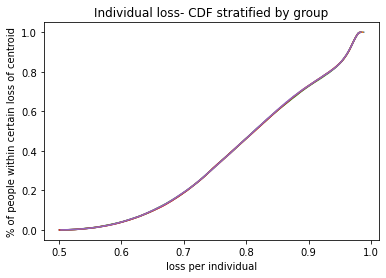

c  {0: (4.3665110512016785, 3.695597598651498), 1: (-9.218336286235639, -9.016052561688674), 2: (-10.617956589061832, 6.74903030287739), 3: (9.623186738877074, -3.3936150080281102), 4: (-1.893264557649311, 8.478972396601842), 5: (-2.160188803621812, 2.0777953694905604), 6: (2.279678185929165, 9.292762242256297), 7: (4.831626893374119, -1.257482236419556), 8: (-8.04542526499127, -7.217365927658026), 9: (6.618709188379451, 7.899462491082276)}
weights:  [0.19999884 0.20001864 0.20002478 0.20002453 0.19993321]
Time elapsed Batch Step:  0.35022616386413574
Time elapsed Assignment Step:  2.301856517791748
0.0008283158735544749
total:  0.5668472872654374


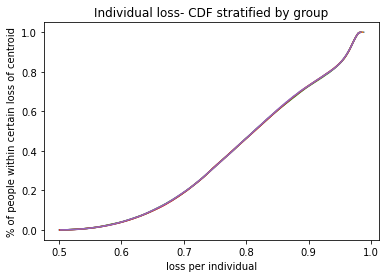

c  {0: (4.365790619068462, 3.695226754266071), 1: (-9.21715459080092, -9.014946197535357), 2: (-10.616032429692138, 6.748795430644035), 3: (9.622515410229271, -3.391630029586448), 4: (-1.8919874683594267, 8.477804002289787), 5: (-2.159112579492517, 2.0790183009898198), 6: (2.2782356329016284, 9.291347938050945), 7: (4.831838264854403, -1.2562369067966328), 8: (-8.046203370716864, -7.218848057069631), 9: (6.616874547182057, 7.89866820931388)}
weights:  [0.19999883 0.20001864 0.20002488 0.20002463 0.19993302]
Time elapsed Batch Step:  0.339158296585083
Time elapsed Assignment Step:  2.3082995414733887
0.0007838127290502594
total:  0.5667009336561766


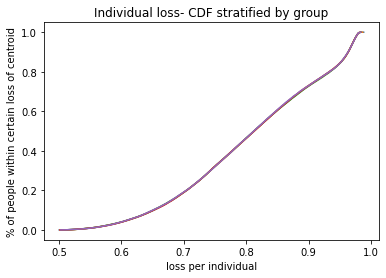

c  {0: (4.365069992672334, 3.6948559076811622), 1: (-9.215974250334513, -9.013841025329903), 2: (-10.614109979589568, 6.748560882966186), 3: (9.621844429703547, -3.389646090076114), 4: (-1.890711578170693, 8.476636679070758), 5: (-2.1580367769831885, 2.080240871047623), 6: (2.2767935628778324, 9.289934180572205), 7: (4.832049822607815, -1.2549915192829018), 8: (-8.046980151049985, -7.220327704183946), 9: (6.615041074705592, 7.897874502696922)}
weights:  [0.19999881 0.20001863 0.20002497 0.20002474 0.19993284]
Time elapsed Batch Step:  0.34261345863342285
Time elapsed Assignment Step:  2.314554214477539
0.000757847619522245
total:  0.5665601391838443


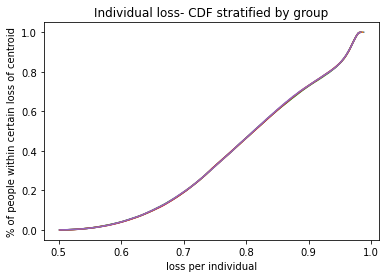

c  {0: (4.36434917198866, 3.694485058952842), 1: (-9.21479526735257, -9.012737047399286), 2: (-10.612189248088573, 6.748326661506733), 3: (9.62117380017232, -3.3876631974690246), 4: (-1.889436890188058, 8.47547042958818), 5: (-2.1569613984482863, 2.081463076411935), 6: (2.275330899982382, 9.288518796142105), 7: (4.832261566793409, -1.2537460749541562), 8: (-8.047755604189033, -7.221804866929937), 9: (6.6132128232828045, 7.897085450423857)}
weights:  [0.1999988  0.20001863 0.20002507 0.20002485 0.19993265]
Time elapsed Batch Step:  0.3494243621826172
Time elapsed Assignment Step:  2.2925803661346436
0.0007639880463821136
total:  0.5664290836449095


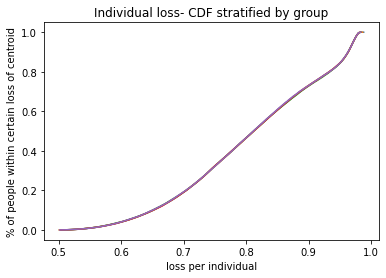

c  {0: (4.363628156992941, 3.694114208137202), 1: (-9.213617644375109, -9.01163426607739), 2: (-10.61027024453315, 6.748092767925617), 3: (9.620503524548887, -3.3856813597440656), 4: (-1.8881634074972107, 8.474305256477255), 5: (-2.1558864462314125, 2.082684913834322), 6: (2.273868744439092, 9.28710395785745), 7: (4.832473497571122, -1.2525005748865035), 8: (-8.0485297283481, -7.223279543251206), 9: (6.6113857264599964, 7.896296967654009)}
weights:  [0.19999878 0.20001862 0.20002516 0.20002496 0.19993247]
Time elapsed Batch Step:  0.3654060363769531
Time elapsed Assignment Step:  2.3072218894958496
0.0007852231747468297
total:  0.566302664946865


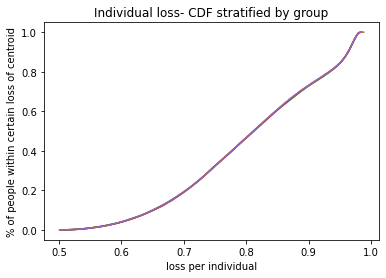

c  {0: (4.362906947660813, 3.693743355290357), 1: (-9.212441383925855, -9.010532683704856), 2: (-10.608352978276368, 6.74785920387963), 3: (9.619833605771483, -3.3837005849048776), 4: (-1.886891133164799, 8.473141162365078), 5: (-2.1548119226651337, 2.0839063800703244), 6: (2.2724071014121394, 9.285689670909026), 7: (4.832685615101786, -1.2512550201563246), 8: (-8.049302521756962, -7.224751731106022), 9: (6.609559792298997, 7.895509058487348)}
weights:  [0.19999877 0.20001862 0.20002526 0.20002507 0.19993228]
Time elapsed Batch Step:  0.3528897762298584
Time elapsed Assignment Step:  2.3233041763305664
0.0007599207438712119
total:  0.5661623948682545


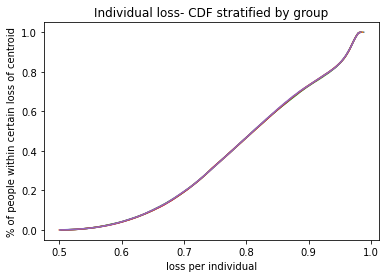

c  {0: (4.362185543968049, 3.693372500468444), 1: (-9.211266488532091, -9.00943230262891), 2: (-10.606437458679904, 6.74762597102222), 3: (9.619164046795234, -3.381720880986728), 4: (-1.8856200702386519, 8.471978149870756), 5: (-2.1537378300708134, 2.085127471879842), 6: (2.2709459760730115, 9.284275940484571), 7: (4.832897919547125, -1.2500094118402358), 8: (-8.050073982661086, -7.226221428467371), 9: (6.607735028862826, 7.8947217270231365)}
weights:  [0.19999875 0.20001861 0.20002535 0.20002518 0.1999321 ]
Time elapsed Batch Step:  0.34502530097961426
Time elapsed Assignment Step:  2.3278658390045166
0.0007563936586144626
total:  0.5660287675067249


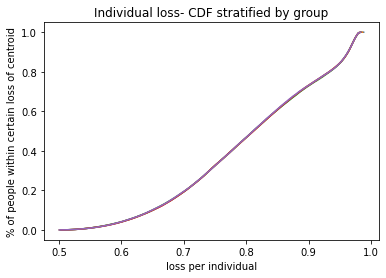

c  {0: (4.3614639458905575, 3.693001643727621), 1: (-9.2100929607245, -9.008333125203213), 2: (-10.60452369511356, 6.7473930710033025), 3: (9.618494850587732, -3.3797422560593358), 4: (-1.8843502217480008, 8.47081622160552), 5: (-2.152664170758458, 2.086348186027525), 6: (2.269485373600775, 9.282862771768912), 7: (4.833110411069759, -1.2487637510150478), 8: (-8.050844109321629, -7.227688633322982), 9: (6.60591144421539, 7.8939349773595975)}
weights:  [0.19999874 0.20001861 0.20002545 0.20002529 0.19993191]
Time elapsed Batch Step:  0.3372619152069092
Time elapsed Assignment Step:  2.4032390117645264
0.0007483910321283149
total:  0.5658939089448597


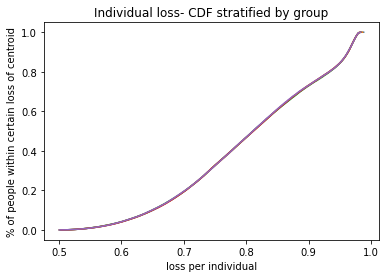

c  {0: (4.360742153404385, 3.692630785124069), 1: (-9.208920803037007, -9.007235153787686), 2: (-10.602611696954774, 6.747160505469059), 3: (9.617826020126321, -3.3777647182280046), 4: (-1.883081590703706, 8.469655380172831), 5: (-2.15159094702658, 2.0875685192831748), 6: (2.2680252991823426, 9.2814501699441), 7: (4.833323089833211, -1.2475180387577263), 8: (-8.051612900015446, -7.2291533436753825), 9: (6.604089046421176, 7.893148813593574)}
weights:  [0.19999873 0.20001861 0.20002554 0.2000254  0.19993172]
Time elapsed Batch Step:  0.3370480537414551
Time elapsed Assignment Step:  2.3076207637786865
0.0007664125886280848
total:  0.5657669703164644


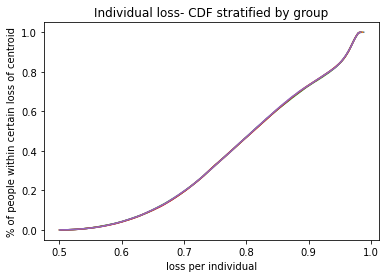

c  {0: (4.3600201664857146, 3.6922599247139907), 1: (-9.207750018006625, -9.00613839074836), 2: (-10.600701473588133, 6.746928276061743), 3: (9.617157558396272, -3.3757882756339774), 4: (-1.881814180098481, 8.468495628168478), 5: (-2.1505181611620725, 2.0887884684221465), 6: (2.2665657580127303, 9.280038140189568), 7: (4.833535956001903, -1.2462722761453513), 8: (-8.052380353035087, -7.230615557541938), 9: (6.602267843544947, 7.892363239820186)}
weights:  [0.19999871 0.2000186  0.20002564 0.20002551 0.19993153]
Time elapsed Batch Step:  0.3368966579437256
Time elapsed Assignment Step:  2.316891670227051
0.0007546709812886743
total:  0.5656312173356395


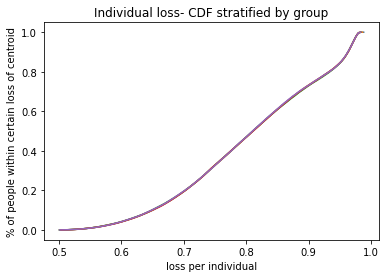

c  {0: (4.3592979851108655, 3.6918890625536105), 1: (-9.206580608173297, -9.005042838457205), 2: (-10.598793034404865, 6.74669638441949), 3: (9.61648946838941, -3.3738129364543887), 4: (-1.8805479929071194, 8.467336968180682), 5: (-2.1494458154401084, 2.0900080302257593), 6: (2.2651067552953092, 9.278626687682287), 7: (4.833749009741161, -1.2450264642550766), 8: (-8.053146466688805, -7.2320752729549005), 9: (6.600447843651422, 7.891578260132488)}
weights:  [0.1999987  0.2000186  0.20002573 0.20002562 0.19993135]
Time elapsed Batch Step:  0.3509688377380371
Time elapsed Assignment Step:  2.333125591278076
0.0007690388226765377
total:  0.5655034126024443


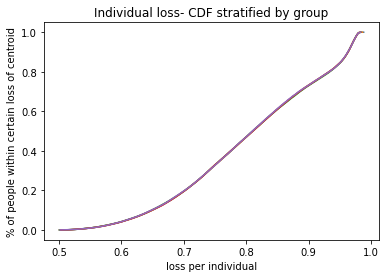

c  {0: (4.358575609256297, 3.691518198699175), 1: (-9.205412576079747, -9.003948499291978), 2: (-10.596886388802337, 6.746464832176117), 3: (9.615821753102995, -3.3718387089019934), 4: (-1.879283032086722, 8.466179402790187), 5: (-2.148373912124052, 2.091227201481709), 6: (2.2636482962420503, 9.277215817596938), 7: (4.8339622512172165, -1.2437806041640889), 8: (-8.05391123930056, -7.23353248796146), 9: (6.598629054804961, 7.890793878621116)}
weights:  [0.19999869 0.20001859 0.20002583 0.20002573 0.19993116]
Time elapsed Batch Step:  0.34728097915649414
Time elapsed Assignment Step:  2.248805522918701
0.0007789832205937763
total:  0.5653743967794311


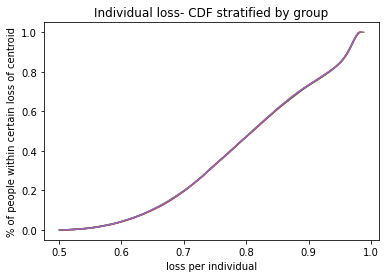

c  {0: (4.357853038898606, 3.691147333206953), 1: (-9.20424592427131, -9.002855375636052), 2: (-10.594981546183533, 6.74623362096093), 3: (9.615154415538743, -3.36986560122476), 4: (-1.8780193005769223, 8.46502293457035), 5: (-2.1473024534653953, 2.092445978984483), 6: (2.262190386073761, 9.275805535106084), 7: (4.834175680597206, -1.2425346969495672), 8: (-8.054674669210021, -7.234987200623796), 9: (6.596811485069247, 7.8900100993739395)}
weights:  [0.19999867 0.20001859 0.20002592 0.20002584 0.19993098]
Time elapsed Batch Step:  0.3673591613769531
Time elapsed Assignment Step:  2.2827844619750977
0.0007409236115234474
total:  0.5652310957115068


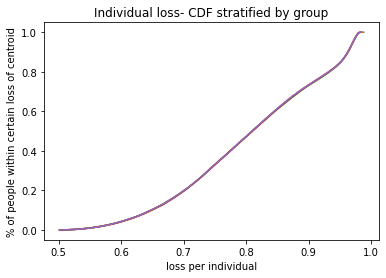

c  {0: (4.357130274014527, 3.6907764661332347), 1: (-9.20308065529579, -9.001763469878258), 2: (-10.593078515956531, 6.746002752398528), 3: (9.614487458701921, -3.3678936217053668), 4: (-1.8767568013001135, 8.463867566087218), 5: (-2.146231441703714, 2.093664359535774), 6: (2.260733030020312, 9.274395845380361), 7: (4.834389298049173, -1.2412887436886406), 8: (-8.05543675477258, -7.23643940901913), 9: (6.594995142506953, 7.8892269264757084)}
weights:  [0.19999866 0.20001858 0.20002602 0.20002595 0.19993079]
Time elapsed Batch Step:  0.3653841018676758
Time elapsed Assignment Step:  2.287654399871826
0.0007439935528613661
total:  0.5651002506800274


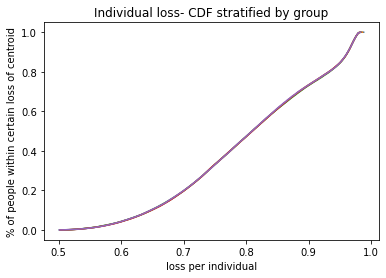

c  {0: (4.356407314580937, 3.690405597534332), 1: (-9.20191677170329, -9.000672784412723), 2: (-10.591177307533977, 6.745772228108612), 3: (9.61382088560048, -3.3659227786606283), 4: (-1.875495537161673, 8.462713299899622), 5: (-2.1451608790666463, 2.0948823399448955), 6: (2.2592762333208602, 9.272986753588668), 7: (4.8346031037420625, -1.240042745458348), 8: (-8.05619749435935, -7.2378891112397845), 9: (6.593180035179417, 7.888444364007695)}
weights:  [0.19999864 0.20001858 0.20002612 0.20002606 0.19993061]
Time elapsed Batch Step:  0.3778383731842041
Time elapsed Assignment Step:  2.3050789833068848
0.00075229063912019
total:  0.5649710923621801


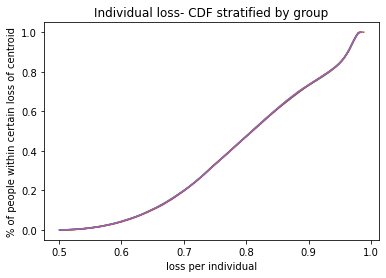

c  {0: (4.3556841605748495, 3.690034727466579), 1: (-9.20075427604607, -8.999583321638712), 2: (-10.589277930332539, 6.745542049705784), 3: (9.6131546992442, -3.3639530804408633), 4: (-1.874235511050187, 8.46156013855924), 5: (-2.144090767769898, 2.096099917029191), 6: (2.257820001224057, 9.271578264898364), 7: (4.834817097845728, -1.2387967033355956), 8: (-8.056956886357176, -7.239336305393238), 9: (6.591366171146305, 7.887662416047332)}
weights:  [0.19999863 0.20001857 0.20002621 0.20002616 0.19993042]
Time elapsed Batch Step:  0.35053300857543945
Time elapsed Assignment Step:  2.311321973800659
0.0007874152406780466
total:  0.5648501020837955


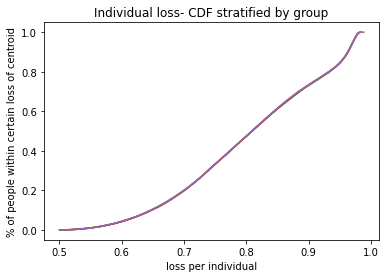

c  {0: (4.3549608119734184, 3.689663855986331), 1: (-9.199593170878371, -8.998495083960458), 2: (-10.587380393772362, 6.745312218799359), 3: (9.612488902643841, -3.3619845354292064), 4: (-1.8729767258376724, 8.460408084610673), 5: (-2.1430211100172687, 2.0973170876144396), 6: (2.2563643389882526, 9.27017038447547), 7: (4.835031280530923, -1.2375506183971152), 8: (-8.05771492916864, -7.240780989602185), 9: (6.589553558465274, 7.88688108666786)}
weights:  [0.19999862 0.20001856 0.2000263  0.20002627 0.19993024]
Time elapsed Batch Step:  0.3419520854949951
Time elapsed Assignment Step:  2.337134599685669
0.0007739594878876099
total:  0.5647146592284318


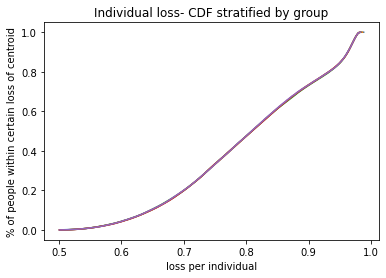

c  {0: (4.3542372687539395, 3.689292983149966), 1: (-9.198433458756277, -8.99740807378701), 2: (-10.585484707276514, 6.745082736993169), 3: (9.611823498810278, -3.360017152040871), 4: (-1.8717191843797987, 8.45925714059152), 5: (-2.141951908000706, 2.0985338485352547), 6: (2.2549092518816876, 9.268763117484877), 7: (4.835245651969303, -1.2363044917194235), 8: (-8.058471621212071, -7.242223162004602), 9: (6.587742205191625, 7.886100379937956)}
weights:  [0.1999986  0.20001856 0.2000264  0.20002638 0.19993006]
Time elapsed Batch Step:  0.34641098976135254
Time elapsed Assignment Step:  2.3728854656219482
0.000809530483678822
total:  0.5645940465995117


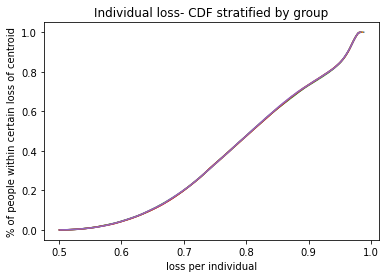

c  {0: (4.3535135308938475, 3.688922109013882), 1: (-9.197275142237544, -8.996322293532065), 2: (-10.583590880270423, 6.744853605885366), 3: (9.611158490753628, -3.3580509387223576), 4: (-1.8704628895161055, 8.45810730903243), 5: (-2.1408831639003854, 2.0997501966354726), 6: (2.2534547451826783, 9.267356469090558), 7: (4.835460212333422, -1.2350583243787783), 8: (-8.059226960921556, -7.243662820753804), 9: (6.585932119377964, 7.885320299921373)}
weights:  [0.19999859 0.20001855 0.20002649 0.20002649 0.19992988]
Time elapsed Batch Step:  0.3397221565246582
Time elapsed Assignment Step:  2.3828365802764893
0.0007569665477410448
total:  0.5644471162430315


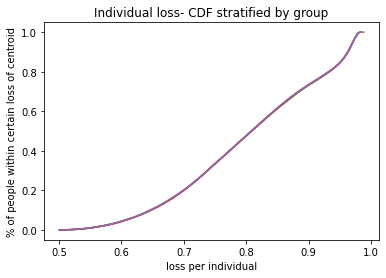

c  {0: (4.352789598370719, 3.688551233634501), 1: (-9.196118223881449, -8.995237745613812), 2: (-10.581698922181303, 6.7446248270682325), 3: (9.61049388148235, -3.3560859039506097), 4: (-1.86920784407022, 8.45695859245717), 5: (-2.1398148798848156, 2.100966128768531), 6: (2.2520008241797904, 9.265950444455783), 7: (4.835674961796729, -1.233812117451138), 8: (-8.059980946746943, -7.2450999640185145), 9: (6.584123309073842, 7.8845408506765775)}
weights:  [0.19999858 0.20001854 0.20002659 0.20002659 0.1999297 ]
Time elapsed Batch Step:  0.35837507247924805
Time elapsed Assignment Step:  2.2929718494415283
0.0007561869535243071
total:  0.5643158444815346


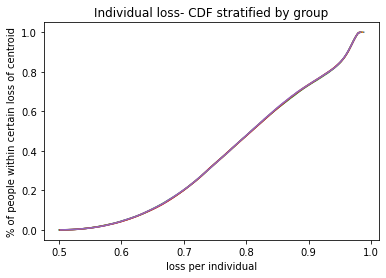

c  {0: (4.352065471162272, 3.6881803570682647), 1: (-9.194962706248631, -8.994154432454762), 2: (-10.57980884243758, 6.744396402127988), 3: (9.60982967400233, -3.3541220562321143), 4: (-1.8679540508500698, 8.455810993382677), 5: (-2.1387470581109715, 2.1021816417978334), 6: (2.250547494172004, 9.264545048743337), 7: (4.835889900533565, -1.232565872012119), 8: (-8.060733577153856, -7.246534589982929), 9: (6.582315782325405, 7.8837620362563765)}
weights:  [0.19999856 0.20001853 0.20002668 0.2000267  0.19992952]
Time elapsed Batch Step:  0.3525550365447998
Time elapsed Assignment Step:  2.3442389965057373
0.000769821513648572
total:  0.5641890203175972


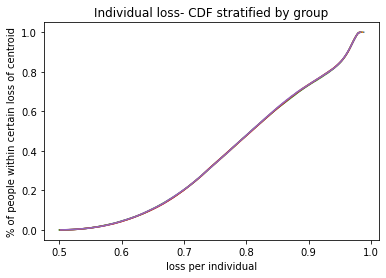

c  {0: (4.351341149246368, 3.6878094793716367), 1: (-9.193808591900932, -8.993072356481594), 2: (-10.577920650468297, 6.744168332644594), 3: (9.609165871315938, -3.3521594041019425), 4: (-1.8667015126480944, 8.454664514319116), 5: (-2.1376797007244543, 2.1033967325970986), 6: (2.2490947604688682, 9.263140287115741), 7: (4.836105028719156, -1.2313195891369535), 8: (-8.061484850623701, -7.247966696846784), 9: (6.580509547175032, 7.8829838607075535)}
weights:  [0.19999855 0.20001852 0.20002678 0.20002681 0.19992935]
Time elapsed Batch Step:  0.3529644012451172
Time elapsed Assignment Step:  2.3367884159088135
0.0007953985699606925
total:  0.5640659032572779


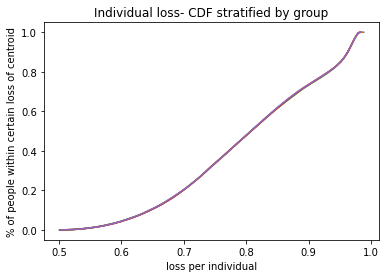

c  {0: (4.350616632601008, 3.687438600601103), 1: (-9.19265588340124, -8.991991520124996), 2: (-10.576034355702529, 6.743940620191564), 3: (9.608502476421062, -3.3501979561227264), 4: (-1.8654502322414528, 8.453519157769927), 5: (-2.136612809859675, 2.104611398050693), 6: (2.2476426283906483, 9.26173616473547), 7: (4.836320346529613, -1.2300732699004469), 8: (-8.062234765653681, -7.249396282825428), 9: (6.578704611660971, 7.882206328070501)}
weights:  [0.19999854 0.20001851 0.20002688 0.20002692 0.19992916]
Time elapsed Batch Step:  0.3450629711151123
Time elapsed Assignment Step:  2.3937795162200928
0.0008049475303053555
total:  0.5639381034080705


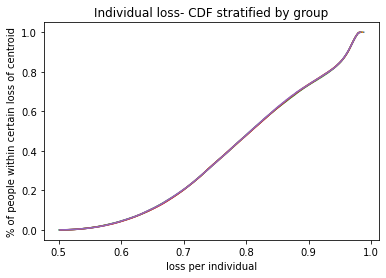

c  {0: (4.349891921204337, 3.6870677208131695), 1: (-9.191504583313332, -8.990911925819494), 2: (-10.574149967568768, 6.743713266335773), 3: (9.607839492310125, -3.348237720883573), 4: (-1.864200212392228, 8.452374926231867), 5: (-2.1355463876400673, 2.105825635053944), 6: (2.2461911032684596, 9.260332686765183), 7: (4.836535854141923, -1.2288269153769367), 8: (-8.062983320756802, -7.25082334614989), 9: (6.576900983816974, 7.881429442378847)}
weights:  [0.19999852 0.2000185  0.20002697 0.20002702 0.19992898]
Time elapsed Batch Step:  0.3467447757720947
Time elapsed Assignment Step:  2.3253655433654785
0.0007985843509670243
total:  0.5638056561176713


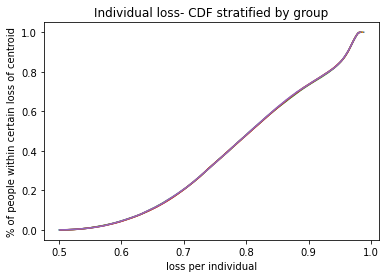

c  {0: (4.349167015034645, 3.686696840064365), 1: (-9.19035469420171, -8.989833576003305), 2: (-10.572267495494321, 6.743486272637262), 3: (9.607176921969074, -3.3462787069989015), 4: (-1.862951455847629, 8.451231822195059), 5: (-2.134480436178324, 2.1070394405134296), 6: (2.244740190444396, 9.258929858367935), 7: (4.836751551733943, -1.2275805266402495), 8: (-8.063730514461886, -7.252247885066952), 9: (6.575098671671921, 7.880653207659094)}
weights:  [0.19999851 0.20001848 0.20002707 0.20002713 0.1999288 ]
Time elapsed Batch Step:  0.3447251319885254
Time elapsed Assignment Step:  2.3411056995391846
0.0007536214880694558
total:  0.5636617567193914


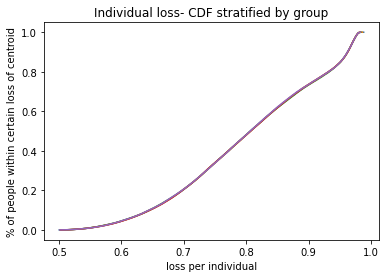

c  {0: (4.348441914070363, 3.68632595841124), 1: (-9.189206218631451, -8.988756473118158), 2: (-10.57038694890468, 6.743259640649052), 3: (9.606514768376352, -3.3443209231072113), 4: (-1.8617039653401863, 8.450089848143028), 5: (-2.133414957576657, 2.108252811347249), 6: (2.243289895271645, 9.257527684707412), 7: (4.836967439484395, -1.2263341047636598), 8: (-8.064476345313585, -7.253669897839225), 9: (6.573297683249449, 7.8798776279302425)}
weights:  [0.19999849 0.20001847 0.20002717 0.20002724 0.19992862]
Time elapsed Batch Step:  0.35956597328186035
Time elapsed Assignment Step:  2.3268957138061523
0.0007281238914901289
total:  0.5635238256241669


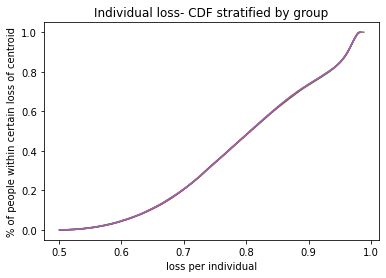

c  {0: (4.347716618290066, 3.685955075910364), 1: (-9.188059159168043, -8.987680619609154), 2: (-10.568508337222902, 6.74303337191695), 3: (9.605853034501852, -3.3423643778697674), 4: (-1.8604577435879475, 8.448949006552743), 5: (-2.1323499539270805, 2.1094657444852656), 6: (2.241840223114596, 9.256126170948146), 7: (4.837183517572855, -1.2250876508198472), 8: (-8.06522081187239, -7.25508938274522), 9: (6.571498026567567, 7.879102707203428)}
weights:  [0.19999848 0.20001846 0.20002727 0.20002735 0.19992844]
Time elapsed Batch Step:  0.34624290466308594
Time elapsed Assignment Step:  2.268488645553589
0.0006786431703663665
total:  0.5633788296639194


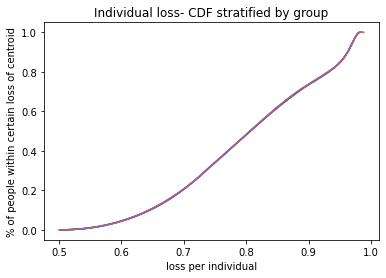

c  {0: (4.346991127672475, 3.6855841926183306), 1: (-9.186913518377226, -8.98660601792459), 2: (-10.566631669868963, 6.742807467979363), 3: (9.605191723305865, -3.3404090799692034), 4: (-1.8592127932946658, 8.447809299894644), 5: (-2.131285427311718, 2.1106782368693247), 6: (2.240391179348936, 9.25472532225574), 7: (4.837399786179751, -1.223841165880855), 8: (-8.065963912714643, -7.256506338079428), 9: (6.569699709638276, 7.878328449481552)}
weights:  [0.19999847 0.20001844 0.20002737 0.20002746 0.19992827]
Time elapsed Batch Step:  0.3648498058319092
Time elapsed Assignment Step:  2.337887763977051
0.0006715800605572309
total:  0.5632466906146636


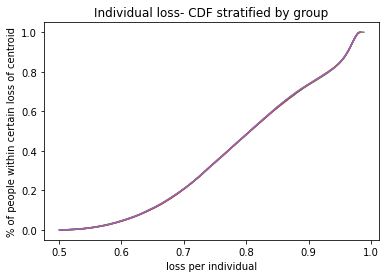

c  {0: (4.346265442196455, 3.685213308591753), 1: (-9.185769298824837, -8.985532670515804), 2: (-10.56475695625912, 6.742581930367104), 3: (9.604530837738011, -3.3384550381080396), 4: (-1.8579691171499857, 8.446670730632677), 5: (-2.1302213798031264, 2.1118902854534447), 6: (2.2389427693617407, 9.253325143797092), 7: (4.8376162454863465, -1.222594651018049), 8: (-8.066705646432554, -7.257920762152395), 9: (6.567902740467183, 7.877554858758916)}
weights:  [0.19999845 0.20001842 0.20002746 0.20002757 0.19992809]
Time elapsed Batch Step:  0.34412646293640137
Time elapsed Assignment Step:  2.3482327461242676
0.0006782139115347752
total:  0.5631187925929307


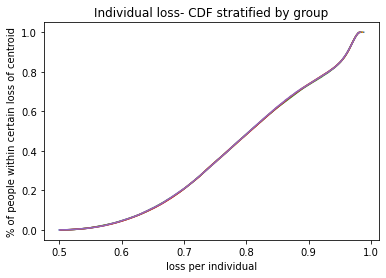

c  {0: (4.345539561841016, 3.684842423887267), 1: (-9.184626503076647, -8.984460579837014), 2: (-10.562884205805252, 6.742356760603207), 3: (9.603870380736183, -3.3365022610071082), 4: (-1.8567267178296243, 8.445533301224325), 5: (-2.1291578134646403, 2.113101887203979), 6: (2.237494998551552, 9.251925640740607), 7: (4.8378328956747385, -1.2213481073020749), 8: (-8.067446011634209, -7.259332653290797), 9: (6.566107127053104, 7.876781939020856)}
weights:  [0.19999844 0.20001841 0.20002756 0.20002768 0.19992792]
Time elapsed Batch Step:  0.34969043731689453
Time elapsed Assignment Step:  2.3084096908569336
0.0007454288112446195
total:  0.5630092013518113


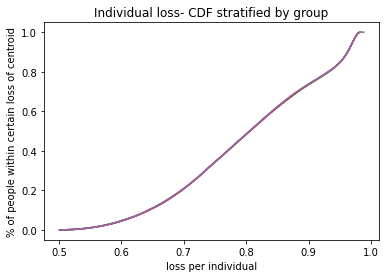

c  {0: (4.344813486585314, 3.6844715385615276), 1: (-9.183485133698204, -8.98338974834516), 2: (-10.561013427914194, 6.742131960202738), 3: (9.603210355225478, -3.3345507574038886), 4: (-1.8554855979955478, 8.444397014120629), 5: (-2.1280947303507327, 2.11431303909975), 6: (2.2360478723284483, 9.25052681825642), 7: (4.838049736927842, -1.2201015358028175), 8: (-8.068185006943583, -7.260742009837528), 9: (6.564312877387676, 7.876009694243378)}
weights:  [0.19999843 0.20001839 0.20002765 0.20002778 0.19992775]
Time elapsed Batch Step:  0.35780835151672363
Time elapsed Assignment Step:  2.3263137340545654
0.0007486037060354667
total:  0.5628805307995249


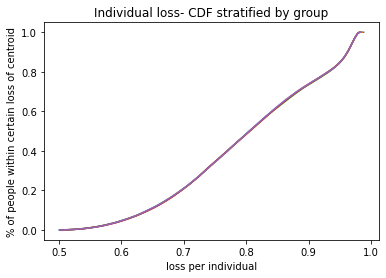

c  {0: (4.344087216408649, 3.6841006526712134), 1: (-9.18234519325467, -8.982320178499743), 2: (-10.559144631987067, 6.741907530672604), 3: (9.60255076411716, -3.3326005360507462), 4: (-1.8542457602961442, 8.443261871766218), 5: (-2.1270321325073906, 2.1155237381321523), 6: (2.2346013961141047, 9.24912868151661), 7: (4.838266769429383, -1.2188549375893605), 8: (-8.06892263100056, -7.26214883015177), 9: (6.562519999454959, 7.875238128392802)}
weights:  [0.19999842 0.20001837 0.20002775 0.20002789 0.19992757]
Time elapsed Batch Step:  0.3426837921142578
Time elapsed Assignment Step:  2.3219687938690186
0.00078776482000531
total:  0.5627627897071441


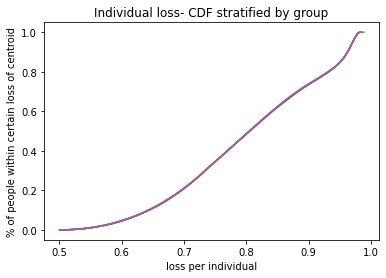

c  {0: (4.343360751290471, 3.6837297662730224), 1: (-9.181206684310672, -8.981251872762659), 2: (-10.557277827418597, 6.741683473511366), 3: (9.601891610307625, -3.330651605713078), 4: (-1.853007207366391, 8.44212787659933), 5: (-2.1259700219725026, 2.116733981305224), 6: (2.233155575341847, 9.247731235695404), 7: (4.8384839933638855, -1.2176083137299436), 8: (-8.069658882460942, -7.263553112609084), 9: (6.560728501231028, 7.874467245425394)}
weights:  [0.1999984  0.20001835 0.20002784 0.200028   0.1999274 ]
Time elapsed Batch Step:  0.35754919052124023
Time elapsed Assignment Step:  2.325495481491089
0.0007816094185173483
total:  0.5626315891983199


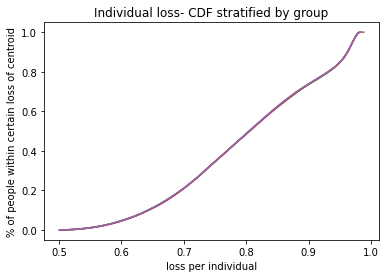

c  {0: (4.342634091210374, 3.683358879423674), 1: (-9.180069609430127, -8.98018483359805), 2: (-10.55541302359642, 6.741459790209052), 3: (9.601232896677425, -3.328703975167361), 4: (-1.8517699418280178, 8.440995031051825), 5: (-2.124908400776257, 2.1179437656356925), 6: (2.2317104154566936, 9.2463344859694), 7: (4.838701408916658, -1.216361665291924), 8: (-8.070393759996458, -7.264954855601483), 9: (6.558938390683578, 7.873697049287018)}
weights:  [0.19999839 0.20001834 0.20002793 0.20002811 0.19992723]
Time elapsed Batch Step:  0.34108567237854004
Time elapsed Assignment Step:  2.3184351921081543
0.0007827053871497514
total:  0.5625027000704597


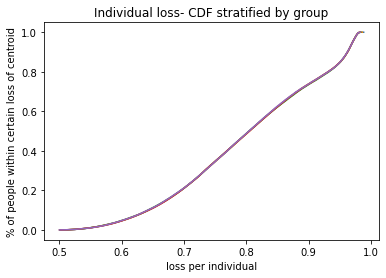

c  {0: (4.341907236148099, 3.6829879921799096), 1: (-9.178933971176097, -8.97911906347214), 2: (-10.55355022990039, 6.741236482246964), 3: (9.600574626090308, -3.3267576531991097), 4: (-1.850533966289665, 8.439863337549212), 5: (-2.1238472709415497, 2.119153088152985), 6: (2.2302659219153917, 9.244938437517762), 7: (4.838919016273784, -1.215114993341735), 8: (-8.071127262294787, -7.266354057537523), 9: (6.557149675771511, 7.872927543912776)}
weights:  [0.19999838 0.20001832 0.20002803 0.20002822 0.19992705]
Time elapsed Batch Step:  0.3549823760986328
Time elapsed Assignment Step:  2.3765382766723633
0.000815208753052854
total:  0.5623833703846354


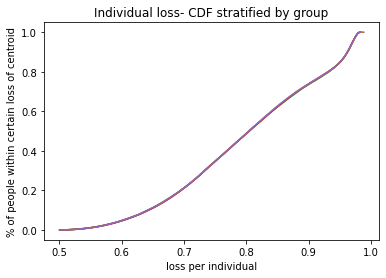

c  {0: (4.3411801860835375, 3.6826171045984903), 1: (-9.177799772110616, -8.978054564853071), 2: (-10.551689455701856, 6.741013551097491), 3: (9.599916801392336, -3.32481264860074), 4: (-1.8492992833470372, 8.43873279851066), 5: (-2.1227866344843958, 2.1203619458992136), 6: (2.2288221001864437, 9.243543095522421), 7: (4.839136815622105, -1.213868298944846), 8: (-8.071859388059568, -7.2677507168423805), 9: (6.555362364444527, 7.8721587332266605)}
weights:  [0.19999837 0.2000183  0.20002812 0.20002833 0.19992688]
Time elapsed Batch Step:  0.3527679443359375
Time elapsed Assignment Step:  2.320420265197754
0.0008470033278834554
total:  0.5622639663619513


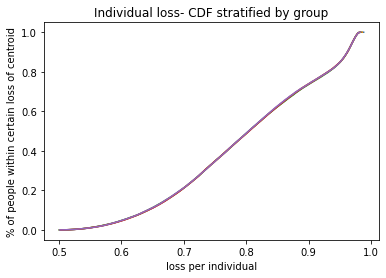

c  {0: (4.340452940996725, 3.6822462167362), 1: (-9.176667014794543, -8.976991340210748), 2: (-10.549830710362954, 6.740790998223919), 3: (9.599259425411057, -3.3228689701693535), 4: (-1.8480658955830516, 8.437603416349013), 5: (-2.121726493414347, 2.1215703359291265), 6: (2.227378955750126, 9.242148465168281), 7: (4.839354807149211, -1.2126215831657234), 8: (-8.072590136010415, -7.269144831957942), 9: (6.553576464642714, 7.871390621141206)}
weights:  [0.19999836 0.20001828 0.20002821 0.20002844 0.19992671]
Time elapsed Batch Step:  0.35204052925109863
Time elapsed Assignment Step:  2.314913034439087
0.0008176182590747816
total:  0.5621263462247034


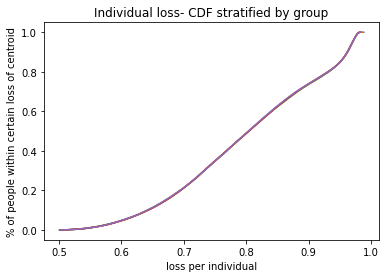

c  {0: (4.339725500867848, 3.6818753286498414), 1: (-9.175535701787393, -8.975929392016683), 2: (-10.547974003235872, 6.740568825080236), 3: (9.598602500954769, -3.320926626704439), 4: (-1.8468338055679816, 8.436475193470804), 5: (-2.120666849734911, 2.122778255310034), 6: (2.2259364940985003, 9.240754551643406), 7: (4.83957299104342, -1.2113748470677914), 8: (-8.073319504882932, -7.270536401342887), 9: (6.551791984296133, 7.8706232115571435)}
weights:  [0.19999834 0.20001826 0.20002831 0.20002855 0.19992654]
Time elapsed Batch Step:  0.3650803565979004
Time elapsed Assignment Step:  2.2961103916168213
0.0008025937997467869
total:  0.5619931725457601


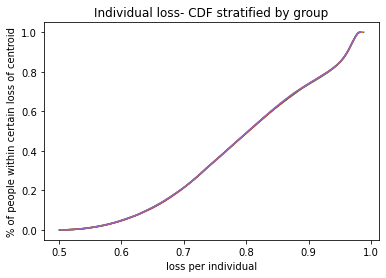

c  {0: (4.338997865677242, 3.68150444039624), 1: (-9.174405835647178, -8.974868722743832), 2: (-10.546119343662108, 6.740347033110938), 3: (9.597946030811869, -3.318985627005511), 4: (-1.8456030158595957, 8.435348132276262), 5: (-2.1196077054439684, 2.1239857011217067), 6: (2.2244947207354158, 9.23936136013921), 7: (4.839791367493768, -1.2101280917133928), 8: (-8.074047493428724, -7.271925423472773), 9: (6.550008931324399, 7.869856508363063)}
weights:  [0.19999833 0.20001825 0.2000284  0.20002866 0.19992637]
Time elapsed Batch Step:  0.3435497283935547
Time elapsed Assignment Step:  2.2901816368103027
0.0007727876074218321
total:  0.5618555470996078


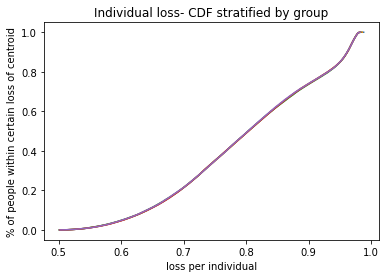

c  {0: (4.33827003540539, 3.681133552032241), 1: (-9.173277418930251, -8.973809334866434), 2: (-10.54426674097172, 6.740125623750834), 3: (9.597290017750332, -3.317045979869687), 4: (-1.844373529003291, 8.434222235159329), 5: (-2.1185490625341905, 2.1251926704562454), 6: (2.223028923535947, 9.237966331715072), 7: (4.840009936689989, -1.2088813181637508), 8: (-8.074774100415416, -7.2733118968401245), 9: (6.548227927972861, 7.869096967079487)}
weights:  [0.19999832 0.20001823 0.20002849 0.20002877 0.19992619]
Time elapsed Batch Step:  0.34812116622924805
Time elapsed Assignment Step:  2.3405678272247314
0.000750433283206009
total:  0.561720297707086


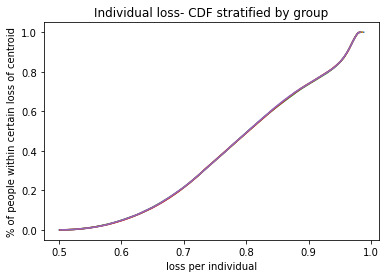

c  {0: (4.3375420100329265, 3.680762663614711), 1: (-9.172150454191142, -8.972751230859862), 2: (-10.542416204482565, 6.739904598424846), 3: (9.59663446451729, -3.315107694089226), 4: (-1.8431453475322213, 8.433097504507659), 5: (-2.11749092299345, 2.126399160417928), 6: (2.221563849850245, 9.2365720198079), 7: (4.840228698822501, -1.2076345274789315), 8: (-8.075499324626668, -7.27469581995452), 9: (6.546448338087278, 7.868338125201129)}
weights:  [0.19999831 0.20001821 0.20002859 0.20002888 0.19992602]
Time elapsed Batch Step:  0.3559448719024658
Time elapsed Assignment Step:  2.3360390663146973
0.0007334353823905682
total:  0.561586796266433


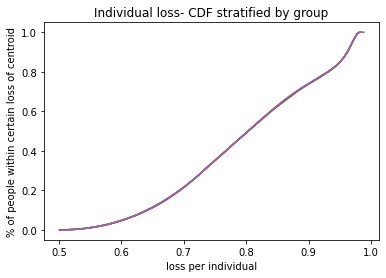

c  {0: (4.336813789540635, 3.6803917752005373), 1: (-9.171024943982399, -8.971694413200455), 2: (-10.540567743499524, 6.739683958547801), 3: (9.595979373838771, -3.3131707784490425), 4: (-1.841918473967421, 8.431973942702633), 5: (-2.1164332888052275, 2.12760516812303), 6: (2.2200995054221173, 9.235178429754718), 7: (4.840447654082386, -1.2063877207178062), 8: (-8.076223164862183, -7.276077191342677), 9: (6.544670169482785, 7.867579986530282)}
weights:  [0.1999983  0.2000182  0.20002868 0.20002899 0.19992584]
Time elapsed Batch Step:  0.35381340980529785
Time elapsed Assignment Step:  2.3216257095336914
0.0006954949709234715
total:  0.5614471536636993


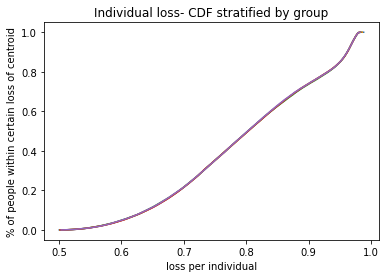

c  {0: (4.336085373909449, 3.6800208868466284), 1: (-9.169900890854427, -8.970638884365366), 2: (-10.538721367313713, 6.739463705524224), 3: (9.595324748419575, -3.3112352417242126), 4: (-1.840692910817924, 8.430851552119362), 5: (-2.115376161949009, 2.128810690699627), 6: (2.2186358960075903, 9.233785566897266), 7: (4.840666802661373, -1.2051408989380146), 8: (-8.076945619937732, -7.277456009548544), 9: (6.542893429963106, 7.86682255485628)}
weights:  [0.19999828 0.20001818 0.20002878 0.2000291  0.19992566]
Time elapsed Batch Step:  0.34511566162109375
Time elapsed Assignment Step:  2.3157551288604736
0.0006951114537538938
total:  0.5613189212000566


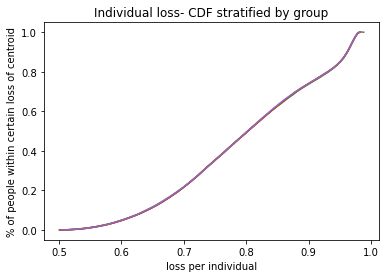

c  {0: (4.335356763120454, 3.679649998609913), 1: (-9.168778297355328, -8.969584646832402), 2: (-10.536877085201683, 6.7392438407481245), 3: (9.594670590943313, -3.309301092677496), 4: (-1.8394686605808757, 8.429730335126688), 5: (-2.1143195444006753, 2.130015725287371), 6: (2.217173027374872, 9.232393436582171), 7: (4.840886144751819, -1.2038940631959285), 8: (-8.07766668868516, -7.278832273133388), 9: (6.541118127320138, 7.866065833955194)}
weights:  [0.19999827 0.20001817 0.20002887 0.20002921 0.19992548]
Time elapsed Batch Step:  0.351665735244751
Time elapsed Assignment Step:  2.3266401290893555
0.0006830804816357894
total:  0.561187338317079


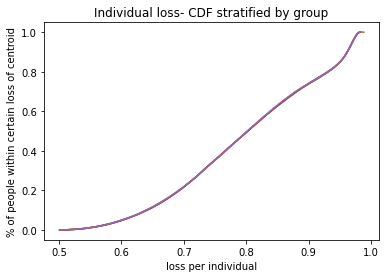

c  {0: (4.334627957154885, 3.679279110547341), 1: (-9.16765716603074, -8.968531703079869), 2: (-10.535034906424611, 6.739024365602769), 3: (9.594016904072626, -3.3073683400568994), 4: (-1.838245725741642, 8.428610294087193), 5: (-2.1132634381328814, 2.1312202690372533), 6: (2.2157109053043063, 9.231002044161114), 7: (4.841105680546692, -1.2026472145466165), 8: (-8.078386369952405, -7.280205980675884), 9: (6.539344269333537, 7.8653098275895195)}
weights:  [0.19999826 0.20001815 0.20002897 0.20002932 0.1999253 ]
Time elapsed Batch Step:  0.49343442916870117
Time elapsed Assignment Step:  2.3130438327789307
0.0006542835247208556
total:  0.5610508415242964


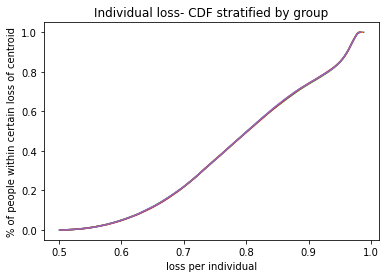

c  {0: (4.333883981829526, 3.678913681309639), 1: (-9.166537499423674, -8.967480055586408), 2: (-10.533194840227464, 6.73880528146045), 3: (9.593363690449575, -3.305436992593301), 4: (-1.8370241087739128, 8.427491431357199), 5: (-2.1122078451154223, 2.132424319111348), 6: (2.2142495355883214, 9.229611394990993), 7: (4.841328680827566, -1.2014015412534575), 8: (-8.079104662603514, -7.281577130772203), 9: (6.537571863770299, 7.864554539507882)}
weights:  [0.19999825 0.20001814 0.20002906 0.20002943 0.19992511]
Time elapsed Batch Step:  0.3551959991455078
Time elapsed Assignment Step:  2.3213577270507812
0.0007090493622369243
total:  0.5609395579922897


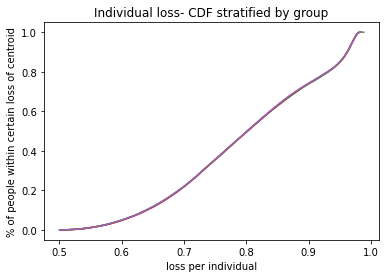

c  {0: (4.333139804136393, 3.678548248920926), 1: (-9.165419300074358, -8.96642970683085), 2: (-10.531356895838154, 6.738586589682242), 3: (9.592710952696208, -3.3035070589981688), 4: (-1.8358038121397988, 8.426373749286766), 5: (-2.111152767315586, 2.1336278726825384), 6: (2.2127889240313725, 9.228221494434077), 7: (4.841551877376641, -1.2001558512247283), 8: (-8.079821565518653, -7.282945722036106), 9: (6.535800918384347, 7.863799973444736)}
weights:  [0.19999824 0.20001813 0.20002916 0.20002954 0.19992493]
Time elapsed Batch Step:  0.38672542572021484
Time elapsed Assignment Step:  2.3296163082122803
0.0007640988470646315
total:  0.5608285060328472


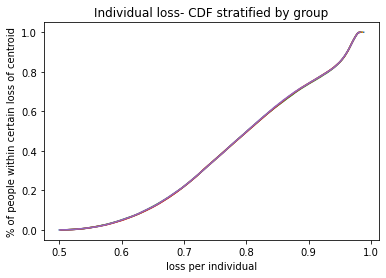

c  {0: (4.3323954240578955, 3.678182813437445), 1: (-9.164302570520075, -8.965380659292046), 2: (-10.529521082466678, 6.738368291617749), 3: (9.592058693415325, -3.3015785479613933), 4: (-1.8345848382899257, 8.425257250219701), 5: (-2.1100982066984937, 2.1348309269342343), 6: (2.2113290764498776, 9.226832347858162), 7: (4.841775270390296, -1.1989101454980609), 8: (-8.080537077594125, -7.284311753099029), 9: (6.534031440916117, 7.863046133120076)}
weights:  [0.19999823 0.20001812 0.20002926 0.20002965 0.19992475]
Time elapsed Batch Step:  0.34415197372436523
Time elapsed Assignment Step:  2.265322685241699
0.0007771092925148437
total:  0.5607049892996682


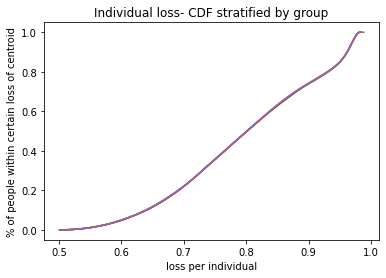

c  {0: (4.33165084157661, 3.677817374915466), 1: (-9.163187313294996, -8.964332915448725), 2: (-10.527687409304228, 6.738150388604825), 3: (9.591406915191405, -3.299651468149268), 4: (-1.8333671896635206, 8.424141936493553), 5: (-2.1090441652274254, 2.1360334790600723), 6: (2.2098699986721475, 9.225443960636706), 7: (4.841998860065429, -1.1976644251096769), 8: (-8.08125119774238, -7.2856752226101795), 9: (6.532263439092134, 7.862293022239152)}
weights:  [0.19999822 0.20001811 0.20002935 0.20002976 0.19992456]
Time elapsed Batch Step:  0.37317419052124023
Time elapsed Assignment Step:  2.245450973510742
0.0007999192863378246
total:  0.560584560233679


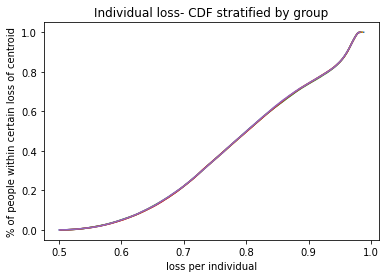

c  {0: (4.330906056675282, 3.677451933411282), 1: (-9.162073530930028, -8.963286477779324), 2: (-10.525855885522292, 6.7379328819692885), 3: (9.590755620591727, -3.2977258282026383), 4: (-1.832150868688496, 8.423027810439612), 5: (-2.107990644864129, 2.1372355262636114), 6: (2.20841169653831, 9.22405633814898), 7: (4.842222646599432, -1.196418691094356), 8: (-8.08196392489204, -7.287036129236623), 9: (6.530496920624605, 7.861540644492193)}
weights:  [0.19999821 0.20001809 0.20002945 0.20002987 0.19992438]
Time elapsed Batch Step:  0.3399348258972168
Time elapsed Assignment Step:  2.2490193843841553
0.0008363096029799788
total:  0.5604683534180895


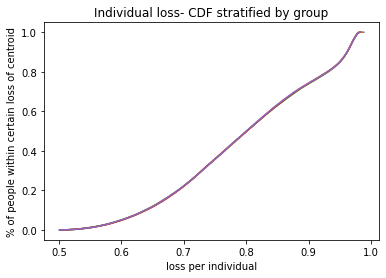

c  {0: (4.330161069336823, 3.6770864889812125), 1: (-9.160961225952647, -8.96224134876184), 2: (-10.524026520271713, 6.73771577302461), 3: (9.590104812167644, -3.2958016367352445), 4: (-1.8309358777815266, 8.421914874382905), 5: (-2.106937647569113, 2.138437065758016), 6: (2.2069541759002296, 9.22266948578019), 7: (4.842446630190169, -1.195172944485405), 8: (-8.0826752579879, -7.288394471663377), 9: (6.528731893211004, 7.860789003554128)}
weights:  [0.19999819 0.20001808 0.20002954 0.20002998 0.1999242 ]
Time elapsed Batch Step:  0.3544764518737793
Time elapsed Assignment Step:  2.370063304901123
0.0007992414380754154
total:  0.5603302572679388


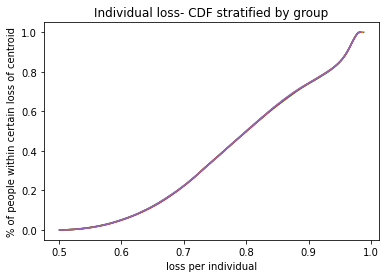

c  {0: (4.329415879544314, 3.6767210416816014), 1: (-9.15985040088674, -8.961197530873672), 2: (-10.522199322681738, 6.737499063071574), 3: (9.589454492456008, -3.2938789023322843), 4: (-1.8297222193481228, 8.4208031306422), 5: (-2.105885175301927, 2.1396380947657354), 6: (2.20549744262142, 9.22128340892161), 7: (4.842670811035952, -1.193927186314627), 8: (-8.083385195990948, -7.289750248593501), 9: (6.526968364533656, 7.860038103084324)}
weights:  [0.19999818 0.20001807 0.20002964 0.20003009 0.19992401]
Time elapsed Batch Step:  0.3520083427429199
Time elapsed Assignment Step:  2.31766939163208
0.0008226144744546415
total:  0.5602104427339356


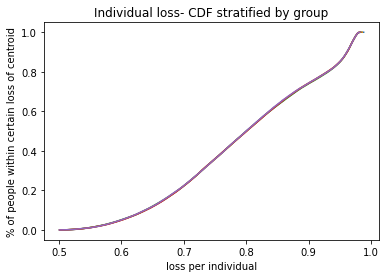

c  {0: (4.328670487281004, 3.676355591568818), 1: (-9.158741058252438, -8.960155026591472), 2: (-10.520374301859023, 6.73728275339791), 3: (9.58880466398075, -3.29195763354921), 4: (-1.828509895782698, 8.419692581530002), 5: (-2.10483323002142, 2.1408386105181765), 6: (2.204041502576953, 9.219898112970704), 7: (4.8428951893355165, -1.1926814176122933), 8: (-8.084093737878383, -7.291103458748189), 9: (6.525206342259328, 7.859287946726318)}
weights:  [0.19999817 0.20001806 0.20002974 0.2000302  0.19992383]
Time elapsed Batch Step:  0.34275078773498535
Time elapsed Assignment Step:  2.3159914016723633
0.0007986253513690977
total:  0.5600765700940395


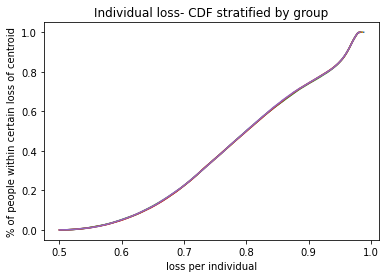

c  {0: (4.327924892530312, 3.675990138699256), 1: (-9.157633200565968, -8.95911383839098), 2: (-10.518551466886608, 6.737066845277892), 3: (9.588155329254544, -3.290037838910779), 4: (-1.8272989094686314, 8.418583229352546), 5: (-2.103781813685986, 2.1420386102553737), 6: (2.202586361653364, 9.218513603331244), 7: (4.843119765287997, -1.1914356394071135), 8: (-8.084800882643624, -7.292454100866862), 9: (6.523445834038823, 7.858538538107566)}
weights:  [0.19999816 0.20001806 0.20002983 0.20003031 0.19992364]
Time elapsed Batch Step:  0.3497810363769531
Time elapsed Assignment Step:  2.3740780353546143
0.0008000284591205276
total:  0.5599504677379554


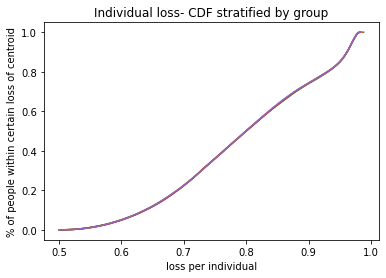

c  {0: (4.3271790952758264, 3.6756246831293353), 1: (-9.156526830339478, -8.958073968746875), 2: (-10.516730826822839, 6.7368513399718974), 3: (9.587506490780607, -3.288119526910366), 4: (-1.8260892627783263, 8.417475076409792), 5: (-2.102730928253792, 2.143238091225656), 6: (2.201132025748546, 9.217129885413419), 7: (4.843344539092902, -1.1901898527262083), 8: (-8.085506629296319, -7.293802173707256), 9: (6.521686847506564, 7.857789880839189)}
weights:  [0.19999815 0.20001805 0.20002992 0.20003042 0.19992346]
Time elapsed Batch Step:  0.3438723087310791
Time elapsed Assignment Step:  2.2968015670776367
0.0008272908490432052
total:  0.5598322771397256


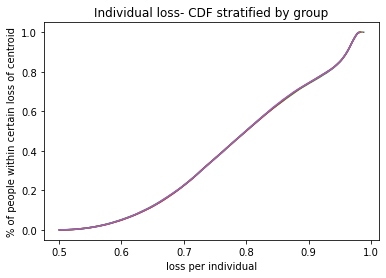

c  {0: (4.326433095501304, 3.6752592249154996), 1: (-9.155421950080884, -8.957035420132623), 2: (-10.514912390700257, 6.736636238725918), 3: (9.586858151054532, -3.2862027060095467), 4: (-1.8248809580732626, 8.416368124995428), 5: (-2.101680575682989, 2.1444370506853163), 6: (2.199678500771648, 9.215746964633936), 7: (4.843569510950087, -1.1889440585950826), 8: (-8.086210976862366, -7.29514767604552), 9: (6.519929390280202, 7.857041978515728)}
weights:  [0.19999814 0.20001804 0.20003002 0.20003053 0.19992327]
Time elapsed Batch Step:  0.34244608879089355
Time elapsed Assignment Step:  2.3135762214660645
0.0008391938397577237
total:  0.5597096336693341


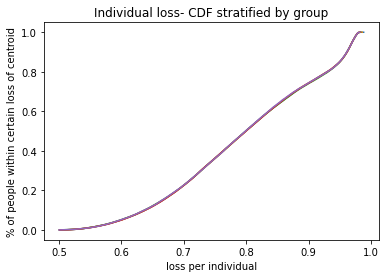

c  {0: (4.325686893190676, 3.674893764114218), 1: (-9.154318562293705, -8.955998195020321), 2: (-10.513096167524417, 6.736421542771014), 3: (9.586210312566202, -3.2842873846379534), 4: (-1.8236739977040453, 8.415262377396859), 5: (-2.100630757931906, 2.1456354858982767), 6: (2.1982257926429636, 9.214364846416128), 7: (4.84379468105973, -1.1876982580376), 8: (-8.086913924383927, -7.2964906066763024), 9: (6.518173469960204, 7.856294834714903)}
weights:  [0.19999813 0.20001803 0.20003011 0.20003064 0.19992308]
Time elapsed Batch Step:  0.35301804542541504
Time elapsed Assignment Step:  2.425553798675537
0.0008224925851719744
total:  0.5595785637662206


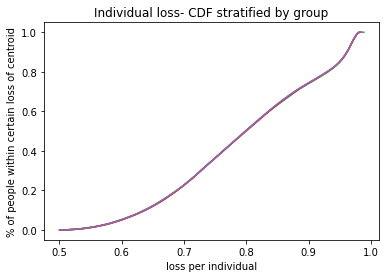

c  {0: (4.324940488328041, 3.6745283007819842), 1: (-9.153216669476905, -8.954962295880538), 2: (-10.511282166272643, 6.736207253322712), 3: (9.585562977801702, -3.2823735711934003), 4: (-1.822468384010448, 8.414157835895201), 5: (-2.09958147695923, 2.1468333941357587), 6: (2.196773907293814, 9.21298353619004), 7: (4.844020049622303, -1.1864524520759574), 8: (-8.087615470919433, -7.297830964412846), 9: (6.516419094129458, 7.855548452997379)}
weights:  [0.19999812 0.20001803 0.20003021 0.20003075 0.1999229 ]
Time elapsed Batch Step:  0.3425137996673584
Time elapsed Assignment Step:  2.361980676651001
0.0008028364513551489
total:  0.559446764277255


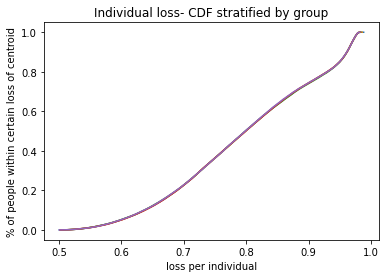

c  {0: (4.32419388089767, 3.674162834975317), 1: (-9.15211627412473, -8.953927725182172), 2: (-10.509470395892707, 6.735993371580327), 3: (9.584916149245245, -3.280461274042272), 4: (-1.8212641193214518, 8.413054502765279), 5: (-2.098532734724167, 2.148030772675956), 6: (2.1953228506664333, 9.21160303939252), 7: (4.844245616838544, -1.1852066417306606), 8: (-8.088315615543603, -7.299168748087079), 9: (6.514666270352878, 7.854802836906536)}
weights:  [0.1999981  0.20001802 0.2000303  0.20003086 0.19992272]
Time elapsed Batch Step:  0.39138126373291016
Time elapsed Assignment Step:  2.402796745300293
0.0007874698968531879
total:  0.5593164081690452


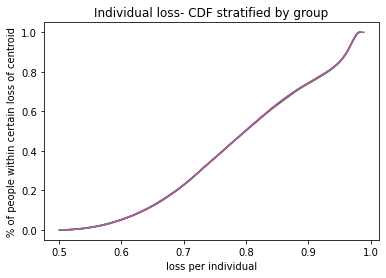

c  {0: (4.323447070884006, 3.67379736675076), 1: (-9.151017378726547, -8.952894485392292), 2: (-10.507660865301405, 6.735779898726202), 3: (9.584269829381064, -3.2785505015201606), 4: (-1.8200612059552788, 8.411952380275618), 5: (-2.097484533186589, 2.14922761880371), 6: (2.193872628713842, 9.210223361467307), 7: (4.84447138290943, -1.1839608280205016), 8: (-8.089014357347452, -7.300503956549708), 9: (6.5129150061770105, 7.854057989968243)}
weights:  [0.19999809 0.20001801 0.20003039 0.20003097 0.19992253]
Time elapsed Batch Step:  0.40061235427856445
Time elapsed Assignment Step:  2.4945032596588135
0.0007556006081921307
total:  0.5591812572354762


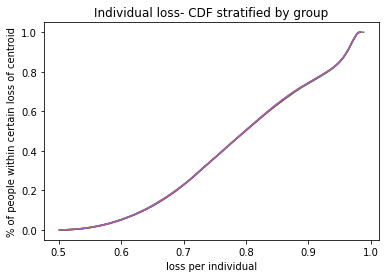

c  {0: (4.322700058271666, 3.6734318961648813), 1: (-9.149919985766685, -8.951862578975984), 2: (-10.505853583383034, 6.735566835924858), 3: (9.583624020695257, -3.2766412619327427), 4: (-1.8188596462194218, 8.410851470688439), 5: (-2.096436874307166, 2.1504239298101897), 6: (2.192423247399723, 9.208844507865098), 7: (4.844697348036152, -1.1827150119625365), 8: (-8.089711695438307, -7.301836588670308), 9: (6.511165309129647, 7.853313915690633)}
weights:  [0.19999808 0.20001801 0.20003048 0.20003108 0.19992235]
Time elapsed Batch Step:  0.39435577392578125
Time elapsed Assignment Step:  2.291288137435913
0.0007533036193568821
total:  0.5590551354060274


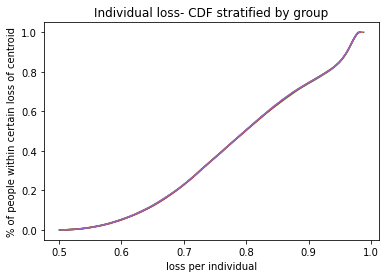

c  {0: (4.321952843045438, 3.6730664232742747), 1: (-9.148824097724273, -8.950832008396201), 2: (-10.504048558987723, 6.735354184322035), 3: (9.582978725677568, -3.2747335635568686), 4: (-1.8176594424106691, 8.409751776259645), 5: (-2.095389760047483, 2.15161970299258), 6: (2.1909747126982895, 9.207466484043634), 7: (4.844923512420079, -1.181469194572064), 8: (-8.090407628939815, -7.303166643337416), 9: (6.509417186719439, 7.852570617563893)}
weights:  [0.19999807 0.200018   0.20003058 0.20003119 0.19992216]
Time elapsed Batch Step:  0.340165376663208
Time elapsed Assignment Step:  2.329322338104248
0.0007384036005914085
total:  0.5589253907179172


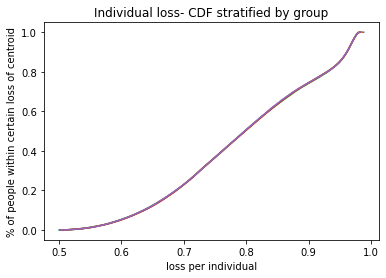

c  {0: (4.321205425190285, 3.6727009481355575), 1: (-9.147729717073078, -8.949802776113613), 2: (-10.502245800929616, 6.735141945043617), 3: (9.58233394682308, -3.2728274146418492), 4: (-1.816460596815125, 8.408653299238823), 5: (-2.0943431923701414, 2.1528149356537707), 6: (2.189527030594152, 9.206089295467754), 7: (4.845149876262738, -1.1802233768626051), 8: (-8.091102156991957, -7.304494119458622), 9: (6.507670646435514, 7.851828099060048)}
weights:  [0.19999806 0.20001799 0.20003067 0.2000313  0.19992198]
Time elapsed Batch Step:  0.3698079586029053
Time elapsed Assignment Step:  2.420328140258789
0.0006863130799410477
total:  0.5587846487041999


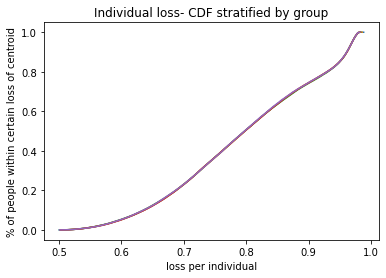

c  {0: (4.320457804691341, 3.672335470805373), 1: (-9.146636846281346, -8.948774884586452), 2: (-10.50044531798486, 6.734930119194428), 3: (9.581689686633808, -3.2709228234109142), 4: (-1.8152631117082254, 8.407556041869228), 5: (-2.0932971732388475, 2.154009625102059), 6: (2.1880802070821814, 9.204712947609465), 7: (4.845376439765776, -1.178977559845885), 8: (-8.091795278751057, -7.305819015960657), 9: (6.505925695747104, 7.851086363632748)}
weights:  [0.19999805 0.20001799 0.20003076 0.20003141 0.19992179]
Time elapsed Batch Step:  0.370694637298584
Time elapsed Assignment Step:  2.3721115589141846
0.0006947475237583101
total:  0.5586622242820244


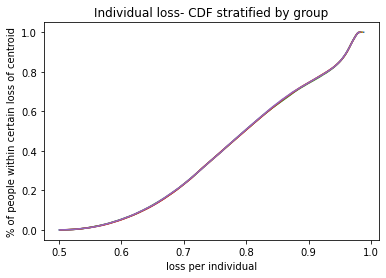

c  {0: (4.319709981533919, 3.671969991340388), 1: (-9.145545487811642, -8.947748336270367), 2: (-10.49864711888937, 6.734718707856878), 3: (9.581045947620176, -3.2690197980628177), 4: (-1.8140669893547492, 8.406460006387775), 5: (-2.092251704618487, 2.155203768650853), 6: (2.1866342481673677, 9.203337445947996), 7: (4.845603203130934, -1.1777317445318132), 8: (-8.092486993389796, -7.3071413317894915), 9: (6.504182342103168, 7.850345414717063)}
weights:  [0.19999804 0.20001798 0.20003085 0.20003152 0.19992161]
Time elapsed Batch Step:  0.336287260055542
Time elapsed Assignment Step:  2.3183488845825195
0.0007475856987956275
total:  0.5585532818161061


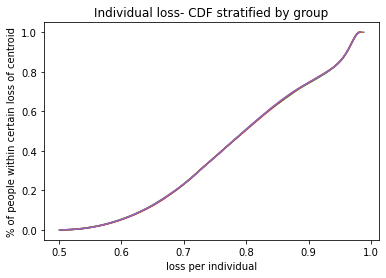

c  {0: (4.3189619557035, 3.6716045097972945), 1: (-9.144455644120685, -8.946723133618269), 2: (-10.496851212336319, 6.734507712089464), 3: (9.580402732302376, -3.2671183467735663), 4: (-1.8128722320088257, 8.405365195025036), 5: (-2.091206788475189, 2.156397363618387), 6: (2.1851891598646755, 9.20196279596985), 7: (4.845830166560019, -1.1764859319284684), 8: (-8.093177300097219, -7.30846106591042), 9: (6.502440592932026, 7.849605255729281)}
weights:  [0.19999803 0.20001797 0.20003095 0.20003162 0.19992143]
Time elapsed Batch Step:  0.36942195892333984
Time elapsed Assignment Step:  2.2887990474700928
0.0007406710517078308
total:  0.5584265744818251


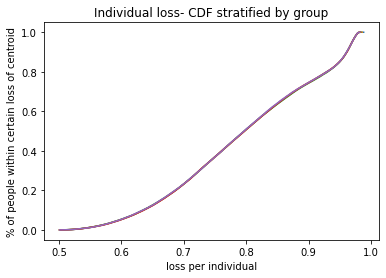

c  {0: (4.318213727185747, 3.6712390262328096), 1: (-9.143367317659191, -8.94569927908018), 2: (-10.495057606973326, 6.734297132925103), 3: (9.579760043211605, -3.265218477698242), 4: (-1.8116788419139374, 8.404271610005226), 5: (-2.0901624267763705, 2.157590407327444), 6: (2.183744948198899, 9.200589003168849), 7: (4.8460573302548715, -1.175240123042081), 8: (-8.093866198078745, -7.309778217308153), 9: (6.5007004556409935, 7.8488658900667)}
weights:  [0.19999802 0.20001797 0.20003104 0.20003173 0.19992124]
Time elapsed Batch Step:  0.36942410469055176
Time elapsed Assignment Step:  2.3449816703796387
0.000780438743369638
total:  0.558314034647636


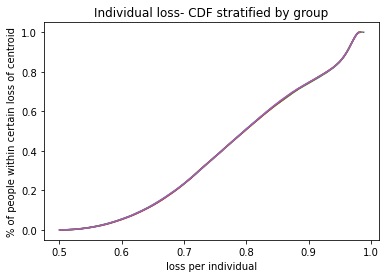

c  {0: (4.317465295966495, 3.6708735407036746), 1: (-9.142280510871716, -8.944676775103089), 2: (-10.493266311399248, 6.734086971369304), 3: (9.579117882891158, -3.2633201989729), 4: (-1.810486821302918, 8.403179253546194), 5: (-2.089118621490779, 2.1587828971050853), 6: (2.182301619204509, 9.199216073046177), 7: (4.846284694417332, -1.1739943188770192), 8: (-8.09455368655618, -7.311092784986912), 9: (6.49896193761602, 7.848127321107436)}
weights:  [0.19999801 0.20001796 0.20003113 0.20003184 0.19992106]
Time elapsed Batch Step:  0.3656895160675049
Time elapsed Assignment Step:  2.303905963897705
0.0007111713853590329
total:  0.5581689485338072


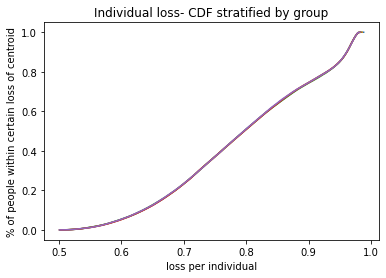

c  {0: (4.316716662031755, 3.670508053266655), 1: (-9.14119522619649, -8.943655624130797), 2: (-10.49147733416055, 6.733877228398181), 3: (9.578476253897394, -3.2614235187165157), 4: (-1.8092961723979473, 8.402088127859408), 5: (-2.088075374588514, 2.159974830282391), 6: (2.180859178925503, 9.197844011110417), 7: (4.8465122592492165, -1.1727485204357744), 8: (-8.095239764767722, -7.312404767970513), 9: (6.497225046221335, 7.847389552210212)}
weights:  [0.199998   0.20001796 0.20003123 0.20003194 0.19992088]
Time elapsed Batch Step:  0.3438713550567627
Time elapsed Assignment Step:  2.323509454727173
0.0007115788380739341
total:  0.5580449296984504


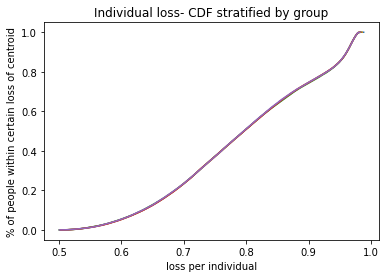

c  {0: (4.315967825367717, 3.670142563978542), 1: (-9.140111466065258, -8.942635828603773), 2: (-10.48969068374715, 6.733667904956328), 3: (9.57783515880058, -3.259528445032953), 4: (-1.8081068974105416, 8.400998235149954), 5: (-2.087032688041045, 2.161166204194208), 6: (2.179417633415248, 9.196472822877585), 7: (4.846740024952277, -1.1715027287189488), 8: (-8.095924431967974, -7.31371416530246), 9: (6.495489788799091, 7.846652586714171)}
weights:  [0.19999799 0.20001795 0.20003132 0.20003205 0.19992069]
Time elapsed Batch Step:  0.40828871726989746
Time elapsed Assignment Step:  2.4560160636901855
0.0007168422436962807
total:  0.557922532674351


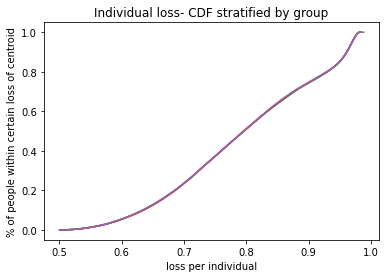

c  {0: (4.315218785960745, 3.66977707289615), 1: (-9.139029232903122, -8.941617390959005), 2: (-10.487906368587694, 6.733459001954586), 3: (9.577194600185598, -3.2576349860129485), 4: (-1.8069189985415404, 8.399909577616517), 5: (-2.085990563821213, 2.162357016178907), 6: (2.177976988736322, 9.19510251387115), 7: (4.846967991728179, -1.170256944725244), 8: (-8.09660768742795, -7.315020976046035), 9: (6.493756172669022, 7.8459164279386675)}
weights:  [0.19999799 0.20001794 0.20003141 0.20003215 0.19992051]
Time elapsed Batch Step:  0.3424067497253418
Time elapsed Assignment Step:  2.373267889022827
0.0007203750002440223
total:  0.5577997834252966


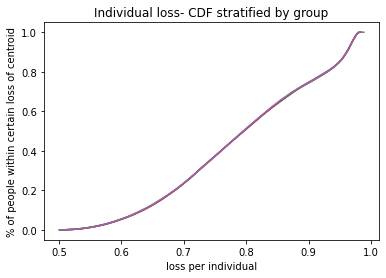

c  {0: (4.314469543797383, 3.6694115800763183), 1: (-9.137948529128378, -8.940600313629849), 2: (-10.486124397044163, 6.7332505202677595), 3: (9.576554580652534, -3.255743149736076), 4: (-1.8057324779810873, 8.398822157451372), 5: (-2.084949003903226, 2.163547263578151), 6: (2.1765372509603518, 9.193733089622066), 7: (4.847196159778462, -1.1690111694514502), 8: (-8.09728953043508, -7.316325199284385), 9: (6.492024205128089, 7.845181079183071)}
weights:  [0.19999798 0.20001793 0.20003151 0.20003225 0.19992033]
Time elapsed Batch Step:  0.33698511123657227
Time elapsed Assignment Step:  2.3115575313568115
0.0006706836326819676
total:  0.5576612338709833


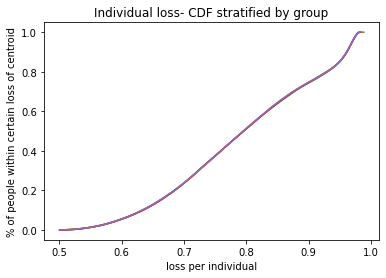

c  {0: (4.313720098864352, 3.6690460855759115), 1: (-9.136869357152362, -8.939584599045888), 2: (-10.484344777405779, 6.733042460732374), 3: (9.575915102817147, -3.2538529442726873), 4: (-1.80454733790861, 8.39773597684037), 5: (-2.0839080102626424, 2.16473694373667), 6: (2.175098426167852, 9.19236455566878), 7: (4.847424529304512, -1.1677654038924368), 8: (-8.097969960293227, -7.317626834120613), 9: (6.490293893450147, 7.844446543726568)}
weights:  [0.19999797 0.20001793 0.20003161 0.20003235 0.19992015]
Time elapsed Batch Step:  0.35218167304992676
Time elapsed Assignment Step:  2.3698596954345703
0.0006804386968121134
total:  0.5575406858738944


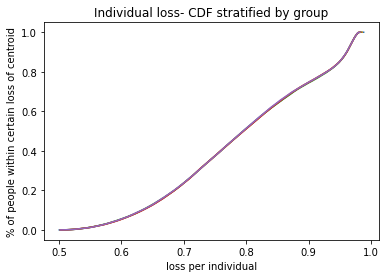

c  {0: (4.312970451148552, 3.6686805894518177), 1: (-9.135791719379286, -8.93857024963278), 2: (-10.482567517882142, 6.732834824144579), 3: (9.575276169311238, -3.2519643776858143), 4: (-1.8033635804927945, 8.396651037962924), 5: (-2.0828675848763454, 2.1659260540020466), 6: (2.173660520448056, 9.190996917557252), 7: (4.8476531005075305, -1.1665196490411442), 8: (-8.098648976322684, -7.318925879677864), 9: (6.488565244885598, 7.843712824827956)}
weights:  [0.19999796 0.20001792 0.2000317  0.20003245 0.19991997]
Time elapsed Batch Step:  0.3660011291503906
Time elapsed Assignment Step:  2.2780704498291016
0.0006860017284803233
total:  0.5574190411781128


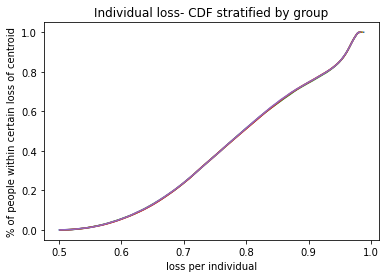

c  {0: (4.312220600637061, 3.6683150917609497), 1: (-9.134705883693323, -8.937587258825074), 2: (-10.480792626595616, 6.732627611258351), 3: (9.574637782782903, -3.2500774580330103), 4: (-1.8021812078915558, 8.395567342992), 5: (-2.08182772972251, 2.167114591724511), 6: (2.1722235398987495, 9.189630180840963), 7: (4.8478818735884985, -1.1652739058885766), 8: (-8.099358841335466, -7.320229026744361), 9: (6.486838266661059, 7.842979925725439)}
weights:  [0.19999795 0.20001791 0.20003181 0.20003255 0.19991978]
Time elapsed Batch Step:  0.35547327995300293
Time elapsed Assignment Step:  2.2598860263824463
0.0006673336529828822
total:  0.5572902958072115


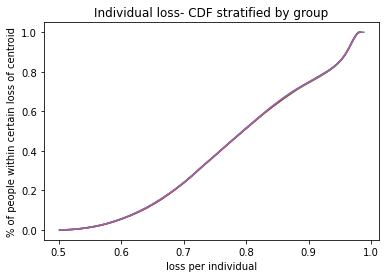

c  {0: (4.311470547317137, 3.667949592560245), 1: (-9.13362161037586, -8.93660561022794), 2: (-10.479020111572995, 6.732420822784196), 3: (9.573999945896709, -3.248192193368136), 4: (-1.8010002222520052, 8.3944848940941), 5: (-2.080788446780561, 2.1683025542567456), 6: (2.1707874906260973, 9.188264351080917), 7: (4.848110848748147, -1.1640281754237956), 8: (-8.100067263458035, -7.321529607974993), 9: (6.485112965979026, 7.842247849636422)}
weights:  [0.19999794 0.2000179  0.20003191 0.20003265 0.1999196 ]
Time elapsed Batch Step:  0.3327667713165283
Time elapsed Assignment Step:  2.324432134628296
0.0007011914766946736
total:  0.5571774777180508


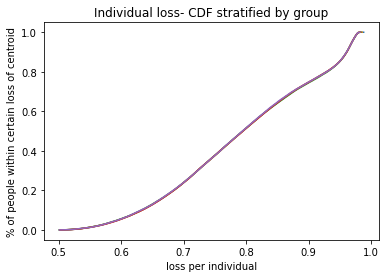

c  {0: (4.310720291176219, 3.6675840919066656), 1: (-9.132538901707209, -8.935625306159885), 2: (-10.477249980736582, 6.732214459388534), 3: (9.573362661333778, -3.246308591743072), 4: (-1.7998206257104141, 8.393403693429248), 5: (-2.07974973803112, 2.169489938953699), 6: (2.1693523787444717, 9.186899433845644), 7: (4.848340026186924, -1.162782458633916), 8: (-8.100774241881943, -7.322827622298407), 9: (6.483389350017539, 7.841516599757297)}
weights:  [0.19999793 0.2000179  0.20003201 0.20003275 0.19991941]
Time elapsed Batch Step:  0.3475823402404785
Time elapsed Assignment Step:  2.3493077754974365
0.000675232999179376
total:  0.5570468849418531


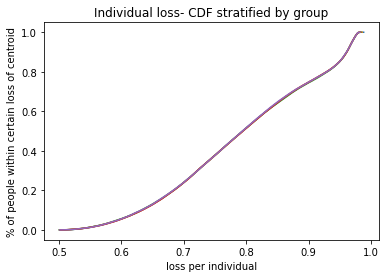

c  {0: (4.309969832201925, 3.667218589857197), 1: (-9.131457759959783, -8.934646348934852), 2: (-10.475482241894891, 6.732008521694019), 3: (9.572725931791794, -3.244426661209352), 4: (-1.7986424203921743, 8.392323743150968), 5: (-2.0787116054559482, 2.170676743172407), 6: (2.167918210376276, 9.18553543471119), 7: (4.848569406104963, -1.1615367565041015), 8: (-8.101479775815676, -7.324123068663704), 9: (6.481667425929856, 7.840786179263229)}
weights:  [0.19999793 0.20001789 0.20003211 0.20003285 0.19991923]
Time elapsed Batch Step:  0.3490867614746094
Time elapsed Assignment Step:  2.3501298427581787
0.0006778463040735261
total:  0.5569250350482093


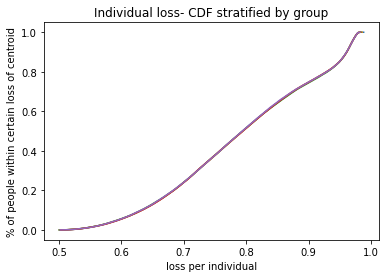

c  {0: (4.309219170382054, 3.6668530864688496), 1: (-9.13037818739795, -8.933668740862071), 2: (-10.473716902733274, 6.731803010280967), 3: (9.57208975998494, -3.2425464098197203), 4: (-1.797465608411754, 8.39124504540628), 5: (-2.077674051037881, 2.1718629642718272), 6: (2.1664849916517674, 9.184172359261114), 7: (4.848798988702051, -1.160291070017562), 8: (-8.102183864484664, -7.325415946040539), 9: (6.479947200844113, 7.8400565913079365)}
weights:  [0.19999792 0.20001788 0.20003222 0.20003294 0.19991904]
Time elapsed Batch Step:  0.6113762855529785
Time elapsed Assignment Step:  3.6476986408233643
0.0006553530741559843
total:  0.5567958253597808


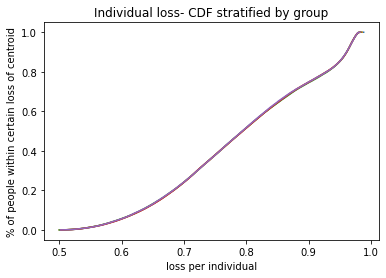

c  {0: (4.308468305704587, 3.666487581798658), 1: (-9.12930018627787, -8.932692484245926), 2: (-10.471953970804888, 6.731597925690069), 3: (9.57145414864379, -3.240667845629599), 4: (-1.7962901918726522, 8.390167602335671), 5: (-2.076637076760753, 2.1730485996126783), 6: (2.165052728708875, 9.182810213086473), 7: (4.849028774177594, -1.159045400155552), 8: (-8.102886507131291, -7.326706253419208), 9: (6.478228681863, 7.839327839023464)}
weights:  [0.19999791 0.20001787 0.20003232 0.20003304 0.19991886]
Time elapsed Batch Step:  0.370527982711792
Time elapsed Assignment Step:  2.2972776889801025
0.0006631695590249009
total:  0.5566758826101972


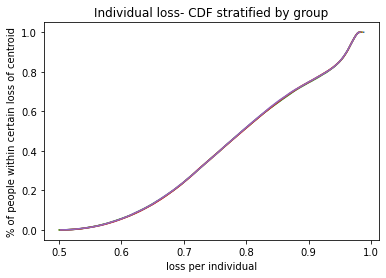

c  {0: (4.307717238157687, 3.666122075903682), 1: (-9.12822375884735, -8.93171758138581), 2: (-10.47019345352246, 6.731393268426427), 3: (9.57081910051512, -3.238790976698474), 4: (-1.7951161728673475, 8.389091416073088), 5: (-2.075600684609319, 2.1742336465572905), 6: (2.163621427693021, 9.181449001785804), 7: (4.849258762730585, -1.1577997478973703), 8: (-8.103587703014904, -7.327993989810748), 9: (6.476511876063425, 7.8385999255199525)}
weights:  [0.1999979  0.20001787 0.20003243 0.20003313 0.19991867]
Time elapsed Batch Step:  0.3493845462799072
Time elapsed Assignment Step:  2.295572519302368
0.0007044203099557667
total:  0.556566144634714


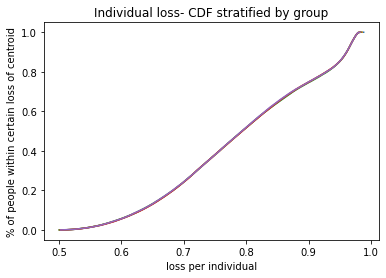

c  {0: (4.306965967729698, 3.665756568841004), 1: (-9.127148907345678, -8.930744034575985), 2: (-10.46843535815137, 6.731189038964872), 3: (9.57018461836171, -3.236915811091193), 4: (-1.7939435534772463, 8.38801648874591), 5: (-2.074564876569166, 2.1754181024694654), 6: (2.162191094756933, 9.180088730965107), 7: (4.849488954559575, -1.1565541142203606), 8: (-8.104287451411818, -7.3292791542470255), 9: (6.474796790496178, 7.837872853885402)}
weights:  [0.19999789 0.20001786 0.20003254 0.20003323 0.19991848]
Time elapsed Batch Step:  0.34975457191467285
Time elapsed Assignment Step:  2.312037944793701
0.0007293006309126993
total:  0.556451669236238


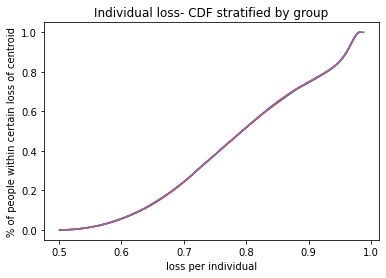

c  {0: (4.306214494409148, 3.665391060667732), 1: (-9.126075634003481, -8.929771846105448), 2: (-10.46667969180448, 6.730985237756357), 3: (9.569550704962072, -3.2350423568791764), 4: (-1.7927723357726253, 8.386942822474934), 5: (-2.07352965462662, 2.1766019647143424), 6: (2.16076173606046, 9.178729406237814), 7: (4.84971934986264, -1.1553085000999135), 8: (-8.104985751615322, -7.330561745780829), 9: (6.473083432185598, 7.837146627185426)}
weights:  [0.19999788 0.20001786 0.20003264 0.20003332 0.19991829]
Time elapsed Batch Step:  0.36980462074279785
Time elapsed Assignment Step:  2.319658041000366
0.0007386416713669464
total:  0.5563327065179936


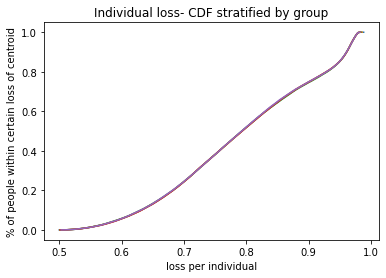

c  {0: (4.305462818184748, 3.665025551440997), 1: (-9.125003941042568, -8.928801018257785), 2: (-10.464926461439081, 6.730781865235102), 3: (9.568917363110176, -3.2331706221415444), 4: (-1.7916025218125728, 8.385870419374353), 5: (-2.0724950207686463, 2.177785230658277), 6: (2.159333357770384, 9.17737103322476), 7: (4.849949948837344, -1.1540629065094685), 8: (-8.105682602935692, -7.331841763485965), 9: (6.4713718081292315, 7.836421248463)}
weights:  [0.19999788 0.20001786 0.20003275 0.20003341 0.1999181 ]
Time elapsed Batch Step:  0.3546328544616699
Time elapsed Assignment Step:  2.244325876235962
0.000717913857319008
total:  0.5562048991544594


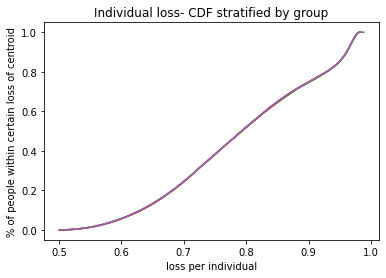

c  {0: (4.304710939045392, 3.664660041217955), 1: (-9.123933830675774, -8.92783155331104), 2: (-10.463175673856131, 6.73057892182607), 3: (9.56828459561512, -3.2313006149661603), 4: (-1.7904341136449267, 8.384799281551734), 5: (-2.071460976982743, 2.1789678976687243), 6: (2.157905966060229, 9.17601361755416), 7: (4.850180751680716, -1.1528173344205188), 8: (-8.106378004700193, -7.333119206457342), 9: (6.469661925297487, 7.835696720738203)}
weights:  [0.19999787 0.20001785 0.20003286 0.2000335  0.19991791]
Time elapsed Batch Step:  0.3559129238128662
Time elapsed Assignment Step:  2.309692144393921
0.0006932225885804
total:  0.556076080026115


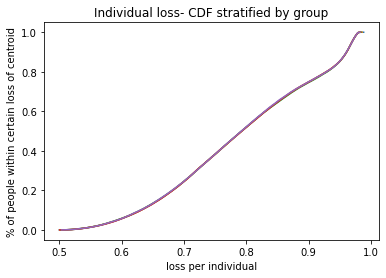

c  {0: (4.3039588569801595, 3.664294530055786), 1: (-9.12286530510681, -8.926863453537578), 2: (-10.461427335701762, 6.730376407952328), 3: (9.567652405300803, -3.2294323434505925), 4: (-1.7892671133062081, 8.383729411108), 5: (-2.070427525256829, 2.180149963114133), 6: (2.156479567110069, 9.174657164861555), 7: (4.850411758589208, -1.151571784802616), 8: (-8.107071956253082, -7.3343940738110645), 9: (6.467953790633287, 7.83497304700795)}
weights:  [0.19999786 0.20001785 0.20003297 0.20003359 0.19991772]
Time elapsed Batch Step:  0.3895833492279053
Time elapsed Assignment Step:  2.285460948944092
0.0006827479642302903
total:  0.5559517039167738


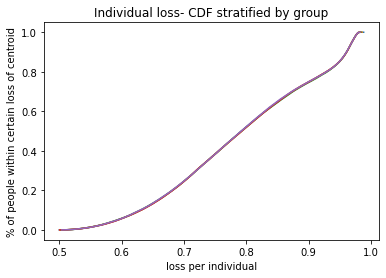

c  {0: (4.303206571978314, 3.663929018011694), 1: (-9.121798366530111, -8.92589672120394), 2: (-10.459681453470852, 6.730174324041855), 3: (9.567020795005565, -3.2275658157029974), 4: (-1.7881015228215553, 8.382660810137398), 5: (-2.0693946675791293, 2.1813314243638473), 6: (2.1550541671063344, 9.173301680789788), 7: (4.850642969758672, -1.1503262586233756), 8: (-8.107764456955618, -7.335666364684524), 9: (6.4662474110517145, 7.834250230245717)}
weights:  [0.19999786 0.20001785 0.20003308 0.20003368 0.19991753]
Time elapsed Batch Step:  0.34714293479919434
Time elapsed Assignment Step:  2.339742422103882
0.0006577940082375111
total:  0.5558231619417411


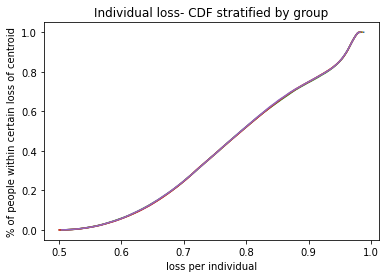

c  {0: (4.302454084029304, 3.663563505142907), 1: (-9.120733017130682, -8.924931358570717), 2: (-10.4579380335123, 6.729972670533467), 3: (9.566389767581816, -3.225701039842929), 4: (-1.7869373442046512, 8.381593480727489), 5: (-2.068362405938047, 2.1825122787880167), 6: (2.153629772241615, 9.171947170988943), 7: (4.850874385384326, -1.149080756848485), 8: (-8.108455506186063, -7.336936078236485), 9: (6.464542793439646, 7.833528273401253)}
weights:  [0.19999785 0.20001785 0.20003319 0.20003377 0.19991733]
Time elapsed Batch Step:  0.3546457290649414
Time elapsed Assignment Step:  2.320040225982666
0.0006480939531955388
total:  0.5556993745775003


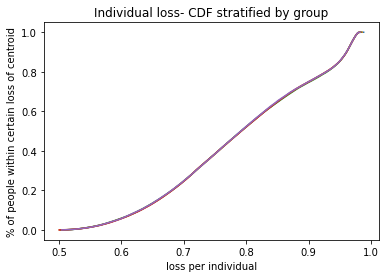

c  {0: (4.301701393122765, 3.6631979915066775), 1: (-9.11966925908395, -8.923967367892407), 2: (-10.456197082035523, 6.729771447881625), 3: (9.56575932589566, -3.223838024002072), 4: (-1.7857745794576514, 8.380527424959103), 5: (-2.0673307423220386, 2.1836925237575144), 6: (2.1522063887144642, 9.170593641116312), 7: (4.8511060056607205, -1.1478352804417111), 8: (-8.10914510333969, -7.338203213647175), 9: (6.462839944655384, 7.832807179400294)}
weights:  [0.19999785 0.20001785 0.20003329 0.20003386 0.19991714]
Time elapsed Batch Step:  0.34037280082702637
Time elapsed Assignment Step:  2.378523111343384
0.0006453689656499284
total:  0.5555778591772665


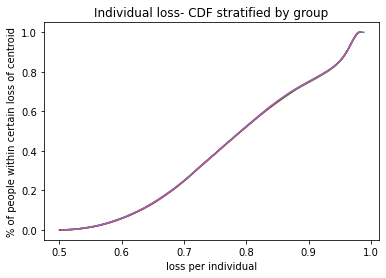

c  {0: (4.300948499248517, 3.6628324771602814), 1: (-9.11860709455561, -8.923004751417286), 2: (-10.454458605117704, 6.72957065656004), 3: (9.565129472826504, -3.2219767763249103), 4: (-1.7846132305711075, 8.379462644906335), 5: (-2.0662996787194783, 2.1848721566438636), 6: (2.1507840227291974, 9.16924109683633), 7: (4.851337830781709, -1.1465898303649091), 8: (-8.109833247828785, -7.339467770118368), 9: (6.4611388715282745, 7.8320869511442535)}
weights:  [0.19999784 0.20001785 0.2000334  0.20003395 0.19991694]
Time elapsed Batch Step:  0.3487372398376465
Time elapsed Assignment Step:  2.307004690170288
0.0006219345041987845
total:  0.5554503555083178


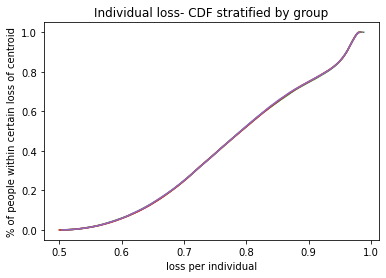

c  {0: (4.3001968799785075, 3.662461962992441), 1: (-9.117546525701476, -8.922043511387269), 2: (-10.452722608711316, 6.729370297064092), 3: (9.564500211266665, -3.2201173049693246), 4: (-1.78345329952389, 8.378399142636496), 5: (-2.065271073969864, 2.1860469876782322), 6: (2.149362680495691, 9.167889543820525), 7: (4.851569860940421, -1.1453444075780332), 8: (-8.110519939082645, -7.340729746873477), 9: (6.459439580858319, 7.831367591509918)}
weights:  [0.19999784 0.20001786 0.20003351 0.20003404 0.19991675]
Time elapsed Batch Step:  0.35199761390686035
Time elapsed Assignment Step:  2.3337361812591553
0.0006325574958238045
total:  0.5553332503333566


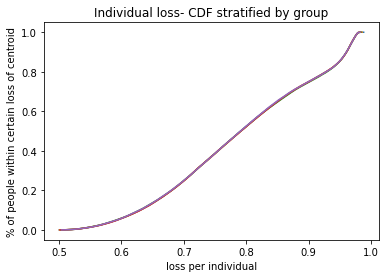

c  {0: (4.299445059766073, 3.6620914464587435), 1: (-9.11648755466733, -8.921083650037778), 2: (-10.450989098651538, 6.729170369912168), 3: (9.563871544120978, -3.218259618107131), 4: (-1.782294788283107, 8.3773369202101), 5: (-2.064243063774666, 2.1872212112761806), 6: (2.1479423682291787, 9.166538987747456), 7: (4.851802096329225, -1.1440990130391477), 8: (-8.111205176547589, -7.341989143157636), 9: (6.457742079415771, 7.830649103349122)}
weights:  [0.19999784 0.20001786 0.20003361 0.20003413 0.19991655]
Time elapsed Batch Step:  0.34254980087280273
Time elapsed Assignment Step:  2.3632869720458984
0.0006118004189024084
total:  0.5552069124510426


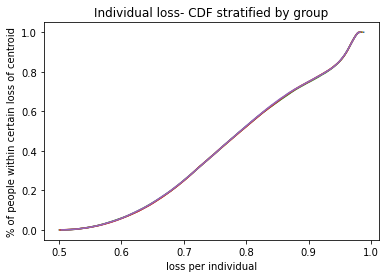

c  {0: (4.298693038603918, 3.661720927615757), 1: (-9.115430183588773, -8.920125169597613), 2: (-10.449258080663283, 6.728970875646083), 3: (9.563243474306402, -3.2164037239245578), 4: (-1.7811376988040213, 8.376275979680825), 5: (-2.063215650101399, 2.1883948248407195), 6: (2.146523092150048, 9.165189434302649), 7: (4.852034537139703, -1.1428536477044384), 8: (-8.111888959686954, -7.343245958237784), 9: (6.456046373940722, 7.829931489488428)}
weights:  [0.19999784 0.20001786 0.20003372 0.20003422 0.19991635]
Time elapsed Batch Step:  0.34592652320861816
Time elapsed Assignment Step:  2.2855589389801025
0.0006220199334189269
total:  0.5550900489201986


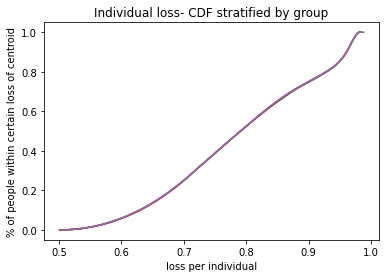

c  {0: (4.297940816484937, 3.66135040652007), 1: (-9.114374414591072, -8.919168072288816), 2: (-10.44752956036761, 6.7287718148307585), 3: (9.562616004751622, -3.2145496306226677), 4: (-1.7799820330299656, 8.375216323095486), 5: (-2.0621888349169692, 2.1895678257752156), 6: (2.145104858483631, 9.16384088917853), 7: (4.852267183562622, -1.1416083125282266), 8: (-8.1125712879811, -7.344500191402752), 9: (6.45435247114267, 7.82921475272878)}
weights:  [0.19999784 0.20001787 0.20003383 0.20003431 0.19991616]
Time elapsed Batch Step:  0.3516249656677246
Time elapsed Assignment Step:  2.325204610824585
0.0006056654729452715
total:  0.5549654415884471


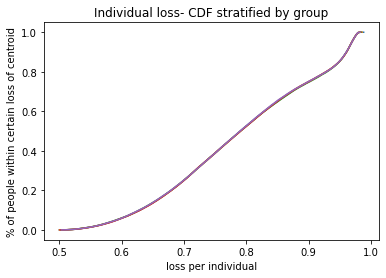

c  {0: (4.297188679257895, 3.6609741205449287), 1: (-9.11332024978902, -8.918212360326539), 2: (-10.445803543287445, 6.728573188053348), 3: (9.561989138396656, -3.2126973464177255), 4: (-1.7788277928922565, 8.374157952494002), 5: (-2.0611653585763383, 2.1907361307922026), 6: (2.143687673459997, 9.162493358074354), 7: (4.852500035787901, -1.1403630084629823), 8: (-8.113252160927406, -7.345751841963346), 9: (6.452660377700082, 7.8284988958451684)}
weights:  [0.19999784 0.20001787 0.20003393 0.2000344  0.19991596]
Time elapsed Batch Step:  0.34699225425720215
Time elapsed Assignment Step:  2.409259796142578
0.0006300914020974657
total:  0.554853252311089


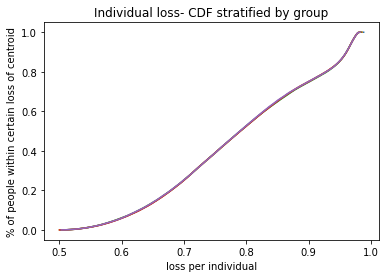

c  {0: (4.296436341956357, 3.660597830444105), 1: (-9.112267691286776, -8.917258035918916), 2: (-10.444080034852536, 6.72837499592196), 3: (9.561362878192478, -3.210846879541516), 4: (-1.777674980310104, 8.373100869909358), 5: (-2.06014247525835, 2.191903827920413), 6: (2.1422715433137407, 9.161146846696129), 7: (4.852733094004582, -1.1391177364593397), 8: (-8.113931578040276, -7.347000909252425), 9: (6.450970100259931, 7.827783921586272)}
weights:  [0.19999784 0.20001788 0.20003404 0.20003449 0.19991576]
Time elapsed Batch Step:  0.3538026809692383
Time elapsed Assignment Step:  2.2798924446105957
0.0006229397189122521
total:  0.55473177361362


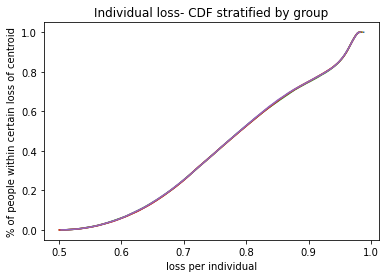

c  {0: (4.29568380457539, 3.6602215362737476), 1: (-9.11121674117773, -8.916305101266932), 2: (-10.44235904040367, 6.728177239064121), 3: (9.56073722710062, -3.208998238241615), 4: (-1.7765235971905222, 8.372045077367572), 5: (-2.0591201869051283, 2.193070914595302), 6: (2.140856474283771, 9.159801360756536), 7: (4.852966358400805, -1.137872497466112), 8: (-8.114609538851136, -7.348247392624987), 9: (6.449281645437221, 7.827069832674103)}
weights:  [0.19999784 0.20001789 0.20003414 0.20003457 0.19991555]
Time elapsed Batch Step:  0.3579578399658203
Time elapsed Assignment Step:  2.313419818878174
0.0006280745820987921
total:  0.5546141646648508


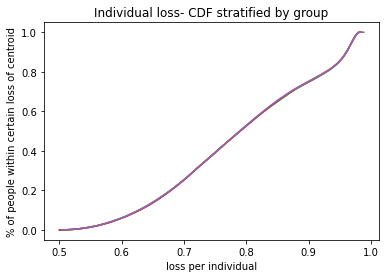

c  {0: (4.294931067110251, 3.659845238090024), 1: (-9.110167401544341, -8.915353558564291), 2: (-10.440640565196182, 6.7279799181250866), 3: (9.560112188092805, -3.207151430781615), 4: (-1.7753736454282358, 8.370990576887658), 5: (-2.0580984954576036, 2.1942373882525206), 6: (2.139442472613095, 9.158456905974852), 7: (4.853199829163779, -1.1366272924303091), 8: (-8.115286042908432, -7.34949129145825), 9: (6.447595019814494, 7.826356631803638)}
weights:  [0.19999784 0.2000179  0.20003425 0.20003466 0.19991535]
Time elapsed Batch Step:  0.3549330234527588
Time elapsed Assignment Step:  2.3267056941986084
0.0006456033504106395
total:  0.5545004356174896


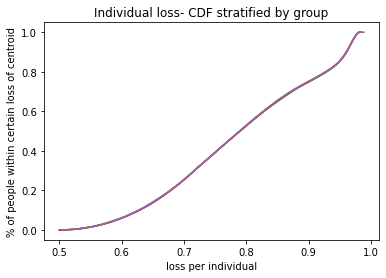

c  {0: (4.294165930366911, 3.6594484996641943), 1: (-9.109119674458004, -8.914403409997293), 2: (-10.438924614402836, 6.727783033766076), 3: (9.559487764150568, -3.205306465441309), 4: (-1.7742251269055866, 8.369937370481592), 5: (-2.057077402855339, 2.1954032463279134), 6: (2.1380295445486057, 9.157113488076856), 7: (4.853433506479749, -1.1353821222971545), 8: (-8.115961089777631, -7.350732605151727), 9: (6.445916100532168, 7.82563740985607)}
weights:  [0.19999785 0.20001791 0.20003435 0.20003475 0.19991515]
Time elapsed Batch Step:  0.35052919387817383
Time elapsed Assignment Step:  2.2734267711639404
0.0006519293635821599
total:  0.5543835320630108


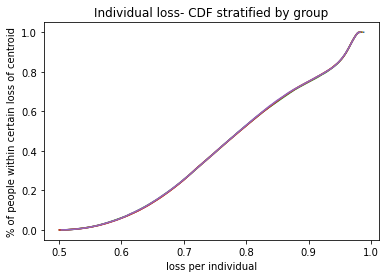

c  {0: (4.29340058510152, 3.6590517634446456), 1: (-9.108073561978895, -8.9134546577447), 2: (-10.437211193116129, 6.7275865866624915), 3: (9.558863958264892, -3.2034633505168357), 4: (-1.7730780434924378, 8.368885460154262), 5: (-2.056056911036355, 2.1965684862575197), 6: (2.136617696340859, 9.155771112794747), 7: (4.853667390533976, -1.1341369880101035), 8: (-8.11663467904122, -7.351971333127308), 9: (6.444238992620822, 7.824919070866177)}
weights:  [0.19999785 0.20001791 0.20003446 0.20003483 0.19991494]
Time elapsed Batch Step:  0.3372797966003418
Time elapsed Assignment Step:  2.2920780181884766
0.0006130960628709659
total:  0.5542532671521451


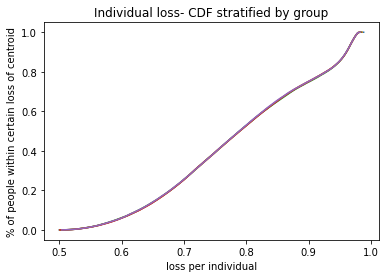

c  {0: (4.292635031314654, 3.658655029493664), 1: (-9.10702906615583, -8.912507303977609), 2: (-10.43550030635011, 6.727390577502162), 3: (9.558240773435854, -3.2016220943207876), 4: (-1.771932397046076, 8.367834847903435), 5: (-2.0550370219369505, 2.197733105477585), 6: (2.1352069342438575, 9.154429785867043), 7: (4.8539014815107056, -1.132891890510863), 8: (-8.117306810298697, -7.353207474829338), 9: (6.442563702519137, 7.82420161745087)}
weights:  [0.19999786 0.20001792 0.20003456 0.20003492 0.19991473]
Time elapsed Batch Step:  0.35703110694885254
Time elapsed Assignment Step:  2.3132317066192627
0.0006324988070091075
total:  0.5541406138838203


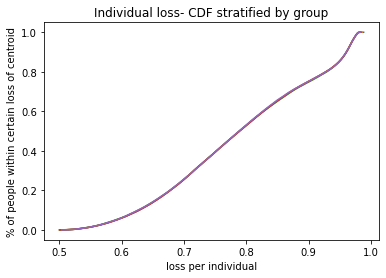

c  {0: (4.291854555748737, 3.6582689265575694), 1: (-9.105986189026117, -8.911561350859333), 2: (-10.433791959041791, 6.727195006983635), 3: (9.557618212672264, -3.199782705182281), 4: (-1.7707881894111146, 8.366785535719709), 5: (-2.0540177374915163, 2.1988971014245777), 6: (2.1337972645148287, 9.15308951303849), 7: (4.854136780434742, -1.1316440545021644), 8: (-8.117977483166579, -7.354441029724692), 9: (6.440890236631981, 7.823485052198921)}
weights:  [0.19999786 0.20001794 0.20003467 0.20003501 0.19991453]
Time elapsed Batch Step:  0.33565211296081543
Time elapsed Assignment Step:  2.3174943923950195
0.0006550452689182418
total:  0.5540290918866182


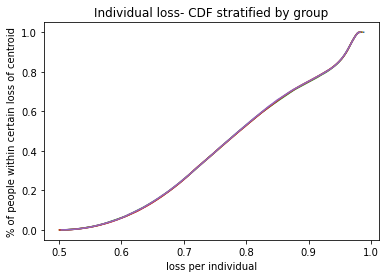

c  {0: (4.2910738607376055, 3.6578828232776366), 1: (-9.104944932615414, -8.91061680054527), 2: (-10.432086156052197, 6.726999875814524), 3: (9.556996278991324, -3.1979451914469967), 4: (-1.769645422419392, 8.36573752558647), 5: (-2.0529990596323477, 2.2000604715352154), 6: (2.132388693414, 9.151750300059954), 7: (4.854372287419031, -1.1303962487782346), 8: (-8.118646697278386, -7.355671997302851), 9: (6.439218601329821, 7.822769377670587)}
weights:  [0.19999787 0.20001795 0.20003477 0.20003509 0.19991432]
Time elapsed Batch Step:  0.3471205234527588
Time elapsed Assignment Step:  2.3479392528533936
0.0006192698646704242
total:  0.5539002616705415


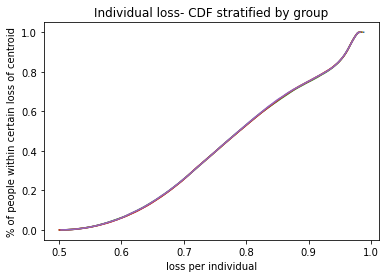

c  {0: (4.29029294628104, 3.6574967197116055), 1: (-9.103905298937581, -8.909673655182775), 2: (-10.430382902167148, 6.726805184709928), 3: (9.556374975418292, -3.196109561477188), 4: (-1.768504097889873, 8.364690819479843), 5: (-2.051980990289453, 2.2012232132464966), 6: (2.130981227204375, 9.150412152688324), 7: (4.854608002645583, -1.1291484742710496), 8: (-8.119314452284648, -7.356900377075978), 9: (6.437548802948107, 7.822054596397231)}
weights:  [0.19999788 0.20001796 0.20003488 0.20003517 0.19991411]
Time elapsed Batch Step:  0.34066200256347656
Time elapsed Assignment Step:  2.337974786758423
0.0006412710836551927
total:  0.5537889528989565


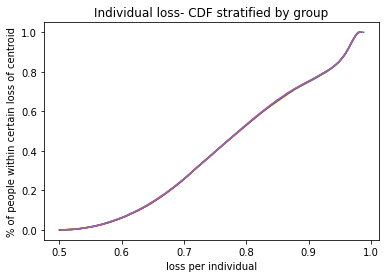

c  {0: (4.289511812379049, 3.657110615917236), 1: (-9.102867289994544, -8.908731916911043), 2: (-10.428682202097809, 6.726610934390914), 3: (9.555754304986143, -3.1942758236516586), 4: (-1.7673642176285456, 8.363645419368652), 5: (-2.050963531390355, 2.202385323995741), 6: (2.1295748721515055, 9.149075076686398), 7: (4.854843926295291, -1.1279007319109557), 8: (-8.119980747852892, -7.35812616857899), 9: (6.435880847786635, 7.82134071088095)}
weights:  [0.19999788 0.20001797 0.20003499 0.20003526 0.1999139 ]
Time elapsed Batch Step:  0.3567028045654297
Time elapsed Assignment Step:  2.389064073562622
0.0006499626122221658
total:  0.5536738407217457


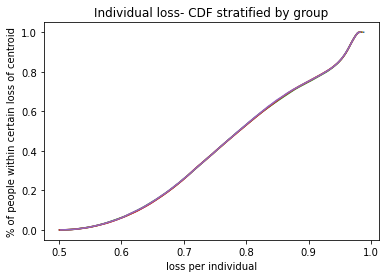

c  {0: (4.288730459031877, 3.6567245119523086), 1: (-9.101830907776144, -8.907791587860977), 2: (-10.426984060481061, 6.726417125583063), 3: (9.555134270735254, -3.1924439863657126), 4: (-1.7662257834283193, 8.362601327214357), 5: (-2.0499466848598926, 2.2035468012206363), 6: (2.128169634523263, 9.147739077822768), 7: (4.855080058547907, -1.1266530226266924), 8: (-8.120645583667644, -7.359349371369633), 9: (6.434214742108894, 7.8206277235942085)}
weights:  [0.19999789 0.20001799 0.20003509 0.20003534 0.19991369]
Time elapsed Batch Step:  0.33946824073791504
Time elapsed Assignment Step:  2.3199002742767334
0.000673922989477993
total:  0.5535634981973326


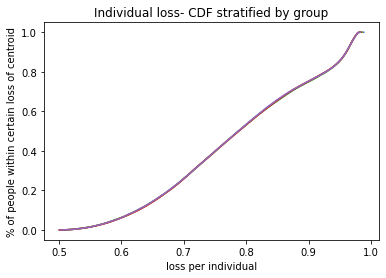

c  {0: (4.287948886239997, 3.656338407874622), 1: (-9.100796154260001, -8.906852670155075), 2: (-10.425288481879743, 6.7262237590150775), 3: (9.554514875713076, -3.1906140580310796), 4: (-1.7650887970689215, 8.361558544971013), 5: (-2.0489304526200156, 2.204707642359295), 6: (2.1267655205896077, 9.146404161871713), 7: (4.85531639958202, -1.125405347345415), 8: (-8.121308959430415, -7.360569985028549), 9: (6.432550492141382, 7.819915636979472)}
weights:  [0.1999979  0.200018   0.2000352  0.20003542 0.19991348]
Time elapsed Batch Step:  0.34557056427001953
Time elapsed Assignment Step:  2.379465341567993
0.0006832476869876869
total:  0.5534489548002733


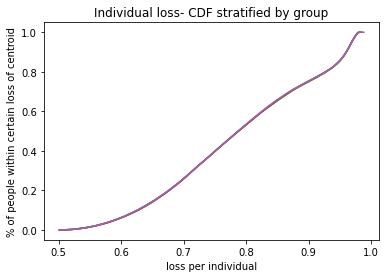

c  {0: (4.287167094004119, 3.655952303741995), 1: (-9.099763031411372, -8.9059151659073), 2: (-10.4235954707828, 6.7260308354174425), 3: (9.553896122973836, -3.188786047075812), 4: (-1.7639532603167936, 8.36051707458521), 5: (-2.047914836589578, 2.2058678448503164), 6: (2.125362536622356, 9.145070334613068), 7: (4.855552949575031, -1.1241577069927193), 8: (-8.121970874859702, -7.361788009159352), 9: (6.430888104072904, 7.819204453448855)}
weights:  [0.19999791 0.20001802 0.2000353  0.20003551 0.19991327]
Time elapsed Batch Step:  0.36550235748291016
Time elapsed Assignment Step:  2.34688663482666
0.0007319292002772038
total:  0.5533464087363997


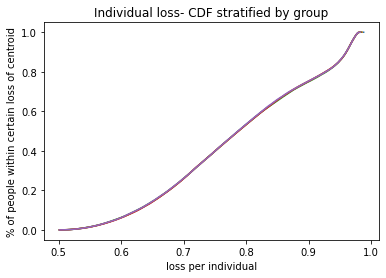

c  {0: (4.286385082325185, 3.6555661996122666), 1: (-9.098731541183009, -8.904979077222965), 2: (-10.42190503160536, 6.725838355521135), 3: (9.553278015578217, -3.1869599619441615), 4: (-1.7628191749249864, 8.359476917996023), 5: (-2.046899838684127, 2.2070274061328576), 6: (2.123960688894945, 9.143737601832106), 7: (4.8557897087031305, -1.1229101024926662), 8: (-8.122631329690979, -7.363003443388694), 9: (6.429227584053848, 7.818494175383779)}
weights:  [0.19999792 0.20001803 0.20003541 0.20003559 0.19991305]
Time elapsed Batch Step:  0.33829498291015625
Time elapsed Assignment Step:  2.26151704788208
0.0007268928571350086
total:  0.5532279382568385


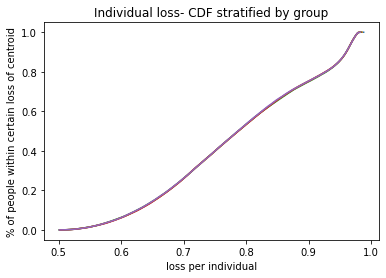

c  {0: (4.285602851204371, 3.6551800955432943), 1: (-9.097701685515018, -8.904044406198606), 2: (-10.42021716868879, 6.725646320056379), 3: (9.55266055659307, -3.1851358110964294), 4: (-1.7616865426330561, 8.358438077134947), 5: (-2.0458854608156885, 2.2081863236467125), 6: (2.1225599836821964, 9.142405969319404), 7: (4.856026677141275, -1.1216625347678066), 8: (-8.123290323676683, -7.364216287366333), 9: (6.427568938195442, 7.817784805134637)}
weights:  [0.19999793 0.20001804 0.20003551 0.20003567 0.19991284]
Time elapsed Batch Step:  0.3672921657562256
Time elapsed Assignment Step:  2.268765449523926
0.000714594216025044
total:  0.5531074798624276


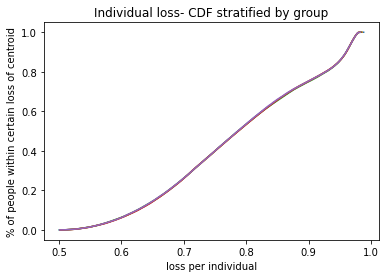

c  {0: (4.284820400643088, 3.6547939915929555), 1: (-9.096673466334725, -8.903111154921872), 2: (-10.418531886300725, 6.725454729751446), 3: (9.552043749091123, -3.183313603008797), 4: (-1.7605553651669583, 8.357400553925846), 5: (-2.0448717048925515, 2.209344594832398), 6: (2.121160427260078, 9.141075442870715), 7: (4.856263855063165, -1.1204150047392074), 8: (-8.123947856586216, -7.3654265407652035), 9: (6.425912172568989, 7.81707634502048)}
weights:  [0.19999794 0.20001806 0.20003562 0.20003576 0.19991263]
Time elapsed Batch Step:  0.37328171730041504
Time elapsed Assignment Step:  2.327116012573242
0.0007530981656829194
total:  0.5530024541560816


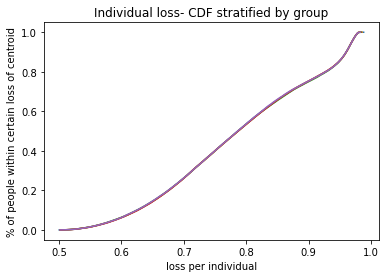

c  {0: (4.284037730642985, 3.6544078878191475), 1: (-9.09564688555653, -8.902179325471396), 2: (-10.416849188635117, 6.725263585331486), 3: (9.551427596150688, -3.181493346173135), 4: (-1.759425644238943, 8.356364350284885), 5: (-2.043858572819047, 2.2105022171312503), 6: (2.1197620259054624, 9.139746028286833), 7: (4.856501242641229, -1.119167513326478), 8: (-8.124603928205934, -7.366634203281477), 9: (6.424257293205079, 7.816368797328719)}
weights:  [0.19999795 0.20001807 0.20003572 0.20003584 0.19991242]
Time elapsed Batch Step:  0.33908843994140625
Time elapsed Assignment Step:  2.3015289306640625
0.0007622389119300577
total:  0.5528888118128069


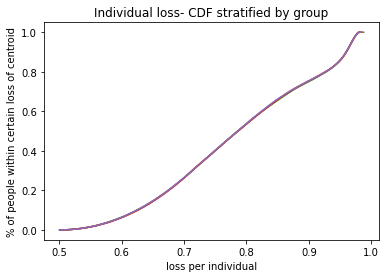

c  {0: (4.283254841205944, 3.654021784279786), 1: (-9.094621945081778, -8.901248919916686), 2: (-10.41516907981231, 6.725072887517403), 3: (9.550812100855383, -3.179675049096791), 4: (-1.75829738154745, 8.355329468120472), 5: (-2.0428460664953265, 2.2116591879855263), 6: (2.1183647858958845, 9.138417731373442), 7: (4.856738840046594, -1.1179200614477969), 8: (-8.125258538339128, -7.367839274634634), 9: (6.42260430609279, 7.815662164314842)}
weights:  [0.19999796 0.20001808 0.20003583 0.20003592 0.19991221]
Time elapsed Batch Step:  0.34680938720703125
Time elapsed Assignment Step:  2.287226915359497
0.0007492126916711639
total:  0.5527687122073456


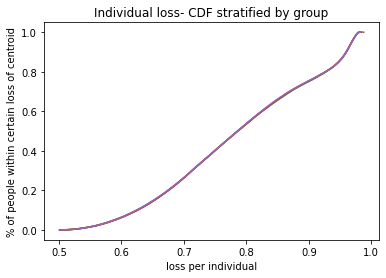

c  {0: (4.282471732334087, 3.6536356810328074), 1: (-9.093598646798618, -8.900319940318003), 2: (-10.413491563879147, 6.724882637024759), 3: (9.55019726629386, -3.1778587203023587), 4: (-1.7571705787770036, 8.35429590933319), 5: (-2.041834187817137, 2.212815504838517), 6: (2.1169687135092965, 9.137090557940983), 7: (4.856976647449074, -1.1166726500199389), 8: (-8.125911686806031, -7.3690417545675215), 9: (6.42095321717887, 7.814956448202157)}
weights:  [0.19999797 0.2000181  0.20003593 0.200036   0.199912  ]
Time elapsed Batch Step:  0.3325977325439453
Time elapsed Assignment Step:  2.292287826538086
0.0007336919420203314
total:  0.5526479759129409


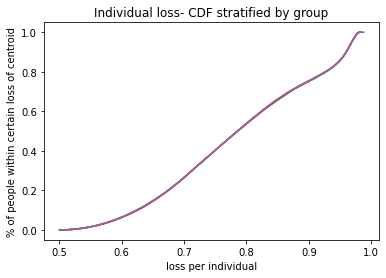

c  {0: (4.281654729861044, 3.653263292959366), 1: (-9.092576992581865, -8.899392388726245), 2: (-10.411816644809125, 6.7246928345627275), 3: (9.549583095559532, -3.1760443683274278), 4: (-1.7560452375981068, 8.353263675815734), 5: (-2.040822938675596, 2.2139711651346676), 6: (2.115573815023822, 9.135764513804492), 7: (4.857220370056348, -1.1154253190210748), 8: (-8.12656337344379, -7.370241642846418), 9: (6.419304032366906, 7.8142516511815545)}
weights:  [0.19999799 0.20001811 0.20003603 0.20003608 0.19991179]
Time elapsed Batch Step:  0.3736546039581299
Time elapsed Assignment Step:  2.287012815475464
0.0007330465352439752
total:  0.5525318958828591


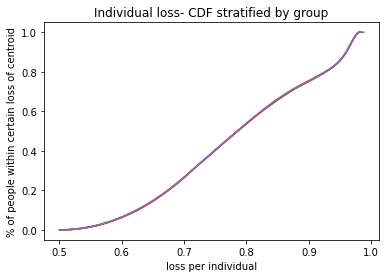

c  {0: (4.280837490189546, 3.6528908962479214), 1: (-9.091556984292867, -8.898466267182833), 2: (-10.41014432650263, 6.724503480833066), 3: (9.548969591750305, -3.1742320017243135), 4: (-1.7549213596671385, 8.352232769452836), 5: (-2.0398123209569614, 2.215126166319704), 6: (2.1141800967175057, 9.134439604783456), 7: (4.857464306971143, -1.114178016282262), 8: (-8.12721359810647, -7.371438939261096), 9: (6.417656757516474, 7.813547775411306)}
weights:  [0.199998   0.20001812 0.20003614 0.20003616 0.19991158]
Time elapsed Batch Step:  0.33592963218688965
Time elapsed Assignment Step:  2.333622694015503
0.0007226948356485741
total:  0.5524130986483897


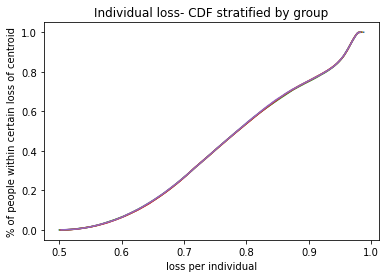

c  {0: (4.280020013326972, 3.6525184909534634), 1: (-9.09053862377937, -8.897541577719599), 2: (-10.408474612787206, 6.724314576529144), 3: (9.548356757968323, -3.1724216290597713), 4: (-1.7537989466262487, 8.3512031921212), 5: (-2.038802336542404, 2.2162805058407717), 6: (2.112787564868063, 9.133115836701645), 7: (4.857708458362791, -1.1129307426970354), 8: (-8.127862360665032, -7.37263364362488), 9: (6.416011398442289, 7.812844823016874)}
weights:  [0.19999801 0.20001814 0.20003624 0.20003623 0.19991138]
Time elapsed Batch Step:  0.35947132110595703
Time elapsed Assignment Step:  2.3351786136627197
0.0007134300538464977
total:  0.5522948226996302


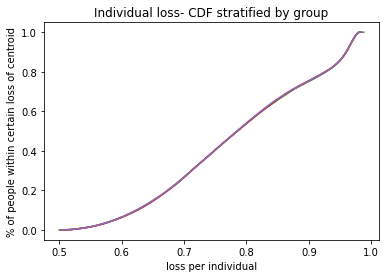

c  {0: (4.279202299280989, 3.6521460771310155), 1: (-9.089521912875389, -8.896618322358666), 2: (-10.406807507417918, 6.724126122335), 3: (9.547744597319708, -3.1706132589146896), 4: (-1.7526780001032551, 8.350174945689428), 5: (-2.0377929873077782, 2.217434181146583), 6: (2.111396225752626, 9.131793215386956), 7: (4.857952824399246, -1.1116834991577167), 8: (-8.128509661007328, -7.373825755774707), 9: (6.414367960913343, 7.812142796090771)}
weights:  [0.19999803 0.20001815 0.20003634 0.20003631 0.19991117]
Time elapsed Batch Step:  0.34980249404907227
Time elapsed Assignment Step:  2.3568220138549805
0.0007090372269989986
total:  0.5521782045422258


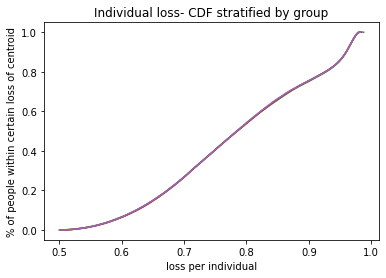

c  {0: (4.278384348059547, 3.651773654835634), 1: (-9.08850685340107, -8.895696503112344), 2: (-10.405143014077778, 6.723938118924448), 3: (9.547133112914313, -3.1688068998837675), 4: (-1.7515585217115412, 8.34914803201794), 5: (-2.036784275123389, 2.2185871896875686), 6: (2.1100060856474885, 9.130471746671239), 7: (4.858197405247066, -1.1104362865554442), 8: (-8.129155499038083, -7.375015275571183), 9: (6.412726450652034, 7.811441696692434)}
weights:  [0.19999804 0.20001817 0.20003645 0.20003638 0.19991096]
Time elapsed Batch Step:  0.3421051502227783
Time elapsed Assignment Step:  2.3390583992004395
0.0007254262814538892
total:  0.5520680175183614


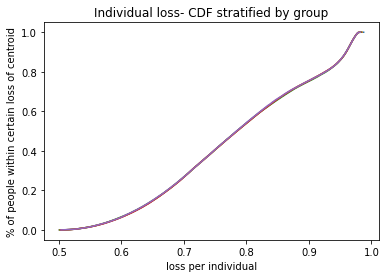

c  {0: (4.277566159670886, 3.6514012241224085), 1: (-9.08749344716256, -8.894776121983009), 2: (-10.403481136378243, 6.723750566960226), 3: (9.546522307865468, -3.1670025605751726), 4: (-1.7504405130499543, 8.348122452958906), 5: (-2.035776201853764, 2.219739528916044), 6: (2.1086171508278486, 9.129151436390122), 7: (4.858442201071398, -1.1091891057802026), 8: (-8.129799874678886, -7.376202202898642), 9: (6.4110868733333035, 7.810741526848146)}
weights:  [0.19999806 0.20001819 0.20003655 0.20003646 0.19991075]
Time elapsed Batch Step:  0.35429978370666504
Time elapsed Assignment Step:  2.289264440536499
0.0007437707903328317
total:  0.5519586137767134


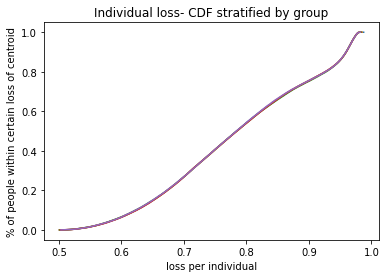

c  {0: (4.2767477341235285, 3.651028785046461), 1: (-9.086481695951875, -8.893857180963), 2: (-10.401821877859783, 6.7235634670931965), 3: (9.545912185289739, -3.165200249610183), 4: (-1.749323975702705, 8.347098210356162), 5: (-2.034768769357425, 2.22089119628638), 6: (2.107229427567548, 9.127832290382841), 7: (4.858687212035959, -1.1079419577208511), 8: (-8.130442787868173, -7.377386537665198), 9: (6.409449234583764, 7.810042288550983)}
weights:  [0.19999807 0.2000182  0.20003665 0.20003653 0.19991055]
Time elapsed Batch Step:  0.3533952236175537
Time elapsed Assignment Step:  2.310279607772827
0.0006767397683767884
total:  0.5518237935302059


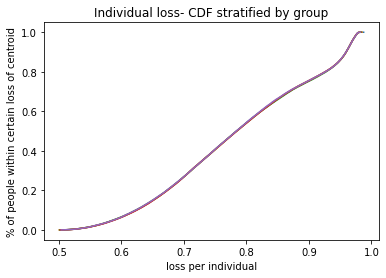

c  {0: (4.2759290714262885, 3.650656337662947), 1: (-9.085471601546772, -8.892939682034502), 2: (-10.400165241992527, 6.723376819961589), 3: (9.545302748306685, -3.163399975622811), 4: (-1.7482089112392685, 8.34607530604513), 5: (-2.0337619794866555, 2.222042189255185), 6: (2.105842922138808, 9.126514314492043), 7: (4.858932438303026, -1.106694843265155), 8: (-8.131084238561215, -7.378568279802802), 9: (6.407813539980841, 7.809343983760809)}
weights:  [0.19999809 0.20001822 0.20003676 0.2000366  0.19991034]
Time elapsed Batch Step:  0.34927868843078613
Time elapsed Assignment Step:  2.2850375175476074
0.0006652344196562687
total:  0.5517058284725392


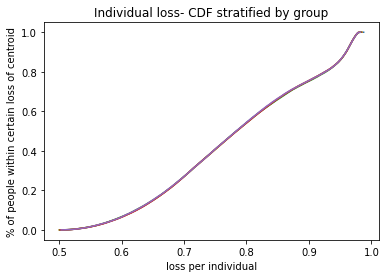

c  {0: (4.275110171588269, 3.6502838820270553), 1: (-9.08446316571062, -8.892023627169442), 2: (-10.398511232176968, 6.723190626190307), 3: (9.544694000038628, -3.161601747259406), 4: (-1.7470953212142861, 8.34505374185274), 5: (-2.0327558340872782, 2.2231925052814936), 6: (2.1044576408119684, 9.125197514563608), 7: (4.8591778800334176, -1.1054477632998154), 8: (-8.131724226730103, -7.379747429267292), 9: (6.406179795051917, 7.808646614404296)}
weights:  [0.1999981  0.20001823 0.20003686 0.20003667 0.19991014]
Time elapsed Batch Step:  0.3646383285522461
Time elapsed Assignment Step:  2.33990478515625
0.0007000296299434217
total:  0.5516019529343517


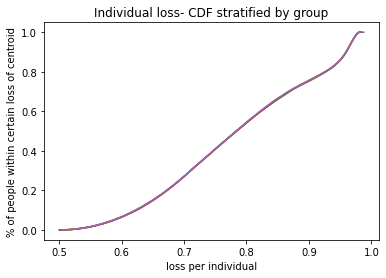

c  {0: (4.274291034618859, 3.6499114181940073), 1: (-9.083456390192273, -8.891109018329377), 2: (-10.396859851744734, 6.723004886390278), 3: (9.54408594361041, -3.159805573178243), 4: (-1.7459832071674692, 8.344033519597337), 5: (-2.031750334998429, 2.2243421418269667), 6: (2.1030735898552164, 9.123881896446447), 7: (4.85942353738648, -1.1042007187104985), 8: (-8.132362752363731, -7.3809239860384475), 9: (6.404548005273488, 7.807950182374992)}
weights:  [0.19999812 0.20001825 0.20003696 0.20003674 0.19990993]
Time elapsed Batch Step:  0.36435794830322266
Time elapsed Assignment Step:  2.30175518989563
0.000719927130045428
total:  0.5514938085861374


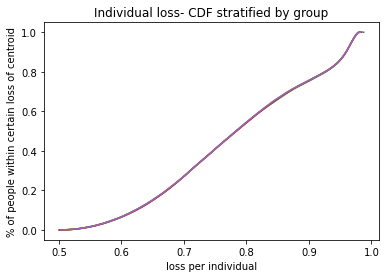

c  {0: (4.273471660527741, 3.6495389462190575), 1: (-9.082451276725939, -8.890195857465391), 2: (-10.395211103959415, 6.722819601157863), 3: (9.543478582149165, -3.158011462049091), 4: (-1.7448725706235038, 8.343014641088606), 5: (-2.030745484052336, 2.2254910963560968), 6: (2.1016907755343186, 9.122567465992304), 7: (4.859669410520076, -1.1029537103818676), 8: (-8.132999815467779, -7.382097950120037), 9: (6.402918176070344, 7.807254689533431)}
weights:  [0.19999813 0.20001827 0.20003707 0.2000368  0.19990972]
Time elapsed Batch Step:  0.34758782386779785
Time elapsed Assignment Step:  2.324885129928589
0.0007101269245242126
total:  0.5513769552770151


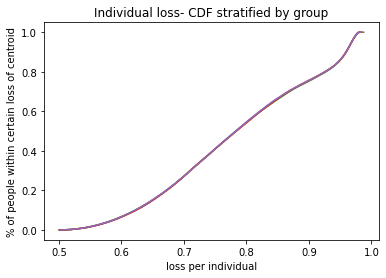

c  {0: (4.272652049324887, 3.6491664661574936), 1: (-9.081447827031058, -8.889284146517987), 2: (-10.393564992017442, 6.72263477107433), 3: (9.54287191878409, -3.1562194225527618), 4: (-1.7437634130919577, 8.341997108127476), 5: (-2.0297412830741006, 2.226639366336425), 6: (2.1003092041123494, 9.12125422905555), 7: (4.859915499590572, -1.101706739197613), 8: (-8.1336354160647, -7.383269321539869), 9: (6.401290312814752, 7.806560137707269)}
weights:  [0.19999815 0.20001829 0.20003718 0.20003687 0.19990951]
Time elapsed Batch Step:  0.35318446159362793
Time elapsed Assignment Step:  2.402750253677368
0.0007169560658871754
total:  0.5512652436324423


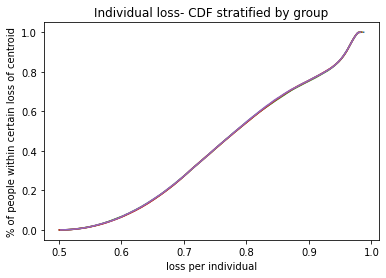

c  {0: (4.271817405769398, 3.6488063744099173), 1: (-9.080446042812174, -8.888373887416975), 2: (-10.391921519049019, 6.722450396705369), 3: (9.542265956646224, -3.1544294633806382), 4: (-1.7426557360671895, 8.340980922506033), 5: (-2.0287377338814867, 2.2277869492387627), 6: (2.098928881849415, 9.119942191492964), 7: (4.860161639665883, -1.1004563696925516), 8: (-8.134269554193702, -7.384438100349838), 9: (6.39966442082568, 7.805866528691476)}
weights:  [0.19999817 0.20001831 0.20003728 0.20003694 0.19990931]
Time elapsed Batch Step:  0.37955212593078613
Time elapsed Assignment Step:  2.4395549297332764
0.0006903004584182248
total:  0.5511436870784812


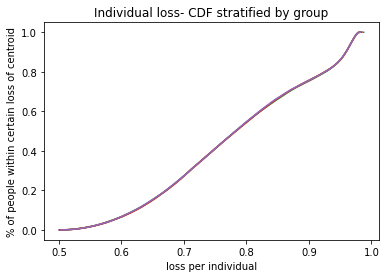

c  {0: (4.270982512842725, 3.648446271635486), 1: (-9.079445925758813, -8.887465082081377), 2: (-10.390280688119077, 6.72226647860068), 3: (9.541660698868213, -3.1526415932341854), 4: (-1.7415495410282593, 8.339966086007431), 5: (-2.0277348382847116, 2.2289338425374265), 6: (2.0975498150023766, 9.118631359163523), 7: (4.860407995788221, -1.0992060308683205), 8: (-8.134902229910727, -7.385604286625973), 9: (6.398040505368033, 7.80517386424856)}
weights:  [0.19999818 0.20001833 0.20003739 0.200037   0.1999091 ]
Time elapsed Batch Step:  0.40317320823669434
Time elapsed Assignment Step:  2.2961854934692383
0.0007556920132817391
total:  0.5510499454206306


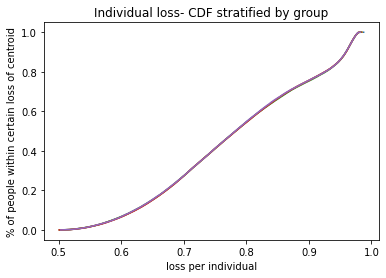

c  {0: (4.2701473705536515, 3.648086157883636), 1: (-9.078447477545364, -8.886557732419318), 2: (-10.388642502228283, 6.722083017293609), 3: (9.541056148584103, -3.150855820824437), 4: (-1.7404448294388417, 8.338952600405795), 5: (-2.026732598086243, 2.230080043710474), 6: (2.0961720098245697, 9.117321737928169), 7: (4.8606545681095605, -1.0979557236037782), 8: (-8.135533443288436, -7.386767880468478), 9: (6.396418571651929, 7.804482146108826)}
weights:  [0.1999982  0.20001835 0.2000375  0.20003707 0.19990889]
Time elapsed Batch Step:  0.367218017578125
Time elapsed Assignment Step:  2.3804430961608887
0.0007480470215646129
total:  0.5509344937617381


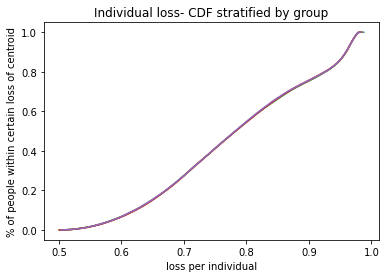

c  {0: (4.269311978911281, 3.6477260332038415), 1: (-9.077450699830946, -8.885651840327924), 2: (-10.38700696431406, 6.721900013300838), 3: (9.540452308929105, -3.1490721548714613), 4: (-1.7393416027471404, 8.337940467466131), 5: (-2.025731015080605, 2.2312255502399516), 6: (2.0947954725655222, 9.11601333364958), 7: (4.860901356780332, -1.0967054487769645), 8: (-8.136163194416188, -7.387928882001783), 9: (6.394798624832003, 7.803791375970679)}
weights:  [0.19999821 0.20001837 0.2000376  0.20003713 0.19990868]
Time elapsed Batch Step:  0.3427867889404297
Time elapsed Assignment Step:  2.3119122982025146
0.0007825928541614902
total:  0.5508319005984748


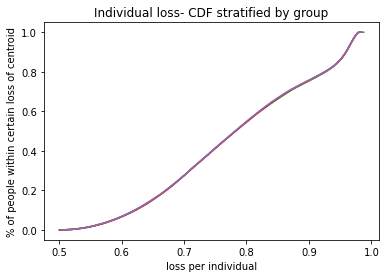

c  {0: (4.268476337925038, 3.6473658976456114), 1: (-9.076455594259297, -8.884747407693219), 2: (-10.385374077251628, 6.721717467122138), 3: (9.53984918303939, -3.1472906041038056), 4: (-1.7382398623858073, 8.336929688944227), 5: (-2.024730091054189, 2.2323703596121485), 6: (2.093420209470668, 9.114706152191928), 7: (4.861148361949413, -1.095455207265132), 8: (-8.136791483400023, -7.3890872913745795), 9: (6.393180670006747, 7.803101555500962)}
weights:  [0.19999823 0.20001839 0.20003771 0.20003719 0.19990848]
Time elapsed Batch Step:  0.3468008041381836
Time elapsed Assignment Step:  2.3238227367401123
0.0008261629315736707
total:  0.5507322169626191


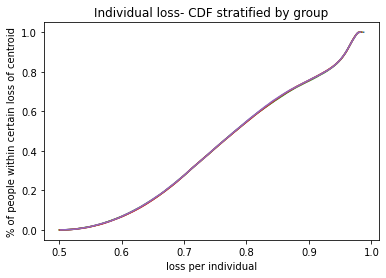

c  {0: (4.267640447604668, 3.647005751258493), 1: (-9.075462162458651, -8.883844436390024), 2: (-10.383743843855068, 6.72153537924016), 3: (9.539246774051866, -3.145511177257914), 4: (-1.737139609771861, 8.335920266586555), 5: (-2.023729827785074, 2.2335144693178557), 6: (2.092046226781059, 9.113400199420637), 7: (4.8613955837641205, -1.0942049999447774), 8: (-8.137418310362639, -7.390243108759865), 9: (6.3915647122178925, 7.8024126863353285)}
weights:  [0.19999825 0.20001841 0.20003782 0.20003726 0.19990827]
Time elapsed Batch Step:  0.3411438465118408
Time elapsed Assignment Step:  2.247309684753418
0.0008289294846353101
total:  0.5506204950496689


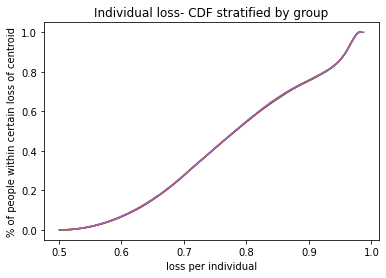

c  {0: (4.266804307960241, 3.6466455940920697), 1: (-9.07447040604162, -8.882942928281864), 2: (-10.382116266878382, 6.72135375012029), 3: (9.538645085103965, -3.1437338830775206), 4: (-1.736040846306611, 8.334912202130173), 5: (-2.0227302270428575, 2.2346578768526326), 6: (2.090673530733074, 9.11209548120212), 7: (4.8616430223702, -1.0929548276916727), 8: (-8.138043675443374, -7.391396334354982), 9: (6.389950756449833, 7.80172477007864)}
weights:  [0.19999826 0.20001843 0.20003792 0.20003732 0.19990806]
Time elapsed Batch Step:  0.35526037216186523
Time elapsed Assignment Step:  2.330284595489502
0.0007934970468500557
total:  0.550497516672022


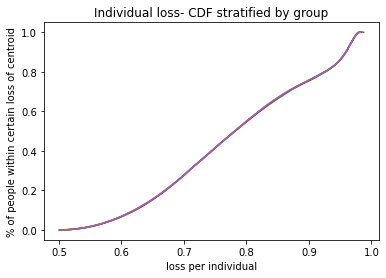

c  {0: (4.265967919002147, 3.646285426195962), 1: (-9.073480326605074, -8.882042885220855), 2: (-10.380491349016564, 6.721172580210538), 3: (9.538044119333428, -3.141958730313017), 4: (-1.7349435733755834, 8.333905497302625), 5: (-2.0217312905884923, 2.235800579717077), 6: (2.0893021275581245, 9.110792003403525), 7: (4.861890677911817, -1.0917046913808968), 8: (-8.138667578798183, -7.392546968381657), 9: (6.388338807629093, 7.80103780830541)}
weights:  [0.19999828 0.20001845 0.20003803 0.20003739 0.19990785]
Time elapsed Batch Step:  0.36655187606811523
Time elapsed Assignment Step:  2.2805845737457275
0.000779178490360799
total:  0.5503810754704448


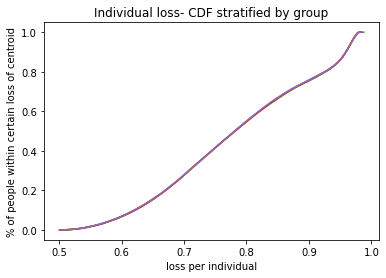

c  {0: (4.265131280741103, 3.6459252476198265), 1: (-9.072491925730029, -8.881144309047617), 2: (-10.378869092906658, 6.720991869941481), 3: (9.537443879878092, -3.1401857277207905), 4: (-1.7338477923484485, 8.33290015382184), 5: (-2.0207330201741383, 2.2369425754171006), 6: (2.087932023482356, 9.109489771892461), 7: (4.862138550531551, -1.0904545918868656), 8: (-8.139290020599615, -7.393695011086035), 9: (6.386728870623836, 7.800351802560261)}
weights:  [0.1999983  0.20001847 0.20003813 0.20003745 0.19990765]
Time elapsed Batch Step:  0.35576391220092773
Time elapsed Assignment Step:  2.3029944896698
0.0007941976002399098
total:  0.5502736404069576


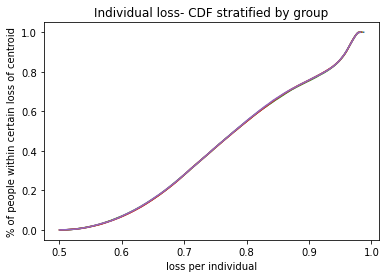

c  {0: (4.264294393188149, 3.645565058413358), 1: (-9.07150520498153, -8.880247201591175), 2: (-10.37724950112882, 6.720811619726239), 3: (9.536844369875677, -3.1384148840625317), 4: (-1.732753504578954, 8.331896173396025), 5: (-2.0197354175430227, 2.2380838614642107), 6: (2.086563224726349, 9.108188792536723), 7: (4.862386640370385, -1.0892045300833644), 8: (-8.139911001036797, -7.394840462738718), 9: (6.385120950243432, 7.7996667543584115)}
weights:  [0.19999831 0.20001849 0.20003824 0.20003752 0.19990744]
Time elapsed Batch Step:  0.3571927547454834
Time elapsed Assignment Step:  2.3404970169067383
0.0007536556314153842
total:  0.5501497427875217


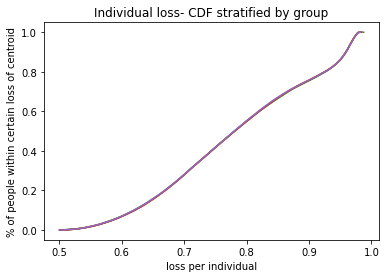

c  {0: (4.263457256354653, 3.645204858626288), 1: (-9.070520165908535, -8.879351564668855), 2: (-10.375632576207346, 6.720631829960489), 3: (9.536245592463578, -3.136646208104511), 4: (-1.7316607114048588, 8.330893557723567), 5: (-2.018738484429315, 2.2392244353757893), 6: (2.0851957375048147, 9.106889071203994), 7: (4.862634947567702, -1.0879545068435785), 8: (-8.140530520315401, -7.395983323634797), 9: (6.3835150512380645, 7.798982665186188)}
weights:  [0.19999833 0.20001852 0.20003834 0.20003758 0.19990724]
Time elapsed Batch Step:  0.34398412704467773
Time elapsed Assignment Step:  2.378880500793457
0.0007034507208870666
total:  0.550023152286416


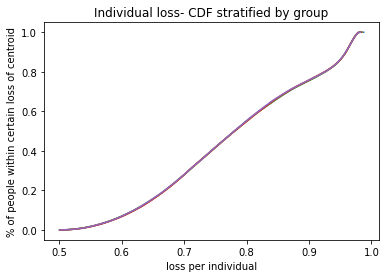

c  {0: (4.262619870252307, 3.644844648308384), 1: (-9.0695368100438, -8.878457400086203), 2: (-10.374018320611716, 6.720452501022518), 3: (9.535647550778645, -3.134879708616819), 4: (-1.7305694141478722, 8.329892308492923), 5: (-2.0177422225580113, 2.2403642946753815), 6: (2.0838295680262884, 9.105590613761564), 7: (4.862883472261278, -1.0867045230401244), 8: (-8.141148578657633, -7.3971235940938875), 9: (6.38191117829839, 7.798299536501556)}
weights:  [0.19999835 0.20001854 0.20003844 0.20003764 0.19990703]
Time elapsed Batch Step:  0.33745837211608887
Time elapsed Assignment Step:  2.34389591217041
0.0007208814595295321
total:  0.549917059729902


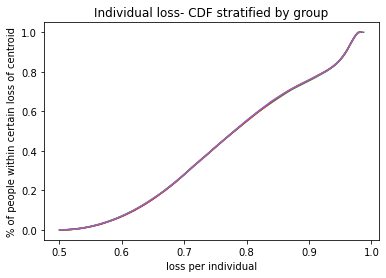

c  {0: (4.261782234893131, 3.6444844275094512), 1: (-9.068555138903777, -8.877564709636875), 2: (-10.372406736757581, 6.720273633273299), 3: (9.535050247956978, -3.1331153943725742), 4: (-1.7294796141135946, 8.328892427382518), 5: (-2.0167466336448365, 2.241503436892979), 6: (2.082464722492819, 9.104293426076008), 7: (4.8631322145872735, -1.0854545795450805), 8: (-8.141765176302195, -7.3982612744601575), 9: (6.380309336055252, 7.79761736973466)}
weights:  [0.19999836 0.20001856 0.20003855 0.20003771 0.19990683]
Time elapsed Batch Step:  0.36373329162597656
Time elapsed Assignment Step:  2.33652663230896
0.000754939887343431
total:  0.5498161624900056


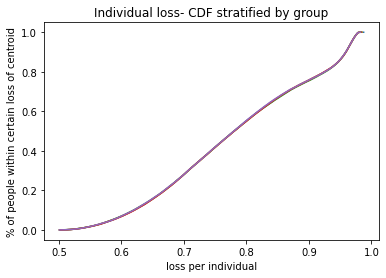

c  {0: (4.260944350289474, 3.644124196279332), 1: (-9.067575153988495, -8.876673495102553), 2: (-10.37079782700775, 6.720095227056598), 3: (9.534453687133704, -3.131353274147086), 4: (-1.7283913125914634, 8.327893916060635), 5: (-2.0157517193961576, 2.2426418595653095), 6: (2.081101207099655, 9.102997514012884), 7: (4.863381174680231, -1.0842046772300178), 8: (-8.142380313504272, -7.399396365102359), 9: (6.378709529079437, 7.796936166288384)}
weights:  [0.19999838 0.20001858 0.20003865 0.20003777 0.19990663]
Time elapsed Batch Step:  0.33455586433410645
Time elapsed Assignment Step:  2.3434159755706787
0.000769421823139993
total:  0.5497095988010812


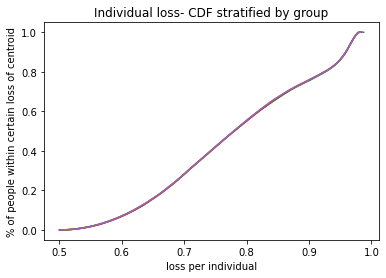

c  {0: (4.260106216454014, 3.6437639546679055), 1: (-9.066596856781452, -8.87578375825285), 2: (-10.369191593673149, 6.719917282699098), 3: (9.533857871442772, -3.129593356716981), 4: (-1.7273045108547016, 8.326896776185308), 5: (-2.014757481508913, 2.243779560236121), 6: (2.0797390280349264, 9.101702883436396), 7: (4.863630352673068, -1.082954816966031), 8: (-8.142993990535503, -7.40052886641386), 9: (6.377111761881489, 7.796255927538922)}
weights:  [0.1999984  0.2000186  0.20003875 0.20003783 0.19990642]
Time elapsed Batch Step:  0.3589324951171875
Time elapsed Assignment Step:  2.346395254135132
0.0007746877736163338
total:  0.549600477577693


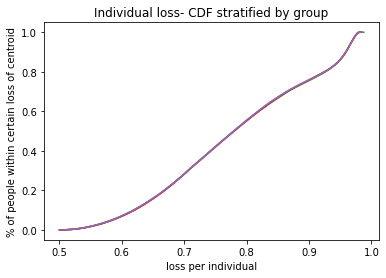

c  {0: (4.2592678333997585, 3.643403702725088), 1: (-9.065620248749509, -8.874895500845216), 2: (-10.36758803901374, 6.719739800510546), 3: (9.533262804016726, -3.1278356508592804), 4: (-1.72621921016027, 8.325901009404214), 5: (-2.013763921670557, 2.244916536456467), 6: (2.0783781914793247, 9.10040954020906), 7: (4.863879748697077, -1.0817049996237689), 8: (-8.14360620768395, -7.401658778812665), 9: (6.375516038911567, 7.795576654836348)}
weights:  [0.19999842 0.20001862 0.20003885 0.20003789 0.19990622]
Time elapsed Batch Step:  0.3354051113128662
Time elapsed Assignment Step:  2.3368313312530518
0.0007101182257648331
total:  0.5494706133344617


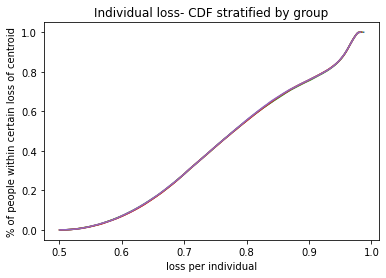

c  {0: (4.258429201140045, 3.6430434405008336), 1: (-9.064645331342781, -8.874008724624854), 2: (-10.365987165239423, 6.719562780783922), 3: (9.53266848798649, -3.1260801653504298), 4: (-1.7251354117488242, 8.32490661735457), 5: (-2.0127710415590205, 2.2460527857849897), 6: (2.077018703605777, 9.099117490191365), 7: (4.864129362881915, -1.0804552260734648), 8: (-8.144216965254081, -7.402786102741447), 9: (6.373922364559352, 7.794898349505199)}
weights:  [0.19999843 0.20001864 0.20003896 0.20003794 0.19990602]
Time elapsed Batch Step:  0.36745476722717285
Time elapsed Assignment Step:  2.3295512199401855
0.0006951555750486227
total:  0.5493557844837663


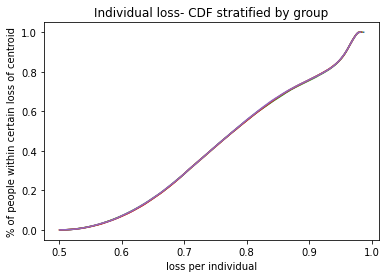

c  {0: (4.257593106681161, 3.642680622116059), 1: (-9.063672105994536, -8.873123431324622), 2: (-10.364388974510902, 6.719386223795603), 3: (9.532074926481135, -3.124326908965278), 4: (-1.7240531168446744, 8.32391360166301), 5: (-2.011778842842687, 2.2471883057881965), 6: (2.075660570579118, 9.097826739241397), 7: (4.864386550961168, -1.0791993011242378), 8: (-8.144826263566737, -7.403910838667568), 9: (6.372330743154002, 7.794221012845049)}
weights:  [0.19999845 0.20001866 0.20003906 0.200038   0.19990583]
Time elapsed Batch Step:  0.36095452308654785
Time elapsed Assignment Step:  2.334155321121216
0.0007003176604867267
total:  0.5492472005646626


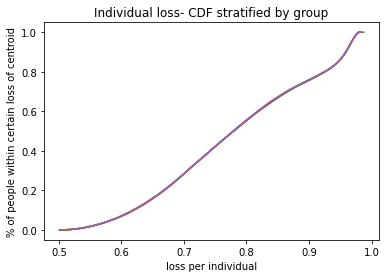

c  {0: (4.256756763721872, 3.642317789831626), 1: (-9.062700574121086, -8.872239622664948), 2: (-10.362793468940513, 6.719210129805554), 3: (9.53148212262766, -3.122575890475999), 4: (-1.72297232665575, 8.322921963945493), 5: (-2.010787327180385, 2.248323094040735), 6: (2.0743037985557544, 9.09653729321448), 7: (4.864643961478097, -1.077943420226928), 8: (-8.145434102959104, -7.4050329870831035), 9: (6.370741178964151, 7.793544646131088)}
weights:  [0.19999847 0.20001868 0.20003917 0.20003805 0.19990563]
Time elapsed Batch Step:  0.3398406505584717
Time elapsed Assignment Step:  2.2598297595977783
0.0007480550536811403
total:  0.5491515966537427


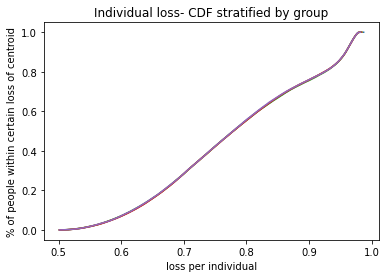

c  {0: (4.255920172275657, 3.641954943694176), 1: (-9.061730737121687, -8.871357300353743), 2: (-10.36120065059303, 6.7190344990575195), 3: (9.530890079550744, -3.1208271186509524), 4: (-1.721893042373567, 8.32193170580718), 5: (-2.0097964962213988, 2.249457148125659), 6: (2.072948393683331, 9.09524915796279), 7: (4.864901594556245, -1.0766875842604346), 8: (-8.146040483784688, -7.406152548504864), 9: (6.3691536761979455, 7.792869250614695)}
weights:  [0.19999849 0.2000187  0.20003927 0.20003811 0.19990543]
Time elapsed Batch Step:  0.3525876998901367
Time elapsed Assignment Step:  2.290904998779297
0.0007576647073396225
total:  0.5490447250159581


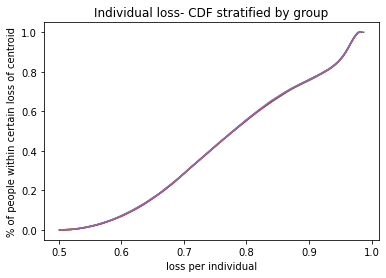

c  {0: (4.255065556338041, 3.64159752419034), 1: (-9.060762596378433, -8.870476466086314), 2: (-10.359610521486427, 6.718859331779212), 3: (9.530298800372508, -3.119080602253479), 4: (-1.720815265173202, 8.320942828842327), 5: (-2.0088063516054926, 2.2505904656346902), 6: (2.071594362100386, 9.093962339334954), 7: (4.865162458885751, -1.0754330145320299), 8: (-8.146645406413286, -7.407269523474416), 9: (6.367568239003128, 7.792194827524)}
weights:  [0.19999851 0.20001872 0.20003938 0.20003816 0.19990523]
Time elapsed Batch Step:  0.3795902729034424
Time elapsed Assignment Step:  2.3424582481384277
0.0007794702768093575
total:  0.5489417210449664


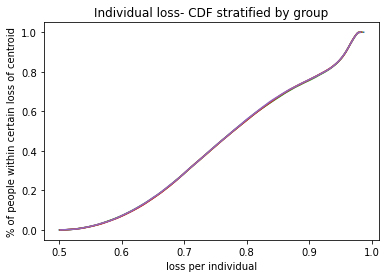

c  {0: (4.254210683851918, 3.6412400854409617), 1: (-9.059796153256164, -8.869597121545278), 2: (-10.358023083592617, 6.7186846281825146), 3: (9.529708288212253, -3.1173363500406275), 4: (-1.7197389962132679, 8.319955334634185), 5: (-2.007816894962955, 2.2517230441684704), 6: (2.0702417099360044, 9.092676843175639), 7: (4.865423547935213, -1.0741784850654712), 8: (-8.147248871230955, -7.408383912558099), 9: (6.3659848714671545, 7.791521378064443)}
weights:  [0.19999852 0.20001874 0.20003948 0.20003822 0.19990503]
Time elapsed Batch Step:  0.3531186580657959
Time elapsed Assignment Step:  2.305979013442993
0.0007971142780032192
total:  0.5488376783634284


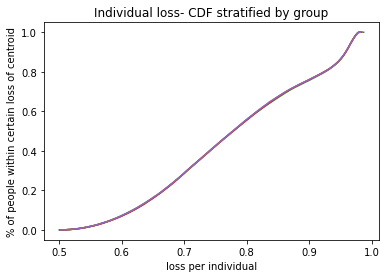

c  {0: (4.253355554835806, 3.64088262749254), 1: (-9.058831409102357, -8.868719268400472), 2: (-10.356438338838144, 6.718510388463668), 3: (9.529118546186202, -3.115594370761803), 4: (-1.7186642366358944, 8.318969224754879), 5: (-2.0068281279146563, 2.2528548813368032), 6: (2.0688904433094675, 9.091392675325132), 7: (4.865684861824997, -1.072923996728082), 8: (-8.147850878639982, -7.409495716347044), 9: (6.364403577617346, 7.790848903419318)}
weights:  [0.19999854 0.20001876 0.20003959 0.20003827 0.19990484]
Time elapsed Batch Step:  0.3478085994720459
Time elapsed Assignment Step:  2.329317331314087
0.0007971753381681435
total:  0.5487285712310852


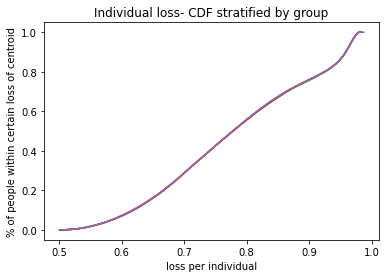

c  {0: (4.252500169308582, 3.6405251503916176), 1: (-9.057868365247037, -8.867842908308877), 2: (-10.354856289104854, 6.718336612803467), 3: (9.52852957740721, -3.113854673157336), 4: (-1.7175909875667146, 8.317984500765304), 5: (-2.005840052072126, 2.2539859747588875), 6: (2.0675405683298953, 9.090109841618897), 7: (4.865946400673783, -1.071669550387025), 8: (-8.148451429058857, -7.4106049354571875), 9: (6.362824361421072, 7.790177404750302)}
weights:  [0.19999856 0.20001878 0.2000397  0.20003832 0.19990464]
Time elapsed Batch Step:  0.35050320625305176
Time elapsed Assignment Step:  2.336801290512085
0.000811664241166743
total:  0.5486240032654182


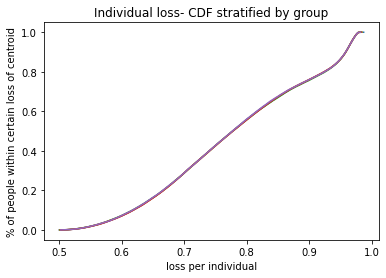

c  {0: (4.251644527289481, 3.6401676541847814), 1: (-9.056907023002678, -8.866968042914529), 2: (-10.35327693623052, 6.718163301367446), 3: (9.527941384984464, -3.112117265956963), 4: (-1.7165192501148534, 8.317001164215016), 5: (-2.0048526690376427, 2.2551163220635386), 6: (2.0661920910958846, 9.088828347887121), 7: (4.866208164598562, -1.0704151469093333), 8: (-8.14905052292224, -7.411711570529289), 9: (6.361247226785966, 7.789506883197977)}
weights:  [0.19999858 0.2000188  0.20003981 0.20003838 0.19990444]
Time elapsed Batch Step:  0.37107014656066895
Time elapsed Assignment Step:  2.3163139820098877
0.0008447682505388077
total:  0.5485252302697077


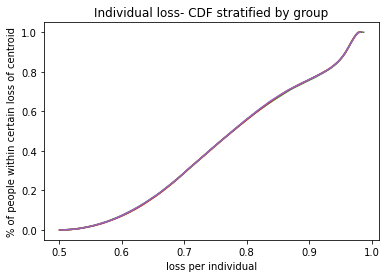

c  {0: (4.2507886287981025, 3.6398101389186617), 1: (-9.055947383664106, -8.86609467384844), 2: (-10.35170028200945, 6.717990454306054), 3: (9.527353972023164, -3.1103821578782123), 4: (-1.7154490253729222, 8.316019216642127), 5: (-2.003865980404342, 2.2562459208893966), 6: (2.064845017695141, 9.087548199954242), 7: (4.866470153714635, -1.0691607871619373), 8: (-8.149648160680925, -7.412815622228941), 9: (6.359672177560159, 7.788837339882333)}
weights:  [0.1999986  0.20001882 0.20003991 0.20003843 0.19990424]
Time elapsed Batch Step:  0.3421304225921631
Time elapsed Assignment Step:  2.304147720336914
0.0008803241722258326
total:  0.5484274043858779


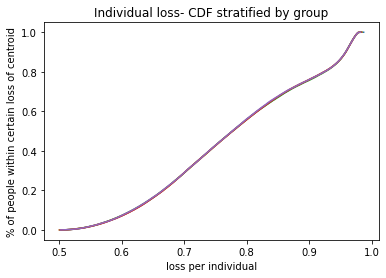

c  {0: (4.249932473854404, 3.639452604639934), 1: (-9.054989448508408, -8.865222802728518), 2: (-10.350126328193042, 6.717818071754828), 3: (9.526767341624174, -3.108649357624689), 4: (-1.7143803144170169, 8.315038659573194), 5: (-2.002879987756338, 2.2573747688851227), 6: (2.063499354204104, 9.086269403638461), 7: (4.866732368135618, -1.0679064720116949), 8: (-8.150244342801818, -7.413917091246582), 9: (6.35809921753255, 7.788168775903252)}
weights:  [0.19999862 0.20001884 0.20004002 0.20003848 0.19990404]
Time elapsed Batch Step:  0.34721827507019043
Time elapsed Assignment Step:  2.318075180053711
0.0008683179451848266
total:  0.548315521862406


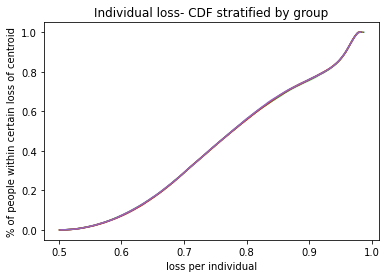

c  {0: (4.249076062478707, 3.639095051395317), 1: (-9.054033218794839, -8.864352431159478), 2: (-10.348555076490321, 6.717646153834555), 3: (9.526181496883641, -3.106918873884255), 4: (-1.7133131183067212, 8.314059494523114), 5: (-2.00189469266886, 2.2585028637095803), 6: (2.0621551066875683, 9.084991964751245), 7: (4.866994807973436, -1.0666522023254188), 8: (-8.150839069767896, -7.4150159782975065), 9: (6.356528350433082, 7.787501192340981)}
weights:  [0.19999863 0.20001886 0.20004013 0.20003853 0.19990385]
Time elapsed Batch Step:  0.348024845123291
Time elapsed Assignment Step:  2.3418400287628174
0.00085103659359409
total:  0.5482022682277155


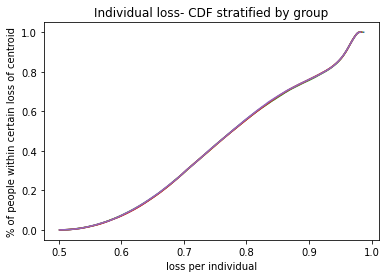

c  {0: (4.248219394691698, 3.6387374792315748), 1: (-9.05307869576473, -8.863483560732778), 2: (-10.346986528568442, 6.717474700651418), 3: (9.525596440892587, -3.105190715327088), 4: (-1.7122474380851134, 8.313081722995022), 5: (-2.0009100967084024, 2.2596302030320023), 6: (2.060812281198295, 9.083715889096794), 7: (4.867257473338328, -1.0653979789699055), 8: (-8.151432342078175, -7.416112284121872), 9: (6.354959579933041, 7.78683459025659)}
weights:  [0.19999865 0.20001887 0.20004024 0.20003858 0.19990365]
Time elapsed Batch Step:  0.3419363498687744
Time elapsed Assignment Step:  2.28981876373291
0.0007617193726355831
total:  0.5480676153261032


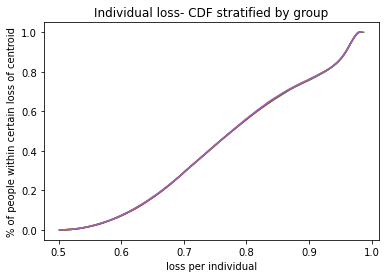

c  {0: (4.2473624705144255, 3.638379888195514), 1: (-9.052125880641405, -8.862616193026524), 2: (-10.34542068605315, 6.717303712297137), 3: (9.525012176736443, -3.1034648906036235), 4: (-1.7111832747787785, 8.312105346480182), 5: (-1.999926201432887, 2.260756784532142), 6: (2.0594708837766187, 9.08244118247151), 7: (4.86752036433885, -1.0641438028119623), 8: (-8.152024160247679, -7.417206009484708), 9: (6.353392909645376, 7.786168970692405)}
weights:  [0.19999867 0.20001889 0.20004035 0.20003863 0.19990345]
Time elapsed Batch Step:  0.3457796573638916
Time elapsed Assignment Step:  2.2909939289093018
0.0007940462183401165
total:  0.5479696675449154


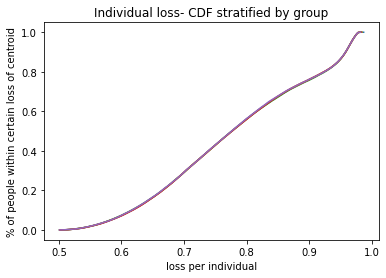

c  {0: (4.246505289968305, 3.638022278333987), 1: (-9.051174774630086, -8.861750329605405), 2: (-10.343857550529224, 6.7171331888490915), 3: (9.524428707494547, -3.1017414083423636), 4: (-1.7101206293978248, 8.311130366457887), 5: (-1.998943008391839, 2.2618826059004102), 6: (2.0581309204500426, 9.081167850663427), 7: (4.867783481081871, -1.0628896747184353), 8: (-8.152614524807404, -7.418297155175923), 9: (6.351828343125021, 7.785504334672432)}
weights:  [0.19999869 0.20001891 0.20004046 0.20003868 0.19990325]
Time elapsed Batch Step:  0.3408374786376953
Time elapsed Assignment Step:  2.297574043273926
0.0008051728831107718
total:  0.5478655725924662


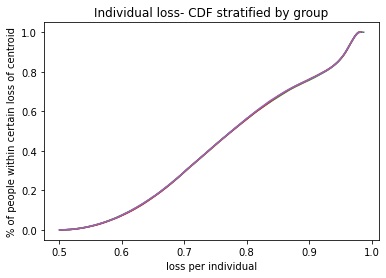

c  {0: (4.245647853075118, 3.63766464969389), 1: (-9.050225378917808, -8.86088597202061), 2: (-10.342297123540881, 6.716963130370433), 3: (9.523846036239576, -3.1000202771475514), 4: (-1.7090595029359037, 8.310156784395359), 5: (-1.9979605191265724, 2.2630076648379926), 6: (2.0567923972328317, 9.07989589945164), 7: (4.868046823672583, -1.0616355955562364), 8: (-8.153203436304283, -7.419385722010302), 9: (6.350265883869232, 7.784840683202769)}
weights:  [0.19999871 0.20001893 0.20004058 0.20003873 0.19990305]
Time elapsed Batch Step:  0.3543856143951416
Time elapsed Assignment Step:  2.2713046073913574
0.0007462461981969648
total:  0.5477406752517983


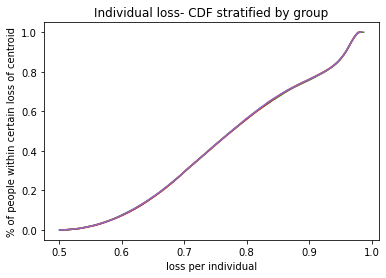

c  {0: (4.244790159857012, 3.6373070023221636), 1: (-9.049277694673338, -8.860023121809753), 2: (-10.340739406592148, 6.716793536910184), 3: (9.523264166036913, -3.0983015055967016), 4: (-1.7079998963702356, 8.30918460174765), 5: (-1.9969787351703865, 2.2641319590569533), 6: (2.0554553201255903, 9.078625334605707), 7: (4.868310392214496, -1.0603815661923701), 8: (-8.15379089530115, -7.4204717108275196), 9: (6.348705535317936, 7.784178017271987)}
weights:  [0.19999873 0.20001895 0.20004069 0.20003878 0.19990285]
Time elapsed Batch Step:  0.3362278938293457
Time elapsed Assignment Step:  2.305996894836426
0.0007333422725179783
total:  0.5476297982784168


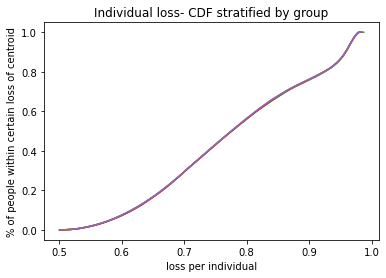

c  {0: (4.243932210336504, 3.6369493362657934), 1: (-9.048331723047086, -8.859161780496805), 2: (-10.339184401147213, 6.716624408503318), 3: (9.522683099943935, -3.0965851022379804), 4: (-1.7069418106616392, 8.30821381995754), 5: (-1.9959976580487702, 2.265255486280319), 6: (2.0541196951148364, 9.07735616188502), 7: (4.868574186809443, -1.0591275874939596), 8: (-8.154376902376704, -7.421555122492131), 9: (6.3471473008540755, 7.783516337851517)}
weights:  [0.19999875 0.20001896 0.2000408  0.20003883 0.19990265]
Time elapsed Batch Step:  0.35008835792541504
Time elapsed Assignment Step:  2.2806925773620605
0.0007215603170472873
total:  0.5475194715215593


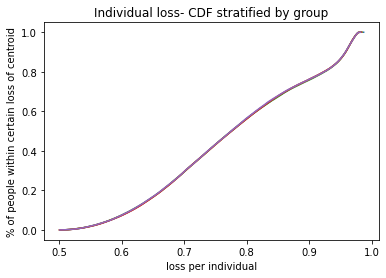

c  {0: (4.243074004536478, 3.6365916515718086), 1: (-9.047387465171033, -8.85830194959201), 2: (-10.337632108630732, 6.716455745170832), 3: (9.522102841009211, -3.0948710755874336), 4: (-1.7058852467545649, 8.307244440455447), 5: (-1.9950172892796156, 2.266378244242149), 6: (2.0527855281725604, 9.076088387038162), 7: (4.8688382075575865, -1.0578736603282735), 8: (-8.154961458125475, -7.422635957893577), 9: (6.345591183803968, 7.782855645896008)}
weights:  [0.19999877 0.20001898 0.20004091 0.20003889 0.19990246]
Time elapsed Batch Step:  0.3411576747894287
Time elapsed Assignment Step:  2.3110179901123047
0.0007545388913332562
total:  0.547422787830196


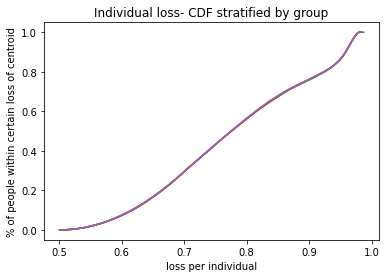

c  {0: (4.2422155424801895, 3.636233948287284), 1: (-9.046444922158637, -8.857443630591819), 2: (-10.33608253042812, 6.7162875469198), 3: (9.521523392271597, -3.0931594341260555), 4: (-1.7048302055771336, 8.306276464659328), 5: (-1.9940376303734377, 2.267500230687587), 6: (2.0514528252557778, 9.074822015802253), 7: (4.8691024545574155, -1.0566197855627513), 8: (-8.155544563157783, -7.423714217946184), 9: (6.344037187437662, 7.782195942343683)}
weights:  [0.19999879 0.200019   0.20004102 0.20003894 0.19990226]
Time elapsed Batch Step:  0.34005069732666016
Time elapsed Assignment Step:  2.297106981277466
0.0007580927185122377
total:  0.5473174921751007


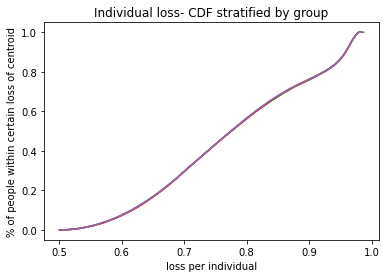

c  {0: (4.241356824191264, 3.6358762264593385), 1: (-9.045504095104762, -8.856586824978818), 2: (-10.334535667885804, 6.7161198137434095), 3: (9.520944756759217, -3.091450186296699), 4: (-1.703776688041179, 8.30530989397459), 5: (-1.9930586828335999, 2.2686214433728917), 6: (2.0501215923060663, 9.073557053902253), 7: (4.869366927905754, -1.0553659640650286), 8: (-8.156126218099699, -7.424789903589156), 9: (6.342485314969295, 7.781537228116675)}
weights:  [0.19999881 0.20001901 0.20004113 0.20003899 0.19990206]
Time elapsed Batch Step:  0.3621072769165039
Time elapsed Assignment Step:  2.291041851043701
0.0007461743029515411
total:  0.5472077699774246


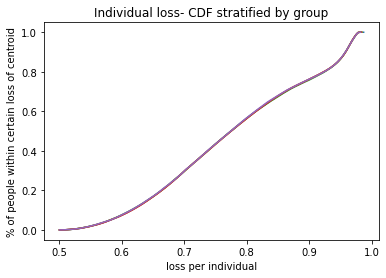

c  {0: (4.2404978496937, 3.635518486135136), 1: (-9.044564985085605, -8.855731534221654), 2: (-10.33299152231145, 6.715952545620993), 3: (9.520366937488316, -3.089743340500826), 4: (-1.7027246950422938, 8.304344729793996), 5: (-1.9920804481565444, 2.2697418800654585), 6: (2.048791835249093, 9.072293507050253), 7: (4.869631627697763, -1.054112196702963), 8: (-8.156706423593013, -7.4258630157865735), 9: (6.340935569557456, 7.780879504121363)}
weights:  [0.19999883 0.20001903 0.20004124 0.20003904 0.19990186]
Time elapsed Batch Step:  0.369553804397583
Time elapsed Assignment Step:  2.365527391433716
0.000736533338164147
total:  0.5470989458850373


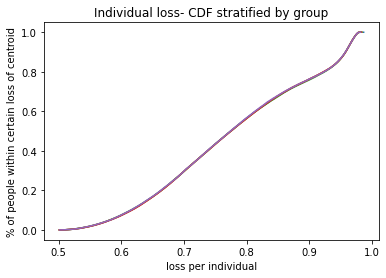

c  {0: (4.239638619011865, 3.635160727361885), 1: (-9.04362759315861, -8.854877759774968), 2: (-10.33145009497416, 6.7157857425180385), 3: (9.519789937461958, -3.0880389050951025), 4: (-1.701674227459881, 8.303380973497585), 5: (-1.9911029278320258, 2.270861538543819), 6: (2.047463559994127, 9.071031380944737), 7: (4.869896554026944, -1.052858484344658), 8: (-8.157285180295188, -7.426933555527387), 9: (6.339387954305545, 7.780222771248693)}
weights:  [0.19999884 0.20001905 0.20004136 0.20003909 0.19990167]
Time elapsed Batch Step:  0.3434114456176758
Time elapsed Assignment Step:  2.3324053287506104
0.0007518120157070651
total:  0.5469978135766876


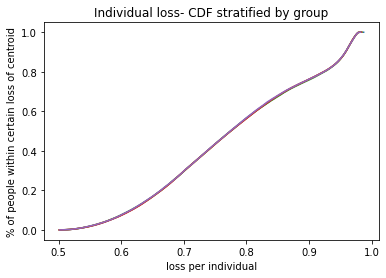

c  {0: (4.238779132170503, 3.634802950186839), 1: (-9.042691920362396, -8.854025503079324), 2: (-10.329911387104637, 6.7156194043861825), 3: (9.51921375966858, -3.0863368883878395), 4: (-1.7006252861572082, 8.302418626452583), 5: (-1.9901261233433472, 2.2719804165976254), 6: (2.0461367724335378, 9.06977068126983), 7: (4.870161706985143, -1.0516048278584877), 8: (-8.157862488879326, -7.428001523825406), 9: (6.33784247226213, 7.779567030374491)}
weights:  [0.19999886 0.20001906 0.20004147 0.20003914 0.19990147]
Time elapsed Batch Step:  0.3576483726501465
Time elapsed Assignment Step:  2.3285298347473145
0.000789737344364716
total:  0.5469036912633698


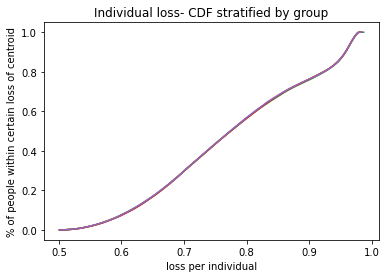

c  {0: (4.23791938919473, 3.6344451546572967), 1: (-9.041757967716691, -8.85317476556114), 2: (-10.32837539989533, 6.715453531163204), 3: (9.518638407080354, -3.0846372986352972), 4: (-1.6995778719814665, 8.30145769001332), 5: (-1.9891500361675976, 2.2730985120276204), 6: (2.044811478442277, 9.068511413694507), 7: (4.8704270866625565, -1.050351228113121), 8: (-8.158438350034121, -7.429066921719297), 9: (6.336299126421309, 7.778912282359776)}
weights:  [0.19999888 0.20001907 0.20004158 0.20003919 0.19990128]
Time elapsed Batch Step:  0.33170151710510254
Time elapsed Assignment Step:  2.392058849334717
0.0008585910411632591
total:  0.5468190631846448


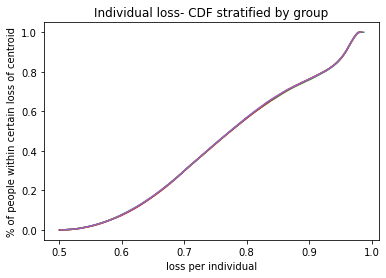

c  {0: (4.23705939011004, 3.6340873408206007), 1: (-9.040825736222256, -8.852325548632628), 2: (-10.326842134500538, 6.715288122772993), 3: (9.518063882651381, -3.0829401440378574), 4: (-1.6985319857638335, 8.300498165521152), 5: (-1.98817466777589, 2.274215822645592), 6: (2.0434876838773457, 9.067253583871787), 7: (4.870692693147736, -1.0490976859775452), 8: (-8.159012764463826, -7.430129750272565), 9: (6.334757919723066, 7.7782585280510625)}
weights:  [0.19999889 0.20001909 0.20004169 0.20003924 0.19990108]
Time elapsed Batch Step:  0.35507988929748535
Time elapsed Assignment Step:  2.311115026473999
0.0008556483298353124
total:  0.5467131125486571


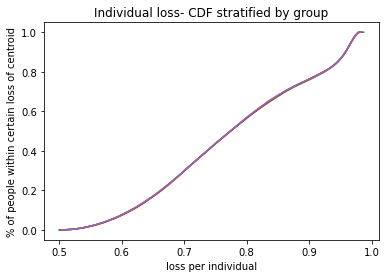

c  {0: (4.2361991349423, 3.63372950872414), 1: (-9.039895226860812, -8.851477853691716), 2: (-10.325311592036494, 6.715123179125514), 3: (9.517490189315664, -3.081245432736086), 4: (-1.697487628319539, 8.299540054304384), 5: (-1.9872000196335977, 2.2753323462743125), 6: (2.0421653945772404, 9.065997197437895), 7: (4.87095852652759, -1.0478442023210888), 8: (-8.159585732888209, -7.431190010573547), 9: (6.3332188550536275, 7.777605768280663)}
weights:  [0.19999891 0.2000191  0.2000418  0.20003929 0.19990089]
Time elapsed Batch Step:  0.3525271415710449
Time elapsed Assignment Step:  2.295804023742676
0.0008320330820813515
total:  0.5466011776850237


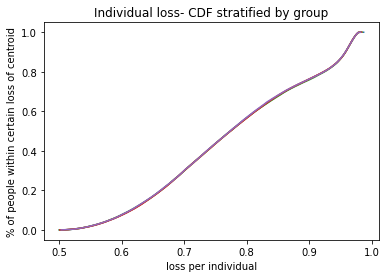

c  {0: (4.235338623717756, 3.633371658415348), 1: (-9.038966440594978, -8.850631682121993), 2: (-10.32378377358142, 6.7149587001167585), 3: (9.516917329984883, -3.079553172806707), 4: (-1.696444800447936, 8.298583357678195), 5: (-1.9862260932005904, 2.2764480807474663), 6: (2.0408446163613827, 9.064742260011407), 7: (4.8712245868873945, -1.0465907780134454), 8: (-8.160157256042504, -7.432247703735397), 9: (6.331681935245818, 7.776954003866986)}
weights:  [0.19999893 0.20001912 0.20004192 0.20003934 0.19990069]
Time elapsed Batch Step:  0.3424196243286133
Time elapsed Assignment Step:  2.301070213317871
0.0008454852088509712
total:  0.5465005811268625


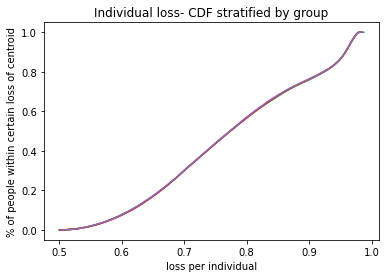

c  {0: (4.234477856463031, 3.6330137899417028), 1: (-9.038039378368197, -8.849787035292639), 2: (-10.322258680175546, 6.714794685628687), 3: (9.516345307545956, -3.07786337225851), 4: (-1.6954035029325734, 8.297628076944573), 5: (-1.9852528899314668, 2.277563023909562), 6: (2.0395253550295247, 9.063488777192362), 7: (4.871490874310792, -1.0453374139246954), 8: (-8.160727334677382, -7.43330283089607), 9: (6.3301471630794195, 7.776303235614831)}
weights:  [0.19999895 0.20001913 0.20004203 0.2000394  0.1999005 ]
Time elapsed Batch Step:  0.3480374813079834
Time elapsed Assignment Step:  2.2712392807006836
0.0008464472605534956
total:  0.5463964554901207


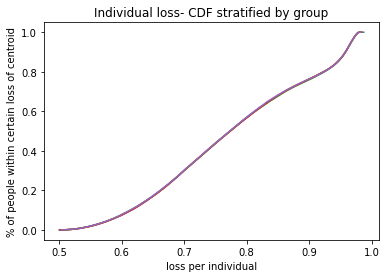

c  {0: (4.233616833205128, 3.6326559033507286), 1: (-9.03711404110468, -8.848943914558365), 2: (-10.320736312821106, 6.714631135529163), 3: (9.515774124858368, -3.076176039028229), 4: (-1.694363736541273, 8.296674213392235), 5: (-1.9842804112757835, 2.2786771736158347), 6: (2.0382076163611345, 9.062236754561352), 7: (4.871757388879803, -1.044084110925329), 8: (-8.161295969558894, -7.434355393218305), 9: (6.3286145412815245, 7.775653464315691)}
weights:  [0.19999896 0.20001914 0.20004215 0.20003945 0.1999003 ]
Time elapsed Batch Step:  0.34819602966308594
Time elapsed Assignment Step:  2.2757794857025146
0.0008106096709311617
total:  0.5462815084511227


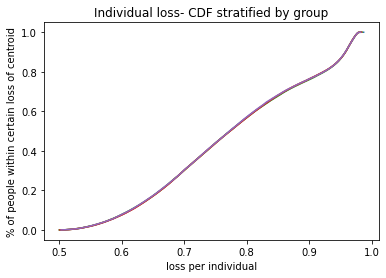

c  {0: (4.232755553971427, 3.632297998689995), 1: (-9.036190429709333, -8.848102321259345), 2: (-10.319216672482309, 6.714468049671882), 3: (9.515203784751295, -3.0744911809764166), 4: (-1.6933255020262106, 8.295721768296573), 5: (-1.9833086586782815, 2.2797905277321355), 6: (2.0368914061147576, 9.060986197678595), 7: (4.872024130674825, -1.0428308698862674), 8: (-8.161863161468439, -7.435405391889613), 9: (6.327084072526897, 7.775004690748046)}
weights:  [0.19999898 0.20001915 0.20004226 0.2000395  0.19990011]
Time elapsed Batch Step:  0.34630465507507324
Time elapsed Assignment Step:  2.3040966987609863
0.000810357764188252
total:  0.5461774543383086


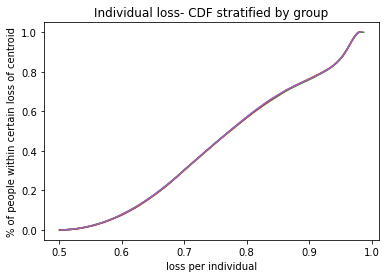

c  {0: (4.231894018789692, 3.631940076007116), 1: (-9.035268545067703, -8.84726225672116), 2: (-10.31769976008527, 6.714305427896291), 3: (9.51463429002052, -3.0728088058833585), 4: (-1.6922888001239988, 8.29477074291959), 5: (-1.9823376335791059, 2.2809030841348132), 6: (2.03557673002735, 9.059737112082965), 7: (4.872291099774647, -1.0415776916788848), 8: (-8.16242891120271, -7.436452828122248), 9: (6.32555575943833, 7.7743569156776635)}
weights:  [0.199999   0.20001916 0.20004238 0.20003955 0.19989991]
Time elapsed Batch Step:  0.3822150230407715
Time elapsed Assignment Step:  2.319807291030884
0.0008547974010957304
total:  0.5460870258596825


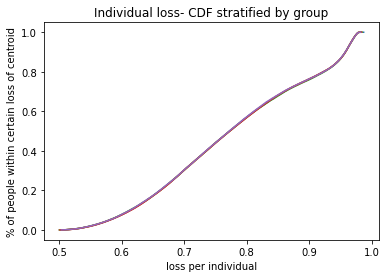

c  {0: (4.231032227688066, 3.6315821353497513), 1: (-9.034348388045911, -8.846423722254736), 2: (-10.316185576517928, 6.714143270027509), 3: (9.514065643425157, -3.0711289214450583), 4: (-1.691253631555774, 8.293821138509838), 5: (-1.9813673374140208, 2.2820148407105827), 6: (2.0342635938135873, 9.058489503291025), 7: (4.872558296256447, -1.0403245771750291), 8: (-8.162993219573657, -7.437497703153196), 9: (6.324029604587011, 7.773710139857895)}
weights:  [0.19999902 0.20001917 0.20004249 0.2000396  0.19989972]
Time elapsed Batch Step:  0.33458757400512695
Time elapsed Assignment Step:  2.2893381118774414
0.0008262198096007367
total:  0.5459749110370621


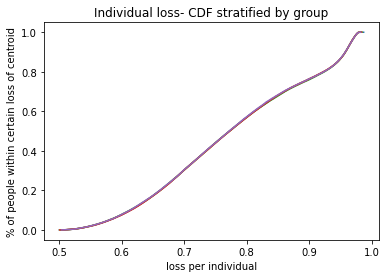

c  {0: (4.230170180695075, 3.6312241767656066), 1: (-9.033429959490597, -8.845586719156278), 2: (-10.314674122629919, 6.71398157587624), 3: (9.513497847684196, -3.06945153526934), 4: (-1.690219997027285, 8.292872956302368), 5: (-1.9803977716146193, 2.283125795356389), 6: (2.0329520031651414, 9.057243376796016), 7: (4.872825720195801, -1.0390715272470432), 8: (-8.163556087408438, -7.438540018244145), 9: (6.322505610492889, 7.773064364029985)}
weights:  [0.19999903 0.20001918 0.20004261 0.20003965 0.19989952]
Time elapsed Batch Step:  0.34581470489501953
Time elapsed Assignment Step:  2.283653974533081
0.0008845663342482712
total:  0.5458890923520345


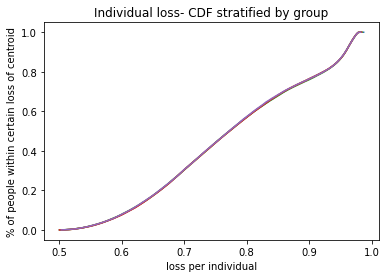

c  {0: (4.22930787783963, 3.6308662003024326), 1: (-9.032513260228862, -8.84475124870722), 2: (-10.313165399232439, 6.713820345238687), 3: (9.512930905472924, -3.067776654872095), 4: (-1.689187897228986, 8.291926197518674), 5: (-1.979428937608525, 2.28423594597926), 6: (2.0316419637499283, 9.055998738066839), 7: (4.873093371666695, -1.037818542767785), 8: (-8.164117515549371, -7.439579774681466), 9: (6.320983779625043, 7.772419588923368)}
weights:  [0.19999905 0.20001919 0.20004273 0.2000397  0.19989932]
Time elapsed Batch Step:  0.3490877151489258
Time elapsed Assignment Step:  2.3547983169555664
0.0008923725672981275
total:  0.5457883300596839


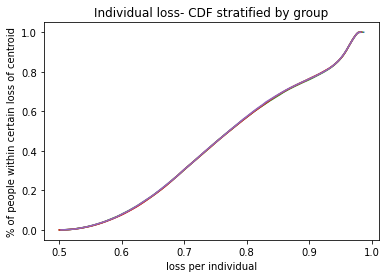

c  {0: (4.228445319151023, 3.6305082060080256), 1: (-9.03159829106821, -8.843917312174163), 2: (-10.311659407098064, 6.71365957789647), 3: (9.512364819419236, -3.066104287673719), 4: (-1.6881573328361306, 8.290980863366647), 5: (-1.9784608368195882, 2.2853452904961573), 6: (2.030333481211323, 9.054755592547012), 7: (4.87336125074152, -1.0365656246106478), 8: (-8.164677504853891, -7.440616973776185), 9: (6.319464114402062, 7.7717758152559835)}
weights:  [0.19999907 0.2000192  0.20004284 0.20003976 0.19989913]
Time elapsed Batch Step:  0.3427278995513916
Time elapsed Assignment Step:  2.3379740715026855
0.000859873798879307
total:  0.5456756397383485


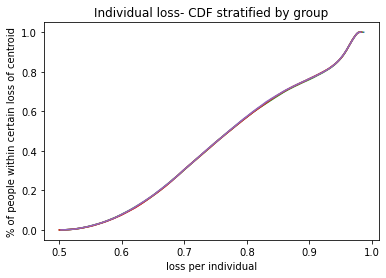

c  {0: (4.22756564632499, 3.630161981093774), 1: (-9.030685052796496, -8.843084910808816), 2: (-10.310156146960555, 6.713499273616543), 3: (9.511799592099885, -3.064434440995754), 4: (-1.6871283045088694, 8.29003695504053), 5: (-1.9774934706680738, 2.2864538268338155), 6: (2.0290265611673384, 9.05351394565362), 7: (4.87362987872109, -1.035309706300208), 8: (-8.165236056194503, -7.44165161686396), 9: (6.317946617192431, 7.77113304373458)}
weights:  [0.19999909 0.20001921 0.20004296 0.20003981 0.19989893]
Time elapsed Batch Step:  0.3451690673828125
Time elapsed Assignment Step:  2.3490781784057617
0.0008387009583109561
total:  0.5455665665773384


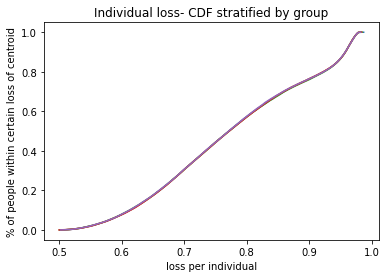

c  {0: (4.2266857053224705, 3.6298157333460477), 1: (-9.029773546181875, -8.842254045847941), 2: (-10.308655619514628, 6.713339432151116), 3: (9.511235226036717, -3.0627671220577755), 4: (-1.6861008128923496, 8.28909447372088), 5: (-1.9765268405708423, 2.287561552928582), 6: (2.02772120920977, 9.052273802776236), 7: (4.873898734869098, -1.0340538476589354), 8: (-8.16579317045873, -7.442683705305047), 9: (6.316431290314919, 7.770491275055033)}
weights:  [0.19999911 0.20001922 0.20004308 0.20003986 0.19989873]
Time elapsed Batch Step:  0.346759557723999
Time elapsed Assignment Step:  2.3585875034332275
0.000825408956543372
total:  0.5454600771245668


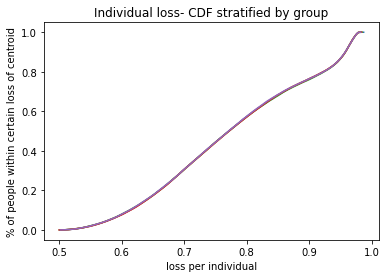

c  {0: (4.225805496175275, 3.629469462807373), 1: (-9.028863771972746, -8.841424718513299), 2: (-10.30715782541571, 6.713180053237585), 3: (9.51067172369295, -3.0611023379745217), 4: (-1.6850748586168158, 8.28815342057452), 5: (-1.975560947941522, 2.2886684667262505), 6: (2.026417430903302, 9.051035169275849), 7: (4.874167819254229, -1.0327980495591498), 8: (-8.16634884854907, -7.443713240484277), 9: (6.314918136038987, 7.769850509902653)}
weights:  [0.19999913 0.20001923 0.2000432  0.20003991 0.19989853]
Time elapsed Batch Step:  0.35956382751464844
Time elapsed Assignment Step:  2.323514699935913
0.0007846056702357496
total:  0.5453455536421684


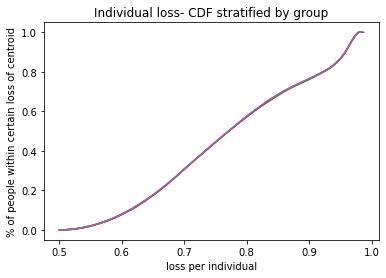

c  {0: (4.224925018915641, 3.629123169520331), 1: (-9.027955730897705, -8.840596930011593), 2: (-10.305662765279656, 6.713021136598473), 3: (9.510109087469525, -3.0594400957532857), 4: (-1.684050442297714, 8.287213796754518), 5: (-1.9745957941906744, 2.2897745661818902), 6: (2.0251152317845724, 9.049798050483771), 7: (4.874437131943607, -1.0315423128738141), 8: (-8.166903091382945, -7.444740223811019), 9: (6.31340715658519, 7.769210748952512)}
weights:  [0.19999914 0.20001924 0.20004332 0.20003996 0.19989834]
Time elapsed Batch Step:  0.3479118347167969
Time elapsed Assignment Step:  2.2784478664398193
0.0007162764890991102
total:  0.5452229917458936


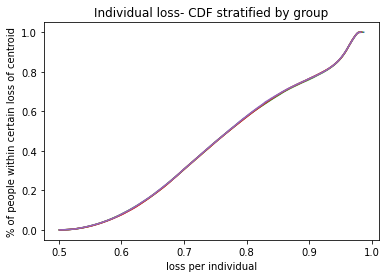

c  {0: (4.224044273576227, 3.6287768535275573), 1: (-9.0270494236655, -8.839770681534414), 2: (-10.304170439682462, 6.7128626819413775), 3: (9.509547319701612, -3.0577804022915553), 4: (-1.6830275645357968, 8.286275603400146), 5: (-1.9736313807259507, 2.2908798492596767), 6: (2.0238146173612024, 9.048562451700544), 7: (4.874706673002798, -1.0302866384765537), 8: (-8.16745589989265, -7.445764656719153), 9: (6.311898354125604, 7.768571992869752)}
weights:  [0.19999916 0.20001925 0.20004344 0.20004001 0.19989814]
Time elapsed Batch Step:  0.3468620777130127
Time elapsed Assignment Step:  2.3764312267303467
0.0007072282712077271
total:  0.5451184338328867


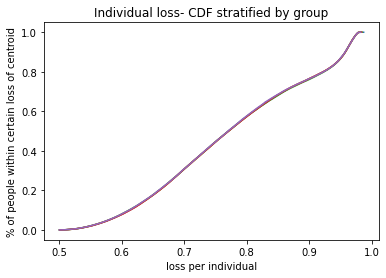

c  {0: (4.223163260190116, 3.6284305148717424), 1: (-9.02614485096498, -8.838945974258191), 2: (-10.302680849159936, 6.712704688958936), 3: (9.508986422655276, -3.0561232643748943), 4: (-1.68200622591723, 8.285338841636856), 5: (-1.9726677089522398, 2.291984313932718), 6: (2.022515593110779, 9.047328378194855), 7: (4.874976442495822, -1.0290310272416736), 8: (-8.168007275025305, -7.446786540667033), 9: (6.310391730784255, 7.767934242309911)}
weights:  [0.19999918 0.20001926 0.20004356 0.20004007 0.19989794]
Time elapsed Batch Step:  0.35845208168029785
Time elapsed Assignment Step:  2.347486972808838
0.0006727668160282363
total:  0.5450065063222526


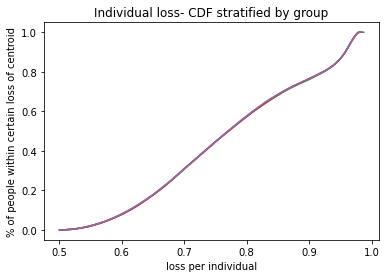

c  {0: (4.222280089460723, 3.6280775760262105), 1: (-9.025242013465054, -8.838122809344139), 2: (-10.301193994207365, 6.712547157328804), 3: (9.508426398524373, -3.054468688675036), 4: (-1.6809864270137012, 8.284403512576256), 5: (-1.971707635841667, 2.2930843769045763), 6: (2.021218164479799, 9.046095835202445), 7: (4.875246440485157, -1.027775480044177), 8: (-8.168557217742803, -7.4478058771374505), 9: (6.308887288637567, 7.767297497919239)}
weights:  [0.19999919 0.20001926 0.20004368 0.20004012 0.19989775]
Time elapsed Batch Step:  0.37015318870544434
Time elapsed Assignment Step:  2.329972982406616
0.0007300585909432167
total:  0.5449223246240734


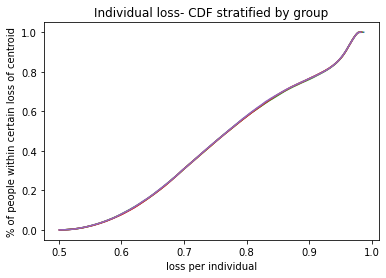

c  {0: (4.221396650012504, 3.627724611971251), 1: (-9.024340911814642, -8.8373011879382), 2: (-10.29970987527916, 6.712390086713655), 3: (9.507867249427683, -3.0528166817481557), 4: (-1.6799681683825298, 8.283469617316094), 5: (-1.9707482969206698, 2.2941836289656017), 6: (2.0199223368825687, 9.044864827925036), 7: (4.875516667031747, -1.026519997759782), 8: (-8.169105729021762, -7.4488226676376), 9: (6.307385029714808, 7.76666176033502)}
weights:  [0.19999921 0.20001927 0.2000438  0.20004017 0.19989755]
Time elapsed Batch Step:  0.3410162925720215
Time elapsed Assignment Step:  2.352644205093384
0.0007184243673264978
total:  0.5448176293841955


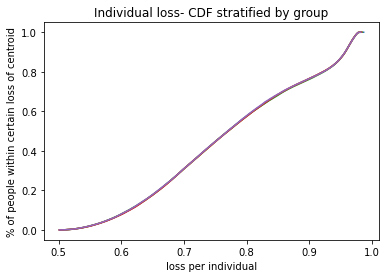

c  {0: (4.22049425503569, 3.627381722827246), 1: (-9.02344154664264, -8.836481111171004), 2: (-10.29822849278848, 6.712233476761197), 3: (9.507308977406321, -3.051167250033281), 4: (-1.6789514505667769, 8.282537156940231), 5: (-1.9697896935734058, 2.29528206813551), 6: (2.0186281157000634, 9.043635361529264), 7: (4.875788827890409, -1.0252626686470807), 8: (-8.169652809853469, -7.44983691369904), 9: (6.305884955998572, 7.766027030185884)}
weights:  [0.19999923 0.20001928 0.20004392 0.20004022 0.19989736]
Time elapsed Batch Step:  0.3909754753112793
Time elapsed Assignment Step:  2.3536536693573
0.0007459045328740421
total:  0.5447248878003162


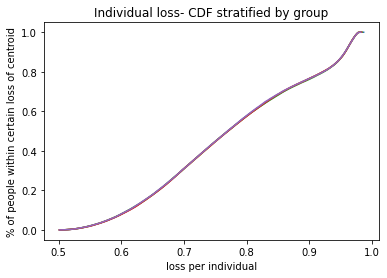

c  {0: (4.219591579840006, 3.627038801904299), 1: (-9.022543918557881, -8.835662580157814), 2: (-10.29674984710685, 6.712077327104213), 3: (9.506751584421417, -3.0495203998507874), 4: (-1.6779362740953572, 8.28160613251864), 5: (-1.968831827181862, 2.296379692442071), 6: (2.0173355062787404, 9.042407441145645), 7: (4.876061218770513, -1.0240053980950734), 8: (-8.170198461243832, -7.450848616877655), 9: (6.304387069425245, 7.765393308092129)}
weights:  [0.19999925 0.20001928 0.20004404 0.20004027 0.19989716]
Time elapsed Batch Step:  0.347973108291626
Time elapsed Assignment Step:  2.310173749923706
0.0007781472147392332
total:  0.5446337946544898


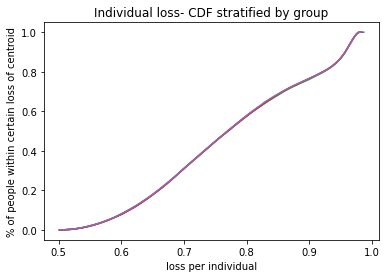

c  {0: (4.218688624466935, 3.626695849240402), 1: (-9.021648028149086, -8.834845595998475), 2: (-10.295273938563763, 6.711921637360628), 3: (9.506195072352071, -3.047876137400915), 4: (-1.676922639483152, 8.280676545107383), 5: (-1.9678746991259608, 2.2974764999209425), 6: (2.0160445139293155, 9.041181071867566), 7: (4.87633383973038, -1.022748186976363), 8: (-8.170742684213321, -7.45185777875361), 9: (6.302891371885511, 7.764760594666028)}
weights:  [0.19999926 0.20001929 0.20004416 0.20004033 0.19989696]
Time elapsed Batch Step:  0.3435511589050293
Time elapsed Assignment Step:  2.3127334117889404
0.0008138007563160965
total:  0.5445439444235147


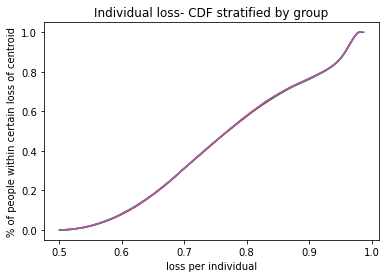

c  {0: (4.21778538895844, 3.6263528648736094), 1: (-9.020753875984838, -8.834030159777372), 2: (-10.29380076744628, 6.7117664071336005), 3: (9.505639442993584, -3.0462344687622527), 4: (-1.675910547231122, 8.279748395748616), 5: (-1.9669183107836585, 2.298572488615505), 6: (2.014755143925499, 9.039956258750296), 7: (4.876606690826828, -1.021491036164363), 8: (-8.171285479796925, -7.452864400931313), 9: (6.301397865224849, 7.764128890512139)}
weights:  [0.19999928 0.2000193  0.20004428 0.20004038 0.19989677]
Time elapsed Batch Step:  0.34241557121276855
Time elapsed Assignment Step:  2.419736862182617
0.0008974300933234369
total:  0.5444687071138292


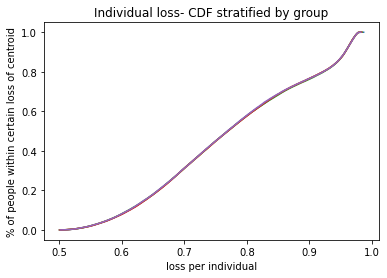

c  {0: (4.216881873356957, 3.626009848842044), 1: (-9.019861462613543, -8.833216272563376), 2: (-10.29233033399862, 6.711611636011647), 3: (9.505084698055942, -3.044595399890104), 4: (-1.6748999978264203, 8.278821685470577), 5: (-1.9659626635310357, 2.299667656576704), 6: (2.013467401502692, 9.038733006810052), 7: (4.87687977211518, -1.020233946533313), 8: (-8.171826849044088, -7.453868485039367), 9: (6.2999065512440575, 7.763498196227606)}
weights:  [0.19999929 0.2000193  0.20004441 0.20004043 0.19989657]
Time elapsed Batch Step:  0.35047245025634766
Time elapsed Assignment Step:  2.3551647663116455
0.0008771506581605193
total:  0.5443625181306581


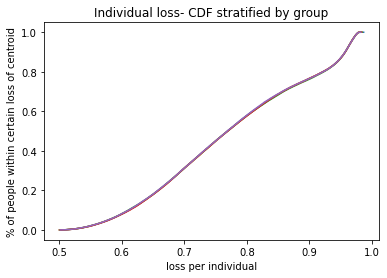

c  {0: (4.215978077705406, 3.6256668011838933), 1: (-9.018970788563392, -8.832403935409806), 2: (-10.290862638421753, 6.711457323568793), 3: (9.50453083916255, -3.042958936614669), 4: (-1.673890991742507, 8.277896415287591), 5: (-1.96500775874238, 2.300762001862891), 6: (2.0121812918566504, 9.037511321023104), 7: (4.877153083649272, -1.0189769189582947), 8: (-8.172366793018659, -7.454870032730527), 9: (6.298417431699785, 7.762868512402457)}
weights:  [0.19999931 0.20001931 0.20004453 0.20004048 0.19989637]
Time elapsed Batch Step:  0.3367898464202881
Time elapsed Assignment Step:  2.2840685844421387
0.0008406559389904089
total:  0.544251638821342


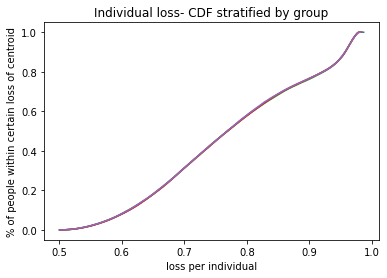

c  {0: (4.215054319990765, 3.625330246865097), 1: (-9.018081854342338, -8.831593149354378), 2: (-10.289397680872996, 6.71130346936476), 3: (9.503977867849192, -3.041325084638964), 4: (-1.672883529439263, 8.27697258620007), 5: (-1.9640535977902638, 2.3018555225396713), 6: (2.0108968201421185, 9.036291206324936), 7: (4.87742939968324, -1.0177205093712283), 8: (-8.172905312798838, -7.455869045681654), 9: (6.29693050830507, 7.762239839619892)}
weights:  [0.19999933 0.20001931 0.20004465 0.20004054 0.19989617]
Time elapsed Batch Step:  0.3925607204437256
Time elapsed Assignment Step:  2.298391103744507
0.0008659976468402553
total:  0.5441595315456587


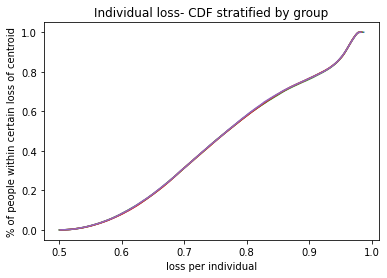

c  {0: (4.214130273201373, 3.6249936537467633), 1: (-9.017194660438054, -8.83078391541916), 2: (-10.287935461465615, 6.711150072945186), 3: (9.503425785563243, -3.0396938495363974), 4: (-1.671877611363103, 8.276050199194522), 5: (-1.9631001820456122, 2.302948216679755), 6: (2.0096139914714337, 9.035072667609459), 7: (4.877705947933099, -1.01646415673041), 8: (-8.173442409477117, -7.4568655255936624), 9: (6.2954457827298995, 7.761612178456565)}
weights:  [0.19999934 0.20001932 0.20004478 0.20004059 0.19989598]
Time elapsed Batch Step:  0.347719669342041
Time elapsed Assignment Step:  2.3253231048583984
0.0008545721239893167
total:  0.5440566143376191


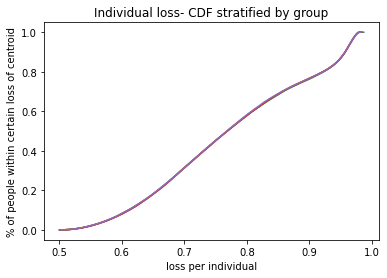

c  {0: (4.213205937388186, 3.6246570218669363), 1: (-9.016309207317915, -8.829976234610534), 2: (-10.286475980268438, 6.710997133841881), 3: (9.502874593663131, -3.0380652367479444), 4: (-1.670873237947091, 8.275129255243554), 5: (-1.9621475128777668, 2.304040082362811), 6: (2.008332810913111, 9.033855709728297), 7: (4.877982728450701, -1.0152078619042082), 8: (-8.173978084160227, -7.457859474191476), 9: (6.2939632566017725, 7.760985529482854)}
weights:  [0.19999936 0.20001932 0.2000449  0.20004064 0.19989578]
Time elapsed Batch Step:  0.3981316089630127
Time elapsed Assignment Step:  2.3373820781707764
0.0008626509466984622
total:  0.5439597694266861


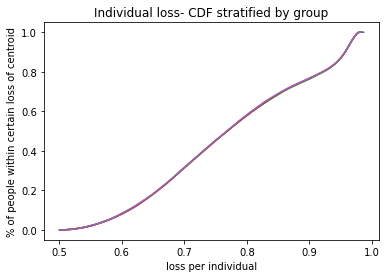

c  {0: (4.2122813126026815, 3.6243203512637403), 1: (-9.015425495428962, -8.829170107919149), 2: (-10.285019237305487, 6.710844651573118), 3: (9.502324293418132, -3.036439251578859), 4: (-1.6698704096110515, 8.274209755305893), 5: (-1.9611955916545414, 2.3051311176753297), 6: (2.0070532834904107, 9.03264033749013), 7: (4.87825974128645, -1.0139516257619117), 8: (-8.174512337969082, -7.458850893223975), 9: (6.2924829315062745, 7.760359893263127)}
weights:  [0.19999938 0.20001932 0.20004502 0.20004069 0.19989558]
Time elapsed Batch Step:  0.35770440101623535
Time elapsed Assignment Step:  2.452733278274536
0.000893669889987514
total:  0.5438700278286337


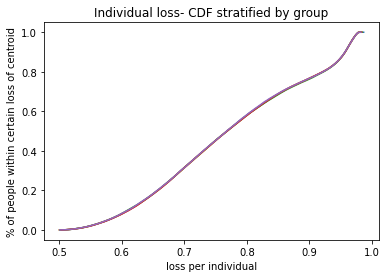

c  {0: (4.211356398896858, 3.62398364197538), 1: (-9.01454352519788, -8.828365536319877), 2: (-10.283565232555626, 6.710692625643965), 3: (9.501774886008532, -3.0348158991949106), 4: (-1.6688691267616846, 8.273291700326395), 5: (-1.9602444197422724, 2.306221320710487), 6: (2.005775414179895, 9.031426555660135), 7: (4.8785369864893084, -1.0126954491737437), 8: (-8.175045172038717, -7.459839784463939), 9: (6.291004808987665, 7.759735270355987)}
weights:  [0.19999939 0.20001933 0.20004515 0.20004074 0.19989539]
Time elapsed Batch Step:  0.382495641708374
Time elapsed Assignment Step:  2.4526658058166504
0.0008407851519816045
total:  0.5437553364156718


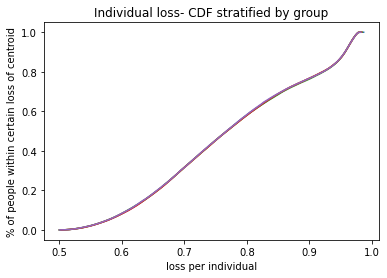

c  {0: (4.210431196323239, 3.62364689404014), 1: (-9.013663297030968, -8.82756252077178), 2: (-10.28211396595224, 6.710541055546649), 3: (9.501226372526304, -3.033195184618149), 4: (-1.6678693897926768, 8.272375091236063), 5: (-1.9592939985058626, 2.3073106895680144), 6: (2.004499207909983, 9.03021436895947), 7: (4.8788144641068065, -1.0114393330108753), 8: (-8.175576587518234, -7.4608261497080015), 9: (6.28952889054947, 7.759111661314519)}
weights:  [0.19999941 0.20001933 0.20004528 0.2000408  0.19989519]
Time elapsed Batch Step:  0.34887099266052246
Time elapsed Assignment Step:  2.328572988510132
0.0008839465874336261
total:  0.5436696807049138


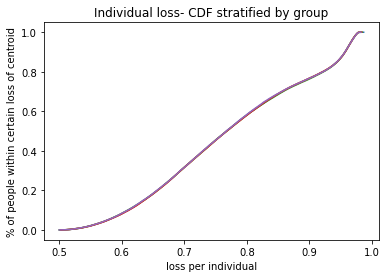

c  {0: (4.209505704934871, 3.6233101074963865), 1: (-9.012784811314127, -8.826761062218058), 2: (-10.28066543738294, 6.71038994076096), 3: (9.500678753976436, -3.0315771127222817), 4: (-1.666871199084813, 8.27145992895207), 5: (-1.95834432930882, 2.308399222354078), 6: (2.0032246695595077, 9.029003782064875), 7: (4.879092174185049, -1.0101832781454383), 8: (-8.17610658557075, -7.461809990776589), 9: (6.288055177655081, 7.758489066686509)}
weights:  [0.19999943 0.20001933 0.2000454  0.20004084 0.19989499]
Time elapsed Batch Step:  0.33791041374206543
Time elapsed Assignment Step:  2.3030340671539307
0.0008905328035426763
total:  0.5435732744349716


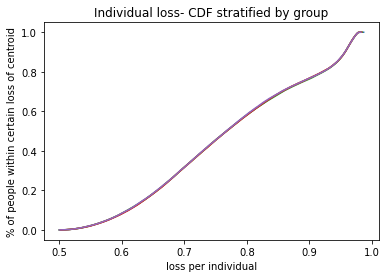

c  {0: (4.208579924785328, 3.6229732823825653), 1: (-9.011908068412827, -8.82596116158602), 2: (-10.2792196466893, 6.7102392807546885), 3: (9.500132031279046, -3.0299616882277958), 4: (-1.6658745550060872, 8.27054621437778), 5: (-1.957395413513291, 2.3094869171811574), 6: (2.0019518039562842, 9.027794799608333), 7: (4.87937011676872, -1.0089272854505387), 8: (-8.176635167373323, -7.462791309513866), 9: (6.286583671728363, 7.757867487014666)}
weights:  [0.19999944 0.20001934 0.20004553 0.20004089 0.1998948 ]
Time elapsed Batch Step:  0.37627339363098145
Time elapsed Assignment Step:  2.295194625854492
0.0008578060288102485
total:  0.5434652961391172


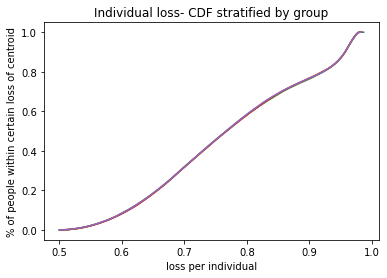

c  {0: (4.207653855928709, 3.6226364187372035), 1: (-9.011033068672095, -8.825162819787042), 2: (-10.277776593666648, 6.710089074984103), 3: (9.499586205272468, -3.028348915697044), 4: (-1.664879457911812, 8.269633948402781), 5: (-1.9564472524800864, 2.310573772167936), 6: (2.000680615875699, 9.026587426176828), 7: (4.879648291901096, -1.0076713558002686), 8: (-8.177162334116906, -7.463770107787677), 9: (6.285114374154268, 7.757246922836819)}
weights:  [0.19999946 0.20001934 0.20004566 0.20004094 0.1998946 ]
Time elapsed Batch Step:  0.3368387222290039
Time elapsed Assignment Step:  2.3320534229278564
0.0008229876002650016
total:  0.5433569118719971


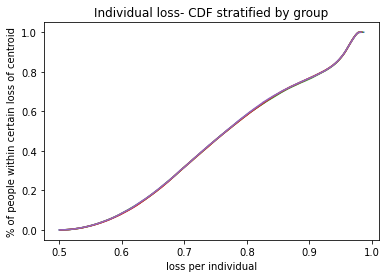

c  {0: (4.206727498419643, 3.62229951659891), 1: (-9.010159812416488, -8.824366037716526), 2: (-10.276336278063875, 6.709939322894456), 3: (9.499041276717426, -3.026738799529586), 4: (-1.663885908144727, 8.268723131902897), 5: (-1.955499847568706, 2.311659785439194), 6: (1.999411110039321, 9.025381666312175), 7: (4.87992669962405, -1.0064154900697189), 8: (-8.177688087006281, -7.4647463874894875), 9: (6.283647286279449, 7.756627374686102)}
weights:  [0.19999947 0.20001934 0.20004579 0.20004099 0.19989441]
Time elapsed Batch Step:  0.34810304641723633
Time elapsed Assignment Step:  2.3650364875793457
0.0007180428427604468
total:  0.5432277119375948


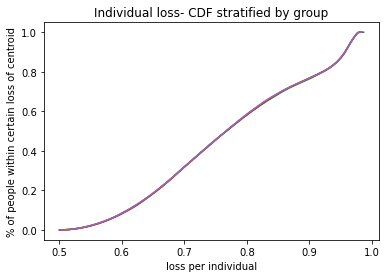

c  {0: (4.205800852313289, 3.6219625760063736), 1: (-9.009288299950082, -8.823570816253866), 2: (-10.274898699583323, 6.709790023920525), 3: (9.49849724630237, -3.0251313439581358), 4: (-1.6628939060351058, 8.267813765740238), 5: (-1.9545532001373547, 2.3127449551257073), 6: (1.9981432911135542, 9.024177524510947), 7: (4.880205339978059, -1.0051596891349912), 8: (-8.178212427260004, -7.465720150534324), 9: (6.2821824094128855, 7.75600884309113)}
weights:  [0.19999948 0.20001934 0.20004592 0.20004104 0.19989422]
Time elapsed Batch Step:  0.34075474739074707
Time elapsed Assignment Step:  2.350524663925171
0.0007303293596181426
total:  0.5431339031078872


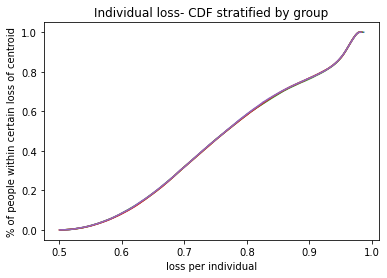

c  {0: (4.204873917665337, 3.621625596998366), 1: (-9.00841853155646, -8.822777156262413), 2: (-10.273463857880701, 6.70964117748718), 3: (9.497954114649962, -3.0235265530454902), 4: (-1.661903451900862, 8.266905850763216), 5: (-1.9536073115429562, 2.3138292793641555), 6: (1.9968771637083251, 9.022975005224467), 7: (4.880484213002215, -1.0039039538732097), 8: (-8.178735356110336, -7.466691398860711), 9: (6.280719744826498, 7.755391328576154)}
weights:  [0.1999995  0.20001935 0.20004605 0.20004108 0.19989403]
Time elapsed Batch Step:  0.3473203182220459
Time elapsed Assignment Step:  2.3249714374542236
0.0007422667802802208
total:  0.5430402112777265


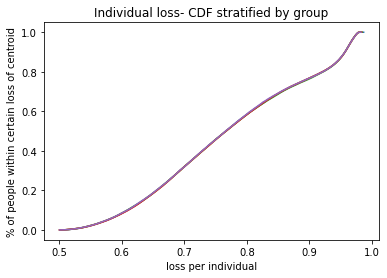

c  {0: (4.203946694532006, 3.6212885796137395), 1: (-9.007550507498685, -8.821985058589435), 2: (-10.272031752565068, 6.70949278300998), 3: (9.4974118823246, -3.0219244306828053), 4: (-1.660914546047653, 8.265999387806593), 5: (-1.9526621831411612, 2.314912756297033), 6: (1.995612732375825, 9.021774112858887), 7: (4.8807633187342265, -1.002648285162533), 8: (-8.17925687480319, -7.4676601344306075), 9: (6.279259293755776, 7.754774831661206)}
weights:  [0.19999951 0.20001935 0.20004618 0.20004113 0.19989383]
Time elapsed Batch Step:  0.3589897155761719
Time elapsed Assignment Step:  2.321648120880127
0.0007820755123328915
total:  0.5429551025888802


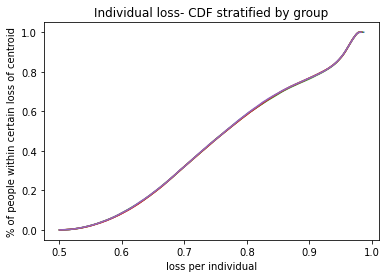

c  {0: (4.203019182970053, 3.6209515238914287), 1: (-9.006684228019301, -8.821194524066085), 2: (-10.270602383198876, 6.709344839895792), 3: (9.49687054984073, -3.0203249805895127), 4: (-1.6599271887689833, 8.26509437769151), 5: (-1.9517178162863522, 2.315995384072567), 6: (1.9943500016093056, 9.020574851775324), 7: (4.881042657210433, -1.001392683882164), 8: (-8.179776984598066, -7.4686263592293445), 9: (6.277801057400398, 7.7541593528622235)}
weights:  [0.19999953 0.20001935 0.20004631 0.20004118 0.19989364]
Time elapsed Batch Step:  0.34934258460998535
Time elapsed Assignment Step:  2.297302007675171
0.0007211622392897521
total:  0.542839998483439


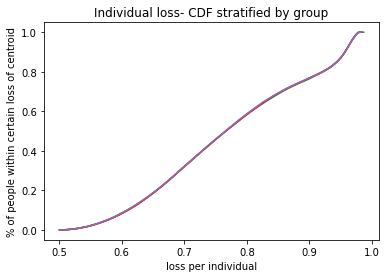

c  {0: (4.202091383036765, 3.62061442987045), 1: (-9.005819693340312, -8.820405553507369), 2: (-10.269175749298064, 6.709197347543426), 3: (9.496330117671668, -3.0187282063150636), 4: (-1.6589413803463038, 8.264190821225526), 5: (-1.9507742123316427, 2.3170771608446437), 6: (1.9930889758419381, 9.019377226290066), 7: (4.881322228465805, -1.000137150912363), 8: (-8.180295686767986, -7.4695900752655575), 9: (6.276345036924856, 7.753544892691162)}
weights:  [0.19999954 0.20001935 0.20004644 0.20004122 0.19989345]
Time elapsed Batch Step:  0.36303186416625977
Time elapsed Assignment Step:  2.2777514457702637
0.0007657269950266388
total:  0.5427567593492068


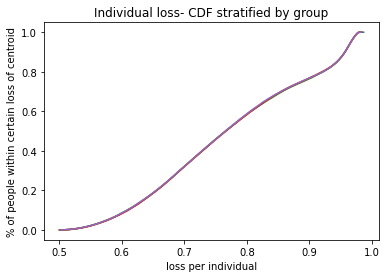

c  {0: (4.201163294789968, 3.6202772975899022), 1: (-9.004956903663178, -8.81961814771211), 2: (-10.267751850332237, 6.70905030534429), 3: (9.495790586258536, -3.0171341112425396), 4: (-1.6579571210491124, 8.263288719202666), 5: (-1.9498313726288745, 2.3181580847727377), 6: (1.9918296594457396, 9.01818124067483), 7: (4.881602032533962, -0.9988816871344565), 8: (-8.180812982599434, -7.470551284571118), 9: (6.2748912334590665, 7.752931451656092)}
weights:  [0.19999955 0.20001935 0.20004656 0.20004127 0.19989326]
Time elapsed Batch Step:  0.36737823486328125
Time elapsed Assignment Step:  2.295872926712036
0.0007736977102709153
total:  0.5426627647960718


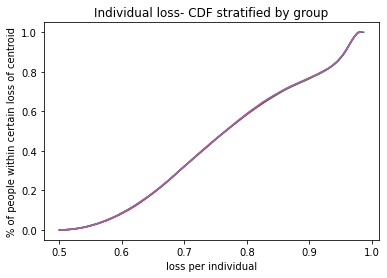

c  {0: (4.2002349182880225, 3.619940127088966), 1: (-9.004095859168801, -8.818832307462914), 2: (-10.266330685724885, 6.708903712683057), 3: (9.495251956018954, -3.01554269859403), 4: (-1.6569744111350502, 8.262388072403455), 5: (-1.9488892985286097, 2.3192381540218503), 6: (1.9905720567305736, 9.01698689915706), 7: (4.881882069447169, -0.9976262934308484), 8: (-8.181328873392296, -7.471509989201069), 9: (6.273439648098994, 7.752319030261285)}
weights:  [0.19999957 0.20001935 0.20004669 0.20004132 0.19989307]
Time elapsed Batch Step:  0.3422086238861084
Time elapsed Assignment Step:  2.346384286880493
0.0008259291360874776
total:  0.5425822710804706


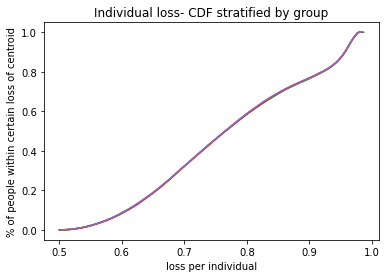

c  {0: (4.19930625358983, 3.619602918406905), 1: (-9.003236560017523, -8.818048033526148), 2: (-10.264912254853682, 6.708757568938332), 3: (9.494714227355148, -3.01395397143753), 4: (-1.6559932508499966, 8.261488881594968), 5: (-1.947947991380119, 2.3203173667624526), 6: (1.9893161719432253, 9.015794205920265), 7: (4.88216233923635, -0.9963709706850307), 8: (-8.18184336045979, -7.47246619123355), 9: (6.271990281907255, 7.751707629007272)}
weights:  [0.19999958 0.20001935 0.20004682 0.20004137 0.19989288]
Time elapsed Batch Step:  0.353191614151001
Time elapsed Assignment Step:  2.3256747722625732
0.0007654818501845462
total:  0.5424681949133732


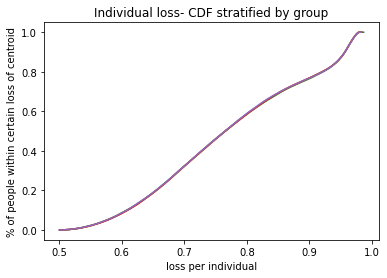

c  {0: (4.19837730075483, 3.619265671583065), 1: (-9.002379006349116, -8.817265326651897), 2: (-10.263496557050852, 6.70861187348333), 3: (9.494177400661199, -3.012367932695031), 4: (-1.6550136404281626, 8.26059114753087), 5: (-1.947007452531368, 2.321395721170434), 6: (1.9880620092665588, 9.01460316510438), 7: (4.882442841931096, -0.9951157197815927), 8: (-8.182356445128407, -7.47341989276973), 9: (6.270543135913726, 7.7510972483908995)}
weights:  [0.19999959 0.20001935 0.20004695 0.20004141 0.19989268]
Time elapsed Batch Step:  0.3414127826690674
Time elapsed Assignment Step:  2.2993340492248535
0.0007787386558187892
total:  0.542376452330768


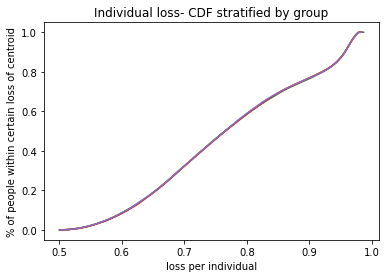

c  {0: (4.197448059843001, 3.6189283866568753), 1: (-9.001523198282783, -8.816484187573945), 2: (-10.262083591603599, 6.708466625686547), 3: (9.493641476329284, -3.0107845851514226), 4: (-1.6540355800921804, 8.25969487095147), 5: (-1.9460676833289992, 2.3224732154270593), 6: (1.986809572818756, 9.013413780806127), 7: (4.882723577559668, -0.9938605416062314), 8: (-8.18286812873784, -7.4743710959337335), 9: (6.26909821111614, 7.7504878889053685)}
weights:  [0.19999961 0.20001935 0.20004709 0.20004146 0.19989249]
Time elapsed Batch Step:  0.5715079307556152
Time elapsed Assignment Step:  3.9491851329803467
0.0008205483753741527
total:  0.5422934985050494


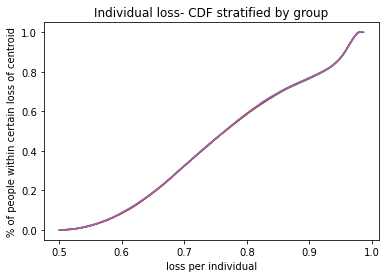

c  {0: (4.196518530914867, 3.6185910636678478), 1: (-9.000669135917146, -8.815704617009734), 2: (-10.260673357754595, 6.708321824912423), 3: (9.49310645475482, -3.0092039314638193), 4: (-1.6530590700531935, 8.25880005258376), 5: (-1.9451286851183094, 2.32354984771893), 6: (1.9855588666526398, 9.012226057079396), 7: (4.88300454614901, -0.9926054370457604), 8: (-8.183378412640927, -7.475319802872567), 9: (6.26765550848068, 7.749879551040254)}
weights:  [0.19999962 0.20001935 0.20004722 0.20004151 0.1998923 ]
Time elapsed Batch Step:  0.3508782386779785
Time elapsed Assignment Step:  2.3476057052612305
0.0008436255671631088
total:  0.5422051471376653


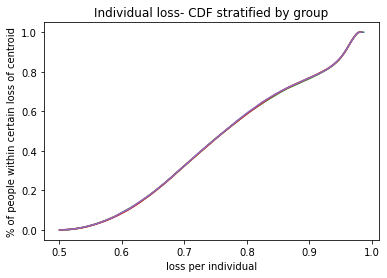

c  {0: (4.195588714031492, 3.6182537026555774), 1: (-8.999816819330253, -8.814926615660347), 2: (-10.25926585470254, 6.708177470522003), 3: (9.492572336340524, -3.0076259741709617), 4: (-1.6520841105109412, 8.257906693141475), 5: (-1.9441904592432273, 2.3246256162379506), 6: (1.9843098947550828, 9.011039997935598), 7: (4.883285747724753, -0.9913504069881198), 8: (-8.18388729820358, -7.476266015756045), 9: (6.266215028942556, 7.749272235281515)}
weights:  [0.19999964 0.20001935 0.20004735 0.20004156 0.19989211]
Time elapsed Batch Step:  0.3451817035675049
Time elapsed Assignment Step:  2.379751205444336
0.0008382938905491244
total:  0.5421084953615567


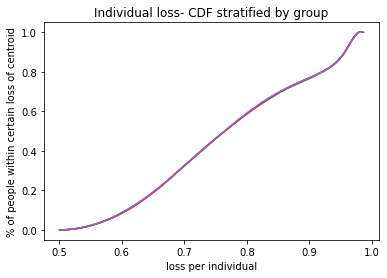

c  {0: (4.1946586092544855, 3.617916303659743), 1: (-8.99896624857957, -8.814150184210476), 2: (-10.257861081602782, 6.708033561873574), 3: (9.492039121499463, -3.006050715702407), 4: (-1.651110701653843, 8.257014793325133), 5: (-1.9432530070462848, 2.3257005191813045), 6: (1.9830626610465032, 9.009855607344004), 7: (4.883567182311223, -0.9900954523223848), 8: (-8.18439478680472, -7.477209736776713), 9: (6.264776773406583, 7.7486659421114865)}
weights:  [0.19999965 0.20001935 0.20004748 0.20004161 0.19989191]
Time elapsed Batch Step:  0.3493387699127197
Time elapsed Assignment Step:  2.356248378753662
0.0008274809615860246
total:  0.5420104214203124


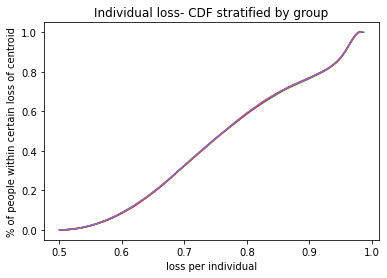

c  {0: (4.193728216646004, 3.6175788667201063), 1: (-8.998117423701993, -8.813375323328392), 2: (-10.256459037567978, 6.7078900983232845), 3: (9.491506810657196, -3.0044781583872817), 4: (-1.6501388436590803, 8.256124353822097), 5: (-1.9423163298685868, 2.3267745547514305), 6: (1.9818171693804456, 9.008672889232052), 7: (4.883848849931448, -0.9888405739387749), 8: (-8.184900879836212, -7.478150968149768), 9: (6.263340742747743, 7.748060672008869)}
weights:  [0.19999966 0.20001935 0.20004761 0.20004166 0.19989172]
Time elapsed Batch Step:  0.35671401023864746
Time elapsed Assignment Step:  2.2709767818450928
0.0008470333413014286
total:  0.5419216795227557


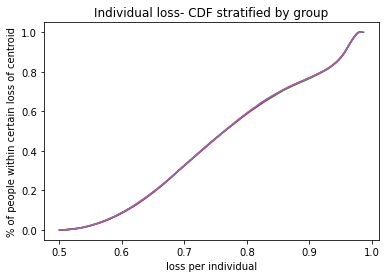

c  {0: (4.19279753626875, 3.617241391876514), 1: (-8.997270344713833, -8.812602033665925), 2: (-10.255059721668838, 6.707747079225747), 3: (9.490975404253161, -3.0029083044624496), 4: (-1.6491685366926738, 8.255235375306615), 5: (-1.9413804290497785, 2.3278477211560102), 6: (1.9805734235432504, 9.007491847485605), 7: (4.8841307506071665, -0.9875857727286621), 8: (-8.185405578702795, -7.479089712112984), 9: (6.261906937811739, 7.747456425448691)}
weights:  [0.19999968 0.20001934 0.20004774 0.20004171 0.19989153]
Time elapsed Batch Step:  0.357635498046875
Time elapsed Assignment Step:  2.3356270790100098
0.0008630414086682192
total:  0.5418320965416933


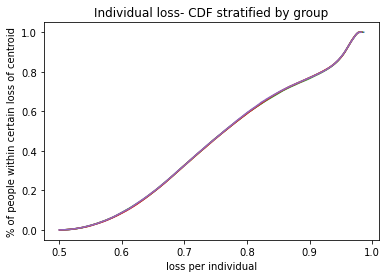

c  {0: (4.191866568185972, 3.6169038791688957), 1: (-8.996425011610835, -8.811830315858437), 2: (-10.253663132934888, 6.707604503934609), 3: (9.490444902741425, -3.001341156080002), 4: (-1.648199780909561, 8.254347858439885), 5: (-1.9404453059280087, 2.328920016607958), 6: (1.979331427253809, 9.006312485949161), 7: (4.884412884358833, -0.9863310495845798), 8: (-8.185908884822021, -7.480025970926629), 9: (6.260475359415537, 7.746853202902271)}
weights:  [0.19999969 0.20001934 0.20004787 0.20004176 0.19989134]
Time elapsed Batch Step:  0.3586423397064209
Time elapsed Assignment Step:  2.233920097351074
0.0009230119531172809
total:  0.5417559243763934


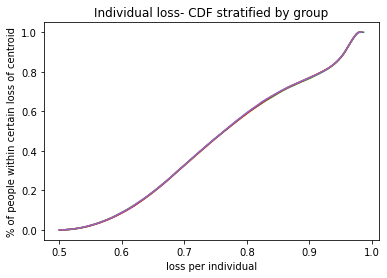

c  {0: (4.190935312461471, 3.616566328637265), 1: (-8.995581424368174, -8.811060170524794), 2: (-10.252269270355301, 6.707462371803096), 3: (9.489915306590927, -2.9997767153140296), 4: (-1.6472325764536688, 8.253461803870103), 5: (-1.9395109618398916, 2.329991439325416), 6: (1.9780911841634066, 9.005134808426), 7: (4.884695251205626, -0.985076405400231), 8: (-8.18641079962418, -7.4809597468733875), 9: (6.259046008347896, 7.74625100483716)}
weights:  [0.19999971 0.20001934 0.200048   0.20004181 0.19989115]
Time elapsed Batch Step:  0.3582015037536621
Time elapsed Assignment Step:  2.3272507190704346
0.000932752961614769
total:  0.5416649055535457


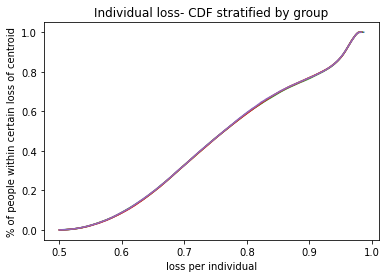

c  {0: (4.190003769159598, 3.616228740321721), 1: (-8.994739582940463, -8.810291598267346), 2: (-10.250878132879759, 6.707320682184529), 3: (9.489386616285339, -2.998214984166681), 4: (-1.6462669234579845, 8.252577212232513), 5: (-1.9385773981204646, 2.3310619875317573), 6: (1.9768526978556527, 9.00395881867827), 7: (4.884977851165457, -0.9838218410704956), 8: (-8.186911324552236, -7.481891042258274), 9: (6.25761888536989, 7.7456498317170785)}
weights:  [0.19999972 0.20001934 0.20004813 0.20004185 0.19989096]
Time elapsed Batch Step:  0.37166380882263184
Time elapsed Assignment Step:  2.2586729526519775
0.0009408011304868902
total:  0.5415735420591713


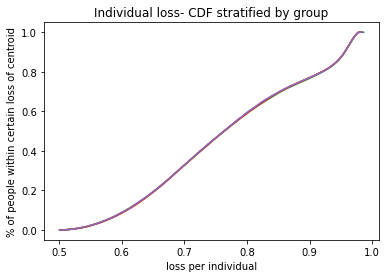

c  {0: (4.1890516050009055, 3.615900132408088), 1: (-8.993899487261759, -8.809524599671905), 2: (-10.249489719419353, 6.707179434432797), 3: (9.488858832322634, -2.9966559645735242), 4: (-1.645302822044624, 8.251694084149468), 5: (-1.937644616103145, 2.332131659455591), 6: (1.9756159718464998, 9.002784520426998), 7: (4.885262825400245, -0.9825662112764036), 8: (-8.187410461061756, -7.482819859408553), 9: (6.256193991215412, 7.745049684001841)}
weights:  [0.19999973 0.20001933 0.20004826 0.2000419  0.19989077]
Time elapsed Batch Step:  0.3375256061553955
Time elapsed Assignment Step:  2.3172638416290283
0.0009417077921827222
total:  0.541480258247837


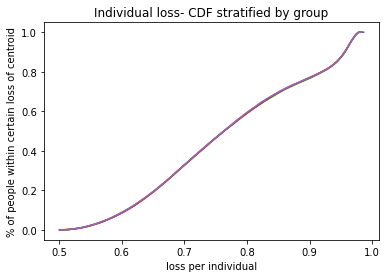

c  {0: (4.188099142471193, 3.6155714786472912), 1: (-8.993061137245572, -8.808759175307719), 2: (-10.24810402884751, 6.70703862790281), 3: (9.488331955214434, -2.99509965840826), 4: (-1.644340272324897, 8.250812420230485), 5: (-1.9367126171196825, 2.3332004533307753), 6: (1.974381009584353, 9.00161191735202), 7: (4.885548034420509, -0.9813106553346929), 8: (-8.187908210620844, -7.483746200673652), 9: (6.2547713265916665, 7.74445056214727)}
weights:  [0.19999975 0.20001933 0.20004839 0.20004195 0.19989058]
Time elapsed Batch Step:  0.3715689182281494
Time elapsed Assignment Step:  2.3316526412963867
0.0009320267634077561
total:  0.5413840197947444


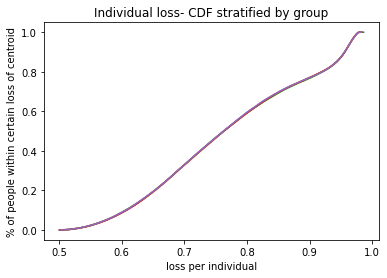

c  {0: (4.187146381644021, 3.6152427790777844), 1: (-8.992224532784872, -8.807995325727454), 2: (-10.246721060000954, 6.706898261950898), 3: (9.487805985485208, -2.993546067486837), 4: (-1.6433792743993694, 8.249932221072294), 5: (-1.9357814025001097, 2.334268367396434), 6: (1.9731478144502683, 9.000441013091852), 7: (4.885833478242777, -0.9800551741373523), 8: (-8.188404574710068, -7.484670068425077), 9: (6.253350892179657, 7.743852466605102)}
weights:  [0.19999976 0.20001933 0.20004852 0.200042   0.1998904 ]
Time elapsed Batch Step:  0.3378407955169678
Time elapsed Assignment Step:  2.3013052940368652
0.0008972498926245187
total:  0.5412804740119124


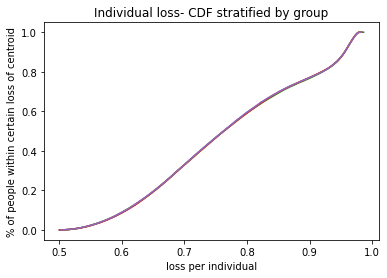

c  {0: (4.186193322593548, 3.614914033738123), 1: (-8.991389673752105, -8.807233051467174), 2: (-10.245340811680682, 6.7067583359351906), 3: (9.487280923671365, -2.991995193571024), 4: (-1.6424198283579237, 8.249053487258898), 5: (-1.9348509735726906, 2.3353353998969784), 6: (1.9719163897582475, 8.999271811243462), 7: (4.886119156882338, -0.978799768577603), 8: (-8.188899554822395, -7.485591465056325), 9: (6.251932688634648, 7.743255397822882)}
weights:  [0.19999977 0.20001932 0.20004865 0.20004204 0.19989021]
Time elapsed Batch Step:  0.36739301681518555
Time elapsed Assignment Step:  2.3173012733459473
0.0009113707443030306
total:  0.5411918189206171


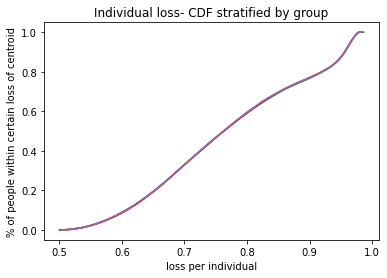

c  {0: (4.185239965394538, 3.6145852426669647), 1: (-8.990556559999193, -8.806472353046319), 2: (-10.243963282652958, 6.7066188492159435), 3: (9.486756770320277, -2.9904470383714963), 4: (-1.6414619342798147, 8.248176219361628), 5: (-1.9339213316638657, 2.336401549082133), 6: (1.970686738755626, 8.998104315361992), 7: (4.88640507035325, -0.977544439549905), 8: (-8.189393152463117, -7.486510392982799), 9: (6.250516716586623, 7.7426593562438555)}
weights:  [0.19999978 0.20001932 0.20004879 0.20004209 0.19989002]
Time elapsed Batch Step:  0.3388233184814453
Time elapsed Assignment Step:  2.370368003845215
0.0008949777936071435
total:  0.5410942318068994


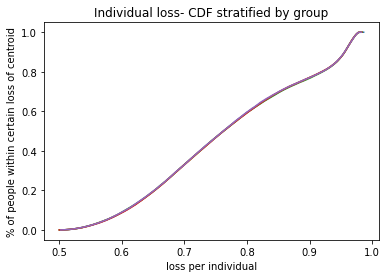

c  {0: (4.184286310122357, 3.614256405903069), 1: (-8.98972519135756, -8.805713230967685), 2: (-10.242588471650317, 6.70647980115584), 3: (9.486233525989247, -2.988901603550489), 4: (-1.6405055922337248, 8.247300417939199), 5: (-1.9329924780981949, 2.337466813206968), 6: (1.969458864623561, 8.996938528960394), 7: (4.8866912186683455, -0.9762891879499648), 8: (-8.18988536914978, -7.487426854641714), 9: (6.249102976640725, 7.742064342306847)}
weights:  [0.1999998  0.20001931 0.20004892 0.20004214 0.19988983]
Time elapsed Batch Step:  0.3602919578552246
Time elapsed Assignment Step:  2.3047127723693848
0.0008471846548835371
total:  0.5409874454991426


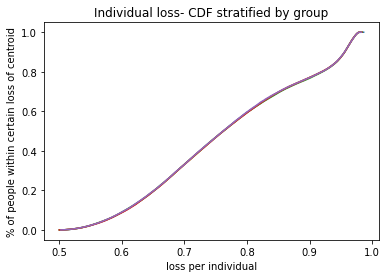

c  {0: (4.183332356852977, 3.6139275234852986), 1: (-8.988895567638137, -8.804955685717413), 2: (-10.241216377372576, 6.706341191120248), 3: (9.48571119124446, -2.9873588907240674), 4: (-1.6395508022778145, 8.246426083537761), 5: (-1.9320644141982974, 2.338531190531933), 6: (1.9682327704776204, 8.995774455509007), 7: (4.886977601839238, -0.9750340146747415), 8: (-8.190376206412115, -7.48834085249201), 9: (6.247691469377686, 7.741470356446135)}
weights:  [0.19999981 0.20001931 0.20004905 0.20004219 0.19988965]
Time elapsed Batch Step:  0.34914159774780273
Time elapsed Assignment Step:  2.3417813777923584
0.0008027590827899278
total:  0.5408818903076004


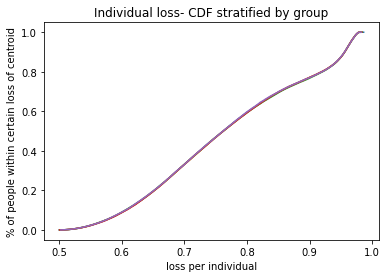

c  {0: (4.182378105662977, 3.613598595452618), 1: (-8.988067688631373, -8.804199717764961), 2: (-10.239846998487847, 6.706203018477441), 3: (9.485189766659902, -2.9858189014640613), 4: (-1.6385975644597703, 8.245553216690956), 5: (-1.93113714128479, 2.3395946793228983), 6: (1.967008459368475, 8.994612098435088), 7: (4.88726421987633, -0.9737789206224539), 8: (-8.190865665791968, -7.48925238901426), 9: (6.2462821953542385, 7.740877399091319)}
weights:  [0.19999982 0.2000193  0.20004919 0.20004223 0.19988946]
Time elapsed Batch Step:  0.3456432819366455
Time elapsed Assignment Step:  2.3143091201782227
0.0007628084584120343
total:  0.5407778979320725


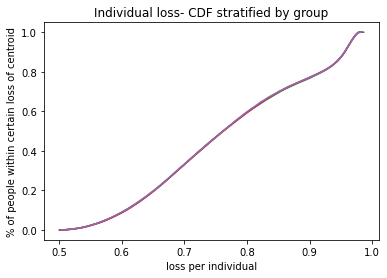

c  {0: (4.181423556629542, 3.613269621844095), 1: (-8.98724155410726, -8.803445327563097), 2: (-10.238480333633552, 6.7060652825987885), 3: (9.48466925281626, -2.984281637299703), 4: (-1.6376458788168506, 8.244681817919973), 5: (-1.9302106606762215, 2.340657277851197), 6: (1.9657859342826978, 8.993451461122277), 7: (4.887551072788818, -0.9725239066925861), 8: (-8.191353748843225, -7.490161466710578), 9: (6.24487515510352, 7.740285470667183)}
weights:  [0.19999983 0.2000193  0.20004932 0.20004228 0.19988927]
Time elapsed Batch Step:  0.3757786750793457
Time elapsed Assignment Step:  2.3415496349334717
0.0007073821311569528
total:  0.5406694832976171


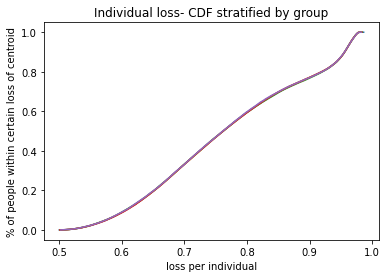

c  {0: (4.180468709830468, 3.6129406026989015), 1: (-8.986417163815345, -8.802692515547877), 2: (-10.237116381417419, 6.705927982858905), 3: (9.484149650299825, -2.9827470997190026), 4: (-1.6366957453759279, 8.243811887733603), 5: (-1.9292849736890056, 2.3417189843936734), 6: (1.9645651981436716, 8.992292546910052), 7: (4.8878381605847006, -0.9712689737858949), 8: (-8.191840457131743, -7.491068088104524), 9: (6.2434703491354595, 7.739694571593548)}
weights:  [0.19999984 0.20001929 0.20004946 0.20004233 0.19988908]
Time elapsed Batch Step:  0.35771799087524414
Time elapsed Assignment Step:  2.254058361053467
0.0007145845085041458
total:  0.5405800784680949


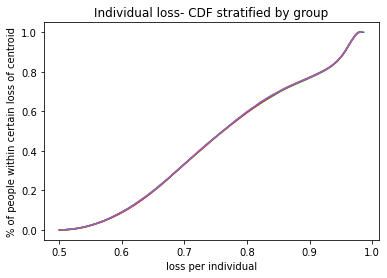

c  {0: (4.17951356534416, 3.612611538056311), 1: (-8.985594517484744, -8.801941282138634), 2: (-10.235755140418485, 6.705791118635772), 3: (9.48363095970135, -2.981215290169898), 4: (-1.635747164153528, 8.242943426628289), 5: (-1.9283600816373507, 2.3427797972327356), 6: (1.9633462538126054, 8.991135359093148), 7: (4.888125483270785, -0.9700141228044147), 8: (-8.192325792235275, -7.491972255741011), 9: (6.2420677779371525, 7.739104702285128)}
weights:  [0.19999985 0.20001929 0.20004959 0.20004238 0.19988889]
Time elapsed Batch Step:  0.3440542221069336
Time elapsed Assignment Step:  2.313523054122925
0.000777549983369763
total:  0.5405076236982947


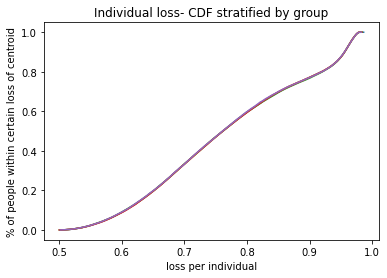

c  {0: (4.178558123249637, 3.6122824279557015), 1: (-8.984773614824164, -8.80119162773796), 2: (-10.234396609188074, 6.705654689310824), 3: (9.483113181614895, -2.979686210061198), 4: (-1.6348001351558668, 8.242076435088181), 5: (-1.9274359858331869, 2.343839714656408), 6: (1.9621291040896605, 8.989979900920964), 7: (4.888413040852691, -0.9687593546514639), 8: (-8.1928097557434, -7.492873972186209), 9: (6.240667441973221, 7.738515863151377)}
weights:  [0.19999986 0.20001928 0.20004973 0.20004243 0.19988871]
Time elapsed Batch Step:  0.37229180335998535
Time elapsed Assignment Step:  2.3613901138305664
0.0008074999686684681
total:  0.5404254853181177


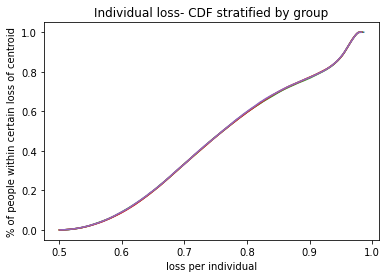

c  {0: (4.177602383626529, 3.6119532724365553), 1: (-8.983954455521918, -8.800443552731698), 2: (-10.233040786250765, 6.705518694269011), 3: (9.482596316636643, -2.9781598607633497), 4: (-1.633854658378884, 8.24121091358519), 5: (-1.9265126875860907, 2.3448987349583916), 6: (1.9609137517151847, 8.988826175596987), 7: (4.888700833334861, -0.967504670231651), 8: (-8.193292349257451, -7.4937732400274495), 9: (6.239269341686162, 7.737928054596329)}
weights:  [0.19999987 0.20001928 0.20004986 0.20004248 0.19988852]
Time elapsed Batch Step:  0.3454272747039795
Time elapsed Assignment Step:  2.2948577404022217
0.0007965986289883986
total:  0.5403313127779115


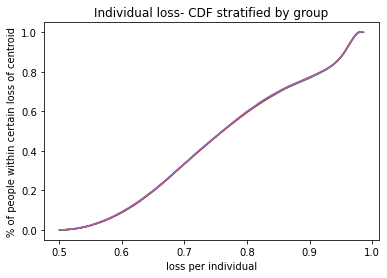

c  {0: (4.176646346555083, 3.6116240715384578), 1: (-8.983137039245952, -8.799697057488924), 2: (-10.23168767010534, 6.705383132898822), 3: (9.482080365363638, -2.976636243609044), 4: (-1.6329107338082736, 8.240346862579038), 5: (-1.9255901882032074, 2.345956856438125), 6: (1.9597001993710537, 8.987674186278223), 7: (4.888988860720563, -0.9662500704508797), 8: (-8.193773574390432, -7.494670061873125), 9: (6.237873477496687, 7.7373412770184435)}
weights:  [0.19999988 0.20001927 0.20005    0.20004252 0.19988833]
Time elapsed Batch Step:  0.35732436180114746
Time elapsed Assignment Step:  2.2992472648620605
0.0007502139216480908
total:  0.5402267159630886


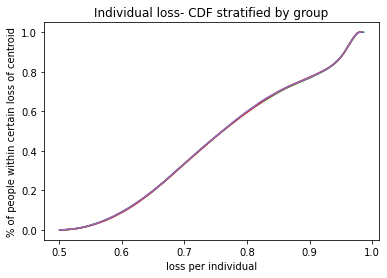

c  {0: (4.175690012116161, 3.6112948253010995), 1: (-8.982321365643854, -8.798952142361934), 2: (-10.230337259225708, 6.7052480045922955), 3: (9.48156532839248, -2.975115359893674), 4: (-1.631968361419511, 8.239484282517306), 5: (-1.9246684889891694, 2.3470140774008477), 6: (1.958488449682112, 8.986523936074672), 7: (4.889277123011898, -0.9649955562163546), 8: (-8.19425343276696, -7.4955644403525925), 9: (6.236479849804039, 7.736755530810438)}
weights:  [0.19999988 0.20001926 0.20005014 0.20004257 0.19988814]
Time elapsed Batch Step:  0.35115599632263184
Time elapsed Assignment Step:  2.3515818119049072
0.0006992269937147189
total:  0.5401209594117566


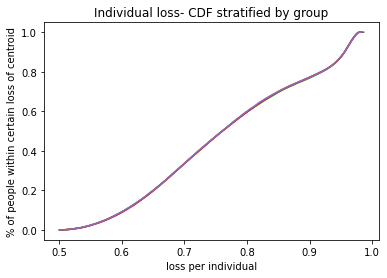

c  {0: (4.174733380391242, 3.6109655337642748), 1: (-8.981507434342888, -8.79820880768624), 2: (-10.228989552061813, 6.705113308744997), 3: (9.481051206317899, -2.973597210875657), 4: (-1.631027541177879, 8.238623173835487), 5: (-1.9237475912460136, 2.348070396157669), 6: (1.9572785052177122, 8.985375428048844), 7: (4.889565620209807, -0.9637411284365863), 8: (-8.194731926023177, -7.4964563781160765), 9: (6.235088458986307, 7.736170816359126)}
weights:  [0.19999989 0.20001926 0.20005027 0.20004262 0.19988796]
Time elapsed Batch Step:  0.3601384162902832
Time elapsed Assignment Step:  2.318633794784546
0.0006468081758534971
total:  0.5400149319443999


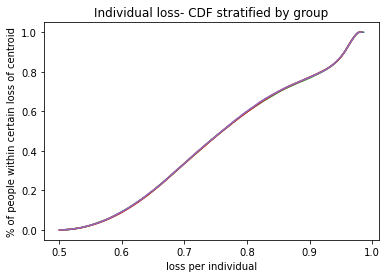

c  {0: (4.173757898554321, 3.6106499169796797), 1: (-8.980695244950004, -8.797467053780554), 2: (-10.22764454704051, 6.704979044755976), 3: (9.480537999731219, -2.9720817977766263), 4: (-1.6300882730384887, 8.237763536957035), 5: (-1.9228274962730947, 2.349125811025637), 6: (1.9560703684933414, 8.984228665215335), 7: (4.889853907854073, -0.9624831558440816), 8: (-8.195209055806686, -7.497345877834563), 9: (6.233699305400724, 7.7355871340452484)}
weights:  [0.1999999  0.20001925 0.20005041 0.20004267 0.19988777]
Time elapsed Batch Step:  0.3414621353149414
Time elapsed Assignment Step:  2.327200174331665
0.0006132406255033862
total:  0.5399147798093109


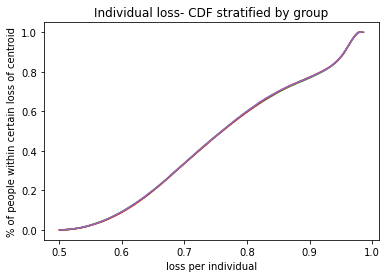

c  {0: (4.172782105159137, 3.6103342478190146), 1: (-8.97988479705187, -8.79672688094678), 2: (-10.226302242566423, 6.7048452120277044), 3: (9.480025709218625, -2.970569121781483), 4: (-1.6291505569462987, 8.236905372293407), 5: (-1.9219082053669971, 2.350180320327809), 6: (1.9548640419723293, 8.983083650540475), 7: (4.890142430088717, -0.9612252633687927), 8: (-8.195684823776467, -7.498232942199703), 9: (6.232312389383952, 7.735004484243308)}
weights:  [0.1999999  0.20001924 0.20005054 0.20004272 0.19988759]
Time elapsed Batch Step:  0.3485383987426758
Time elapsed Assignment Step:  2.3094277381896973
0.0006225907253389895
total:  0.5398277231943284


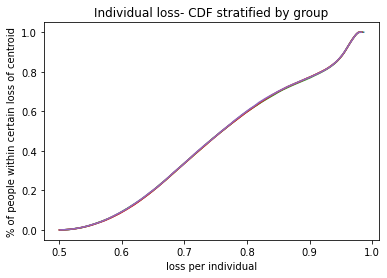

c  {0: (4.171806000293026, 3.610018526315662), 1: (-8.979076090214889, -8.795988289470005), 2: (-10.224962637022763, 6.704711809965996), 3: (9.479514335359207, -2.9690591840383047), 4: (-1.6282143928361315, 8.23604868024412), 5: (-1.9209897198214423, 2.351233922393329), 6: (1.9536595280676252, 8.981940386942064), 7: (4.89043118691172, -0.9599674519226777), 8: (-8.196159231602815, -7.499117573923705), 9: (6.2309277112523604, 7.734422867321395)}
weights:  [0.19999991 0.20001923 0.20005068 0.20004277 0.19988741]
Time elapsed Batch Step:  0.3510744571685791
Time elapsed Assignment Step:  2.309300661087036
0.0006381633563505851
total:  0.5397427540041926


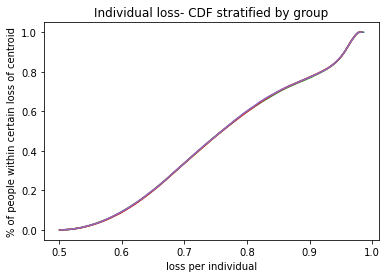

c  {0: (4.170829584043998, 3.6097027525031256), 1: (-8.978269123985227, -8.79525127961849), 2: (-10.22362572877214, 6.704578837979904), 3: (9.479003878722683, -2.967551985658074), 4: (-1.6272797806326862, 8.235193461196788), 5: (-1.9200720409271954, 2.3522866155575), 6: (1.9524568291436335, 8.980798877289187), 7: (4.890720178319927, -0.9587097224190562), 8: (-8.196632280967249, -7.499999775739237), 9: (6.229545271302285, 7.73384228364102)}
weights:  [0.19999991 0.20001922 0.20005081 0.20004282 0.19988723]
Time elapsed Batch Step:  0.3378612995147705
Time elapsed Assignment Step:  2.287339210510254
0.0006271149489127659
total:  0.5396500180408312


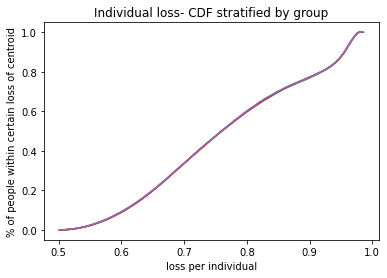

c  {0: (4.169852856500739, 3.6093869264150293), 1: (-8.97746389788883, -8.794515851643666), 2: (-10.222291516157322, 6.704446295481611), 3: (9.478494339866687, -2.966047527714182), 4: (-1.6263467202505493, 8.234339715527167), 5: (-1.9191551699719676, 2.3533383981618643), 6: (1.951255947518096, 8.979659124402131), 7: (4.891009404309045, -0.957452075772613), 8: (-8.197103973562449, -7.500879550399319), 9: (6.228165069810286, 7.733262733556941)}
weights:  [0.19999992 0.20001921 0.20005094 0.20004287 0.19988705]
Time elapsed Batch Step:  0.33902597427368164
Time elapsed Assignment Step:  2.2610416412353516
0.0006302160758897557
total:  0.5395617468876402


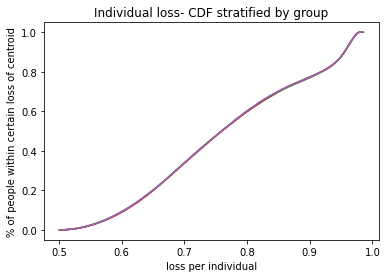

c  {0: (4.168875817752614, 3.6090710480851196), 1: (-8.97666041143146, -8.793782005780123), 2: (-10.220959997501978, 6.704314181886301), 3: (9.47798571933348, -2.9645458112416163), 4: (-1.6254152115942018, 8.233487443599198), 5: (-1.9182391082403165, 2.354389268554281), 6: (1.950056885464006, 8.978521131052409), 7: (4.891298864873658, -0.9561945128994038), 8: (-8.197574311092175, -7.50175690067722), 9: (6.226787107033385, 7.732684217416992)}


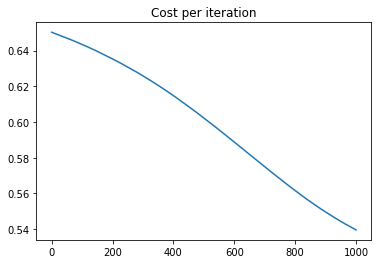

Reached max iterations
prev centroids:  {0: (4.169852856500739, 3.6093869264150293), 1: (-8.97746389788883, -8.794515851643666), 2: (-10.222291516157322, 6.704446295481611), 3: (9.478494339866687, -2.966047527714182), 4: (-1.6263467202505493, 8.234339715527167), 5: (-1.9191551699719676, 2.3533383981618643), 6: (1.951255947518096, 8.979659124402131), 7: (4.891009404309045, -0.957452075772613), 8: (-8.197103973562449, -7.500879550399319), 9: (6.228165069810286, 7.733262733556941)}


{0: (4.168875817752614, 3.6090710480851196),
 1: (-8.97666041143146, -8.793782005780123),
 2: (-10.220959997501978, 6.704314181886301),
 3: (9.47798571933348, -2.9645458112416163),
 4: (-1.6254152115942018, 8.233487443599198),
 5: (-1.9182391082403165, 2.354389268554281),
 6: (1.950056885464006, 8.978521131052409),
 7: (4.891298864873658, -0.9561945128994038),
 8: (-8.197574311092175, -7.50175690067722),
 9: (6.226787107033385, 7.732684217416992)}

In [19]:
df = assign_cluster(df, centroids)
groups = compute_groups(df)
compute_cdf_graph(groups)
clusters = compute_clusters(df)
cdf1, cdf2 = compute_cdf(groups)
#subgroup loss between max and min loss
subgroup_loss = compare_loss(groups[cdf1], groups[cdf2], 50)
loss = sum_loss(df, centroids, subgroup_loss)
update(centroids,df, subgroup_loss, loss, groups, cdf1, cdf2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: Explicit initial center position passed: performing only one init in k-means instead of n_init=10
  This is separate from the ipykernel package so we can avoid doing imports until


Time elapsed Assignment Step:  2.3029274940490723


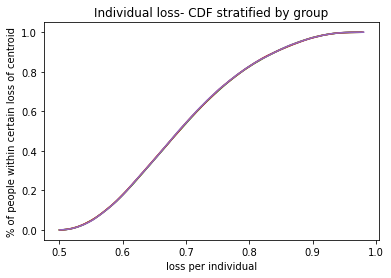

0.0012261279713239315
total:  0.4891185129963197
subgroup  0.0012261279713239315
tot  0.4891185129963197


In [20]:
from sklearn.cluster import KMeans
def KMeans_orig(df, data, centr):
  kmeans = KMeans(init=centr, n_clusters=10, random_state=0).fit(data)
  centr =  kmeans.cluster_centers_
  centroids = {}
  for i in range(len(centr)):
    centroids[i] = centr[i]
  df = assign_cluster(df, centroids)
  df['min_centr'] = kmeans.labels_
  df['min_loss'] = df[['loss_from_{}'.format(i) for i in centroids.keys()]].min(axis=1)
  groups = compute_groups(df)
  compute_cdf_graph(groups)
  clusters = compute_clusters(df)
  cdf1, cdf2 = compute_cdf(groups)
  #subgroup loss between max and min loss
  subgroup_loss = compare_loss(groups[cdf1], groups[cdf2], 50)
  loss = sum_loss(df, centroids, subgroup_loss)
  return (subgroup_loss, loss, kmeans)
subgroup, tot, kmeans = KMeans_orig(df, X, np.array(prev))
print('subgroup ', subgroup)
print('tot ', tot)

In [ ]:
df = assign_cluster(df, centroids)
df

Time elapsed Assignment Step:  2.3564553260803223


,x_coord,y_coord,group,dist_from_1,dist_from_2,dist_from_3,dist_from_4,dist_from_5,dist_from_6,dist_from_7,dist_from_8,dist_from_9,min_centr,min_loss
0,-1.404653,7.518255,3,9.258398,8.610287,17.484669,15.866544,5.916372,2.075472,8.985870,3.834454,4.575889,6,0.888496
1,-9.204275,6.972614,8,1.694105,16.428954,14.575455,22.174215,9.292424,8.096009,15.478650,11.220712,12.129034,1,0.844763
2,-1.203213,8.475455,3,9.475211,8.392588,18.414921,16.348603,6.882244,1.164278,9.513540,4.232595,4.009915,6,0.762109
3,-1.650650,3.173181,2,10.145598,10.136225,13.755853,13.720806,1.567769,6.416855,7.126200,4.352027,7.804588,5,0.827465
4,-8.527088,-8.955938,7,16.934061,23.221146,2.212031,20.299662,12.620595,19.816677,17.326368,17.956865,21.737757,3,0.901325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
799995,9.482244,-2.057438,4,22.441772,10.457710,20.484123,1.420381,11.689427,16.037227,5.514370,10.776936,13.627414,4,0.805398
799996,5.357845,0.613922,5,17.571402,7.748415,17.618957,6.323587,7.046374,11.321322,0.901901,6.077605,9.502734,7,0.711340
799997,1.284055,8.219555,6,11.947304,5.899265,19.548464,14.431530,7.222645,3.141093,7.806929,2.663585,1.996785,9,0.880459
799998,1.036550,4.332408,0,12.209643,7.232411,16.397806,11.982706,3.805697,5.855409,5.094466,1.585124,5.604611,8,0.829929
